In [1]:
import pandas as pd
import numpy as np
import os
from os import path
import shutil
import psycopg2

# Read in data


In [2]:
df = pd.read_csv('/Users/cp/Documents/dsi/8a_kaggle/routes_full.csv')

In [3]:
df.columns

Index(['userAvatar', 'userName', 'userSlug', 'date', 'difficulty', 'isHard',
       'isSoft', 'type', 'comment', 'traditional', 'project', 'rating',
       'userPrivate', 'zlagGradeIndex', 'zlaggableName', 'zlaggableSlug',
       'cragSlug', 'cragName', 'countrySlug', 'countryName', 'areaSlug',
       'areaName', 'sectorSlug', 'sectorName', 'category', 'recommended',
       'firstAscent', 'secondGo', 'isBoltedByMe', 'isOverhang', 'isVertical',
       'isSlab', 'isRoof', 'isAthletic', 'isEndurance', 'isCrimpy', 'isCruxy',
       'isSloper', 'isTechnical', 'isDanger', 'chipped', 'withKneepad',
       'badAnchor', 'badBolts', 'highFirstBolt', 'looseRock',
       'badClippingPosition'],
      dtype='object')

In [4]:
df.difficulty.value_counts()

7a     266486
7a+    186873
7b     162847
6c     133755
6c+    128814
6b     123052
7b+    117470
6b+    112865
6a+     97702
6a      96905
7c      93286
8a      67223
7c+     61156
5c      39865
8a+     23490
5b      20355
5a      13697
8b      10962
4a       7291
8b+      3784
4c       1927
8c       1698
4b       1526
3a        980
5c+       548
5b+       306
8c+       245
3c        235
5a+       129
3b        109
9a         66
2          60
9a+        22
6A+         3
5C          3
7C          3
6A          2
5B          2
7A          2
9b          1
6B          1
7A+         1
6C+         1
Name: difficulty, dtype: int64

In [5]:
df.zlagGradeIndex.value_counts()

23    269997
24    187769
25    161434
21    133180
22    129526
18    124327
26    119378
19    110450
16     98886
17     95856
27     93715
29     65780
28     61612
14     39541
30     22872
12     20309
11     13050
31     10780
6       7867
32      3692
33      1584
9       1446
3       1034
7        987
34       229
5        174
35        64
4         51
15        45
2         40
10        30
36        22
13        21
Name: zlagGradeIndex, dtype: int64

# Find all routes with 6c+/11c rating 


In [6]:
df_11c = df[df['difficulty']== '6c+']

In [7]:
df_11c.zlagGradeIndex.value_counts()

22    112006
23      8889
21      5765
24       760
19       701
25       195
18       154
17        93
16        78
26        59
27        41
28        39
29        16
12         8
14         3
31         3
32         1
15         1
30         1
11         1
Name: zlagGradeIndex, dtype: int64

In [8]:
df_11c.difficulty.value_counts()

6c+    128814
Name: difficulty, dtype: int64

# Only use routes +1/-1 to be included in change

In [9]:
df_11c2 = df_11c[(df_11c['zlagGradeIndex'] >20) &  (df_11c['zlagGradeIndex'] <24)]

In [10]:
df_11c2.zlagGradeIndex.value_counts()

22    112006
23      8889
21      5765
Name: zlagGradeIndex, dtype: int64

In [11]:
df_11c2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 126660 entries, 0 to 1774716
Data columns (total 47 columns):
 #   Column               Non-Null Count   Dtype 
---  ------               --------------   ----- 
 0   userAvatar           66056 non-null   object
 1   userName             126660 non-null  object
 2   userSlug             113514 non-null  object
 3   date                 126660 non-null  object
 4   difficulty           126660 non-null  object
 5   isHard               126660 non-null  bool  
 6   isSoft               126660 non-null  bool  
 7   type                 126660 non-null  object
 8   comment              37364 non-null   object
 9   traditional          126660 non-null  bool  
 10  project              126660 non-null  bool  
 11  rating               126660 non-null  int64 
 12  userPrivate          126660 non-null  bool  
 13  zlagGradeIndex       126660 non-null  int64 
 14  zlaggableName        126660 non-null  object
 15  zlaggableSlug        126660 non-n

In [12]:
df_11c2.columns

Index(['userAvatar', 'userName', 'userSlug', 'date', 'difficulty', 'isHard',
       'isSoft', 'type', 'comment', 'traditional', 'project', 'rating',
       'userPrivate', 'zlagGradeIndex', 'zlaggableName', 'zlaggableSlug',
       'cragSlug', 'cragName', 'countrySlug', 'countryName', 'areaSlug',
       'areaName', 'sectorSlug', 'sectorName', 'category', 'recommended',
       'firstAscent', 'secondGo', 'isBoltedByMe', 'isOverhang', 'isVertical',
       'isSlab', 'isRoof', 'isAthletic', 'isEndurance', 'isCrimpy', 'isCruxy',
       'isSloper', 'isTechnical', 'isDanger', 'chipped', 'withKneepad',
       'badAnchor', 'badBolts', 'highFirstBolt', 'looseRock',
       'badClippingPosition'],
      dtype='object')

In [13]:
df_11c2.zlaggableName.head()

0    !Xabbu!
1    !Xabbu!
2    !Xabbu!
3    !Xabbu!
4    !Xabbu!
Name: zlaggableName, dtype: object

In [14]:
df_11c2_dropped = df_11c2.drop_duplicates(keep = 'last')

In [15]:
df_11c2_dropped.shape

(126660, 47)

In [16]:
df_11c2_dropped.zlaggableName.head()

0    !Xabbu!
1    !Xabbu!
2    !Xabbu!
3    !Xabbu!
4    !Xabbu!
Name: zlaggableName, dtype: object

# Keep only unique names


In [17]:
# names = []
# for key, value in df_11c2_dropped.iteritems()
names = df_11c2_dropped.zlaggableName.unique()

In [18]:
len(names)

4855

In [19]:
names

array(['!Xabbu!', 'Tomas Turbado', '10.0', ..., 'Wielkie wyzwanie',
       'La Ley del Cateto', 'Que pasa neng?'], dtype=object)

In [20]:
for i in range(100):
    print(names[i])

!Xabbu!
Tomas Turbado
10.0
13b
1492
175
1821
Dasin Dasot
19a
2046
29 b
29B
1500 metres
Sex Zäh Plus
51%
Has It Got A Chevy Motor?
5Ra
6c de Ermita
Sense pi
7
75 la totale
770
80 C
997
998
N.N. (Schmick Route)
Sacré farceur
O dia que a terra parou
Abseitsfalle
AKUT
ANKH
mundo mágico dos abacates
Abbiò
Abecedaire
Abelhuda
Satan is My Motor
Absinthe
Absolvent
Abstinência
Zulu Gula
Achentalexpress
Acheron
Achternbusch
Acracia
Across the Universe
Acupuntura
Adalpina
Adamo
Adelaida
Adi przybywa
Adi's Doctorate
Zebra ad infinitum
Adlerschnitzel
Schnitzel on Seitz
Admiral
Adoption
Pour Florence
Aeolia
Aerial
Aerodinamika
Aerodynamex
Aeroflot
Aerostatika
Aesthetica
Affengeil
Affenschaukel
Affluenza
Agaporni
Agent Orange
Toxic
Agrielia
Agroturystyka
La cerise sur le gâteau
Aimless
Aintza
Air walk
Ajetreos
Akatharisti
Akcja Wiewiorka
Aklamacja
Akram the Terrible
Akt
Akuna Matata
Akwizytor mocy
albatrost
Albanski konjak
Alchemy
Solstizio d'estate
Alchimie d'estate
Alcoolic Passenger
Aledged Perpet

# Read in table with missing 11c values

In [21]:
param_dic = {
#     "host"      : "******",
  
#     "database"  : "******",
    
#     "user"      : "*****",
    
#     "password"  : "******"
   
}
def connect(params_dic):
    """ Connect to the PostgreSQL database server """
    conn = None
    try:
        # connect to the PostgreSQL server
        print('Connecting to the PostgreSQL database...')
        conn = psycopg2.connect(**params_dic)
    except (Exception, psycopg2.DatabaseError) as error:
        print(error)
        sys.exit(1) 
    print("Connection successful")
    return conn

In [22]:
def postgresql_to_dataframe(conn, select_query, column_names):
    """
    Tranform a SELECT query into a pandas dataframe
    """
    cursor = conn.cursor()
    try:
        cursor.execute(select_query)
    except (Exception, psycopg2.DatabaseError) as error:
        print("Error: %s" % error)
        cursor.close()
        return 1
    
    # Naturally we get a list of tupples
    tupples = cursor.fetchall()
    cursor.close()
    
    # We just need to turn it into a pandas dataframe
    df = pd.DataFrame(tupples, columns=column_names)
    return df

In [23]:
conn = connect(param_dic)
column_names = ["name", "user_id", "grade_id"]
# Execute the "SELECT *" query
df_sqlite_full = postgresql_to_dataframe(conn, "select name, user_id, grade_id from ascents", column_names)

Connecting to the PostgreSQL database...
Connection successful


In [24]:
df_sqlite_full.head()

,name,user_id,grade_id
0,Mantal Problem,11629.0,29.0
1,Chicks,11629.0,31.0
2,Left of Cross Me,11629.0,29.0
3,jump chump,11275.0,44.0
4,Saturday Night Live,11275.0,40.0


In [25]:
df_sqlite_full.grade_id.value_counts()

49.0    539302
51.0    390615
44.0    333910
53.0    330989
40.0    303937
36.0    275817
55.0    261207
46.0    249403
42.0    228115
57.0    226202
38.0    205878
59.0    149484
62.0    141945
33.0    140634
31.0     86815
29.0     63816
64.0     59025
21.0     42257
66.0     30879
68.0     12773
13.0     12134
25.0      7443
70.0      6058
23.0      5377
72.0      2055
17.0      1803
15.0      1603
7.0       1462
75.0       725
77.0       130
79.0        27
1.0         23
71.0        16
73.0         9
81.0         7
83.0         5
5.0          4
60.0         1
10.0         1
9.0          1
Name: grade_id, dtype: int64

In [27]:
df_sqlite_full.grade_id.value_counts()

49.0    539302
51.0    390615
44.0    333910
53.0    330989
40.0    303937
36.0    275817
55.0    261207
46.0    249403
42.0    228115
57.0    226202
38.0    205878
59.0    149484
62.0    141945
33.0    140634
31.0     86815
29.0     63816
64.0     59025
21.0     42257
66.0     30879
68.0     12773
13.0     12134
25.0      7443
70.0      6058
23.0      5377
72.0      2055
17.0      1803
15.0      1603
7.0       1462
75.0       725
77.0       130
79.0        27
1.0         23
71.0        16
73.0         9
81.0         7
83.0         5
5.0          4
60.0         1
10.0         1
9.0          1
Name: grade_id, dtype: int64

# Change rating to 11c if name in list

In [28]:
for item, frame in df_sqlite_full['name'].iteritems():
    if frame in names:
        print(f'{frame}:{item}:')
        df_sqlite_full.at[item, 'grade_id'] =47
                        
                        
#         dataframe.at[index,'column-name']='new value'

Mutual of Omaha:44:
Babo does Thailand:47:
Stalagasaurus:53:
The Lion King:55:
Kuahtittnseppl:58:
Red dwarf:61:
Good Medicine:65:
Roots Rock Reggae:69:
Babes in Thailand:71:
Viking in Heat:72:
Hin Rong Hai (Crying Rock):73:
Narsilion:75:
Ananda:104:
El Daü:110:
Sweating Mekong:148:
Pigsa:173:
Beefcake:227:
Rysa Kurtyki:243:
Lewy meningitis:251:
Samba:272:
Sostre d'en burot:287:
Mantra:344:
Echoes:347:
Freedom safari:364:
Hot flyer:369:
Swalk:374:
The Lardy Lady's Lats:376:
These People are Sandwiches:377:
Twisted:379:
Electricorp Production:389:
Stranglehold:395:
Roots Rock Reggae:396:
Viking in Heat:398:
Hin Rong Hai (Crying Rock):400:
Stalagasaurus:401:
Babes in Thailand:402:
Narsilion:412:
Top Tour:438:
Lass die Sonne rein:521:
Piccolina:523:
Zonenrandgebiet:524:
Slider:630:
Un point c'est tout:696:
Condomínio fechado:711:
Mefisto:725:
Albanski konjak:726:
Zafiro:761:
La Mystique Voyeur:791:
Off the lip:871:
Chão de Giz:913:
Warm Up:1000:
Sweating Mekong:1046:
Babes in Thailand:1053

Mutual of Omaha:11442:
Stalagasaurus:11467:
Babes in Thailand:11468:
Good Medicine:11471:
Loisl:11473:
Kuahtittnseppl:11479:
Rocket Man:11483:
Red dwarf:11494:
Babo does Thailand:11497:
Medusa's Lover:11498:
Nut cracker:11499:
Le Maximun Agarr:11511:
Ultima Albertencia:11729:
Coño Paco:11740:
Life is Sweet:11749:
Bottom Feeder:11750:
Trad Sucker:11763:
Mona Lisa Overdrive:11764:
Block Party:11779:
Vitale I:11787:
Zulu Gula:11802:
Balene:11807:
Jimmy and the Big Boys:11808:
Cedar Rouge:11810:
The Jester:11813:
J.E.M:11827:
Imagination:11846:
Highstep:11852:
Satisfaction Guaranteed:11902:
Bottom Feeder:11933:
Mini Cooper:11959:
Espolón Atómico:12002:
Los hermanos macarron:12003:
Bambus:12030:
Leva bunkica:12032:
Čepljevi cmoki:12033:
Jaslice:12036:
Hekseskudd:12048:
Rampião:12059:
Bicoin:12156:
Twisted:12179:
Halloween:12194:
Niafunke:12201:
A Day in the Life:12242:
Aborigine:12243:
Psycho-Wussy:12244:
Areterection:12281:
Buddha Hole:12282:
Malditos roedores:12325:
El Kakilo:12344:
Life

Orgasmatic:20594:
Placebo:20595:
Violator:20645:
Klęska szybkiego Heinza:20659:
Il picchio sgamato:20660:
Enigma:20661:
Ignition:20670:
Tocame-La Sam:20690:
Whip-Stocking:20840:
Yadda Yadda Yadda:20841:
Les copains d'abord:20914:
Klęska szybkiego Heinza:20921:
The ring's:20965:
Magnesium blue:20970:
L'avvocato:20987:
Aladin:21088:
7:21145:
Fragile:21183:
Condom Stress:21227:
Alptraum:21281:
Glass Coffin:21323:
Bis a bis:21360:
Mescalina tropical:21370:
The Dingy:21383:
Mutiny:21384:
Critters on the cliff:21388:
Mayflower:21389:
Nescafé:21398:
The ring's:21406:
Bis a bis:21452:
Żywcem Się Okocim:21484:
Ignition:21515:
Sem compromisso:21581:
Goupil:21607:
Cargol treu banya:21624:
Purolitic:21651:
Nunca me llama mi novia:21659:
Sally's Alley:21706:
A qui ejacula, deu ajuda:21724:
Haber pedido muerte:21728:
Garbatx despistax:21736:
Halloween:21860:
Foo Foo the Cordless Draw Monkey:21867:
Nev Herrod:21875:
Foo Foo the Cordless Draw Monkey:21878:
Hairy Horrace:21891:
Gat reggae:21932:
Rysa F

Maitre Lardon:31069:
Megatherion:31093:
Hot flyer:31105:
Maitre Lardon:31118:
Tiramisu:31127:
barbatruc:31132:
Wüstensturm:31135:
Plåt-Nicklas:31145:
Ketama:31205:
Reumo loção p'melão:31215:
Phantasmagoria:31274:
Postrzyżyny Isztwana:31276:
Highstep:31299:
Tigerögat:31300:
Highstep:31301:
Tigerögat:31302:
Rodeo:31314:
Tchatchounette:31346:
Le torcheur d'éléphants:31347:
Hobotnica:31414:
Konsum:31415:
Icones:31416:
Propozycja Marcisza:31462:
Środek Filara Obok Garażu:31469:
Zoquetes:31497:
Poldo:31569:
Silversurfaren:31615:
Pulsbeschleuniger:31641:
2n viatge a Venus:31660:
Veles i vents:31664:
Via da Inês:31676:
A streaker named desire:31740:
Critters on the cliff:31758:
Placebo:31806:
Sally's Alley:31816:
Erfurt:31871:
Lara Croft:31873:
Pfauenauge:31895:
Rotfuchs:31896:
Kapten Haddock:31928:
Brothers In Arms:31936:
Diedre:31955:
Kapten Haddock:31978:
Transea:32013:
Talseite:32029:
Kapten Haddock:32039:
Ejakulation:32073:
Blutspur:32090:
Rodeo:32098:
Tazio:32100:
Schöne Platte:32104:
Sc

Jubilejnyj:40894:
Sojuz:40895:
Raons de pes:41016:
Lurere enn Luhr:41037:
Pimf:41059:
Ananda:41067:
Via le man dal cul:41086:
Elena:41087:
Picando bajo la lluvia:41109:
Bajando pal sur:41110:
El perro del cortijo:41111:
Bitelchus:41112:
Via le man dal cul:41137:
Big Mac:41142:
Agent Orange:41143:
Lara Croft:41149:
Isolation:41152:
Solid Rock:41153:
Meriju:41193:
Kronenburg:41199:
Mondfinsternis:41203:
Ludojadek:41208:
Bombadill:41209:
Pangea:41213:
Flower Power:41278:
Gotetes:41285:
Guirli:41294:
Bogomoljka:41316:
Gorg blau:41326:
Savarsheno nepoznati:41388:
Asterix:41417:
Goofy:41434:
King Louie:41435:
Blixt Gordon:41442:
Cudaczek:41457:
Bajando pal sur:41478:
Basement:41486:
Les Malheurs de Sophie:41490:
Goofy:41508:
Lara Croft:41558:
Garbatx despistax:41568:
Gat reggae:41580:
Burden Chuchen:41581:
Nunca me llama mi novia:41582:
Acracia:41610:
Vidal:41617:
Los loros:41618:
La tenada:41619:
Polka aérea febril:41623:
Utopia:41624:
Futuras promesas:41632:
Ven abente:41634:
Felipe el Her

Kastor:49371:
Kolkoto tolkova:49386:
Tsolovi nevoli:49391:
The undertaker:49438:
La tenada:49443:
Quillerimo:49446:
Tylko Dla Orłów:49502:
Rodeo:49517:
Kreuzspinne:49531:
Big bang:49537:
Rodeo:49551:
Niedziela Palmowa:49597:
Obladi-oblada:49599:
Asterix:49615:
Dzikie Węże:49663:
Paranoid:49686:
Wilcze Jagody:49746:
Himmelsleiter:49754:
The undertaker:49765:
Hale Bopp:49777:
Lyptus:49781:
Kaninartikler:49889:
Flying Circus:49991:
Groundwork:50000:
Flirting with a spanish dancer:50032:
Nylon Happy:50033:
Półtorak Straszliwy:50069:
Sveip:50153:
Rabies:50161:
Szybki Lopez:50198:
Goofy:50261:
Out of the bag:50264:
Bimbo Shrine:50266:
Discombobulated:50267:
Odkurzone przeboje:50281:
La pava de Alejo:50289:
Andrea:50304:
Hale Bopp:50342:
Alquezar.com:50346:
Hot flyer:50379:
La Diagonal:50395:
Czerwona Orkiestra:50396:
Bambus:50413:
Półtorak Straszliwy:50480:
Chepito:50483:
Les copains d'abord:50511:
Les copains d'abord:50528:
Katze Sudan:50543:
La folie des couleurs:50555:
Miss Tintinguette:5

Schweine im Weltall:58175:
A-Hörnchen:58176:
Pinslibeisen:58192:
Pulling On Porcelain:58285:
Men vi er jo menn:58428:
Hokus pokus:58491:
Espeleoska:58543:
El dèspota:58545:
Pasties and a g-string:58606:
Sostre d'en burot:58622:
Cous-Cous:58625:
Zagreb:58649:
El Daü:58658:
Ananda:58674:
Doris:58682:
La tenada:58689:
Donde esta wally:58690:
Los loros:58701:
Vidal:58702:
Futuras promesas:58710:
Ven abente:58711:
Blixt Gordon:58734:
Rodeo:58755:
Bohrhammer:58815:
Drømmen om Lajla:58827:
Great Train Robbery:58868:
Plockepinn:58869:
Feskekörka:58872:
Glassy junction:58875:
Flying Hawaiian:58898:
The Lion King:58899:
Mefisto:59004:
Pile Driver:59007:
Esko Mäkelä:59023:
Lille vakre Anna:59043:
Disturbance:59045:
Scorpions:59061:
Fontanny króla Salomona:59072:
Directissima:59094:
Aschenputtel:59104:
Muffins:59143:
Sincronicity:59163:
Ratones paranoicos:59165:
Heresy:59168:
Semana Baja:59184:
Ritterspiele:59296:
Radler:59298:
Sprengmeister:59306:
Bonaca:59309:
PK Split:59311:
Luftslottet direkt:

Rupture:68177:
Heidi:68180:
Mefisto:68191:
Silversurfaren:68192:
Cigarillo:68195:
Din jævel:68204:
Land of broken dreams:68239:
Frankenstein:68240:
Bjeff:68285:
Marlen extralujo:68288:
Samba:68295:
Ammonit:68298:
Lurere enn Luhr:68326:
Invading Celts:68344:
Westwand:68352:
Bambus:68354:
Cool Runnings:68355:
Schneekönigin:68356:
Kältetherapie:68358:
Karius:68375:
Spiderman:68386:
Rechts vor links:68403:
Glassy junction:68452:
Kundun:68490:
Martaren begiak:68502:
Prestation Aérienne:68532:
Objectif lune:68533:
Great Train Robbery:68584:
Invading Celts:68646:
Albatros:68668:
Bat na wroga:68673:
Jürgen würgen:68698:
Ejakulation:68699:
Mowgli:68708:
Meathooks:68757:
Agent Orange:68780:
Hurtigruten:68824:
Sveip:68851:
L'inachevée:68875:
La reine des pommes:68882:
Pericoloso Sporgersi:68912:
Diedre:68958:
Heinz:68971:
Storpillaren:68998:
Långnäsa:69002:
Hippotenusen:69007:
Sleipner:69015:
Deklaracja:69020:
Tripitaka:69049:
Slider:69050:
Saigon:69092:
Vårkåt:69105:
Cold Cuts:69154:
Snikene kom

Itaca:78352:
11 septembre 2001 ou la bétise humaine:78379:
Opica:78385:
Pijavka:78386:
Lola:78410:
Coyote:78426:
Maldoror:78427:
Besouro Louco:78588:
Lola:78591:
Powiedz Stary Gdzieś Ty Był:78650:
L'edera matura:78653:
Calipso:78702:
Requiem per un Volvo:78703:
Welcome to the machine:78762:
La pilule:78764:
Spiderman:78765:
Cherche mon souffle désespérément:78771:
Cargol treu banya:78798:
T.C.F.:78843:
Fausses fractures:78853:
Community Service:78859:
Goliaf:78958:
Red Hair:79112:
Mevza:79182:
Amb un ou a cada ma:79186:
Luftslottet direkt:79283:
Suprème dimension:79287:
Asterix:79292:
Gorg blau:79310:
Bobo dodo:79316:
Underarms UFO:79341:
Kafoozalem:79396:
Ejakulation:79431:
Treibhauseffekt:79434:
Invading Celts:79437:
Heldbräu:79449:
Heavy Metal Landler:79451:
Rutschpartie:79476:
Rompetechos:79480:
Morcegagem Adquirida:79487:
Rebel Without a Pause:79529:
El Carallon:79553:
Jail Bait:79559:
Harrytasser:79576:
Iceberg:79587:
Wüstensturm:79630:
El fuego de la muerte:79631:
C 100 francs:7

Pornopung:88039:
Touch of Gray:88046:
Across the Universe:88047:
arete:88170:
Baker for smed:88231:
Mantra:88240:
Tatonka:88263:
Feskekörka:88278:
Solid Rock:88332:
Lavskägge:88334:
Odjuret i ditt inre:88336:
Trela:88349:
Elefantenhimmel:88351:
Mon Βatchounousougounoudoudou:88356:
Nabuchodonosor:88357:
Dionysos:88358:
Ciao Vecchio:88360:
Itaca:88361:
Panische Zeiten Direktausstieg:88365:
Fuckin' Bush:88368:
Schieber:88376:
Mefisto:88493:
Gerovit:88561:
Sonho de Ícaro:88586:
Kalya:88588:
Ética decomposta:88603:
Bonnye and Clyde:88609:
stim-o-stam:88620:
Ludojadek:88633:
Przyczajony kucyk, ukryty smok:88634:
Legacy:88636:
Anticipation:88665:
Dilúvio de Sancho Pena:88676:
O dia que a terra parou:88677:
Spiderman:88686:
Purolitic:88698:
Latte Tsunami:88750:
Fat Burner:88752:
Eclipse:88768:
Asteroid:88770:
Hortum:88774:
Easy day:88776:
Mission to Mars:88784:
Inquisition:88786:
Sojuz:88810:
Ananda:88819:
Bal'zam na dushu:88835:
Neoconstructionist:88847:
Zagreb:88909:
Amb un ou a cada ma:8891

Discombobulated:96818:
Legacy:96819:
Samba:96852:
Willy:96967:
Aesthetica:97001:
Blackened:97068:
Brothers In Arms:97080:
International Bolt Conspiracy:97081:
Very Little Green Man:97084:
Für Charles Mingus:97085:
Niedziela Palmowa:97123:
Spasiba + Iva:97129:
Pulling On Porcelain:97163:
Sendero Luminoso:97178:
Spiderman:97220:
Trevili:97280:
Different Strokes:97360:
Spirit Fingers:97361:
Yadda Yadda Yadda:97362:
Whip-Stocking:97363:
Um Bocadinho da Praia:97376:
Vardinos:97411:
Scenic Adult:97443:
Tony the Tiger:97444:
Bimbo Shrine:97445:
Mofeta:97482:
Igel:97483:
Kerveros:97484:
Dionysos:97485:
Lolita:97495:
Kerveros:97496:
Vabeca globina:97500:
Bogomoljka:97502:
Rebel Without a Pause:97508:
Starik:97613:
Kurčji rock:97629:
Cargol treu banya:97648:
Nunca me llama mi novia:97651:
Fruta kombi buba:97657:
Akt:97664:
Vidal:97670:
Westwand:97684:
Tabula Rasa:97685:
Bilbo Baggins:97694:
Bambus:97699:
Affenschaukel:97700:
Schnitzel on Seitz:97702:
Axium:97762:
Ioli:97763:
Thimari:97764:
Black

Axium:105693:
Calipso:105700:
Dionysos:105701:
Ioli:105706:
Kastor:105709:
Thimari:105714:
Saigon:105803:
Hungover:105850:
El Buscavidas:105852:
Las Novias de Fumanchu:105897:
Bis a bis:105902:
Schöne Platte:105958:
Schöne Aussicht:105959:
Todorin:105998:
El Gato con Botas:106016:
sube golondrina:106028:
Zafiro:106038:
Sopa de ganso:106045:
Juno:106056:
Supertrunch:106087:
Picando bajo la lluvia:106088:
Going the Distance:106114:
Uschana:106221:
Aphrodisia:106231:
Ciao Vecchio:106233:
Resista:106234:
Globus:106235:
Remember Wadi Rum:106236:
Kastor:106237:
Feta:106240:
Imia:106242:
Itaca:106243:
Dionysos:106245:
9a:106247:
Fernández Arregui:106251:
L'alternativa:106267:
Red Sky:106284:
Reventuning:106324:
Reventuning:106328:
Master Blaster:106373:
Calipso:106376:
Kaninartikler:106474:
Dantes inferno:106479:
fito:106577:
Calipso:106593:
Discombobulated:106594:
Government Cheese:106622:
Eddy of Bovidence:106730:
Cedar Rouge:106732:
Bukketraube:106733:
Something Els:106738:
Honky Tonche:10

Spiderman:114692:
Albanski konjak:114709:
Burden Chuchen:114737:
Nunca me llama mi novia:114738:
Gos roig, gos boig:114747:
Zaizuri:114755:
Pandora:114791:
Sweet Pain:114806:
Hamburguer:114807:
Smilin Jack:114815:
Buckwheat:114832:
Kamena doba:114899:
Lambada:114938:
Stradivarius:115008:
Receiver:115016:
Mad Max:115021:
Macro:115022:
Okemaka:115031:
Resegausch:115068:
Simon ha perdido el panadero:115100:
Slave to the Grind:115137:
Adoption:115138:
Aladin:115168:
Mr Daddy Long Legs:115199:
Curta e Grossa:115221:
Demolition party:115234:
Zhenskij duh:115256:
Goliaf:115257:
Whip-Stocking:115262:
wild seed:115263:
Sincronicity:115266:
Pteranodon:115268:
Cyclops:115299:
Gotetes:115325:
Joint Venture:115410:
Pangea:115425:
Cargol treu banya:115508:
Cenar, Beber, Emborracharse, Vomitar, Dolor de Cab:115510:
stim-o-stam:115543:
La fiesta de los biceps:115582:
Brutus:115613:
Pet Cemetary:115642:
Fuzzy Undercling:115643:
Hen-ry!:115644:
Bandolier:115719:
Casper:115766:
Moonstruck:115789:
Hortum:

Rysa Kurtyki:124769:
Bizarette:124803:
Reventuning:124810:
Babes in Thailand:124929:
Jerry's Kids:124940:
Halloween:124967:
Rodeo:125023:
Alquezar.com:125037:
Rodeo:125082:
9a:125084:
Mantra:125136:
Antaviana:125155:
Welcome to the machine:125224:
Purolitic:125277:
7:125320:
Eclipse:125369:
Standing Room Only:125399:
Black Rain:125424:
La nébuleuse du crabe:125438:
Alpha & Omega:125450:
Wirito santo:125460:
El Luchador:125461:
Como marca la ley:125463:
Asterix:125468:
Bobo dodo:125497:
Presença de Bruce:125510:
Balões:125526:
Mare Nostrum:125528:
Halloween:125543:
Fuzzy Undercling:125562:
Insominio de equipmiento:125565:
Yaak Crack:125650:
Galló de la Susana Alba:125692:
Eclipse:125738:
Eclipse:125744:
Perpetua inocencia:125768:
Mad Max:125843:
Vabeca globina:125931:
Enigma:125933:
Split wave:125934:
Slider:125945:
Gridlock:125973:
pitulicha:126035:
Kalya:126057:
Ética decomposta:126081:
Lamúrias de um viciado:126086:
O dia que a terra parou:126087:
Dilúvio de Sancho Pena:126088:
Rei d

Astroman:135728:
Babes in Thailand:135737:
Kratoy (Lady Boy):135740:
Cudaczek:135774:
Rodeo:135775:
Rysa Freneya:135779:
Lewy meningitis:135782:
Prawy Meningitis:135783:
Przyczajony kucyk, ukryty smok:135784:
Studnia dusz:135789:
WC Picker:135790:
Naciagania Chinskie:135803:
Studnia dusz:135808:
Slider:135829:
Bis a bis:135846:
Pasaba por aqui:135847:
Cro cop:135913:
Frodo:135923:
Wristlets:135971:
The Acquittal:135972:
Standing Room Only:135974:
Alquezar.com:135980:
Dike:136087:
Innominado:136141:
Cannonball:136146:
Ananda:136254:
Send a Gorilla:136255:
Standing Room Only:136297:
Eclipse:136298:
Caf Caf:136344:
Bagdad café:136348:
Retsa:136352:
Sheik Tu Dinero:136356:
Lola:136367:
Simon ha perdido el panadero:136377:
Golum:136425:
Bagdad café:136441:
Westwand:136466:
Stonehead:136480:
Life is Sweet:136484:
In Ordan:136485:
Goupil:136499:
Colo en coulisse:136500:
Le chmatex:136597:
Le chmatex:136619:
Black Rain:136633:
Black Rain:136683:
La tenada:136685:
Fruta kombi buba:136706:
Futur

Vomit Launch:145675:
Overdose:145680:
Stalagasaurus:145789:
Silata na gushtera:145797:
Sucker Punched:145808:
Cyclops:145826:
Rehabilitator:145931:
Fullphilment:145933:
Brutus:145953:
Bloody Mary:145954:
Hamburguer:145980:
Marocaine:146062:
Igel:146064:
Slider:146078:
Cargol treu banya:146115:
The Acquittal:146185:
Handcuffed:146186:
Greed:146187:
A River Runs Through It:146221:
A River Runs Through It:146227:
Greed:146268:
Le manège enchanté:146276:
Farandole:146277:
pornographie:146281:
LA LLOSA REPENJADA:146355:
Panxacontent:146363:
Nan minaire:146364:
Saigon:146429:
Pride in mine:146464:
Bottom Feeder:146547:
Philanthropy:146555:
Satisfaction Guaranteed:146578:
Sublimazione:146689:
Ubrecche:146690:
Les Frontieres du neant:146705:
C'est lisse hélas c'est là qu'est l'os:146706:
Cargol treu banya:146716:
Rapscallion La Codge:146720:
Fin Fang Fly:146722:
Junta culata:146731:
Brigadistak:146732:
zona alta:146770:
Supercalcarea:146772:
Menjar menjant:146775:
Nomes pels teus ulls:146790:


Hin Rong Hai (Crying Rock):154391:
Shades of Grey:154399:
King Me:154400:
Injured Reserve:154405:
Green Horn:154407:
Pas de bras, pas de chocolat:154416:
Yaak Crack:154480:
Seasick:154483:
Corporal Punishment:154484:
Arm and Hammer:154485:
The Dingy:154486:
Fuzzy Undercling:154515:
Bandolier:154517:
Receiver:154518:
Centerfire:154519:
Recoil:154520:
Mona Lisa Overdrive:154528:
Green Horn:154529:
Capture the Flag:154536:
The Crusher:154552:
Lord of the Thais:154648:
Flower Power:154759:
Lei del perrero:154863:
Zucaricida:154864:
Krótki impuls siły:154868:
Cosiroc:154879:
Ghandi:154933:
Vitale I:154953:
Io, Manifesto:154956:
Sem compromisso:154993:
Off the lip:154996:
The Hoosier:155014:
Room with a View:155063:
Nev Herrod:155064:
Hypotenuse:155082:
Cube:155168:
Le chmatex:155177:
Big Mac:155215:
Agent Orange:155216:
Oral Office:155217:
Bovedonada:155220:
Pajaro loco:155275:
Acracia:155276:
Acracia:155282:
Purgandus populus:155296:
Split wave:155422:
Lyptus:155424:
Monoton II:155478:
Nav

Pescaito frito:165855:
Euronation:165942:
Mutiny:165946:
Colo en coulisse:165960:
Blackened:166023:
Overdose:166055:
The Immortal KB:166121:
Believer:166152:
Split wave:166242:
Acceptably Cosmic:166243:
Saquenme de aquí:166247:
Rejas de Cuarzo:166251:
Pescaito frito:166252:
Malditos Amarelos:166279:
Bat na wroga:166304:
Mandala Życia:166306:
Tome Leite:166317:
Aeolia:166318:
Salida de Emergencia:166327:
Life is Sweet:166332:
Malditos roedores:166333:
Acracia:166373:
La tenada:166374:
Halloween:166463:
Prinzomania:166568:
Ética decomposta:166623:
Neurose:166624:
Lamúrias de um viciado:166625:
Doctor Jack:166627:
Curta e Grossa:166629:
Dumkopf:166632:
Tool:166634:
K-8:166649:
Shades of Grey:166651:
Violator:166671:
Pet Cemetary:166673:
Cleopatra:166707:
Heresy:166722:
Utopia:166748:
Calipso:166759:
Bat na wroga:166779:
Pod Zjazdem:166780:
Acracia:166794:
Snikene kommer:166801:
Liebling der Schwerkraft:166847:
Kjeks:166886:
Pinio:166931:
Red dwarf:166948:
Britishly White:166957:
Freedom s

Bella:176379:
Briciola:176384:
A-Hörnchen:176412:
Schweine im Weltall:176414:
Derre Henne:176415:
Cigarillo:176490:
Dike:176491:
Dionysos:176492:
Kerveros:176497:
Lolita:176501:
Felicidad:176520:
Kashba:176523:
Dziurka prezesa:176605:
Lolita:176619:
Rodeo:176669:
Mowgli:176696:
Lats Don't Have Feelings:176717:
Block Party:176739:
Sonic Youth:176766:
Off the lip:176772:
Hairy Horrace:176773:
Split wave:176774:
Cannonball:176852:
Trela:176869:
Banshee:176876:
Up Yonder:176877:
Latte Tsunami:176891:
Mezarlariniza Tükürücem:176892:
Fight the butcher:176895:
Ringfingerpullan:176928:
Reumo loção p'melão:176998:
Llepet nicotinic:177014:
Mit Pfefferminz bin ich dein Prinz:177045:
Baker for smed:177064:
Półtorak Straszliwy:177065:
Straffen for luksus:177084:
Le marquis de sable:177092:
Hercules:177121:
Mister Monkey:177154:
Bloody Mary:177161:
Hatari Direkteinstieg:177174:
Jug Buzz:177247:
Como marca la ley:177305:
Tan me fa:177324:
Aeolia:177369:
Axium:177371:
Calipso:177372:
Blasphemy:177389:

Spiderman:185608:
Diedre:185651:
Sonic Youth:185659:
Studentenweg:185722:
Sendero Luminoso:185729:
Nut cracker:185761:
Initiativ:185769:
The Lion King:185770:
Pinslibeisen:185771:
Kuahtittnseppl:185772:
Eclipse:185776:
Red dwarf:185779:
Babes in Thailand:185780:
Brutus:185784:
Vårkåt:185786:
Choss Family Robinson:185802:
Kalamareto:185819:
Fuzzy Undercling:185833:
Luftslottet direkt:185881:
Ignition:185892:
Babes in Thailand:185895:
Sweating Mekong:185900:
Bis a bis:185961:
Blutspur:185968:
Underarms UFO:185974:
Joint Venture:186064:
Saree:186118:
Eclipse:186126:
Rei do torresmo:186146:
Sem compromisso:186147:
Split wave:186161:
Swalk:186162:
Beefcake:186171:
Sonic Youth:186175:
Split wave:186213:
Speed Boat Wankers:186217:
T.C.F.:186245:
Dérision:186247:
Overdose:186249:
Lugnet:186310:
Alle muggers mor:186317:
Dominio paria:186350:
Funkydelic:186377:
Wehikuł czasu:186423:
Funkydelic:186484:
Per uscire dalle Tenebre:186576:
Alle muggers mor:186577:
Grautvornix:186637:
Diamantenfieber:1

Blackened:192451:
Uma Prova De Amor:192476:
Strongman:192485:
7:192496:
Trad Sucker:192599:
Peppsi:192602:
Granitbiten:192603:
Ammonit:192645:
A. Göttner Ged.-Weg:192651:
Opa Falkenstein:192652:
Sioux:192653:
Karinca:192654:
Agustos Bocegi:192655:
Katze Sudan:192659:
Seitenstreifen:192675:
Mičkena:192689:
La pilule:192694:
King Louie:192738:
Nixalsverdruss:192772:
Elefantenhimmel:192780:
Tessy:192814:
Im 27. Jahr des Zwerges:192821:
Nixalsverdruss:192845:
Bambus:192847:
Swalk:192863:
Tiramisu:192888:
El Krakonos:192898:
Open your mind:192931:
Halloween:192933:
Diedre:192939:
Diedret:192963:
Bruska:193030:
Luftslottet direkt:193036:
Konsum:193037:
Gos roig, gos boig:193057:
Ave felix:193065:
Samson:193070:
Purolitic:193072:
Pelikano:193109:
Mugronet:193111:
Meteora:193112:
Eixirigall:193134:
Frodo:193157:
Blutspur:193158:
Senterpartiet:193183:
Venstre:193184:
Småkryp:193191:
L'avvocato:193221:
Gerovit:193224:
Cenar, Beber, Emborracharse, Vomitar, Dolor de Cab:193258:
Cargol treu banya:1

Fausses fractures:202147:
Fausses fractures:202149:
Raptus:202162:
Čenča:202195:
Glasperlenspiel:202221:
Allah Akbar:202232:
Weiße Platte:202251:
Pilsebevegelsen:202252:
Satisfaction Guaranteed:202288:
Haber pedido muerte:202293:
Trenca'm els pinyos:202294:
Gat reggae:202296:
Przesliczna Wiolonczelistka:202335:
Babes in Thailand:202408:
Ignition:202441:
Ummagumma:202485:
Tras Tres Tristes Meses:202486:
Cool Runnings:202492:
Pikuś:202518:
Choss Family Robinson:202529:
Brutus:202540:
Kykkeliky:202542:
Pinslibeisen:202543:
Silversurfaren:202557:
Kerveros:202562:
Eos:202563:
Remember Wadi Rum:202582:
albatrost:202677:
Henkelparade:202697:
Boschhammer direkt:202700:
Kauabouga:202705:
Solid Rock:202707:
Asterix:202802:
Hekseskudd:202830:
Ingravitus:202839:
Goldener Herbst:202843:
Invading Celts:202846:
Klęska szybkiego Heinza:202849:
Ignition:202850:
Sonic:202854:
El fuego de la muerte:202893:
T.C.F.:202913:
Baker for smed:202968:
Kjeks:202969:
Ética decomposta:202993:
Cornflakes:202998:
Sen

Totenhansel:210414:
Dionysos:210421:
Kerveros:210424:
Trela:210441:
Cigarillo:210442:
7:210472:
Med lengsel og smerte:210484:
Silversurfaren:210513:
Lavskägge:210540:
Men vi er jo menn:210571:
Bolterisset:210588:
Abominable Snowman:210641:
Peanut Man:210649:
Heidi:210661:
Slutspelsskägg:210677:
Heidi:210733:
Barruts:210740:
Lestrygon:210753:
Kastor:210765:
Dike:210771:
Grifon direkt:210786:
Red dwarf:210837:
Kastor:210838:
Teleportacja:210853:
Bottom Feeder:210856:
Bolterisset:210863:
Pangea:210962:
Szybki Lopez:210974:
Cherche mon souffle désespérément:210982:
Spiderman:210985:
Steinbeißer:211011:
Baker for smed:211039:
Cosiroc:211095:
Gulliver:211127:
Mir:211128:
Tatonka:211173:
Toxic Potatoes:211214:
Celebration:211248:
Community Service:211357:
Instinto:211371:
Rug Munchers:211401:
Propozycja Marcisza:211406:
Lolita:211473:
Wristlets:211509:
Handcuffed:211510:
Magersucht:211535:
Buf!:211610:
Pet Cemetary:211628:
Fuzzy Undercling:211632:
O Tractor, o Miúdo e a Velha:211640:
Felipe e

Brutus:219859:
Tabula Rasa:219910:
Juli-Buli:219974:
Reforma educativa:219979:
Lestrygon:219984:
Dorftrottel:220003:
Björn Borg:220034:
Mefisto:220037:
Lille skutt:220038:
Totalisten:220050:
Englestøv:220053:
Pump for damene:220067:
Blutspur:220090:
Prawa Płyta Sasa:220100:
Rheingold:220118:
Grautvornix:220141:
Asterix:220142:
Via le man dal cul:220146:
Update:220169:
Como la prehistoria:220171:
Lille skutt:220203:
Mefisto:220204:
Meitemarken:220215:
Scheisse:220216:
Din jævel:220217:
Kastor:220261:
Itaca:220263:
Calipso:220264:
Dionysos:220266:
Gad:220271:
Sendero Luminoso:220280:
Rabies:220291:
Relaxed Atmosphere:220323:
Ejakulation:220408:
Jürgen würgen:220409:
Walk the Plank:220437:
Siddhartha:220460:
Bottom Feeder:220466:
Reefer Madness:220467:
Maximum Overdrive:220474:
Joint Venture:220489:
anorexia sexual:220520:
5Ra:220525:
Dezentraler Energiepfad:220531:
Ursus:220532:
Ulala:220533:
Obloga:220535:
Ali Baba:220551:
La tenada:220599:
Hatari Direkteinstieg:220639:
Kauabouga:220645

Erfurt:228351:
Buddha Hole:228385:
Greed:228443:
Wristlets:228444:
Dumkopf:228445:
Fuzzy Undercling:228462:
Eiertanz:228538:
Dornenvogel:228638:
Orangutang:228659:
Ali Baba:228781:
Ananda:228854:
Elefantiasis:228865:
Goofy:228870:
Rabies:228880:
Kältetherapie:228925:
Osiris:228935:
Naturopath:228944:
Geheimagent:228984:
El escorpión:229001:
Aborigine:229022:
The Acquittal:229036:
Colo en coulisse:229136:
Pelikano:229143:
Tulipe:229144:
The Lion King:229174:
5 plamenniy orgazm:229322:
Warm Up:229326:
H5N1:229333:
Fistfull of dollars:229335:
Feline:229336:
McMantle:229365:
Sodom:229375:
Nadelkissen:229439:
Enigma:229453:
Ciao Vecchio:229476:
Imia:229477:
Hale Bopp:229585:
Trela:229629:
King Louie:229643:
Yellow Submarine:229662:
Greenwich:229665:
120 tronkaes:229671:
Zambarinik P2:229675:
Aladin:229692:
Heldbräu:229702:
Sonho de Ícaro:229740:
Rawhide:229781:
Arte de liar:229854:
Mr. Bean:229856:
From Chocolate to Morphine:229893:
Standing Room Only:229932:
Bottom Feeder:229937:
Ananda:22

Cryocooler:244420:
Glasperlenspiel:244430:
Dezentraler Energiepfad:244454:
Sioux:244456:
Für Charles Mingus:244457:
B3:244477:
Unbehagen:244479:
La Mujer Peluda:244507:
Rei do torresmo:244516:
Rei do torresmo:244518:
Groundwork:244530:
Helix:244554:
Pasties and a g-string:244605:
Psychodelic:244683:
Fusillo:244701:
Musefella:244710:
Asterix:244711:
Mission to Mars:244736:
Sputnik KW:244745:
La gatera:244753:
Bis a bis:244776:
Mescalina tropical:244802:
Spasiba + Iva:244806:
Indianerdachl:244851:
Maracuja:244863:
Plåt-Nicklas:244877:
Kleine hexen müssen hexen:244883:
Geste d'intérieur:244932:
Concrete jungle:244979:
The Lion King:244980:
Peregrine RHV:244984:
Dimes y Diretes:244989:
Freedom safari:244996:
Mutual of Omaha:244997:
Loisl:244998:
Strob:245056:
Opa Falkenstein:245085:
Półtorak Straszliwy:245106:
Bal'zam na dushu:245109:
Esclava laboral:245113:
El fuego de la muerte:245114:
Mir:245116:
Mashin poceluj:245117:
Sioux:245123:
Ultimo Recurso:245129:
Maitre Lardon:245132:
Akku:2451

Violator:253178:
Basement:253236:
Klotho:253288:
Siddhartha:253355:
Bonaca:253361:
Stara vojna:253375:
Capcara:253380:
Bonnye and Clyde:253437:
Silmarils:253438:
Cannonball:253445:
Underground:253476:
Tröttkeps:253491:
Fruta kombi buba:253506:
Cherche mon souffle désespérément:253539:
Kto Mi Dał Skrzydła:253564:
Aladin:253573:
Ananda:253620:
Elefantiasis:253621:
Lurad:253623:
Neue List:253634:
Hydraulik:253640:
Aladin:253645:
Chnosi Family:253678:
Ciao Vecchio:253679:
Feta:253683:
Lestrygon:253689:
I love you:253702:
Olimpijska:253703:
Remember Wadi Rum:253714:
Uncle Bert:253716:
H/2:253739:
Bat na wroga:253741:
hallon:253772:
WC Picker:253819:
Klęska szybkiego Heinza:253820:
Rysa Babińskiego:253828:
Modrzewiowe Loty:253859:
Asterix:253878:
Schattenspiel:253879:
Tiramisu:253898:
Lara Croft:253902:
Nebulosa:253910:
Twisted:253927:
Jocasta:253974:
Lamúrias de um viciado:253975:
La maldición:253976:
Fumaça sagrada:253979:
Via de Blair:253980:
L'ombra de la barca:253981:
Bárbaros:254001:
U

Acracia:261691:
Mescalina tropical:261694:
Bis a bis:261699:
L'effet larguant:261719:
A-Hörnchen:261750:
Pipetaputo:261771:
Kasperltheater:261797:
Ananda:261830:
fotogenica:261852:
Tschak Bumm:261915:
Spinnennetz:261940:
La fiesta de los biceps:261944:
Pump for damene:261979:
Klęska szybkiego Heinza:261987:
Ildvann:261998:
Alko Budalko:262034:
El Daü:262053:
Halloween:262138:
Perpetua inocencia:262161:
Lola:262213:
King Louie:262221:
Grymmer:262243:
Ankdammen:262244:
Sigge Fröjd:262246:
Urheiluhullu:262251:
Stradivarius:262252:
Placebo:262275:
Utopia:262288:
Meschugge:262292:
Spiderman:262298:
Rocksrevyen:262320:
Chewbacca:262369:
Malaria:262411:
Antikristian:262412:
Bicycle Club:262481:
Scenic Adult:262482:
Ketama:262511:
La hija del basurero:262512:
el chulo del corral:262513:
Ride the Lightning:262638:
Magic Light:262641:
Rehabilitator:262650:
Kilibri King:262692:
Mowgli:262727:
Lola:262731:
Eclipse:262745:
Tomas Turbado:262757:
Cortatus:262767:
Catimini:262768:
Las focas tambien ll

Archiwum X:270327:
Woodpecker:270333:
Allah Akbar:270385:
Schwerter zu Bohrhaken:270445:
Rheingold:270447:
Mai Pen Rai:270452:
El fuego de la muerte:270473:
Sturzflug:270521:
Henkelparade:270522:
Ego nein Danke:270528:
Funkydelic:270567:
Bjeff:270593:
Sveip:270595:
Siddhartha:270611:
Master Plan:270664:
Tatonka:270676:
La resaca del machaca:270685:
Pandora:270737:
Horoskop:270755:
Djevica:270758:
Buster Brown:270766:
The Minister:270833:
Taubanen:270862:
Sveip:270864:
Hercules:270879:
Ética decomposta:270898:
Moonshine:270904:
La tenada:270947:
Buscando a wally:270948:
Pajaro loco:270952:
Esclava laboral:270955:
L'ombra de la barca:270961:
Los loros:270963:
Bis a bis:270964:
Violator:270970:
Pet Cemetary:270971:
Godflesh:270992:
Asteroid:271082:
Claus' trofiel:271091:
Sveip:271117:
Odjuret i ditt inre:271227:
Igel:271285:
Katsaplias:271286:
Cherche mon souffle désespérément:271288:
La honte de la jungle:271290:
Feta:271297:
Omero:271299:
Katsaplias:271300:
Ave felix:271330:
Pedopulsion

Istanbul:279747:
Obloga:279767:
Lynn's Route:279769:
anorexia sexual:279774:
Peregrine RHV:279778:
The Saint of Auschwitz:279779:
Abominable Snowman:279781:
Radio 5 todo mentiras:279829:
Esne bidea:279845:
Maskarada:279854:
s'more energy:279877:
Ghandi:279898:
Directissima:279950:
Overhanging Hangover:280028:
Overdose:280043:
Cnotka Panna Migotka:280068:
Niemandsland:280096:
Utopia:280108:
Polka aérea febril:280109:
Placebo:280143:
Locals only:280161:
Action Direct:280166:
Mandala Życia:280209:
Ursus:280227:
Seniorentreff:280228:
Burden Chuchen:280232:
Kurzes Rennen:280234:
Kraina Wytrwałych:280282:
Al andalus:280291:
Viejos y puretas:280302:
Legacy:280375:
Stella:280384:
Cennet Cehennem:280386:
Uncle Bert:280393:
Omero:280395:
Kastor:280396:
Dionysos:280397:
Elefantenhimmel:280404:
Bullwinkle Craters:280454:
Bucometasana:280470:
Bisexual:280501:
Big XXL:280509:
Buscando a wally:280511:
Hercules:280518:
La maldición:280526:
Cagadubtes:280554:
Tradisjonelt overgrep:280578:
Ludzie silnej

2046:287281:
Ioli:287284:
Scorpions:287288:
Men vi er jo menn:287353:
Kjeks:287354:
Legenden om mennesket:287355:
Totenhansel:287361:
Remember Wadi Rum:287362:
Sigge Fröjd:287371:
Paris:287375:
Ioli:287376:
Axium:287377:
Harry Parterre:287378:
Dionysos:287387:
The Siege of Thermopylae:287392:
Nabuchodonosor:287393:
Kerveros:287394:
Callisto:287396:
Biberon:287418:
Kastor:287456:
Dionysos:287457:
Cigarillo:287460:
L'estibador:287509:
L'estibador:287521:
Pioner jubilat:287522:
Asterix:287549:
Ljubljanski proces:287651:
Leva bunkica:287719:
Unkrautzüchter:287721:
Ferum:287724:
Gniggschuss:287733:
anorexia sexual:287797:
Diedre:287807:
Calipso:287818:
Bis a bis:287830:
El Kakilo:287862:
The climber 2:287872:
Lamúrias de um viciado:287909:
Aquaduck Pocket:287921:
Pescoço de Peixe:287972:
Mantecol:287977:
La Concha:287980:
Mango Pera:287982:
Exploding Boy:288015:
Eight to Eleven:288102:
Fuzzy Undercling:288105:
Fuzzy Undercling:288130:
Banshee:288138:
Utopia:288168:
Les copains d'abord:28821

Silversurfaren:296444:
Löwenzahn:296459:
Oktoberfest:296559:
L'espantaocells:296565:
Kontoristen:296579:
Enaerites:296580:
Enaerites:296581:
License to thrill:296602:
Lewy meningitis:296604:
Prawy Meningitis:296605:
Sputnik KW:296609:
Esquizo Paranóide:296633:
Naciagania Chinskie:296682:
Dziurka prezesa:296683:
Up Yonder:296718:
Whip-Stocking:296719:
Mona Lisa Overdrive:296726:
Green Horn:296727:
El Grifo:296731:
Yadda Yadda Yadda:296733:
Slider:296762:
Flirting with a spanish dancer:296770:
Bullwinkle Craters:296773:
Cutopia:296788:
Reventuning:296839:
Overdose:296893:
Leva bunkica:296922:
Paracelso:296930:
Oktoberfest:296935:
Rudolf the bloody reindeer:296948:
The Punisher:296949:
T.C.F.:296951:
Mantra:297019:
Caverninha:297024:
Imbranato:297095:
Tiggers and Airplanes:297111:
Feta:297180:
Suprème dimension:297191:
La Mystique Voyeur:297210:
Ektor:297223:
Dionysos:297225:
Kastor:297263:
Satyros:297280:
Reventuning:297292:
Boketelandia:297310:
La salvacion del pijo de Panato:297311:
Lo

Al tran tran:306156:
Futuras promesas:306157:
Euforia:306215:
Cous-Cous:306252:
Qwin Tomas:306255:
Bandolier:306258:
Geezers Go Sport:306259:
Rupestre:306273:
Susi:306295:
Tapa na Aranha:306306:
Tente Outra Vez:306349:
Buddha Hole:306354:
Heresy:306356:
Different Strokes:306361:
Bicycle Club:306362:
Bangers and mash:306365:
Captain Blondie Sinks the Ship:306386:
Herbivore:306392:
Green Horn:306395:
Breathe Right:306401:
Edge-a-Sketch:306402:
Different Strokes:306403:
Mona Lisa Overdrive:306404:
Chickenboy:306405:
Amarillo Sunset:306414:
Monkey In The Middle:306415:
The Immortal KB:306416:
Relaxed Atmosphere:306417:
Banshee:306418:
Fuzzy Undercling:306419:
Ribombo:306420:
Rei do torresmo:306422:
Shazam:306424:
Clyde the Mega Dude:306425:
Believer:306426:
Lounge Lizard:306427:
Momma Cindy:306430:
King Me:306431:
Mona Lisa Overdrive:306433:
Aquaduck Pocket:306437:
Farmers Market:306461:
Beefcake:306470:
Albanski konjak:306476:
Jonathan Livingstone:306477:
Le torcheur d'éléphants:306523:
T

Penetrador:314842:
Nunca me llama mi novia:314858:
Intuitsia:314864:
Lola:314870:
Kristalna zloba:314876:
Intuitsia:314877:
Poletat na gargata:314879:
Cargol treu banya:314896:
Nunca me llama mi novia:314897:
Jerry's Kids:314909:
O Tractor, o Miúdo e a Velha:314923:
Mo' Betta Holds:314959:
Bajando pal sur:314992:
Halloween:315072:
Maximum Overdrive:315090:
La Horrible:315126:
Caustic:315128:
Pickled:315129:
Sister of Pain:315130:
Just Shut Up and Climb:315131:
Flower Power:315182:
Adalpina:315211:
Red Zinger:315220:
Purolitic:315236:
Esclava laboral:315240:
Dimes y Diretes:315241:
Sacalatore:315281:
Alpha & Omega:315312:
Cleopatra:315347:
Ride the Lightning:315350:
Talseite:315406:
Herb-A-Med-Veg-A-Matic:315408:
Pachamama:315413:
Bucometasana:315419:
Esclava laboral:315517:
Rodeo:315523:
Sweet Pain:315545:
Pandora:315565:
Hin Rong Hai (Crying Rock):315601:
Sweating Mekong:315602:
The Lion King:315605:
Golem:315706:
Samanyolu:315755:
Inquisition:315756:
Jugant amb foc:315767:
L'esquitx:

Fleur de Mer:326089:
Basil the Rat:326097:
La presa:326109:
Alquezar.com:326155:
Spiderman:326171:
Como marca la ley:326213:
Greed:326282:
Capcara:326287:
Coyote:326314:
Babes in Thailand:326407:
Women ain't nothing but trouble:326457:
Rude Bushman:326474:
Overland:326495:
Kastor:326569:
Mofeta:326570:
Eclipse:326609:
Slider:326676:
A Day in the Life:326711:
Cleopatra:326719:
Beefcake:326748:
Cargol treu banya:326772:
Nunca me llama mi novia:326773:
Burden Chuchen:326778:
Pepitu va de curt:326784:
Purolitic:326789:
Tatonka:326808:
El pubis de Annubis:326819:
Galló de la Susana Alba:326822:
Sheik Tu Dinero:326850:
Bubble trouble:326870:
Mofeta:326888:
Babes in Thailand:326896:
El Gato con Botas:326943:
Los loros:326961:
L'ombra de la barca:326972:
Brutus:326989:
Durlindana:327054:
Como la prehistoria:327079:
Nunca me llama mi novia:327131:
Fuori Orario:327227:
Patricks favoritt:327235:
Insominio de equipmiento:327241:
El orejazo:327242:
Gnomball:327243:
Footloose:327283:
Brutus:327331:


Diedre:335001:
Burden Chuchen:335002:
Slider:335028:
Yaak Crack:335037:
Masken:335060:
Moonshine:335091:
Nunca me llama mi novia:335165:
Cargol treu banya:335166:
Rata arraconada:335172:
Rapscallion La Codge:335184:
Burden Chuchen:335187:
Nunca me llama mi novia:335191:
Wake Up:335204:
Goonie Goo Goo:335205:
Miss Mckinley:335206:
Babes in Thailand:335235:
The Beauty & The Beast:335236:
Cleopatra:335243:
Tales of the Sperm:335292:
Banshee:335296:
endemicus:335301:
Busibus:335302:
Mai Pen Rai:335311:
Sedativa:335314:
Salsa punk:335323:
Sem compromisso:335332:
Rei do torresmo:335339:
Jocasta:335358:
Paranoid:335395:
Salsa punk:335467:
Rei do torresmo:335468:
el chulo del corral:335538:
Eiertanz:335563:
Callisto:335570:
Lolita:335581:
Piccolo:335596:
Il signore delle mosche:335672:
Frankenstein:335680:
Twinings:335696:
Nevermore:335713:
Big XXL:335758:
Specialiced:335776:
Overpass:335787:
Boronocus:335792:
Crown of Thorns:335802:
Felicidad:335840:
Pipetaputo:335844:
El Hombre del Costal:33

Rule Number One:346725:
Saigon:346735:
Shazam:346850:
Baggi ned:346995:
Lamúrias de um viciado:347013:
Mantra:347066:
Decadencia corporal:347080:
Veles i vents:347088:
Eclipse:347248:
Lyptus:347255:
Spiderman:347287:
Windle Poons:347380:
Good Medicine:347416:
Akku:347453:
Good Medicine:347462:
Babes in Thailand:347478:
Alchemy:347506:
Grautvornix:347512:
Sedativa:347519:
El Passeo:347521:
Salsa punk:347523:
Doctor Jack:347525:
Nebulosa:347531:
Hot Dog:347575:
O dia que a terra parou:347587:
Presença de Bruce:347589:
Jerry's Kids:347594:
Big Mac:347658:
Diedre:347692:
Groundwork:347696:
Bagonghi:347702:
Io, Manifesto:347759:
Vitale I:347770:
Pompetta:347779:
Utopia:347828:
Fuego manchego:347831:
Bicho Bola:347834:
Cornucopión:347839:
El Paradise:347840:
Onicomicosis:347841:
Cyclops:347842:
Purgandus populus:347843:
Gotetes:347920:
T.C.F.:347924:
Papa pas pou:347931:
Homo-sapiens néandertalis:347942:
Que pasa neng?:347968:
Lolita:347995:
Monoton II:348057:
Lats Don't Have Feelings:348067

barbatruc:356278:
Instinto:356324:
Aro de santo:356334:
Al andalus:356335:
Simon ha perdido el panadero:356340:
Mataillos Lugarenos:356343:
Spurting Mildly:356374:
Streef Boganoff:356434:
Vabeca globina:356486:
Burilismo:356497:
Rodeo:356511:
Freak on:356516:
Instinto:356540:
Simon ha perdido el panadero:356550:
Mataillos Lugarenos:356569:
Fruta kombi buba:356574:
VV:356578:
Aro de santo:356580:
Al andalus:356581:
N.N.:356594:
N.N.:356596:
Le torcheur d'éléphants:356613:
Lolita:356621:
Bolero:356630:
Unbehagen:356631:
Niafunke:356642:
770:356660:
Bogomoljka:356661:
Red Sky:356669:
Welcome to the machine:356679:
Ictus:356687:
Mowgli:356695:
Utopia:356742:
Pescaito frito:356766:
Freak on:356769:
Dreamers:356776:
Tambors llunyans:356807:
Niafunke:356811:
Christian sund:356824:
El perro del cortijo:356865:
Calipso:356900:
Vabeca globina:356909:
Cargol treu banya:356972:
Vabeca globina:357022:
Fuzzy Undercling:357043:
Government Cheese:357045:
Hen-ry!:357048:
Toyland:357056:
Dionysos:357061

Smegma:365962:
Sedativa:365977:
Tapa na Aranha:365987:
Blocca:366011:
Nerone:366028:
Galló de la Susana Alba:366035:
N.N.:366058:
Saigon:366137:
Inside Out:366177:
Eclipse:366268:
Lewy meningitis:366276:
Prawy Meningitis:366277:
Placebo:366294:
Fragile:366320:
Fulingen:366328:
Fulingen:366329:
Wake Up:366384:
Blixt Gordon:366392:
Brutus:366398:
In Ordan:366443:
Kapt' n Kirk:366455:
Retsa:366456:
Oral Office:366467:
Sostre d'en burot:366489:
Yaak Crack:366550:
Welcome to the machine:366599:
Natural Selection:366674:
Alpha & Omega:366744:
Eddy of Bovidence:366749:
Fuori Orario:366756:
Bis a bis:366790:
Beta de boira:366798:
Malaria:366805:
Mamarutapisibroasca:366865:
Varech:366886:
Peanut Man:366893:
Big Sinkin' Breakdown:366894:
Sally's Alley:366901:
Humlan:366973:
Brutus:367013:
Fiebre del sur:367102:
El orejazo:367103:
Mefisto:367167:
Laparoscopia:367172:
Acceptably Cosmic:367256:
Hairy Horrace:367268:
Rocktoberfest:367277:
Ali Baba:367356:
Miracle of Fluid Dynamics:367362:
Lhurad:367

Dionysos:376122:
Paris:376124:
Kerveros:376125:
Kastor:376126:
Chnosi Family:376141:
Zonenrandgebiet:376160:
Prawy Meningitis:376186:
Lambada:376195:
Kastor:376256:
Calipso:376301:
N.N.:376312:
Zuzia:376328:
Powrót piekieł:376329:
Cannonball:376337:
Al andalus:376344:
La Ley del Cateto:376347:
Tipo Sueca:376350:
Tocame-La Sam:376358:
Ali Baba:376366:
Heavy Metal Landler:376371:
Kerveros:376373:
Thimari:376374:
Jonathan Livingstone:376401:
Mibranko:376409:
Cannonball:376412:
Karinca:376435:
Neue List:376464:
Schlaffer Affe:376473:
Schieber:376482:
Pasties and a g-string:376499:
Yaak Crack:376500:
Steve's Arete:376724:
Botulism:376769:
Dionysos:376882:
Calipso:376883:
Kerveros:376884:
Bye Bye Doc:376887:
Imia:376888:
Trela:376889:
Ciao Vecchio:376890:
Bolero:376891:
Aeolia:376893:
Aphrodisia:376894:
Calida:376897:
Nabuchodonosor:376899:
Omero:376900:
Solomos:376906:
Theodora:376909:
Hannibal:376978:
Bitelchus:376989:
Sonho de Ícaro:376995:
Orgasmatic:377013:
Melissa:377093:
Junta culata:

Ingravitus:386151:
Purolitic:386154:
Hippotenusen:386159:
Familiefesten:386180:
Bøttebaletten:386181:
Heresy:386307:
Trenca'm els pinyos:386459:
Yellow Submarine:386480:
Has It Got A Chevy Motor?:386494:
Coño Paco:386576:
Iceberg:386727:
A Day in the Life:386734:
Waage Nilsen:386758:
Blocca:386790:
The undertaker:386809:
Le chmatex:386868:
Sabina:386901:
The Jester:386917:
Killer Boas:386921:
Murdoch the HorseF:386923:
Hercules:386931:
Nebulosa:387022:
Good Medicine:387052:
Zaubermaus:387104:
Rechts vor links:387126:
Mevza:387204:
Antaviana:387271:
Jugant amb foc:387272:
Pinslibeisen:387325:
Skällande hundar:387376:
Nut cracker:387380:
Concrete jungle:387381:
Wasabi:387388:
Stoned Immaculate:387412:
Capitán Trueno:387440:
El pubis de Annubis:387445:
A la vieja usanza:387446:
Asturias patria querida:387448:
Asturias patria querida:387449:
Skällande hundar:387491:
I'm on dope:387546:
Sweet Pain:387604:
Yaak Crack:387605:
Overland:387635:
Satyros:387652:
Mon Βatchounousougounoudoudou:3876

Asterix:395078:
Maximum Overdrive:395145:
Mid-life Crisis:395174:
Grymmer:395206:
GR 15:395219:
Salsa punk:395228:
Random Precision:395235:
Conscription:395238:
Via de Blair:395241:
Lamúrias de um viciado:395246:
Ética decomposta:395252:
Bárbaros:395254:
Buster Brown:395258:
La foire aux immortels:395265:
Lola:395301:
La salvacion del pijo de Panato:395304:
Lola:395305:
Felipe el Hermoso:395318:
Zorro:395364:
Känguruh:395374:
Laschtig:395399:
Titurel:395407:
Zebra ad infinitum:395409:
Amelia:395439:
Cannamao:395447:
Overland:395454:
Chewbacca:395472:
La Mujer Peluda:395546:
Estrella de Pétalos:395547:
Perpedes-Mobile:395565:
Englestøv:395590:
Penalty:395602:
Sucker Punched:395647:
Tigerögat:395680:
Tigerögat:395684:
Moulin Rouge:395694:
Alko Budalko:395765:
Kamena doba:395766:
Nakaza:395767:
Banshee:395805:
Monkey In The Middle:395806:
Mandala Życia:395958:
Pod Zjazdem:395959:
Open your mind:395965:
The Church of Frederico:395973:
Split wave:395998:
Hairy Horrace:396000:
Via le man dal

The undertaker:402653:
Bobo dodo:402668:
Frankenstein:402693:
Spiderman:402704:
Bobo dodo:402744:
Rippentrip:402768:
Bikini Atoll:402817:
Studie i grønt:402830:
El día de la bestia:402853:
Just Shut Up and Climb:402895:
Joint Venture:402902:
L'avvocato:402948:
Steinbeißer:403025:
Amelie:403135:
Utopia:403137:
Polka aérea febril:403144:
Utopia:403147:
Lolita:403160:
Trela:403161:
Remember Wadi Rum:403194:
Totenhansel:403204:
Katsaplias:403205:
Kerveros:403243:
Régime sans sel:403263:
Hobotnica:403300:
Mon Dito:403313:
Griff Quiz:403315:
Pedopulsion:403341:
Via le man dal cul:403356:
Ankdammen:403400:
Grymmer:403401:
Intuição Primária:403414:
Pearl Harbour:403418:
Paris:403419:
Chepito:403423:
Club Tropicana Coconuts:403435:
Officer Friendly:403441:
Rabies:403448:
Pikuś:403451:
Gerovit:403461:
Taz:403463:
Kerveros:403485:
Paris:403513:
63:403540:
A-Hörnchen:403558:
Pjokken:403575:
Ignition:403583:
A-Hörnchen:403597:
Goupil:403663:
Nieznośna lepkość odbytu:403669:
Bats in the Belfry:40370

Recoil:410725:
Receiver:410726:
Bandolier:410727:
Umleitung:410732:
T.C.F.:410791:
Eledil:410810:
Talseite:410829:
Alko Budalko:410903:
Fiebre del sur:410921:
Bambus:410929:
Nightwish:410962:
Cro cop:410975:
Eclipse:411038:
Utopia:411083:
Talseite:411110:
Gothika:411158:
Bubble trouble:411159:
Buddha Hole:411172:
Fuzzy Undercling:411176:
Recoil:411177:
Bandolier:411178:
Centerfire:411180:
Seek The Truth:411181:
Aquaduck Pocket:411182:
King Me:411187:
Up Yonder:411188:
Toker:411189:
Whip-Stocking:411195:
Receiver:411196:
Yadda Yadda Yadda:411197:
Maypop:411199:
Funkydelic:411219:
Pusselbiten:411231:
Lewy meningitis:411249:
Jugant amb foc:411253:
Bjeff:411326:
Senterpartiet:411327:
Den grønne mil:411330:
Sveip:411331:
Hekseskudd:411333:
Venstre:411338:
Baker for smed:411339:
Bølgen:411344:
Dafni:411408:
Trela:411409:
Kerveros:411412:
Aeolia:411413:
Nabuchodonosor:411414:
Starik:411447:
Zhenskij duh:411467:
Babes in Thailand:411469:
Bladderhozen:411489:
Kerveros:411526:
Thimari:411530:
Ka

Cunnilingus:418104:
Up Yonder:418119:
Standing Room Only:418129:
Wristlets:418130:
Dumkopf:418134:
Schweine im Weltall:418138:
A-Hörnchen:418139:
Second Chance:418140:
Ektor:418162:
Mon Βatchounousougounoudoudou:418167:
Golum:418181:
Finn fem fel:418189:
Kalles Kaviar:418194:
Finn fem fel:418197:
Fiin mekanikk:418216:
Sigge Fröjd:418222:
The Infidel:418243:
Liebestöter:418250:
Sinn des Lebens:418252:
Bullyparade:418263:
Osaka:418287:
Zonenrandgebiet:418290:
Klęska szybkiego Heinza:418320:
Lavskägge:418334:
Solid Rock:418349:
Sabeldans:418389:
Opa Falkenstein:418410:
Sioux:418411:
Schöne Aussicht:418413:
A-Hörnchen:418414:
Schweine im Weltall:418415:
Uma Prova De Amor:418457:
Schieber:418458:
Neue List:418461:
Reforma educativa:418471:
Barking Spiders:418491:
The Minister:418498:
Groundwork:418499:
Room with a View:418506:
Osiris:418508:
Sigge Fröjd:418509:
Tiggers and Airplanes:418513:
Twisted:418523:
Opal:418576:
Buried Treasure:418604:
Pipetaputo:418614:
Nangijala:418636:
Lewy mening

Nixalsverdruss:425062:
Diedre:425066:
La Diagonal:425142:
Innominado:425148:
T.C.F.:425193:
Turtle Wax:425282:
Porahakaihottuma:425345:
Simon ha perdido el panadero:425358:
Eddy of Bovidence:425415:
Funkydelic:425459:
Aladin:425467:
Halloween:425468:
Tongulation:425524:
Scenic Adult:425525:
Out of the bag:425526:
Mefisto:425560:
Rebus:425596:
Rabies:425718:
Rævadilteren:425719:
Blixt Gordon:425728:
Elefantiasis:425797:
Hot Dog:425800:
Iniohos:425802:
Prearranged Illness:425804:
Fuzzy Undercling:425920:
Recoil:425935:
Bandolier:425936:
Aquaduck Pocket:425943:
Centerfire:425945:
Buddha Hole:425966:
Betagraphic:425982:
gökboet:425984:
Bengts Bultspricka:426005:
Henders gnissel:426008:
Lurere enn Luhr:426010:
Aeroflot:426052:
La Mort del Lloro:426064:
Miembrillo:426070:
Cecilia:426072:
Cargol treu banya:426073:
Nunca me llama mi novia:426074:
Digitigrade:426087:
Depresija:426122:
Gerovit:426123:
Rodeo:426132:
Kurčji rock:426133:
Saftkante:426152:
Drill instructor:426163:
Retsa:426164:
In O

Lambada:431575:
Free Willie:431579:
Sturzflug:431582:
Feta:431590:
Cold Cuts:431613:
Feline:431614:
Pile Driver:431617:
Elanor:431621:
Free Willie:431623:
Reefer Madness:431629:
Calipso:431634:
Remember Wadi Rum:431637:
Rupture:431655:
The Angry Inch:431676:
Rupture:431685:
Action Direct:431698:
Baker for smed:431715:
Glasperlenspiel:431725:
Malaria:431726:
Cholera:431731:
Isili:431733:
Wasabi:431766:
Mad Max:431848:
Solomos:431853:
Mofeta:431854:
Fernández Arregui:431858:
Astroman:431869:
Med lengsel og smerte:431877:
Blixt Gordon:431949:
Groundwork:431975:
Plåt-Nicklas:432005:
Scorpions:432026:
Poezija:432034:
Bolero:432068:
Sonhos e mitos:432075:
Utopia:432085:
Septomania:432091:
El Carallon:432118:
Asterix:432119:
Lounge Lizard:432163:
Mon Dito:432248:
Alpenkönig:432249:
Coloquiado:432252:
Anitesia:432253:
Aspirin:432274:
Chèvre Babylone:432304:
Zulu Gula:432310:
Feskekörka:432311:
Bloodshot:432334:
Vomit Launch:432335:
Cool Ranch Flavor:432345:
Magic Light:432354:
Memoirs of a Bel

Hale Bopp:439529:
Zulu Gula:439615:
Ven abente:439628:
Buscando a wally:439629:
El chahuistle:439631:
Polka aérea febril:439636:
Utopia:439637:
Zastrzyk:439673:
Cyclops:439676:
Condom Stress:439686:
Mefisto:439697:
Zastrzyk:439710:
Acracia:439723:
Dantes inferno:439745:
Zastrzyk:439751:
Drømmen om Lajla:439752:
Tschak Bumm:439759:
Studie i grønt:439761:
Når knoklene blir til gelé:439769:
Svanhild:439770:
Pile Driver:439773:
L'edera matura:439800:
Whip-Stocking:439823:
120 tronkaes:439898:
Capture the Flag:439900:
Okkenbom:439963:
Q.E.D.:439975:
Bis a bis:440029:
Sioux:440060:
Annäherungsmodul:440096:
Pedopulsion:440105:
Svanhild:440116:
Iceberg:440128:
Deklaracja:440151:
Deklaracja:440152:
Cold Cuts:440156:
Choss Family Robinson:440157:
Szfinx:440163:
Les règles de l'art:440167:
France-Écosse 0/0:440168:
Mécontence mammouthale:440179:
Reblaus:440193:
Penisneid:440196:
Fat Boy Slim:440197:
Cro cop:440234:
Svanhild:440250:
Babes in Thailand:440253:
Fire Starter:440259:
The Lion King:4402

Merkurius:447231:
Funkydelic:447234:
Hannibal:447237:
Imia:447242:
Cherche mon souffle désespérément:447244:
Esclava laboral:447261:
Bellissima:447268:
Magnezjówka:447315:
Gorg blau:447324:
Intuição Primária:447329:
Lola:447358:
manchild:447386:
Dosethrisset:447417:
Vårkåt:447430:
Korstoget:447437:
Wasabi:447486:
The Jester:447515:
Asklipios:447516:
Mon Βatchounousougounoudoudou:447518:
Cyclops:447519:
Aeolia:447520:
Totenhansel:447522:
Lollipop:447565:
Groundwork:447592:
Autograph:447599:
Bikini Girls with Machine Guns:447634:
Liquid Sky:447641:
Papoua:447673:
Labirint:447679:
Asterix:447686:
Rabies:447710:
Bad Boys:447715:
Felipe el Hermoso:447739:
Sandshine:447763:
Has It Got A Chevy Motor?:447844:
International Bolt Conspiracy:447859:
Hatari:447861:
Tut og kjør:447867:
Kastor:447873:
Aeolia:447874:
Med lengsel og smerte:447875:
Omero:447876:
Opa Falkenstein:447880:
Dezentraler Energiepfad:447882:
Isolation:447883:
Globus:447890:
Lola:447929:
Eclipse:447949:
Sioux:447981:
A-Hörnchen

Konsum:455600:
Kapten Haddock:455601:
Mon Dito:455604:
Insominio de equipmiento:455625:
Generacion spontanea:455632:
Life is Sweet:455640:
Salida de Emergencia:455642:
Ventre vélu:455651:
Welcome to the machine:455654:
Remember Wadi Rum:455667:
Totenhansel:455668:
Mucosolvan:455670:
Al andalus:455677:
Aro de santo:455683:
Mareo repentino:455685:
El escorpión:455693:
Nimath:455716:
Jürgen würgen:455719:
Ejakulation:455720:
Mamarutapisibroasca:455728:
Obloga:455836:
Starik:455842:
Ruchej:455844:
Bárbaros:455846:
Navajos:455949:
Kataplax:455950:
Pepitu va de curt:455952:
Eixirigall:455982:
Lewy meningitis:455985:
Prawa Płyta Sasa:456055:
Prawa Płyta Sasa:456063:
Land of broken dreams:456074:
Rapscallion La Codge:456077:
Goonie Goo Goo:456102:
Curry Muncher:456103:
Taurus:456105:
Acracia:456138:
Mescalina tropical:456151:
Hopalong Cassidy:456153:
Bis a bis:456181:
La gatera:456183:
Uma Prova De Amor:456239:
Uma Prova De Amor:456243:
Spider Dance:456268:
Vite Minori:456283:
Maypop:456290:
R

Karius:464277:
Rawhide:464292:
Ananda:464352:
Finn fem fel:464384:
Ananda:464411:
Ananda:464416:
El Daü:464439:
Zhenskij duh:464444:
Rippentrip:464466:
Mon Ami Bart:464470:
Bottom Feeder:464479:
Warawara:464494:
Bis a bis:464516:
La maldición:464524:
Brutus:464527:
Goonie Goo Goo:464577:
Contessa:464590:
Flying Circus:464617:
Big Mac:464651:
Klammeraffe:464661:
Blackened:464668:
Aklamacja:464679:
Odkrywcy Nowych Światów:464681:
Gejsza:464690:
Sem compromisso:464691:
Jail Bait:464711:
Dilúvio de Sancho Pena:464803:
Salsa punk:464811:
Axium:464820:
Bye Bye Doc:464821:
Cyclops:464822:
El Chupodromo:464823:
Globus:464829:
Remember Wadi Rum:464830:
Kastor:464831:
Moulin Rouge:464848:
Neoconstructionist:464882:
Lola:464899:
Aladin:464962:
Albanski konjak:464965:
Neue Heimat:464992:
Master Blaster:465034:
Heldbräu:465039:
El Carallon:465073:
Ratones paranoicos:465087:
Doctor Jack:465094:
Willy:465120:
Froskelår:465132:
H5N1:465139:
Donkey Kong:465152:
Deckelmouk:465153:
Jukon:465162:
L'inache

rebelde con Causa:472474:
Power Crack:472481:
Indianerdachl:472490:
El fuego de la muerte:472496:
Honky Tonche:472498:
Les copains d'abord:472499:
Silmarils:472538:
Bonnye and Clyde:472539:
Hercules:472555:
Bruchpilot:472565:
Cuina lleugera:472599:
Bis a bis:472629:
Lola:472630:
La Mort del Lloro:472647:
La tenada:472648:
Cargol treu banya:472665:
Nunca me llama mi novia:472666:
Ég tvista til að gleyma:472670:
Admiral:472724:
Spasiba + Iva:472725:
Bis a bis:472726:
Hydraulik:472729:
Lucarne:472797:
Fernández Arregui:472801:
Madur:472846:
Love Slave:472883:
Bonaca:472892:
dominator:472912:
Bárbaros:472940:
Dilúvio de Sancho Pena:472941:
Rei do torresmo:472942:
Sem compromisso:472943:
Für Charles Mingus:472987:
Oral Office:473001:
Ananda:473045:
La reine des pommes:473047:
Rippentrip:473065:
Abseitsfalle:473076:
Körbers Wahn:473081:
Spasiba + Iva:473085:
Donde esta wally:473088:
A-Hörnchen:473089:
Jaslice:473090:
Mičkena:473091:
Tocame-La Sam:473094:
Algo muy sucio:473096:
Ronaldo:473097

Grunnloven:480250:
Bis a bis:480255:
Umleitung:480261:
Mantra:480263:
Tatonka:480264:
Mescalina tropical:480358:
Amelie:480360:
Blocca:480400:
Stella:480401:
Gorg blau:480457:
Okemaka:480466:
Gatzara:480467:
Mr. Bean:480471:
Affenschaukel:480492:
Fragile:480503:
Springtime:480504:
Mr. Bean:480510:
Fragile:480530:
Some Boys Never Learn:480545:
Tribal War:480547:
Mr. Bean:480548:
Affenschaukel:480554:
Fragile:480560:
Springtime:480561:
Zagreb:480592:
Pelikano:480644:
Konkaves Geheimnis:480652:
Bis a bis:480666:
L'ombra de la barca:480667:
Uma Prova De Amor:480680:
Kastrationsångest:480689:
Dixon Butz:480764:
Downloader:480771:
Downloader:480773:
Maple Pickles:480774:
Dixon Butz:480775:
Venstre:480835:
Jämtland, Jämtland:480843:
Soldans:480871:
Harrytasser:480873:
Dantes inferno:480874:
Kaninartikler:480875:
Karius:480876:
Halloween:480892:
Osterei:480914:
Soldans:480926:
Spasiba + Iva:480940:
Diedre:481016:
Yadda Yadda Yadda:481071:
Whip-Stocking:481072:
Johnny B. Good:481094:
Spirit Fin

Los loros:486794:
Akt:486796:
La tenada:486799:
Buhalero:486822:
Petite lune:486839:
Petite lune:486840:
Lenin:486877:
Tabula Rasa:486905:
Estrella de Pétalos:486950:
Ignition:486987:
Rocket Man:486991:
Opera in nero:487008:
Eos:487009:
Aladin:487031:
Buhalero:487039:
Umleitung:487044:
Małe Obciąganie:487048:
Killer Boas:487079:
Pasaba por aqui:487107:
Geste d'intérieur:487143:
Cherche mon souffle désespérément:487161:
Umleitung:487168:
Prestation Aérienne:487182:
Ghandi:487212:
Pasaba por aqui:487245:
Jonathan Livingstone:487308:
Fuzzy Undercling:487330:
Purple and Green:487343:
Cold Cuts:487344:
Omero:487347:
Charles Bukowski:487348:
Gwundernase:487360:
The undertaker:487363:
Kaninartikler:487364:
Imia:487375:
Satyros:487376:
Dionysos:487377:
Okemaka:487393:
Kastor:487396:
Mofeta:487397:
Resista:487399:
Honolulu:487400:
Ingalsröd:487401:
Totenhansel:487411:
Bøttebaletten:487417:
Eldretrimmen:487423:
Calipso:487425:
Yellow Submarine:487475:
Fingerkiller:487479:
Toma el dinero y corre:

L'ombra de la barca:494424:
A streaker named desire:494467:
Johnny B. Good:494469:
Nasenaffe:494487:
Susi:494604:
Luftslottet direkt:494618:
Susi:494624:
Abseitsfalle:494719:
Hale Bopp:494729:
Lügenbaron:494735:
Kuahtittnseppl:494788:
Der Koung:494792:
Pickel im Nacken:494793:
Equatorial:494814:
Stalagasaurus:494825:
Red dwarf:494827:
Good Medicine:494839:
Chérie, fais-moi mal:494850:
Stradivarius:494917:
Mare Nostrum:494919:
T.C.F.:494922:
Kastor:494928:
De aqui pal limbo:494941:
Galadriel:494964:
Utopia:494970:
Lola:495002:
Cangaceiro:495022:
Via le man dal cul:495027:
Sveip:495063:
Bjeff:495064:
Imia:495110:
Cyclops:495126:
Mowgli:495133:
Theodora:495152:
Giftzwerg:495173:
Asselspur:495176:
Gerovit:495186:
Asklipios:495203:
Vaga Vaga Dum:495216:
Morana:495218:
Gerovit:495219:
Ananass:495226:
Fredonia:495267:
Oranjeboom:495270:
Peanut Man:495332:
Siddhartha:495337:
I Hired a Contract Driller:495340:
Global 2000:495341:
Ursus:495342:
Stradivarius:495343:
Boblevann:495345:
Isolation:49

Ochocé:502022:
Ego nein Danke:502136:
Monoton II:502156:
Spasiba + Iva:502175:
Acracia:502176:
Juli-Buli:502177:
Recoil:502206:
Taurus:502207:
Lamúrias de um viciado:502230:
Ética decomposta:502232:
Salsa punk:502233:
Rei do torresmo:502247:
Bárbaros:502248:
Dilúvio de Sancho Pena:502249:
John Lennon:502289:
Imia:502297:
Glasperlenspiel:502311:
Dionysos:502315:
Ektor:502321:
Resista:502334:
Willow:502374:
Lustgewinn:502381:
variante canarina:502384:
Geezers Go Sport:502406:
King Me:502407:
Out of the bag:502422:
Isolation:502437:
Pasaba por aqui:502463:
Capitán Trueno:502464:
Acracia:502465:
Master Plan:502472:
Ghandi:502486:
Los loros:502504:
Pedopulsion:502521:
Spasiba + Iva:502527:
Esclava laboral:502528:
Tiramisu:502547:
Nebulosa:502568:
Spasiba + Iva:502580:
Calipso:502592:
Totenhansel:502593:
Cangaceiro:502594:
Charles Bukowski:502596:
Oranjeboom:502611:
Grunnloven:502612:
Bárbaros:502622:
Condom Stress:502623:
grottomania:502624:
Ética decomposta:502629:
Dilúvio de Sancho Pena:5

Joint Venture:510462:
Diamantenfieber:510472:
Yellow Submarine:510491:
Konsum:510494:
Lavskägge:510501:
Vidal:510502:
Master Blaster:510556:
Studie i grønt:510572:
Aeroflot:510574:
Ejakulation:510587:
Heldbräu:510588:
Meitemarken:510634:
Masken:510669:
Heinz:510732:
Kaninartikler:510791:
The Acquittal:510843:
Hindsight:510844:
Karius:510846:
Bottom Feeder:510911:
Lalaland:510930:
The Sorcerer's Apprentice:510990:
Gigajoule:511011:
Green Horn:511029:
Buddha Hole:511030:
Mona Lisa Overdrive:511031:
Green Horn:511059:
Fuzzy Undercling:511060:
Whip-Stocking:511062:
Shazam:511066:
Mona Lisa Overdrive:511067:
Another Doug Reed Route:511068:
Joint Venture:511146:
Stradivarius:511188:
Fausses fractures:511229:
Gos roig, gos boig:511246:
Walk the Plank:511267:
Ventre vélu:511277:
Govorica telesa:511282:
Zagreb:511299:
Acracia:511301:
Marlen extralujo:511302:
Prisfall:511316:
Trauma:511318:
Spasiba + Iva:511343:
Esclava laboral:511346:
Caverninha:511401:
Tessy:511404:
Satisfaction Guaranteed:511

Mowgli:517735:
Sprengmeister:517748:
Deixa-me entrar que está a chover:517771:
La foire aux immortels:517785:
Celebration:517817:
La reine des pommes:517828:
11 septembre 2001 ou la bétise humaine:517829:
Ananda:517834:
Acracia:517853:
Solomos:517873:
Omero:517874:
Satyros:517887:
Ektor:517889:
Lola:517890:
Bitelchus:517931:
Satyros:517976:
Kastor:517977:
Wolke 7:517994:
Überflieger:518184:
Ventre vélu:518198:
Halloween:518245:
Women ain't nothing but trouble:518253:
Vite Minori:518286:
Tjille ving:518304:
Andrea:518313:
chat kra:518324:
Cosmopolite:518326:
Tanzstunde:518328:
Fernfahrer:518329:
Aladin:518331:
Via le man dal cul:518340:
Madur:518363:
Si c'est PD, c'est pas dur:518381:
Omero:518405:
Willy:518469:
Malaria:518515:
Sturzflug:518529:
Malaria:518539:
Le chmatex:518563:
Beefcake:518569:
Spiderman:518601:
Cherche mon souffle désespérément:518602:
Welcome to the machine:518603:
Lollipop:518604:
La pilule:518618:
Echantillon gratuit:518632:
Przaśny chleb:518642:
Dantes inferno:51

Affenschaukel:526424:
Yellow Submarine:526444:
Dionysos:526453:
Chnosi Family:526490:
Uncle Bert:526491:
Sunflower:526525:
Al tran tran:526538:
Cunnilingus:526557:
Bobo dodo:526565:
Heilige Gral:526603:
Welcome to the machine:526626:
stamina:526634:
Samba:526656:
Nev Herrod:526665:
Amelie:526740:
Acracia:526744:
Mescalina tropical:526745:
La maldición:526750:
La calleja:526751:
Lola:526756:
Chérie, fais-moi mal:526764:
Pasaba por aqui:526766:
Bis a bis:526769:
Spasiba + Iva:526794:
Lola:526819:
Warm Up:526839:
Brutus:526849:
Le torcheur d'éléphants:526863:
Cremaster:526895:
Långnäsa:527006:
Bølgen:527018:
Asterix:527069:
Cunnilingus:527072:
Arcese:527108:
Herecy:527151:
Miss Tintinguette:527207:
Cannamao:527234:
Ministro Pistarini:527235:
Rebus:527238:
Cuk:527318:
Lewy meningitis:527328:
Radio 5 todo mentiras:527356:
Esne bidea:527357:
Nabuchodonosor:527370:
Mon Βatchounousougounoudoudou:527371:
Oktoberfest:527380:
La salvacion del pijo de Panato:527386:
Battle of the Bulge:527394:
Fet

Baker for smed:535631:
El escorpión:535656:
Astroman:535726:
Lolita:535774:
Eclipse:535801:
Cannonball:535811:
Fire Starter:535918:
Rebus:535978:
Twinings:535993:
Rodeo:536023:
Teleportacja:536027:
Dozer Days:536030:
Babes in Thailand:536031:
Good Medicine:536037:
Asterix:536039:
Piperra:536058:
L'ombra de la barca:536134:
Spasiba + Iva:536135:
Leva bunkica:536169:
Okemaka:536176:
Mauro:536257:
Heinz:536288:
Caustic:536313:
Under the Boardwalk:536315:
Reefer Madness:536374:
Kastor:536395:
Theodora:536397:
Globus:536398:
Remember Wadi Rum:536399:
Thimari:536400:
Kerveros:536423:
Mon Βatchounousougounoudoudou:536425:
Suprème dimension:536472:
Maitre Lardon:536474:
El fuego de la muerte:536475:
Dafni:536509:
Totenhansel:536510:
Kastor:536512:
Dionysos:536516:
Omero:536522:
Putuliken:536540:
Burden Chuchen:536545:
Titta vi flyger:536551:
El fuego de la muerte:536568:
France-Écosse 0/0:536569:
Ebit:536579:
Jerry's Kids:536622:
Grautvornix:536636:
Eclipse:536657:
Gorg blau:536711:
Imia:53672

Melancolie rasta:544876:
GR 15:544877:
Slider:544889:
Slider:544964:
arete:544992:
Nabuchodonosor:545006:
Cyclops:545009:
Spasiba + Iva:545011:
Taz:545016:
Commandante Marcos:545029:
Bye Bye Doc:545059:
Asklipios:545060:
Lestrygon:545072:
Dionysos:545074:
Remember Wadi Rum:545082:
Resista:545085:
Totenhansel:545086:
Hanging Judge:545096:
Slider:545108:
9a:545130:
Fausses fractures:545152:
Vomit Launch:545214:
Haber pedido muerte:545252:
Lo dejé to blanco:545253:
Agent Orange:545270:
O Tractor, o Miúdo e a Velha:545308:
Serduszko:545314:
Destination Liberté:545320:
Les Frontieres du neant:545322:
Honky Tonche:545335:
Cosmopolite:545336:
Acracia:545360:
Lola:545380:
Bis a bis:545381:
La gatera:545382:
Maldoror:545434:
Utopia:545512:
Crash and Burn:545541:
Fuzzy Undercling:545559:
Monkey In The Middle:545561:
Botulism:545590:
Dionysos:545630:
Taz:545640:
L'esquitx:545654:
Lo dejé to blanco:545657:
Ananda:545664:
Pony boy:545665:
Fils de lumière:545677:
Ingravitus:545703:
Melancolie rasta:

Pet Cemetary:552930:
Deathblow:552934:
Hale Bopp:553014:
Bis a bis:553042:
Pasaba por aqui:553050:
Démarrages à froid:553060:
Jugant amb foc:553067:
L'esquitx:553069:
Ursus:553077:
Ammonit:553078:
Opa Falkenstein:553109:
Invading Celts:553110:
A-Hörnchen:553111:
Dezentraler Energiepfad:553112:
Ven abente:553113:
Przaśny chleb:553117:
Obladi-oblada:553118:
Lipczynska:553119:
La Nausea:553134:
Gat reggae:553151:
Tocame-La Sam:553152:
Algo muy sucio:553153:
Garbatx despistax:553154:
Putuliken:553155:
Moonwalker:553157:
Schweißfußindianer:553211:
Zorro:553236:
Ludwig Van Bene:553240:
Nevermore:553274:
Ride the Lightning:553275:
Isolation:553341:
Solid Rock:553342:
Panische Zeiten Direktausstieg:553343:
Aquaplaning:553344:
Rote Flüh:553346:
Grautvornix:553357:
Weiße Realität:553358:
Freispiel:553359:
Mandala Życia:553362:
Wiosenne palenie trawy:553376:
Rysa Kurtyki:553377:
Prawa Płyta Sasa:553384:
Aborigine:553478:
Ghandi:553507:
Hercules:553512:
Aro de santo:553521:
Rua Tahi (P1):553523:
I

As the Crows Fly:560943:
Farmers Market:560950:
Brutus:560955:
Pas de bras, pas de chocolat:561022:
Cosiroc:561036:
Confetti:561038:
Chuva de Verão:561054:
Fuzzy Undercling:561074:
Aquaduck Pocket:561075:
Toker:561079:
Whip-Stocking:561082:
Maypop:561084:
Green Horn:561154:
Bicycle Club:561173:
Honolulu:561212:
Aladin:561221:
Freedom is a battle:561259:
Sucker Punched:561260:
Maa Croob:561261:
Brazilia Carnaval:561262:
Stoned Immaculate:561394:
T.H.C.:561405:
Das Orakel zu Delphi:561478:
Sem compromisso:561521:
fito:561564:
Al tran tran:561567:
A la vieja usanza:561570:
Portero de noche:561571:
Battle of the Bulge:561590:
Buckwheat:561598:
Acero Templado:561623:
Gul enke:561653:
The Lion King:561660:
Placebo:561662:
Loisl:561663:
Kuahtittnseppl:561664:
Britishly White:561668:
Freedom safari:561669:
Mutual of Omaha:561670:
Sleipe Selma:561694:
Ride the Lightning:561708:
Nylon Happy:561715:
Purgandus populus:561742:
La edad de Cristo:561748:
80 feet of meat:561780:
Astroman:561785:
Eye o

Corporal Punishment:569022:
Jerry's Kids:569049:
Salida de Emergencia:569054:
Love Slave:569106:
Rehabilitator:569145:
Myśliwi z Jurgowa:569170:
Prawy Meningitis:569171:
Lewy meningitis:569172:
Prawa Płyta Sasa:569173:
Noblesse Oblige:569212:
Samatari:569226:
Tales of the Sperm:569231:
Ludojadek:569243:
Alquezar.com:569267:
Pakalolo:569290:
Mad Max:569312:
Mevlana:569336:
Tenten konglomera'da:569339:
Karinca:569345:
Agustos Bocegi:569346:
Katze Sudan:569352:
Giftzwerg:569354:
Lara Croft:569365:
Second Chance:569377:
Spiderman:569382:
Asi mit Niveau:569383:
Jerry's Kids:569440:
escorpiojos:569476:
Nasty:569527:
Fragile:569535:
Menjar menjant:569559:
Eclipse:569561:
Directissima:569565:
Meteora:569588:
Turtle Wax:569630:
Englestøv:569671:
Den grønne mil:569672:
Cannonball:569774:
Cannonball:569824:
El Paradise:569970:
Aintza:569973:
Legacy:569980:
Montezuma's Revenge:569987:
Pandora:570017:
Bandolier:570067:
Centerfire:570068:
Legacy:570099:
The Deluxe:570109:
Red dwarf:570130:
Send a Go

Hopalong Cassidy:578550:
Caustic:578636:
Brutus:578678:
Saigon:578698:
Nunca me llama mi novia:578705:
Bärillium:578713:
Ejakulation:578716:
Bär in the Air:578717:
Löchl Geröchl:578718:
Bärway to heaven:578720:
Agent Orange:578721:
Oral Office:578722:
Papa hat's gebohrt:578726:
Irrweg:578733:
Blutspur:578740:
Big Mac:578741:
L'esquitx:578759:
Que pasa neng?:578764:
Coño Paco:578767:
Viejos y puretas:578774:
Spiderman:578831:
Coño Paco:578864:
Rompepiernas:578922:
Deathblow:578939:
Schöne Aussicht:578952:
Ignition:579071:
Underarms UFO:579073:
Beefcake:579102:
Yaak Crack:579124:
The Lardy Lady's Lats:579144:
Lyptus:579145:
Euchre:579154:
Taz:579291:
Club Tropicana Coconuts:579315:
Pretenders:579320:
Cleopatra:579373:
La salvacion del pijo de Panato:579393:
Free Willie:579396:
Kastor:579402:
Aphrodisia:579414:
Beta de boira:579419:
Open your mind:579420:
Goonie Goo Goo:579423:
Phallic Mechanic:579424:
Que pasa neng?:579456:
Que pasa neng?:579457:
Beta de boira:579502:
Al tran tran:579513

Sweet Pain:586250:
Gepetto:586279:
Synapse Collapse:586318:
Stara vojna:586442:
Alquezar.com:586450:
Room with a View:586512:
Welcome to the machine:586560:
Aspirin:586608:
Medusa's Lover:586609:
Sportherz:586613:
Sternenpolierer:586614:
Ananda:586618:
Kastor:586634:
Bloody Mary:586639:
Kastor:586645:
Thimari:586649:
Axium:586650:
Totenhansel:586651:
Remember Wadi Rum:586654:
Cyclops:586662:
Gwundernase:586663:
Uncle Bert:586666:
La presa:586682:
Sister of Pain:586706:
The gambler:586707:
Nut cracker:586727:
Aspirin:586728:
Stalagasaurus:586763:
Placebo:586766:
Spiderman:586768:
Dozer Days:586769:
Mutual of Omaha:586770:
Amelia:586773:
Engrasa la bisagra macarra:586796:
Rebel Without a Pause:586800:
Cyclops:586821:
Gridlock:586825:
Bagdad café:586841:
Latte Tsunami:586882:
Cleopatra:586886:
Maa Croob:586892:
Burly but Sensitive:586906:
Balene:586922:
Cleopatra:587028:
Salida de Emergencia:587079:
Once upon a time:587097:
Taping tendons:587098:
Under the Boardwalk:587141:
Gridlock:58714

Bueno, bonito y barato:594519:
Nerone:594577:
L'esquitx:594600:
Jugant amb foc:594601:
Jerry's Kids:594603:
Fausses fractures:594619:
Salida de Emergencia:594705:
Life is Sweet:594707:
Maximum Overdrive:594726:
Per a Penelope:594797:
Freedom safari:594865:
Babes in Thailand:594871:
T.C.F.:594880:
Samanyolu:594934:
Retsa:594936:
Eclipse:594937:
Jirs Prodigo:594947:
Ermiñaño:594948:
El Kakilo:594969:
Babes in Thailand:594997:
Life is Sweet:595026:
Panxacontent:595044:
Albatros:595076:
Fire Show:595098:
Babes in Thailand:595103:
Lord of the Thais:595109:
5 plamenniy orgazm:595171:
Asteróide:595191:
Babes in Thailand:595214:
Freedom safari:595220:
Electricorp Production:595236:
Scorpione Sfigato:595344:
Nenikikamen:595362:
Fiebre del sur:595446:
Salida de Emergencia:595484:
La Ley del Cateto:595488:
Mataillos Lugarenos:595489:
Bueno, bonito y barato:595490:
Instinto:595491:
Simon ha perdido el panadero:595492:
El orejazo:595501:
Superconductor:595525:
Moaning Murtle:595602:
Nev Herrod:5956

La presa:605250:
Tabula Rasa:605285:
As the Crows Fly:605286:
Mecca:605287:
As the Crows Fly:605288:
Tomas Turbado:605338:
Dégueulante:605365:
repos actiu:605371:
In extremis:605374:
Sun Dog:605447:
Mantide Atea:605462:
Split wave:605469:
Acceptably Cosmic:605471:
Red Sky:605595:
Io, Manifesto:605601:
Vitale I:605602:
Pompetta:605606:
Hot Dog:605807:
Red Sky:605823:
Io, Manifesto:605827:
Pompetta:605829:
Vitale I:605834:
Basement:605887:
A River Runs Through It:605992:
Albanski konjak:606026:
Niafunke:606037:
Red Sky:606066:
Vitale I:606068:
Pompetta:606070:
Niafunke:606085:
7:606087:
Gos roig, gos boig:606128:
Gos roig, gos boig:606139:
Samson:606140:
Tool:606197:
Hercules:606347:
Injured Reserve:606366:
Battery Life:606381:
Asylantin:606394:
Spiderman:606420:
Pinguini:606488:
Corporal Punishment:606571:
ubermachismo:606578:
Ermiñaño:606587:
Beefcake:606669:
Saigon:606695:
Beefcake:606711:
Sweet Pain:606773:
Hogwarts Warted Hog:606778:
Life is Sweet:606842:
Aladin:606862:
Niafunke:606

In extremis:615428:
Continental Margins:615461:
Curry Muncher:615462:
Freedom is a battle:615474:
Inquisition:615476:
Imagination:615477:
Brutus:615489:
Heilige Gral:615590:
Tenten konglomera'da:615597:
Brazilia Carnaval:615598:
Canja Laranja:615609:
Asylantin:615615:
Banshee:615616:
Fuzzy Undercling:615642:
Whip-Stocking:615645:
Standing Room Only:615658:
Caustic:615665:
Baseboy direct:615666:
Brutus:615696:
SBP:615699:
Mevlana:615702:
Tenten konglomera'da:615704:
Steve's Arete:615709:
Easy day:615710:
Hortum:615712:
Semazen:615713:
Felomonio:615733:
Caverninha:615757:
Brutus:615827:
Rocktoberfest:615869:
Semana Baja:615871:
Voices:615939:
Desert Pickle:615945:
Curry Muncher:615948:
Tritan:615960:
Bullseye:615970:
Curry Muncher:615971:
Espolón Atómico:615991:
Los hermanos macarron:615992:
Cabo cañaveral derecha:616009:
Drill instructor:616073:
Muskelkater:616075:
Osaka:616093:
Semazen:616107:
SBP:616119:
Inquisition:616120:
Easy day:616128:
There Goes the Neighborhood:616165:
The Unbe

Grendel:624016:
Rambo uten make:624027:
Sleeping Beauty:624028:
Yellow Submarine:624067:
Lambada:624078:
Goofy:624082:
Närve Salto:624096:
Albanski konjak:624100:
Mondrians Farbenlehre:624116:
A la vieja usanza:624117:
Macro:624151:
Kristallnatten:624199:
Casper:624270:
Puntacaballo:624291:
Samanyolu:624318:
Mona Lisa Overdrive:624319:
Green Horn:624333:
Brutus:624369:
Lambada:624413:
Galadriel:624446:
Toker:624490:
Rodeo:624577:
Beefcake:624585:
Via de Blair:624606:
Vidal:624638:
Jug Buzz:624684:
Jug Buzz:624690:
Viagraman:624701:
Enigma:624708:
FKK-Wand:624729:
Les Malheurs de Sophie:624737:
Fausses fractures:624742:
Una zerda patós:624748:
Arte de liar:624751:
Futuras promesas:624760:
Ven abente:624764:
9a:624782:
Enigma:624808:
The Tyrants Grasp:624820:
Bobo dodo:624826:
Yellow Submarine:624860:
Opa Falkenstein:624880:
Invading Celts:624882:
Berrinche:624884:
Burden Chuchen:624887:
Gatzara:624893:
L'atac D'en kaito:624898:
Le chmatex:624904:
Iler-crack:624938:
The ring's:624950:
Ra

Kon Ba:631516:
Tocame-La Sam:631518:
Die Schlinge:631556:
Susi:631562:
Iceberg:631583:
Affenhang:631676:
Hermano bebe que la Via es breve:631778:
Cargol treu banya:631791:
Burden Chuchen:631795:
Ruchej:631874:
Malish i Karlson Kastaneda:631902:
Scorpions:631926:
Sweet Pain:631928:
Farmers Market:631942:
Banshee:632040:
Toker:632045:
Requiem per un Volvo:632053:
Calipso:632054:
Haber pedido muerte:632081:
Saigon:632088:
Fuzzy Undercling:632101:
Buddha Hole:632138:
Green Horn:632142:
Seek The Truth:632164:
Albatros:632173:
Ejakulation:632191:
Ble Veloudo:632205:
Bandolier:632221:
Recoil:632222:
Centerfire:632223:
Mona Lisa Overdrive:632226:
Eclipse:632230:
Yadda Yadda Yadda:632233:
Whip-Stocking:632238:
Rebel Without a Pause:632264:
The Muir The Merrier:632284:
Brichelito:632294:
Violator:632295:
Tales of the Sperm:632305:
Heldbräu:632326:
La fisura:632330:
Violator:632435:
Purple Nehi:632443:
Fuzzy Undercling:632445:
Prokarstination:632449:
Feta:632472:
Acceptably Cosmic:632484:
Red Sky

Unfinished business:640350:
Women ain't nothing but trouble:640357:
Martwica Mózgu:640365:
Shestoe chuvstvo:640402:
Krasnojarskie katushki:640405:
Kalles Kaviar:640413:
Manikjur:640419:
Ali Baba:640424:
Kakofonia:640437:
Passo de sapo:640448:
Albanski konjak:640454:
Um Bocadinho da Praia:640471:
Isili:640474:
Brothers In Arms:640559:
Bobek:640580:
Bebe gitano:640582:
Freispiel:640585:
Cnotka Panna Migotka:640603:
Ludzie silnej woli:640605:
Philanthropy:640613:
Przesliczna Wiolonczelistka:640636:
SS Wiking:640638:
Diretta dall'altro mondo:640662:
Droga Bodhisatwy:640689:
Ornitologia:640696:
gefühlsrausch:640722:
La petite maure:640738:
Tautavel:640745:
Tavelure:640747:
Mibranko:640751:
Bottom Feeder:640766:
A Day in the Life:640781:
Yaak Crack:640782:
Aniquilador:640791:
Hercules:640886:
Lipczynska:640905:
Prawa Płyta Sasa:640906:
Środek Filara Obok Garażu:640907:
Lolita:640934:
Häuptling Zabaloulou:640938:
Wartley's Revenge:640954:
Casper:641009:
Babes in Thailand:641092:
Aniquilador:6

Imagination:648041:
Karinca:648047:
Kapt' n Kirk:648050:
Trebenna:648057:
Fight the butcher:648059:
Bagdad café:648060:
Axium:648068:
Drill instructor:648070:
Anatolian highway:648073:
Jaguaren:648082:
Sissi:648104:
Second Chance:648106:
Lohengrin:648128:
The Lardy Lady's Lats:648164:
Weak as I Am:648165:
Zulu Gula:648169:
Ruddy Norry:648173:
Dezentraler Energiepfad:648179:
These People are Sandwiches:648181:
Lavskägge:648212:
Silversurfaren:648226:
Offenbarung:648232:
Bottom Feeder:648235:
Rata arraconada:648319:
Piccolo:648326:
Kerveros:648329:
Mon Βatchounousougounoudoudou:648332:
Dike:648335:
Il buco nero:648369:
Aladin:648371:
Kniefall:648377:
Bølgen:648416:
Maypop:648486:
Up Yonder:648494:
Synchronicity:648495:
Panische Zeiten Direktausstieg:648500:
Oral Office:648501:
Fuzzy Undercling:648502:
King Me:648503:
Capture the Flag:648514:
Inhibitor:648515:
Injured Reserve:648516:
Alpen liebe:648526:
Spirit Fingers:648549:
Yadda Yadda Yadda:648550:
Whip-Stocking:648552:
Aquaduck Pocket

A Day in the Life:654688:
Heresy:654699:
The Unbearable lightness of being:654710:
Rupture:654714:
Walk the Plank:654736:
Synapse Collapse:654744:
Okkenbom:654782:
Tigerögat:654800:
Tot pujant al cim:654815:
Els iluminati:654820:
Unknown Arete:654823:
Joint Venture:654842:
7:654903:
Bis a bis:654911:
Freiklettersteig:654922:
Tecnócratas:654947:
Niafunke:654981:
Mad Max:654987:
Kamena doba:655015:
Aeolia:655050:
Piccolo:655056:
Brontolo:655093:
Lewy meningitis:655103:
Rooi Haaksteene:655126:
Frosch:655134:
Suprème dimension:655141:
Ética decomposta:655171:
Chamarilero:655192:
El fuego de la muerte:655194:
Pile Driver:655198:
Legacy:655239:
Cudaczek:655262:
Resuscitation of a hanged man:655264:
Third World Lover:655271:
A Portrait of the Artist as a Young Man:655274:
Achterle:655279:
Big Sinkin' Breakdown:655303:
Asterix:655324:
100 Years of Solitude:655329:
A Portrait of the Artist as a Young Man:655331:
The Unbearable lightness of being:655332:
Zonenrandgebiet:655341:
Psychodelic:65535

Affenschaukel:663598:
Schneeflittchen:663624:
Audry Hepburn:663642:
Underground:663715:
Das Superding:663740:
Diedre:663772:
Aborigine:663811:
Freedom safari:663819:
Pretenders:663890:
Nieznośna lepkość odbytu:663933:
Pythong Extreme Club:663966:
Suce la Thérèse:663971:
Tjille ving:663981:
Wehikuł czasu:663997:
Purolitic:664014:
Bonio:664023:
Shagadelic:664025:
Przerysa Hubera:664044:
Utopia:664049:
Alpen liebe:664050:
Massagran:664065:
Antaviana:664068:
Crisis:664070:
Sojuz:664090:
Asteroid:664095:
Requiem per un Volvo:664118:
Calipso:664119:
Okemaka:664120:
Sladkaya Sirnaya Dirochka:664210:
Tecnócratas:664231:
Costa Blanca:664232:
Rude Bushman:664281:
Dreamers:664286:
Pretenders:664288:
Pretenders:664292:
wings of desire:664362:
Tessy:664500:
Diedret:664501:
Ketteklau:664506:
Barruts:664521:
Vindöga:664530:
Drømmen om Lajla:664534:
A la vieja usanza:664538:
The Acquittal:664564:
Hundra år av ensamhet:664572:
Ignition:664573:
Bicoin:664589:
Sleipe Selma:664595:
Stradivarius:664611:
Ad

La petite maure:671918:
Rysa Kurtyki:671926:
Cangaceiro:671942:
Kronenburg:671961:
Maximum Overdrive:671969:
Rata arraconada:671996:
Purolitic:671997:
Malditos Amarelos:672013:
Presença de Bruce:672014:
Els iluminati:672026:
Balões:672043:
Ursus:672045:
Fumaça sagrada:672050:
Caustic:672139:
Caustic:672149:
Studie i grønt:672158:
PauVanVer:672160:
As ecléticas:672174:
Eclipse:672180:
Mir:672252:
Agent Orange:672273:
Cesar's Palace:672283:
Alltag in Franken:672297:
Harrytasser:672301:
Top Tour:672314:
Silmarils:672337:
Under the Boardwalk:672340:
Bonnye and Clyde:672355:
Bonnye and Clyde:672356:
Supercalcarea:672371:
Mai Pen Rai:672420:
Mantra:672435:
Bärway to heaven:672446:
A streaker named desire:672451:
Toxic:672489:
Lolita:672505:
100 Years of Solitude:672508:
Eclipse:672509:
Lego land:672573:
Lo dejé to blanco:672591:
Gavroche et mimi pinson:672630:
Lille vakre Anna:672641:
Memoirs of a Belay Bunny:672680:
Kampfei:672705:
Blutspur:672715:
Panische Zeiten Direktausstieg:672716:
A-H

Jam se Netoperek:679714:
Szybki Lopez:679717:
Brazilia Carnaval:679734:
Karinca:679739:
Imagination:679741:
Freedom is a battle:679744:
Corona:679777:
Caf Caf:679800:
Retsa:679801:
Gladutschki:679804:
Karinca:679811:
Agustos Bocegi:679815:
Chnosi Family:679822:
Dionysos:679826:
Kastor:679827:
Aphrodisia:679838:
Fuzzy Undercling:679868:
Återvändsgränden:679909:
Terrorbalansen:679957:
Matmons:679958:
Tauchstation:680002:
Grunnloven:680035:
Myśliwi z Jurgowa:680148:
Droga Bodhisatwy:680150:
Fruta kombi buba:680202:
Euforia:680222:
Suprème dimension:680316:
Billy Idol:680321:
Kerveros:680358:
Kastor:680361:
T.C.F.:680371:
Mad Max:680440:
France-Écosse 0/0:680460:
C 100 francs:680461:
Excelsior:680476:
Bobo dodo:680501:
Buf!:680504:
Cous-Cous:680506:
Hybrishalkeama:680563:
Eiertanz:680596:
Porahakaihottuma:680606:
Tessy:680625:
Amarillo Sunset:680660:
Laustanna:680753:
Critters on the cliff:680788:
Astroman:680802:
Bitless:680805:
Groundwork:680821:
Toxic Potatoes:680828:
Send a Gorilla:680

Offenbarung:687644:
Kortatu:687651:
Eclipse:687731:
Latte Tsunami:687739:
Chili con Pillar:687740:
Nagelstudio Stereo:687742:
Fueled on coffee, powered by bacon:687766:
Fausses fractures:687799:
Oktoberfest:687821:
Obowiązek małżeński:687829:
Tschak Bumm:687915:
Czerwona Orkiestra:687924:
Kaszmir:687926:
Cudaczek:687946:
Bella:687948:
Moje fałdy tłuszczu:687951:
Top Tour:687965:
Kalypso:687966:
Spirit Fingers:688000:
Whip-Stocking:688003:
Buried Treasure:688020:
Spirit Fingers:688024:
Dionysos:688025:
Breathe Right:688030:
Fuzzy Undercling:688031:
Anitesia:688032:
Whip-Stocking:688034:
Utopia:688043:
Asklipios:688117:
Kastor:688118:
Into the wild:688133:
Aphrodisia:688167:
Kastor:688172:
Itaca:688177:
Pioner jubilat:688191:
Montselandia:688192:
Ochocé:688233:
Asterix:688257:
Fuzzy Undercling:688285:
Underground:688319:
Rosenkante:688348:
Tiramisu:688349:
The Muir The Merrier:688362:
Jubilejnyj:688363:
Slave to the Grind:688383:
Sister of Pain:688384:
La Cosa:688461:
Murdoch the HorseF:

Kurje bremze:696233:
Stalagasaurus:696237:
Cleopatra:696254:
E=MC²:696260:
Sidewinder:696310:
Viagraman:696316:
Easy day:696394:
Mezarlariniza Tükürücem:696396:
Rank Xerox:696574:
Per uscire dalle Tenebre:696576:
rombo di vento:696577:
Branco:696587:
Lats Don't Have Feelings:696616:
Reefer Madness:696618:
Free Willie:696629:
Joint Venture:696630:
Chapas Jom:696654:
Processo Anabólico:696661:
El bocamoll del Priorat:696685:
Salsa punk:696691:
Salsa punk:696706:
Jerry's Kids:696729:
Open your mind:696758:
Lambada:696810:
Saigon:696828:
Babes in Thailand:696873:
arete:696891:
Galló de la Susana Alba:696989:
Que pasa neng?:697011:
Feta:697027:
Iler-crack:697032:
Lestrygon:697035:
Itaca:697036:
Calipso:697037:
Paris:697041:
Ektor:697048:
Kerveros:697052:
Mon Βatchounousougounoudoudou:697053:
Uschana:697055:
The Neuromancer:697114:
Shagadelic:697116:
Nebulosa:697121:
Saigon:697150:
La vagoneta:697157:
Chapas Jom:697170:
Cargol treu banya:697172:
L'angelus:697219:
Rei do torresmo:697292:
Curr

Galló de la Susana Alba:704630:
Bagdad café:704655:
Alta mar:704714:
Bueno, bonito y barato:704732:
Mataillos Lugarenos:704734:
Horoskop:704765:
Branco:704770:
Rawhide:704781:
Gat reggae:704793:
Life is Sweet:704813:
Opium fürs Volk:704821:
Hogwarts Warted Hog:704856:
Horoskop:704876:
Rechts vor links:705014:
Schneeflittchen:705025:
Tiramisu:705026:
Panxacontent:705057:
Dumkopf:705081:
Fuzzy Undercling:705106:
Up Yonder:705108:
arete:705226:
Melissa:705253:
Klammeraffe:705332:
Hermano bebe que la Via es breve:705371:
Trauma:705418:
Kratoy (Lady Boy):705420:
Auf das wir lieben!:705434:
Aspirin:705445:
Good Medicine:705451:
The Beauty & The Beast:705452:
Stalagasaurus:705454:
Coyote:705463:
Freedom safari:705466:
Babes in Thailand:705472:
Placebo:705473:
Sweet Pain:705476:
Sheik Tu Dinero:705502:
T.C.F.:705511:
Life is Sweet:705512:
Club Tropicana Coconuts:705520:
Schweine im Weltall:705543:
Poppea:705566:
The Beauty & The Beast:705585:
Send a Gorilla:705601:
Burly but Sensitive:705604:


Salsa punk:713274:
Block Party:713275:
Slider:713296:
Narsilion:713333:
Antaviana:713349:
Pakalolo:713357:
Kerveros:713437:
Kastor:713438:
Kastor:713443:
Funkdamental:713459:
Viagraman:713486:
Block Party:713500:
Politica terrorista:713529:
El Grifo:713531:
zona alta:713652:
Babo does Thailand:713695:
Britishly White:713702:
Marshall Amp:713722:
Durlindana:713823:
Tantsat na prilepa:713857:
Dzhudzheto Hayasko:713864:
Mundaka:713918:
Galló de la Susana Alba:713921:
Spiderman:713922:
Sedativa:713934:
Ingravitus:713936:
nightcrawler:713949:
Branco:713985:
rombo di vento:713986:
Dionysos:713989:
Flower Power:714018:
Asterix:714032:
Briciola:714049:
Inaka:714185:
Narsilion:714187:
Como marca la ley:714272:
L'esquitx:714293:
Iler-crack:714304:
Pedopulsion:714305:
Que pasa neng?:714321:
Meteora:714335:
Gat reggae:714337:
Pepitu va de curt:714338:
Arri, Ricardo:714352:
Malditos roedores:714414:
N.N.:714448:
1080 and the Letter G:714558:
Metro:714565:
Bullseye:714568:
Karinca:714634:
Stachelsch

Mutual of Omaha:722965:
Viking in Heat:722966:
Barruts:722989:
Euforia:722996:
Sense pi:723010:
Karinca:723011:
Kapt' n Kirk:723027:
Seek and destroy:723029:
Tipo Sueca:723122:
Ejakulation:723154:
Rodeo:723171:
Eclipse:723176:
Asselspur:723290:
Himmelsleiter:723328:
Mauro:723392:
Timschel:723419:
Eddy of Bovidence:723436:
Horoskop:723459:
Menu Completo:723476:
Mauro:723479:
Eclipse:723480:
Sincronicity:723485:
Granitbiten:723629:
Masken:723639:
Big Mac:723663:
Horoskop:723667:
Secretaria:723695:
Yellow Submarine:723751:
Slave to the Grind:723770:
Under the Boardwalk:723774:
Imagination:723815:
Freedom is a battle:723830:
Doctor Jack:723857:
Numero 4:723874:
Beta de boira:723878:
Que pasa neng?:723879:
Iler-crack:723880:
Chapas Jom:723885:
Chuva de Verão:723944:
Stradivarius:723951:
Hermano bebe que la Via es breve:723953:
Techo del Maya:723958:
Al ron pus:723963:
Cortatus:723964:
Viagraman:723973:
Dilúvio de Sancho Pena:724055:
Curry Muncher:724109:
Salsa punk:724237:
O cravo e a rosa:

Sweet Pain:732953:
Mission to Mars:732962:
Superconductor:732976:
1080 and the Letter G:732980:
Tatonka:733019:
Jonathan Livingstone:733023:
Saigon:733076:
Pearl Harbour:733133:
Mir:733134:
Greed:733177:
Chepito:733191:
Fanatic:733199:
Cave right:733221:
Rude Bushman:733276:
Pretenders:733277:
Dreamers:733278:
Eddy of Bovidence:733279:
Babes in Thailand:733489:
Burly but Sensitive:733503:
The Ground's the Limit:733511:
Rawhide:733530:
Walk the Plank:733571:
Beta de boira:733592:
Que pasa neng?:733593:
Eixirigall:733594:
Alta mar:733609:
Que pasa neng?:733625:
Ermiñaño:733626:
Something Els:733635:
Cedar Rouge:733646:
Bukketraube:733647:
Rooi Haaksteene:733648:
repos actiu:733669:
Beta de boira:733671:
El bocamoll del Priorat:733672:
Standing Room Only:733725:
The Acquittal:733726:
Tales of the Sperm:733731:
Alchemy:733735:
Violator:733746:
Deathblow:733748:
Viagraman:733774:
Tales of the Sperm:733802:
Violator:733803:
Asselspur:733825:
Lügenbaron:733827:
Apícolas:733837:
Tocame-La Sam:

Top Tour:740321:
A-Hörnchen:740326:
Pfauenauge:740340:
Fragile:740356:
Tocame-La Sam:740378:
Lewy meningitis:740383:
Prawy Meningitis:740384:
Alta mar:740390:
Opa Falkenstein:740402:
The Unbearable lightness of being:740414:
Bicoin:740423:
Kakofonia:740444:
Aesthetica:740457:
Maximum Overdrive:740462:
Piccolo:740476:
Stradivarius:740529:
Bicoin:740531:
Picando bajo la lluvia:740533:
Scenic Adult:740548:
Stella:740570:
Blutspur:740627:
Kampfei:740628:
Streckzone:740630:
Krycha ty stary rowerze:740638:
Aphis:740639:
Achentalexpress:740704:
John Lennon:740710:
Mandala Życia:740731:
Westwand:740795:
Green Horn:740837:
Sonic Youth:740852:
Čuvar prolaza:740861:
Mon Βatchounousougounoudoudou:740933:
Commandante Marcos:740938:
Cyclops:740942:
Aphrodisia:740948:
997:740987:
Wiktory:740992:
Golum:741019:
Kleines Arschloch:741096:
Igel:741112:
Vegi-Trip:741115:
Pangea:741162:
Open your mind:741191:
Nerone:741200:
Horrorvision:741222:
Another Doug Reed Route:741242:
Umleitung:741254:
Geezers Go Sp

Lestrygon:747641:
Momma Cindy:747649:
Cigarillo:747658:
Critters on the cliff:747661:
Niafunke:747691:
Welcome to the machine:747704:
Umleitung:747713:
The undertaker:747718:
The undertaker:747719:
Citizen's Arete:747725:
Lola:747733:
Grautvornix:747810:
La sans nom:747811:
Himmelsleiter:747812:
Acracia:747822:
Esclava laboral:747824:
Marlen extralujo:747825:
L'ombra de la barca:747855:
Marlen extralujo:747862:
Citizen's Arete:747864:
Hagegnom:747873:
Sigge Fröjd:747877:
Kastrationsångest:747878:
Ankdammen:747891:
Matildas groggveranda:747895:
Elefantiasis:747896:
Deep purple:747917:
Springtime:747918:
Plockepinn:747978:
Finn fem fel:747979:
Mefisto:747980:
Utopia:747996:
Mongui:747998:
Finn fem fel:748028:
Calipso:748055:
Dionysos:748057:
Kastor:748074:
Kerveros:748075:
Underarms UFO:748090:
Trela:748093:
Tulipe:748124:
Delayed Stress Syndrome:748142:
The Year of the Psycho Bitch:748143:
Satisfaction Guaranteed:748145:
Battle of the Bulge:748219:
Taz:748273:
Calipso:748279:
Himia:7482

Kontoristen:754399:
Roboty Drogowe:754426:
Le chmatex:754435:
Jaguaren:754464:
Fingertunt:754465:
Bombadill:754466:
Istanbul:754475:
Le chmatex:754526:
Poldo:754530:
Euforia:754535:
Pinslibeisen:754553:
El escorpión:754614:
Gunslinger:754631:
Lounge Lizard:754632:
Heresy:754634:
Toker:754635:
Up Yonder:754636:
Bloodshot:754658:
Believer:754670:
Lounge Lizard:754682:
Rehabilitator:754685:
Pile Driver:754686:
Celebration:754712:
Hyllevare:754719:
Rug Munchers:754725:
Asterix:754737:
Asselspur:754741:
Dziewięciotysięcznik:754745:
Sputnik KW:754772:
Albanski konjak:754776:
Gejsza:754782:
Zuzia:754805:
Lolita:754843:
Jubilejnyj:754857:
Rodeo:754864:
Sojuz:754867:
Bal'zam na dushu:754868:
Buscando a wally:754926:
Cucuruto:754929:
Bis a bis:754943:
La Mujer Peluda:754965:
Freispiel:755033:
Rote Flüh:755034:
Frankenstein:755111:
La gatera:755138:
El reino de la lujuria:755200:
Pjokken:755202:
Nyarlathotep:755204:
Korsfest:755240:
B3:755286:
Zuzia:755360:
Sputnik KW:755365:
Sputnik KW:755366:
C

Rabies:762094:
Bal'zam na dushu:762105:
Tylko Dla Orłów:762131:
Półtorak Straszliwy:762165:
Silversurfaren:762170:
Frankenstein:762181:
Kastor:762206:
Satyros:762208:
Imia:762209:
Ektor:762215:
Kerveros:762216:
Nabuchodonosor:762218:
Świeże Bułeczki:762228:
Al ron pus:762233:
Treli Giagia:762275:
Cold Cuts:762278:
Philanthropy:762281:
Al ron pus:762330:
80 feet of meat:762344:
Cold Cuts:762345:
Feline:762351:
Community Service:762353:
Prestation Aérienne:762383:
Complicité:762385:
Flagellation:762388:
Objectif lune:762389:
Dérision:762395:
Acte de foi:762396:
Pericoloso Sporgersi:762398:
Flagellation:762410:
Complicité:762448:
Warm Up:762474:
Split wave:762480:
Maracuja:762508:
Mantra:762515:
Elefantiasis:762518:
Ringfingerpullan:762520:
Grymmer:762522:
These People are Sandwiches:762528:
Underground:762534:
Beefcake:762585:
Murciana:762625:
Brigadistak:762633:
Lo dejé to blanco:762634:
Ronaldo:762678:
Kalypso:762704:
Yadda Yadda Yadda:762713:
Warm Up:762718:
The climber 2:762775:
Via 

Babes in Thailand:771426:
Babo does Thailand:771436:
Babo does Thailand:771437:
Dozer Days:771447:
Equatorial:771448:
Hin Rong Hai (Crying Rock):771449:
Hin Rong Hai (Crying Rock):771450:
Concrete jungle:771460:
Fire Show:771471:
Kaninartikler:771534:
Murdoch the HorseF:771571:
Hannibal:771592:
Criacorvus:771604:
Sterling Silver:771623:
Contessa:771648:
Magnezjówka:771653:
Pretenders:771659:
Harrytasser:771695:
Albanski konjak:771728:
Supertrunch:771743:
Rodeo:771749:
Karius:771755:
Kaninartikler:771756:
Affenschaukel:771812:
Guirli:771824:
Dimes y Diretes:771830:
Flug nach Delhi:771838:
Steinbeißer:771842:
Myśliwi z Jurgowa:771849:
Revolta dos bonecos:771945:
Gatzara:771965:
Andrea:771976:
Eddy of Bovidence:771981:
Salsa punk:771991:
Demolition party:771996:
Soft Machine:772045:
L'ombra de la barca:772049:
Myśliwi z Jurgowa:772060:
The Minister:772125:
Pretenders:772199:
Hogwarts Warted Hog:772242:
Bloody Mary:772248:
Schlaffer Affe:772249:
Luftbrücke:772265:
Matildas groggveranda:772

Lats Don't Have Feelings:779370:
Yaak Crack:779371:
The Raw and the Roasted:779372:
Asterix:779433:
Sveip:779458:
Bjeff:779460:
Alle muggers mor:779465:
Suprème dimension:779614:
Depresija:779653:
Fistfull of dollars:779783:
Cold Cuts:779784:
80 feet of meat:779785:
Bis a bis:779794:
Amelie:779797:
Big XXL:779800:
Gul enke:779802:
Gul enke:779813:
Sheik Tu Dinero:779815:
Coño Paco:779817:
Nunca me llama mi novia:779818:
Cargol treu banya:779819:
Les copains d'abord:779863:
La Hembra alfa:779886:
Bis a bis:779924:
Icones:779928:
Luftslottet direkt:779930:
Ignition:779934:
Localmotives:779964:
Tenten konglomera'da:779980:
Bükkfapoéta:779982:
Malish i Karlson Kastaneda:779992:
Tröttkeps:780006:
Holey Shit:780056:
Beuzz:780075:
Geezers Go Sport:780113:
Monkey In The Middle:780114:
Bicycle Club:780129:
Master Blaster:780180:
Hagegnom:780342:
Via da Inês:780369:
Hercules:780408:
Bisexual:780411:
Sprik eller gi blod:780538:
Sprik eller gi blod:780622:
Dzikość Serca:780633:
Dzikie Węże:780649:

Återvändsgränden:787619:
Bis a bis:787624:
Återvändsgränden:787650:
Ildvann:787676:
Pasties and a g-string:787707:
Downloader:787708:
Fluch der schwulen Piraten:787710:
Alpha & Omega:787734:
Tuercebotas:787763:
Berta:787835:
Warm Up:787836:
Critters on the cliff:787845:
Garbageman:787857:
Robbin' the Hood:787859:
Desert Pickle:787877:
Acqua azzurra:787887:
Acracia:787895:
Lambada:787931:
Murdoch the HorseF:787959:
Alcman:787974:
Resista:787991:
Dafni:787992:
Mofeta:788049:
Kastor:788051:
Weak as I Am:788052:
Hot flyer:788054:
Spiderschwein:788098:
Ingalsröd:788127:
Krv u modane:788172:
Rocket Man:788178:
Eclipse:788186:
Fight the butcher:788188:
Good Medicine:788194:
Stalagasaurus:788202:
Nut cracker:788203:
Medusa's Lover:788204:
Animal Magnetism:788231:
Osterei:788240:
Spasiba + Iva:788241:
Acracia:788247:
Marlen extralujo:788248:
Pasaba por aqui:788249:
Veles i vents:788250:
Cargol treu banya:788260:
Alpha & Omega:788264:
Abseitsfalle:788295:
Bajadera:788318:
Underground:788422:
7:

Stadeltenne:794492:
License to thrill:794497:
Ghandi:794538:
Utopia:794559:
Felipe el Hermoso:794562:
Bis a bis:794563:
Los loros:794564:
Ayi Bogan:794572:
Acracia:794581:
Pasaba por aqui:794583:
L'ombra de la barca:794585:
La gatera:794614:
Papa je s vama:794618:
Utopia:794632:
Polka aérea febril:794634:
Felipe el Hermoso:794638:
Bis a bis:794641:
Los loros:794659:
Amelie:794660:
Cannonball:794661:
Acracia:794685:
Pasaba por aqui:794686:
Ananda:794721:
Luftslottet direkt:794753:
Konsum:794754:
Nieznośna lepkość odbytu:794811:
Terroristen:794815:
Löwenherz:794817:
Löwenzahn:794818:
Tante Petunia:794854:
Nieznośna lepkość odbytu:794860:
Turen och...:794884:
Butterballs:794922:
Rabies:794936:
La vagoneta:794966:
Inquisition:794977:
Banshee:795054:
Bal'zam na dushu:795111:
Goliaf:795116:
Zhenskij duh:795137:
Asteroid:795140:
Mashin poceluj:795143:
Mashin poceluj:795172:
Zhenskij duh:795183:
Donkey Kong:795227:
Bella:795379:
Baggi ned:795390:
Ulala:795391:
Ursus:795392:
Kastor:795409:
Gnom

Gumdzia:801096:
Gejsza:801104:
Gejsza:801105:
Odkrywcy Nowych Światów:801108:
Kalles Kaviar:801110:
Hundra år av ensamhet:801122:
Solid Rock:801124:
Isolation:801125:
Brothers In Arms:801126:
Saree:801169:
Felipe el Hermoso:801190:
Los loros:801191:
Halloween:801217:
Amelie:801225:
Maracuja:801241:
Criminal Tango:801257:
Mescalina tropical:801259:
Sem compromisso:801312:
Doctor Jack:801333:
Bárbaros:801337:
Via de Blair:801348:
Hale Bopp:801352:
Enigma:801353:
Spasiba + Iva:801412:
Spasiba + Iva:801429:
Istanbul:801453:
Silversurfaren:801522:
80 feet of meat:801536:
Pasties and a g-string:801563:
Doctor Jack:801569:
Ética decomposta:801571:
Lamúrias de um viciado:801575:
Diana:801604:
Auf das wir lieben!:801606:
Weißer Streifen:801607:
Corona:801613:
Ananda:801632:
Henkersmahlzeit:801670:
Opa Falkenstein:801671:
International Bolt Conspiracy:801672:
Brothers In Arms:801673:
Meathooks:801677:
Heldbräu:801678:
Löwenherz:801679:
998:801683:
Modrzewiowe Loty:801685:
Yellow Submarine:801711

Lass die Sonne rein:807625:
Bella:807634:
Branco:807656:
Lola:807675:
Massagran:807681:
Niedziela Palmowa:807693:
Mofeta:807703:
Vagina:807704:
Kerveros:807713:
Ali Baba:807758:
Knusperloch:807773:
Helix:807843:
Luscious:807887:
Brichelito:807955:
cavalo de tróia:807980:
Bølgen:808008:
Utopia:808043:
Bløff:808115:
Wehikuł czasu:808119:
Ulitka:808152:
La honte de la jungle:808209:
Sveip:808216:
Boluda:808217:
Piccolo:808227:
Sissi:808257:
Totalisten:808308:
Fuga do Cangaço:808311:
Cachorrona:808318:
Aladin:808321:
La honte de la jungle:808330:
Orangutang:808336:
El escorpión:808338:
Coyote:808352:
Rote Flüh:808358:
Wilde 13 linker Ausstieg:808398:
Seniorentreff:808400:
Goldener Herbst:808401:
These People are Sandwiches:808415:
Ali Baba:808437:
Icones:808492:
Den siste speider:808526:
Chips are for kids:808550:
Skällande hundar:808570:
Lola:808639:
Masterbretter:808663:
Solid Rock:808667:
Feline:808675:
Nevermore:808714:
Fuzzy Undercling:808716:
Rupestre:808728:
Natural Selection:808750

Fuzzy Undercling:815850:
Brutus:815864:
Locals only:815867:
Pasaba por aqui:815981:
Takla Makan:816067:
Willy:816073:
arete:816091:
Spasiba + Iva:816119:
Plåt-Nicklas:816142:
Plåt-Nicklas:816146:
Nangijala:816147:
Mefisto:816149:
Highstep:816154:
Plockepinn:816156:
Funkydelic:816161:
Frankenstein:816162:
Hannibal:816166:
Rabies:816170:
Yellow Submarine:816175:
Tulipe:816176:
Locals only:816179:
Digitigrade:816192:
Bis a bis:816218:
Adjø solidaritet:816221:
La Savoyarde:816267:
Spasiba + Iva:816338:
Bis a bis:816339:
Como la prehistoria:816349:
Souvenir de bleau:816351:
Kikibelli:816367:
Grigino:816377:
Rehabilitator:816378:
Fuzzy Undercling:816380:
Suprème dimension:816381:
Si c'est PD, c'est pas dur:816459:
Futuras promesas:816468:
Ven abente:816469:
Felipe el Hermoso:816471:
Glasperlenspiel:816489:
Annäherungsmodul:816510:
Ludzie silnej woli:816535:
Zagreb:816557:
Tiramisu:816559:
Asi mit Niveau:816565:
Oral Office:816571:
Petite lune:816658:
Silmarils:816673:
Bonnye and Clyde:816674

Goofy:822330:
Psychodelic:822344:
Halva IP's:822394:
Choss Family Robinson:822395:
Amelie:822397:
Bonnye and Clyde:822409:
Equinoxe:822415:
Ananda:822420:
Spirit Fingers:822459:
Propozycja Marcisza:822461:
Bottom Feeder:822471:
L'ombra de la barca:822481:
Cuca o crocodeal junky:822487:
Consilience:822488:
Bottom Feeder:822533:
Tiggers and Airplanes:822594:
Good Medicine:822610:
Kynnenleikkaaja:822631:
Golum:822651:
Plåt-Nicklas:822667:
El dèspota:822692:
Umleitung:822704:
Cool Ranch Flavor:822713:
Rosmilchgückle:822726:
Cuca o crocodeal junky:822756:
Maracuja:822770:
Rippentrip:822772:
Hermano bebe que la Via es breve:822825:
Timberrr!:822847:
Bucometasana:822884:
Purgandus populus:822887:
L'atac D'en kaito:822888:
Um Real:822894:
Gatzara:822899:
Fireline:822919:
Acupuntura:822969:
Slider:822985:
Rysa Freneya:823046:
Kalcytówka:823047:
Lenin:823048:
Giftzwerg:823093:
Tante Petunia:823094:
Theodora:823100:
Ypakoe:823102:
Heldbräu:823112:
Liebestöter:823126:
Sweet Pain:823183:
Chèvre Bab

El Daü:828970:
Bye Bye Doc:829025:
Trela:829026:
Remember Wadi Rum:829034:
Resista:829035:
Kastor:829036:
Dikenstein:829041:
Globus:829042:
Taz:829043:
License to thrill:829085:
Godfather 2:829088:
El Daü:829094:
Cubicando:829116:
The Lion King:829132:
Chicken Head:829139:
Kratoy (Lady Boy):829140:
Frodo:829175:
Lambada:829177:
Achentalexpress:829188:
Utopia:829290:
Felipe el Hermoso:829291:
Los loros:829292:
Capcara:829299:
Tatonka:829304:
Dzikie Węże:829336:
Albatros:829344:
Mefisto:829376:
Popcorner:829402:
Lipczynska:829415:
Ventre vélu:829425:
Plockepinn:829431:
Plockepinn:829488:
Glassy junction:829491:
Umleitung:829508:
Utopia:829550:
Stradivarius:829605:
Stradivarius:829608:
Souvenir de bleau:829658:
No Chance with Wellingtons:829672:
Heavy Metal Landler:829673:
Kristallnatten:829692:
Albanski konjak:829758:
Erendira:829770:
Frenkova:829781:
Peanut Man:829840:
Esne bidea:829880:
Eclipse:829888:
Halloween:829901:
La folie des couleurs:829913:
Vaga Vaga Dum:829942:
Bella:829956:


Naciagania Chinskie:837204:
Panel Słoneczny:837205:
Per a Penelope:837226:
L'ombra de la barca:837245:
Abseitsfalle:837258:
Bis a bis:837305:
Downloader:837322:
License to thrill:837324:
Felipe el Hermoso:837327:
Esclava laboral:837330:
L'ombra de la barca:837332:
Viejos y puretas:837333:
Com esta maquina é mel:837335:
Ameisenkante:837401:
Pipetaputo:837411:
Pangea:837435:
Cyclops:837440:
Fat Boy Slim:837443:
El Grifo:837451:
Strelka:837503:
Strob:837505:
Propozycja Marcisza:837575:
Camel Trophy:837577:
Golum:837595:
Gundis Wunsch:837602:
Loisl:837625:
The Lion King:837638:
Good Medicine:837639:
Babes in Thailand:837645:
Bonnye and Clyde:837653:
Captain Blondie Sinks the Ship:837664:
Rupestre:837748:
Per a Penelope:837753:
Rippentrip:837771:
Petite lune:837817:
Relief:837827:
Hercules:837840:
Ética decomposta:837899:
Hercules:837934:
I'm on dope:837983:
Willy:837998:
Heinz:837999:
Tarzanka:838014:
Warawara:838024:
Idealkante:838047:
Nescafé:838076:
Flying Circus:838080:
Rubin:838094:
K

Panxacontent:845469:
El fuego de la muerte:845515:
Auf das wir lieben!:845528:
Felipe el Hermoso:845554:
La maldición:845557:
Pasaba por aqui:845600:
La gatera:845601:
Pfeffersack:845615:
Ursus:845618:
Ulala:845619:
Heldbräu:845623:
Seitenstreifen:845626:
Oral Office:845638:
Agent Orange:845639:
Big Mac:845640:
Eddy of Bovidence:845650:
Walk on By:845667:
Mowgli:845683:
Acracia:845705:
Marlen extralujo:845710:
Doctor Jack:845723:
Sem compromisso:845734:
Revolta dos bonecos:845771:
Ananass:845797:
Zeus:845799:
Gerovit:845805:
Morana:845819:
Gerovit:845849:
Morana:845851:
Tatonka:845864:
Kapten Haddock:845869:
Kolmiolääke:845922:
Digitigrade:845939:
Blixt Gordon:845946:
fito:846073:
Piccolo:846124:
Tufão:846131:
Canja Laranja:846133:
Un point c'est tout:846177:
Petite lune:846179:
Via de Blair:846229:
Locals only:846235:
Brutus:846287:
The Cutting Edge:846294:
Colo en coulisse:846298:
In Macondo:846346:
Lavskägge:846370:
Silversurfaren:846371:
Wassersymphonie:846378:
Przyczajony kucyk, u

Meteora:853209:
Ananda:853236:
Hercules:853246:
Zagreb:853247:
El Daü:853272:
Spiderman:853290:
Er Melillero:853365:
Er Melillero:853372:
Kastor:853396:
Lestrygon:853398:
Mowgli:853430:
Coyote:853436:
Maldoror:853438:
Słomiany zapał:853444:
Spasiba + Iva:853457:
Marlen extralujo:853464:
Spasiba + Iva:853465:
Lewy meningitis:853476:
Maldoror:853480:
Przaśny chleb:853483:
Baker for smed:853488:
Når knoklene blir til gelé:853507:
Gerovit:853512:
Pilsebevegelsen:853518:
Pulsbeschleuniger:853520:
Modrzewiowe Loty:853525:
Pinslibeisen:853541:
Kjeks:853542:
Men vi er jo menn:853543:
Senterpartiet:853549:
Svanhild:853581:
Rosko:853651:
Goofy:853699:
Lurad:853703:
Mamarutapisibroasca:853718:
Veles i vents:853734:
Tröttkeps:853754:
Malditos roedores:853768:
Lola:853774:
Liberator:853775:
Power Crack:853791:
Burden Chuchen:853838:
Big Mac:853854:
Albatros:853864:
Cornflakes:853887:
Copa, lliga i champions:853901:
Umleitung:853930:
Simon ha perdido el panadero:853938:
Felipe el Hermoso:853948:
RIO

the might of the stalactite:860478:
Big XXL:860479:
Ildvann:860482:
Prostowanie Prawej Płyty:860488:
Cubicando:860521:
Clave Omega:860582:
Marlen extralujo:860586:
Bandolier:860609:
Centerfire:860610:
Cubicando:860612:
Bis a bis:860697:
Per uscire dalle Tenebre:860788:
Al ron pus:860818:
Malish i Karlson Kastaneda:860840:
Blackened:860847:
Feta:860848:
Mir:860857:
Whip-Stocking:860866:
Yadda Yadda Yadda:860867:
Lats Don't Have Feelings:860873:
Injured Reserve:860879:
Psycho-Wussy:860909:
Esclava laboral:860925:
Bandolier:860946:
Feline:860973:
Fullphilment:860979:
La maldición:860996:
Pasaba por aqui:860997:
Lola:860998:
Freak on:861001:
Vabeca globina:861013:
Alko Budalko:861018:
Omero:861039:
Uschana:861044:
Freak on:861059:
Totenhansel:861061:
Thimari:861062:
Lolita:861071:
Hale Bopp:861075:
El Chupodromo:861089:
Theodora:861091:
Ypakoe:861106:
Maestro Guindilla:861111:
Ektor:861121:
Totenhansel:861123:
Remember Wadi Rum:861126:
Calipso:861132:
Oetida:861136:
Paris:861137:
Uncle Ber

Ciao Vecchio:867405:
Itaca:867406:
Dionysos:867407:
El día de la bestia:867409:
Feta:867414:
Taz:867417:
Elefantenhimmel:867418:
Kerveros:867420:
Calipso:867438:
Mon Βatchounousougounoudoudou:867445:
Dafni:867447:
Thimari:867450:
Aphrodisia:867461:
Buddha Hole:867475:
Good Medicine:867543:
Master Blaster:867580:
Spirit Fingers:867584:
Master Blaster:867589:
The Crusher:867663:
Good Moanin':867692:
Fuzzy Undercling:867751:
Fuzzy Undercling:867811:
Another Doug Reed Route:867825:
Bandolier:867840:
Seek The Truth:867849:
Magnesium blue:867948:
Insert Goin:867950:
Futuras promesas:867999:
Corporal Punishment:868009:
Helix:868113:
Insert Goin:868133:
Lohengrin:868147:
Cubicando:868151:
Toma el dinero y corre:868152:
Echantillon gratuit:868155:
El Kakilo:868227:
La catximba:868279:
Frodo:868326:
Mowgli:868380:
Acracia:868385:
Kastor:868410:
Bis a bis:868421:
Mas vale ser freky que maricòn de playa:868454:
Figo Fago:868455:
Lewy meningitis:868456:
Pikuś:868457:
Imia:868543:
Bye Bye Doc:868544

Hüftgold:874986:
Feskekörka:875003:
El cazador de dragones:875075:
Apadrina un Banquero:875095:
Eclipse:875124:
Samson:875140:
Cnotka Panna Migotka:875155:
Asterix:875204:
France-Écosse 0/0:875205:
Mona Lisa Overdrive:875207:
Green Horn:875208:
Green Horn:875220:
Mona Lisa Overdrive:875221:
Euforia:875236:
Akuna Matata:875246:
Condom Stress:875263:
El monstre Bu:875292:
Bimbo Shrine:875404:
Vomit Launch:875412:
Sidewinder:875418:
Picando bajo la lluvia:875445:
Eixirigall:875467:
Gos roig, gos boig:875473:
Acracia:875482:
La gatera:875483:
El escorpión:875500:
Pasaba por aqui:875507:
Jonathan Livingstone:875548:
Juno:875574:
Como la prehistoria:875577:
Pedopulsion:875582:
Kerveros:875629:
Easy day:875635:
Sucker Punched:875636:
Pasaba por aqui:875650:
Settima luna:875664:
Off the lip:875673:
Ayahuasca:875693:
Integral sandwich:875715:
Integral sandwich:875718:
Parèntesi:875725:
Cafouillage pulsatile:875738:
Souvenir de bleau:875751:
Pajaro loco:875754:
La tenada:875757:
Easy day:875771:

Snikene kommer:882636:
Dike:882643:
Vabeca globina:882679:
Another Doug Reed Route:882714:
Lolita:882821:
Cyclops:882829:
Banshee:882840:
Recoil:882845:
Receiver:882846:
Saigon:882885:
Coalizione:882934:
Back to the Beginning:882958:
Gos roig, gos boig:882981:
Samson:882982:
Different Strokes:883051:
Cedar Rouge:883080:
Split wave:883089:
Weaveworld:883095:
Jingus:883189:
Like a Turtle:883202:
Two women alone:883203:
Celebration:883209:
Autograph:883210:
Spirit Fingers:883215:
Bella:883223:
Totenhansel:883255:
Axium:883256:
Axium:883262:
Axium:883272:
Trela:883273:
Indian holidays:883280:
Life is Sweet:883282:
Scorpions:883284:
Ananda:883286:
wDupie.com:883307:
Prawy Meningitis:883316:
Lewy meningitis:883317:
Obladi-oblada:883330:
Rysa Babińskiego:883345:
Spasiba + Iva:883361:
Fehdehandschuh:883398:
Spirit Fingers:883523:
Autograph:883536:
Cigarillo:883566:
Kerveros:883568:
Chnosi Family:883570:
Trela:883571:
Felipe el Hermoso:883600:
Utopia:883624:
Polka aérea febril:883626:
Enigma:88

Block Party:889254:
Arte de liar:889311:
Crema catalana:889335:
Toma el dinero y corre:889348:
Jaslice:889432:
Bis a bis:889484:
Ghandi:889518:
Callisto:889621:
Sweet Pain:889639:
A Day in the Life:889640:
Flug nach Delhi:889690:
Mon Dito:889719:
Perigeo:889727:
Il Matrimonio:889730:
Calipso:889747:
Sonntagsspaziergang:889767:
Enaerites:889777:
Mai Pen Rai:889821:
Hen-ry!:889862:
Fire Show:889958:
Stranglehold:889959:
Akuna Matata:889993:
Ayahuasca:890012:
Taz:890020:
El pirata de las siete vidas:890021:
La fiesta de los biceps:890025:
Euforia:890041:
Zappata:890052:
Hollenganda:890053:
Omero:890066:
Kastor:890068:
Satyros:890071:
Kerveros:890073:
Hognose:890097:
Zorro:890100:
Kastor:890137:
Different Strokes:890149:
Fuzzy Undercling:890150:
King Me:890151:
Monkey In The Middle:890182:
Bangers and mash:890184:
Tatonka:890189:
Black Corner:890242:
Eixirigall:890279:
Akuna Matata:890284:
Eixirigall:890290:
Dionysos:890309:
Rosko:890320:
Rosko:890339:
Stradivarius:890382:
Spasiba + Iva:89

A Day in the Life:896362:
Just Shut Up and Climb:896363:
Pipougne:896395:
Dos peluts i un destí:896533:
Bebe gitano:896546:
Acracia:896547:
Adi's Doctorate:896548:
Hüttenweg:896571:
Big Mac:896582:
Cunnilingus:896583:
marea:896589:
Kniefall:896597:
Tiramisu:896621:
Come volano i tacchini:896642:
Pudong:896683:
Inhumano al Forn de Pa:896693:
Samson:896717:
Meteora:896719:
Okemaka:896720:
Mas vale ser freky que maricòn de playa:896721:
La Hembra alfa:896754:
Karinca:896773:
In Ordan:896774:
Freedom is a battle:896775:
Stranglehold:896824:
Free Willie:896855:
Lola:896860:
Fuzzy Undercling:896931:
Mofeta:896976:
Kerveros:897016:
Paris:897029:
Le chmatex:897083:
pornographie:897094:
Ermiñaño:897130:
Split wave:897147:
Funkdamental:897211:
Lo dejé to blanco:897220:
Pepitu va de curt:897237:
Cargol treu banya:897261:
Montezuma's Revenge:897262:
Pangea:897265:
L'esquitx:897266:
Schneeflittchen:897274:
La Mort del Lloro:897292:
Eixirigall:897333:
Good Moanin':897383:
Vaya tipo el de oti:897404:

Toyland:904676:
Dike:904692:
Sturzflug:904723:
Different Strokes:904815:
Avalanche run:904816:
Conscription:904817:
Centerfire:904818:
Citizen's Arete:904822:
Bandolier:904829:
Jingus:904830:
Johnny B. Good:904832:
Herbivore:904834:
Alchemy:904835:
Iceberg:904852:
Master Blaster:904854:
El Gato con Botas:904944:
Tantsat na prilepa:904965:
Whip-Stocking:905045:
Breathe Right:905051:
Injured Reserve:905121:
Lolita:905125:
Gat reggae:905179:
Hermano bebe que la Via es breve:905182:
Tu eres eso:905217:
Cube:905218:
Gos roig, gos boig:905219:
Bony:905222:
Okemaka:905224:
Monkey In The Middle:905230:
Monkey In The Middle:905250:
Stalagasaurus:905358:
Babes in Thailand:905359:
Good Medicine:905363:
Placebo:905366:
Loisl:905367:
Chili con Pillar:905381:
Latte Tsunami:905382:
Unbehagen:905395:
Nid schlagn:905415:
Sickle Moon:905440:
Jimmy and the Big Boys:905441:
Nomes pels teus ulls:905452:
Garbatx despistax:905460:
Pioner jubilat:905471:
Godfather 2:905493:
Noblesse Oblige:905526:
Bruch Delux

Asterix:913286:
Yakutake:913332:
Fuzzy Undercling:913333:
Aquaduck Pocket:913334:
Bottom Feeder:913360:
The Arraignment:913387:
Relaxed Atmosphere:913419:
Green Horn:913434:
Buddha Hole:913435:
Ride the Lightning:913436:
Pangea:913443:
The Crusher:913460:
Crash and Burn:913518:
Italiana:913555:
Ataskes Epilepticos:913578:
Lola:913582:
Mescalina tropical:913583:
Henkelparade:913592:
Kagate kid:913614:
Tot pujant al cim:913629:
Iler-crack:913654:
Ermiñaño:913655:
Legacy:913724:
Aesthetica:913727:
Levitation 29:913731:
Kloun:913738:
Flying Hawaiian:913752:
The climber 2:913798:
Peanut Man:913802:
Sfingter:913826:
Sonntagsspaziergang:913859:
Cigarillo:913870:
Que pasa neng?:913878:
Que pasa neng?:913889:
The climber 2:914039:
Brazilia Carnaval:914080:
Insominio de equipmiento:914088:
Euforia:914090:
Coño Paco:914102:
Fausses fractures:914108:
Dionysos:914111:
Thimari:914112:
Axium:914113:
Ciao Vecchio:914117:
Trela:914128:
Cyclops:914132:
Aeolia:914133:
Rheingold:914165:
Sanduhrendrama:914

Mescalina tropical:919880:
The Boss:919887:
Overdose:919893:
Al ron pus:919910:
Eclipse:919921:
Steve's Arete:920065:
Aeroflot:920070:
Meathooks:920072:
The Lion King:920092:
Hin Rong Hai (Crying Rock):920093:
La tenada:920167:
Letterbox:920182:
Caffeine:920197:
Mareo repentino:920279:
Viejos y puretas:920329:
Paracelso:920384:
Pangea:920392:
Giliguanchi:920412:
Dirty Dreams:920432:
The gambler:920459:
Just Shut Up and Climb:920460:
Caustic:920464:
Baseboy direct:920466:
Under the Boardwalk:920552:
La vagoneta:920558:
Samba:920593:
Bufa:920611:
Swalk:920617:
Cryogenics:920622:
Lady Stardust:920626:
Animali e Bambini:920643:
Cleopatra:920644:
Traiano:920646:
travessia:920681:
Big Mac:920684:
Flagellation:920693:
Diago Manthanon:920792:
Ciao Vecchio:920822:
Kastor:920825:
Trela:920826:
Eddy of Bovidence:920871:
Walk on By:920873:
Purolitic:920883:
Viagraman:920899:
El poder del ahora:920940:
T.C.F.:920992:
Ayahuasca:921004:
Saqueadores de calabazas:921020:
Enigma:921040:
Purple and Green

Mecca:927938:
Sheik Tu Dinero:927978:
Saigon:927980:
Cave right:927984:
Lolita:927986:
Malditos roedores:927989:
Moje fałdy tłuszczu:927994:
K44:928002:
Juli-Buli:928010:
Polka aérea febril:928011:
Sonic Youth:928025:
mandarin orange:928027:
Kastor:928032:
A Day in the Life:928046:
Yaak Crack:928047:
Marshall Amp:928059:
Brutus:928073:
Basement:928083:
Paralyzed:928084:
Sonic Youth:928107:
Synapse Collapse:928121:
Utopia:928123:
Hercules:928161:
Cutopia:928186:
Banana dance:928203:
El escorpión:928245:
Stradivarius:928246:
Coño Paco:928311:
escallos malditos:928328:
Alta mar:928344:
Oral Office:928351:
Agent Orange:928353:
Caustic:928412:
Baseboy direct:928413:
Caustic:928415:
Pockets of Dirt:928419:
Corona:928427:
Milkeveien:928438:
Istanbul:928476:
Gugelhupf:928520:
El Gato con Botas:928606:
Jirs Prodigo:928638:
Reventuning:928643:
Sobredosi de rocaina:928650:
repos actiu:928651:
Mecca:928664:
Elongate:928709:
Busaba:928732:
Frodo:928745:
Ultime razzia:928753:
El bocamoll del Priorat

Underarms UFO:936301:
Passepartout:936323:
Beam Me Up Scotti:936337:
El orejazo:936341:
Marlen extralujo:936351:
Benita la bendita:936356:
Coño Paco:936357:
King Louie:936384:
Giliguanchi:936386:
Molly Bloom:936445:
Asylantin:936446:
Musaka:936554:
Cenar, Beber, Emborracharse, Vomitar, Dolor de Cab:936573:
Karinca:936611:
Piccolo:936622:
Red dwarf:936623:
Les Frontieres du neant:936652:
Le chmatex:936653:
Gladutschki:936676:
Caf Caf:936678:
Drill instructor:936679:
Flower Power:936701:
Casper:936715:
Flipper:936742:
Spiderman:936755:
El budell:936789:
A qui ejacula, deu ajuda:936795:
Avesa connection:936804:
Whitewall:936831:
Agent Orange:936869:
Chiappotte:936870:
Solomos:936886:
Aladin:936898:
Pedopulsion:937019:
Encefalopatia esponjiforme:937022:
Ermiñaño:937078:
Jirs Prodigo:937089:
Ceasarian:937102:
Paranoid:937103:
Bitelchus:937105:
Sense pi:937106:
El monstre Bu:937107:
El día de la bestia:937111:
Iler-crack:937113:
Pikuś:937130:
Mofeta:937149:
Ektor:937171:
Paris:937178:
Omero:

Melissa:943466:
Dedek Mraz:943480:
Jonathan Livingstone:943482:
Cannamao:943495:
Cnotka Panna Migotka:943519:
T.C.F.:943524:
Leszczynegger:943588:
Aklamacja:943590:
Odkrywcy Nowych Światów:943591:
Moulin Rouge:943636:
Sancho belige:943652:
Bicycle Club:943653:
wild seed:943658:
Bimbo Shrine:943659:
Aladin:943682:
Trela:943691:
Kerveros:943696:
Zaffaraya:943698:
Ambroży:943699:
Pod Zjazdem:943700:
Bat na wroga:943702:
H/2:943703:
Cenar, Beber, Emborracharse, Vomitar, Dolor de Cab:943707:
La Cosa:943712:
Vaya tipo el de oti:943714:
La fissure:943741:
Moonshine:943752:
Teleportacja:943753:
El orejazo:943755:
Insominio de equipmiento:943761:
Jonathan Livingstone:943775:
Smegma:943797:
Katalysator:943823:
Fausses fractures:943830:
Gridlock:943833:
Bobek:943838:
Herbstmanöver:943849:
Rigolos:943850:
Westwand:943870:
Sinn des Lebens:943878:
Rambo uten make:943882:
Abseitsfalle:943885:
Nevermore:943892:
Lupo Alberto:943902:
Bella:943914:
Nagelstudio Stereo:943918:
Samanyolu:943919:
Destination

Eclipse:950957:
Bad Boys:950986:
Contessa:950992:
Pip crash:951009:
Buf!:951013:
Rodeo:951025:
Oktoberfest:951029:
Albanski konjak:951033:
Klammeraffe:951146:
Nunca me llama mi novia:951184:
Haber pedido muerte:951203:
Tocame-La Sam:951215:
L'esquitx:951220:
Injured Reserve:951230:
Buddha Hole:951242:
Piccolo:951258:
Våryr:951271:
Filthy Gorgeous:951276:
Remember Wadi Rum:951281:
Brutus:951324:
Lolita:951356:
Pigoggi rinvegui:951396:
Blonde, James Blonde:951404:
The Siege of Thermopylae:951428:
Oetida:951449:
Dafni:951451:
Axium:951452:
Oktoberfest:951458:
Resista:951462:
Globus:951463:
Lolita:951476:
Patricks favoritt:951488:
Cargol treu banya:951492:
Kristallnatten:951538:
Im 27. Jahr des Zwerges:951547:
Canyon trekking:951576:
Bas les brosses:951583:
Canyon trekking:951586:
Melancolie rasta:951588:
C 100 francs:951591:
Fernando Gando:951613:
Que pasa neng?:951617:
Bilbo Baggins:951619:
Felicidad:951630:
Pipetaputo:951667:
MoFloJo:951675:
Oral Office:951676:
Samson:951748:
Muscaria:9

Mowgli:957824:
Viagraman:957845:
Stradivarius:957869:
La quadrature du cercle:957891:
Pip crash:957892:
Under the Boardwalk:957934:
Einherjer:957937:
Wilbur:957938:
Istanbul:957982:
Hinkelstein:958001:
Phaloides:958050:
Voganj:958069:
Ignition:958107:
Lurere enn Luhr:958166:
Goldmarie:958196:
Officer Friendly:958208:
Hanging Judge:958211:
Officer Friendly:958216:
Reefer Madness:958217:
Hot Dog:958235:
Mona Lisa Overdrive:958296:
Banjo:958339:
Calma tensa:958352:
Golfari:958395:
Johnny B. Good:958461:
Wasabi:958502:
Joint Venture:958503:
Buzečanke:958517:
Acracia:958537:
Dinastic:958553:
Condom Stress:958562:
Overland:958566:
Mad Max:958568:
L'esquitx:958659:
Viagraman:958678:
Braço de moça:958719:
Chuva de Verão:958720:
Spiderman:958746:
The Church of Frederico:958778:
Eddy of Bovidence:958783:
Cunnilingus:958787:
Rodeo:958824:
Stalagasaurus:958845:
Pikuś:958847:
Tierra de nadie:958861:
Overlooked:958897:
Vitale I:958899:
Cornflakes:958914:
O cravo e a rosa:958921:
F4F Wildcat:958931:


Lewy meningitis:965580:
I like Gorba:965589:
Osiris:965594:
Isolation:965636:
El Gato con Botas:965639:
Capitán Trueno:965642:
Liberator:965644:
Mantra:965697:
Lola:965718:
Boketelandia:965724:
Iler-crack:965731:
Que pasa neng?:965732:
Haizea:965741:
Bagdad café:965830:
Red Sky:965879:
Strychnina:965890:
La filigrana:965962:
Viagraman:965991:
Brigadistak:966001:
Lo dejé to blanco:966002:
Babes in Thailand:966011:
998:966068:
998:966071:
Cudaczek:966147:
Ludojadek:966158:
Paranoid:966162:
Jubilejnyj:966167:
Sojuz:966170:
Aeroflot:966179:
Underground:966184:
Mashin poceluj:966185:
Opica:966213:
Zorro:966232:
Juppihippipunkkari:966278:
Kalcytówka:966287:
Tocame-La Sam:966312:
As the Crows Fly:966337:
Choss Family Robinson:966367:
Feline:966368:
Bottom Feeder:966372:
Sudden Shock:966375:
Amarillo Sunset:966382:
Reefer Madness:966403:
Bolero:966408:
Lolita:966420:
K-8:966427:
King Louie:966439:
Stachelschwein:966458:
Equatorial:966488:
Babo does Thailand:966489:
Lo dejé to blanco:966512:
Ou

Kastor:972792:
Tatonka:972808:
Believer:972812:
Edge-a-Sketch:972814:
Eclipse:972820:
Bullyparade:972854:
Erfurt:972855:
Fuckin' Bush:972857:
Rotfuchs:972859:
Pfauenauge:972860:
Admiral:972861:
Halbmondweg Direktausstieg:972862:
Bülters Erben:972868:
Konkaves Geheimnis:972869:
Peterchens Mondfahrt:972870:
Galway Guzzler:972872:
Flugmonster:972877:
ATC (Air Traffic Control):972888:
I Hired a Contract Driller:972889:
Rubin:972896:
Klemmen erlaubt:972897:
Löchl Geröchl:972944:
Hatari:972963:
Second Chance:972974:
Omero:972978:
Dafni:972988:
Remember Wadi Rum:972989:
Axium:972990:
Resista:972991:
Sheik Tu Dinero:972996:
Kastor:973003:
Viejos y puretas:973008:
Babes in Thailand:973014:
Viking in Heat:973015:
Naciagania Chinskie:973041:
Wszystko Albo Nic:973042:
Niedziela Palmowa:973060:
Podróże Guliwera:973061:
Pod Zjazdem:973069:
Bat na wroga:973070:
Zulu Gula:973075:
Małe Obciąganie:973076:
Dziurka prezesa:973080:
Eclipse:973148:
Dzikie Węże:973151:
Klęska szybkiego Heinza:973152:
WC Pick

Gatzara:980002:
Freak on:980043:
Rude Bushman:980044:
Miss Mckinley:980049:
Uschana:980051:
Tut og kjør:980067:
Sabina:980110:
Farabutto:980111:
Calipso:980114:
Dionysos:980115:
Life is Sweet:980118:
Viejos y puretas:980122:
Al andalus:980125:
Night moves:980177:
Mid-life Crisis:980179:
Bandolier:980180:
Centerfire:980181:
Govorica telesa:980196:
Vabeca globina:980211:
Zoppas:980212:
Axium:980275:
Thimari:980277:
Lolita:980281:
Kerveros:980282:
Kastor:980284:
Aschenputtel:980293:
Henders gnissel:980306:
Mon Βatchounousougounoudoudou:980390:
Kerveros:980392:
Imia:980405:
Feta:980413:
Dionysos:980414:
Uncle Bert:980419:
Aeolia:980422:
I Hired a Contract Driller:980430:
Schweine im Weltall:980450:
Tulipe:980457:
Top Tour:980459:
Melkeruta:980475:
Joint Venture:980476:
Agent Orange:980489:
Sinn des Lebens:980527:
Que pasa neng?:980539:
Zeppelin:980550:
Klammeraffe:980559:
Kosmiske Banditos:980561:
Le marquis de sable:980564:
Vårkåt:980607:
Bloodshot:980610:
Meathooks:980619:
Bye Bye Doc:98

Lipczynska:988428:
Półtorak Straszliwy:988436:
Wiosenne palenie trawy:988437:
Telefon:988458:
Moje fałdy tłuszczu:988461:
Ananda:988465:
Zagreb:988466:
Hollenganda:988468:
grottomania:988469:
Condom Stress:988474:
Propozycja Marcisza:988490:
Na Pół Palca:988492:
Pod Zjazdem:988495:
Bat na wroga:988496:
Tschak Bumm:988500:
Capcara:988502:
Bløff:988507:
Mister Monkey:988515:
Wehikuł czasu:988516:
Figo Fago:988518:
Przaśny chleb:988521:
Prawa Płyta Sasa:988522:
Droga Bodhisatwy:988526:
Donkey Kong:988527:
evolution directe:988528:
Aphrodisia:988529:
Dafni:988530:
Ektor:988531:
Kastor:988533:
Mofeta:988535:
Nabuchodonosor:988536:
Satyros:988543:
Taz:988544:
Trela:988546:
Oetida:988547:
Spider Dance:988553:
Axium:988565:
Zahlende Narren müssen bezahlen:988599:
Eclipse:988658:
Tenten konglomera'da:988662:
Freedom is a battle:988667:
Turen och...:988674:
Scenic Adult:988690:
Timschel:988720:
La rabbia esaurita:988726:
Noblesse Oblige:988727:
Flying Hawaiian:988765:
Rysa Babińskiego:988766:
Al

Molly Bloom:995013:
Fragile:995015:
Hot Dog:995021:
Casper:995034:
Phaloides:995048:
Aquaduck Pocket:995072:
Petit Trou:995103:
Heinz:995104:
Ermiñaño:995204:
Kagate kid:995205:
Pavulon:995213:
En verden av frigide kvinner:995244:
Rambo uten make:995245:
Geezers Go Sport:995252:
Monkey In The Middle:995253:
Cannonball:995254:
Lynx Jinx:995259:
Yadda Yadda Yadda:995260:
Lamúrias de um viciado:995268:
Fuzzy Undercling:995294:
Fehdehandschuh:995295:
Critters on the cliff:995297:
Naciagania Chinskie:995327:
Taz:995339:
Płyta Szymona:995381:
Cyclops:995385:
Ringfingerpullan:995416:
Jingus:995428:
Conscription:995429:
Monkey In The Middle:995442:
Armagedon:995509:
Toxic Potatoes:995529:
Farmers Market:995549:
Suicide Blonde:995560:
Fundamentalist:995581:
Cave right:995696:
Fat Boy Slim:995716:
Zurruburru:995739:
Stadeltenne:995749:
Alltag in Franken:995750:
Rule Number One:995765:
Alcman:995769:
Oktoberfest:995806:
Oktoberfest:995813:
Ektor:995838:
Sodom:995887:
MRT-HWS-Therapie:995923:
Luft

Ursus:1003650:
Ulala:1003651:
Dezentraler Energiepfad:1003658:
La fiesta de los biceps:1003660:
Morana:1003664:
Gerovit:1003673:
Ulala:1003678:
Cargol treu banya:1003687:
Cargol treu banya:1003691:
Burden Chuchen:1003693:
2n viatge a Venus:1003701:
Pavulon:1003738:
Löchl Geröchl:1003753:
Bär in the Air:1003754:
Hagegnom:1003795:
Ignition:1003832:
Deklaracja:1003856:
Czerwona Orkiestra:1003877:
Modrzewiowe Loty:1003900:
Krótki impuls siły:1003902:
Krycha ty stary rowerze:1003917:
Obowiązek małżeński:1003918:
Płyta Kuchara:1003926:
Magnezjówka:1003937:
Orangutang:1003958:
Funkydelic:1003975:
Frankenstein:1003979:
Emiluś:1003990:
Filar Cimy:1004005:
Rysa Kurtyki:1004007:
Rupture:1004013:
998:1004014:
Fulingen:1004029:
Tavelure:1004072:
Tautavel:1004073:
Cudaczek:1004108:
Klimbim:1004109:
Frodo:1004128:
La maldición:1004130:
Marlen extralujo:1004132:
Lass die Sonne rein:1004138:
Pasaba por aqui:1004140:
Lavskägge:1004141:
Hannibal:1004152:
998:1004155:
Rysa Kurtyki:1004156:
Żywcem Się Okoc

Svarte Mowgli:1010109:
Prestation Aérienne:1010140:
Emiluś:1010146:
Dzialko 20 mm:1010149:
Club Tropicana Coconuts:1010173:
Zygzak:1010217:
Tylko Dla Orłów:1010218:
Pattaputt:1010270:
Zyzyzy:1010310:
Invading Celts:1010337:
Giftzwerg:1010342:
Dzialko 20 mm:1010343:
5Ra:1010404:
Rosko:1010405:
Feline:1010457:
Pile Driver:1010458:
Seelensuppe:1010479:
La trumba:1010483:
Gaspare:1010488:
Schlangenkopf:1010496:
Complicité:1010596:
Prestation Aérienne:1010603:
Dérision:1010604:
Flagellation:1010605:
Disturbios Sensoriais:1010627:
Ignition:1010635:
Stormtroopers in Drag:1010637:
Lügenbaron:1010657:
Niedziela Palmowa:1010669:
Sapara:1010671:
Dzialko 20 mm:1010711:
Filar Cimy:1010712:
Top Tour:1010717:
Esclava laboral:1010722:
Send a Gorilla:1010757:
Branco:1010789:
Master Blaster:1010791:
Hymen:1010807:
Bisexual:1010818:
Bobo dodo:1010819:
Coyote:1010822:
Que pasa neng?:1010828:
Reventuning:1010835:
Eixirigall:1010846:
Mowgli:1010874:
Bis a bis:1010881:
Okemaka:1010885:
Mas vale ser freky que

Prawa Płyta Sasa:1016255:
Hercules:1016259:
There Goes the Neighborhood:1016269:
Zorro:1016275:
Bella:1016299:
Tatonka:1016330:
Mantra:1016335:
Mad Max:1016337:
La breva:1016371:
Astroboy:1016399:
Bella:1016461:
Ganpi:1016492:
Mowgli:1016548:
Merlot:1016554:
Schöne Platte:1016659:
Schöne Aussicht:1016660:
Halva IP's:1016680:
Wehikuł czasu:1016764:
Nescafé:1016775:
Groundwork:1016871:
Mandala Życia:1016898:
Filar Cimy:1016900:
Wehikuł czasu:1016913:
El capataz:1016941:
Trela:1016994:
Elefantenhimmel:1016995:
Groundwork:1017034:
Satisfaction Guaranteed:1017055:
Great White Buffalo:1017074:
Nebulosa:1017084:
Quimera:1017111:
Quimera:1017118:
Zafiro:1017120:
Zafiro:1017137:
Mutiny:1017143:
Utopia:1017185:
Silversurfaren:1017214:
Rank Xerox:1017215:
Yellow Submarine:1017246:
La sans nom:1017250:
Ananda:1017312:
La reine des pommes:1017315:
Ananda:1017318:
Pioner jubilat:1017403:
Intenzivno:1017504:
D.O.A.:1017507:
Bella:1017534:
Intenzivno:1017540:
D.O.A.:1017541:
Kesselbürste:1017548:
Nigh

Spasiba + Iva:1024879:
Per a Penelope:1024955:
Opium fürs Volk:1024960:
Kakofonia:1024971:
Taide:1024976:
Llarga i gorda:1024983:
Povodni moz:1024990:
Aerodinamika:1025033:
Steinbeißer:1025050:
Asterix:1025065:
Pangea:1025111:
Lille vakre Anna:1025119:
Fuzzy Undercling:1025129:
Aquaduck Pocket:1025131:
Liebestöter:1025154:
Bär in the Air:1025155:
Skrova Festivalen:1025160:
Meathooks:1025162:
Ramon's Mushroom:1025176:
Aesthetica:1025185:
Ammonit:1025195:
Bella:1025197:
Ursus:1025204:
Whip-Stocking:1025211:
Corona:1025230:
Braddock:1025267:
Cool Ranch Flavor:1025272:
Thumbstruck:1025274:
Twisted:1025295:
Vitale I:1025411:
Pompetta:1025422:
Red Sky:1025423:
Leszczynegger:1025426:
Io, Manifesto:1025427:
Lolita:1025470:
Strolling:1025477:
Sputnik KW:1025479:
Stradivarius:1025481:
Oktoberfest:1025496:
Fundamentalist:1025529:
Lewy meningitis:1025538:
Prawy Meningitis:1025539:
Lipczynska:1025541:
Aladin:1025575:
Grunge:1025587:
Maracuja:1025596:
Maltabiabl:1025612:
Diesel mit Schuss:1025630:
P

Love Slave:1031968:
F4F Wildcat:1032015:
Fuzzy Undercling:1032028:
Rampenlicht:1032040:
Prawy Meningitis:1032053:
Doris:1032077:
Peitsche:1032149:
Gerovit:1032168:
Morana:1032169:
Filar Cimy:1032188:
Hymen:1032214:
Legenden om mennesket:1032224:
Gerovit:1032234:
Lupus Vulgaris:1032239:
Venstre:1032241:
Kjeks:1032242:
Willy:1032308:
Inga fler kratrar:1032323:
Lucarne:1032327:
Wsciekle palce:1032361:
Modrzewiowe Loty:1032376:
Zeus:1032391:
Bis a bis:1032470:
Spasiba + Iva:1032472:
Fragile:1032484:
Sleipe Selma:1032505:
Stingray:1032509:
Ego nein Danke:1032518:
Supermumpfer:1032526:
Amelie:1032548:
Pierwszy krok w chmurach:1032559:
Rodeo:1032592:
Kastor:1032633:
Tiradentes:1032644:
Kerveros:1032647:
Uschana:1032658:
Cryocooler:1032672:
Spasmenos Amforeas:1032673:
Prestation Aérienne:1032682:
Flagellation:1032684:
Further Adventures in Greendale:1032714:
Lara Croft:1032764:
Esclava laboral:1032769:
Eclipse:1032795:
Lurchin' Urchin:1032835:
Susi:1032872:
Venstre:1032962:
Smilin Jack:1032964

Weißer Streifen:1039847:
Rehabilitator:1039872:
Mandala Życia:1039916:
Todorin:1039923:
Rodeo:1039933:
Pumba:1039962:
Mini Cooper:1039970:
Fistfull of dollars:1039979:
La fissure:1039982:
Rehabilitator:1039983:
Ego nein Danke:1039984:
Halva IP's:1039998:
Superka:1040015:
Calipso:1040018:
Aborigine:1040061:
7:1040063:
Raons de pes:1040065:
Megatherion:1040068:
Psycho-Wussy:1040069:
Aklamacja:1040077:
The undertaker:1040093:
Remington Electric:1040111:
License to thrill:1040151:
Hot Dog:1040172:
Fistfull of dollars:1040181:
Rehabilitator:1040182:
La Pause Cafe:1040201:
Solid Rock:1040212:
Kraina chichów:1040224:
Opio:1040255:
A Day in the Life:1040270:
Gridlock:1040271:
Opio:1040276:
Pedopulsion:1040366:
El Carallon:1040373:
Ambroży:1040381:
El Carallon:1040396:
Um Bocadinho da Praia:1040397:
La calleja:1040405:
Esclava laboral:1040406:
Sodom:1040422:
Inny Świat:1040445:
Spartaczkus:1040446:
Feta:1040482:
Kastor:1040492:
Mykje Meir:1040512:
Bad Boys:1040518:
Lola:1040529:
Hekseskudd:1040

Ride the Lightning:1046724:
s'more energy:1046729:
Flottes Lottchen:1046808:
Atomic Aardvark:1046859:
Underarms UFO:1046895:
Baggen:1046904:
Offenbarung:1046932:
Juliweg:1046936:
Ananda:1046961:
Cedar Rouge:1047016:
Kastor:1047025:
Club Tropicana Coconuts:1047029:
Pod Zjazdem:1047066:
Fontanny króla Salomona:1047070:
Via de Blair:1047074:
Todorin:1047094:
Digitigrade:1047102:
Ingravitus:1047122:
Legacy:1047167:
Totengräber:1047177:
Wyoming Flower Child:1047189:
Babes in Thailand:1047192:
Propozycja Marcisza:1047229:
Kraftwerk B:1047252:
Isili:1047255:
Grunge:1047266:
Dantes inferno:1047286:
Meitemarken:1047298:
Dantes inferno:1047303:
Mefisto:1047321:
Al tran tran:1047322:
Finn fem fel:1047323:
Plockepinn:1047324:
Neue Heimat:1047331:
Flower Power:1047333:
Terroristen:1047380:
Aborigine:1047385:
Sputnik KW:1047427:
Takla Makan:1047433:
Ghandi:1047463:
Sirius:1047483:
Tente Outra Vez:1047489:
Tapa na Aranha:1047491:
Griff Quiz:1047493:
Rippentrip:1047495:
Phatamorgana:1047501:
Killer Bo

Esclava laboral:1054511:
Bis a bis:1054515:
Felipe el Hermoso:1054520:
Futuras promesas:1054521:
Los loros:1054525:
Vidal:1054526:
Overdose:1054545:
Fusillo:1054556:
A-Hörnchen:1054648:
Sweating Mekong:1054649:
The Lion King:1054650:
Further Adventures in Greendale:1054693:
Callisto:1054699:
Morana:1054707:
Gerovit:1054709:
Høyem og Aaldes drømmedieder:1054719:
Cicatriz:1054721:
Further Adventures in Greendale:1054738:
Chetprom:1054818:
Solid Rock:1054837:
Acracia:1054890:
Marlen extralujo:1054891:
Utopia:1054894:
Polka aérea febril:1054896:
Aeolia:1054910:
Trela:1054911:
Andrea:1054915:
Ad occhi chiusi:1054942:
L'ombra de la barca:1054945:
Tocame-La Sam:1054951:
Melissa:1054952:
Wagon Wheel of Death:1054957:
Los loros:1054964:
Alpen liebe:1054988:
Hatari:1055049:
Hatari Direkteinstieg:1055052:
Kauabouga:1055054:
Goofy:1055073:
Kosmiske Banditos:1055080:
Kenosis:1055114:
Baggi ned:1055125:
Demolition party:1055140:
Um Real:1055186:
Sodom:1055192:
Glasperlenspiel:1055201:
Fimbulwinter:1

SS Wiking:1061031:
Wyoming Flower Child:1061061:
Eiertanz:1061062:
Frosch:1061094:
Bis a bis:1061135:
Arm and Hammer:1061157:
Stadeltenne:1061183:
Alltag in Franken:1061184:
Goldener Herbst:1061195:
Albatros:1061206:
Ejakulation:1061219:
Zagreb:1061226:
Ananda:1061251:
Stara vojna:1061288:
El Centurion:1061311:
Tome Leite:1061360:
Elastic Man:1061372:
The Crusher:1061423:
Buried Treasure:1061426:
Mad Max:1061484:
Brigadistak:1061516:
La reine des pommes:1061531:
Ninjarisset:1061537:
Vårkåt:1061538:
La tenada:1061561:
Ghandi:1061566:
Ven abente:1061581:
Calipso:1061598:
Kastor:1061599:
Feta:1061614:
Lolita:1061615:
Asi mit Niveau:1061670:
Bloody Mary:1061671:
Heavy Metal Landler:1061674:
Insciallah:1061697:
Ananda:1061731:
Streap-tease:1061736:
Albin:1061746:
Si c'est PD, c'est pas dur:1061747:
Beuzz:1061748:
Beuzz:1061757:
Albin:1061758:
Si c'est PD, c'est pas dur:1061759:
Crisalide:1061781:
Fressen...:1061805:
Vuela vuela pajarito:1061821:
Emilio el Pocero:1061956:
Mini Cooper:1061963

Sturzflug:1067575:
Régime sans sel:1067579:
Sucker Punched:1067596:
Trebenna:1067597:
Latte Tsunami:1067598:
Eclipse:1067600:
Eclipse:1067602:
Fight the butcher:1067604:
Rechts vor links:1067635:
Maskarada:1067681:
Pearl Harbour:1067691:
Chepito:1067709:
Bori umijo:1067780:
Bare Bobler:1067814:
Ignition:1067819:
Icones:1067822:
Love Slave:1067835:
Kastor:1067861:
Eikopf:1067918:
L'edera matura:1068008:
Honolulu:1068010:
Ingalsröd:1068011:
Intensivstation:1068028:
La tenada:1068055:
Buzečanke:1068066:
L'ombra de la barca:1068076:
Felipe el Hermoso:1068078:
Pikku Kana:1068082:
La tenada:1068084:
Pusselbiten:1068108:
Yellow Submarine:1068222:
80 feet of meat:1068251:
Cold Cuts:1068252:
Choss Family Robinson:1068253:
Pavulon:1068288:
Lipczynska:1068328:
Flower Power:1068343:
Panxacontent:1068378:
Evolutionsstegen:1068380:
Akt:1068383:
Wolke 7:1068408:
Tequischiapan:1068431:
Cuca o crocodeal junky:1068491:
Battle of the Bulge:1068535:
Steve's Arete:1068536:
Objectif lune:1068551:
Outbreak:

Malish i Karlson Kastaneda:1073510:
Big Mac:1073586:
Ultrakumba:1073599:
Ultrakumba:1073611:
Ananda:1073617:
Indianerdachl:1073633:
Affenschaukel:1073640:
Pipa miru:1073646:
Bonaca:1073683:
Dessert:1073746:
Bonzn Rudl:1073748:
Axium:1073784:
Kampfei:1073847:
Ultrakumba:1073872:
Kraftwerk B:1073884:
I Hired a Contract Driller:1073886:
Invading Celts:1073892:
Dezentraler Energiepfad:1073893:
Ursus:1073894:
Vom Feinsten:1073901:
Asi mit Niveau:1073902:
Stadeltenne:1073903:
Rubin:1073907:
Diamantenfieber:1073911:
Neue Heimat:1073913:
Pedopulsion:1073921:
Samson:1073935:
Insominio de equipmiento:1073945:
Vidal:1073954:
Felipe el Hermoso:1073955:
La maldición:1073966:
El día de la bestia:1073970:
Blixt Gordon:1073976:
Hannibal:1073979:
L'estibador:1073980:
El monstre Bu:1073981:
Ulls:1073982:
Sense pi:1073985:
Doroga v nebo:1073992:
Golum:1074049:
Sonic:1074051:
Uncle Bert:1074054:
Les copains d'abord:1074063:
Chérie, fais-moi mal:1074080:
Karmeljuk:1074088:
Conscription:1074093:
Tiradentes:

SS Wiking:1079618:
Banjo:1079621:
Up Yonder:1079634:
Griff Quiz:1079649:
Kesseltreiben:1079686:
Abseitsfalle:1079695:
Lola:1079704:
Glasperlenspiel:1079709:
Bobek:1079726:
Los loros:1079737:
Återvändsgränden:1079745:
Men vi er jo menn:1079748:
Memento mori:1079756:
Les copains d'abord:1079757:
Kapten Haddock:1079764:
Kleines Arschloch:1079777:
Hatari Direkteinstieg:1079784:
John Lennon:1079796:
Action Direct:1079818:
Spiderman:1079828:
Taide:1079856:
Placebo:1079903:
Återvändsgränden:1079908:
John Lennon:1079960:
Für Charles Mingus:1079968:
I Hired a Contract Driller:1079983:
Takla Makan:1079990:
Vårkåt:1080005:
Kapten Haddock:1080011:
Granitbiten:1080012:
Masken:1080013:
Sedymentacja Muflonów:1080020:
Pimf:1080033:
Enigma:1080090:
Pierwszy krok w chmurach:1080132:
Les copains d'abord:1080182:
L'estibador:1080227:
Pedopulsion:1080228:
Absolvent:1080259:
Honky Tonche:1080308:
La tenada:1080344:
Benita la bendita:1080353:
Andrea:1080355:
Sputnik KW:1080404:
Juli-Buli:1080435:
Reefer Madn

Mugronet:1087305:
Meteora:1087306:
Ursus:1087312:
Excelsior:1087320:
Shelob:1087322:
Miniaturista:1087323:
Bebe gitano:1087348:
L'ombra de la barca:1087353:
La tenada:1087360:
Aquaplaning:1087400:
Maitre Lardon:1087401:
Weiße Realität:1087402:
No badis:1087407:
Mantra:1087410:
Rysa Kurtyki:1087416:
Stressechokardiogramm:1087420:
Agent Orange:1087434:
Die dunkle Seite:1087435:
Sonic:1087442:
El fuego de la muerte:1087447:
Acracia:1087448:
Leppa:1087451:
Esbardellarà:1087475:
Donde esta wally:1087503:
La tenada:1087504:
Bebe gitano:1087506:
O! Wow:1087509:
Cafouillage pulsatile:1087537:
France-Écosse 0/0:1087538:
Intenzivno:1087541:
Kamena doba:1087543:
Albanski konjak:1087544:
Tadaam:1087549:
Bevernylon:1087554:
Kafé ka faen:1087564:
Fernando Gando:1087583:
Schnaggsln:1087589:
Esbardellarà:1087605:
Neue Heimat:1087620:
Albatros:1087622:
Weiße Realität:1087627:
Supermumpfer:1087645:
Pochette Surprise:1087656:
Flatulence indecente:1087657:
Kalcytówka:1087666:
Come on, everybody!:1087683:


Acte de foi:1093453:
Strychnina:1093486:
Bengelzwerg:1093496:
Bas les brosses:1093511:
Bad Boys:1093516:
Viagraman:1093542:
Ananda:1093552:
Lola:1093561:
Jono Gordon's route:1093569:
Halloween:1093587:
Pedopulsion:1093683:
Sturzflug:1093685:
Icones:1093696:
Sigge Fröjd:1093701:
Elefantiasis:1093703:
Orangutang:1093708:
Nangijala:1093715:
Feskekörka:1093719:
King Louie:1093729:
Lille vakre Anna:1093751:
Mad Max:1093809:
Lugnet:1093811:
Sidewinder:1093815:
Cigarillo:1093819:
Commandante Marcos:1093821:
Henders gnissel:1093876:
Bicho Bola:1093913:
Los loros:1093914:
Bicho Bola:1093915:
Bad Boys:1093939:
Pinguini:1093953:
L'ombra de la barca:1093958:
Canja Laranja:1093965:
Médiévil:1093983:
Antares:1093989:
Skällande hundar:1094017:
Spiderman:1094062:
Ursus:1094101:
Kapten Haddock:1094121:
Hessenfresser:1094168:
Pulsbeschleuniger:1094175:
Mowgli:1094193:
Flying Circus:1094212:
Al ron pus:1094236:
Spasiba + Iva:1094240:
Heinz:1094244:
Willy:1094245:
Iuston:1094247:
Spiderman:1094301:
Gundis

Big Mac:1100636:
Uschana:1100647:
Update:1100653:
Rampenfieber:1100659:
Meteora:1100688:
Triftmeister:1100722:
La tatuadora de Ko Samui:1100735:
X-Mas in UK:1100755:
Condom Stress:1100758:
grottomania:1100761:
Laschenlos:1100784:
9a:1100820:
Piccolo:1100824:
Ektor:1100843:
Chnosi Family:1100855:
Cigarillo:1100864:
Maracuja:1100865:
Commandante Marcos:1100870:
Heavenly Monsters:1100875:
Kratoy (Lady Boy):1100911:
Aquaduck Pocket:1100914:
La tenada:1100920:
Marlen extralujo:1100922:
Auf das wir lieben!:1101028:
Tränenglas:1101034:
The Minister:1101051:
Rehabilitator:1101083:
Calipso:1101118:
Remember Wadi Rum:1101125:
Ioli:1101131:
Axium:1101132:
Elefantenhimmel:1101146:
Nabuchodonosor:1101153:
Totenhansel:1101154:
Flying Outhouse:1101171:
Kastor:1101175:
Lolita:1101188:
Feta:1101206:
Mon Βatchounousougounoudoudou:1101214:
El Chupodromo:1101234:
Gretchenfrage:1101288:
Heldbräu:1101307:
Akram the Terrible:1101416:
Trela:1101453:
Mon Βatchounousougounoudoudou:1101458:
Feta:1101463:
Imia:11

O rey d'os mansos:1108033:
Metro:1108039:
Lego:1108065:
Antares:1108087:
Manzana criminal:1108112:
Xivita:1108113:
Ryczące Żelazka:1108129:
Schubdubdua:1108133:
Kleine Rabenwand:1108135:
Stoßgebet:1108137:
Yellow Submarine:1108141:
Blixt Gordon:1108158:
Magnolia:1108170:
Jugant amb foc:1108194:
Burden Chuchen:1108197:
Phaloides:1108208:
Dorftrottel:1108228:
Pinio:1108249:
Iceberg:1108283:
Pod Zjazdem:1108293:
Bat na wroga:1108318:
Hängebauchschwein:1108375:
Ermiñaño:1108393:
Mantra:1108438:
Lapin Kulta:1108452:
Hale Bopp:1108510:
Piperra:1108518:
Mayflower:1108541:
Yellow Submarine:1108574:
Małe Obciąganie:1108584:
Toxic Potatoes:1108585:
Ochocé:1108613:
Radio 5 todo mentiras:1108632:
Pleurote:1108659:
El escorpión:1108759:
Cangaceiro:1108783:
Overlooked:1108797:
Saigon:1108836:
Delayed Stress Syndrome:1108852:
Moon Stone:1108856:
Reefer Madness:1108877:
Stella:1108881:
Random Precision:1108882:
Sanduhrendrama:1108905:
Hualp:1108922:
Coyote:1108963:
El pirata de las siete vidas:1108994

La calleja:1115206:
Blobland:1115269:
Zuzu Love:1115279:
Big XXL:1115305:
the might of the stalactite:1115314:
Lolita:1115319:
Adilson maguila:1115321:
Stormtroopers in Drag:1115359:
Banjo:1115362:
Relaxed Atmosphere:1115407:
Third World Lover:1115408:
Great Train Robbery:1115415:
Outbreak:1115441:
Sancho belige:1115483:
Satisfaction Guaranteed:1115490:
Gulliver:1115513:
Not Normal:1115531:
Ludzie silnej woli:1115566:
Pornopung:1115602:
The Lardy Lady's Lats:1115631:
Weak as I Am:1115644:
Haiku:1115652:
Vom Feinsten:1115658:
Mutual of Omaha:1115682:
Concrete jungle:1115683:
Freedom safari:1115686:
Britishly White:1115687:
Women ain't nothing but trouble:1115710:
Greed:1115721:
Freak on:1115764:
Rude Bushman:1115765:
Miss Mckinley:1115776:
Timberrr!:1115789:
Big XXL:1115795:
Avantaje:1115798:
the might of the stalactite:1115799:
Bisexual:1115801:
Blobland:1115813:
Tequischiapan:1115877:
Żywcem Się Okocim:1115901:
Wielkie wyzwanie:1115904:
Pysiaczek:1115905:
L'estibador:1115917:
Tu eres 

Halloween:1122112:
Fulingen:1122122:
Rank Xerox:1122130:
Il buco nero:1122134:
Bye Bye Doc:1122142:
Taz:1122147:
Ciao Vecchio:1122148:
Chnosi Family:1122151:
Igel:1122158:
Lolita:1122172:
Remember Wadi Rum:1122173:
Axium:1122183:
Trela:1122241:
Synchronicity:1122290:
Flying Circus:1122359:
Sendero Luminoso:1122363:
Bandolier:1122367:
Centerfire:1122370:
King Me:1122372:
Menace to Sobriety:1122377:
Whip-Stocking:1122383:
Fuzzy Undercling:1122384:
Receiver:1122387:
Reefer Madness:1122440:
Officer Friendly:1122455:
Hanging Judge:1122456:
Cayendo p'arriba:1122459:
La Ranfla:1122487:
Natural Selection:1122522:
Prostowanie Prawej Płyty:1122533:
Umleitung:1122552:
Kerveros:1122595:
Litseto:1122596:
Rule Number One:1122614:
Glupava zhena:1122624:
Litseto:1122626:
Moje fałdy tłuszczu:1122648:
Płyta Kuchara:1122649:
Honolulu:1122661:
Trela:1122664:
Ingalsröd:1122667:
Calipso:1122672:
Imia:1122696:
Ciao Vecchio:1122697:
Dionysos:1122702:
Totenhansel:1122704:
Remember Wadi Rum:1122705:
Dafni:11227

Opa Falkenstein:1128864:
Sioux:1128872:
Djevica:1128883:
Agent Orange:1128902:
Rodeo:1128904:
Kamena doba:1128909:
Djevica:1128920:
Jonathan Livingstone:1128930:
Big Mac:1128939:
Agent Orange:1128940:
Sioux:1128941:
Plåt-Nicklas:1128943:
Neue Heimat:1128946:
Med lengsel og smerte:1128960:
Rambo uten make:1128983:
Mini Cooper:1128986:
9a:1129067:
Jingus:1129081:
Donor:1129089:
Elefantenhimmel:1129119:
Paris:1129121:
Ektor:1129122:
Big Top:1129142:
La fissure:1129212:
Krycha ty stary rowerze:1129227:
Kerveros:1129231:
Kastor:1129232:
Calipso:1129239:
Onde a Cascavel Cochila mas não dorme:1129246:
SS Wiking:1129266:
Lamúrias de um Corinthiano:1129272:
Grunnloven:1129274:
Mofeta:1129317:
Yadda Yadda Yadda:1129418:
Whip-Stocking:1129419:
Geezers Go Sport:1129478:
Toker:1129479:
Aesthetica:1129504:
Discombobulated:1129505:
Obowiązek małżeński:1129625:
Prawy Meningitis:1129636:
Gerovit:1129699:
Uschana:1129716:
The riddle:1129723:
Viagraman:1129764:
Fuckin' Bush:1129766:
Viagraman:1129769:
Cl

El trabucaire:1134983:
Led zeppelin:1135006:
Tatonka:1135050:
Master Plan:1135055:
Uschana:1135134:
Theodora:1135135:
El Chupodromo:1135136:
Itaca:1135137:
Dike:1135141:
Elefantenhimmel:1135148:
Kerveros:1135156:
Kastor:1135160:
Imia:1135176:
Chnosi Family:1135212:
Memoirs of a Belay Bunny:1135227:
Ektor:1135257:
Gos roig, gos boig:1135273:
Samson:1135274:
Samson:1135275:
Okemaka:1135279:
Rata arraconada:1135290:
Llarga i gorda:1135314:
Dike:1135322:
Viagraman:1135330:
Purolitic:1135335:
Lurere enn Luhr:1135339:
Muschelreiter:1135356:
Kagate kid:1135409:
Ermiñaño:1135424:
Bobo dodo:1135428:
Moulin Rouge:1135503:
Chnosi Family:1135509:
Kastor:1135527:
Feta:1135549:
Penetrador:1135553:
Brigadistak:1135563:
Anitesia:1135588:
Galló de la Susana Alba:1135596:
El bocamoll del Priorat:1135604:
Chili con Pillar:1135667:
Brazilia Carnaval:1135672:
Sawamu:1135733:
Smokin' Joe:1135765:
Asterix:1135839:
Gracija:1135881:
El pirata de las siete vidas:1135899:
Elefantenhimmel:1135919:
Dike:1135928:
D

Tocame-La Sam:1141487:
Viagraman:1141490:
Toker:1141500:
Toker:1141503:
Viagraman:1141571:
Enganyapastors:1141576:
Sincronicity:1141581:
El Paradise:1141583:
Calida:1141606:
Umleitung:1141628:
Halloween:1141631:
Wasserspiele:1141647:
Pandora:1141664:
Spider Dance:1141683:
Vårkåt:1141694:
Umleitung:1141697:
SS Wiking:1141714:
Latające Smoki:1141736:
Oetida:1141742:
Menjar menjant:1141758:
Cunnilingus:1141772:
Diedre:1141797:
St. Germain:1141822:
Osterei:1141827:
Reventuning:1141830:
Akuna Matata:1141866:
Blocca:1141887:
Viejos y puretas:1141947:
Frankenstein:1141967:
Amelie:1141970:
Hannibal:1141974:
Peperoniamoci:1142059:
Ektor:1142081:
Magnezjówka:1142085:
Kerveros:1142095:
Swinia ktora zna karate:1142098:
Kastor:1142109:
Feta:1142117:
Um Bocadinho da Praia:1142118:
Crash and Burn:1142125:
Um Bocadinho da Praia:1142127:
Bye Bye Doc:1142148:
Charles Bukowski:1142164:
Dike:1142171:
Kerveros:1142173:
Calipso:1142174:
Toker:1142182:
Cyclops:1142187:
CQC:1142214:
Overlooked:1142226:
Hanger

Banshee:1148303:
Wilde 13 linker Ausstieg:1148328:
Banshee:1148356:
Samanyolu:1148371:
Kapt' n Kirk:1148378:
Kastor:1148414:
Dafni:1148416:
Axium:1148417:
Elefantenhimmel:1148421:
Trela:1148422:
Depresija:1148427:
Sweet dreams are made of this:1148501:
Elefantenhimmel:1148508:
N.N.:1148539:
Paris:1148574:
Chapas Jom:1148595:
Rupture:1148628:
Aeroflot:1148634:
Inny Świat:1148723:
Spartaczkus:1148724:
Rocket Man:1148745:
Mr. Loctite:1148795:
Wirbelsäule:1148802:
Lo dejé to blanco:1148866:
Brigadistak:1148867:
Baseboy direct:1148881:
Pickled:1148883:
Caustic:1148884:
La tatuadora de Ko Samui:1149032:
Zoppas:1149037:
schiaccianoci:1149042:
Slider:1149052:
Jedynka:1149085:
Euchre:1149101:
T.C.F.:1149140:
Diretta dall'altro mondo:1149146:
Burden Chuchen:1149148:
Kerveros:1149150:
Dionysos:1149152:
Cargol treu banya:1149158:
Dike:1149167:
Breathe Right:1149175:
Resista:1149178:
Attitude:1149185:
Lestrygon:1149187:
Ratzeputz:1149200:
Colonist:1149206:
Ektor:1149218:
Vardinos:1149248:
Isolation

King Me:1154548:
Trad Sucker:1154549:
Monkey In The Middle:1154573:
Todorin:1154600:
Rumors of Creation:1154606:
Ludwig Van Bene:1154607:
Altweiberriss:1154618:
Vindöga:1154619:
Pipetaputo:1154645:
Paracelso:1154649:
Amelia:1154650:
Lola:1154651:
Lola:1154652:
Lola:1154669:
Matatena:1154670:
Lola:1154679:
Adjø solidaritet:1154705:
El Batmóvil:1154732:
Monkey In The Middle:1154733:
Melodrama:1154743:
Orgía sado en el internado:1154747:
Chamarilero:1154748:
Pinslibeisen:1154759:
Rather like a fairyland, except for...:1154775:
Twisted:1154803:
Machoman:1154827:
Purolitic:1154874:
Lo dejé to blanco:1154875:
Ultima Albertencia:1154886:
Sancho belige:1154892:
Gos roig, gos boig:1154897:
Burden Chuchen:1154903:
The Infidel:1154928:
Breathe Right:1154929:
Momma Cindy:1154930:
Banshee:1154933:
Relaxed Atmosphere:1154934:
Relaxed Atmosphere:1154935:
Fuzzy Undercling:1154942:
King Me:1154943:
King Me:1154946:
Buddha Hole:1154952:
Rehabilitator:1154953:
El Hombre del Costal:1154961:
Matatena:11549

Puntacaballo:1160816:
Ludojadek:1160835:
Dolci Illusioni:1160869:
Liebling der Schwerkraft:1160909:
Remember Wadi Rum:1160911:
Feta:1160916:
Tohuwabohu:1160924:
Calipso:1160956:
Tudor:1160979:
Samanyolu:1160984:
Tudor:1160986:
Brazilia Carnaval:1160987:
Eclipse:1161000:
Latte Tsunami:1161001:
Trebenna:1161005:
Fragile:1161013:
Hardd:1161064:
La vagoneta:1161079:
Elefantenhimmel:1161095:
Attitude:1161117:
Asterix:1161156:
Yaak Crack:1161172:
Gridlock:1161178:
Isolation:1161189:
Stadeltenne:1161190:
Schöne Aussicht:1161191:
Katalysator:1161192:
John Lennon:1161193:
Aquaplaning:1161198:
Brothers In Arms:1161204:
Top Tour:1161206:
Second Chance:1161209:
Tan me fa:1161251:
Buddha Hole:1161318:
Lats Don't Have Feelings:1161339:
Sidewinder:1161358:
2n viatge a Venus:1161405:
Aro de santo:1161418:
Spasiba + Iva:1161419:
Drill instructor:1161434:
Latte Tsunami:1161435:
Caf Caf:1161436:
Easy day:1161437:
Gladutschki:1161438:
Mission to Mars:1161439:
Mezarlariniza Tükürücem:1161440:
Freedom is a 

Babes in Thailand:1167369:
Sucker Punched:1167385:
La Andre Capel:1167425:
Cryogenics:1167528:
Calipso:1167659:
Requiem per un Volvo:1167660:
Gollom:1167687:
è fatta:1167847:
Haizea:1167866:
Jubilejnyj:1167875:
Barruts:1167898:
Murciana:1167903:
Ultima Albertencia:1167904:
Rude Bushman:1167906:
Rude Bushman:1167907:
Salida de Emergencia:1167986:
Life is Sweet:1167987:
Malditos roedores:1167988:
Simon ha perdido el panadero:1167993:
Master Blaster:1168002:
Babes in Thailand:1168029:
Split wave:1168046:
Fuzzy Undercling:1168058:
Flying Hawaiian:1168065:
Weak as I Am:1168066:
The Lion King:1168074:
Ruddy Norry:1168075:
Lollipop:1168105:
Legacy:1168109:
Ride the Lightning:1168159:
SBP:1168245:
Swalk:1168263:
Samba:1168276:
el chulo del corral:1168302:
Intxaursaltsa:1168312:
Wasserspiele:1168318:
Rigolos:1168333:
Haizea:1168353:
Beta de boira:1168434:
Rampenfieber:1168479:
Utopia:1168568:
Echoes:1168615:
The man with the Hueco in his tights:1168630:
Peanut Man:1168631:
Yaak Crack:1168663:
F

Mantra:1175847:
Rule Number One:1175866:
Lola:1175980:
Deltoya:1175986:
Agustos Bocegi:1176075:
Life is Sweet:1176090:
Viejos y puretas:1176207:
Freedom is a battle:1176208:
Eguzkilore:1176217:
Piperra:1176218:
Eguzkilore:1176221:
Malditos roedores:1176223:
La Ley del Cateto:1176230:
Spiderman:1176237:
Battle of the Bulge:1176244:
Black Corner:1176245:
Diago Manthanon:1176265:
Freedom is a battle:1176270:
Cleopatra:1176273:
Presença de Bruce:1176300:
Acqua azzurra:1176308:
Kastor:1176317:
Lolita:1176319:
Superconductor:1176336:
Electricorp Production:1176338:
Lyptus:1176355:
Ermiñaño:1176415:
Kagate kid:1176416:
Mevlana:1176453:
Kastor:1176477:
Streap-tease:1176478:
Un point c'est tout:1176483:
Easy day:1176512:
Mission to Mars:1176513:
Ministro Pistarini:1176584:
Cosiroc:1176598:
Ketama:1176712:
Rampião:1176764:
10 years anniversary:1176765:
Freedom is a battle:1176769:
Life is Sweet:1176809:
Life is Sweet:1176819:
Mataillos Lugarenos:1176821:
Salida de Emergencia:1176827:
Kaliya:1176

Pickled:1184188:
Jugant amb foc:1184200:
L'esquitx:1184201:
L'angelus:1184202:
Ermiñaño:1184211:
Caffeine:1184274:
Retsa:1184275:
Propozycja Marcisza:1184307:
Prawy Meningitis:1184311:
Kakofonia:1184320:
Rysa Freneya:1184321:
Kalcytówka:1184322:
Wzlocik:1184327:
Mission to Mars:1184356:
Elastic Analysis:1184405:
Dzialko 20 mm:1184478:
Off the lip:1184511:
chorrera Fósil:1184552:
Hin Rong Hai (Crying Rock):1184575:
The Beauty & The Beast:1184576:
Stalagasaurus:1184577:
Babes in Thailand:1184578:
The Lion King:1184583:
Placebo:1184585:
Loisl:1184586:
Kuahtittnseppl:1184587:
Britishly White:1184592:
Freedom safari:1184593:
Jubilejnyj:1184610:
Mir:1184619:
Asteroid:1184621:
Phallic Mechanic:1184634:
Filthy Gorgeous:1184646:
The Neuromancer:1184655:
Walk on By:1184660:
Phallic Mechanic:1184669:
Goonie Goo Goo:1184670:
Phallic Mechanic:1184677:
Goonie Goo Goo:1184680:
Fin Fang Fly:1184683:
Phallic Mechanic:1184691:
Bolero:1184692:
Bad Boys:1184697:
Miss Mckinley:1184705:
Fragile:1184710:
Que

Tales of the Sperm:1191757:
Pandora:1191760:
Imagination:1191783:
The Church of Frederico:1191805:
Master Blaster:1191811:
Salsa punk:1191890:
Rude Bushman:1191900:
Lyptus:1191908:
The Cramps:1191916:
Phallic Mechanic:1191918:
Seek and destroy:1191999:
Windle Poons:1192004:
Akram the Terrible:1192005:
Kashba:1192012:
Ketama:1192031:
Hot Dog:1192062:
Jugant amb foc:1192099:
Que pasa neng?:1192100:
Nunca me llama mi novia:1192115:
Cargol treu banya:1192118:
Pangea:1192128:
Hatari Direkteinstieg:1192130:
Ammonit:1192131:
Alta mar:1192132:
Diedre:1192134:
L'angelus:1192139:
Gat reggae:1192145:
Burden Chuchen:1192150:
Putuliken:1192152:
Pudenda Menda:1192174:
Nagelstudio Stereo:1192177:
Nagelstudio Stereo:1192178:
Nagelstudio Stereo:1192183:
Jürgen würgen:1192189:
Schieber:1192191:
Treibhauseffekt:1192198:
Gos roig, gos boig:1192202:
Katalysator:1192213:
Ulala:1192216:
Die dunkle Seite:1192249:
Purolitic:1192253:
Yaak Crack:1192282:
Sweet Pain:1192283:
Kashba:1192304:
Les Frontieres du nean

Crown of Thorns:1198371:
Burly but Sensitive:1198488:
Superconductor:1198489:
Superconductor:1198490:
Send a Gorilla:1198492:
Rawhide:1198493:
Equatorial:1198512:
Good Medicine:1198515:
Plan Zeta 2:1198559:
Equatorial:1198579:
Babes in Thailand:1198592:
Placebo:1198597:
Fire Show:1198602:
Noturno:1198605:
Flower Power:1198617:
Urbi et Orbi:1198623:
Toma el dinero y corre:1198627:
Viagraman:1198633:
Gat reggae:1198653:
repos actiu:1198712:
Kastor:1198723:
Life is Sweet:1198751:
Tiramisu:1198783:
Costa Blanca:1198825:
Asterix:1198866:
Al andalus:1198885:
Salida de Emergencia:1198895:
Life is Sweet:1198898:
Taurus:1198908:
Apocalypto:1198915:
Enaerites:1198918:
Sickle Moon:1198937:
Sickle Moon:1198943:
Alpha & Omega:1198947:
Salida de Emergencia:1198968:
Barba Yorghos:1198977:
Lestrygon:1198987:
Piperra:1199065:
aroma de cacin:1199070:
Gat reggae:1199212:
Acracia:1199221:
L'ombra de la barca:1199234:
Dimes y Diretes:1199235:
Bufa:1199260:
Bufa:1199274:
Indian holidays:1199276:
Que pasa ne

Sucker Punched:1205487:
Slider:1205549:
Nerone:1205608:
Pandora:1205629:
Big Mac:1205671:
Bohrhakenleiter:1205736:
Lolita:1205781:
CQC:1205814:
Insert Goin:1205855:
Magnesium blue:1205857:
Yaak Crack:1205942:
Sweet Pain:1205943:
Sweet Pain:1205951:
Eclipse:1206132:
1080 and the Letter G:1206187:
Il Matrimonio:1206249:
Pigsa:1206309:
Egget:1206386:
Insominio de equipmiento:1206390:
Briciola:1206416:
Viejos y puretas:1206421:
Simon ha perdido el panadero:1206429:
Cargol treu banya:1206431:
Tiramisu:1206457:
Fanatic:1206462:
Suffering Cats:1206471:
Sweet Pain:1206495:
Sister of Pain:1206497:
Yaak Crack:1206498:
Utopia:1206499:
Pakalolo:1206526:
Stella:1206535:
Ogdoi Tehni:1206547:
Rodeo:1206556:
Albanski konjak:1206572:
Nymph:1206598:
Surpresa Final:1206768:
L'espantaocells:1206807:
Que pasa neng?:1206909:
Pangea:1206947:
Fragile:1207034:
Xerxes:1207041:
The Vanishing:1207079:
Bagonghi:1207080:
el chulo del corral:1207081:
Whisky, tabaco y rock&roll:1207083:
The Vanishing:1207101:
T.C.F.:

Red dwarf:1216101:
Abbiò:1216120:
Men vi er jo menn:1216167:
Ayahuasca:1216225:
Al andalus:1216260:
Sirius:1216361:
Chuva de calcario:1216362:
Lo dejé to blanco:1216374:
L'esquitx:1216379:
Diedre:1216406:
Brigadistak:1216416:
Cyclops:1216447:
Cleopatra:1216461:
Slider:1216478:
Jerry's Kids:1216488:
Toma el dinero y corre:1216496:
Bovedonada:1216536:
Mundaka:1216546:
Gaspare:1216558:
Paracelso:1216567:
Putuliken:1216568:
Amelia:1216569:
Ultima Albertencia:1216588:
Tierra de nadie:1216597:
Crema catalana:1216603:
Bergmilch:1216608:
Chiappotte:1216653:
Leva bunkica:1216658:
El dèspota:1216693:
El pirata de las siete vidas:1216702:
Naked Edge:1216710:
Sabonete:1216735:
Grindrite:1216771:
Cyclops:1216772:
Sidewinder:1216795:
Toxic:1216797:
Heresy:1216799:
Blackened:1216800:
Bueno, bonito y barato:1216857:
Pilier dorada:1216862:
Generacion spontanea:1216863:
Vite Minori:1216915:
Menu Completo:1216923:
Katmandhu:1216935:
Aro de santo:1216946:
Zio Tibia:1216980:
Legacy:1217003:
Scenic Adult:12

Flower Power:1224640:
Simon ha perdido el panadero:1224644:
Vogelnest:1224680:
Clasicorra bastorra:1224747:
Equipament al.legre:1224748:
Albanski konjak:1224754:
Il picchio sgamato:1224773:
9a:1224786:
Clasicorra bastorra:1224787:
quijote:1224882:
Zuzu Love:1224903:
Allah Akbar:1224958:
Underground:1225004:
Al tran tran:1225061:
Zuzu Love:1225112:
PauVanVer:1225131:
Sonic Youth:1225150:
El chahuistle:1225229:
Beefcake:1225238:
Jimmy and the Big Boys:1225263:
Adilson maguila:1225264:
I like Gorba:1225269:
Alpha & Omega:1225294:
Muchachada nui:1225303:
Pretenders:1225310:
Socialismo o muerte:1225316:
Tazio:1225328:
Jirs Prodigo:1225333:
Čepljevi cmoki:1225356:
Kataplax:1225431:
Rodeo:1225479:
Bloco Suspeito:1225494:
Balene:1225517:
Alchimie d'estate:1225538:
Easy day:1225546:
Euforia:1225556:
Cargol treu banya:1225570:
Eixirigall:1225667:
Calipso:1225681:
Imagination:1225813:
Yagmur Duasi:1225817:
Sister of Pain:1225821:
Mission to Mars:1225822:
Maa Croob:1225823:
Inquisition:1225827:
B

Labirint:1234778:
Tritan:1234782:
Litseto:1234787:
P.T.P.:1234794:
Kristalna zloba:1234809:
Que pasa neng?:1234815:
Pedopulsion:1234818:
Sobredosi de rocaina:1234840:
Meteora:1234868:
Llarga i gorda:1234869:
Pumba:1234876:
Ultima Albertencia:1234897:
Kashba:1234898:
SBP:1234921:
Caf Caf:1234941:
Chicken Head:1234943:
Colonist:1234945:
Imagination:1234953:
Noel Baba:1234964:
Gladutschki:1234975:
Rigolos:1234989:
Semazen:1234990:
Como marca la ley:1234998:
Mission to Mars:1235004:
10 years anniversary:1235016:
Homer Simpson:1235026:
Brazilia Carnaval:1235041:
Ayahuasca:1235044:
Arte de liar:1235045:
Mičkena:1235057:
Krankenhaus:1235058:
Asylantin:1235059:
Sickle Moon:1235112:
Sterling Silver:1235132:
Sidewinder:1235205:
Yaak Crack:1235220:
Pressklinke:1235232:
Levitation 29:1235233:
Sweet Pain:1235235:
Just Shut Up and Climb:1235253:
Simple Twist of Fate:1235262:
7:1235274:
Seek and destroy:1235308:
L'espantaocells:1235339:
Nagelstudio Stereo:1235341:
Pedopulsion:1235410:
Susi:1235416:
F

Chepito:1242140:
Agustos Bocegi:1242186:
Freedom is a battle:1242196:
Burden Chuchen:1242228:
Mission to Mars:1242238:
Bella:1242263:
Wasserspiele:1242269:
Apadrina un Banquero:1242270:
Rathausbecher:1242283:
Cuker na kraju:1242307:
Odkrywcy Nowych Światów:1242329:
A River Runs Through It:1242402:
Lamúrias de um viciado:1242474:
Dilúvio de Sancho Pena:1242476:
Beefcake:1242515:
Loisl:1242520:
Montezuma's Revenge:1242532:
Freedom safari:1242559:
Yellow Submarine:1242561:
Sapara:1242577:
Asterix:1242595:
Fausses fractures:1242607:
Les Malheurs de Sophie:1242608:
Stella:1242609:
Paracelso:1242632:
Rank Xerox:1242633:
Que hago jugando a la petanca con este cacho de tr:1242646:
Que pasa neng?:1242653:
Beta de boira:1242655:
Elefantli:1242660:
Ingravitus:1242668:
Settima luna:1242712:
Sincronicity:1242714:
Jürgen würgen:1242723:
Placebo:1242745:
Heilige Gral:1242809:
The undertaker:1242899:
Kaninartikler:1242901:
Rodeo:1242908:
Freedom is a battle:1242949:
Maracuja:1242961:
Urbi et Orbi:1242

Ride the Lightning:1251797:
Ruckzuck:1251857:
Seek and destroy:1251867:
Fight the butcher:1251881:
Frenkova:1251917:
Le chmatex:1251920:
Kashba:1251938:
These People are Sandwiches:1251944:
The Snake strikes:1251975:
Fight the butcher:1252002:
Strong Arm of the Law:1252099:
Die alte Sau:1252127:
Smegma:1252142:
Babes in Thailand:1252145:
Dedek Mraz:1252172:
D.O.A.:1252173:
Lara Croft:1252302:
Expressway:1252327:
Mare Nostrum:1252375:
Stradivarius:1252458:
Touch of Gray:1252464:
La sans nom:1252493:
Rigolos:1252496:
Kloun:1252524:
Perpetua inocencia:1252532:
La sans nom:1252536:
S.T.P.:1252549:
Mas vale ser freky que maricòn de playa:1252577:
Samson:1252597:
El Batmóvil:1252598:
Free Willie:1252605:
Ottopromille:1252615:
Frodo:1252636:
Banshee:1252654:
80 feet of meat:1252663:
Fistfull of dollars:1252665:
Choss Family Robinson:1252672:
Rata arraconada:1252693:
R 10:1252714:
Geierwalli:1252731:
Westwand:1252740:
Frankenstein:1252807:
Back to the Beginning:1252843:
Tot pujant al cim:12528

Harry Parterre:1260307:
Kastor:1260308:
Iceberg:1260330:
Globus:1260335:
Dafni:1260337:
Remember Wadi Rum:1260338:
Totenhansel:1260350:
Ioli:1260351:
Lolita:1260352:
Agent Orange:1260381:
Vabeca globina:1260389:
Umleitung:1260395:
Albanski konjak:1260427:
Theodora:1260430:
Calipso:1260476:
Requiem per un Volvo:1260477:
Commandante Marcos:1260492:
Purgandus populus:1260498:
Placebo:1260574:
T.C.F.:1260691:
Papa pas pou:1260697:
Frenkova:1260723:
Ketama:1260734:
La hija del basurero:1260746:
Capitán Trueno:1260760:
El Gato con Botas:1260761:
Gorduras vegetais:1260765:
Los hermanos macarron:1260794:
Pescaito frito:1260799:
Iceberg:1260806:
Injured Reserve:1260829:
Breathe Right:1260830:
Banshee:1260831:
Rebel Without a Pause:1260834:
Gridlock:1260863:
King Me:1260898:
Mandala Życia:1260943:
Equilibri trasversali:1260955:
El Baucho:1260961:
Coño Paco:1261003:
La Ley del Cateto:1261010:
Fiebre del sur:1261011:
La Ley del Cateto:1261014:
Bueno, bonito y barato:1261015:
Life is Sweet:1261026:

Agustos Bocegi:1268812:
Colonist:1268819:
Imagination:1268821:
Imagination:1268822:
La catximba:1268824:
Mission to Mars:1268828:
Merlot:1268845:
Kerveros:1268871:
Il signore delle mosche:1268905:
Dedalus:1268907:
Eclipse:1268959:
Espiritus Danzantes:1268983:
Moonstruck:1269016:
Zuzu Love:1269040:
Reif für die Insel:1269094:
Jonathan Livingstone:1269095:
Top Tour:1269096:
Hannig Mayer Ged.-Weg:1269098:
Schlüsselbein:1269103:
Steinbeißer:1269104:
Sterntaler:1269106:
Oral Office:1269137:
Big Mac:1269139:
Goldrausch:1269143:
Rubin:1269144:
Opal:1269145:
Sonntagsspaziergang:1269146:
Deckelmouk:1269151:
Karinca:1269201:
Fight the butcher:1269207:
Latte Tsunami:1269209:
Brazilia Carnaval:1269211:
Rodeo:1269265:
Frenkova:1269270:
Intenzivno:1269280:
D.O.A.:1269282:
Directissima:1269382:
France-Écosse 0/0:1269394:
Halloween:1269395:
Elefantenhimmel:1269398:
Trela:1269399:
Macro:1269485:
Cimici Civili:1269508:
Elefantenhimmel:1269521:
Trela:1269523:
Sleeping Beauty:1269532:
Simple Twist of Fate

La Puerta del Sol:1275845:
Scorpions:1275863:
Desperados:1275881:
Rei do torresmo:1275889:
Further Adventures in Greendale:1275891:
Pasaba por aqui:1275915:
Bilbo Baggins:1275924:
Citizen's Arete:1275929:
Whip-Stocking:1275932:
75 la totale:1275962:
Brady en néonato:1275971:
Gavroche et mimi pinson:1275978:
Lolita:1275983:
Taz:1275997:
Cyclops:1276012:
Rocket Man:1276036:
Freedom is a battle:1276041:
Asterix:1276045:
Gat reggae:1276051:
Burden Chuchen:1276055:
Cargol treu banya:1276058:
Rata arraconada:1276063:
Cyclops:1276112:
Cornucopión:1276116:
Baker for smed:1276150:
Spiderman:1276216:
Rather like a fairyland, except for...:1276239:
Rather like a fairyland, except for...:1276246:
Pjokken:1276247:
Zyzyzy:1276260:
Środek Filara Obok Garażu:1276275:
Ektor:1276286:
Sonnenturm:1276339:
Viagraman:1276354:
Nunca me llama mi novia:1276363:
Lo dejé to blanco:1276368:
Gretlsteig:1276425:
Viagraman:1276433:
Lo dejé to blanco:1276444:
Brutus:1276456:
La fisura:1276463:
Zuzu Love:1276494:
Siri

Christian sund:1282807:
Not Normal:1282827:
Svarte Mowgli:1282828:
El Chupodromo:1282865:
Burden Chuchen:1282911:
Cargol treu banya:1282912:
Lo dejé to blanco:1282921:
Ingravitus:1282936:
Cargol treu banya:1282962:
Gos roig, gos boig:1282972:
Tsolovi nevoli:1282985:
Invading Celts:1282997:
Kraftwerk B:1282998:
Open your mind:1283014:
Condom Stress:1283042:
Klęska szybkiego Heinza:1283051:
La tenada:1283072:
Invading Celts:1283121:
Malditos roedores:1283211:
Echoes:1283221:
La alegría de Mafalda:1283229:
WC Picker:1283242:
Panel Słoneczny:1283259:
Dzikie Węże:1283260:
Naciagania Chinskie:1283261:
Puntacaballo:1283270:
Prawy Meningitis:1283284:
Bellissima:1283291:
Monika w bielutkich trzewikach:1283292:
Doctor Jack:1283298:
Ética decomposta:1283300:
998:1283319:
Kastrationsångest:1283358:
Spasmenos Amforeas:1283361:
Mowgli:1283363:
Underarms UFO:1283388:
Kastor:1283401:
Costas de Marimbondo:1283412:
Mugronet:1283417:
Trela:1283419:
Mowgli:1283423:
Kagate kid:1283426:
Ermiñaño:1283428:
K4

Dali:1290525:
Plan Zeta 2:1290543:
Pasajeros del silencio:1290557:
La fisura:1290612:
Placebo:1290626:
Rechts vor links:1290642:
Ataskes Epilepticos:1290649:
The Infidel:1290660:
Hängebauchschwein:1290681:
Affenschaukel:1290682:
Ursprunget:1290695:
Dedek Mraz:1290696:
D.O.A.:1290707:
Leva bunkica:1290713:
Mexicans Forever:1290787:
Pearl Harbour:1290794:
Buddha Hole:1290818:
Government Cheese:1290831:
Spirit Fingers:1290833:
La catximba:1290835:
Legenden om mennesket:1290887:
Gerovit:1290923:
Baggi ned:1290942:
Wilde 13 linker Ausstieg:1290943:
Ursus:1290946:
Dezentraler Energiepfad:1290947:
Kastor:1290961:
France-Écosse 0/0:1291049:
Rock and vol:1291052:
Halloween:1291055:
Benita la bendita:1291077:
L'effet larguant:1291079:
Juli-Buli:1291095:
Spider Dance:1291118:
El Ninjo:1291126:
Kumkania:1291151:
Lara Croft:1291152:
Amarillo Sunset:1291195:
Fuzzy Undercling:1291203:
Another Doug Reed Route:1291204:
El Ninjo:1291216:
Merry Christmas:1291307:
El fuego de la muerte:1291336:
Mevlana:12

Feta:1297650:
Machoman:1297664:
Kerveros:1297684:
Mitomaniak:1297698:
Beta de boira:1297741:
Banshee:1297742:
Okemaka:1297744:
Meteora:1297748:
El día de la bestia:1297751:
El Batmóvil:1297761:
Fanatic:1297762:
Mandala Życia:1297773:
In extremis:1297775:
Mandala Życia:1297777:
Captain Blondie Sinks the Ship:1297782:
Sense pi:1297853:
Klemmen erlaubt:1297869:
Per a Penelope:1297915:
Chochín:1297925:
Ambroży:1297928:
Contador:1297949:
Xerxes:1297958:
Kazantzakis:1297969:
Rognol:1297971:
Tiefflieger:1297989:
Frankenstein:1297997:
Asi mit Niveau:1297998:
El fuego de la muerte:1298000:
Further Adventures in Greendale:1298011:
Wieselburger:1298016:
Frankenstein:1298018:
Hekseskudd:1298024:
Eight to Eleven:1298029:
Phaloides:1298043:
Sioux:1298045:
Navajos:1298047:
Brigadistak:1298061:
Navajos:1298104:
Cennet Cehennem:1298122:
Glassy junction:1298128:
Baktus:1298129:
Hale Bopp:1298141:
Bobo dodo:1298142:
Bobo dodo:1298143:
Hale Bopp:1298155:
Baker for smed:1298165:
Astroman:1298220:
Neue Heim

Pikku Kana:1304052:
Bicycle Club:1304058:
King Louie:1304101:
Goofy:1304107:
Rodeo:1304118:
Isolation:1304158:
Solid Rock:1304159:
The Jester:1304181:
Baker for smed:1304183:
Snikene kommer:1304184:
Pyspunka:1304185:
Lass die Sonne rein:1304218:
Trela:1304224:
Casper:1304235:
Magnezjówka:1304247:
Gasthof Post:1304269:
La fiesta de los biceps:1304277:
Laschtig:1304283:
Hekseskudd:1304315:
Honolulu:1304321:
Bambola:1304329:
Kauabouga:1304349:
Schieber:1304363:
Mai Pen Rai:1304386:
Myśliwi z Jurgowa:1304405:
Laschtig:1304420:
Vegi-Trip:1304424:
Evolutionsstegen:1304442:
Flower Power:1304533:
Drabina Miłości:1304534:
Timur Gumirowicz:1304536:
Aerodynamex:1304542:
Bellissima:1304544:
Valgets Kval:1304597:
Série limitée:1304599:
Liberator:1304634:
Isegrim:1304663:
N.N.:1304667:
Mareo repentino:1304738:
Juli-Buli:1304771:
Westwand:1304786:
Le torcheur d'éléphants:1304802:
Capitao Caverna:1304840:
Jocasta:1304841:
Ryczące Żelazka:1304872:
Mantide Atea:1304922:
Pod Zjazdem:1304942:
Ambroży:1304

Kruche szczęście:1311026:
Kakofonia:1311059:
Żywcem Się Okocim:1311066:
Żule Ninja:1311072:
998:1311073:
Opa Falkenstein:1311078:
Sioux:1311080:
Superchannel:1311087:
Leni Rübensal Ged.-Weg:1311100:
Filar Cimy:1311101:
Jam se Netoperek:1311103:
Spartaczkus:1311129:
Na Pół Palca:1311137:
Crveni:1311138:
Reforma educativa:1311156:
Schieber:1311157:
Battle of the Bulge:1311187:
Sedativa:1311206:
Aladin:1311210:
Heidi:1311211:
Aladin:1311212:
Abelhuda:1311227:
Desperados:1311262:
Elastic Man:1311324:
Tatonka:1311328:
Heresy:1311357:
Kruche szczęście:1311375:
Leszczynegger:1311401:
998:1311405:
Spartaczkus:1311406:
Emiluś:1311410:
Opa Falkenstein:1311422:
Herz aus Stahl:1311430:
Gepetto:1311435:
Voodoo Child:1311447:
Tempête:1311459:
Przesliczna Wiolonczelistka:1311472:
Yellow Submarine:1311484:
Dezentraler Energiepfad:1311487:
Ryczące Żelazka:1311497:
La via del blas:1311510:
Stadeltenne:1311518:
Schöne Aussicht:1311519:
Big Mac:1311520:
Agent Orange:1311521:
Hässliches Entlein:1311531:
Ro

Itaca:1316415:
Rompetechos:1316418:
La reine des pommes:1316424:
Panxacontent:1316431:
Fils de lumière:1316442:
Gin og kaffe:1316476:
Red dwarf:1316489:
Narsilion:1316490:
Kerveros:1316494:
Fanatic:1316506:
Turen och...:1316523:
Kerveros:1316534:
Mon Βatchounousougounoudoudou:1316536:
Wzlocik:1316581:
Branco:1316587:
Dedek Mraz:1316628:
Mongui:1316688:
Lola:1316699:
Pikuś:1316726:
Nebulosa:1316737:
Jonathan Livingstone:1316741:
Jonathan Livingstone:1316746:
Mičkena:1316749:
Rodeo:1316750:
Albanski konjak:1316752:
Leva bunkica:1316760:
Affenschaukel:1316763:
Zastrzyk:1316811:
Totenhansel:1316846:
Kerveros:1316867:
Cigarillo:1316869:
Trela:1316870:
Lolita:1316872:
Britishly White:1316901:
Babes in Thailand:1316904:
Heldbräu:1316943:
Sysiphos:1316956:
Schwiegermutter:1316957:
Nervenkitzel:1316958:
oturen:1316959:
Schieber:1316976:
Henkersmahlzeit:1316977:
Heavy Metal Landler:1316982:
Heiße Nächte in Palermo:1316989:
Lola:1317021:
Kastor:1317058:
Imia:1317077:
Asterix:1317093:
Musefella:13

Patricks favoritt:1323195:
Itaca:1323200:
Cotonella:1323205:
Lestrygon:1323219:
Imia:1323221:
Sleipe Selma:1323227:
D'accord:1323228:
Toxic:1323239:
Čuvar prolaza:1323244:
Malish i Karlson Kastaneda:1323248:
Puntacaballo:1323267:
Cocostarcul japonez:1323268:
Satyros:1323284:
Suicide Blonde:1323334:
Kastor:1323341:
Mofeta:1323356:
Litmus Test:1323359:
Totenhansel:1323387:
Remember Wadi Rum:1323388:
Dafni:1323389:
Thimari:1323397:
Ioli:1323398:
Axium:1323399:
Resista:1323400:
Globus:1323403:
Inny Świat:1323407:
arete:1323454:
Barba Yorghos:1323463:
Asklipios:1323478:
Resista:1323531:
Equatorial:1323538:
Kumkania:1323598:
Inny Świat:1323612:
Bottom Feeder:1323631:
Injured Reserve:1323641:
Satisfaction Guaranteed:1323687:
Katsaplias:1323699:
Kiria Rita:1323700:
Bye Bye Doc:1323708:
Obladi-oblada:1323714:
Rissverschneidung:1323732:
Icebana:1323737:
Muscaria:1323740:
RIOSV:1323743:
Kastor:1323753:
El Chupodromo:1323754:
Cyclops:1323776:
Gretchenfrage:1323795:
Heiße Nächte in Palermo:1323797:

Frosch:1328268:
Brady en néonato:1328272:
Abseitsfalle:1328295:
Seniorentreff:1328296:
Processo Anabólico:1328313:
Mon Dito:1328316:
Lola:1328325:
Taz:1328330:
Another Doug Reed Route:1328344:
Condom Stress:1328353:
Meteora:1328388:
Choss Family Robinson:1328405:
Primer:1328406:
Yellow Submarine:1328410:
Heinz:1328422:
Attitude:1328456:
Hieroglyphics:1328466:
Serduszko:1328477:
Cave right:1328507:
Bárbaros:1328508:
Liberator:1328531:
Liberator:1328562:
Kung Fu Panda:1328563:
Al andalus:1328564:
Hydraulik:1328566:
gökboet:1328598:
Tantsat na prilepa:1328602:
Goofy:1328644:
Frodo:1328668:
Funkydelic:1328681:
Schlaffer Affe:1328686:
Asi mit Niveau:1328688:
Belegtes Brötchen:1328689:
Busibus:1328692:
Lifo:1328700:
Kung Fu Panda:1328705:
Pearl Harbour:1328708:
Drømmen om Lajla:1328721:
The undertaker:1328722:
Din jævel:1328723:
Karius:1328724:
Kerveros:1328732:
Feta:1328743:
Jingus:1328774:
Charada:1328799:
Pescoço de Peixe:1328828:
Tigalama:1328858:
Charada:1328862:
Schlaffer Affe:1328872:

Zonenrandgebiet:1335175:
998:1335209:
Dzień Świstaka:1335210:
Spasiba + Iva:1335232:
Kaninartikler:1335235:
King Louie:1335241:
Goofy:1335242:
Utopia:1335247:
Froschhupf:1335258:
Waschlabbm:1335261:
Kometenschweif:1335269:
Asterix:1335276:
Ingalsröd:1335290:
Honolulu:1335292:
Feskekörka:1335295:
Cuina lleugera:1335321:
Kesselbürste:1335328:
Que hago jugando a la petanca con este cacho de tr:1335330:
Droga Bodhisatwy:1335344:
Liten oppdrift:1335345:
Krótki impuls siły:1335365:
Infantka:1335366:
Din jævel:1335369:
Asterix:1335389:
Sputnik KW:1335399:
Przesliczna Wiolonczelistka:1335400:
Goofy:1335409:
Master Blaster:1335437:
Deklaracja:1335441:
Manolet apreta un poquet:1335458:
Bruchpilot:1335462:
Seitenstreifen:1335477:
Glassy junction:1335485:
Høyem og Aaldes drømmedieder:1335488:
Din jævel:1335490:
Gammel Erik:1335492:
Karius:1335493:
Baktus:1335496:
Diretta dall'altro mondo:1335501:
Drømmen om Lajla:1335506:
The undertaker:1335508:
Studie i grønt:1335516:
The man with the Hueco in hi

Triftmeister:1340125:
Cunnilingus:1340126:
Die Schlinge:1340138:
Hannibal:1340154:
Ein Sommer wie er früher einmal war:1340188:
Nid schlagn:1340199:
Neulich in Ungarn:1340200:
Fernwanderweg:1340248:
Satyros:1340293:
Poezija:1340303:
Osiris:1340311:
Gasthof Post:1340329:
Wilbur:1340335:
Kauabouga:1340370:
Saigon:1340402:
Pasajeros del silencio:1340423:
Ferdydurke:1340479:
Kruche szczęście:1340509:
Ananda:1340551:
Din jævel:1340580:
Die dunkle Seite:1340672:
Mandala Życia:1340700:
Jedynka:1340701:
Gnomball:1340703:
O Tractor, o Miúdo e a Velha:1340717:
Offenbarung:1340723:
Cleopatra:1340725:
Tales of the Sperm:1340799:
Shogooth:1340800:
Sterling Silver:1340802:
Rysa Babińskiego:1340805:
Rascanalgas:1340807:
Steve's Arete:1340808:
Höstsaga:1340821:
Albatros:1340826:
Kumkania:1340862:
Lumpazi:1340958:
Zyzyzy:1340964:
Baggen:1340980:
Mmła:1340981:
Jonathan Livingstone:1340989:
Jonathan Livingstone:1340990:
Fördomsfri:1340995:
Czerwona Orkiestra:1341006:
Jaś Nie Doczekał:1341012:
Monkey In T

Sendero Luminoso:1346593:
Asterix:1346620:
Berta:1346646:
El tiempo se ha reído de los que no han Venido:1346673:
Kon Ba:1346692:
Calipso:1346730:
Magic Light:1346764:
Schwerter zu Bohrhaken:1346771:
Meteora:1346788:
Calipso:1346920:
Pasties and a g-string:1346948:
Groundwork:1346953:
Maple Pickles:1346957:
Ego nein Danke:1347010:
Albatros:1347016:
Lohengrin:1347017:
Good Medicine:1347060:
The Lion King:1347068:
Spiderman:1347073:
Tut og kjør:1347076:
Pumba:1347084:
Obladi-oblada:1347126:
Kaszalocik:1347145:
Moje fałdy tłuszczu:1347154:
Mescalina tropical:1347209:
Sweet Pain:1347240:
80 feet of meat:1347262:
Cold Cuts:1347264:
Apocalypto:1347270:
Hungover:1347282:
Synapse Collapse:1347283:
Turtle Wax:1347285:
Scorpions:1347286:
Cyclops:1347325:
Momma Cindy:1347356:
Green Horn:1347360:
The Minister:1347382:
Curvaceous:1347392:
Cleopatra:1347451:
Zygzak:1347455:
Niemandsland:1347476:
Portero de noche:1347495:
Portero de noche:1347500:
Pikuś:1347519:
Propozycja Marcisza:1347532:
Dzikie Wę

Inny Świat:1354513:
Lara Croft:1354601:
Die Schlinge:1354617:
Urbi et Orbi:1354637:
Affenhang:1354638:
Fontanny króla Salomona:1354676:
Fontanny króla Salomona:1354687:
Bueno, bonito y barato:1354688:
La Ley del Cateto:1354690:
Generacion spontanea:1354697:
Sgrillescion:1354732:
Bellissima:1354751:
Gerovit:1354766:
Morana:1354767:
Zeus:1354769:
Vaga Vaga Dum:1354773:
Grafiti:1354784:
Morana:1354836:
Zeus:1354838:
Rognol:1354840:
Okemaka:1354868:
Klippenspringer:1354873:
Mei Thai:1354923:
Traite et retraite:1354941:
Vidal:1354982:
Szupercella:1354987:
Mescalina tropical:1355031:
Latające Smoki:1355088:
Charada:1355108:
Pipa miru:1355117:
Le torcheur d'éléphants:1355145:
Buha:1355154:
Szupercella:1355178:
Charada:1355205:
La reine des pommes:1355310:
Radio 5 todo mentiras:1355385:
Gulliver:1355398:
Dinastic:1355441:
Bis a bis:1355464:
Cuca o crocodeal junky:1355499:
Red Sea Secrets:1355513:
Kerveros:1355522:
Imia:1355523:
Resista:1355525:
Globus:1355526:
Axium:1355528:
Kiria Rita:1355536

Chepito:1361226:
Pearl Harbour:1361250:
Injured Reserve:1361264:
Maypop:1361272:
Atrophy:1361289:
Hot Dog:1361294:
Great White Buffalo:1361296:
Hot Dog:1361300:
Great White Buffalo:1361302:
Isolation:1361307:
Isolation:1361309:
Bella:1361329:
Björn Borg:1361351:
Finn fem fel:1361360:
Plockepinn:1361361:
Como la prehistoria:1361468:
Futuras promesas:1361473:
Mutiny:1361530:
Gatzara:1361542:
Bella:1361563:
Peperoniamoci:1361568:
Vilja:1361581:
Mon Ami Bart:1361604:
Płyta Szymona:1361635:
Eutanásia:1361639:
Psychodelic:1361650:
El Carallon:1361671:
Momma Cindy:1361700:
Buccaneer:1361702:
Edge-a-Sketch:1361708:
Dionysos:1361716:
Touch of Gray:1361722:
Outbreak:1361724:
El día de la bestia:1361752:
Downloader:1361756:
The Punisher:1361759:
Sidewinder:1361767:
Satisfaction Guaranteed:1361822:
Delayed Stress Syndrome:1361839:
Glasperlenspiel:1361889:
Aja:1361891:
Turen och...:1361898:
Typhus:1361910:
Cholera:1361911:
Malaria:1361912:
The Fury:1361938:
Mantra:1361956:
La Mort del Lloro:1361999

Filar Cimy:1369652:
Drømmen om Lajla:1369692:
Naciagania Chinskie:1369695:
Wszystko Albo Nic:1369696:
Brännmärkt:1369698:
Elongate:1369732:
Lambada:1369744:
Under the Boardwalk:1369758:
Sedymentacja Muflonów:1369767:
997:1369790:
Boluda:1369791:
Chuva de Verão:1369795:
Diavolakos:1369929:
Saltarismenos:1369938:
El Daü:1369951:
Fils de lumière:1369959:
Eddy of Bovidence:1369970:
Neue Heimat:1369992:
Jürgen würgen:1369995:
Al andalus:1369997:
Alchemy:1370040:
Kastor:1370053:
Overdose:1370057:
Rua Tahi (P1):1370091:
Intxaursaltsa:1370139:
Osterei:1370146:
Neon God:1370160:
WC Picker:1370164:
Naciagania Chinskie:1370165:
Bajadera:1370167:
Maestro Guindilla:1370192:
Płyta Szymona:1370223:
gökboet:1370228:
Sodom:1370267:
Devil Wall:1370298:
Kältetherapie:1370310:
Donde esta wally:1370358:
La tenada:1370359:
Sysiphos:1370371:
Flying Circus:1370407:
Maestro Guindilla:1370411:
Studie i grønt:1370419:
Studie i grønt:1370437:
Espolón Atómico:1370443:
Mutiny:1370449:
Nieńcie:1370477:
Mad Max:13705

Pasaba por aqui:1376480:
Zorro:1376498:
Cafouillage pulsatile:1376518:
Souvenir de bleau:1376521:
Bas les brosses:1376522:
Tiramisu:1376563:
Weißer Streifen:1376606:
Via le man dal cul:1376636:
Mango Pera:1376704:
Kampfei:1376714:
Back to the Beginning:1376716:
Pasaba por aqui:1376734:
Le chmatex:1376735:
Le chmatex:1376737:
Rapture of the steep:1376765:
Koksownia Przyjaźń:1376804:
Filar Cimy:1376811:
Campari Orange:1376831:
Campari Orange:1376833:
Keaschgeist:1376882:
Esbardellarà:1376892:
Mr. Loctite:1376996:
Spartaczkus:1377015:
Inny Świat:1377020:
Fidel Gastro:1377030:
Inny Świat:1377034:
Agent Orange:1377042:
Genvägen:1377062:
998:1377076:
Plakenika:1377077:
997:1377080:
Żywcem Się Okocim:1377083:
Ali Baba:1377102:
Halva IP's:1377104:
Taurus:1377110:
Vippan:1377125:
Amelie:1377127:
Esclava laboral:1377129:
Kratoy (Lady Boy):1377138:
Viking in Heat:1377151:
Deep purple:1377167:
Wyoming Flower Child:1377203:
Dilúvio de Sancho Pena:1377228:
Rei do torresmo:1377229:
Bárbaros:1377231:


Sobragas:1383541:
Xilofono:1383545:
El Batmóvil:1383557:
Fanatic:1383559:
Na Pół Palca:1383560:
Ética decomposta:1383565:
Pur e libre Patrik Berhault:1383577:
Silmarils:1383589:
Bonnye and Clyde:1383590:
Cryogenics:1383621:
Stonehance:1383629:
Wirbelsäule:1383631:
Alltag in Franken:1383637:
Liebling der Schwerkraft:1383642:
Osiris:1383644:
997:1383650:
Lola:1383677:
Lola:1383678:
Roboty Drogowe:1383785:
Leszczynegger:1383791:
Kamenolomna:1383798:
Biberon:1383801:
Fleur de Mer:1383804:
80 feet of meat:1383812:
Wszystko Albo Nic:1383817:
Vaga Vaga Dum:1383823:
Spartaczkus:1383826:
Inny Świat:1383830:
Słaba Motywacja:1383853:
Gunslinger:1383862:
Skällande hundar:1383865:
King Louie:1383867:
Långnäsa:1383868:
Osiris:1383877:
Dumkopf:1383882:
Wristlets:1383884:
The Acquittal:1383885:
Sfingter:1383901:
Tatonka:1383992:
O cravo e a rosa:1384111:
Fuzzy Undercling:1384119:
Blood Sucking Pharaohs:1384121:
Pajaro loco:1384177:
Bandolier:1384180:
Mecca:1384183:
Seek The Truth:1384190:
Centerfire:1

Luftslottet direkt:1390827:
Copa, lliga i champions:1390845:
Citizen's Arete:1390848:
Touch of Gray:1390849:
Buccaneer:1390850:
Chickenboy:1390871:
Buddha Hole:1390872:
Kapten Haddock:1390924:
Granitbiten:1390925:
Adjø solidaritet:1390963:
Toxic Potatoes:1390976:
Esbardellarà:1390991:
Giftzwerg:1391053:
Schweine im Weltall:1391064:
Alltag in Franken:1391065:
Le livre de la jungle:1391075:
Sputnik KW:1391100:
Via de Blair:1391112:
Pandora:1391117:
I Hired a Contract Driller:1391119:
Herbstmanöver:1391120:
Sedymentacja Muflonów:1391123:
Isili:1391125:
Sedymentacja Muflonów:1391134:
Bohrtrottel:1391146:
Mad Max:1391150:
Inicijacija:1391180:
El Daü:1391232:
Słaba Motywacja:1391253:
Dumbledore:1391262:
Agent Orange:1391263:
Sputnik KW:1391336:
Borboleta:1391393:
Stella:1391405:
Yellowman:1391422:
Hanoi Hilton:1391432:
Bikini Girls with Machine Guns:1391442:
Air Guitar:1391446:
Alien tufa:1391526:
Mad Max:1391541:
A streaker named desire:1391593:
Coyote:1391629:
En verden av frigide kvinner:

Plåt-Nicklas:1397906:
Lille skutt:1397929:
Affenschaukel:1397944:
Optimist:1397946:
Deklaracja:1397956:
Westwand:1397962:
Dziurka prezesa:1397966:
Akku:1397967:
Wilde 13 linker Ausstieg:1397970:
Kantenhangel:1397997:
Albatros:1398000:
Katalysator:1398033:
Treibhauseffekt:1398054:
Ursus:1398055:
Dezentraler Energiepfad:1398056:
Ghandi:1398058:
Moje fałdy tłuszczu:1398076:
Vårkåt:1398232:
Kenosis:1398265:
Wüstensturm:1398267:
Isolation:1398288:
Solid Rock:1398290:
Für Charles Mingus:1398294:
Gerovit:1398313:
Not Normal:1398317:
Zagreb:1398347:
Aladin:1398349:
Settima luna:1398353:
Bonnye and Clyde:1398365:
Kerveros:1398398:
Hot flyer:1398400:
Löwenzahn:1398401:
Na Pół Palca:1398445:
Kaszalocik:1398447:
Wzlocik:1398450:
Ein Hauch von Bückling:1398463:
Bis a bis:1398471:
Fire Fly:1398497:
Grangrenada:1398528:
La Pause Cafe:1398533:
Dreamers:1398555:
Sterling Silver:1398570:
Power Crack:1398605:
Hannibal:1398622:
SS Wiking:1398633:
Petite lune:1398636:
Lurere enn Luhr:1398672:
Häuptling Zab

Juli-Buli:1404537:
Rank Xerox:1404587:
Utopia:1404594:
Polka aérea febril:1404595:
Como la prehistoria:1404599:
Dosethrisset:1404605:
Griff Quiz:1404637:
Koksownia Przyjaźń:1404698:
Ildvann:1404732:
Cleopatra:1404734:
Snickarglädje:1404742:
Noviembre 89:1404757:
Babes in Thailand:1404792:
The Lion King:1404794:
Stalagasaurus:1404795:
Purple and Green:1404825:
Groundwork:1404838:
Koksownia Przyjaźń:1404873:
Pas de bras, pas de chocolat:1404878:
Mutiny:1404884:
Miss Tintinguette:1404889:
L'espantaocells:1404897:
Underarms UFO:1404910:
Meriju:1404961:
Donde esta wally:1404975:
L'ombra de la barca:1404978:
La tenada:1404983:
Spasiba + Iva:1404984:
Vidal:1404990:
Bis a bis:1404991:
Calipso:1405009:
Blutspur:1405016:
Lola:1405020:
Amelie:1405021:
Mescalina tropical:1405022:
Kampfei:1405023:
Intxaursaltsa:1405026:
Liebestöter:1405040:
Rodeo:1405045:
Samba:1405047:
Devil Wall:1405052:
Neue Heimat:1405056:
ZWO:1405071:
Juli-Buli:1405072:
Pasaba por aqui:1405073:
Placebo:1405096:
Aerosion:140511

Ananda:1411191:
Flatulence indecente:1411204:
Spasiba + Iva:1411214:
Echoes:1411253:
Diagnostico Precoz:1411258:
Granitbiten:1411284:
Straffen for luksus:1411286:
Mataró conection:1411292:
Helix:1411302:
Kurpfuscher:1411308:
Flagellation:1411328:
wDupie.com:1411335:
Ananda:1411354:
Lola:1411356:
Ananda:1411358:
Lola:1411360:
7:1411394:
7:1411441:
Lats Don't Have Feelings:1411460:
Master Blaster:1411485:
Finn fem fel:1411491:
Wunderbaum:1411492:
Honolulu:1411513:
Solid Rock:1411524:
Schwerter zu Bohrhaken:1411525:
Prawa Płyta Sasa:1411543:
Pomarańczowa Alternatywa:1411544:
Perico magnesio:1411564:
Bis a bis:1411575:
Flying Circus:1411579:
Bis a bis:1411628:
El fuego de la muerte:1411673:
Que pasa neng?:1411678:
Beta de boira:1411686:
Esclava laboral:1411702:
Pikku Kana:1411703:
Filthy Gorgeous:1411706:
L'ombra de la barca:1411731:
Los loros:1411739:
Felipe el Hermoso:1411745:
Bis a bis:1411773:
Calipso:1411784:
Plåt-Nicklas:1411828:
Nangijala:1411829:
Dafni:1411896:
Kastor:1411908:
Requ

Les phobies berbères:1418288:
L'inachevée:1418293:
Fausses fractures:1418294:
Tulipe:1418307:
Eppelein:1418322:
Albatros:1418360:
Zeppelin:1418373:
Kronenburg:1418377:
Lola:1418397:
Pasaba por aqui:1418414:
Patricks favoritt:1418423:
Via le man dal cul:1418429:
Sawamu:1418467:
Cleopatra:1418586:
Masken:1418653:
Via le man dal cul:1418686:
Tjille ving:1418690:
Como la prehistoria:1418691:
La vagoneta:1418703:
Como marca la ley:1418704:
Petite lune:1418714:
Un point c'est tout:1418725:
Brothers In Arms:1418734:
Kampfei:1418740:
Fleischig:1418749:
Andrea:1418753:
Andrea:1418754:
Lipczynska:1418760:
Acracia:1418772:
Schieber:1418777:
Kasperltheater:1418778:
Greenwich:1418789:
Opica:1418793:
Pijavka:1418795:
5Ra:1418797:
Hinkelstein:1418801:
A-Hörnchen:1418803:
Geheimaktion:1418808:
Griff Quiz:1418825:
Esclava laboral:1418842:
Bebe gitano:1418847:
Mongui:1418848:
Las Chicas del Puente:1418854:
Requiem pour un con:1418896:
s'more energy:1418915:
Niedziela Palmowa:1418921:
Scenic Adult:141892

Mei Thai:1425342:
Mauro:1425367:
Miracle of Fluid Dynamics:1425375:
Bizarrete:1425393:
Ananda:1425420:
Bisexual:1425427:
Hercules:1425428:
Integral sandwich:1425443:
Quarentons colesteròlics:1425452:
Fils de lumière:1425477:
Bussard:1425537:
Les copains d'abord:1425619:
L'alternativa:1425624:
Mon Ami Bart:1425625:
Chérie, fais-moi mal:1425626:
Hell Yes I want Cheesy Poofs:1425647:
Flottes Lottchen:1425649:
La reine des pommes:1425655:
Silmarils:1425658:
Ambroży:1425691:
Le chmatex:1425717:
Miss Tintinguette:1425718:
Les Frontieres du neant:1425720:
Żywcem Się Okocim:1425742:
Masken:1425744:
Sputnik KW:1425750:
Ananda:1425759:
Golum:1425760:
Saree:1425775:
Integral sandwich:1425776:
Mmła:1425785:
Great White Buffalo:1425797:
Pochette Surprise:1425798:
Flatulence indecente:1425801:
Pythong Extreme Club:1425811:
Bussard:1425815:
F4F Wildcat:1425825:
Godfather 2:1425844:
Acte de foi:1425927:
Complicité:1425932:
Utopia:1425941:
Tente Outra Vez:1425960:
Brutus:1425964:
Bicycle Club:1425967:


La calleja:1431558:
Troppo Duci:1431570:
Zyzyzy:1431610:
Rug Munchers:1431618:
Some Boys Never Learn:1431686:
Off the lip:1431692:
Halloween:1431700:
Very Little Green Man:1431719:
Asklipios:1431754:
Not Normal:1431789:
Katalysator:1431797:
Snikene kommer:1431798:
Sioux:1431800:
Isolation:1431803:
Solid Rock:1431804:
I Hired a Contract Driller:1431806:
ATC (Air Traffic Control):1431807:
Herz aus Stahl:1431808:
Yellow Submarine:1431810:
Ingravitus:1431828:
Reemoc:1431832:
Ananda:1431837:
Bonnye and Clyde:1431861:
Pony boy:1431867:
Zagreb:1431869:
La reine des pommes:1431881:
El Daü:1431888:
Hot flyer:1431896:
Kastor:1431929:
I Hired a Contract Driller:1431961:
Solid Rock:1431973:
Rosko:1431977:
Hagrid:1431989:
Patricks favoritt:1431991:
Offenbarung:1432004:
Westwand:1432005:
Kleine hexen müssen hexen:1432022:
Breitendach:1432023:
Ejakulation:1432027:
Heavy Metal Landler:1432028:
Devil Wall:1432042:
Schöne Platte:1432051:
Kreuzspinne:1432058:
Ammonit:1432071:
Spider Dance:1432076:
Sinn d

Eclipse:1437783:
Synchronicity:1437788:
Axium:1437815:
Rodeo:1437840:
Gammel Erik:1437895:
Red Sky:1437967:
Boronocus:1437973:
El flostic:1438043:
Ananda:1438086:
Orinoco:1438165:
Orinoco:1438177:
Heliophobie:1438180:
Bal'zam na dushu:1438229:
Picador:1438273:
Nostalgia:1438311:
Kiria Rita:1438334:
Tritan:1438376:
Rude Bushman:1438381:
Women ain't nothing but trouble:1438382:
Fire Fly:1438383:
Bebe gitano:1438408:
Pump Me Like a Shotgun:1438436:
Some Boys Never Learn:1438445:
La frite mysterieuse:1438474:
Hannibal:1438516:
Dimes y Diretes:1438571:
Lola:1438573:
Grindrite:1438609:
Battle of the Bulge:1438611:
Footloose:1438623:
Utopia:1438634:
Jonathan Livingstone:1438636:
La lisiada:1438643:
Hatari:1438644:
Kauabouga:1438645:
Für Charles Mingus:1438652:
Very Little Green Man:1438653:
Isolation:1438667:
Bambus:1438669:
Gundis Wunsch:1438673:
Los loros:1438682:
Acracia:1438687:
Dimes y Diretes:1438692:
Amb un ou a cada ma:1438694:
Dinastic:1438699:
Cruelles espérances:1438709:
Kastor:143

Bye Bye Doc:1445024:
Kastor:1445032:
Dike:1445033:
Uschana:1445035:
Theodora:1445041:
Cyclops:1445044:
Schieber:1445047:
Uschana:1445063:
Kaszalocik:1445068:
Imia:1445079:
Settima luna:1445087:
Not Normal:1445093:
Reefer Madness:1445107:
Lola:1445115:
Tras Tres Tristes Meses:1445148:
Ética decomposta:1445167:
Via de Blair:1445168:
9a:1445194:
wild seed:1445224:
Agent Orange:1445241:
The Crusher:1445247:
Critters on the cliff:1445289:
Discombobulated:1445302:
Injured Reserve:1445304:
Elefantenhimmel:1445339:
Kerveros:1445342:
Top Tour:1445365:
Bye Bye Doc:1445402:
Theodora:1445420:
Mogę Więcej:1445437:
Taz:1445509:
Tiramisu:1445525:
Cyclops:1445529:
Chnosi Family:1445531:
Taz:1445533:
Kerveros:1445553:
Dionysos:1445560:
Rampenlicht:1445572:
Flower Power:1445619:
Frankenstein:1445622:
Bicycle Club:1445657:
Scenic Adult:1445660:
Tony the Tiger:1445661:
Fils de Pan:1445724:
Remember Wadi Rum:1445725:
Axium:1445729:
Tocame-La Sam:1445730:
La tenada:1445741:
Cuca o crocodeal junky:1445743:
L

Momma Cindy:1451921:
Ghandi:1451961:
Mantra:1451994:
Jingus:1452002:
Crisis:1452017:
Ricounet:1452020:
Red Sea Secrets:1452032:
Gollom:1452033:
Frapogalo:1452036:
Kerveros:1452045:
Bis a bis:1452056:
RIOSV:1452127:
Diana:1452138:
Acracia:1452151:
La gatera:1452184:
Dimes y Diretes:1452208:
Pikku Kana:1452212:
Futuras promesas:1452226:
Vidal:1452227:
L'ombra de la barca:1452231:
Papapoeta:1452232:
Kastor:1452240:
La fiesta de los biceps:1452246:
Solid Rock:1452260:
Agent Orange:1452271:
Asterix:1452292:
Roboty Drogowe:1452308:
Cudaczek:1452312:
Magnezjówka:1452319:
Myśliwi z Jurgowa:1452321:
Rodeo:1452330:
Umleitung:1452338:
Saltarismenos:1452405:
Pickel im Nacken:1452421:
Lurere enn Luhr:1452466:
Senterpartiet:1452468:
Asteroid:1452472:
Le cinquième élément:1452492:
Out of the bag:1452503:
Random Precision:1452528:
Different Strokes:1452529:
Asterix:1452540:
Abseitsfalle:1452553:
Seniorentreff:1452554:
Alltag in Franken:1452555:
Rosenstrauchführe:1452559:
Moralpredigt:1452561:
Papapoet

Toxic:1458253:
Granitbiten:1458256:
Al tran tran:1458269:
Rascanalgas:1458270:
Cicatriz:1458287:
CQC:1458311:
Calipso:1458328:
Brigadistak:1458330:
Bobo dodo:1458331:
Qwin Tomas:1458338:
Sawamu:1458342:
Lats Don't Have Feelings:1458353:
Kastor:1458392:
LA CARTUCHOS:1458399:
Big XXL:1458418:
Hercules:1458419:
Timberrr!:1458420:
Ghandi:1458454:
Westwand:1458483:
Bisexual:1458500:
Spb.ru:1458555:
Callisto:1458561:
Auszuckte Gfraster:1458562:
Omero:1458646:
Calipso:1458652:
Ciao Vecchio:1458660:
F4F Wildcat:1458663:
Battle of the Bulge:1458709:
Taz:1458725:
Ego nein Danke:1458732:
Tradisjonelt overgrep:1458733:
Picando bajo la lluvia:1458737:
Botafumeiro:1458738:
Prawa Płyta Sasa:1458751:
Lipczynska:1458755:
Taz:1458768:
Aphrodisia:1458770:
Reaccio en cadena:1458776:
Mei Thai:1458810:
Glasperlenspiel:1458823:
Cleopatra:1458833:
Licence to Drill:1458838:
Für Charles Mingus:1458866:
Tradisjonelt overgrep:1458900:
Svanhild:1458901:
Hercules:1458904:
Lego:1458909:
Pasaba por aqui:1458920:
N.N.

Caffeine:1465383:
Isili:1465449:
Exploding Boy:1465451:
Znak Orła:1465505:
Pierwszy krok w chmurach:1465506:
Przesliczna Wiolonczelistka:1465509:
Sedymentacja Muflonów:1465534:
Trela:1465558:
Trevili:1465563:
The Church of Frederico:1465601:
Strong Arm of the Law:1465606:
Purple Aces:1465668:
Cnotka Panna Migotka:1465672:
Fístula Lunar:1465678:
Blasphemy:1465704:
Fragile:1465755:
Fragile:1465763:
Crisis:1465787:
Liberator:1465797:
Magioros:1465806:
Rubin:1465825:
Ricounet:1465830:
Beuzz:1465847:
Ricounet:1465852:
Crisis:1465855:
Red Sea Secrets:1465858:
Sucker Punched:1465860:
Freedom is a battle:1465861:
Melodrama:1465866:
Poezija:1465871:
Frapogalo:1465874:
Melodrama:1465880:
75 la totale:1465884:
Spasiba + Iva:1465891:
Bohrhakenleiter:1465897:
Como la prehistoria:1465913:
Pajaro loco:1465929:
Grautvornix:1465984:
Feta:1466014:
Kastor:1466032:
Doppelbock:1466060:
Ronaldo:1466061:
Fuzzy Undercling:1466069:
Disturbance:1466073:
Abseitsfalle:1466081:
Ricounet:1466088:
Kalcytówka:1466106

Albanski konjak:1471997:
Septomania:1472020:
Pisu-pis:1472024:
La Hembra alfa:1472072:
La catximba:1472077:
Solana:1472083:
Mantide Atea:1472103:
Gaspare:1472113:
Big bang:1472115:
Cleopatra:1472202:
Mutiny:1472256:
Samba:1472299:
Smokin' Joe:1472331:
Oneida:1472384:
Rebel Without a Pause:1472422:
Synapse Collapse:1472424:
Lats Don't Have Feelings:1472488:
Ruddy Norry:1472505:
El Chupodromo:1472594:
Biloute:1472604:
Ludojadek:1472613:
Puntacaballo:1472614:
Pandora:1472688:
Huvudleden:1472690:
Lo dejé to blanco:1472704:
Fulingen:1472712:
Aerostatika:1472741:
Mefisto:1472769:
El Daü:1472832:
Zagreb:1472839:
Jaslice:1472858:
Les copains d'abord:1472873:
Mon Ami Bart:1472874:
Sonic:1472878:
Cennet Cehennem:1472880:
Lo dejé to blanco:1472883:
Ioli:1472935:
Attitude:1472955:
Ética decomposta:1472961:
Violator:1472965:
Asterix:1472983:
Los loros:1472987:
Esclava laboral:1472989:
Feta:1473008:
Kerveros:1473009:
Kastor:1473025:
Donde esta wally:1473028:
Raptus:1473029:
Pedopulsion:1473030:
Anot

Cannonball:1478522:
La pilule:1478526:
Pedopulsion:1478533:
Kerveros:1478542:
Mon Βatchounousougounoudoudou:1478557:
Chnosi Family:1478558:
Feta:1478561:
Bye Bye Doc:1478569:
Luftslottet direkt:1478570:
Nabuchodonosor:1478571:
Pedopulsion:1478577:
Attitude:1478593:
Ulla:1478633:
Gatzara:1478648:
Igel:1478651:
Cargol treu banya:1478655:
Viagraman:1478671:
Lo dejé to blanco:1478674:
Schöne Platte:1478711:
El día de la bestia:1478745:
Oetida:1478755:
Paris:1478766:
Ektor:1478767:
Dzikie Węże:1478773:
Sacalatore:1478775:
Viejos y puretas:1478777:
Tiramisu:1478832:
Rude Bushman:1478846:
Tiramisu:1478883:
Agroturystyka:1478910:
Elefantenhimmel:1478958:
Esclava laboral:1478966:
Jambalaya:1478973:
Omero:1478987:
Attitude:1478994:
Kastor:1479025:
Lille skutt:1479092:
Utopia:1479101:
Como la prehistoria:1479102:
Adalpina:1479105:
Axium:1479144:
Remember Wadi Rum:1479149:
Sprik eller gi blod:1479157:
Kleine Rabenwand:1479180:
Andrea:1479181:
Taz:1479190:
Pedopulsion:1479191:
Aerosion:1479195:
Fre

Wasabi:1485794:
Mad Max:1485795:
Licence to Drill:1485822:
Guirlache:1485848:
Globus:1485901:
Resista:1485902:
Totenhansel:1485907:
Dafni:1485908:
Sweet dreams are made of this:1485967:
Paralyzed:1486009:
Villainous:1486042:
Sotto la furia del sogno:1486046:
Thumbstruck:1486073:
Enigma:1486083:
Fuzzy Undercling:1486144:
Yadda Yadda Yadda:1486160:
Yadda Yadda Yadda:1486161:
Spirit Fingers:1486162:
Paris:1486241:
Cigarillo:1486250:
Biloute:1486263:
K44:1486268:
Nevermore:1486287:
Vielseitigkeitsprüfung:1486355:
Bilbo Baggins:1486362:
The riddle:1486382:
Q.E.D.:1486429:
Hüftgold:1486432:
Donde esta wally:1486436:
Vidal:1486439:
Los loros:1486440:
Send a Gorilla:1486465:
Superconductor:1486469:
Burly but Sensitive:1486470:
Rawhide:1486472:
1080 and the Letter G:1486475:
Electricorp Production:1486476:
Samson:1486510:
Meteora:1486513:
Mugronet:1486514:
Sucker Punched:1486533:
Fight the butcher:1486540:
Lyptus:1486553:
Asklipios:1486589:
Taz:1486593:
Stella:1486597:
Dionysos:1486610:
Ciao Ve

Sucker Punched:1491894:
Mescalina tropical:1491899:
Acracia:1491904:
No badis:1491906:
Critters on the cliff:1491928:
Monkey In The Middle:1491931:
King Me:1491932:
Kerveros:1491942:
Anatolian highway:1491948:
Samson:1492015:
Eos:1492016:
N.N.:1492033:
Rock and vol:1492036:
Barba Yorghos:1492048:
Red Sea Secrets:1492080:
Paris:1492081:
Trela:1492093:
Cigarillo:1492094:
Ektor:1492095:
Different Strokes:1492109:
Johnny B. Good:1492112:
Spirit Fingers:1492118:
Whip-Stocking:1492119:
Believer:1492125:
Battery Life:1492128:
100 Years of Solitude:1492134:
The Unbearable lightness of being:1492136:
Fuzzy Undercling:1492137:
Yadda Yadda Yadda:1492159:
Kalypso:1492191:
Aesthetica:1492228:
Aerial:1492234:
Legacy:1492242:
Satisfaction Guaranteed:1492246:
Momma Cindy:1492253:
Centerfire:1492256:
Mona Lisa Overdrive:1492257:
Amarillo Sunset:1492260:
King Me:1492261:
Whip-Stocking:1492265:
Bandolier:1492266:
Caustic:1492269:
Just Shut Up and Climb:1492270:
Yaak Crack:1492272:
The gambler:1492275:
Re

Lestrygon:1499323:
Tierra de nadie:1499324:
Axium:1499332:
Merlot:1499353:
Enigma:1499385:
Nasenaffe:1499431:
Mas vale ser freky que maricòn de playa:1499455:
La via del blas:1499459:
In extremis:1499477:
Anitesia:1499485:
Cargol treu banya:1499493:
Hollenganda:1499501:
Canja Laranja:1499504:
Val di Non:1499513:
Val di Non:1499518:
Al ron pus:1499561:
El escorpión:1499563:
El guardabosques:1499613:
9a:1499763:
Ayahuasca:1499765:
Abinormal:1499780:
Arte de liar:1499791:
Nabuchodonosor:1499803:
Aphrodisia:1499804:
Mon Βatchounousougounoudoudou:1499808:
Bye Bye Doc:1499809:
Asklipios:1499810:
Feta:1499811:
Lestrygon:1499812:
Mofeta:1499816:
Sidewinder:1499817:
La salvacion del pijo de Panato:1499823:
Spirit Fingers:1499830:
Yadda Yadda Yadda:1499831:
Viagraman:1499853:
C 100 francs:1499857:
La camera de la vitesse:1499870:
Pikku Kana:1499880:
Hinkelstein:1499881:
La alegría de Mafalda:1499887:
Instinto:1499937:
Apadrina un Banquero:1499947:
Bagdad café:1499975:
Fanatic:1499986:
LA LLOSA R

Els iluminati:1507252:
Guirlache:1507309:
El día de la bestia:1507310:
Ghandian Dilution:1507337:
Mantecol:1507347:
Braço de moça:1507356:
Colonist:1507448:
Rocket Man:1507449:
Sterling Silver:1507502:
Sickle Moon:1507503:
Jimmy and the Big Boys:1507509:
Yaak Crack:1507524:
Sleeping Beauty:1507530:
Pajaro loco:1507543:
Red Peroni:1507575:
The riddle:1507576:
Beam Me Up Scotti:1507577:
Cesar's Palace:1507598:
Room with a View:1507606:
Kerveros:1507626:
Kerveros:1507628:
Krofek:1507655:
Taz:1507679:
Bye Bye Doc:1507680:
Schlüsselbein:1507686:
Crashkurs:1507693:
Diesel mit Schuss:1507694:
Ritter Gnadenlos:1507695:
Piccolina:1507703:
Fuzzy Undercling:1507727:
Echoes:1507750:
Filomena:1507769:
Sostre d'en burot:1507771:
Ciao Vecchio:1507818:
Kerveros:1507832:
Feta:1507833:
Fire Starter:1507844:
Stachelschwein:1507849:
Laetyan:1507853:
Attitude:1507880:
Dike:1507890:
Dionysos:1507893:
Remember Wadi Rum:1507895:
Totenhansel:1507899:
Thimari:1507902:
Axium:1507903:
K44:1507907:
Guirlache:15079

Tabula Rasa:1514732:
Harry Parterre:1514737:
Colonist:1514776:
Sucker Punched:1514784:
Freedom is a battle:1514787:
Latte Tsunami:1514790:
Noel Baba:1514792:
Inquisition:1514793:
Gaspare:1514836:
Nieznośna lepkość odbytu:1514900:
Karinca:1514903:
Freedom is a battle:1514907:
Ética decomposta:1514908:
Blowing Smoke At the Monkey:1514978:
Rocket Man:1514982:
Theodora:1514985:
Ingravitus:1515000:
Babilon:1515036:
Cigarillo:1515050:
Reventuning:1515076:
Cigarillo:1515088:
Update:1515119:
Stradivarius:1515164:
O cravo e a rosa:1515197:
Twisted:1515239:
Karius:1515246:
Bárbaros:1515282:
tunante al volante:1515287:
Albatros:1515292:
La reine des pommes:1515336:
Freedom is a battle:1515379:
Sucker Punched:1515385:
10 years anniversary:1515390:
Battle of the Bulge:1515463:
Saigon:1515523:
Good Moanin':1515527:
Via de Blair:1515548:
Fuzzy Undercling:1515564:
Amarillo Sunset:1515570:
Another Doug Reed Route:1515574:
Conscription:1515579:
Er Melillero:1515580:
Yaak Crack:1515585:
Caustic:1515586:


Antaviana:1522651:
Coño Paco:1522672:
Sopa de ganso:1522674:
Casper:1522709:
Sfingter:1522722:
Hortum:1522738:
Enigma:1522794:
Lolita:1522840:
Mission to Mars:1522866:
Lolita:1522880:
Saigon:1522900:
Eixirigall:1522906:
Beta de boira:1522924:
Saigon:1522936:
The Neuromancer:1522991:
Casper:1523030:
Passo de sapo:1523040:
Doctor Jack:1523067:
Murdoch the HorseF:1523106:
Meaty Mesmo:1523107:
These People are Sandwiches:1523109:
Nylon Happy:1523111:
Underground:1523187:
Rebus:1523208:
Lamúrias de um viciado:1523217:
Reventuning:1523235:
Iler-crack:1523236:
Doctor Jack:1523237:
Fanatic:1523245:
la galera:1523293:
Kagate kid:1523296:
SBP:1523405:
Inquisition:1523410:
Mezarlariniza Tükürücem:1523526:
Jaslice:1523544:
The gambler:1523664:
Eclipse:1523696:
Ética decomposta:1523737:
Rollsplitt:1523751:
Dzikie Węże:1523756:
Que pasa neng?:1523820:
La lisiada:1523840:
Squeakeasy:1523849:
Scorpions:1523861:
Turtle Wax:1523862:
As the Crows Fly:1523863:
Rei do torresmo:1523880:
Karacat:1523904:
Cyc

Pasajeros del silencio:1532678:
Como marca la ley:1532681:
Mutiny:1532698:
Ruddy Norry:1532713:
Swalk:1532741:
The Pretender:1532794:
Purolitic:1532802:
Rata arraconada:1532803:
Rodeo:1532805:
Albanski konjak:1532806:
Le mouchard:1532817:
Que hago jugando a la petanca con este cacho de tr:1532836:
El oasis:1532839:
Plan Zeta 2:1532840:
Pasaba por aqui:1532862:
Acracia:1532866:
Polka aérea febril:1532874:
Muskelkater:1532881:
Seek and destroy:1532900:
Mission to Mars:1532901:
Plan Zeta 2:1532918:
Babes in Thailand:1532922:
Sweating Mekong:1532925:
Freedom safari:1532931:
Krummfinger:1532939:
Prestation Aérienne:1532957:
Goldmund:1532970:
Troppo Duci:1532979:
Fanatic:1532990:
Stradivarius:1533055:
Maestro Guindilla:1533056:
Que hago jugando a la petanca con este cacho de tr:1533059:
Tora:1533070:
Felipe el Hermoso:1533079:
Bonnye and Clyde:1533113:
La vagoneta:1533120:
Greenwich:1533133:
Pile Driver:1533135:
Pescaito frito:1533155:
Pescoço de Peixe:1533190:
Eixirigall:1533226:
Agent Oran

Mevlana:1540237:
T.C.F.:1540256:
Salida de Emergencia:1540264:
Blood Beach:1540271:
Monkey In The Middle:1540272:
Tool:1540273:
Heresy:1540274:
Groundwork:1540276:
Sancho belige:1540279:
Pet Cemetary:1540280:
Spartaczkus:1540286:
Lewy meningitis:1540293:
Prawy Meningitis:1540294:
Obladi-oblada:1540298:
Przaśny chleb:1540299:
Walka wodzów:1540302:
Blood Sucking Pharaohs:1540305:
wDupie.com:1540308:
Wiosenne palenie trawy:1540309:
France-Écosse 0/0:1540319:
Cyberiada:1540329:
Salida de Emergencia:1540337:
Life is Sweet:1540338:
Vomit Launch:1540345:
Toxic:1540347:
Up Yonder:1540352:
Lounge Lizard:1540354:
Legacy:1540355:
Deathblow:1540359:
The Minister:1540360:
Oneida:1540361:
Como marca la ley:1540363:
Como marca la ley:1540364:
El Luchador:1540365:
De aqui pal limbo:1540366:
Demolition party:1540372:
Dziurka prezesa:1540384:
Dzikie Węże:1540388:
Studnia dusz:1540394:
Naciagania Chinskie:1540406:
Shazam:1540407:
Herbivore:1540408:
Klęska szybkiego Heinza:1540413:
Alchemy:1540417:
Violat

Weiße Platte:1546872:
Swalk:1546876:
Flower Power:1546889:
Tiro Ghiro:1546890:
Babes in Thailand:1546899:
The Lion King:1546901:
Yaak Crack:1546926:
El orejazo:1546946:
Fiebre del sur:1546956:
El orejazo:1546986:
Fiebre del sur:1546988:
Halloween:1547011:
Overdose:1547013:
Lola:1547034:
Zafiro:1547108:
Scorpions:1547173:
Aypa:1547177:
Jerry's Kids:1547199:
Fin Fang Fly:1547221:
Phallic Mechanic:1547222:
Rapscallion La Codge:1547223:
Goonie Goo Goo:1547228:
Fleur de Mer:1547229:
Yaak Crack:1547254:
Cargol treu banya:1547292:
Savarsheno nepoznati:1547317:
Labirint:1547318:
Glupava zhena:1547320:
Marmalad ot fasove:1547332:
Intuitsia:1547333:
Poletat na gargata:1547334:
El día de la bestia:1547356:
Viaduto da floresta:1547374:
Viaduto da floresta:1547404:
Marshall Amp:1547462:
Sweet Pain:1547463:
Slave to the Grind:1547465:
Sister of Pain:1547466:
Scorpions:1547467:
Turtle Wax:1547468:
Depresija:1547478:
Conejillos de indias:1547549:
As ecléticas:1547576:
Agustos Bocegi:1547617:
Ética dec

Schweine im Weltall:1555193:
Lewy meningitis:1555244:
Tenten konglomera'da:1555255:
Rata arraconada:1555274:
Ermiñaño:1555275:
Jirs Prodigo:1555276:
Kagate kid:1555278:
Yaak Crack:1555299:
Fuzzy Undercling:1555308:
Sucker Punched:1555321:
Freedom is a battle:1555360:
Tocame-La Sam:1555366:
Freedom is a battle:1555433:
Velcro humain:1555458:
Turtle Wax:1555467:
Diedro torpedol:1555520:
Janis:1555527:
Tipo Sueca:1555544:
Brazilia Carnaval:1555566:
Reventuning:1555586:
Iler-crack:1555587:
Ermiñaño:1555588:
Eixirigall:1555608:
Jerry's Kids:1555649:
Cleopatra:1555683:
Cleopatra:1555705:
Jerry's Kids:1555728:
Caustic:1555796:
Baseboy direct:1555797:
Scorpions:1555798:
Caffeine:1555805:
Demolition party:1555829:
Chamarilero:1555846:
Plan Zeta 2:1555850:
Split wave:1555860:
Mevlana:1555861:
Brazilia Carnaval:1555863:
Pangea:1555887:
Que pasa neng?:1555897:
Cyclops:1555900:
SBP:1555905:
SBP:1555940:
Jerry's Kids:1555957:
Mevlana:1555963:
Tenten konglomera'da:1555965:
Tenten konglomera'da:155596

Kerveros:1561551:
Paracelso:1561557:
Jumping for jugs:1561587:
Diedre:1561625:
El chahuistle:1561713:
Karinca:1561750:
Lola:1561783:
Tabula Rasa:1561787:
Rysa Kurtyki:1561800:
La fiesta de los biceps:1561804:
The Ground's the Limit:1561849:
The Ground's the Limit:1561865:
Imagination:1561954:
Gladutschki:1561956:
Que pasa neng?:1561988:
La vagoneta:1562009:
Coitus interruptus:1562058:
Sterling Silver:1562115:
Els iluminati:1562126:
Twisted:1562140:
Twisted:1562141:
Halloween:1562144:
El orejazo:1562147:
Colonist:1562162:
Sweating Mekong:1562176:
Stalagasaurus:1562178:
Concrete jungle:1562183:
Britishly White:1562184:
Kankra:1562206:
Los loros:1562387:
Bye Bye Doc:1562391:
Al tran tran:1562392:
La tenada:1562396:
Gledisia Triacantos:1562399:
Apágalas, apágalas:1562400:
Portero de noche:1562402:
Fístula Lunar:1562405:
El Gato con Botas:1562423:
Capitán Trueno:1562424:
Dionysos:1562450:
Commandante Marcos:1562451:
Kastor:1562452:
Euforia:1562454:
Que pasa neng?:1562461:
Kagate kid:1562462

Ta Panta Ri:1568982:
Diago Manthanon:1568990:
Taz:1569043:
Raptus:1569068:
Las focas tambien lloran:1569093:
Viaduto da floresta:1569105:
Ermiñaño:1569150:
In extremis:1569159:
Reventuning:1569161:
Que pasa neng?:1569163:
Golum:1569174:
Bon Col-legui:1569183:
El pirata de las siete vidas:1569233:
Arrowhead Arete:1569243:
Desert Pickle:1569258:
Synapse Collapse:1569260:
Salmoneti a contra corrent:1569309:
Elastic Analysis:1569313:
Areterection:1569315:
Weed eater:1569324:
PauVanVer:1569327:
As ecléticas:1569329:
Sonho de Ícaro:1569362:
Magnezjówka:1569377:
Swinia ktora zna karate:1569378:
Beefcake:1569381:
Twisted:1569385:
1492:1569412:
Electric Bombin:1569420:
Aquaduck Pocket:1569473:
Krankenhaus:1569491:
Iler-crack:1569515:
Purolitic:1569520:
L'avvocato:1569533:
El pirata de las siete vidas:1569542:
El día de la bestia:1569581:
Que pasa neng?:1569583:
Cargol treu banya:1569584:
Reventuning:1569631:
Seis ceporros:1569633:
Raptus:1569668:
Golum:1569704:
Babes in Thailand:1569742:
Medusa

Viagraman:1576993:
Cargol treu banya:1577001:
Lolita:1577003:
Rawhide:1577004:
Reumo loção p'melão:1577137:
Seek and destroy:1577146:
Agustos Bocegi:1577160:
Sucker Punched:1577161:
Has It Got A Chevy Motor?:1577196:
De pai para filho:1577268:
Overdose:1577277:
Processo Anabólico:1577288:
Zuzu Love:1577302:
De pai para filho:1577307:
Scorpions:1577315:
Arrowhead Arete:1577318:
Synapse Collapse:1577320:
Tenten konglomera'da:1577420:
Mevlana:1577423:
Intuição Primária:1577438:
Dilúvio de Sancho Pena:1577459:
Rei do torresmo:1577466:
Bidedos Tribais:1577498:
Drill instructor:1577504:
Drill instructor:1577505:
Kalya:1577524:
Synapse Collapse:1577525:
Nut cracker:1577533:
Medusa's Lover:1577535:
Medusa's Lover:1577537:
Aspirin:1577538:
El muro de las lamentaciones:1577557:
Blasphemy:1577559:
Rebel Without a Pause:1577561:
Marshall Amp:1577570:
Heresy:1577571:
Babes in Thailand:1577578:
Stalagasaurus:1577579:
Drill instructor:1577639:
Muskelkater:1577640:
La vagoneta:1577676:
Enganyapastors:

In Ordan:1586864:
Sidewinder:1586921:
Sidewinder:1586930:
Saigon:1587037:
Senhor Tempo Bom:1587038:
Saigon:1587079:
De pai para filho:1587142:
A-Hörnchen:1587246:
Sioux:1587253:
Schöne Aussicht:1587254:
Ulala:1587257:
Pfeffersack:1587258:
Heavy Metal Landler:1587264:
Schöne Platte:1587274:
Doppelficker:1587277:
Desperados:1587281:
Isolation:1587283:
Happy Meal:1587287:
Schöner Leben:1587288:
Kleine hexen müssen hexen:1587292:
Babes in Thailand:1587301:
Babes in Thailand:1587312:
Babes in Thailand:1587332:
Red dwarf:1587338:
Freedom safari:1587340:
Britishly White:1587344:
El Paradise:1587413:
Cicatriz:1587439:
Rupestre:1587441:
Schöne Aussicht:1587500:
Schöner Leben:1587502:
El pubis de Annubis:1587564:
Kamena doba:1587632:
Babes in Thailand:1587645:
Stalagasaurus:1587648:
Um Bocadinho da Praia:1587697:
O Tractor, o Miúdo e a Velha:1587698:
Bats in the Belfry:1587704:
Cyclops:1587769:
T.C.F.:1587830:
Nostalgia:1587873:
Sundried Tomatoes:1587896:
K-8:1587927:
Dessert:1587945:
Muchachada

Jonathan Livingstone:1596310:
Humlepung:1596316:
Cuker na kraju:1596318:
Dedek Mraz:1596328:
Piel de lagarto:1596372:
Lolita:1596413:
En verden av frigide kvinner:1596463:
Alquezar.com:1596485:
Alquezar.com:1596489:
Baggi ned:1596496:
Ataskes Epilepticos:1596526:
Tuercebotas:1596534:
Johnny B. Good:1596540:
Mission to Mars:1596588:
PVC:1596620:
Denominación de origen:1596671:
Babes in Thailand:1596712:
Viaduto da floresta:1596756:
Joãozinho:1596758:
The Lion King:1596771:
Lord of the Thais:1596880:
Ceasarian:1596970:
Hortum:1597076:
Purolitic:1597093:
Rata arraconada:1597103:
Lo dejé to blanco:1597105:
Raptus:1597108:
Ayahuasca:1597118:
2n viatge a Venus:1597121:
Drill instructor:1597175:
Seek and destroy:1597176:
Anatolian highway:1597177:
Levitaçao:1597190:
Pearl Harbour:1597205:
Lolita:1597215:
Al tran tran:1597221:
Cargol treu banya:1597231:
La secallona:1597236:
Chepito:1597251:
De pai para filho:1597261:
Viaduto da floresta:1597268:
Joãozinho:1597272:
Aladin:1597292:
Karinca:1597

7:1604617:
Mad Max:1604676:
I'm on dope:1604698:
Fuzzy Undercling:1604703:
Sonho de Ícaro:1604708:
Rock and vol:1604730:
Highstep:1604792:
King Louie:1604812:
Neon God:1604863:
Alchemy:1604917:
Rockafeller:1604919:
Beefcake:1604939:
Glass Coffin:1604950:
Sleeping Beauty:1604951:
Sonic:1605051:
Ermiñaño:1605066:
Que pasa neng?:1605073:
Fanatic:1605078:
El Pancho:1605079:
Tan me fa:1605087:
Sancho belige:1605109:
Bocs de mocs:1605127:
Tocame-La Sam:1605132:
Putuliken:1605134:
L'esquitx:1605137:
Roboty Drogowe:1605148:
Burden Chuchen:1605151:
Cargol treu banya:1605152:
Resista:1605167:
Feta:1605171:
Barba Yorghos:1605190:
Pakalolo:1605221:
El oasis:1605260:
Purgandus populus:1605270:
Decathlon:1605294:
Rysa Kurtyki:1605306:
Ingravitus:1605387:
Bocs de mocs:1605416:
Cnotka Panna Migotka:1605419:
Tocame-La Sam:1605423:
Amelie:1605430:
Cargol treu banya:1605433:
Burden Chuchen:1605434:
L'esquitx:1605435:
Putuliken:1605438:
Trampolin a la fama:1605449:
Cargol treu banya:1605464:
Burden Chuche

Osterei:1612559:
Ética decomposta:1612646:
Cannonball:1612671:
Wangerbanger:1612827:
Żywcem Się Okocim:1612906:
Żule Ninja:1612910:
998:1612911:
Lambada:1612926:
Rumors of Creation:1612940:
Ministro Pistarini:1612946:
Parèntesi:1612951:
La Pedra Filosofal:1612959:
La terapeuta:1612966:
Nan minaire:1612971:
aroma de cacin:1612979:
Heidi:1612989:
Aladin:1612990:
Wasserspiele:1613061:
Llepet nicotinic:1613075:
Babes in Thailand:1613078:
Viagraman:1613097:
Mouse Tracks:1613117:
Inhumano al Forn de Pa:1613132:
Herbstmanöver:1613153:
Treuer Gefährte:1613154:
Flagellation:1613161:
Gaspare:1613173:
Istanbul:1613184:
Un point c'est tout:1613190:
WC Picker:1613252:
Panel Słoneczny:1613268:
Peperoniamoci:1613286:
Wunderbaum:1613295:
Milkeveien:1613299:
Goupil:1613300:
Les Malheurs de Sophie:1613302:
Bovedonada:1613320:
Geheimagent:1613334:
Eclipse:1613350:
Osiris:1613373:
Lama non lama:1613422:
Milkeveien:1613425:
Touch of Gray:1613463:
Momma Cindy:1613465:
King Me:1613472:
Jingus:1613536:
Like a

Rakatak:1619567:
El capataz:1619587:
Ministro Pistarini:1619617:
Embaucador:1619618:
Amelie:1619655:
Flower Power:1619681:
Colonist:1619751:
Drill instructor:1619757:
Oktoberfest:1619770:
Beefcake:1619803:
Enigma:1619811:
Treli Giagia:1619846:
Pikuś:1619849:
Når knoklene blir til gelé:1619933:
La Mort del Lloro:1619980:
Touch Monkey:1620090:
Ignition:1620096:
Cherche mon souffle désespérément:1620107:
Klippenspringer:1620112:
Patricks favoritt:1620130:
Echantillon gratuit:1620131:
Tatagheghe:1620141:
Pinslibeisen:1620145:
Patricks favoritt:1620169:
Yaak Crack:1620198:
Lyptus:1620203:
Nev Herrod:1620207:
Grendel:1620224:
Yaak Crack:1620239:
Inside Out:1620275:
Ride the Lightning:1620287:
Overlooked:1620289:
Mon Ami Bart:1620401:
Purge ta peine:1620413:
Pour Florence:1620421:
Woodpecker:1620437:
The Waterspout:1620559:
Walk the Plank:1620560:
Les Malheurs de Sophie:1620582:
Um Bocadinho da Praia:1620603:
Prawy Meningitis:1620666:
Unbehagen:1620671:
Especulación brutal:1620678:
Fumaça sag

Oktoberfest:1628886:
Silicon Valley:1628915:
Via da Inês:1628957:
Muskelkater:1628964:
Simon ha perdido el panadero:1628999:
Calipso:1629033:
Andrea:1629055:
Efe Cemal:1629078:
Murciana:1629084:
Al andalus:1629161:
Heresy:1629201:
Frenkova:1629272:
Kenosis:1629301:
Ruddy Norry:1629317:
Čepljevi cmoki:1629320:
Send a Gorilla:1629323:
Superconductor:1629330:
Equipament al.legre:1629370:
Bobo dodo:1629379:
Leva bunkica:1629395:
Mičkena:1629417:
La camera de la vitesse:1629444:
C 100 francs:1629445:
Fight the butcher:1629456:
Lustgewinn:1629471:
Pedopulsion:1629499:
Umleitung:1629508:
Agata Ruiz de la Braga:1629522:
Hannibal:1629552:
Beta de boira:1629586:
El día de la bestia:1629590:
Schöne Aussicht:1629600:
Heinz:1629619:
El tiempo se ha reído de los que no han Venido:1629620:
Kontoristen:1629645:
No woman no cry:1629681:
Kniefall:1629694:
Pikuś:1629751:
Caustic:1629773:
Rebel Without a Pause:1629775:
Lara Croft:1629894:
Wilde 13 linker Ausstieg:1629895:
Albatros:1629899:
Heldbräu:16299

Melodrama:1636674:
Frapogalo:1636685:
Callisto:1636693:
Biloute:1636697:
St. Germain:1636709:
Krankenhaus:1636724:
Mandala Życia:1636728:
Worshipping the Limestone Gods:1636732:
Bis a bis:1636785:
Under the Boardwalk:1636825:
Baseboy direct:1636826:
Desert Pickle:1636827:
Knochenmanderl:1636839:
L'esquitx:1636864:
Red Peroni:1636883:
Spiderman:1636893:
Pamuk Ipligi:1636905:
Auszeit:1636917:
Alien tufa:1636932:
Stoned Immaculate:1636935:
Massagran:1636938:
Myśliwi z Jurgowa:1636945:
Zoquetes:1636954:
Red Peroni:1636960:
Nerone:1636979:
Knochenmanderl:1636990:
Red Peroni:1637000:
El Chupodromo:1637006:
Kastor:1637010:
Imia:1637023:
Trela:1637026:
Amelia:1637059:
Paracelso:1637069:
Orly:1637074:
Nerone:1637080:
Poppea:1637084:
Carrière en exploitation:1637098:
Si c'est PD, c'est pas dur:1637099:
Corona:1637106:
Gavroche et mimi pinson:1637114:
Gatzara:1637165:
Lo dejé to blanco:1637167:
Babes in Thailand:1637175:
Le pillier de Vannes:1637184:
Alptraum:1637198:
The Lion King:1637208:
Bär i

tito el taxista:1643655:
Hatari Direkteinstieg:1643657:
Botiflers:1643669:
Derre Henne:1643721:
Bilbo Baggins:1643723:
Al tran tran:1643725:
Oral Office:1643728:
Liebestöter:1643735:
Brothers In Arms:1643736:
International Bolt Conspiracy:1643737:
El guardabosques:1643757:
Apadrina un Banquero:1643765:
Astroman:1643782:
Putuliken:1643787:
L'esquitx:1643788:
Jugant amb foc:1643789:
Braddock:1643831:
Adilson maguila:1643843:
Capture the Flag:1643882:
Two women alone:1643890:
Elanor:1643906:
Bottom Feeder:1643942:
Ultimo Recurso:1643952:
Meathooks:1643987:
Wristlets:1644001:
Heresy:1644003:
Pas de bras, pas de chocolat:1644035:
Overdose:1644054:
Der Koung:1644062:
Pralle Bleiwand:1644063:
Toker:1644072:
Inhumano al Forn de Pa:1644136:
Freak on:1644139:
Licantropia:1644157:
Alptraum:1644178:
Presença de Bruce:1644185:
Fueled on coffee, powered by bacon:1644188:
Sucker Punched:1644238:
Fight the butcher:1644250:
Gos roig, gos boig:1644269:
Streef Boganoff:1644279:
Juppihippipunkkari:1644334

Charada:1650984:
Bárbaros:1651035:
No me pises que llevo chanclas:1651038:
Walpurgisnacht:1651079:
Presença de Bruce:1651097:
Worshipping the Limestone Gods:1651147:
Bottom Feeder:1651153:
Gridlock:1651172:
E=MC²:1651173:
Bottom Feeder:1651202:
Salmoneti a contra corrent:1651246:
Środek Filara Obok Garażu:1651256:
Sommerregen:1651273:
Meteora:1651355:
Indian holidays:1651356:
Lewy meningitis:1651370:
Prawy Meningitis:1651371:
Kakofonia:1651372:
Obladi-oblada:1651373:
Katze Sudan:1651394:
Istanbul:1651413:
Utopia:1651422:
Aladin:1651423:
Mirando pa cuenca:1651436:
Mirando pa cuenca:1651444:
Samatari:1651452:
Intxaursaltsa:1651503:
Rocket Man:1651509:
Viagraman:1651525:
Contrapunt:1651531:
Cargol treu banya:1651545:
L'esquitx:1651553:
Las Chicas del Puente:1651579:
Sucker Punched:1651591:
Esne bidea:1651593:
Imagination:1651596:
Benita la bendita:1651600:
Rocket Man:1651607:
Samanyolu:1651608:
Beta de boira:1651612:
Mission to Mars:1651618:
Sobredosi de rocaina:1651621:
Seek and destroy:

Westwand:1656697:
Alltag in Franken:1656700:
Viaduto da floresta:1656719:
Powrót piekieł:1656765:
Phaloides:1656783:
Honky Tonche:1656801:
Bär in the Air:1656813:
Löchl Geröchl:1656814:
Heidi:1656816:
Happy Meal:1656821:
Nightwish:1656836:
Spider Dance:1656839:
Bullyparade:1656844:
Bis a bis:1656892:
Luftslottet direkt:1656900:
Acracia:1656903:
Mei Thai:1656907:
Stressechokardiogramm:1656924:
Beta de boira:1656932:
Que pasa neng?:1656933:
Reise zum Regenbogen:1656946:
Solid Rock:1656955:
Kalypso:1656984:
Presença de Bruce:1656985:
Satisfaction Guaranteed:1657000:
Aypa:1657033:
Underarms UFO:1657226:
Westwand:1657227:
Stadeltenne:1657233:
Alltag in Franken:1657234:
Solid Rock:1657244:
Plåt-Nicklas:1657245:
Confetti:1657283:
Eclipse:1657300:
Löwenherz:1657336:
Schlaffer Affe:1657350:
Asi mit Niveau:1657351:
Dezentraler Energiepfad:1657355:
Vegi-Trip:1657385:
Fuzzy Undercling:1657398:
Fuzzy Undercling:1657453:
Żule Ninja:1657511:
Cigarillo:1657516:
Gerovit:1657520:
Trela:1657525:
Elefante

Maitre Lardon:1662382:
C 100 francs:1662383:
Galló de la Susana Alba:1662384:
Hannig Mayer Ged.-Weg:1662386:
Mutterschutz:1662393:
Ritterspiele:1662405:
Herz aus Stahl:1662408:
Fettig:1662426:
Mandala Życia:1662432:
Albatros:1662439:
Spiegelhochzeit:1662448:
Fontanny króla Salomona:1662452:
I'm on dope:1662453:
De pai para filho:1662455:
Momma Cindy:1662462:
Plan Zeta 2:1662463:
Rei do torresmo:1662473:
Banshee:1662483:
Spirit Fingers:1662484:
Conscription:1662493:
Breathe Right:1662496:
Chamarilero:1662499:
Sedativa:1662508:
Cesar's Palace:1662514:
Alptraum:1662516:
Braddock:1662527:
Lo dejé to blanco:1662562:
Brigadistak:1662563:
Extraordinária:1662604:
Senhor Tempo Bom:1662634:
Braddock:1662635:
Fin Fang Fly:1662642:
Mécontence mammouthale:1662666:
Rata arraconada:1662688:
Ermiñaño:1662699:
Gatzara:1662703:
Purgandus populus:1662706:
Tautavel:1662711:
Tavelure:1662713:
Fumaça sagrada:1662732:
Algo muy sucio:1662737:
Neue Heimat:1662750:
Diedre:1662771:
Tinderticks:1662784:
Tocame-La

Red Peroni:1668399:
Per a Penelope:1668404:
Freedom is a battle:1668421:
Callisto:1668423:
Chiappotte:1668503:
Horoskop:1668505:
Zoppas:1668521:
La fissure:1668532:
Dedek Mraz:1668587:
Les Frontieres du neant:1668605:
Le chmatex:1668608:
Walka wodzów:1668612:
Alltag in Franken:1668636:
Ludzie silnej woli:1668675:
Mowgli:1668677:
Liebling der Schwerkraft:1668682:
Lolita:1668700:
perdiuota:1668713:
Cudaczek:1668714:
Auf das wir lieben!:1668736:
Zuzia:1668753:
Oktoberfest:1668803:
Zuzia:1668804:
Wüstensturm:1668814:
Liebling der Schwerkraft:1668816:
Humlepung:1668822:
Aquaplaning:1668827:
Kauabouga:1668849:
Svampbob fyrkant:1668865:
Inquisition:1668870:
Sioux:1668875:
Willow:1668879:
Trnoruzica:1668912:
Aeolia:1668930:
Determinator:1668931:
The Hoosier:1668937:
Standing Room Only:1668938:
Plan Zeta 2:1668946:
Invading Celts:1668969:
Master Blaster:1668970:
Solid Rock:1668975:
Im 27. Jahr des Zwerges:1668976:
Modrzewiowe Loty:1669032:
Brothers In Arms:1669044:
Invading Celts:1669067:
Flyin

Bloodshot:1674562:
Prawa Płyta Sasa:1674614:
Cleopatra:1674619:
Sollenberger Weiße:1674626:
Fight the butcher:1674669:
Bagdad café:1674672:
Heidi:1674698:
Wszystko Albo Nic:1674715:
Jonathan Livingstone:1674736:
Mrzli dnevi:1674737:
El día de la bestia:1674763:
Pedopulsion:1674766:
Not Normal:1674784:
Halloween:1674787:
Tschak Bumm:1674789:
Attitude:1674797:
Dike:1674799:
Cigarillo:1674803:
Lolita:1674808:
Brutus:1674857:
Hip to the Jive:1674952:
Grumpalump:1674953:
Bandolier:1674962:
Centerfire:1674963:
Weißer Streifen:1674973:
Siddhartha:1674982:
Le torcheur d'éléphants:1675013:
El Pancho:1675029:
Lipczynska:1675039:
Gerovit:1675058:
Prawa Płyta Sasa:1675093:
Lolita:1675131:
Kalcytówka:1675149:
Ludojadek:1675156:
Menu Completo:1675176:
Rübezahl:1675178:
El escorpión:1675199:
Mid-life Crisis:1675215:
Remember Wadi Rum:1675246:
Madame Blavastsky:1675247:
Lolita:1675253:
situacion embarazosa:1675262:
Curta e Grossa:1675286:
Aesthetica:1675396:
Legacy:1675423:
Grand canyon:1675440:
Cryog

Tiggers and Airplanes:1682087:
Fontanny króla Salomona:1682104:
Blow of Choss:1682114:
Imagination:1682176:
Muschelreiter:1682180:
Schlaffer Affe:1682210:
Bloody Mary:1682211:
Asi mit Niveau:1682212:
Solid Rock:1682217:
The buzz:1682221:
Wüstensturm:1682226:
Aja:1682235:
Spiderman:1682240:
Bis a bis:1682284:
Capitán Trueno:1682313:
El Gato con Botas:1682314:
El tiempo se ha reído de los que no han Venido:1682316:
La vagoneta:1682345:
Imia:1682366:
Bye Bye Doc:1682371:
Lambada:1682377:
Quillerimo:1682378:
Baker for smed:1682379:
Lola:1682392:
Under the Boardwalk:1682418:
Umleitung:1682427:
Sostre d'en burot:1682477:
marea:1682515:
Denominación de origen:1682534:
John Lennon:1682542:
Blutspur:1682555:
Kerveros:1682587:
Dionysos:1682589:
N.N.:1682593:
Aphrodisia:1682604:
Magic Light:1682608:
Nabuchodonosor:1682611:
Chnosi Family:1682614:
Karius:1682634:
Baktus:1682637:
Gerovit:1682639:
Kesselbürste:1682648:
Nightwish:1682649:
Isolation:1682660:
Solid Rock:1682663:
Krasnojarskie katushki:1

Mr. Bean:1687999:
Bløff:1688035:
Rug Munchers:1688047:
Maracuja:1688098:
Aklamacja:1688109:
Drømmen om Lajla:1688119:
Zygzak:1688138:
Intubation:1688144:
Böser-Buwe-Weg:1688158:
Bløff:1688172:
Ble Veloudo:1688175:
Hektisch am Ecktisch:1688195:
Brzytwa Ockhama Wprost:1688205:
Diastema:1688214:
Din jævel:1688249:
Praktfull:1688253:
Ludzie silnej woli:1688265:
Cangaceiro:1688290:
O cravo e a rosa:1688292:
Deltoya:1688325:
Momma Cindy:1688343:
Cuina lleugera:1688362:
Brothers In Arms:1688370:
Burly but Sensitive:1688463:
You're Either Dead or You're Not:1688467:
1080 and the Letter G:1688470:
Spirit Fingers:1688505:
Banshee:1688506:
Toker:1688510:
Amarillo Sunset:1688511:
Green Horn:1688512:
Per uscire dalle Tenebre:1688542:
Underarms UFO:1688544:
Karius:1688553:
Eguzkilore:1688559:
Stradivarius:1688560:
Fidel Gastro:1688561:
Ulala:1688615:
Isolation:1688617:
Albatros:1688658:
Isolation:1688664:
Solid Rock:1688665:
Albatros:1688666:
Rakatak:1688667:
Geezers Go Sport:1688729:
Monkey In The 

Asklipios:1694474:
Lolita:1694508:
Kastor:1694513:
Biloute:1694519:
Rampenlicht:1694538:
Kastor:1694550:
Reaccio en cadena:1694562:
Omero:1694563:
El Pancho:1694566:
Pedopulsion:1694568:
Phaloides:1694600:
Tschak Bumm:1694606:
Ekvilibrium:1694624:
Seltuftkebab:1694631:
Sturzflug:1694636:
Wysokie napiecie:1694649:
Inwazja porywaczy cial:1694650:
W prosektorium najprzyjemniej jest nad ranem:1694652:
Rysa Kurtyki:1694656:
998:1694657:
997:1694658:
Żywcem Się Okocim:1694659:
Sklepy Cynamonowe:1694677:
Hatari:1694682:
Sedymentacja Muflonów:1694698:
Inwazja porywaczy cial:1694707:
Offenbarung:1694708:
Wysokie napiecie:1694709:
Svanhild:1694727:
Men vi er jo menn:1694728:
Praktfull:1694730:
Offenbarung:1694760:
Trevili:1694781:
Magnezjówka:1694809:
Caverninha:1694814:
Swinia ktora zna karate:1694816:
Arm and Hammer:1694829:
Postrzyżyny Isztwana:1694832:
Froskefest:1694860:
Hatari Direkteinstieg:1694862:
Ammonit:1694867:
SS Wiking:1694870:
Araknofilia:1694872:
Prawy Meningitis:1694886:
Lipczyn

Frankenstein:1700755:
Coloquiado:1700767:
Talseite:1700782:
Pyspunka:1700783:
Cornflakes:1700790:
Receiver:1700825:
Misfire:1700826:
Dupówka:1700829:
Seek The Truth:1700835:
Superka:1700838:
Mi lindo gatito:1700863:
Fanatic:1700865:
Kastor:1700889:
Isili:1700895:
Stella:1700906:
Ministro Pistarini:1700908:
Radio 5 todo mentiras:1700913:
Block Party:1700981:
Virgulino Ferreira:1700992:
O cravo e a rosa:1700993:
Paranoid:1701041:
Second Chance:1701043:
Paranoid:1701066:
Mini Cooper:1701138:
Panel Słoneczny:1701155:
Frankenstein:1701192:
Weiße Realität:1701209:
Okkenbom:1701237:
Schraubverschluss:1701318:
Zygzak:1701369:
Koksownia Przyjaźń:1701378:
Al tran tran:1701400:
Isolation:1701409:
Solid Rock:1701410:
Löwenherz:1701412:
Lewy meningitis:1701423:
Prawy Meningitis:1701424:
Oltre Confine:1701462:
Prawy Meningitis:1701551:
Zygzak:1701571:
Tylko Dla Orłów:1701577:
Fístula Lunar:1701602:
Dzikie Węże:1701623:
Plåt-Nicklas:1701694:
Wilk Stepowy:1701707:
Haiku:1701715:
Wasabi:1701721:
Isolat

Cudaczek:1708595:
O cravo e a rosa:1708619:
King Louie:1708620:
Czerwona Orkiestra:1708627:
Zuzia:1708645:
Fuzzy Undercling:1708647:
Schöner Leben:1708649:
Toker:1708662:
Bandolier:1708668:
Cyberiada:1708669:
Ludzie silnej woli:1708677:
SS Wiking:1708681:
Zuzia:1708684:
Superka:1708702:
Esne bidea:1708711:
Rysa Kurtyki:1708714:
Another Doug Reed Route:1708730:
Centerfire:1708737:
Jingus:1708739:
Touch of Gray:1708751:
Whip-Stocking:1708756:
Melissa:1708780:
Icones:1708785:
Konsum:1708787:
Felipe el Hermoso:1708815:
Pomarańczowa Alternatywa:1708822:
Donde esta wally:1708838:
Leitnhax:1708869:
El Gato con Botas:1708919:
Csigavadász:1708922:
Smok z komodą:1708936:
Seek The Truth:1708944:
Sport for Brains:1708946:
Wilk Stepowy:1708989:
Obladi-oblada:1708997:
Telefon:1709016:
Dzień Świstaka:1709052:
Echoes:1709055:
Velebitsko:1709066:
Toxic:1709086:
Cool Ranch Flavor:1709090:
Magic Light:1709091:
Master Plan:1709096:
Utopia:1709113:
Magnezjówka:1709121:
Henders gnissel:1709134:
Ingravitus:1

Ética decomposta:1714382:
La gatera:1714389:
Pulsbeschleuniger:1714421:
Rei do torresmo:1714476:
Sziptar:1714500:
Lamúrias de um viciado:1714537:
Ética decomposta:1714543:
Salsa punk:1714547:
Olho do observador:1714570:
Bárbaros:1714577:
The undertaker:1714590:
La tatuadora de Ko Samui:1714601:
O dia que a terra parou:1714608:
Salto Imortal:1714611:
Psycho-Wussy:1714613:
Thimari:1714623:
Typhus:1714638:
Myśliwi z Jurgowa:1714665:
Flying Circus:1714687:
Offenbarung:1714691:
Claus' trofiel:1714703:
Alteisen:1714705:
Determinator:1714710:
Der Koung:1714727:
A-Hörnchen:1714742:
Die alte Sau:1714743:
Schweine im Weltall:1714744:
Lass die Sonne rein:1714747:
Westwand:1714753:
C 100 francs:1714758:
Cosmopolite:1714772:
Kantata:1714777:
Shestoe chuvstvo:1714781:
Protea:1714828:
Cool Ranch Flavor:1714831:
Expressway:1714841:
Nescafé:1714893:
Prearranged Illness:1714978:
Hannibal:1715016:
La gatera:1715042:
Babes in Thailand:1715048:
Rebel Without a Pause:1715062:
Lambada:1715064:
Britishly Whit

Zajko Rajc:1720725:
Eclipse:1720755:
Półprodukt:1720799:
Kältetherapie:1720813:
Miecz Beruda:1720816:
Glasperlenspiel:1720839:
Glasperlenspiel:1720847:
Hatari:1720862:
Isolation:1720865:
Solid Rock:1720866:
Schwerter zu Bohrhaken:1720867:
Aquaplaning:1720868:
Vite Minori:1720869:
Verbindungsvariante:1720872:
Brzytwa Ockhama Wprost:1720882:
Studie i grønt:1720892:
Fettig:1720899:
Heinz:1720922:
Na Pół Palca:1720956:
A-Hörnchen:1720992:
Dezentraler Energiepfad:1720996:
Dziurka prezesa:1720997:
Bodum:1721024:
Muskelkater:1721026:
La Hembra alfa:1721030:
Seppis letzte Nummer:1721042:
Schwiegermutter:1721053:
Nervenkitzel:1721054:
Invading Celts:1721065:
Dezentraler Energiepfad:1721077:
Global 2000:1721078:
Ulala:1721081:
Kurzes Rennen:1721086:
Paranoid:1721113:
Westwand:1721124:
La Hembra alfa:1721125:
Baggi ned:1721135:
29 b:1721146:
Oktoberfest:1721148:
Kraina chichów:1721153:
Oktoberfest:1721167:
Edinancir da Silva:1721173:
Jaś Nie Doczekał:1721182:
Burgundia:1721198:
Pachniesz Ben-Gaye

Gumdzia:1726853:
Goofy:1726866:
Dziadek Au:1726883:
Cherche mon souffle désespérément:1726887:
Dziadek Au:1726893:
Gumdzia:1726898:
Gumdzia:1726899:
Dziadek Au:1726903:
Sonnenkraft:1726908:
Geisterfänger:1726910:
Nadelkissen:1726922:
Lestrygon:1726942:
Totenhansel:1726963:
Bye Bye Doc:1726967:
Asklipios:1726974:
Les copains d'abord:1726979:
Ryczące Żelazka:1726997:
De pai para filho:1727002:
Bicycle Club:1727007:
Toxic Potatoes:1727026:
Sonntagsspaziergang:1727122:
der Bockerer:1727124:
Taide:1727155:
Vaga Vaga Dum:1727172:
Bis a bis:1727177:
Calipso:1727182:
Taz:1727183:
Dafni:1727184:
Cosiroc:1727195:
Zagreb:1727223:
Hovdegjengen:1727246:
Feta:1727263:
Satyros:1727265:
Imia:1727267:
Edinancir da Silva:1727273:
Trela:1727297:
Any Chance:1727301:
La tenada:1727308:
Trela:1727319:
Feta:1727332:
Satyros:1727339:
Le jour le plus long:1727344:
wDupie.com:1727353:
Lipczynska:1727354:
Oktoberfest:1727376:
Lewy meningitis:1727383:
Lipczynska:1727384:
Frodo:1727400:
Słaba Motywacja:1727403:
O 

Sendero Luminoso:1732972:
Enigma:1732973:
Eclipse:1732989:
Nezheneni s detsa:1733010:
Poletat na gargata:1733016:
P.T.P.:1733018:
Glupava zhena:1733019:
Brisa tropical:1733070:
Mujer perfecta:1733071:
Sancho belige:1733075:
Bicycle Club:1733079:
Mo' Betta Holds:1733080:
Hovdegjengen:1733162:
Gammel Erik:1733166:
Karius:1733167:
De profundis:1733178:
La reine des pommes:1733181:
Bonnye and Clyde:1733184:
Pedopulsion:1733189:
Okemaka:1733207:
Overdose:1733234:
Studie i grønt:1733274:
Tante Petunia:1733282:
Schieber:1733298:
Cro cop:1733306:
Red Sea Secrets:1733308:
Kastor:1733309:
Remember Wadi Rum:1733310:
Axium:1733311:
Ektor:1733312:
Snikene kommer:1733337:
Deklaracja:1733357:
Aquaduck Pocket:1733364:
Maypop:1733365:
Sickle Moon:1733366:
Niedziela Palmowa:1733367:
Weed eater:1733377:
Prostowanie Roju:1733404:
Solidaritetsalternativet:1733425:
wDupie.com:1733489:
El pirata de las siete vidas:1733502:
Un point c'est tout:1733503:
Ultra moderne solitude:1733510:
A Lot of Work:1733514:
Li

Las Chicas del Puente:1740393:
Nezheneni s detsa:1740422:
Goofy:1740426:
Felipe el Hermoso:1740460:
Ven abente:1740462:
Vidal:1740493:
Technomage:1740501:
Szybki Lopez:1740508:
Tatagheghe:1740520:
997:1740550:
998:1740551:
Zagreb:1740556:
Sklepy Cynamonowe:1740592:
Sedymentacja Muflonów:1740597:
Tora:1740598:
Smok z komodą:1740605:
Sklepy Cynamonowe:1740606:
Smok z komodą:1740621:
Alltag in Franken:1740637:
Aklamacja:1740640:
Rysa Kurtyki:1740648:
La maldición:1740761:
Mibranko:1740773:
Przesliczna Wiolonczelistka:1740798:
Bellissima:1740827:
Löwenherz:1740860:
Löwenherz:1740882:
Tabula Rasa:1740947:
Aeolia:1740955:
Raons de pes:1740957:
Wired Me Awake:1740961:
Parèntesi:1740964:
Brutus:1741022:
Cochamo Speedball:1741032:
Sidewinder:1741054:
Pump Me Like a Shotgun:1741072:
Gulliver:1741086:
Lola:1741126:
Bellissima:1741155:
Helix:1741156:
Cleopatra:1741219:
Casual Entertainment:1741230:
Sanduhrendrama:1741253:
Barba Yorghos:1741302:
Klotho:1741315:
Tylko Dla Orłów:1741328:
Szybki Lopez

Como la prehistoria:1747174:
Marlen extralujo:1747175:
Sterntaler:1747180:
Il picchio sgamato:1747209:
Taz:1747225:
Pfeffersack:1747234:
Na Pół Palca:1747284:
Przaśny chleb:1747306:
Kastor:1747427:
Red Sea Secrets:1747433:
Ghandi:1747462:
80 feet of meat:1747466:
80 feet of meat:1747467:
80 feet of meat:1747468:
Jail Bait:1747470:
Community Service:1747472:
Feline:1747475:
Les copains d'abord:1747499:
Panel Słoneczny:1747503:
Felipe el Hermoso:1747506:
Los loros:1747507:
L'ombra de la barca:1747514:
Digitigrade:1747523:
King Me:1747525:
Tigerögat:1747540:
Nieznośna lepkość odbytu:1747551:
Niemandsland:1747571:
Eos:1747611:
Veseli tuljani:1747647:
peones camineros:1747664:
Pleasure Line:1747712:
Schieber:1747716:
Pfauenauge:1747722:
Admiral:1747723:
Mantra:1747758:
Beefcake:1747780:
Community Service:1747831:
Pattaputt:1747874:
Intensivstation:1747875:
Dosethrisset:1747910:
El culebras:1747924:
Las focas tambien lloran:1747954:
Blutspur:1747972:
Muskelkater:1747982:
Samozachwyt:1748019:

do or fly:1755582:
Willow:1755615:
O rey d'os mansos:1755621:
Cudaczek:1755703:
Giftzwerg:1755816:
Deklaracja:1755831:
Cudaczek:1755841:
Deklaracja:1755853:
Pedopulsion:1755886:
Cudaczek:1755925:
Gorgona:1755934:
Rockadictos:1756006:
Choss Family Robinson:1756075:
Community Service:1756077:
Wagon Wheel of Death:1756088:
Touch of Gray:1756131:
Injured Reserve:1756132:
Red Hair:1756137:
Słaba Motywacja:1756229:
Funkydelic:1756259:
La tenada:1756276:
Ritalin:1756277:
Frodo:1756285:
Frodo:1756293:
Schlangenkopf:1756304:
Licence to Drill:1756334:
Deklaracja:1756386:
Koksownia Przyjaźń:1756387:
Słaba Motywacja:1756389:
Smegma:1756396:
Una zerda patós:1756399:
Mitomaniak:1756402:
Al tran tran:1756409:
Ketama:1756415:
Skällande hundar:1756439:
Lego:1756458:
Spartaczkus:1756555:
Inny Świat:1756557:
Solstizio d'estate:1756560:
Zebra ad infinitum:1756582:
Spartaczkus:1756643:
Zuzia:1756647:
Free Willie:1756672:
Osiris:1756678:
Billy Idol:1756704:
La reine des pommes:1756715:
Silmarils:1756717:
Ak

Geste d'intérieur:1762413:
Geste d'intérieur:1762414:
75 la totale:1762438:
Ananda:1762460:
Asteróide:1762509:
Baker for smed:1762514:
Kykkeliky:1762516:
Diedre:1762542:
I Hired a Contract Driller:1762551:
Bröderna Lejonhjärta:1762570:
Lätta:1762575:
Müllertour:1762580:
Trälen:1762585:
Bonnye and Clyde:1762604:
Archiwum X:1762649:
H/2:1762659:
Men vi er jo menn:1762680:
Legenden om mennesket:1762681:
Kjeks:1762682:
Weiße Realität:1762702:
Aquaplaning:1762703:
Les Frontieres du neant:1762742:
Koscerlitz:1762747:
Miss Tintinguette:1762753:
Tomas Turbado:1762770:
Zafiro:1762773:
Cortatus:1762775:
Catimini:1762778:
Las focas tambien lloran:1762780:
Turen och...:1762795:
Cutopia:1762857:
Nylon Happy:1762858:
Dicotomia:1762869:
Mantra:1762947:
Perico magnesio:1762960:
Neue List:1762996:
Gâchis Parmentier:1763005:
Nixalsverdruss:1763043:
Flug nach Delhi:1763044:
Herz aus Stahl:1763045:
Ingalsröd:1763064:
Kuttenbrunzer:1763070:
Achterle:1763071:
Bärway to heaven:1763075:
Bärillium:1763076:
Flo

Toker:1770027:
Whip-Stocking:1770047:
Affenhang:1770054:
Bisexual:1770061:
Yellow Submarine:1770082:
Fränzi:1770083:
Sputnik KW:1770084:
Zuzia:1770087:
Bambus:1770106:
Zastrzyk:1770121:
Dosethrisset:1770152:
Snickarglädje:1770155:
Heinz:1770173:
Yellow Submarine:1770175:
Tulipe:1770179:
Fränzi:1770181:
A-Hörnchen:1770188:
Great White Buffalo:1770211:
Xantippe:1770233:
Prostowanie Prawej Płyty:1770249:
Isolation:1770262:
Gerovit:1770275:
Funkydelic:1770279:
Psychodelic:1770281:
Zuzu Love:1770293:
Viaduto da floresta:1770295:
Sirius:1770297:
Chuva de calcario:1770300:
Foo Foo the Cordless Draw Monkey:1770314:
Jug Buzz:1770315:
Static Discharge:1770318:
Lyptus:1770326:
Edinancir da Silva:1770327:
De pai para filho:1770329:
These People are Sandwiches:1770345:
Ruddy Norry:1770346:
Nev Herrod:1770347:
Feddayn:1770354:
Sklepy Cynamonowe:1770391:
Sedymentacja Muflonów:1770392:
Disturbance:1770396:
Olho do observador:1770409:
Lamúrias de um viciado:1770418:
O dia que a terra parou:1770419:
Vir

Rompepiernas:1776324:
Snabelen:1776331:
Rippentrip:1776333:
Ego nein Danke:1776351:
Griff Quiz:1776355:
Mad Max:1776381:
Fragile:1776391:
Zebra ad infinitum:1776404:
Mr. Bean:1776422:
Feline:1776425:
El pirata de las siete vidas:1776431:
Into the wild:1776440:
Helix:1776445:
Iceberg:1776468:
Goofy:1776479:
Okemaka:1776484:
Asterix:1776507:
Pipetaputo:1776529:
Big Mac:1776553:
Hekseskudd:1776573:
Senterpartiet:1776577:
Henders gnissel:1776579:
Venstre:1776580:
Upchuck:1776586:
Lola:1776600:
Varech:1776609:
Wiktory:1776642:
La lisiada:1776651:
Schattenspiel:1776677:
Hot Dog:1776694:
Auszuckte Gfraster:1776728:
Henkersmahlzeit:1776738:
Szupercella:1776755:
Harrytasser:1776758:
Dyrektor Autystyczny:1776791:
Baktus:1776793:
Tongulation:1776822:
Kaumeier spezial:1776896:
Stadeltenne:1776899:
Respingo:1776938:
Kundun:1776973:
Amelie:1777003:
Mantra:1777016:
It's Only Rock and Roll but I like It:1777097:
Pânico:1777099:
Master Blaster:1777126:
Pisu-pis:1777140:
Ghandi:1777147:
Flottes Lottchen

Niemandsland:1782560:
Saftkante:1782584:
Flying Circus:1782587:
Pierwszy krok w chmurach:1782594:
Spiderman:1782626:
Bambus:1782650:
Modrzewiowe Loty:1782685:
Herbstmanöver:1782711:
Nezheneni s detsa:1782731:
En verden av frigide kvinner:1782744:
Ananda:1782750:
Paranoid:1782796:
Radio 5 todo mentiras:1782803:
Ludojadek:1782808:
Los hermanos macarron:1782831:
La honte de la jungle:1782848:
La Diagonal:1782926:
Bis a bis:1782952:
Sweet Pain:1782953:
Sputnik KW:1782968:
Casper:1782984:
L'ombra de la barca:1782985:
Halloween:1783010:
Ferum:1783036:
Yaak Crack:1783060:
O dia que a terra parou:1783097:
Zuzu Love:1783122:
Edinancir da Silva:1783134:
Pimenta na Dedo:1783138:
Warm Up:1783158:
Wyoming Flower Child:1783188:
Mutiny:1783194:
Villa Concordia:1783228:
Tante Petunia:1783229:
Wsciekle palce:1783287:
Hamachi:1783298:
Okkenbom:1783325:
Halloween:1783342:
Flottes Lottchen:1783349:
Paris:1783356:
Ektor:1783357:
Schattenspiel:1783360:
Sturzflug:1783370:
Kykkeliky:1783371:
Lestrygon:1783379

Mad Max:1788581:
Murciana:1788611:
Kakofonia:1788614:
Wasabi:1788617:
La reine des pommes:1788663:
La malédiction du voyageur:1788670:
Bebe gitano:1788697:
Alltag in Franken:1788702:
Stadeltenne:1788706:
L'ombra de la barca:1788735:
Buhalero:1788740:
Spasiba + Iva:1788762:
Tut og kjør:1788787:
Okkenbom:1788788:
Ultra moderne solitude:1788806:
Rubin:1788817:
Opal:1788818:
Hinkelstein:1788828:
Diedre:1788854:
Crisalide:1788883:
Ciao Vecchio:1788914:
Pump Me Like a Shotgun:1788919:
Cunnilingus:1788972:
Spiderman:1788985:
Fernando Gando:1789001:
Fernando Gando:1789014:
Gonzo the great:1789037:
Obowiązek małżeński:1789047:
Ichnusa:1789057:
Pychiaters Erbschaft:1789076:
Wiktory:1789102:
Gejsza:1789112:
Schattenspiel:1789217:
Springtime:1789218:
Darmozjad:1789242:
Capture the Flag:1789320:
Specialiced:1789338:
Alan vista:1789342:
Myśliwi z Jurgowa:1789353:
The Fury:1789399:
Ludzie silnej woli:1789432:
Gejsza:1789440:
Ludzie silnej woli:1789441:
Mmła:1789443:
Sedymentacja Muflonów:1789460:
Fet

Igel:1796371:
Heinz:1796373:
Plockepinn:1796386:
Mowgli:1796413:
Rodeo:1796416:
Cherche mon souffle désespérément:1796434:
Lamúrias de um Corinthiano:1796461:
Heliophobie:1796472:
Ultrakumba:1796543:
Schalldämpfer:1796544:
Pony boy:1796547:
Przaśny chleb:1796552:
Kniefall:1796572:
Katsaplias:1796655:
Ride the Lightning:1796665:
The Cutting Edge:1796667:
Tatonka:1796675:
Underarms UFO:1796683:
Asterix:1796688:
Lego:1796703:
L'ombra de la barca:1796733:
Momma Cindy:1796735:
Edge-a-Sketch:1796736:
Buccaneer:1796737:
Critters on the cliff:1796742:
Kursk ekiperski:1796849:
Goonie Goo Goo:1796862:
Ricounet:1796871:
Frapogalo:1796876:
Ingravitus:1796878:
Hudicev smeh:1796895:
Freak on:1796941:
Ektor:1796946:
Mackonajui:1796951:
La methode de la Fesse Gauche:1796967:
Spiderman:1797083:
Spiderman:1797145:
Cool Runnings:1797165:
Diamantenfieber:1797190:
Blutspur:1797197:
Löchl Geröchl:1797198:
Niemandsland:1797211:
Stradivarius:1797212:
Pisu-pis:1797240:
Malish i Karlson Kastaneda:1797242:
Condo

Siddhartha:1803953:
Isolation:1804003:
Baggen:1804018:
La muñeca muerta:1804030:
Kursk ekiperski:1804033:
Poodle Selvagem:1804046:
Funkey:1804088:
Pip crash:1804099:
Licence to Drill:1804106:
Panel Słoneczny:1804120:
Die alte Sau:1804134:
Dziadek Au:1804162:
Panel Słoneczny:1804184:
Naciagania Chinskie:1804185:
Respingo:1804194:
Flottes Lottchen:1804205:
International Bolt Conspiracy:1804211:
Przyczajony kucyk, ukryty smok:1804212:
Tylko Dla Orłów:1804219:
Tylko Dla Orłów:1804275:
Briciola:1804299:
Ottopromille:1804300:
Lestrygon:1804327:
Imia:1804328:
Uschana:1804330:
Uschana:1804340:
Bis a bis:1804343:
Sabeldans:1804345:
Bottom Feeder:1804407:
Ignazia:1804410:
Rutschpartie:1804495:
Acracia:1804504:
Pasaba por aqui:1804512:
La reine des pommes:1804524:
Osterei:1804568:
El Pancho:1804604:
These People are Sandwiches:1804609:
Second Chance:1804650:
Listig:1804740:
Totenhansel:1804753:
Thimari:1804754:
2046:1804755:
Lavskägge:1804763:
Silversurfaren:1804766:
Mowgli:1804771:
Specht:180477

Nieńcie:1811266:
La vendetta di Robinson:1811268:
Vite Minori:1811270:
Not Normal:1811271:
Aladin:1811282:
Montselandia:1811286:
Espolón Atómico:1811300:
John Lennon:1811305:
Voice of Miles Davies:1811306:
International Bolt Conspiracy:1811307:
Personne:1811349:
Archiwum X:1811357:
Liebestöter:1811360:
Freispiel:1811366:
Bambus:1811390:
Felsenfestweg:1811403:
Abominable Snowman:1811415:
Heavenly Monsters:1811421:
Trebenna:1811427:
Trebenna:1811453:
Ride the Lightning:1811479:
Umleitung:1811497:
Relief:1811511:
Ghandi:1811518:
Ghandi:1811555:
Panel Słoneczny:1811620:
Lille skutt:1811648:
Kontoristen:1811699:
Bis a bis:1811728:
Neulich in Ungarn:1811731:
Bis a bis:1811741:
Tora:1811812:
La muñeca muerta:1811854:
Protea:1811859:
El oasis:1811911:
Brutus:1811916:
Sudden Shock:1811941:
Cyclops:1811949:
Brutus:1811963:
Grindulator:1811990:
Rehabilitator:1812008:
Fistfull of dollars:1812009:
Acte de foi:1812019:
Complicité:1812022:
The Punisher:1812050:
Curvaceous:1812051:
Przesliczna Wiolonc

Gatzara:1818531:
Rehabilitator:1818546:
Weißer Streifen:1818575:
Asfarc:1818583:
Aquaduck Pocket:1818599:
Relaxed Atmosphere:1818600:
Cucuruto:1818601:
Revolta dos bonecos:1818605:
Bottom Feeder:1818711:
Fistfull of dollars:1818714:
Purple and Green:1818715:
Pierwszy krok w chmurach:1818783:
Jigaboo:1818836:
Banjo:1818842:
Moje fałdy tłuszczu:1818854:
Ronaldo:1818967:
Escalibats:1818973:
Albatros:1818985:
Suprème dimension:1819006:
Feuerring:1819016:
Espolón Atómico:1819035:
L'ombra de la barca:1819050:
Eiertanz:1819053:
Ven abente:1819057:
Przesliczna Wiolonczelistka:1819083:
7:1819085:
SS Wiking:1819088:
Bis a bis:1819098:
Bacmagowka:1819114:
Korallenriff:1819169:
Im 27. Jahr des Zwerges:1819181:
Heavy Metal Landler:1819188:
Nightwish:1819206:
Niedowiarek:1819216:
Westwand:1819236:
Strandspaziergang:1819237:
Hatari:1819247:
Mal zart, dann hammerhart:1819261:
Kant z Uberfallem:1819273:
Pachamama:1819278:
Obladi-oblada:1819300:
Przaśny chleb:1819301:
Ermiñaño:1819303:
Meriju:1819306:
W

Diretta dall'altro mondo:1825148:
Fragile:1825161:
Antares:1825167:
Ave felix:1825175:
Heldbräu:1825181:
Ursus:1825182:
F4F Wildcat:1825194:
A la sombra de mi sombra:1825209:
Ave felix:1825235:
Talseite:1825241:
Cucümar:1825284:
Ruchej:1825319:
Matildas groggveranda:1825341:
Ankdammen:1825367:
Plan Zeta 2:1825370:
Kastrationsångest:1825379:
Porozumienie Gdańskie:1825383:
Bruska:1825393:
Zaubermaus:1825438:
Totalisten:1825452:
Doroga v nebo:1825459:
Snublefare:1825480:
Akku:1825483:
Mas vale ser freky que maricòn de playa:1825493:
Mąż Żony Marcina:1825497:
Magnezjówka:1825498:
King Louie:1825510:
Ave felix:1825529:
Phaloides:1825530:
Ayahuasca:1825545:
Konto Na Kajmanach:1825559:
La malédiction du voyageur:1825593:
La methode de la Fesse Gauche:1825597:
Chérie, fais-moi mal:1825631:
Hekseskudd:1825635:
Petite lune:1825639:
Heldbräu:1825691:
Alpha & Omega:1825720:
Babes in Thailand:1825752:
Eslabón perrillo:1825765:
Iceberg:1825784:
Hokus pokus:1825786:
Heldbräu:1825810:
Albanski konjak:

Inny Świat:1832585:
Kerveros:1832607:
La breva:1832635:
Baggi ned:1832648:
Lass die Sonne rein:1832650:
Droga z happy endem:1832673:
Rubin:1832675:
L'ombra de la barca:1832684:
Weedkiller:1832691:
Happy Meal:1832696:
La maldición:1832729:
ZWO:1832748:
Felipe el Hermoso:1832749:
Futuras promesas:1832750:
La mas fea de sevilla:1832755:
Como la prehistoria:1832756:
Los loros:1832759:
Cuca o crocodeal junky:1832764:
Vidal:1832765:
Ven abente:1832771:
Pasaba por aqui:1832782:
Acracia:1832785:
Le chmatex:1832788:
Attitude:1832847:
Caldoquie:1832849:
Čepljevi cmoki:1832919:
Sojuz:1833043:
Leitnhax:1833044:
Asteroid:1833045:
Jubilejnyj:1833046:
Gulliver:1833060:
Maltabiabl:1833077:
Samba:1833078:
Mon Dito:1833079:
Frodo:1833106:
Alko Budalko:1833111:
Crackline:1833115:
Bat na wroga:1833116:
Jedynka:1833128:
Nezheneni s detsa:1833129:
the might of the stalactite:1833142:
Fausses fractures:1833151:
Heinz:1833189:
Tadaam:1833192:
Oral Office:1833194:
Mugronet:1833197:
Zygzak:1833200:
Theodora:18

Totenhansel:1839233:
Totenhansel:1839240:
Remember Wadi Rum:1839242:
Dafni:1839243:
Feta:1839245:
Frapogalo:1839252:
Ricounet:1839253:
Futuras promesas:1839302:
Inhumano al Forn de Pa:1839309:
Donde esta wally:1839311:
La tenada:1839312:
Gwundernase:1839317:
L'ombra de la barca:1839326:
Bis a bis:1839338:
Cyclops:1839364:
Big XXL:1839419:
Melodrama:1839437:
Bruchpilot:1839447:
Kalcytówka:1839466:
Sprengmeister:1839469:
Obowiązek małżeński:1839481:
Laschenlos:1839499:
Big Mac:1839512:
Pangea:1839517:
Pomarańczowa Alternatywa:1839618:
Via di mezzo:1839635:
Placebo:1839639:
Felipe el Hermoso:1839659:
Pasaba por aqui:1839674:
Futuras promesas:1839682:
Magnezjówka:1839685:
Acracia:1839723:
Cuca o crocodeal junky:1839756:
Bis a bis:1839759:
L'ombra de la barca:1839768:
La tenada:1839776:
Donde esta wally:1839777:
Mini Cooper:1839785:
Futuras promesas:1839799:
SS Wiking:1839803:
Jaś Nie Doczekał:1839825:
Karacat:1839855:
Studie i grønt:1839867:
Prostowanie Prawej Płyty:1839927:
Lewy meningiti

Cantina Marina:1844965:
Azania:1844970:
Tiramisu:1844988:
Opa Falkenstein:1845021:
Freedom is a battle:1845083:
Il picchio sgamato:1845086:
Frapogalo:1845097:
Magirus:1845102:
Burden Chuchen:1845114:
Nunca me llama mi novia:1845115:
El Daü:1845157:
Zagreb:1845169:
Ananda:1845180:
Im 27. Jahr des Zwerges:1845200:
Platin:1845238:
Aerial:1845264:
Alpha & Omega:1845297:
Cold Cuts:1845300:
80 feet of meat:1845301:
Choss Family Robinson:1845306:
Bottom Feeder:1845308:
Fistfull of dollars:1845309:
Whip-Stocking:1845311:
Crisis:1845376:
Melodrama:1845380:
Frapogalo:1845381:
Frapogalo:1845387:
Melodrama:1845388:
Okemaka:1845395:
Principessa Giulia:1845397:
Aurora Borealis:1845415:
Bicoin:1845418:
Typhus:1845419:
El perro del cortijo:1845420:
Malaria:1845423:
Cholera:1845430:
Principessa Giulia:1845467:
UVB:1845474:
La breva:1845548:
Prawa Płyta Sasa:1845563:
Przyczajony kucyk, ukryty smok:1845566:
Spiderman:1845578:
Deklaracja:1845582:
Deklaracja:1845590:
Korsakoff Syndrome:1845652:
Red Sky:184

Magic Light:1850711:
Buddha Hole:1850821:
Maypop:1850828:
Viking in Heat:1850963:
Loisl:1850967:
Placebo:1850968:
Crash and Burn:1851037:
L'ombra de la barca:1851040:
Pikku Kana:1851041:
La gatera:1851048:
Esclava laboral:1851051:
Frapogalo:1851070:
Bobo dodo:1851072:
Cous-Cous:1851073:
Eclipse:1851116:
Dionysos:1851141:
Calipso:1851143:
Kontinuitet:1851155:
Bat na wroga:1851169:
El Pancho:1851195:
Fanatic:1851196:
Axium:1851208:
Vagina:1851210:
The Siege of Thermopylae:1851233:
Mad Max:1851255:
Fanatic:1851261:
La via del blas:1851267:
El Pancho:1851268:
Samson:1851279:
Tinderticks:1851290:
Tiramisu:1851313:
Mefisto:1851357:
Felipe el Hermoso:1851362:
Sabina:1851376:
Thimari:1851380:
Leftorium:1851412:
Latte Tsunami:1851414:
Asterix:1851430:
La muñeca muerta:1851434:
Bobo dodo:1851442:
Porozumienie Gdańskie:1851449:
Techo del Maya:1851454:
Monkey In The Middle:1851460:
Bianca:1851490:
Piccolo sherpa:1851495:
Aklamacja:1851497:
Kastor:1851512:
Remember Wadi Rum:1851540:
Dafni:1851541:


Cyclops:1857644:
La tenada:1857658:
Gaspare:1857664:
Djevica:1857676:
Goatbuster:1857682:
Muckelphobie:1857694:
Kerveros:1857727:
Dionysos:1857728:
Chnosi Family:1857739:
Ricounet:1857766:
Kastor:1857771:
Klammeraffe:1857786:
Kruche szczęście:1857787:
Fight the butcher:1857812:
Freedom is a battle:1857814:
Sucker Punched:1857831:
Second Chance:1857899:
Kaszalocik:1857922:
Lipczynska:1857923:
Dziadek Au:1857933:
Kaszalocik:1857941:
Sand im Auge:1857948:
Gejsza:1857973:
Westwand:1857988:
Blackened:1857991:
Fotonica:1858007:
La via del blas:1858030:
El Batmóvil:1858031:
Ranocchia:1858038:
Tu eres eso:1858041:
Crash and Burn:1858070:
Donkey Kong:1858097:
Blasphemy:1858120:
deficit:1858147:
Heresy:1858161:
Cunnilingus:1858162:
Ricounet:1858184:
Melodrama:1858185:
Bigg:1858231:
Asselspur:1858235:
Babes in Thailand:1858236:
Muckelphobie:1858241:
Narsilion:1858242:
Red dwarf:1858243:
Babes in Thailand:1858246:
Magioros:1858252:
Ricounet:1858254:
Melodrama:1858255:
El Pancho:1858259:
Kastor:185

Yellow Submarine:1864312:
Omero:1864336:
Heldbräu:1864376:
Lara Croft:1864377:
Tschak Bumm:1864416:
Ejakulation:1864421:
Opa Falkenstein:1864440:
Cannamao:1864448:
Dezentraler Energiepfad:1864454:
Alchemy:1864483:
Dezentraler Energiepfad:1864491:
Kraftwerk B:1864498:
Opa Falkenstein:1864521:
Maximum Overdrive:1864630:
License to thrill:1864646:
Cyclops:1864649:
Medusa's Lover:1864656:
Red dwarf:1864660:
Warm Up:1864670:
Kuahtittnseppl:1864673:
Concrete jungle:1864677:
Freedom safari:1864678:
Hin Rong Hai (Crying Rock):1864679:
Believer:1864687:
Seamstress:1864697:
El Aliado:1864700:
Terminal Insomnia:1864709:
Spurting Mildly:1864710:
Chain of Fools:1864712:
Animal Magnetism:1864719:
Sun Dog:1864729:
Magic Light:1864750:
Zorro:1864802:
Receiver:1864820:
Random Precision:1864825:
Capture the Flag:1864831:
Bioluminescence:1864835:
Toker:1864837:
Whip-Stocking:1864847:
Fuzzy Undercling:1864848:
Spiderman:1864854:
Samson:1864868:
Pavulon:1864906:
Telefon:1864927:
Jugant amb foc:1864960:
Aqu

Sancho belige:1871092:
Tony the Tiger:1871097:
Bicycle Club:1871099:
Bimbo Shrine:1871104:
Ciao Vecchio:1871115:
Aladin:1871118:
Uncle Bert:1871133:
Kerveros:1871140:
Kankra:1871152:
Satyros:1871155:
Ciao Vecchio:1871161:
Calipso:1871164:
Dionysos:1871165:
Babes in Thailand:1871176:
Stalagasaurus:1871177:
Licantropia:1871181:
Contador:1871186:
Geezers Go Sport:1871194:
Monkey In The Middle:1871196:
Fuzzy Undercling:1871206:
Blutbad:1871208:
Aquaduck Pocket:1871220:
Relaxed Atmosphere:1871221:
Bandolier:1871228:
Receiver:1871229:
Voices:1871232:
Adolf in the Bay:1871235:
sube golondrina:1871249:
Veles i vents:1871264:
The riddle:1871270:
Sargantana faluga:1871281:
Bobo dodo:1871282:
No badis:1871287:
Ypakoe:1871293:
Ayahuasca:1871347:
Sickle Moon:1871348:
Red Sky:1871359:
Pandora:1871364:
Hungover:1871369:
Trenca'm els pinyos:1871375:
Menace to Sobriety:1871378:
Hungover:1871384:
Caldoquie:1871415:
Ensalada de pepino en el colegio femenino:1871420:
El capataz:1871437:
Efecto cremallera:

Arcese:1877536:
Rigolos:1877592:
Has It Got A Chevy Motor?:1877612:
Bianca:1877620:
Cenar, Beber, Emborracharse, Vomitar, Dolor de Cab:1877662:
Felipe el Hermoso:1877666:
Futuras promesas:1877669:
Perigeo:1877673:
Cuca o crocodeal junky:1877676:
Vite Minori:1877681:
Mantide Atea:1877682:
Marocaine:1877691:
Bolle di Sapone:1877734:
Čepljevi cmoki:1877753:
repos actiu:1877776:
Guirlache:1877779:
Not Normal:1877791:
Ictus:1877794:
Nevermore:1877804:
Kurpfuscher:1877812:
Samba:1877813:
Lay La Kay:1877863:
Aller Anfang ist schwer:1877880:
Cagadubtes:1877881:
Cunnilingus:1877885:
A River Runs Through It:1877949:
Eclipse:1877957:
Purgandus populus:1878003:
Viagraman:1878004:
These People are Sandwiches:1878049:
Los loros:1878066:
Resista:1878087:
Ioli:1878093:
Itaca:1878109:
Dionysos:1878110:
Aeolia:1878117:
Melodrama:1878120:
Ricounet:1878121:
Eclipse:1878125:
Buf!:1878128:
Lolita:1878180:
Decadencia corporal:1878221:
Mevlana:1878232:
Rigolos:1878236:
Semazen:1878244:
Fight the butcher:1878

Reventuning:1884394:
Contractura mandibular:1884401:
In extremis:1884402:
Gos roig, gos boig:1884405:
Ermiñaño:1884407:
El bocamoll del Priorat:1884413:
Reventuning:1884415:
Reemoc:1884416:
Sprengmeister:1884431:
Burden Chuchen:1884443:
Nunca me llama mi novia:1884444:
Vaga Vaga Dum:1884532:
Warm Up:1884553:
Okemaka:1884561:
Samson:1884565:
Hardd:1884596:
Cennet Cehennem:1884637:
Red Hair:1884656:
Kastor:1884661:
Transea:1884722:
Istanbul:1884728:
The Pocketeer:1884729:
Retsa:1884770:
Spiderman:1884778:
Eclipse:1884794:
Adelaida:1884800:
Alta mar:1884810:
Bis a bis:1884852:
Affenschaukel:1884866:
Rheinriesling:1884899:
Yellow Submarine:1884920:
El bocamoll del Priorat:1884985:
Believer:1885019:
Two women alone:1885020:
Big Mac:1885065:
Spiderman:1885077:
Westwand:1885079:
Bobo dodo:1885131:
Blobland:1885132:
B3:1885184:
Standing Room Only:1885185:
Dumkopf:1885187:
Wristlets:1885191:
The Hoosier:1885193:
Pet Cemetary:1885200:
Rockafeller:1885201:
A Day in the Life:1885235:
Metro:1885240

Viagraman:1893005:
Bertille blues:1893024:
Que pasa neng?:1893108:
Processo Anabólico:1893126:
De pai para filho:1893151:
100 Years of Solitude:1893160:
Rei do torresmo:1893168:
Toker:1893169:
Levitaçao:1893186:
Albanski konjak:1893207:
Memento mori:1893259:
Beefcake:1893281:
La via del blas:1893306:
repos actiu:1893309:
Que pasa neng?:1893310:
La secallona:1893319:
Guirlache:1893320:
In extremis:1893321:
Polyphoner Tinnitus:1893322:
Kältetherapie:1893323:
Beta de boira:1893329:
Aypa:1893335:
Feta:1893342:
Paranoid:1893345:
Caustic:1893349:
La fiesta de los biceps:1893359:
Rebel Without a Pause:1893367:
Cigarillo:1893383:
Bye Bye Doc:1893402:
Asklipios:1893405:
Piperra:1893419:
Eco-dildo:1893487:
Feta:1893511:
Cannamao:1893518:
El perro del cortijo:1893585:
Bicoin:1893586:
Penetrador:1893596:
Fire Fly:1893640:
Al tran tran:1893650:
Babilon:1893661:
Casper:1893675:
sube golondrina:1893714:
Stradivarius:1893734:
Mona Lisa Overdrive:1893753:
In Ordan:1893856:
Kerveros:1893863:
Lolita:1893

Cascarroña:1900053:
Chaupapa:1900063:
Pumba:1900105:
Cleopatra:1900123:
Handcuffed:1900127:
Buster Brown:1900135:
Rocket Man:1900149:
Cosmopolite:1900257:
Démarrages à froid:1900263:
Via le man dal cul:1900333:
Touch of Gray:1900344:
Mantide Atea:1900348:
Momma Cindy:1900352:
Edge-a-Sketch:1900354:
Two women alone:1900377:
King Me:1900384:
Schöne Aussicht:1900385:
Rheingold:1900387:
Offenbarung:1900395:
Panische Zeiten Direktausstieg:1900415:
Iceberg:1900431:
Wilde 13 linker Ausstieg:1900434:
Solid Rock:1900436:
Capture the Flag:1900444:
Donor:1900463:
La fiesta de los biceps:1900465:
La fiesta de los biceps:1900471:
Captain Blondie Sinks the Ship:1900499:
Weed eater:1900506:
Battery Life:1900520:
Fuzzy Undercling:1900523:
Up Yonder:1900524:
Babes in Thailand:1900536:
Sweating Mekong:1900539:
Lola:1900564:
Inaka:1900581:
Red dwarf:1900591:
Britishly White:1900594:
Freedom safari:1900595:
Mofeta:1900613:
L'effet larguant:1900626:
Melodrama:1900636:
Mango Pera:1900644:
Mantecol:1900648:


El ramallito:1907133:
Orgía sado en el internado:1907135:
Intxaursaltsa:1907162:
Caf Caf:1907168:
SBP:1907172:
In extremis:1907184:
Reventuning:1907185:
Iler-crack:1907187:
Guirlache:1907188:
Euchre:1907190:
Tan me fa:1907197:
Lego land:1907222:
Eixirigall:1907228:
Karinca:1907256:
Bolongo:1907281:
Rompepiernas:1907314:
Penintaris:1907386:
Armagedon:1907387:
L'esquitx:1907408:
Busaba:1907427:
Mare Nostrum:1907447:
Gothika:1907457:
Branco:1907460:
Corona:1907520:
Helltown:1907648:
Ebit:1907661:
Purolitic:1907711:
Kraftwerk B:1907746:
A-Hörnchen:1907747:
John Lennon:1907748:
Solid Rock:1907749:
Isolation:1907751:
Pleasure Line:1907754:
Hairy Horrace:1907798:
Tenten konglomera'da:1907810:
Denominación de origen:1907819:
Cornflakes:1907875:
Agustos Bocegi:1907881:
Karinca:1907882:
10 years anniversary:1907883:
Snowdonia:1907885:
K44:1907891:
Big Mac:1907942:
L'avvocato:1907948:
El tiempo se ha reído de los que no han Venido:1907974:
Algo muy sucio:1907993:
Chapas Jom:1907995:
El escorpión:

Brazilia Carnaval:1914144:
Fight the butcher:1914151:
Sucker Punched:1914153:
Muskelkater:1914154:
Karinca:1914155:
Mezarlariniza Tükürücem:1914166:
Una mas Jose Tomás:1914169:
Cryogenics:1914215:
Off the lip:1914240:
Split wave:1914242:
Galló de la Susana Alba:1914295:
Le chmatex:1914331:
Toker:1914358:
Life is Sweet:1914382:
Chaupapa:1914419:
Nununú:1914421:
Algo muy sucio:1914422:
Sun Dog:1914506:
Good Medicine:1914508:
Jabalina:1914543:
Racha Côco:1914562:
Viagraman:1914574:
Tocame-La Sam:1914578:
Algo muy sucio:1914579:
Eddy of Bovidence:1914661:
O Tractor, o Miúdo e a Velha:1914685:
O Tractor, o Miúdo e a Velha:1914701:
El Carallon:1914708:
Canja Laranja:1914709:
repos actiu:1914763:
Paris:1914772:
Cool Ranch Flavor:1914813:
Cannonball:1914820:
Clyde the Mega Dude:1914823:
Fuzzy Undercling:1914826:
Rocket Man:1914844:
Que pasa neng?:1914847:
Manolet apreta un poquet:1914859:
Coño Paco:1914874:
Babes in Thailand:1914886:
Blago na srebrnom jezeru:1914888:
Babes in Thailand:1914896:

Pedopulsion:1920940:
Desequipar:1920942:
O rey d'os mansos:1920951:
Megapubis:1920991:
Blue agave:1921001:
La Diagonal:1921015:
Chamarilero:1921033:
Pasajeros del silencio:1921035:
El oasis:1921046:
Machoman:1921063:
Como marca la ley:1921073:
Espolón Atómico:1921093:
Wirito santo:1921109:
Indian holidays:1921126:
Venstre:1921135:
Hercules:1921194:
Grinpoin:1921197:
Mevlana:1921228:
Massagran:1921230:
Tenten konglomera'da:1921235:
Into the wild:1921239:
Sucker Punched:1921240:
Kontinuitet:1921263:
situacion embarazosa:1921327:
Al tran tran:1921335:
Kontinuitet:1921346:
Burly but Sensitive:1921351:
Una negra para enrique:1921370:
Una negra para enrique:1921371:
Jirs Prodigo:1921385:
Kagate kid:1921391:
Beefcake:1921420:
Tatonka:1921459:
Diago Manthanon:1921506:
Adelaida:1921526:
Himia:1921532:
Manolet apreta un poquet:1921582:
Apocalypto:1921583:
Red Sky:1921633:
Cleopatra:1921695:
In Ordan:1921747:
Sweating Mekong:1921773:
Que hago jugando a la petanca con este cacho de tr:1921811:
A l

Lyptus:1927877:
Intuição Primária:1927947:
La terapeuta:1927958:
Beefcake:1927971:
Kalya:1927975:
El Grifo:1928028:
O cravo e a rosa:1928094:
Trampolin a la fama:1928184:
Pandora:1928185:
Asylantin:1928200:
ETNUG:1928205:
Passepartout:1928237:
Red Sky:1928256:
Vitale I:1928259:
Ensalada de pepino en el colegio femenino:1928289:
Todo son cazuelas:1928291:
Deep purple:1928292:
Willy:1928302:
Que pasa neng?:1928324:
Beta de boira:1928336:
Ermiñaño:1928343:
Purolitic:1928368:
Viagraman:1928385:
Rank Xerox:1928395:
Slider:1928418:
Moulin Rouge:1928424:
Cangaceiro:1928470:
Mestre splinter:1928473:
Le mie fragole:1928500:
Le tette di Alessia:1928532:
Chispa Personal:1928606:
Sweet dreams are made of this:1928619:
Chiappotte:1928639:
Gaspare:1928658:
Karinca:1928661:
Passepartout:1928663:
Nerone:1928667:
Panettone di guano:1928668:
Akuna Matata:1928688:
Tenten konglomera'da:1928712:
Brutus:1928719:
Ética decomposta:1928750:
Sedativa:1928752:
Guirlache:1928759:
Beco diagonal:1928774:
Nunca me l

Respingo:1934683:
The Beauty & The Beast:1934685:
Placebo:1934686:
Tome Leite:1934698:
Sterling Silver:1934702:
Sickle Moon:1934703:
Good Medicine:1934737:
Stalagasaurus:1934738:
Loisl:1934763:
Mevlana:1934781:
Rigolos:1934782:
The Lion King:1934836:
Malditos roedores:1934863:
Samanyolu:1934895:
Insominio de equipmiento:1934897:
El poder del ahora:1934922:
Navalha na Carne:1934925:
Lagartija sai:1934945:
Rei do torresmo:1934951:
Ética decomposta:1934959:
Dionysos:1934969:
De aqui pal limbo:1934985:
Como marca la ley:1934986:
Coitus interruptus:1934995:
Dionysos:1935000:
Dumbledore:1935078:
Hallux Valgus:1935083:
MoFloJo:1935084:
Alpenkönig:1935087:
El orejazo:1935093:
Yellow Submarine:1935105:
Ride the Lightning:1935193:
Goonie Goo Goo:1935204:
Vuelaphone:1935218:
Asteroid:1935223:
Asteroid:1935230:
Omero:1935240:
Kastor:1935241:
Mofeta:1935242:
Remember Wadi Rum:1935249:
Totenhansel:1935250:
Dafni:1935252:
Garbatx despistax:1935262:
Pepitu va de curt:1935274:
Pajaro loco:1935285:
Marl

Rua Tahi (P1):1941708:
Tambors llunyans:1941717:
Bovedonada:1941718:
Utopia:1941750:
El guardabosques:1941797:
Bobo dodo:1941801:
Buf!:1941808:
Troppo Duci:1941847:
Eclipse:1941858:
Pinslibeisen:1941864:
Pinslibeisen:1941865:
Lats Don't Have Feelings:1941877:
Freedom is a battle:1941883:
Plan Zeta 2:1941897:
Yaak Crack:1941928:
Desert Pickle:1941929:
Colonist:1941939:
Que hago jugando a la petanca con este cacho de tr:1941956:
Orgía sado en el internado:1941957:
Semazen:1941994:
Hercules:1942015:
Trebenna:1942037:
Enigma:1942046:
El Gecko:1942060:
Iler-crack:1942093:
Ermiñaño:1942108:
el chulo del corral:1942113:
La Concha:1942123:
Picaflor:1942127:
Sundried Tomatoes:1942143:
Golem:1942256:
Split wave:1942297:
These People are Sandwiches:1942302:
Fire Show:1942304:
Father and Son:1942333:
Parthena Ke Diavolos:1942388:
Fanatic:1942426:
repos actiu:1942441:
Que pasa neng?:1942442:
Yaak Crack:1942486:
Frikimanía:1942494:
Todo son cazuelas:1942495:
Echoes:1942558:
Frikimanía:1942579:
El mu

The Angry Inch:1950333:
Jimmy and the Big Boys:1950353:
Sickle Moon:1950354:
Sterling Silver:1950355:
10 years anniversary:1950370:
Semazen:1950372:
Biberon:1950373:
Mad Max:1950374:
Kamenolomna:1950375:
Diamantenfieber:1950383:
Platin:1950384:
Opal:1950385:
Rubin:1950388:
Goldener Herbst:1950400:
Yellow Submarine:1950458:
Simon ha perdido el panadero:1950471:
Insominio de equipmiento:1950508:
Kalya:1950568:
Osiris:1950572:
Britishly White:1950576:
Que hago jugando a la petanca con este cacho de tr:1950628:
Overdose:1950632:
Brutus:1950646:
Hermano bebe que la Via es breve:1950658:
Que pasa neng?:1950692:
Lo dejé to blanco:1950718:
Rockadictos:1950724:
Mantecol:1950730:
Semazen:1950737:
Viejos y puretas:1950742:
Noel Baba:1950769:
Fanatic:1950776:
Ensalada de pepino en el colegio femenino:1950798:
Denominación de origen:1950801:
Trampolin a la fama:1950816:
Viagraman:1950849:
Ayahuasca:1950856:
Ermiñaño:1950859:
Al tran tran:1950860:
It's Only Rock and Roll but I like It:1950874:
Ameli

Fura Zóio:1958604:
Benevolência:1958605:
Ejder Pençesi:1958606:
Sonho de Ícaro:1958611:
Lamúrias de um Corinthiano:1958613:
Fanatic:1958640:
Veles i vents:1958642:
Misfire:1958644:
El Alquimista:1958650:
Processo Anabólico:1958665:
Tan me fa:1958687:
Fuzzy Undercling:1958696:
Bárbaros:1958728:
Cecilia:1958748:
Mr Daddy Long Legs:1958761:
Cry Wolf:1958774:
Rua Tahi (P1):1958789:
Frikimanía:1958794:
Deep purple:1958795:
Benevolência:1958798:
La fisura:1958820:
Jack Be Nimble:1958873:
Beefcake:1958926:
Nagelstudio Stereo:1958952:
Fernández Arregui:1958978:
Nunca me llama mi novia:1959029:
Freedom is a battle:1959045:
Lyptus:1959055:
Split wave:1959061:
Nev Herrod:1959068:
Hairy Horrace:1959069:
Ruddy Norry:1959070:
Room with a View:1959089:
Elastic Analysis:1959090:
Nylon Happy:1959098:
Swalk:1959103:
Babes in Thailand:1959107:
The Lion King:1959119:
Freedom safari:1959121:
Britishly White:1959124:
Eclipse:1959161:
Action Direct:1959168:
Ottopromille:1959170:
Chain of Fools:1959173:
Weave

Myśliwi z Jurgowa:1965359:
Telefon:1965361:
Magnezjówka:1965363:
Kruche szczęście:1965369:
Przesliczna Wiolonczelistka:1965372:
Latające Smoki:1965373:
Onicomicosis:1965402:
La edad de Cristo:1965409:
Processo Anabólico:1965414:
Eclipse:1965448:
As ecléticas:1965454:
Rua Tahi (P1):1965481:
Botafumeiro:1965542:
Rejas de Cuarzo:1965546:
Płyta Kuchara:1965579:
Que pasa neng?:1965587:
Beta de boira:1965588:
Supertrunch:1965602:
Quita las tetas de encima de la mesa:1965606:
Elefantli:1965610:
Saquenme de aquí:1965673:
Penetrador:1965693:
Fernández Arregui:1965694:
La gattina ubriaca:1965700:
Pedo con premio:1965704:
Huyendo del frio:1965705:
Techo del Maya:1965714:
La sombra del viento:1965734:
Fire Show:1965748:
Sucker Punched:1965800:
Rocket Man:1965811:
Asteroid:1965849:
La fissure:1965860:
Schöne Aussicht:1965862:
Fuzzy Undercling:1965863:
Whip-Stocking:1965865:
Schöner Leben:1965867:
Citizen's Arete:1965870:
Gulliver:1965885:
Moulin Rouge:1965896:
Sotto la furia del sogno:1965898:
Sick

Lo dejé to blanco:1972027:
Idux:1972044:
Fat Burner:1972046:
Idux:1972063:
Foracanta:1972117:
Taurus:1972129:
Wanderlust:1972157:
Estalingrado:1972219:
Boo cheddar:1972254:
Iler-crack:1972296:
Purgandus populus:1972299:
Llepet nicotinic:1972300:
Mission to Mars:1972322:
Trela:1972342:
Toker:1972450:
Tiramisu:1972461:
Barruts:1972467:
Überhangmandat:1972474:
In Ordan:1972490:
Nerone:1972593:
Asterix:1972652:
Easy day:1972686:
Siddhartha:1972706:
Heresy:1972771:
Pet Cemetary:1972772:
Gunslinger:1972773:
Clyde the Mega Dude:1972774:
Lifestyles of the Ripped and Heinous:1972779:
Burden Chuchen:1972780:
The Pocketeer:1972781:
Heresy:1972807:
Lifestyles of the Ripped and Heinous:1972812:
The Pocketeer:1972813:
Antares:1972838:
Euchre:1972866:
Mutiny:1972929:
Flower Power:1972936:
Buddha Hole:1972965:
Buddha Hole:1972969:
Toxic:1972973:
Mona Lisa Overdrive:1972974:
Standing Room Only:1972983:
Shades of Grey:1973057:
Worshipping the Limestone Gods:1973060:
Pocket Line to the Moon:1973063:
Cast

Ad occhi chiusi:1979506:
Blue agave:1979544:
Phatamorgana:1979556:
Lara Croft:1979575:
Dá no Teto:1979586:
Teddy bear:1979648:
O Mistério do Calango sem Cabeça:1979683:
O Mistério do Calango sem Cabeça:1979692:
Aladin:1979696:
Flipper:1979712:
Prangarico Tirimihuaro:1979734:
Moonshine:1979754:
Dá no Teto:1979760:
Spurting Mildly:1979779:
Synapse Collapse:1979806:
Battle of the Bulge:1979820:
Krasnojarskie katushki:1979853:
Manolet apreta un poquet:1979890:
Apocalypto:1979891:
Costa Blanca:1979922:
Kalypso:1979946:
Gat reggae:1979969:
Apartheid Muscular:1980030:
Mičkena:1980042:
Kortatu:1980047:
Himmelsleiter:1980059:
Mičkena:1980094:
Bicampeão:1980099:
O Mistério do Calango sem Cabeça:1980102:
Fumaça sagrada:1980105:
Green Horn:1980160:
Banshee:1980161:
Chickenboy:1980163:
Mona Lisa Overdrive:1980164:
Sodomy:1980194:
Lolita:1980201:
Fiasqueira:1980219:
Johnny B. Good:1980262:
Donor:1980263:
Johnny B. Good:1980292:
Dali:1980301:
Hungover:1980308:
The riddle:1980346:
Kerveros:1980354:
Fl

La fiesta del Mondongo:1986640:
Viagraman:1986642:
La fiesta de los biceps:1986658:
Okemaka:1986662:
Ermiñaño:1986677:
Capitán Trueno:1986741:
Eclipse:1986762:
L'esquitx:1986767:
Gat reggae:1986787:
Viagraman:1986788:
Vuelaphone:1986866:
Pompetta:1986923:
Fokstrot:1986928:
Flug nach Delhi:1986931:
Naturopath:1986933:
Gat reggae:1987004:
Chnosi Family:1987020:
Uncle Bert:1987021:
Zuzu Love:1987023:
Apartheid Muscular:1987063:
Que pasa neng?:1987074:
Urbi et Orbi:1987136:
Sendero Luminoso:1987155:
O dia que a terra parou:1987179:
Zorro:1987206:
Noturno:1987230:
Vaya tipo el de oti:1987338:
Adalpina:1987425:
Ejakulation:1987478:
Gekko Kebap:1987491:
Rodeo:1987509:
Reventuning:1987582:
Freedom is a battle:1987591:
Kerveros:1987594:
Lo dejé to blanco:1987640:
Colonist:1987685:
Pur e libre Patrik Berhault:1987746:
Gepetto:1987754:
Branco:1987765:
Noblesse Oblige:1987782:
La rabbia esaurita:1987789:
machetto:1987842:
Pangea:1987854:
Contrabando:1987860:
Ermiñaño:1987863:
Que hago jugando a la

Send a Gorilla:1994023:
Electricorp Production:1994027:
Utopia:1994038:
Malditos Amarelos:1994055:
Que pasa neng?:1994065:
Viagraman:1994093:
Ombretta:1994095:
Voodoo Child:1994124:
Ride the Lightning:1994150:
Bangers and mash:1994168:
Exploding Boy:1994194:
Amarillo Sunset:1994211:
Twisted:1994217:
A streaker named desire:1994229:
Weak as I Am:1994230:
Different Strokes:1994233:
aroma de cacin:1994274:
Die alte Sau:1994282:
Crisis:1994316:
Split wave:1994357:
Lyptus:1994363:
Pulling On Porcelain:1994365:
Hot flyer:1994368:
Robocab:1994389:
Callisto:1994404:
Blonde, James Blonde:1994405:
Excelsior:1994423:
Weak as I Am:1994427:
The Lardy Lady's Lats:1994429:
A streaker named desire:1994436:
Lego land:1994446:
The riddle:1994478:
Chiappotte:1994491:
La gattina ubriaca:1994492:
Gasienica:1994526:
The climber 2:1994667:
Lego:1994707:
Blonde, James Blonde:1994772:
Trela:1994810:
Elefantenhimmel:1994817:
Axium:1994823:
Totenhansel:1994824:
Mofeta:1994825:
El Pancho:1994831:
Lolita:1994834:


Panel Słoneczny:2001435:
Per a Penelope:2001498:
Gatzara:2001524:
Placebo:2001536:
Słaba Motywacja:2001538:
Caustic:2001554:
Just Shut Up and Climb:2001560:
Ambroży:2001577:
Viagraman:2001588:
Purolitic:2001596:
Rata arraconada:2001597:
Ricounet:2001618:
Zahlende Narren müssen bezahlen:2001620:
Ciao Vecchio:2001647:
Fragile:2001649:
Stachelschwein:2001652:
Eclipse:2001653:
Tierra de nadie:2001703:
Flipper:2001711:
Feta:2001736:
Kerveros:2001741:
Variante alla menta:2001742:
K44:2001751:
Fire Fly:2001760:
Gerovit:2001770:
La vagoneta:2001810:
Amelia:2001841:
Alegoria de ocúlos:2001876:
Vuelaphone:2001898:
Piel de lagarto:2001907:
Green Horn:2001910:
Fuzzy Undercling:2001924:
Courtney:2001937:
Wangerbanger:2001940:
Enkidu:2001966:
Christian sund:2002073:
Diedre:2002103:
In extremis:2002107:
Reventuning:2002120:
La secallona:2002121:
Melissa:2002133:
Rata arraconada:2002135:
Purgandus populus:2002139:
Bufa:2002142:
Eddy of Bovidence:2002148:
Diedre:2002168:
Mister Monkey:2002172:
Starik:2

Brigadistak:2007812:
Na Pół Palca:2007822:
Prawa Płyta Sasa:2007826:
Agata Ruiz de la Braga:2007835:
Cyclops:2007836:
Como marca la ley:2007858:
Rebus:2007876:
Orly:2007903:
Disturbance:2007936:
Critters on the cliff:2007942:
Critters on the cliff:2007949:
Weed eater:2007953:
1492:2007982:
Lord of the Thais:2007997:
Lord of the Thais:2007998:
Lord of the Thais:2007999:
Warm Up:2008041:
Sickle Moon:2008097:
Jimmy and the Big Boys:2008098:
The Jester:2008100:
Eddy of Bovidence:2008104:
Sendero Luminoso:2008122:
Cargol treu banya:2008182:
Cargol treu banya:2008196:
Burden Chuchen:2008207:
Ingravitus:2008212:
Lipczynska:2008217:
Yellow Submarine:2008224:
Takla Makan:2008225:
Rock and vol:2008238:
Heidi:2008244:
Aladin:2008247:
Knochenmanderl:2008276:
Cardio cinghiale silenzioso:2008314:
Solomos:2008331:
Asklipios:2008339:
Elefantenhimmel:2008342:
Satyros:2008362:
Kerveros:2008365:
Dionysos:2008370:
Taz:2008378:
Bye Bye Doc:2008379:
Haiku:2008390:
Lo dejé to blanco:2008394:
Elefantenhimmel:

Les Malheurs de Sophie:2014452:
Le marquis de sable:2014479:
7:2014481:
9a:2014486:
Moaning Murtle:2014497:
Snublefare:2014502:
Euchre:2014508:
Lestrygon:2014520:
Calipso:2014526:
Kastor:2014528:
Diedret:2014534:
Retsa:2014551:
Karinca:2014556:
Mevlana:2014565:
Tenten konglomera'da:2014568:
Tenten konglomera'da:2014569:
Efe Cemal:2014570:
Latte Tsunami:2014573:
Fight the butcher:2014574:
Prawa Płyta Sasa:2014581:
Diana:2014605:
Que pasa neng?:2014619:
Beta de boira:2014632:
Frodo:2014635:
Fanatic:2014638:
El Pancho:2014642:
Cazacaricias:2014658:
Jack the Smuggler:2014698:
Crown of Thorns:2014718:
Lola:2014729:
Raons de pes:2014746:
Futuras promesas:2014798:
Disturbance:2014828:
Schweinewalzer:2014835:
Słomiany zapał:2014862:
Melkita:2014930:
7:2014987:
Titta vi flyger:2014998:
Maitre Lardon:2015001:
Remember Wadi Rum:2015026:
Crisis:2015029:
Kontoristen:2015074:
Mi prima belga:2015097:
Fire Starter:2015135:
Fire Show:2015138:
Jumping for jugs:2015142:
Lupo Alberto:2015146:
Pasajeros de

Xantippe:2021518:
Com esta maquina é mel:2021534:
Lamúrias de um Corinthiano:2021540:
Isili:2021553:
Intxaursaltsa:2021555:
Dilúvio de Sancho Pena:2021570:
Kampfei:2021576:
The man with the Hueco in his tights:2021578:
Bobo dodo:2021643:
Extraordinária:2021747:
Kalya:2021749:
Sonho de Ícaro:2021759:
Community Service:2021760:
La Feuilletée:2021769:
Zumanity:2021771:
Taurus:2021774:
Lats Don't Have Feelings:2021794:
Flying Hawaiian:2021825:
Pocket Line to the Moon:2021843:
998:2021880:
Inny Świat:2021908:
Rysa Freneya:2021913:
picaturi:2021951:
Hallux Valgus:2021972:
MoFloJo:2021976:
Ursus:2021981:
Pfeffersack:2021986:
Hässliches Entlein:2021991:
Silk:2022008:
2046:2022019:
Remetzo:2022030:
Bratsera:2022031:
Lewy meningitis:2022043:
Frapogalo:2022047:
Resista:2022048:
Remember Wadi Rum:2022049:
Prawy Meningitis:2022057:
10 years anniversary:2022142:
Mevlana:2022146:
Eclipse:2022152:
Fire Fly:2022185:
Lewy meningitis:2022207:
Kalya:2022226:
Walka wodzów:2022243:
Sucker Punched:2022251:
F

Mrzli dnevi:2026801:
Kuisa links:2026804:
Muschelreiter:2026867:
Bellissima:2026891:
Bombadill:2026893:
Klippenspringer:2026896:
Necronomicón:2026910:
N.N.:2026920:
Im 27. Jahr des Zwerges:2026924:
Wirbelsäule:2026928:
John Lennon:2026958:
Golum:2026967:
Attitude:2026974:
John Lennon:2026978:
998:2026984:
Lolita:2026990:
Rysa Kurtyki:2026991:
El Chupodromo:2026992:
Taz:2026998:
Veles i vents:2027023:
Ermiñaño:2027034:
Ludwig Van Bene:2027043:
Invading Celts:2027050:
Neue Heimat:2027052:
Hatari:2027062:
Fanatic:2027080:
Els iluminati:2027100:
Helltown:2027115:
El día de la bestia:2027121:
Chepito:2027122:
Acte de foi:2027171:
Sonic Youth:2027178:
Geezers Go Sport:2027196:
Acte de foi:2027222:
Rocket Man:2027277:
Baggen:2027329:
Kapten Haddock:2027330:
Getting Rid of Mr Clean:2027341:
Trela:2027343:
Elefantenhimmel:2027344:
Tadaam:2027360:
Dike:2027372:
Wyprawa po mjut:2027374:
Omero:2027435:
Plan Zeta 2:2027448:
Sidewinder:2027451:
Aypa:2027455:
Querdenker:2027473:
Frosch:2027481:
Ronal

Spasmenos Amforeas:2031988:
Lavomeno Ksotiko:2031992:
Cornflakes:2032002:
Lo dejé to blanco:2032026:
Brigadistak:2032027:
El Kakilo:2032029:
Zonenrandgebiet:2032031:
Flying Circus:2032071:
Dirty Dreams:2032080:
Fränzi:2032083:
La sans nom:2032086:
Droga Bodhisatwy:2032105:
Cave right:2032159:
Prestation Aérienne:2032235:
Touch of Gray:2032287:
Toyland:2032383:
Miecz Beruda:2032404:
RIOSV:2032405:
Crisis:2032452:
Ricounet:2032497:
Thimari:2032498:
Frapogalo:2032507:
Remember Wadi Rum:2032508:
Einherjer:2032515:
Cuina lleugera:2032521:
A la vieja usanza:2032554:
Men vi er jo menn:2032560:
Sacalatore:2032568:
La cura della fessura:2032597:
Rodeo:2032605:
Fire Starter:2032651:
Gerovit:2032657:
Stradivarius:2032679:
Asylantin:2032683:
A Lot of Work:2032704:
Liebling der Schwerkraft:2032708:
Adamo:2032717:
Alltag in Franken:2032720:
Bat na wroga:2032771:
Yellow Submarine:2032773:
Granitbiten:2032801:
Odkrywcy Nowych Światów:2032830:
RIOSV:2032852:
998:2032858:
Flug nach Delhi:2032871:
Merlot

Rheingold:2038929:
Sinn des Lebens:2038935:
Na Pół Palca:2038940:
John Lennon:2038959:
Gundis Wunsch:2038976:
Back to the Beginning:2038978:
Q.E.D.:2039001:
Oktoberfest:2039011:
Lord of the Thais:2039015:
Cyberiada:2039018:
Flower Power:2039023:
Gejsza:2039030:
Droga Bodhisatwy:2039036:
Ingalsröd:2039049:
Bröderna Lejonhjärta:2039051:
Viking in Heat:2039054:
Stalagasaurus:2039057:
Babes in Thailand:2039058:
Bonnye and Clyde:2039063:
John Lennon:2039074:
Bärillium:2039075:
Downloader:2039084:
Maple Pickles:2039085:
Pasties and a g-string:2039089:
Jürgen würgen:2039104:
Blago na srebrnom jezeru:2039109:
Gerovit:2039112:
Pikuś:2039120:
The Minister:2039129:
Equinoxe:2039149:
Sojuz:2039161:
Groundwork:2039164:
Karinca:2039223:
Rysa Kurtyki:2039225:
Toxic Potatoes:2039235:
Enkidu:2039239:
Koksownia Przyjaźń:2039273:
Sostre d'en burot:2039303:
Pogue's Arete:2039338:
Pamuk Ipligi:2039370:
Weißer Streifen:2039414:
Mai Pen Rai:2039422:
Schöne Aussicht:2039426:
Schöner Leben:2039428:
Bobek:20394

Naciagania Chinskie:2045426:
Kankra:2045433:
Il buco nero:2045468:
Ruckzuck:2045495:
Bal'zam na dushu:2045524:
Mashin poceluj:2045533:
La secallona:2045540:
Goliaf:2045551:
Esclava laboral:2045567:
Amelie:2045570:
Viagraman:2045578:
Upchuck:2045625:
Lenin:2045629:
Meteora:2045633:
Dicker Anfang:2045647:
Moulin Rouge:2045661:
Remember Wadi Rum:2045678:
Dicker Anfang:2045681:
Löchleswand:2045710:
T.C.F.:2045752:
Golum:2045767:
Bierdepot:2045778:
9a:2045831:
Kraina Wytrwałych:2045842:
Wieżyca:2045844:
Disco Relax:2045845:
Ein Sommer wie er früher einmal war:2045847:
Maracuja:2045866:
Rippentrip:2045867:
Griff Quiz:2045869:
Unbehagen:2045906:
Bolero:2045911:
Bratsera:2045959:
Ricounet:2045960:
Mi prima belga:2045973:
Droga z happy endem:2045985:
Przesliczna Wiolonczelistka:2045998:
Imia:2046002:
Koksownia Przyjaźń:2046062:
Wieżyca:2046075:
Vaya tipo el de oti:2046116:
El poder del ahora:2046117:
Wiktory:2046123:
Dzień Świstaka:2046129:
Knobbi:2046144:
Półtorak Straszliwy:2046157:
Sense pi:

Baggi ned:2051423:
Wilde 13 linker Ausstieg:2051424:
Brutus:2051448:
Twisted:2051457:
Chão de Giz:2051463:
It's Only Rock and Roll but I like It:2051464:
No woman no cry:2051494:
998:2051495:
Gos roig, gos boig:2051509:
Kosmiske Banditos:2051512:
El cazador de dragones:2051525:
En verden av frigide kvinner:2051612:
Fatboy:2051615:
Dzikie Węże:2051634:
Fire Fly:2051639:
Dá no Teto:2051641:
Rabies:2051684:
Blixt Gordon:2051685:
Citizen's Arete:2051730:
Aquaduck Pocket:2051736:
Quintessence:2051763:
Waldteufel:2051764:
Cholera:2051765:
Mei Thai:2051766:
Tschak Bumm:2051767:
Satisfaction Guaranteed:2051781:
Legacy:2051784:
Sotto la furia del sogno:2051830:
L'attimo fuggente:2051839:
Yadda Yadda Yadda:2051843:
Pugach:2051853:
Westwand:2051867:
Hatari Direkteinstieg:2051929:
997:2051939:
Wzlocik:2051942:
El Paradise:2051996:
The buzz:2051997:
Remetzo:2052006:
Melodrama:2052007:
Ricounet:2052008:
Under the Boardwalk:2052051:
Pumba:2052054:
Yellow Submarine:2052059:
Buf!:2052069:
Zeus:2052085:

Stalltips:2057877:
Niemandsland:2057908:
Flipper:2057912:
Calipso:2057951:
Feta:2057952:
Frapogalo:2057953:
Melodrama:2057962:
Crisis:2057963:
Barba Yorghos:2057966:
Dionysos:2057987:
Red Sea Secrets:2058007:
Cosmopolite:2058028:
Erendira:2058032:
Merkurius:2058049:
Mezarlariniza Tükürücem:2058074:
Semazen:2058079:
Cold Cuts:2058096:
80 feet of meat:2058097:
Big Mac:2058105:
Ermiñaño:2058125:
Agent Orange:2058215:
Mad Max:2058217:
Voodoo Child:2058243:
El monstre Bu:2058282:
Mas vale ser freky que maricòn de playa:2058286:
Bambola:2058289:
Mare Nostrum:2058314:
Nylon Happy:2058319:
Mir:2058340:
Aquaplaning:2058356:
Weiße Realität:2058360:
Tarzanka:2058371:
Gulliver:2058404:
Ruchej:2058405:
Sintali:2058423:
Aladin:2058434:
Krasnojarskie katushki:2058441:
Velcro humain:2058443:
Lolita:2058463:
Karinca:2058476:
Sucker Punched:2058479:
Sweet dreams are made of this:2058485:
The riddle:2058487:
Vuoto a perdere:2058506:
Golum:2058622:
Happiness is a Warm Gun:2058649:
Lewy meningitis:2058679:

Cherche mon souffle désespérément:2064122:
Cleopatra:2064124:
A Day in the Life:2064127:
Aladin:2064180:
Lambada:2064186:
Lambada:2064189:
Via le man dal cul:2064192:
Memento mori:2064193:
Grangrenada:2064194:
Kakofonia:2064206:
Merlot:2064209:
Arte de liar:2064267:
La sans nom:2064283:
Fränzi:2064289:
Donde esta wally:2064427:
Bølgen:2064432:
Fragile:2064451:
Cold Cuts:2064509:
9a:2064542:
Pedo con premio:2064589:
Indian holidays:2064605:
Yellowman:2064625:
O dia que a terra parou:2064712:
Dafni:2064732:
The Siege of Thermopylae:2064750:
Highstep:2064765:
Pajaro loco:2064835:
Acracia:2064836:
Bárbaros:2064839:
Krasnojarskie katushki:2064855:
Superchannel:2064895:
Abbiò:2064938:
Rabies:2064982:
Prangarico Tirimihuaro:2065022:
Discombobulated:2065028:
Ética decomposta:2065049:
Maníaco Sexual:2065087:
Zorro:2065088:
Baker for smed:2065106:
Baker for smed:2065108:
Ingalsröd:2065114:
Bicampeão:2065119:
Baker for smed:2065130:
Baker for smed:2065131:
Thumbstruck:2065137:
El Batmóvil:2065165

Heidi:2070677:
Lolita:2070684:
Kakofonia:2070717:
Lipczynska:2070721:
Halloween:2070744:
Prostowanie Pilchowki:2070746:
Ludzie silnej woli:2070770:
Myśliwi z Jurgowa:2070827:
Czeski Krzyzowiec:2070855:
O! Wow:2070856:
Cudaczek:2070878:
Morana:2070879:
Nieznośna lepkość odbytu:2070886:
La vagoneta:2070942:
Que bonito es el amorfo:2070994:
Emilio el Pocero:2070996:
Picaflor:2071014:
Navalha na Carne:2071073:
Kyle:2071083:
Bimbo Shrine:2071141:
Hot Dog:2071152:
Dolche Gabino:2071155:
Discombobulated:2071171:
Aesthetica:2071177:
Groundwork:2071199:
Elastic Analysis:2071250:
Weak as I Am:2071260:
The Lardy Lady's Lats:2071262:
Lynn's Route:2071265:
A streaker named desire:2071271:
These People are Sandwiches:2071272:
Hairy Horrace:2071278:
Split wave:2071282:
Lyptus:2071293:
Dionysos:2071304:
Bicha voladora:2071323:
Studnia dusz:2071347:
Asklipios:2071348:
Contador:2071368:
Frapogalo:2071381:
Ricounet:2071382:
Melodrama:2071384:
Acracia:2071392:
Imia:2071398:
Wilk Stepowy:2071475:
Skatala:2

Isolation:2077249:
France-Écosse 0/0:2077263:
Bas les brosses:2077298:
H/2:2077337:
Serduszko:2077338:
Ambroży:2077344:
Rodeo:2077368:
Reforma educativa:2077405:
Adilson maguila:2077412:
Førstereisgutten:2077418:
Disturbance:2077431:
100 Years of Solitude:2077434:
Resuscitation of a hanged man:2077438:
The Unbearable lightness of being:2077439:
A Portrait of the Artist as a Young Man:2077440:
Soco Ingles:2077474:
Viaduto da floresta:2077502:
Aesthetica:2077521:
Satisfaction Guaranteed:2077525:
Idiotic:2077566:
Mad Max:2077583:
Propozycja Marcisza:2077596:
Hanger Wall Arete:2077655:
L'Ecaille et le Faisan:2077697:
Hatari:2077735:
Cudaczek:2077741:
Rysa Babińskiego:2077754:
Sedymentacja Muflonów:2077762:
Kenosis:2077767:
Hollaräääduliööö:2077774:
Cudaczek:2077775:
Modrzewiowe Loty:2077790:
Svampbob fyrkant:2077795:
Icecrown:2077803:
Telefon:2077805:
SS Wiking:2077812:
Latające Smoki:2077813:
El mur de les lamentacions:2077816:
Cudaczek:2077820:
Aladin:2077825:
Rebel Without a Pause:20778

Invading Celts:2083881:
Big bang:2083885:
Grangrenada:2083887:
Spiegelhochzeit:2083964:
Mr. Bean:2083970:
Ursprunget:2083974:
The buzz:2083979:
Kraina chichów:2084031:
Pierwszy krok w chmurach:2084035:
Znak Orła:2084039:
Attention Vaudois:2084070:
Isolation:2084096:
Solid Rock:2084097:
Bilbo Baggins:2084105:
The Cutting Edge:2084116:
The buzz:2084122:
Klimbim:2084129:
Aurora Borealis:2084142:
Ottonium:2084149:
Startrampe:2084150:
Cnotka Panna Migotka:2084163:
Pozytywne Mysli:2084232:
Inconcepita:2084252:
Life is Sweet:2084255:
Salida de Emergencia:2084267:
Gaudiwurm:2084273:
Reise zum Regenbogen:2084277:
29 b:2084289:
Dampfwalze:2084290:
Ananda:2084294:
Spiegelhochzeit:2084314:
29 b:2084322:
Słaba Motywacja:2084324:
Przesliczna Wiolonczelistka:2084346:
Studnia dusz:2084361:
Samozachwyt:2084363:
Red Sky:2084379:
El Chorrito:2084408:
Kauabouga:2084453:
Akku:2084487:
Rysa Kurtyki:2084531:
Aladin:2084559:
Ulla:2084564:
O rey d'os mansos:2084601:
Apocalypto:2084606:
Action Direct:2084616:
U

Madur:2090910:
Tsolovi nevoli:2090913:
Perte d'adhérence:2090916:
Puntacaballo:2090917:
Souvenir de bleau:2090920:
Boketelandia:2090936:
Koksownia Przyjaźń:2090970:
Pescaito frito:2090987:
Soldans:2090988:
Oktoberfest:2091012:
Prostowanie Roju:2091024:
Rabies:2091070:
Słomiany zapał:2091081:
Bomberpilot:2091123:
Półtorak Straszliwy:2091144:
Klęska szybkiego Heinza:2091147:
Madur:2091149:
Bella:2091182:
Echoes:2091189:
Panel Słoneczny:2091190:
Swinia ktora zna karate:2091294:
Wasabi:2091318:
Kruche szczęście:2091386:
Juli-Buli:2091401:
Arale:2091456:
Primer:2091465:
Feline:2091467:
Bottom Feeder:2091468:
La reine des pommes:2091470:
São Jorge:2091534:
Inquisition:2091561:
Crisalide:2091567:
Lara Croft:2091573:
Metamfetamin:2091600:
Fegefeuer:2091602:
Soldans:2091619:
Kamenolomna:2091627:
Biberon:2091630:
The Church of Frederico:2091634:
Walk on By:2091636:
Krótki impuls siły:2091641:
Kruche szczęście:2091645:
Przesliczna Wiolonczelistka:2091647:
Fundamentalist:2091654:
Grangrenada:20916

Lustgewinn:2097832:
Seu vilmar:2097874:
Flash Black:2097875:
Klęska szybkiego Heinza:2097882:
Panel Słoneczny:2097910:
Samba:2097915:
Al andalus:2097923:
Heavy Metal Landler:2097933:
Robontop:2097950:
Pickel im Nacken:2097955:
Haasenhochzeit:2097960:
Henders gnissel:2097997:
Unkrautzüchter:2098009:
Samtpfote:2098010:
Konsum:2098015:
La fisura:2098020:
Unbehagen:2098022:
Buf!:2098027:
Buf!:2098028:
King Louie:2098031:
Wolkmenowcy:2098152:
Dziurka prezesa:2098155:
WC Picker:2098167:
El Pancho:2098208:
Łysy Perszing:2098214:
Lätta:2098216:
Bad Boys:2098225:
Panel Słoneczny:2098227:
Przesliczna Wiolonczelistka:2098241:
Placebo:2098250:
UVB:2098251:
Vårkåt:2098267:
Alltag in Franken:2098289:
Pangea:2098293:
Wszystko Albo Nic:2098307:
Jail Bait:2098316:
Susi:2098317:
Kaszmir:2098319:
Vielseitigkeitsprüfung:2098323:
Droga Bodhisatwy:2098350:
Placebo:2098354:
Zuzia:2098357:
Elefantiasis:2098367:
Invading Celts:2098385:
Kraftwerk B:2098387:
Giftzwerg:2098393:
Bellissima:2098396:
Umleitung:20984

Berta:2104603:
Come on, everybody!:2104650:
Konfetka:2104661:
Liebe auf den zweiten Blick:2104682:
Cochamo Speedball:2104731:
Weak as I Am:2104748:
Biloute:2104759:
Algo muy sucio:2104800:
Straffen for luksus:2104808:
La gatera:2104811:
Lola:2104816:
Cold Cuts:2104832:
80 feet of meat:2104833:
Primer:2104834:
Choss Family Robinson:2104836:
Community Service:2104837:
Kastracija ili masturbacija:2104849:
Open your mind:2104876:
Overdose:2104878:
Taz:2104882:
Taz:2104884:
Yellow Submarine:2104916:
Höstsaga:2105021:
Ven abente:2105031:
Trabajos verticales:2105060:
Frosch:2105087:
Slutspelsskägg:2105113:
Funkydelic:2105115:
Andrea:2105118:
Hypnotherapy:2105131:
Ultrakumba:2105144:
Schimmelrakete:2105147:
Laminat:2105165:
Onix:2105208:
Placebo:2105211:
Funkydelic:2105229:
Amb un ou a cada ma:2105293:
Geisterfänger:2105300:
Sonntagsspaziergang:2105353:
Puntacaballo:2105356:
Zorro:2105408:
Dedek Mraz:2105447:
Andrea:2105451:
Spasiba + Iva:2105455:
Ghandi:2105483:
Flash Black:2105514:
Sincronic

Underground:2111034:
Panel Słoneczny:2111058:
Sommerregen:2111070:
Bilbo Baggins:2111098:
Schöner Leben:2111112:
Johnny B. Good:2111120:
Happy Meal:2111136:
Löwenherz:2111158:
Abseitsfalle:2111163:
Gulliver:2111302:
Asteroid:2111308:
Mashin poceluj:2111314:
Frapogalo:2111320:
Jubilejnyj:2111321:
Mir:2111326:
Ruchej:2111327:
Zhenskij duh:2111328:
Flower Power:2111357:
Prost Paul:2111375:
Big bang:2111395:
Zagreb:2111410:
Yellow Submarine:2111430:
Takla Makan:2111431:
Heidi:2111439:
Elastic Analysis:2111448:
Nescafé:2111455:
Love Slave:2111458:
Fanatic:2111515:
La tenada:2111533:
Sonnensegler:2111534:
Löwenherz:2111535:
Ananda:2111542:
Master Blaster:2111547:
Kastor:2111577:
Kastor:2111578:
Müeslipower:2111612:
Flower Power:2111619:
Tyrion:2111644:
Feta:2111645:
Wszystko Albo Nic:2111659:
Qual der Wahl:2111664:
Critters on the cliff:2111679:
Pusselbiten:2111686:
Mugronet:2111690:
Aypa:2111730:
Kurzes Rennen:2111735:
Stressechokardiogramm:2111740:
Die dunkle Seite:2111741:
Trabajos vertic

Granitbiten:2117908:
Kelvin 266:2117927:
Ananda:2117996:
Kafeemaschine:2118026:
Griff Quiz:2118031:
Aurora Borealis:2118039:
Ananda:2118074:
Dilúvio de Sancho Pena:2118079:
Kruche szczęście:2118083:
Kruche szczęście:2118085:
Doctor Jack:2118087:
Ética decomposta:2118091:
Lamúrias de um viciado:2118093:
Salsa punk:2118099:
Pierwszy krok w chmurach:2118106:
Mutterschutz:2118133:
Placebo:2118137:
Zuzia:2118142:
Frodo:2118175:
Wszystko Albo Nic:2118227:
Wehikuł czasu:2118228:
Diastema:2118234:
Schattenspiel:2118355:
Pachniesz Ben-Gayem:2118358:
Allah Akbar:2118368:
Hairy Horrace:2118384:
Maestro Guindilla:2118388:
Ananda:2118407:
O! Wow:2118437:
Tantsat na prilepa:2118438:
Idealen za onsight:2118443:
Bodlichki:2118444:
P.T.P.:2118452:
Intuitsia:2118468:
Labirint:2118476:
Lavskägge:2118519:
En verden av frigide kvinner:2118542:
Silmarils:2118547:
Tut og kjør:2118554:
Gnomball:2118563:
Rekviem za edna prostitutka:2118568:
Nezheneni s detsa:2118578:
Wszystko Albo Nic:2118594:
Ritual:2118596:


Sirius:2124656:
Filar Zulusa:2124665:
Goofy:2124677:
Equinoxe:2124679:
Esne bidea:2124708:
Rampenlicht:2124713:
Luknjica:2124721:
Kraina Wytrwałych:2124727:
Alltag in Franken:2124735:
Bleu Comme l'Enfer:2124738:
Aphrodisia:2124745:
Melodrama:2124774:
Mad Max:2124787:
Sturzflug:2124797:
Cucuruto:2124834:
Ética decomposta:2124877:
Virgulino Ferreira:2124885:
Doctor Jack:2124889:
O cravo e a rosa:2124891:
Doris:2124896:
Lamúrias de um viciado:2124900:
O cravo e a rosa:2124902:
O dia que a terra parou:2124903:
Heavy Metal Landler:2124913:
O dia que a terra parou:2124922:
Tweaked Unit:2124924:
Bárbaros:2124925:
Dilúvio de Sancho Pena:2124928:
Flash Black:2124941:
Zebra ad infinitum:2124981:
Handyverbot:2125052:
Saddled Dreams:2125089:
Rippentrip:2125096:
La reine des pommes:2125119:
Seniorentreff:2125120:
Abseitsfalle:2125122:
Different Strokes:2125123:
Esclava laboral:2125150:
Andrea:2125151:
Stella:2125165:
Fat Boy Slim:2125175:
Zambarinik P2:2125187:
Pasaba por aqui:2125192:
Dimes y Dire

Placebo:2131374:
Odpalmiacz:2131388:
Mon Ami Bart:2131444:
Supermumpfer:2131449:
Ego nein Danke:2131459:
Melodrama:2131486:
Frapogalo:2131487:
Ricounet:2131489:
Bicoin:2131509:
Placebo:2131534:
Requiem pour un con:2131539:
Querdenker:2131545:
Stella:2131561:
Gumdzia:2131569:
Gejsza:2131572:
Burgundia:2131595:
Znamya Hanumana:2131623:
Under the Boardwalk:2131627:
Galadriel:2131653:
Warteschleife:2131697:
Cucuruto:2131721:
Lola:2131734:
Löwenherz:2131785:
Celebration:2131790:
Gumdzia:2131813:
Straffen for luksus:2131834:
Finn fem fel:2131848:
Znak Orła:2131860:
Pierwszy krok w chmurach:2131861:
Höstsaga:2131877:
Sodom:2131956:
Willy:2131969:
Mogę Więcej:2131976:
Sklepy Cynamonowe:2131988:
Granitbiten:2131991:
Fidel Gastro:2132034:
Frankenstein:2132047:
Que pasa neng?:2132056:
Ingravitus:2132072:
Camel Trophy:2132093:
Studentenweg:2132161:
Ammonit:2132180:
Me enamore de una bombera:2132186:
I'm on dope:2132190:
Bicoin:2132212:
Absolum 2022:2132233:
Wirito santo:2132237:
Big Mac:2132243:
A

Die dunkle Seite:2138912:
Stressechokardiogramm:2138913:
Any Chance:2138926:
Bärway to heaven:2138934:
Azania:2138948:
Rutschpartie:2138979:
Pile Driver:2139006:
Bottom Feeder:2139012:
Pet Cemetary:2139058:
Radler:2139083:
Jackabite:2139089:
Ferdydurke:2139134:
Formigueta:2139157:
Lifo:2139174:
Biokill:2139198:
Kastor:2139209:
Reefer Madness:2139226:
Eclipse:2139247:
Griff Quiz:2139262:
Tulipe:2139270:
Rei do torresmo:2139299:
Toker:2139319:
Spirit Fingers:2139320:
La reine des pommes:2139338:
Equinoxe:2139341:
La reine des pommes:2139351:
Equinoxe:2139356:
Espeleoska:2139369:
Ottopromille:2139411:
Frodo:2139440:
Asterix:2139464:
Kung Fu Panda:2139484:
Radio 5 todo mentiras:2139489:
Radio 5 todo mentiras:2139490:
Perpetua inocencia:2139499:
Escalibats:2139551:
Toma el dinero y corre:2139553:
A-Hörnchen:2139579:
Frodo:2139590:
Los loros:2139600:
Radio 5 todo mentiras:2139605:
Radio 5 todo mentiras:2139611:
The Hitchhiker:2139636:
Bär in the Air:2139641:
Schmankerl:2139649:
Godfrees:2139

Master Blaster:2145675:
Obladi-oblada:2145732:
Yellow Submarine:2145746:
Obladi-oblada:2145753:
Ultrakumba:2145759:
Godfrees:2145774:
Pachniesz Ben-Gayem:2145809:
Aquaplaning:2145811:
Nixalsverdruss:2145819:
Szczurze Szepty:2145821:
Venstre:2145829:
Ostwandschocker:2145843:
Malaria:2145844:
Cholera:2145845:
anorexia sexual:2145913:
Picando bajo la lluvia:2145924:
Perico magnesio:2145926:
Mantra:2145934:
The Angry Inch:2145983:
Nevermore:2145996:
Groundwork:2146011:
Kerveros:2146038:
Cennet Cehennem:2146052:
Magnezjówka:2146108:
Animal Magnetism:2146118:
Further Adventures in Greendale:2146120:
Ananda:2146123:
UVB:2146133:
Remetzo:2146158:
Feta:2146164:
997:2146166:
Bis a bis:2146185:
Terminal Insomnia:2146198:
The Tyrants Grasp:2146199:
Laminat:2146207:
Pasaba por aqui:2146218:
Nylon Happy:2146221:
Nylon Happy:2146222:
La mas fea de sevilla:2146226:
Big bang:2146251:
Riefenstahl:2146259:
Leva bunkica:2146261:
Tazio:2146269:
Trela:2146296:
Bye Bye Doc:2146299:
Liebling der Schwerkraft:2

Sidewinder:2152145:
Dokimi Ponou:2152161:
Gejsza:2152206:
Kumkania:2152237:
Jad Zgniłych Trupów:2152243:
Freak on:2152276:
Zuzia:2152288:
Sputnik KW:2152289:
Eclipse:2152313:
Solana:2152325:
La lisiada:2152332:
Kraftwerk B:2152366:
Kalamareto:2152370:
Bengelzwerg:2152372:
Offenbarung:2152382:
Goldener Herbst:2152427:
Opa Falkenstein:2152432:
Gejsza:2152441:
Ammonit:2152467:
Löchl Geröchl:2152481:
Bär in the Air:2152490:
Kurzes Rennen:2152493:
Weißer Streifen:2152507:
Nadelkissen:2152523:
Kampfei:2152532:
Intuitsia:2152538:
Litseto:2152539:
Kristalna zloba:2152544:
Labirint:2152561:
Glupava zhena:2152565:
Kampfei:2152566:
Hovdegjengen:2152568:
Supermumpfer:2152594:
Fireline:2152596:
Ganpi:2152633:
Isolation:2152685:
Schwerter zu Bohrhaken:2152688:
Eppelein:2152733:
Warteschleife:2152745:
Grautvornix:2152765:
Isolation:2152773:
Cool Runnings:2152787:
Kauabouga:2152806:
Silversurfaren:2152808:
Schöne Aussicht:2152814:
Flottes Lottchen:2152830:
Bambus:2152845:
Lobenswert:2152853:
Any Chanc

Kakofonia:2160657:
Radio 5 todo mentiras:2160670:
Alan vista:2160713:
Astroman:2160752:
Rehabilitator:2160802:
Choss Family Robinson:2160803:
Left Slab:2160836:
Eclipse:2160861:
Gridlock:2160862:
Rodeo:2160886:
Mo' Betta Holds:2160903:
Wristlets:2160911:
Bottom Feeder:2160912:
A-Hörnchen:2160930:
Fueled on coffee, powered by bacon:2160971:
Herz aus Stahl:2161000:
I Hired a Contract Driller:2161001:
Albatros:2161009:
Nightwish:2161017:
Globus:2161042:
L'ombra de la barca:2161046:
Seamstress:2161052:
Den siste speider:2161055:
Rodeo:2161057:
Brontolo:2161085:
Hot flyer:2161088:
These People are Sandwiches:2161095:
Nylon Happy:2161097:
Heldbräu:2161123:
Alltag in Franken:2161182:
Ammonit:2161207:
Tiramisu:2161209:
Cucuruto:2161246:
Zagreb:2161252:
Stradivarius:2161261:
Sacré farceur:2161267:
Zorro:2161331:
Attitude:2161370:
Gridlock:2161374:
Ricounet:2161379:
Ciao Vecchio:2161398:
Skällande hundar:2161428:
Spartaczkus:2161460:
Pandora:2161476:
Waschlabbm:2161482:
Hale Bopp:2161488:
Melodr

Wszystko Albo Nic:2167548:
Licence to Drill:2167549:
Tigerögat:2167611:
Highstep:2167652:
Valar Morghulis:2167675:
Highstep:2167682:
Little Buckaroo:2167834:
Hercules:2167844:
Taz:2167906:
KalyPige:2167909:
Omero:2167914:
Resista:2167918:
Dafni:2167919:
Remember Wadi Rum:2167921:
Schöne Platte:2167927:
Kleines Arschloch:2167928:
The Cutting Edge:2167930:
Fireline:2167954:
Bleu Comme l'Enfer:2168014:
The Lion King:2168058:
Equatorial:2168063:
Babo does Thailand:2168065:
Nut cracker:2168067:
Fire Starter:2168068:
Fire Show:2168069:
Freedom safari:2168070:
Dozer Days:2168075:
Eclipse:2168147:
Les copains d'abord:2168176:
The Beauty & The Beast:2168258:
The Hitchhiker:2168281:
Bella:2168287:
Fernwanderweg:2168300:
Prophet Andreas:2168305:
Pfeffersack:2168324:
Umleitung:2168326:
Bambus:2168328:
Eppelein:2168335:
Streap-tease:2168359:
La vagoneta:2168364:
Sacré farceur:2168373:
L'ombra de la barca:2168386:
Casper:2168432:
Dziurka prezesa:2168434:
Levitaçao:2168461:
Septomania:2168467:
Intuiç

Trela:2173603:
Zaubermaus:2173626:
Stressechokardiogramm:2173651:
Esclava laboral:2173653:
Hanging Judge:2173718:
Stadeltenne:2173737:
Katarefsi:2173740:
Diedre:2173755:
Courtney:2173793:
80 feet of meat:2173813:
Cold Cuts:2173817:
Pile Driver:2173818:
Rehabilitator:2173820:
Primer:2173824:
Extraordinária:2173830:
Entre o sol e a sombra:2173832:
Legacy:2173865:
Hanoi Hilton:2173872:
Jackabite:2173873:
Homer Simpson:2173883:
Fanatic:2173901:
Blackened:2173905:
Kotelettefräße:2173931:
Frauenbrunnen:2173940:
La tenada:2173982:
Marlen extralujo:2173984:
Donde esta wally:2173985:
Szfinx:2173994:
Bonnye and Clyde:2174000:
Silmarils:2174003:
Nightwish:2174004:
Silmarils:2174005:
Bikini Girls with Machine Guns:2174019:
Ego nein Danke:2174066:
Droga Bodhisatwy:2174069:
Schneekönigin:2174086:
Mutterschutz:2174098:
Heavy Metal Landler:2174099:
Lara Croft:2174106:
Giftzwerg:2174118:
Pleasure Line:2174123:
Neue List:2174126:
Stressechokardiogramm:2174128:
Zaubermaus:2174140:
El Daü:2174171:
Tiramis

Stradivarius:2180306:
Ludwig Van Bene:2180317:
Magnesium blue:2180321:
Alltag in Franken:2180331:
Oberpfälzer Kurven:2180338:
Sputnik KW:2180339:
Spiderman:2180389:
Arale:2180396:
Sonnensegler:2180406:
Derre Henne:2180417:
Donkey Kong:2180425:
Trabajos verticales:2180485:
Westwand:2180506:
Bullyparade:2180507:
Klimbim:2180514:
Consilience:2180524:
Abseitsfalle:2180530:
Seniorentreff:2180532:
Saigon:2180545:
Lara Croft:2180553:
Heldbräu:2180554:
Sturzflug:2180560:
Jaś Nie Doczekał:2180571:
Hardrockzombie:2180586:
Aja:2180588:
Welcome to the machine:2180617:
El pirata de las siete vidas:2180625:
Gad:2180628:
Fruta kombi buba:2180637:
Merlot:2180654:
Sedymentacja Muflonów:2180693:
Hekseskudd:2180695:
Pelikano:2180727:
El Cumbre:2180786:
Série limitée:2180807:
Melkita:2180823:
Ranocchia:2180831:
Wassersymphonie:2180851:
Metro:2180882:
Delayed Stress Syndrome:2180892:
Eclipse:2180914:
Peanut Man:2180920:
Twisted:2180933:
Spartakuska Madzia:2180945:
Roxinha:2180988:
Mykje Meir:2181153:
Hudic

Charles Bukowski:2187392:
Crisis:2187417:
Itaca:2187421:
Satyros:2187425:
Für Charles Mingus:2187455:
Feta:2187482:
Bloody Mary:2187490:
Ego nein Danke:2187495:
Google Earth:2187499:
Sternenpolierer:2187500:
Sonntagsspaziergang:2187501:
Zagreb:2187506:
Calipso:2187526:
Golum:2187538:
Trela:2187553:
El Carallon:2187557:
Cigarillo:2187558:
Commandante Marcos:2187561:
Rysa Freneya:2187563:
Agata Ruiz de la Braga:2187616:
Geierwalli:2187635:
Obladi-oblada:2187693:
Apokalipsis:2187695:
Jerry's Kids:2187746:
Trancas y Barrancas:2187763:
Trancas y Barrancas:2187764:
La muñeca muerta:2187767:
Ananda:2187810:
Banshee:2187826:
Konsum:2187827:
Neurose:2187835:
La reine des pommes:2187838:
Balsamo di Tigre:2187841:
Defibrilator:2187855:
Bratsera:2187906:
Frapogalo:2187910:
Magioros:2187913:
Mückenplage:2187935:
Deklaracja:2188017:
Kaninartikler:2188040:
Deklaracja:2188045:
Lewy meningitis:2188070:
Prawy Meningitis:2188071:
Malish i Karlson Kastaneda:2188079:
Aeolia:2188084:
Myśliwi z Jurgowa:21880

Rootsmanuva:2193605:
Funkydelic:2193614:
Hopalong Cassidy:2193615:
Psychodelic:2193616:
Taubanen:2193622:
Ananda:2193628:
Natural Selection:2193678:
Hanoi Hilton:2193731:
Pump Me Like a Shotgun:2193732:
Flagellation:2193740:
La Feuilletée:2193742:
Sally's Alley:2193749:
Barking Spiders:2193750:
Oneida:2193758:
Scalphunter:2193761:
Blood Beach:2193769:
The Punisher:2193770:
Fuzzy Undercling:2193787:
Eye of the Needle:2193789:
Legacy:2193790:
Tongulation:2193794:
Heresy:2193796:
Tales of the Sperm:2193797:
Lounge Lizard:2193798:
Centerfire:2193829:
Bandolier:2193830:
Split wave:2193933:
Very Little Green Man:2193969:
O rey d'os mansos:2193971:
Geierwalli:2193972:
Cesar's Palace:2193978:
Oral Office:2193986:
Agent Orange:2193987:
El Chupodromo:2194007:
Nostalgia:2194009:
Bengelzwerg:2194058:
Cholera:2194059:
Trela:2194070:
Sfingter:2194092:
Masken:2194118:
Briciola:2194148:
Ottopromille:2194149:
Crisis:2194168:
Ricounet:2194169:
Bye Bye Doc:2194191:
Bis a bis:2194193:
Asklipios:2194195:
A

Jugant amb foc:2199971:
Diedre:2199981:
Cenar, Beber, Emborracharse, Vomitar, Dolor de Cab:2199982:
Clasicorra bastorra:2199985:
Freak on:2199991:
Salmoneti a contra corrent:2199994:
Flash Black:2200000:
El ramallito:2200026:
Ciao Vecchio:2200053:
Lamúrias de um viciado:2200084:
Utopia:2200100:
Bratsera:2200110:
Melodrama:2200111:
Frapogalo:2200117:
Ricounet:2200118:
Tante Petunia:2200130:
Iceberg:2200132:
Contador:2200150:
Mon Βatchounousougounoudoudou:2200170:
Nostalgia:2200173:
Rocket Man:2200196:
Fragile:2200200:
Walka wodzów:2200217:
Pomarańczowa Alternatywa:2200218:
Obladi-oblada:2200219:
Oranjeboom:2200259:
Fat Boy Slim:2200284:
Kerveros:2200301:
Aphrodisia:2200307:
Vaga Vaga Dum:2200314:
Trela:2200322:
Taz:2200323:
Lambada:2200325:
Cigarillo:2200331:
Viking in Heat:2200344:
Recoil:2200347:
Piccolina:2200351:
Remember Wadi Rum:2200364:
Rocket Man:2200398:
Fuga do Cangaço:2200409:
Fuzzy Undercling:2200452:
Fuzzy Undercling:2200454:
Fuzzy Undercling:2200456:
Prestation Aérienne:22

Kraftwerk B:2206336:
Zorro:2206347:
Goonie Goo Goo:2206376:
Phallic Mechanic:2206377:
Trad Sucker:2206386:
Trad Sucker:2206390:
Stella:2206391:
Trad Sucker:2206392:
Willy:2206467:
Mückenplage:2206482:
Sesoulas:2206524:
marea:2206530:
Dziurka prezesa:2206556:
Ludzie silnej woli:2206559:
Sigge Fröjd:2206561:
Cianfrin:2206567:
Aquaplaning:2206598:
Böser-Buwe-Weg:2206644:
Dzikie Węże:2206649:
Kerveros:2206654:
Aphrodisia:2206657:
Calipso:2206661:
Na Pół Palca:2206709:
Aurora Borealis:2206736:
Romance of Stone:2206764:
Cyclops:2206775:
Walk on By:2206838:
Płyta Kuchara:2206853:
Telefon:2206864:
Solomos:2206865:
Como la prehistoria:2206878:
La muñeca muerta:2206887:
Ludzie silnej woli:2206892:
Koksownia Przyjaźń:2206901:
Trela:2206905:
Frapogalo:2206907:
Lolita:2206911:
Ricounet:2206914:
Crisis:2206917:
Feta:2206956:
Bicho Bola:2206968:
Bye Bye Doc:2207019:
Taz:2207020:
Lestrygon:2207023:
Ciao Vecchio:2207024:
Asklipios:2207025:
Uschana:2207026:
Attitude:2207035:
Prawy Meningitis:2207038:
Le

Independencia:2213309:
Lestrygon:2213315:
Jerry's Kids:2213362:
Diana:2213371:
Alltag in Franken:2213393:
Stadeltenne:2213394:
Shazam:2213416:
Relaxed Atmosphere:2213455:
Aquaduck Pocket:2213462:
Legacy:2213498:
Spirit Fingers:2213507:
Big Sinkin' Breakdown:2213508:
H/2:2213544:
Rysa Kurtyki:2213561:
Kosterliz:2213566:
Cigarillo:2213570:
pezon de fresa:2213603:
Knochenmanderl:2213606:
Samba:2213611:
Red Peroni:2213614:
Swissmade:2213660:
Samanyolu:2213687:
Drill instructor:2213694:
Tenten konglomera'da:2213711:
Mevlana:2213724:
58:2213725:
Elefantenhimmel:2213765:
Lola:2213776:
Troppo Duci:2213777:
France-Écosse 0/0:2213788:
Flipper:2213792:
Different Strokes:2213814:
Whip-Stocking:2213817:
Calipso:2213824:
Toker:2213827:
Jingus:2213828:
Two women alone:2213829:
Green Horn:2213832:
Johnny B. Good:2213835:
Monkey In The Middle:2213839:
Lynx Jinx:2213840:
Calipso:2213852:
Big Mac:2213876:
Crisis:2213894:
Uncle Bert:2213897:
Itaca:2213906:
Ciao Vecchio:2213907:
Imia:2213915:
Alcman:221392

Obladi-oblada:2219442:
Akt:2219445:
Bratsera:2219453:
Melodrama:2219457:
Frapogalo:2219462:
São Jorge:2219463:
Ricounet:2219471:
Principessa Giulia:2219504:
Hekseskudd:2219543:
Teoristen:2219546:
Jerry's Kids:2219549:
Goofy:2219562:
Rata arraconada:2219581:
Radio 5 todo mentiras:2219585:
Las Chicas del Puente:2219616:
Kerveros:2219640:
Pigoggi rinvegui:2219655:
Celebration:2219663:
Dionysos:2219666:
Echoes:2219701:
Fils de Pan:2219780:
La fauve:2219782:
Utopia:2219814:
Love Slave:2219870:
Enigma:2219878:
Strange Science:2219888:
Jerry's Kids:2219896:
Enigma:2219906:
Isolation:2219927:
Flying Circus:2219964:
The Infidel:2219976:
Bottom Feeder:2219993:
Lolita:2220014:
The Lion King:2220029:
Viking in Heat:2220032:
Good Medicine:2220042:
Loisl:2220046:
Zygzak:2220077:
Lolita:2220082:
Phaloides:2220085:
Muscaria:2220092:
Bat na wroga:2220101:
Pod Zjazdem:2220107:
Serduszko:2220109:
Babes in Thailand:2220129:
Sryazanoto vazhe:2220135:
Kakofonia:2220143:
O! Wow:2220146:
Nezheneni s detsa:222

Melodrama:2225942:
Ricounet:2225957:
Frapogalo:2225959:
Crisis:2225966:
Melodrama:2225968:
Feta:2225975:
Nabuchodonosor:2225976:
Pur e libre Patrik Berhault:2225981:
Frodo:2226024:
Mr. Loctite:2226028:
La tenada:2226031:
Zoolookologie:2226065:
Lolita:2226068:
Freedom is a battle:2226075:
10 years anniversary:2226080:
Sodom:2226097:
Aerial:2226105:
Stachelschwein:2226129:
Fidel Gastro:2226142:
Barba Yorghos:2226145:
Frosch:2226164:
Ulla:2226165:
Cornucopión:2226168:
Ottopromille:2226170:
King Louie:2226177:
Mefisto:2226180:
Indian holidays:2226227:
Hagegnom:2226231:
Red Peroni:2226270:
Masken:2226295:
Kakofonia:2226300:
Myśliwi z Jurgowa:2226303:
Okkenbom:2226313:
Magnezjówka:2226321:
Melodrama:2226361:
Ricounet:2226376:
Platoon:2226381:
Westendverschneidung:2226382:
Very Little Green Man:2226383:
Cunnilingus:2226387:
Jürgen würgen:2226415:
Dionysos:2226417:
Dionysos:2226424:
Ediruta:2226434:
Cleopatra:2226436:
Esbardellarà:2226447:
Telefon:2226454:
Nerone:2226457:
El Batmóvil:2226463:


Tu eres eso:2232659:
Imia:2232662:
Karinca:2232663:
Sidewinder:2232671:
Harry Parterre:2232676:
Chnosi Family:2232680:
Meteora:2232681:
Mugronet:2232683:
Aquaduck Pocket:2232691:
Kastor:2232698:
Mezarlariniza Tükürücem:2232712:
Amelia:2232746:
Green Horn:2232801:
Mona Lisa Overdrive:2232802:
Mashin poceluj:2232867:
El Pancho:2232882:
Malagueña salerosa:2232883:
Taz:2232888:
Kastor:2232895:
Dionysos:2232901:
Feta:2232908:
Kerveros:2232912:
Remember Wadi Rum:2232919:
2046:2232921:
Reventuning:2232933:
Guirlache:2232936:
Satyros:2232938:
Que pasa neng?:2232945:
Sobredosi de rocaina:2232946:
El Pancho:2232960:
Tu eres eso:2232961:
Piropeista:2232962:
Mofeta:2232975:
Buddha Hole:2233009:
Toker:2233010:
Spirit Fingers:2233011:
Banshee:2233016:
Green Horn:2233018:
Aquaduck Pocket:2233019:
Bandolier:2233020:
Yadda Yadda Yadda:2233022:
Amarillo Sunset:2233027:
Centerfire:2233028:
King Me:2233055:
Panel Słoneczny:2233057:
Ediruta:2233063:
Diedre:2233090:
Rodeo:2233097:
Rognol:2233147:
K44:223314

Hüttenweg:2238014:
Buf!:2238017:
Henkelparade:2238060:
Sex Zäh Plus:2238061:
Ricounet:2238077:
Kerveros:2238117:
Tras Tres Tristes Meses:2238177:
Lo dejé to blanco:2238179:
Reventuning:2238235:
Que pasa neng?:2238236:
Espolón Atómico:2238238:
Nunca me llama mi novia:2238246:
Spirit Fingers:2238249:
Mon Βatchounousougounoudoudou:2238297:
Aphrodisia:2238298:
Prawy Meningitis:2238318:
Variante alla menta:2238330:
Cimici Civili:2238340:
La reine des pommes:2238352:
Zagreb:2238355:
Samba:2238366:
Cool Ranch Flavor:2238367:
Via de Blair:2238427:
Mevza:2238431:
Gerovit:2238448:
Believer:2238537:
Enkidu:2238565:
Gunslinger:2238576:
There Goes the Neighborhood:2238582:
Mr Daddy Long Legs:2238586:
Prokarstination:2238602:
Magnezjówka:2238607:
Cyclops:2238647:
Violator:2238703:
Tu eres eso:2238817:
Buhalero:2238832:
Ananda:2238844:
Zagreb:2238863:
Jonathan Livingstone:2238871:
Lola:2238925:
Lola:2238931:
Lola:2238945:
Settima luna:2238958:
Gouloise:2238975:
Nagdanamal:2239002:
9a:2239019:
Frenkov

Golgota:2245555:
Que pasa neng?:2245565:
Muchachada nui:2245576:
Hüttenweg:2245609:
La Diagonal:2245610:
Arri, Ricardo:2245612:
58:2245620:
T.C.F.:2245669:
Adalpina:2245751:
Zambarinik P2:2245772:
King Me:2245795:
Wasabi:2245798:
Reunión de camión:2245840:
Herb-A-Med-Veg-A-Matic:2245858:
Warm Up:2245886:
Hercules:2245919:
Two women alone:2245947:
Toker:2245997:
Toker:2246012:
Life is Sweet:2246021:
Zorro:2246078:
Demolition party:2246102:
Beefcake:2246108:
Ingravitus:2246114:
Gueule d'acier:2246119:
France-Écosse 0/0:2246120:
Roboty Drogowe:2246126:
Dziurka prezesa:2246128:
Sa nina va moguda:2246169:
La via del blas:2246170:
Spiderman:2246235:
alternanza emotiva:2246241:
Cardio cinghiale silenzioso:2246242:
I like Gorba:2246265:
T.C.F.:2246337:
Viagraman:2246351:
alternanza emotiva:2246354:
Nezheneni s detsa:2246401:
Shato Karnobat:2246408:
Solana:2246451:
Eclipse:2246478:
Démarrages à froid:2246489:
El capataz:2246514:
Picaflor:2246521:
El Kakilo:2246528:
Kastor:2246554:
Niafunke:2246

Breathe Right:2252207:
Freedom is a battle:2252224:
Lola:2252228:
Yoyoflash:2252245:
H5N1:2252256:
Seek and destroy:2252257:
Vitale I:2252335:
Silata na gushtera:2252368:
Eclipse:2252429:
Dionysos:2252434:
Happy Meal:2252436:
L'attimo fuggente:2252442:
Aypa:2252453:
Enaerites:2252457:
Kumpanyer:2252458:
Feta:2252485:
Ciao Vecchio:2252486:
Happy Meal:2252489:
Espeleoska:2252503:
Maldoror:2252521:
Rägäziit:2252551:
Spiderman:2252563:
Blocca:2252606:
Maracuja:2252631:
Warawara:2252632:
Toker:2252678:
Bandolier:2252694:
Yoyoflash:2252695:
Centerfire:2252696:
Recoil:2252697:
Mescalina tropical:2252801:
Ayahuasca:2252804:
Via da Inês:2252813:
Casper:2252826:
Via da Inês:2252831:
Ayahuasca:2252834:
Al tran tran:2252835:
El Gato con Botas:2252836:
Euforia:2252838:
Conscription:2252848:
Blocca:2252895:
Pocket Line to the Moon:2252901:
Donor:2252948:
Hip to the Jive:2253000:
Basement:2253086:
Hercules:2253109:
Ziquiriqui:2253158:
Mission to Mars:2253188:
Moonstruck:2253205:
Rawhide:2253232:
Sola

Uschana:2260126:
Trad Sucker:2260127:
Breathe Right:2260135:
Injured Reserve:2260136:
Hip to the Jive:2260148:
Voodoomaster:2260176:
Invading Celts:2260197:
Sweet Pain:2260212:
Häuptling Zabaloulou:2260248:
Ride the Lightning:2260294:
Niemandsland:2260335:
Beefcake:2260352:
Ultima Albertencia:2260371:
Akram the Terrible:2260382:
Busaba:2260387:
Passepartout:2260396:
O dia que a terra parou:2260427:
Doctor Jack:2260430:
Cangaceiro:2260434:
Ética decomposta:2260437:
Flash Black:2260438:
Slider:2260490:
Mid-life Crisis:2260552:
Attitude:2260558:
Arrowhead Arete:2260589:
Kosterliz:2260591:
Viejos y puretas:2260690:
Red Peroni:2260750:
Red pillar:2260751:
Obsrywator:2260765:
Kastor:2260769:
H5N1:2260828:
Gorgeless:2260871:
El muro de las lamentaciones:2260873:
Eclipse:2260875:
Krolestwo Niebieskie:2260885:
Il ritorno dei nomadi:2260887:
Obsrywator:2260932:
Animal Magnetism:2260982:
La tatuadora de Ko Samui:2260990:
Frapogalo:2261007:
Melodrama:2261008:
Crisis:2261009:
Ricounet:2261013:
Kast

La vagoneta:2267766:
Slider:2267786:
Banshee:2267790:
Algo muy sucio:2267792:
Rupture:2267885:
Melodrama:2267893:
Scorpions:2267898:
Strongman:2267905:
Nasty:2267920:
Efe Cemal:2267940:
Mezoterapi:2267943:
Freedom is a battle:2267948:
Asterix:2267960:
Irbis:2267980:
Lola:2268038:
Bis a bis:2268044:
Nerone:2268056:
Freedom is a battle:2268102:
Szupercella:2268104:
Fight the butcher:2268108:
Que pasa neng?:2268145:
Kastor:2268148:
Acheron:2268149:
9a:2268158:
Super sir:2268179:
Perigeo:2268196:
El Medievo:2268241:
El Medievo:2268271:
Tierra de nadie:2268288:
Chili con Pillar:2268304:
Brazilia Carnaval:2268305:
Sobredosi de rocaina:2268351:
Traiano:2268359:
Nerone:2268360:
Wirito santo:2268378:
Caustic:2268401:
Toxic:2268403:
Moulin Rouge:2268410:
Suffering Cats:2268419:
Rekviem za edna prostitutka:2268422:
Tweaked Unit:2268506:
Donor:2268542:
Ron's Route:2268573:
Trad Sucker:2268604:
La secallona:2268614:
Junta culata:2268617:
Viagraman:2268622:
Tocame-La Sam:2268628:
Purolitic:2268629:


El monstre Bu:2276314:
L'estibador:2276316:
Quimera:2276332:
Guiris Go Home:2276365:
Colonist:2276372:
Colonist:2276375:
Freedom is a battle:2276384:
Brazilia Carnaval:2276385:
10 years anniversary:2276388:
Eclipse:2276413:
Anatolian highway:2276439:
Gladutschki:2276444:
Ediruta:2276479:
Asterix:2276603:
Que pasa neng?:2276617:
Ermanziani:2276637:
Fuego manchego:2276658:
Christian sund:2276678:
Crown of Thorns:2276731:
Fuego manchego:2276793:
Babes in Thailand:2276906:
Hortum:2276909:
Bufa:2276917:
La edad de Cristo:2276933:
Semazen:2276958:
Lamúrias de um viciado:2276983:
O dia que a terra parou:2276989:
Doctor Jack:2277001:
O cravo e a rosa:2277008:
El poder del ahora:2277030:
Tenten konglomera'da:2277041:
El muro de las lamentaciones:2277049:
Honolulu:2277057:
Albanski konjak:2277073:
Confucio:2277076:
Lola:2277100:
Kloun:2277128:
Vuelaphone:2277131:
El perro del cortijo:2277144:
Jerry's Kids:2277161:
Lola:2277177:
Aintza:2277221:
Aintza:2277222:
Eclipse:2277232:
Pedopulsion:2277315

The Lion King:2284995:
Rodeo:2285123:
Albanski konjak:2285125:
Gilgamesch:2285163:
Atiza:2285170:
Fiebre del sur:2285185:
Eclipse:2285205:
Lyptus:2285218:
These People are Sandwiches:2285219:
Lego land:2285224:
Room with a View:2285225:
Spread 'em baby:2285226:
Hot flyer:2285227:
Hortum:2285234:
Inquisition:2285239:
Caf Caf:2285240:
Laetyan:2285253:
Jugant amb foc:2285278:
2n viatge a Venus:2285279:
Chapas Jom:2285281:
El orejazo:2285310:
Enigma:2285314:
Eclipse:2285329:
Zeppelin:2285363:
Stalagasaurus:2285462:
The Beauty & The Beast:2285463:
Concrete jungle:2285467:
Mutual of Omaha:2285468:
Inquisition:2285474:
Mission to Mars:2285476:
Crash and Burn:2285545:
Voices:2285558:
Cargol treu banya:2285568:
Viagraman:2285569:
Nunca me llama mi novia:2285574:
Easy day:2285575:
Marlen extralujo:2285600:
The Cutting Edge:2285601:
El escorpión:2285605:
Karinca:2285613:
Sucker Punched:2285617:
Inga fler kratrar:2285625:
Stolperstein:2285627:
Anatolian highway:2285635:
Muskelkater:2285636:
Intuit

Instinto:2293442:
Calling occupants:2293460:
Pasajeros del silencio:2293462:
Mission to Mars:2293463:
Ejder Pençesi:2293485:
Kadinlar:2293487:
Ejder Pençesi:2293492:
Eclipse:2293508:
Overdose:2293526:
Dafni:2293561:
Totenhansel:2293562:
Javier Javier:2293567:
Mofeta:2293577:
Opio:2293638:
Al tran tran:2293683:
Arte de liar:2293691:
La Cosa:2293713:
Slider:2293789:
Piromaniaco:2293805:
Mantecol:2293859:
Ruckzuck:2293878:
Lyptus:2293884:
La Ley del Cateto:2293902:
Bueno, bonito y barato:2293903:
Life is Sweet:2293911:
Aladin:2293939:
Istanbul:2293967:
Processo Anabólico:2293987:
Bidedos Tribais:2293991:
Taz:2294004:
Cyclops:2294026:
Uncle Bert:2294031:
Elefantenhimmel:2294045:
Dionysos:2294056:
Kastor:2294058:
Prosciuttini:2294060:
Eiertanz:2294105:
Intenzivno:2294110:
Celebration:2294130:
Aura y lucky:2294132:
Bis a bis:2294134:
Hairy Horrace:2294136:
Lola:2294139:
Red dwarf:2294170:
Thimari:2294173:
Kerveros:2294179:
Eixirigall:2294205:
Diedre:2294239:
Sugardaddy:2294265:
Pompetta:2294

Scivolo:2300192:
Toxic:2300214:
Heresy:2300217:
El ramallito:2300218:
Blue agave:2300220:
Mevlana:2300242:
SBP:2300246:
Yagmur Duasi:2300248:
Muskelkater:2300249:
Efe Cemal:2300260:
Mission to Mars:2300261:
Fanatic:2300266:
These People are Sandwiches:2300278:
Bufa:2300312:
Purolitic:2300314:
Ermiñaño:2300316:
Jirs Prodigo:2300317:
E=MC²:2300346:
Amelia:2300372:
Hannibal:2300380:
29B:2300395:
Imagination:2300405:
El día de la bestia:2300416:
Freedom is a battle:2300424:
Sucker Punched:2300426:
Niemandsland:2300459:
Mevlana:2300465:
La sombra del viento:2300499:
Anatolian highway:2300577:
Mevlana:2300602:
Tenten konglomera'da:2300607:
Muskelkater:2300612:
Haiku:2300632:
Sheik Tu Dinero:2300653:
Bittergal:2300655:
Topsia:2300676:
Diedro torpedol:2300682:
Antimatter:2300722:
Putuliken:2300732:
Sidewinder:2300748:
Send a Gorilla:2300798:
Electricorp Production:2300799:
1080 and the Letter G:2300800:
Burly but Sensitive:2300802:
Rawhide:2300803:
Filomena:2300820:
Purolitic:2300862:
Bufa:230

Panza con panza:2307021:
Trampolin a la fama:2307097:
Dziurka prezesa:2307103:
Al tran tran:2307168:
Aquí hi ha marro:2307178:
Que pasa neng?:2307228:
Rigolos:2307237:
SBP:2307238:
Gunboat Diplomacy:2307265:
Wasserspiele:2307275:
Raquette:2307313:
La pierrasse:2307314:
Kikibelli:2307315:
Honky Tonche:2307316:
Rheingold:2307317:
Greenwich:2307323:
Paranoid:2307324:
Samson:2307326:
Encefalopatia esponjiforme:2307327:
Pepitu va de curt:2307328:
Kataplax:2307329:
Navajos:2307330:
Caf Caf:2307335:
Nunca me llama mi novia:2307343:
Pedopulsion:2307350:
Ingravitus:2307351:
Lady Stardust:2307415:
Fiasqueira:2307449:
10 years anniversary:2307572:
Karinca:2307573:
Coño Paco:2307612:
Insominio de equipmiento:2307615:
Fiebre del sur:2307617:
Schnaggsln:2307784:
Life is Sweet:2307800:
Sheik Tu Dinero:2307804:
Viejos y puretas:2307811:
Shelob:2307882:
Kashba:2307883:
Madafaka:2307885:
Costa Blanca:2307890:
The Cutting Edge:2307922:
Cleopatra:2308027:
Twisted:2308079:
Chopper:2308088:
Mutual of Omaha:

Eixirigall:2315031:
Extraordinária:2315069:
Entre o sol e a sombra:2315076:
Cleopatra:2315146:
Into the wild:2315182:
Freedom is a battle:2315184:
Chepito:2315185:
Marinara:2315261:
Kuahtittnseppl:2315303:
Expressway:2315315:
Ari-zona:2315325:
Purgandus populus:2315328:
El Kakilo:2315383:
Els iluminati:2315387:
Troppo Duci:2315457:
Sendero Luminoso:2315630:
Fischkopflassi:2315662:
C'mon Knucko:2315663:
Expressway:2315671:
Hungover:2315677:
Lego land:2315696:
Limite vertical:2315719:
Manolet apreta un poquet:2315720:
Under the Boardwalk:2315772:
El Consuelo del Abuelo:2315795:
Purolitic:2315814:
Que pasa neng?:2315826:
Diedro torpedol:2315839:
The Lion King:2315853:
Pikku Kana:2315868:
Esclava laboral:2315871:
Esclava laboral:2315876:
Dimes y Diretes:2315877:
Eclipse:2315879:
Purolitic:2315919:
Jerry's Kids:2315923:
Jerry's Kids:2315925:
Jerry's Kids:2315929:
Halloween:2315936:
Pockets of Dirt:2316000:
Kastor:2316040:
Ioli:2316044:
Que pasa neng?:2316057:
Dezentraler Energiepfad:2316060

Eco-dildo:2321987:
Impuesto revolucionario:2322090:
El muro de las lamentaciones:2322094:
Cyclops:2322107:
Jerry's Kids:2322116:
Iler-crack:2322118:
Lo dejé to blanco:2322124:
Bloco Suspeito:2322128:
Taz:2322131:
Ética decomposta:2322172:
Freedom safari:2322206:
Flower Power:2322252:
Jerry's Kids:2322280:
Le Maximun Agarr:2322302:
Eco-dildo:2322306:
Cryogenics:2322347:
Idealen za onsight:2322363:
Miss Mckinley:2322389:
Impuesto revolucionario:2322391:
Rule Number One:2322400:
Que hago jugando a la petanca con este cacho de tr:2322412:
Panza con panza:2322416:
Charada:2322460:
Topless:2322475:
Cyclops:2322477:
Imia:2322515:
Mon Βatchounousougounoudoudou:2322520:
Efecto cremallera:2322534:
Seek and destroy:2322538:
Homo-sapiens néandertalis:2322546:
Hermano bebe que la Via es breve:2322561:
Vulkantage:2322564:
Panxacontent:2322566:
Inquisition:2322570:
repos actiu:2322575:
Retsa:2322582:
El formulari:2322603:
Iceberg:2322629:
Kortatu:2322635:
Apocalypto:2322707:
Rule Number One:2322723:


Cantina Marina:2330576:
Sendero Luminoso:2330580:
Viking in Heat:2330604:
Hin Rong Hai (Crying Rock):2330606:
Sweating Mekong:2330609:
Stalagasaurus:2330634:
Kuahtittnseppl:2330642:
Placebo:2330643:
Babes in Thailand:2330663:
Twisted:2330686:
Brontolo:2330697:
Sendero Luminoso:2330770:
As the Crows Fly:2330799:
Antimatter:2330805:
Costa Blanca:2330838:
Kreuzspinne:2330872:
Vuelaphone:2330876:
El ramallito:2330899:
Que hago jugando a la petanca con este cacho de tr:2330903:
Plan Zeta 2:2330904:
El oasis:2330913:
Blue agave:2330919:
El muro de las lamentaciones:2330920:
La Diagonal:2330922:
Memoirs of a Belay Bunny:2330943:
Alien tufa:2330948:
Bal'zam na dushu:2330949:
Fight the butcher:2330952:
Que pasa neng?:2330980:
Ingravitus:2331057:
Fegefeuer:2331079:
Bufa:2331125:
Silata na gushtera:2331131:
Swissmade:2331136:
Purolitic:2331157:
Excelsior:2331169:
Kristalna zloba:2331261:
Spinnennetz:2331266:
Alquezar.com:2331314:
Orgía sado en el internado:2331326:
Karinca:2331339:
Inquisition:23

Apocalypto:2338462:
Como marca la ley:2338464:
La vagoneta:2338465:
Legacy:2338490:
Jerry's Kids:2338495:
Sweet Pain:2338580:
Slave to the Grind:2338581:
Psychobilly:2338582:
Sweet Pain:2338584:
Brutus:2338592:
Stradivarius:2338624:
Pedo con premio:2338626:
Bicoin:2338627:
La Diagonal:2338628:
El escorpión:2338629:
El ramallito:2338640:
Klimbim:2338668:
Muamma:2338703:
Ublówka:2338722:
Kashba:2338757:
Impuesto revolucionario:2338766:
Reventuning:2338774:
Coño Paco:2338784:
El orejazo:2338787:
Salida de Emergencia:2338791:
Plan Zeta 2:2338807:
Sendero Luminoso:2338809:
Eco-dildo:2338814:
Panza con panza:2338820:
Schöne Aussicht:2338823:
Schöne Platte:2338827:
Al andalus:2338838:
Eclipse:2338846:
Hercules:2338859:
Bisexual:2338861:
Impuesto revolucionario:2338887:
Prostowanie Ojej:2338904:
La resaca del machaca:2338947:
Bombé violent:2338960:
El perro del cortijo:2338963:
Picando bajo la lluvia:2338974:
Herbstzeitlose:2338988:
Elefantenhimmel:2339049:
Lohengrin:2339075:
Fanatic:2339096:


Cunnilingus:2346505:
La Ley del Cateto:2346551:
Coño Paco:2346590:
Vibrazioni:2346628:
Burgundia:2346631:
Rank Xerox:2346632:
Bueno, bonito y barato:2346639:
Insominio de equipmiento:2346648:
Salida de Emergencia:2346650:
Kurpfuscher:2346664:
Red Peroni:2346677:
Gaspare:2346691:
Lei Rouanet:2346695:
Roboty Drogowe:2346705:
Rodeo:2346732:
Gatzara:2346802:
Globus:2346806:
Que pasa neng?:2346834:
Kurzes Rennen:2346851:
Bilbo Baggins:2346856:
Neue Heimat:2346858:
La Mujer Peluda:2346874:
Reefer Madness:2346880:
The Lion King:2346909:
Kettle Cooked:2346914:
Stalagasaurus:2346917:
Babes in Thailand:2346918:
Chicken Head:2346941:
Britishly White:2346951:
Nebulosa:2347006:
Viking in Heat:2347028:
Fire Starter:2347031:
Good Medicine:2347033:
Aspirin:2347039:
Tuzdede:2347076:
Karacat:2347094:
Poldo:2347111:
Tuzdede:2347132:
Jirs Prodigo:2347163:
Ermiñaño:2347166:
Moonshine:2347191:
Lo dejé to blanco:2347228:
Rata arraconada:2347252:
El Mañicomio:2347258:
decadentes:2347309:
The riddle:2347373:
B

Lats Don't Have Feelings:2353965:
Oktoberfest:2354023:
Placebo:2354048:
Frikimanía:2354054:
Kelvin 266:2354089:
Miss Tintinguette:2354124:
Mantecol:2354138:
Mauro:2354227:
Tenten konglomera'da:2354242:
Kalypso:2354257:
Ingravitus:2354265:
Querdenker:2354295:
Arale:2354303:
Umleitung:2354376:
Tiramisu:2354426:
Bloody Mary:2354431:
Ride the Lightning:2354438:
Esencia de Invierno:2354458:
Perigeo:2354470:
Kashba:2354516:
La Cosa:2354517:
Sryazanoto vazhe:2354519:
Rata arraconada:2354532:
Tchatchounette:2354644:
Studentenweg:2354698:
Cleopatra:2354750:
Sidewinder:2354759:
Oktoberfest:2354809:
Guirlache:2354821:
In extremis:2354822:
Asylantin:2354835:
Andrea:2354841:
Vom Feinsten:2354865:
Gundis Wunsch:2354869:
Kesselbürste:2354871:
Stressechokardiogramm:2354884:
Hollenganda:2354906:
Willy:2354912:
Tufanfarria:2355003:
Seniorentreff:2355004:
Katanka:2355008:
Rocket Man:2355011:
Susi:2355015:
L'esquitx:2355057:
brutalidad policial:2355107:
Kerveros:2355112:
Injured Reserve:2355150:
All is mu

Imagination:2362454:
Via de Blair:2362525:
Caustic:2362589:
Baseboy direct:2362591:
Echoes:2362619:
Banshee:2362632:
Aquaduck Pocket:2362636:
Red dwarf:2362683:
Mai Pen Rai:2362756:
Viagraman:2362769:
Il ritorno dei nomadi:2362789:
Red Peroni:2362790:
Chiappotte:2362793:
Greed:2362864:
Dzikie Węże:2362878:
brutalidad policial:2362880:
Jerry's Kids:2362885:
Cleopatra:2362889:
A Day in the Life:2362904:
Rebel Without a Pause:2362908:
Psychobilly:2362911:
Pepitu va de curt:2362976:
Cyclops:2363099:
Satyros:2363113:
Supermaña:2363167:
Guirlache:2363169:
Supermaña:2363170:
Amelie:2363203:
Myśliwi z Jurgowa:2363212:
Moje fałdy tłuszczu:2363216:
WC Picker:2363310:
Pipa miru:2363348:
Brigadistak:2363358:
Beefcake:2363409:
Cappucino Corner:2363450:
Dziewięciotysięcznik:2363464:
Alquezar.com:2363474:
El orejazo:2363489:
El poder del ahora:2363500:
Cañas y barro:2363502:
Cantina Marina:2363509:
El Centurion:2363521:
fito:2363523:
Seek and destroy:2363537:
Seek and destroy:2363547:
Rompetechos:236

Teoristen:2371178:
Grafiti:2371190:
Gerovit:2371218:
Simple Twist of Fate:2371222:
Ministro Pistarini:2371256:
Spartaczkus:2371274:
Telefon:2371319:
Krycha ty stary rowerze:2371326:
The Underclings:2371329:
Gretlsteig:2371342:
Sweet Pain:2371348:
Retsa:2371353:
Rysa Kurtyki:2371369:
Den siste speider:2371378:
Telefon:2371380:
Oświecenie:2371389:
Otolastik:2371408:
Efe Cemal:2371416:
Eos:2371433:
Gaudiwurm:2371476:
Chopper:2371498:
Slider:2371571:
Calipso:2371582:
Regalimando:2371606:
Purgandus populus:2371610:
El tiempo se ha reído de los que no han Venido:2371611:
Haber pedido muerte:2371624:
Baker for smed:2371650:
Eclipse:2371655:
Pockets of Dirt:2371679:
Mevlana:2371699:
Seek and destroy:2371741:
Dos peluts i un destí:2371744:
Twierdza szyfrów:2371748:
Jugendstil:2371749:
Cleopatra:2371795:
Jerry's Kids:2371798:
Inhumano al Forn de Pa:2371819:
Viagraman:2371846:
Lo dejé to blanco:2371847:
Steinbeißer:2371876:
Brazilia Carnaval:2371954:
Cennet Cehennem:2371960:
Banshee:2371967:
Ista

Red Sky:2378293:
Vitale I:2378297:
La Ley del Cateto:2378301:
Piccolo:2378320:
Io, Manifesto:2378331:
Przaśny chleb:2378340:
Cyberiada:2378350:
Przyczajony kucyk, ukryty smok:2378354:
Ubrecche:2378365:
Wyprawa po mjut:2378366:
De pai para filho:2378440:
Zuzu Love:2378443:
Senhor Tempo Bom:2378445:
Basement:2378476:
Trela:2378488:
Kolkoto tolkova:2378489:
Aeroflot:2378527:
Theodora:2378604:
Amelie:2378632:
Pickel im Nacken:2378649:
Albatros:2378655:
Mevlana:2378688:
La via del blas:2378716:
Leszczynegger:2378718:
Samson:2378719:
Kniefall:2378726:
Leszczynegger:2378781:
Nerone:2378810:
Invading Celts:2378865:
Invading Celts:2378914:
Azania:2378917:
Invading Celts:2378924:
Latte Tsunami:2378944:
Fight the butcher:2378946:
En verden av frigide kvinner:2378951:
Tiefflieger:2379011:
Löwenherz:2379022:
Fuzzy Undercling:2379033:
100 Years of Solitude:2379042:
Pumba:2379085:
Kerveros:2379088:
Marxism:2379135:
Enkidu:2379164:
Gridlock:2379172:
Salsa punk:2379179:
Euchre:2379233:
Zubi:2379258:
Cr

Purgandus populus:2385587:
Lei Rouanet:2385592:
Lo dejé to blanco:2385597:
997:2385599:
Mandala Życia:2385628:
Khaleesi:2385632:
Diedre:2385655:
Brothers In Arms:2385661:
John Lennon:2385662:
Geierwalli:2385663:
Im 27. Jahr des Zwerges:2385684:
Dost Mitra:2385728:
Ayahuasca:2385756:
Mantra:2385767:
Boronocus:2385799:
Eos:2385828:
Katalysator:2385850:
Blasbi:2385857:
Wieselburger:2385858:
Hektisch am Ecktisch:2385867:
Overland:2385880:
Yellow Submarine:2385938:
Aladin:2385943:
Dionysos:2385949:
Calipso:2385956:
Ciao Vecchio:2385957:
Totenhansel:2385959:
Remember Wadi Rum:2385961:
Dafni:2385962:
Thimari:2385963:
Um Bocadinho da Praia:2385977:
Viagraman:2386046:
Przaśny chleb:2386054:
Kerveros:2386065:
Remember Wadi Rum:2386067:
Lo dejé to blanco:2386071:
Totenhansel:2386072:
Resista:2386073:
Globus:2386074:
Kastor:2386081:
Placebo:2386089:
Phantasmagoria:2386107:
Red Sea Secrets:2386116:
Ektor:2386130:
Taz:2386136:
Imia:2386139:
Fanatic:2386140:
El Pancho:2386143:
El Pancho:2386144:
Cali

Fanatic:2392621:
Gerovit:2392647:
Trenca'm els pinyos:2392690:
Bolongo:2392698:
Stalagasaurus:2392783:
Goupil:2392784:
K44:2392787:
Vindöga:2392794:
El Ninjo:2392797:
Mir:2392808:
Lolita:2392811:
Indian holidays:2392820:
Tu eres eso:2392822:
Voutimata:2392827:
Okemaka:2392834:
Les dessous de la politique de l'oncle Sam:2392844:
Captain Blondie Sinks the Ship:2392886:
Ypakoe:2392935:
Willy:2392989:
Przaśny chleb:2392992:
Pretenders:2392995:
Gilgamesch:2393013:
Weißer Streifen:2393021:
Ludwig Van Bene:2393061:
Hinkelstein:2393068:
Madame Blavastsky:2393083:
Istanbul:2393092:
Inquisition:2393111:
Latte Tsunami:2393127:
Cherche mon souffle désespérément:2393173:
El Carallon:2393194:
Meteora:2393210:
Mugronet:2393211:
Pfauenauge:2393351:
Admiral:2393355:
Pandora:2393370:
Frenkova:2393373:
Neue Heimat:2393384:
La tatuadora de Ko Samui:2393389:
Pfauenauge:2393415:
Admiral:2393416:
Samson:2393427:
Mandala Życia:2393429:
Jerry's Kids:2393445:
Cyclops:2393490:
Blixt Gordon:2393573:
Szupercella:2

Thimari:2399573:
Apocalypto:2399582:
Axium:2399606:
Rodeo:2399614:
Albanski konjak:2399615:
grottomania:2399631:
Venstre:2399642:
O! Wow:2399664:
Tantsat na prilepa:2399667:
Ingravitus:2399709:
Tan me fa:2399731:
Gos roig, gos boig:2399770:
Bambola:2399782:
Campari Orange:2399784:
MoFloJo:2399789:
Que pasa neng?:2399790:
Rock and vol:2399791:
Sonnenturm:2399792:
Setareh:2399795:
Made in Alicates:2399811:
MoFloJo:2399815:
Mugronet:2399817:
Gos roig, gos boig:2399826:
Remember Wadi Rum:2399847:
Don't eat my house:2399895:
Mission to Mars:2399923:
Tuzdede:2399934:
Lass die Sonne rein:2399948:
Affenhang:2399974:
Tenten konglomera'da:2400063:
Brutus:2400076:
Les Frontieres du neant:2400084:
Miss Tintinguette:2400097:
Caldoquie:2400100:
Masken:2400104:
Freedom is a battle:2400135:
Retsa:2400144:
Mevlana:2400157:
Fight the butcher:2400162:
Lipczynska:2400170:
Kurzes Rennen:2400189:
Prawy Meningitis:2400213:
La frite mysterieuse:2400231:
Mad Max:2400270:
Orgía sado en el internado:2400277:
Mer

Ritual:2406157:
Buce-V:2406165:
Vårkåt:2406168:
Pangea:2406169:
Francuskie Stosy:2406171:
Kerveros:2406184:
Feta:2406200:
Okkenbom:2406203:
Cigarillo:2406205:
Aeolia:2406210:
Melodrama:2406219:
Sonica:2406224:
Cyclops:2406227:
Uncle Bert:2406231:
Aypa:2406238:
Ricounet:2406242:
K44:2406243:
Bolt d'Or:2406261:
Rampenfieber:2406262:
Frapogalo:2406279:
Tequischiapan:2406286:
Zastrzyk:2406289:
Ricounet:2406293:
Crisis:2406294:
Buce-V:2406358:
Francuskie Stosy:2406359:
Yoyoflash:2406378:
Sonnensegler:2406396:
WC Picker:2406406:
Licence to Drill:2406409:
John Lennon:2406431:
Abseitsfalle:2406450:
Seniorentreff:2406451:
Serduszko:2406461:
La Mystique Voyeur:2406464:
L'esquitx:2406481:
Al tran tran:2406483:
Jugant amb foc:2406486:
Salmoneti a contra corrent:2406495:
Ayahuasca:2406506:
Euforia:2406515:
Kakofonia:2406521:
Arte de liar:2406523:
Blutspur:2406529:
Gundis Wunsch:2406533:
Pipougne:2406544:
Knochenmanderl:2406552:
Karinca:2406555:
Freedom is a battle:2406557:
Rocket Man:2406560:
Sucke

Frapogalo:2411907:
Remember Wadi Rum:2411918:
Dafni:2411919:
Thimari:2411923:
Funkydelic:2411924:
Axium:2411925:
Red Hair:2411938:
Ritual:2411990:
Standing Room Only:2411997:
Dumkopf:2412004:
Blow of Choss:2412020:
El Carallon:2412031:
Trad Sucker:2412054:
Twisted:2412056:
Crash and Burn:2412057:
Aquaduck Pocket:2412063:
Fuzzy Undercling:2412065:
Injured Reserve:2412076:
Chickenboy:2412084:
Crook and Crime:2412086:
Green Horn:2412088:
Snikene kommer:2412100:
Touch of Gray:2412133:
Patricks favoritt:2412141:
Spurv blant traner:2412155:
Aurora Borealis:2412164:
Sidewinder:2412169:
F4F Wildcat:2412180:
Babes in Thailand:2412192:
Bärenfalle:2412195:
Que hago jugando a la petanca con este cacho de tr:2412234:
Fliegende Holländer:2412240:
Herz aus Stahl:2412286:
I Hired a Contract Driller:2412290:
Valgets Kval:2412314:
Golum:2412323:
Disco polo:2412336:
Nangijala:2412344:
Grautvornix:2412377:
Hortum:2412452:
Bajadera:2412498:
Lidérc:2412521:
Resista:2412523:
Globus:2412524:
Aro de santo:2412

Solid Rock:2418210:
Meteora:2418300:
Mugronet:2418306:
Fissurejant:2418355:
Gundis Wunsch:2418400:
New Edition:2418429:
Sem compromisso:2418440:
Frankenstein:2418448:
Maximum Overdrive:2418460:
Malaria:2418469:
Cyclops:2418488:
Natural Selection:2418510:
Armagedon:2418533:
Heresy:2418571:
Gunslinger:2418621:
Bottom Feeder:2418631:
Latte Tsunami:2418633:
Sucker Punched:2418634:
Ronaldo:2418661:
Osterei:2418664:
Zuzia:2418677:
Schöne Aussicht:2418685:
Francuskie Stosy:2418689:
Fernando Gando:2418717:
Syreeggen:2418723:
Second Chance:2418745:
Katze Sudan:2418752:
Cuina lleugera:2418766:
Felipe el Hermoso:2418775:
Futuras promesas:2418776:
Schöne Platte:2418784:
Dessert:2418790:
Bitelchus:2418792:
Vom Feinsten:2418793:
Vom Feinsten:2418794:
Tiramisu:2418804:
Frodo:2418810:
Isolation:2418811:
Roctrail:2418838:
Bis a bis:2418852:
Yellow Submarine:2418874:
Chepito:2418898:
Willy:2418900:
Yellow Submarine:2418906:
Goonie Goo Goo:2418945:
Rupture:2418946:
Muscaria:2418971:
Locals only:2418980:


Zyzyzy:2425124:
Agent Orange:2425159:
Determinator:2425183:
Tazio:2425197:
K44:2425225:
Unbehagen:2425233:
Igel:2425248:
Rysa Freneya:2425251:
Kalcytówka:2425252:
ATC (Air Traffic Control):2425254:
Superka:2425257:
Pompetta:2425270:
Ingravitus:2425299:
La via del blas:2425307:
Glassy junction:2425324:
Kurpfuscher:2425327:
Ultime razzia:2425367:
Azania:2425371:
Jamochłon:2425373:
10 years anniversary:2425377:
La fissure:2425380:
Pandora:2425430:
Trastorno bipolar:2425439:
Flash Black:2425446:
Studie i grønt:2425455:
Believer:2425467:
Enkidu:2425470:
Ioli:2425507:
Kastor:2425509:
Glassy junction:2425538:
Ioli:2425557:
Totenhansel:2425558:
Resista:2425559:
Brazilia Carnaval:2425593:
Krétakör:2425614:
Remetzo:2425640:
Into the wild:2425706:
Viagraman:2425713:
Cargol treu banya:2425723:
Brigadistak:2425733:
Bufa:2425742:
Purolitic:2425744:
T.C.F.:2425755:
Półprodukt:2425839:
Rysa Babińskiego:2425840:
Prawa Płyta Sasa:2425848:
Szupercella:2425874:
Haiku:2425884:
Biloute:2425896:
La folie des

Buce-V:2431249:
Metro:2431267:
Life is Sweet:2431331:
Insominio de equipmiento:2431336:
Simon ha perdido el panadero:2431337:
Salida de Emergencia:2431338:
Tipo Sueca:2431348:
Ritual:2431351:
Guiris Go Home:2431355:
Instinto:2431356:
Sheik Tu Dinero:2431365:
Malditos roedores:2431373:
Salida de Emergencia:2431397:
Streap-tease:2431469:
Emmanuelle:2431476:
Mog? Wi?cej:2431483:
Asklipios:2431493:
St. Germain:2431504:
Babes in Thailand:2431536:
Lerkesang:2431547:
Pjokken:2431548:
Hektisch am Ecktisch:2431580:
La fiesta de los biceps:2431582:
F4F Wildcat:2431593:
Liberator:2431594:
Que pasa neng?:2431603:
Gundis Wunsch:2431615:
Hektisch am Ecktisch:2431617:
Eclipse:2431627:
Resista:2431649:
Bis a bis:2431671:
Francuskie Stosy:2431685:
La camera de la vitesse:2431702:
Vibrazioni:2431744:
El Gecko:2431770:
Gatzara:2431815:
The Year of the Psycho Bitch:2431818:
Crisis:2431827:
Prawa Płyta Sasa:2431868:
Spurv blant traner:2431871:
Heavenly Monsters:2431917:
Brutus:2431929:
Babes in Thailand:24

L'alternativa:2438173:
Al tran tran:2438253:
La route du centenaire:2438284:
Meteora:2438307:
Yellow Submarine:2438309:
Demolition party:2438314:
Sobragas:2438323:
Elefantiasis:2438325:
Plåt-Nicklas:2438331:
El tiempo se ha reído de los que no han Venido:2438351:
Rank Xerox:2438364:
El tiempo se ha reído de los que no han Venido:2438412:
Agent Orange:2438416:
Garbatx despistax:2438424:
Attitude:2438476:
Kerveros:2438485:
Lestrygon:2438500:
Trela:2438501:
Villa Concordia:2438522:
Gilgamesch:2438524:
Honky Tonche:2438542:
Zubi:2438550:
Sabota vecher:2438568:
Stringator:2438569:
Labirint:2438570:
Intuitsia:2438579:
Lucarne:2438590:
Euforia:2438608:
Al tran tran:2438609:
T.C.F.:2438615:
Passepartout:2438617:
Utopia:2438619:
La tatuadora de Ko Samui:2438636:
Bianca:2438647:
Passepartout:2438650:
Red Peroni:2438653:
Resista:2438671:
Totenhansel:2438673:
Red Sea Secrets:2438677:
Cupola Rebuff:2438679:
Lamúrias de um Corinthiano:2438687:
Bloco Suspeito:2438688:
Kashba:2438690:
Cupola Rebuff:24

Tage wie diese:2445046:
Paranoid:2445051:
Umleitung:2445057:
Postrzyżyny Isztwana:2445063:
Modrzewiowe Loty:2445071:
A-Hörnchen:2445073:
Happiness is a Warm Gun:2445099:
Rootsmanuva:2445113:
Hovdegjengen:2445115:
Inny Świat:2445120:
Sturzprophylaxe:2445122:
Zeppelin:2445128:
Heinz:2445175:
Rysa Kurtyki:2445179:
Lollipop:2445210:
Tudor:2445234:
Second Chance:2445235:
Tut og kjør:2445246:
Caldoquie:2445259:
Rathausbecher:2445265:
Inny Świat:2445297:
Lhotse cup:2445318:
Choss Family Robinson:2445334:
Cudaczek:2445382:
Odkurzone przeboje:2445383:
Valgets Kval:2445417:
Rebus:2445452:
Bat na wroga:2445470:
Silversurfaren:2445505:
Utopia:2445516:
Crveni:2445531:
Kampfei:2445542:
Encefalopatia esponjiforme:2445558:
El Batmóvil:2445560:
Donor:2445564:
Balões:2445566:
Mid-life Crisis:2445600:
Primer:2445663:
Aerial:2445706:
Colo en coulisse:2445720:
Welcome to the machine:2445722:
Przaśny chleb:2445753:
Samba:2445773:
Al ron pus:2445779:
Happiness is a Warm Gun:2445782:
Memento mori:2445816:
Wis

Lupus Vulgaris:2452026:
Sollenberger Weiße:2452061:
Kniffel:2452077:
Shargamanta:2452119:
Casper:2452122:
Lambada:2452125:
Metro:2452129:
La mas fea de sevilla:2452142:
Feskekörka:2452150:
Alquezar.com:2452232:
Reif für die Insel:2452273:
Panel Słoneczny:2452275:
Lewy meningitis:2452279:
Schweine im Weltall:2452285:
Villa Concordia:2452321:
Pasaba por aqui:2452329:
Banshee:2452351:
Sogni di primavera:2452358:
Kakofonia:2452389:
Wiosenne palenie trawy:2452393:
Pachniesz Ben-Gayem:2452397:
Tradisjonelt overgrep:2452413:
Svanhild:2452421:
Hannibal:2452457:
Neue Heimat:2452491:
Partnercheck:2452506:
Casanovas Bekehrung:2452507:
Sonntagsspaziergang:2452566:
Reif für die Insel:2452569:
Fragile:2452583:
Diesel mit Schuss:2452585:
Fuckin' Bush:2452587:
Venstre:2452625:
Celebration:2452626:
Wszystko Albo Nic:2452639:
Genezareth:2452653:
Diesel mit Schuss:2452655:
Agent Orange:2452656:
Top Tour:2452670:
Schlaffer Affe:2452691:
Belegtes Brötchen:2452697:
Asi mit Niveau:2452706:
Fegefeuer:2452708:

Walka wodzów:2458939:
Frapogalo:2458949:
Ricounet:2458950:
Rootsmanuva:2458976:
Aurora Borealis:2458978:
Aller Anfang ist schwer:2459019:
Rootsmanuva:2459020:
Arte de liar:2459052:
Esclava laboral:2459075:
Community Service:2459096:
Harrytasser:2459105:
Diedre:2459135:
Rug Munchers:2459162:
Attitude:2459164:
Ananda:2459207:
Ricounet:2459211:
Crisis:2459212:
Rocket Man:2459237:
Mission to Mars:2459239:
Latte Tsunami:2459242:
Trebenna:2459243:
Brazilia Carnaval:2459245:
Lambada:2459255:
Umleitung:2459303:
Czeski Krzyzowiec:2459338:
I Hired a Contract Driller:2459352:
Ritterspiele:2459354:
Bye Bye Doc:2459357:
L'atac D'en kaito:2459362:
Curvaceous:2459373:
Reefer Madness:2459374:
Podróże Guliwera:2459393:
Hydrofor:2459409:
Wzlocik:2459421:
Bye Bye Doc:2459424:
Kaszalocik:2459502:
Yaak Crack:2459503:
Kerveros:2459510:
L'angelus:2459522:
Hängebauchschwein:2459528:
Tras Tres Tristes Meses:2459577:
Lhotse cup:2459600:
Hogwarts Warted Hog:2459601:
Pod Zjazdem:2459610:
Zulu Gula:2459611:
Kumkan

Overpass:2464621:
La muñeca muerta:2464646:
Hekseskudd:2464649:
Aklamacja:2464653:
Odpalmiacz:2464655:
Csupasz szingularitás:2464673:
Znak Orła:2464679:
Dreimäderlhaus:2464693:
Sommerregen:2464703:
Zeitlos:2464704:
Les copains d'abord:2464740:
Supermumpfer:2464756:
Agent Orange:2464779:
Saree:2464787:
Kashba:2464797:
Cigarillo:2464816:
Stachelschwein:2464818:
Cigarillo:2464819:
Kerveros:2464827:
MoFloJo:2464854:
Hallux Valgus:2464856:
Stara vojna:2464860:
Zahlende Narren müssen bezahlen:2464871:
Under the Boardwalk:2464878:
Just Shut Up and Climb:2464883:
Marshall Amp:2464891:
Scorpions:2464893:
The gambler:2464899:
Rebel Without a Pause:2464902:
Vergangenheitsbewältigung:2464920:
Hallux Valgus:2464943:
Apokalipsis:2464945:
Zyzyzy:2464961:
Oko Demona:2464999:
Abseitsfalle:2465034:
Mas vale ser freky que maricòn de playa:2465061:
Master Blaster:2465069:
Psycho-Wussy:2465079:
Akku:2465082:
Hallux Valgus:2465083:
Zappenduster:2465170:
Lolita:2465186:
Belegtes Brötchen:2465190:
E1930:24651

Big XXL:2471239:
Weak as I Am:2471265:
Trdnjava:2471282:
Høyem og Aaldes drømmedieder:2471294:
Grunnloven:2471297:
Bis a bis:2471299:
Oranjeboom:2471300:
Gejsza:2471308:
Uzurpator:2471354:
Alles ist relativ:2471388:
Affenschaukel:2471389:
Sztyrlitz:2471432:
Høyem og Aaldes drømmedieder:2471442:
Gammel Erik:2471445:
Qual der Wahl:2471495:
Fausses fractures:2471497:
Venstre:2471503:
Vergissmeinnicht:2471515:
Bløff:2471532:
Ediruta:2471535:
Ti penso ti mando carrissimi bacci:2471553:
Aladin:2471570:
Asylantin:2471573:
Lass die Sonne rein:2471591:
Ética decomposta:2471612:
Discombobulated:2471643:
80 feet of meat:2471675:
Rehabilitator:2471681:
Community Service:2471686:
Bottom Feeder:2471693:
Purple and Green:2471694:
Primer:2471695:
Feline:2471697:
Schneeflittchen:2471741:
Niedziela Palmowa:2471780:
Pinslibeisen:2471799:
Hekseskudd:2471800:
Venstre:2471803:
Brutus:2471807:
Bonnye and Clyde:2471808:
Mevza:2471819:
Oranjeboom:2471838:
Grunnloven:2471842:
Bevernylon:2471852:
Enigma:2471858:

La Savoyarde:2478166:
Kaszalocik:2478174:
Din jævel:2478205:
Hovdegjengen:2478212:
Men vi er jo menn:2478216:
Wyprawa po mjut:2478266:
Sprengmeister:2478275:
Aquaplaning:2478279:
Ursus:2478324:
Cross und Knackig:2478343:
Willy:2478365:
Grunnloven:2478373:
Oranjeboom:2478374:
Buzečanke:2478376:
Alltag in Franken:2478390:
Sonntagsspaziergang:2478398:
Dezentraler Energiepfad:2478415:
Bodum:2478420:
Kakofonia:2478421:
Mutterschutz:2478433:
Herz aus Stahl:2478440:
Vielseitigkeitsprüfung:2478463:
La alegría de Mafalda:2478468:
Umleitung:2478478:
Ricounet:2478484:
Al tran tran:2478511:
Hängebauchschwein:2478512:
Affenschaukel:2478516:
Herrentag:2478533:
Hallux Valgus:2478562:
Snikene kommer:2478662:
Kykkeliky:2478672:
Poszukiwacze zaginionej szparki:2478699:
Globus:2478724:
Apágalas, apágalas:2478760:
Yellow Submarine:2478776:
Lolita:2478864:
Umleitung:2478890:
Mango Pera:2478898:
Mantecol:2478907:
Borboleta:2478932:
Phatamorgana:2478969:
Virgulino Ferreira:2478983:
Biloute:2479009:
Kosjenka:

Bilbo Baggins:2484606:
Bigg:2484649:
En verden av frigide kvinner:2484650:
Humlepung:2484651:
Master Blaster:2484677:
Alles ist relativ:2484681:
Glassy junction:2484693:
Høyem og Aaldes drømmedieder:2484694:
Spartaczkus:2484700:
Heldbräu:2484709:
Solid Rock:2484716:
Ricounet:2484725:
Pattaputt:2484737:
Prawa Płyta Sasa:2484753:
Westwand:2484760:
Wszystko Albo Nic:2484773:
Crema catalana:2484790:
La alegría de Mafalda:2484792:
Hekseskudd:2484798:
Sidewinder:2484830:
Ignita:2484837:
Mrzli dnevi:2484863:
Cudaczek:2484865:
Henders gnissel:2484890:
Lurere enn Luhr:2484897:
Unbekannt verzogen:2484952:
Warm Up:2484970:
Zarloczna Jak Kosiara:2484996:
La reine des pommes:2485046:
Cudaczek:2485051:
Bleu Comme l'Enfer:2485057:
Sedymentacja Muflonów:2485064:
Martwica Mózgu:2485074:
Kursk ekiperski:2485075:
Sklepy Cynamonowe:2485082:
Der Gärtner ist immer der Mörder:2485088:
Lola:2485102:
Pattaputt:2485128:
Fragile:2485175:
Ambroży:2485228:
Hereje:2485231:
Din jævel:2485257:
Entretubo:2485277:
Flow

Bär in the Air:2491994:
Kto Mi Dał Skrzydła:2491999:
Zlatousta:2492038:
Återvändsgränden:2492049:
Rampenlicht:2492065:
Muskelkater:2492068:
La muñeca muerta:2492096:
Ananda:2492111:
Proste Szaleństwo:2492114:
Asturias patria querida:2492140:
Vårkåt:2492162:
Wieżyca:2492216:
T.C.F.:2492237:
Zorro:2492244:
Tribal War:2492248:
Cool Runnings:2492260:
Schneekönigin:2492261:
Amarillo Sunset:2492298:
Like a Turtle:2492299:
Lolita:2492377:
Jingus:2492424:
Equilibre:2492488:
Flying Hawaiian:2492494:
Droga Bodhisatwy:2492507:
Tiramisu:2492531:
Griff Quiz:2492594:
Brandelero:2492645:
Querdenker:2492654:
Pasaba por aqui:2492657:
Kalypso:2492702:
Diedre:2492706:
Lucarne:2492747:
Koksownia Przyjaźń:2492751:
Fleischig:2492752:
Stroboskop:2492753:
Brigadistak:2492802:
Lo dejé to blanco:2492803:
Zabłęda:2492825:
Liebestöter:2492831:
Very Little Green Man:2492836:
Für Charles Mingus:2492840:
Yellow Submarine:2492841:
Bambola:2492859:
Ave felix:2492862:
Indian holidays:2492871:
Hasta la fixe de la polla:

Znamya Hanumana:2498721:
Gin i Tonic:2498723:
Katok:2498729:
Susi:2498741:
Wzlocik:2498790:
Blutspur:2498802:
Grillkrydder:2498804:
I Hired a Contract Driller:2498825:
Abseitsfalle:2498831:
Seniorentreff:2498833:
Wiele hałasu z lasu:2498841:
Esclava laboral:2498845:
Pikku Kana:2498854:
Los loros:2498871:
Wiele hałasu z lasu:2498940:
Pod Zjazdem:2498942:
Protea:2498954:
Powrót piekieł:2498983:
Teleportacja:2499054:
Welcome to the machine:2499066:
Przesliczna Wiolonczelistka:2499075:
Flower Power:2499129:
Lhotse cup:2499142:
Dziurka prezesa:2499172:
Krabbekrem:2499198:
La reine des pommes:2499219:
WC Picker:2499222:
Obladi-oblada:2499240:
Esclava laboral:2499319:
Półtorak Straszliwy:2499326:
Bis a bis:2499332:
A Lot of Work:2499354:
Clave Omega:2499379:
Koksownia Przyjaźń:2499412:
Pânico:2499437:
Opa Falkenstein:2499473:
Hatari Direkteinstieg:2499474:
Ludzie silnej woli:2499481:
Voice of Miles Davies:2499483:
Trauma:2499487:
Snickarglädje:2499498:
Kursk ekiperski:2499504:
Gejsza:2499517:

Niedziela Palmowa:2506454:
Shimoon:2506485:
Glasperlenspiel:2506487:
Willy:2506510:
Al tran tran:2506521:
Emilio el Pocero:2506526:
El Daü:2506551:
Fontanny króla Salomona:2506571:
Strychnina:2506572:
Bleu Comme l'Enfer:2506579:
Zagreb:2506582:
Płyta Szymona:2506583:
Heavy Metal Landler:2506627:
Tante Petunia:2506653:
Gravitation:2506669:
Mmła:2506675:
Buce-V:2506679:
Rotfuchs:2506683:
Admiral:2506686:
Father and Son:2506689:
Łysy Perszing:2506720:
Pachamama:2506730:
Montselandia:2506748:
Vidal:2506792:
Disco polo:2506833:
Wieżyca:2506844:
Disco polo:2506851:
Trójka Pitagorejska:2506857:
Erfurt:2506862:
Nightwish:2506872:
Merlot:2506884:
Wieżyca:2506891:
Kauabouga:2506908:
Hatari Direkteinstieg:2506910:
Halluzination:2506917:
Valar Morghulis:2506933:
Saigon:2506955:
El Carallon:2506967:
Va por ustedes:2506973:
Uzurpator:2506989:
Sprik eller gi blod:2507007:
Armagedon:2507053:
Amarillo Sunset:2507061:
Jingus:2507062:
Frankenstein:2507079:
Tome Leite:2507085:
Enigma:2507086:
Wagon Wheel 

Celebration:2514165:
Disco polo:2514190:
Frapogalo:2514215:
Zagreb:2514219:
Itaca:2514224:
El Daü:2514231:
Bleu Comme l'Enfer:2514232:
Mutterschutz:2514239:
Mad Max:2514245:
Viagraman:2514250:
Purolitic:2514251:
Umleitung:2514292:
Trancas y Barrancas:2514298:
Cenar, Beber, Emborracharse, Vomitar, Dolor de Cab:2514317:
El tiempo se ha reído de los que no han Venido:2514324:
Bolzenspringer:2514345:
Licence to Drill:2514348:
Pachniesz Ben-Gayem:2514350:
Lügenbaron:2514400:
Rodeo:2514414:
Corporal Punishment:2514432:
Hale Bopp:2514460:
Licence to Drill:2514494:
Pachniesz Ben-Gayem:2514531:
Sapara:2514537:
Wszystko Albo Nic:2514540:
Ultra moderne solitude:2514541:
Gumdzia:2514562:
Kältetherapie:2514575:
I Hired a Contract Driller:2514576:
Herz aus Stahl:2514591:
Sendymentacja Mufolnów:2514593:
Ambroży:2514599:
I Just Do Eyes:2514664:
Maldoror:2514674:
Wagon Wheel of Death:2514679:
Galadriel:2514683:
Amb un ou a cada ma:2514691:
Neue Heimat:2514704:
Páscoa Negra:2514724:
Tante Petunia:251472

Isegrim:2520893:
Nasenaffe:2520903:
Återvändsgränden:2520964:
Lambada:2520966:
Heldbräu:2520974:
Further Adventures in Greendale:2520976:
Directissima:2520998:
Camel Trophy:2521000:
Sklepy Cynamonowe:2521034:
Freak on:2521037:
Eclipse:2521090:
Peanut Man:2521126:
Ingalsröd:2521130:
Phatamorgana:2521151:
Bonzn Rudl:2521157:
Hollaräääduliööö:2521199:
Filosofia reggae:2521221:
Pod Zjazdem:2521225:
Zulu Gula:2521229:
Blutspur:2521242:
Gueule d'acier:2521243:
A-Hörnchen:2521264:
Schweine im Weltall:2521265:
Alltag in Franken:2521280:
Rheinriesling:2521286:
Aladin:2521292:
Briciola:2521295:
Entropia:2521296:
Rote Flüh:2521302:
Val di Non:2521312:
Kraftwerk B:2521317:
Brothers In Arms:2521320:
Oral Office:2521329:
Agent Orange:2521330:
Tschak Bumm:2521332:
Trnoruzica:2521336:
Any Chance:2521339:
Second Chance:2521343:
Die alte Sau:2521345:
Telefon:2521349:
A-Hörnchen:2521354:
Colonist:2521365:
Karinca:2521367:
In Ordan:2521370:
Noel Baba:2521378:
Sucker Punched:2521384:
Limite vertical:252139

Casper:2527248:
Prestation Aérienne:2527251:
Goldmarie:2527258:
Acte de foi:2527282:
Lass die Sonne rein:2527382:
Willy:2527388:
Deckelmouk:2527398:
Schieber:2527422:
Infantka:2527436:
Hipermechaniki:2527445:
Brød og sirkus:2527475:
Mackonajui:2527498:
Dröhnland:2527511:
Seelenfrieden:2527518:
Seelenfrieden:2527522:
Seelenfrieden:2527523:
Ética decomposta:2527541:
Amelia:2527644:
Heldbräu:2527650:
Lara Croft:2527651:
Lara Croft:2527687:
Carote:2527698:
Lurere enn Luhr:2527717:
Requiem pour un con:2527781:
Meathooks:2527805:
Osterei:2527819:
anorexia sexual:2527822:
Serduszko:2527828:
Esclava laboral:2527851:
Ananda:2527889:
Le mie fragole:2527899:
Mécontence mammouthale:2527921:
El Alquimista:2527960:
Taurus:2527997:
Blutspur:2528009:
Ludzie silnej woli:2528049:
Tradisjonelt overgrep:2528057:
Svanhild:2528060:
Outlaw:2528085:
La Hembra alfa:2528093:
El pirata de las siete vidas:2528149:
La fisura:2528154:
Vuoto a perdere:2528191:
Moonwalker:2528208:
Bottom Feeder:2528219:
The Crusher:2

Some Boys Never Learn:2534396:
Wyoming Flower Child:2534398:
Doctor Jack:2534446:
Rei do torresmo:2534449:
Flash Black:2534463:
Bárbaros:2534466:
Jequitiba:2534475:
Godfather 2:2534478:
Chão de Giz:2534483:
Kalya:2534485:
Pânico:2534488:
It's Only Rock and Roll but I like It:2534497:
Pickel im Nacken:2534498:
Gundis Wunsch:2534505:
Kontoristen:2534516:
Granitbiten:2534541:
Masken:2534555:
Keaschgeist:2534569:
Elanor:2534578:
Ananda:2534590:
Baker for smed:2534605:
Fragile:2534617:
Equinoxe:2534622:
Dagstur:2534654:
Hyllevare:2534656:
Lestrygon:2534663:
The Fury:2534676:
Bye Bye Doc:2534696:
Cosmopolite:2534703:
Life is Sweet:2534707:
Schweine im Weltall:2534789:
John Lennon:2534793:
A-Hörnchen:2534794:
Gravitation:2534798:
Albatros:2534806:
Lupus Vulgaris:2534826:
Legenden om mennesket:2534827:
Bratsera:2534840:
Frapogalo:2534841:
Ricounet:2534846:
Melodrama:2534848:
Globus:2534856:
Attitude:2534892:
Vangock:2534925:
Room with a View:2534952:
Weaveworld:2534957:
The Lardy Lady's Lats:2

Serduszko:2540103:
La Babosa:2540142:
Pavulon:2540159:
Lille vakre Anna:2540160:
Lolita:2540167:
Willy:2540172:
Heinz:2540173:
Frapogalo:2540178:
Willy:2540190:
Casper:2540228:
Flottes Lottchen:2540238:
Obladi-oblada:2540245:
Prawa Płyta Sasa:2540276:
Ananda:2540285:
Lipczynska:2540289:
Second Chance:2540298:
Stadeltenne:2540314:
Strychnina:2540320:
Rebus:2540347:
Offenbarung:2540384:
Klimbim:2540394:
Los loros:2540422:
H/2:2540428:
La Willy:2540445:
Jedynka:2540449:
Feta:2540491:
Cyclops:2540503:
Um Bocadinho da Praia:2540513:
Martwica Mózgu:2540535:
Aquaplaning:2540565:
Weiße Realität:2540567:
Stadeltenne:2540584:
Alltag in Franken:2540592:
Lola:2540602:
Lidérc:2540613:
Blutspur:2540627:
Zulu Gula:2540638:
Ronaldo:2540651:
Yellow Submarine:2540668:
Brothers In Arms:2540677:
Rupture:2540682:
Ildvann:2540693:
H/2:2540736:
Radio 5 todo mentiras:2540759:
La tenada:2540767:
Donde esta wally:2540768:
Flagellation:2540799:
Westwand:2540813:
Trela:2540853:
Ambroży:2540856:
La tenada:2540857:

Schöne Platte:2546993:
La gatera:2546995:
Wishbone Ash:2546998:
Pepeljuga:2547002:
Krv u modane:2547027:
Szalona depresja:2547045:
Kaszmir:2547048:
Darmozjad:2547080:
Gravitation:2547081:
Zabłęda:2547083:
La fauve:2547090:
Reif für die Insel:2547097:
Siddhartha:2547117:
Rootsmanuva:2547137:
Nagdanamal:2547138:
Asterix:2547140:
Velebitsko:2547160:
Kaszmir:2547174:
MoFloJo:2547201:
Hallux Valgus:2547202:
Feta:2547210:
Achterle:2547215:
El Carallon:2547254:
Per a Penelope:2547255:
John Lennon:2547269:
El Carallon:2547275:
Pipougne:2547291:
Master Blaster:2547309:
Les copains d'abord:2547322:
Für Charles Mingus:2547373:
Wagon Wheel of Death:2547390:
Jackabite:2547393:
Meathooks:2547403:
Holey Shit:2547405:
Wyoming Flower Child:2547411:
Prangarico Tirimihuaro:2547419:
Hanoi Hilton:2547422:
Red Sea Secrets:2547439:
Aristocrats:2547442:
Banjo:2547459:
Hercules:2547476:
Rocket Man:2547480:
Labirint:2547485:
Litseto:2547486:
Corona:2547508:
Kiseli kupus:2547520:
Krv u modane:2547521:
Kiseli k

Sanduhrendrama:2554505:
Pentotal:2554545:
Gerovit:2554561:
Pentotal:2554566:
Englestøv:2554571:
Bursdagsfesten:2554591:
Lara Croft:2554594:
El pirata de las siete vidas:2554627:
I like Gorba:2554631:
Bursdagsfesten:2554650:
Cyclops:2554662:
Flugmonster:2554670:
La tatuadora de Ko Samui:2554738:
Cyclops:2554750:
Uncle Bert:2554751:
Goldmarie:2554775:
Xantippe:2554778:
Underground:2554793:
Niemandsland:2554807:
Emmanuelle:2554818:
Stringator:2554883:
Vyper:2554945:
Bella:2554982:
Al ron pus:2554997:
2046:2555034:
Hekseskudd:2555040:
Kumkania:2555050:
Fundamentalist:2555051:
Haiku:2555111:
Cyberiada:2555149:
Iceberg:2555159:
The Snake strikes:2555177:
Fire Starter:2555182:
Bicoin:2555232:
Gasthof Post:2555255:
Warawara:2555264:
Commandante Marcos:2555297:
Figo Fago:2555303:
Przaśny chleb:2555304:
Que pasa neng?:2555317:
Przaśny chleb:2555335:
Bicoin:2555345:
58:2555351:
Kaszmir:2555355:
Gaudiwurm:2555369:
Solid Rock:2555378:
Schwerter zu Bohrhaken:2555379:
Sophistenschleuder:2555415:
Matm

Ruchej:2560435:
Din jævel:2560445:
Ego nein Danke:2560481:
Wolke 7:2560495:
Claus' trofiel:2560504:
Lola:2560532:
Tatonka:2560575:
Postrzyżyny Isztwana:2560578:
Eclipse:2560588:
Adilson maguila:2560606:
Pysiaczek:2560629:
Obladi-oblada:2560649:
Bonnye and Clyde:2560697:
Kampfei:2560701:
Bella:2560714:
Löchl Geröchl:2560717:
Trnoruzica:2560743:
Blow of Choss:2560744:
Pepeljuga:2560749:
Kastracija ili masturbacija:2560754:
Firestone 500:2560763:
Babes in Thailand:2560766:
Kuahtittnseppl:2560771:
Brady en néonato:2560790:
Kerveros:2560838:
Romance of Stone:2560848:
Barba Yorghos:2560850:
Bicoin:2560858:
Mexicans Forever:2560866:
Personne:2560886:
Salto Imortal:2560917:
Kampfei:2560958:
Den siste speider:2560980:
Okkenbom:2561022:
Smartass:2561023:
Mini Cooper:2561047:
Hyllevare:2561050:
Tabula Rasa:2561107:
Taurus:2561109:
Pythagoras:2561134:
Tatonka:2561158:
Umleitung:2561164:
Nevermore:2561174:
Fistfull of dollars:2561178:
Rehabilitator:2561179:
Community Service:2561185:
Flower Power:2

Big Mac:2567848:
Muskelkater:2567879:
Malaria:2567907:
Supervega:2567911:
Sidewinder:2567922:
Bleu Comme l'Enfer:2567948:
Taide:2567957:
Tschak Bumm:2568007:
The buzz:2568012:
Simsalabim Sabrina:2568059:
Adlerschnitzel:2568061:
Feta:2568063:
Ayne vasat:2568075:
These People are Sandwiches:2568127:
Ypakoe:2568131:
Satyros:2568152:
Feta:2568154:
Aladin:2568175:
Not Normal:2568176:
La fissure:2568183:
Yellow Submarine:2568187:
Yellow Submarine:2568232:
Querdenker:2568234:
Półtorak Straszliwy:2568266:
La fisura:2568274:
Araknofilia:2568350:
Stressechokardiogramm:2568363:
Przaśny chleb:2568395:
Krolestwo Niebieskie:2568398:
Timberrr!:2568413:
Rotfuchs:2568422:
Ejakulation:2568429:
Lipczynska:2568431:
Silk:2568433:
Prawa Płyta Sasa:2568434:
Licence to Drill:2568437:
La sombra del viento:2568443:
El deseo voraz:2568444:
Entretubo:2568447:
Schöne Aussicht:2568503:
Big bang:2568526:
Nezheneni s detsa:2568534:
Quinconce:2568544:
La Tirolesa:2568550:
Directissima:2568558:
Tente Outra Vez:2568660:

Archiwum X:2580411:
Capitán Trueno:2580417:
Podchwytliwe chwile:2580425:
Big Top:2580456:
Rocktoberfest:2580515:
Chuva de calcario:2580525:
Sirius:2580536:
Viaduto da floresta:2580538:
Lolita:2580540:
Braddock:2580541:
Zuzu Love:2580543:
De pai para filho:2580545:
Edinancir da Silva:2580546:
Tribal War:2580558:
Split wave:2580584:
Buster Brown:2580591:
Vomit Launch:2580623:
Strong Arm of the Law:2580638:
Bonio:2580643:
Heldbräu:2580677:
Lara Croft:2580678:
Aurora Borealis:2580687:
Black Rain:2580696:
Pasaba por aqui:2580758:
Pretenders:2580761:
Malaria:2580774:
Ven abente:2580778:
Ammonit:2580788:
Lola:2580791:
Hollaräääduliööö:2580806:
Sexoclock.es:2580838:
Chochín:2580845:
Heldbräu:2580849:
Lara Croft:2580853:
Crveni:2580911:
Willow:2580926:
Gerovit:2580937:
Golum:2580947:
Kykkeliky:2580958:
Entrou na fila errada:2580960:
Ganàpia:2580979:
Katsaplias:2581034:
Ganàpia:2581042:
Urbi et Orbi:2581046:
El budell:2581062:
Ave felix:2581071:
Deltoya:2581078:
Pipifax:2581108:
Ananda:2581124:


Oral Office:2587226:
Lego:2587242:
La fissure:2587292:
Bolero:2587300:
Miss Tintinguette:2587312:
Kerveros:2587319:
770:2587334:
Super sir:2587337:
Tatagheghe:2587343:
Klęska szybkiego Heinza:2587348:
Condomínio fechado:2587367:
O Tractor, o Miúdo e a Velha:2587375:
Reumo loção p'melão:2587379:
Warteschleife:2587399:
Gnomealised:2587408:
Pedopulsion:2587415:
Wolke 7:2587434:
Yellow Submarine:2587437:
Griff Quiz:2587444:
Affenschaukel:2587456:
Offenbarung:2587477:
Yellow Submarine:2587484:
Prostowanie Roju:2587512:
O Tractor, o Miúdo e a Velha:2587521:
Reumo loção p'melão:2587522:
Com esta maquina é mel:2587529:
Xerxes:2587538:
Ayne vasat:2587585:
Feigenschwinger:2587604:
Droga Bodhisatwy:2587610:
Utopia:2587647:
Lego:2587721:
Red Hair:2587734:
Yaak Crack:2587749:
Blow of Choss:2587780:
Walk the Plank:2587786:
Standing Room Only:2587799:
Blasphemy:2587802:
Standing Room Only:2587804:
Handcuffed:2587805:
Blackened:2587812:
Sodomy:2587815:
Pugach:2587894:
Clyde the Mega Dude:2587918:
Rock

Reefer Madness:2593679:
Albin:2593708:
Sacré farceur:2593710:
Le torcheur d'éléphants:2593714:
Si c'est PD, c'est pas dur:2593715:
Ciao Vecchio:2593727:
Itaca:2593728:
Taz:2593743:
Bye Bye Doc:2593745:
Sidewinder:2593748:
Dafni:2593751:
Totenhansel:2593752:
Thimari:2593754:
Dike:2593758:
Mon Βatchounousougounoudoudou:2593760:
Room with a View:2593761:
Imia:2593765:
Lolita:2593768:
Tsibouri extension:2593804:
Supermumpfer:2593815:
Kairos:2593821:
Resista:2593835:
Kerveros:2593839:
Frankenstein:2593881:
Una palabra amable:2593942:
Retsa:2594034:
Kwestia Pary:2594038:
Cyclops:2594061:
Flipper:2594080:
Mayflower:2594158:
Kerveros:2594170:
Obladi-oblada:2594188:
Prostowanie Pilchowki:2594224:
Eikopf:2594261:
Intuitsia:2594266:
El deseo voraz:2594281:
Baghira:2594283:
Wüstenschild:2594288:
La sombra del viento:2594290:
Hereje:2594313:
Niedowiarek:2594317:
Alltag in Franken:2594326:
Prawa Płyta Sasa:2594327:
Prawy Meningitis:2594329:
Asi mit Niveau:2594331:
Bella:2594333:
Stadeltenne:2594336:

Alcman:2600454:
Dionysos:2600466:
Itaca:2600470:
Lestrygon:2600471:
Kiria Rita:2600478:
Kastor:2600494:
Cargol treu banya:2600502:
Attitude:2600547:
Pretenders:2600550:
Recoil:2600559:
Närve Salto:2600567:
Whip-Stocking:2600578:
Remember Wadi Rum:2600580:
Amelie:2600603:
Lestrygon:2600641:
Ciao Vecchio:2600654:
Calipso:2600655:
Mon Βatchounousougounoudoudou:2600656:
Axium:2600661:
2046:2600667:
Ronaldo:2600680:
Gundis Wunsch:2600682:
Łysy Perszing:2600697:
Axium:2600724:
Golem:2600743:
Objectif lune:2600754:
Frapogalo:2600764:
Ricounet:2600765:
Kastor:2600771:
Melodrama:2600772:
Bratsera:2600777:
Stachelschwein:2600792:
Sidewinder:2600795:
Remetzo:2600797:
Crisis:2600801:
Dike:2600814:
Xerxes:2600819:
Dionysos:2600875:
Once upon a time:2600945:
Ballroom Blitz:2600958:
Schöne Platte:2600960:
Imia:2600990:
Kursk ekiperski:2601031:
Calida:2601039:
Frapogalo:2601041:
Totenhansel:2601044:
Ricounet:2601045:
New Edition:2601048:
Studnia dusz:2601157:
La prision del deseo:2601182:
Ypakoe:26011

Krankenhaus:2607418:
Bottom Feeder:2607429:
Dike:2607456:
Inside Out:2607506:
Hale Bopp:2607531:
Heldbräu:2607583:
Gundis Wunsch:2607586:
Beam Me Up Scotti:2607614:
Katalysator:2607618:
Il picchio sgamato:2607621:
Hale Bopp:2607635:
Hale Bopp:2607640:
Hale Bopp:2607642:
Hale Bopp:2607643:
Hale Bopp:2607644:
Hale Bopp:2607645:
Hale Bopp:2607646:
Block Party:2607648:
Pioneer:2607672:
The Revenge Of Smart:2607756:
Dike:2607764:
Pod Zjazdem:2607783:
Isolation:2607822:
Aquaplaning:2607827:
Mugronet:2607846:
Prophet Andreas:2607861:
58:2607898:
K44:2607905:
El día de la bestia:2607921:
Big bang:2607922:
Gaspare:2607928:
Sportzigarette:2607950:
Katanka:2607957:
Pioner jubilat:2608009:
Maracuja:2608012:
Rysa Kurtyki:2608019:
Dionysos:2608024:
Troppo Duci:2608044:
Pedopulsion:2608051:
2046:2608077:
Dafni:2608092:
Dafni:2608109:
Kastor:2608129:
Omero:2608142:
Twisted:2608155:
Bebe gitano:2608180:
Vegi-Trip:2608238:
Karinca:2608243:
10 years anniversary:2608245:
Enigma:2608252:
Eight to Eleven:26

Samba:2614411:
Lolita:2614416:
Freedom is a battle:2614436:
Lolita:2614437:
Attitude:2614438:
Cigarillo:2614451:
Dionysos:2614460:
Kastor:2614481:
Ricounet:2614497:
Rocktoberfest:2614523:
Placebo:2614530:
Paranoid:2614567:
10 years anniversary:2614580:
Pipougne:2614608:
Ypakoe:2614619:
Jug Buzz:2614686:
Nev Herrod:2614687:
Static Discharge:2614688:
Nylon Happy:2614704:
Off the lip:2614706:
Heresy:2614709:
Lounge Lizard:2614710:
Pockets of Dirt:2614734:
Cigarillo:2614740:
Kastor:2614756:
Nymph:2614759:
Eight to Eleven:2614788:
Suicide Blonde:2614789:
Obladi-oblada:2614799:
Red Sea Secrets:2614847:
Globus:2614848:
Resista:2614849:
Pod Zjazdem:2614851:
Le Mythe De La Caverne:2614854:
K44:2614858:
Ricounet:2614883:
Crisis:2614888:
Romance of Stone:2614901:
Commandante Marcos:2614905:
Calipso:2614933:
Feta:2614934:
Kerveros:2614947:
Bye Bye Doc:2614962:
Attitude:2614974:
Kastor:2614981:
Dionysos:2614998:
Imia:2615000:
Cigarillo:2615004:
Melodrama:2615013:
Stroboskop:2615028:
Los loros:26150

Rocket Man:2620188:
Fight the butcher:2620193:
Gladutschki:2620246:
Freedom is a battle:2620253:
Colonist:2620259:
Seek and destroy:2620266:
Meteora:2620300:
Kumpanyer:2620301:
Mugronet:2620314:
Brigadistak:2620317:
Junta culata:2620322:
Kerveros:2620362:
Mon Βatchounousougounoudoudou:2620364:
Nabuchodonosor:2620367:
Attitude:2620376:
A la vieja usanza:2620385:
Lolita:2620396:
Clave Omega:2620435:
La quadrature du cercle:2620436:
Raons de pes:2620438:
Lolita:2620441:
Kastor:2620444:
Kerveros:2620446:
Ritual:2620449:
Ayahuasca:2620451:
Casper:2620455:
Placeres ocultos:2620528:
Junta culata:2620542:
Brigadistak:2620552:
Postrzyżyny Isztwana:2620561:
Aypa:2620575:
Feta:2620580:
Trela:2620601:
Cigarillo:2620613:
Crisis:2620620:
L'esquitx:2620622:
Ricounet:2620623:
Uncle Bert:2620627:
Dionysos:2620629:
Plagnolis:2620634:
Kastor:2620637:
Voutimata:2620654:
Alcman:2620659:
Indian holidays:2620668:
Fanatic:2620676:
The Chemical brothers:2620677:
Tequischiapan:2620683:
Patagucci:2620684:
Sabina

Gerovit:2627365:
Flash Black:2627451:
Eiertanz:2627485:
Cennet Cehennem:2627494:
Cennet Cehennem:2627504:
Bierdepot:2627526:
Ermiñaño:2627544:
Joint Venture:2627546:
Wiosenne palenie trawy:2627565:
Fanatic:2627576:
Echoes:2627610:
UVB:2627650:
Ingravitus:2627651:
Ejakulation:2627653:
El día de la bestia:2627666:
Gos roig, gos boig:2627669:
Samson:2627670:
Gundis Wunsch:2627672:
Agent Orange:2627679:
Casper:2627687:
Indian holidays:2627692:
Cagadubtes:2627704:
Nan minaire:2627751:
Cuina lleugera:2627752:
Kalamareto:2627753:
Bony:2627778:
Rock and vol:2627783:
Apám nevében...:2627814:
Ruckzuck:2627867:
Attitude:2627872:
Buddha Hole:2627879:
Mona Lisa Overdrive:2627880:
Open your mind:2627914:
Branco:2627915:
Echoes:2627921:
Whip-Stocking:2628008:
Random Precision:2628016:
Litmus Test:2628024:
Enkidu:2628029:
Meathead:2628040:
Karinca:2628109:
In Ordan:2628114:
Reventuning:2628148:
Sendero Luminoso:2628188:
Cantina Marina:2628194:
Uncle Bert:2628203:
La Minga Mandula:2628208:
Ciao Vecchio

Viagraman:2635087:
Cannonball:2635088:
From Chocolate to Morphine:2635124:
Fuzzy Undercling:2635135:
Whip-Stocking:2635139:
Glasperlenspiel:2635156:
Moonwalker:2635167:
Guirlache:2635187:
Setareh:2635192:
Relief:2635203:
Inhibitor:2635241:
Osterei:2635290:
9a:2635317:
Jedynka:2635381:
Der Gärtner ist immer der Mörder:2635392:
Figo Fago:2635401:
Hercules:2635459:
Eclipse:2635511:
Yadda Yadda Yadda:2635549:
Random Precision:2635551:
A la sombra de mi sombra:2635586:
Relief:2635590:
Knochenmanderl:2635598:
Samba:2635614:
Rippentrip:2635618:
Red Peroni:2635635:
Il ritorno dei nomadi:2635639:
Zulu Gula:2635644:
Gatzara:2635724:
Ottopromille:2635742:
Sin P.P.:2635752:
Oktoberfest:2635806:
Półtorak Straszliwy:2635813:
K-8:2635854:
Czech Frogs Say Qua:2635855:
As the Crows Fly:2635857:
Banana dance:2635859:
Coloquiado:2635864:
Sirius:2635880:
Ricounet:2635892:
Krankenhaus:2635912:
Guirlache:2635913:
Ulls:2635928:
Don't eat my house:2635931:
Tuzdede:2635932:
Dziurka prezesa:2635978:
Naciagania 

Mo' Betta Holds:2642296:
Send a Gorilla:2642317:
Electricorp Production:2642320:
Cleopatra:2642348:
Rodeo:2642408:
Globus:2642409:
Maitre Lardon:2642413:
Attitude:2642425:
Klęska szybkiego Heinza:2642435:
Adi's Doctorate:2642446:
9a:2642463:
Demolition party:2642464:
Puntacaballo:2642582:
Voodoo Child:2642596:
Przesliczna Wiolonczelistka:2642628:
Attitude:2642667:
Ebit:2642671:
Per a Penelope:2642701:
Pumba:2642722:
Dzikie Węże:2642732:
Panel Słoneczny:2642755:
Räucherkammer:2642762:
Leszczynegger:2642772:
Leszczynegger:2642774:
Prawitacja:2642776:
E.N.V.I:2642804:
100 Years of Solitude:2642823:
Fuzzy Undercling:2642831:
Toma el dinero y corre:2642875:
Lo dejé to blanco:2642893:
Asi mit Niveau:2642897:
Schlaffer Affe:2642898:
Ummagumma:2642905:
K44:2642914:
Rognol:2642918:
Taz:2642931:
Trela:2642948:
endemicus:2642956:
Fight the butcher:2642963:
Kerveros:2642968:
Sucker Punched:2642977:
Barba Yorghos:2643001:
Theodora:2643009:
WC Picker:2643054:
Prawitacja:2643058:
Banshee:2643059:
Bag

Wüstenschild:2649390:
Impuesto revolucionario:2649401:
Pastillas Juanola:2649414:
Tenten konglomera'da:2649424:
Mevlana:2649429:
Semazen:2649430:
Mevlana:2649445:
Mezarlariniza Tükürücem:2649460:
Homeostasis:2649466:
Frapogalo:2649474:
Rooi Haaksteene:2649482:
Adolf in the Bay:2649493:
Sens Unique:2649494:
Cyclops:2649499:
Gwundernase:2649500:
Pandora:2649515:
Perigeo:2649516:
La secallona:2649520:
Samanyolu:2649571:
Mission to Mars:2649572:
Perigeo:2649590:
Setareh:2649604:
Chnosi Family:2649606:
El Luchador:2649628:
Hercules:2649894:
Que pasa neng?:2649929:
Lego land:2649942:
Gladutschki:2649956:
10 years anniversary:2649960:
Cennet Cehennem:2649964:
Penetrador:2649967:
Into the wild:2649975:
10 years anniversary:2650000:
Serduszko:2650010:
Mandala Życia:2650011:
La palomica:2650044:
Tenten konglomera'da:2650086:
Karinca:2650093:
Gladutschki:2650096:
Imagination:2650097:
Karinca:2650100:
Ajetreos:2650103:
Anatolian highway:2650143:
Calipso:2650145:
Dionysos:2650147:
Demolition party:

Que pasa neng?:2657785:
K44:2657813:
Fragile:2657876:
Coño Paco:2657893:
Primorski sneg:2657956:
Que pasa neng?:2657962:
Beta de boira:2657966:
Malacoth:2657968:
Mexicans Forever:2657985:
Busibus:2657986:
Bobo dodo:2657987:
Johnny Boter:2658054:
La vagoneta:2658073:
Sendero Luminoso:2658078:
Beefcake:2658082:
Ayahuasca:2658110:
El pirata de las siete vidas:2658111:
Euforia:2658114:
Ochocé:2658115:
Fuego manchego:2658119:
Ultrakumba:2658127:
Quimera:2658138:
Pescaito frito:2658141:
Aintza:2658146:
Bicho Bola:2658147:
Werepig:2658196:
The Deluxe:2658297:
Panza con panza:2658359:
El poder del ahora:2658376:
Deciduous Enema:2658379:
El Carallon:2658441:
Que pasa neng?:2658445:
Beta de boira:2658449:
Yellow Submarine:2658542:
Cleopatra:2658550:
King Me:2658655:
Si c'est PD, c'est pas dur:2658726:
Albin:2658733:
Inhumano al Forn de Pa:2658746:
Paris:2658783:
Que pasa neng?:2658815:
Saree:2658829:
Clave Omega:2658831:
Integral sandwich:2658847:
Raons de pes:2658848:
Parèntesi:2658849:
Capicua

El muro de las lamentaciones:2665012:
Fragile:2665036:
Confucio:2665042:
Block Party:2665086:
Bombé violent:2665127:
Hereje:2665159:
Hasta la fixe de la polla:2665189:
The Lion King:2665208:
Halloween:2665232:
Via le man dal cul:2665233:
Albatros:2665237:
Costa Blanca:2665246:
Crisis:2665268:
Itaca:2665281:
El tiempo se ha reído de los que no han Venido:2665283:
El tiempo se ha reído de los que no han Venido:2665302:
Nomes pels teus ulls:2665311:
Perigeo:2665332:
Mevlana:2665355:
Bagdad café:2665366:
Maymun Magarasi:2665368:
Leva bunkica:2665444:
Demolition party:2665446:
Lama non lama:2665465:
The Cramps:2665486:
Sokolatina:2665587:
Skylisia Apodrasi:2665588:
Magic Light:2665590:
Caf Caf:2665710:
Colonist:2665715:
Bagdad café:2665731:
Chiappotte:2665769:
La gattina ubriaca:2665770:
Pioneer:2665778:
Brachial Plexus:2665798:
Cargol treu banya:2665801:
Fanatic:2665814:
Malaria:2665832:
Purolitic:2665837:
Reumo loção p'melão:2665859:
Frapogalo:2665871:
Rata arraconada:2665883:
Uschana:266

Wirito santo:2674963:
Como marca la ley:2674973:
Casper:2674995:
Aladin:2675001:
Sokolatina:2675006:
Beam Me Up Scotti:2675013:
Mission to Mars:2675086:
Bagdad café:2675096:
Rocket Man:2675104:
Freedom is a battle:2675112:
Rigolos:2675115:
Into the wild:2675124:
Samanyolu:2675125:
Chili con Pillar:2675134:
Brazilia Carnaval:2675164:
Freedom is a battle:2675172:
Freedom is a battle:2675176:
Lusitana:2675199:
Gat reggae:2675211:
From Chocolate to Morphine:2675248:
N.N.:2675262:
Rei do torresmo:2675306:
Bárbaros:2675307:
Crash and Burn:2675320:
Mutiny:2675345:
Babes in Thailand:2675377:
Nut cracker:2675378:
Aspirin:2675379:
Zagreb:2675421:
Ananda:2675440:
Copa, lliga i champions:2675443:
Gos roig, gos boig:2675465:
Purgandus populus:2675505:
Purgandus populus:2675507:
El culebras:2675513:
Good Medicine:2675514:
Nunca me llama mi novia:2675546:
Viagraman:2675547:
Pepitu va de curt:2675557:
Viagraman:2675604:
Tocame-La Sam:2675613:
Viagraman:2675629:
Placebo:2675633:
Purgandus populus:26756

Pedopulsion:2682333:
Ermiñaño:2682334:
El Pancho:2682338:
Ingravitus:2682341:
Reventuning:2682342:
Seamstress:2682355:
Bizarette:2682368:
Electricorp Production:2682373:
Javier Javier:2682379:
La Gallarda:2682389:
T.C.F.:2682458:
Yellow Submarine:2682519:
Lazari:2682520:
Edlinger:2682525:
Hot Rock:2682535:
Mezarlariniza Tükürücem:2682545:
Tsibouri extension:2682547:
Sucker Punched:2682552:
Into the wild:2682556:
Freedom is a battle:2682562:
Tazio:2682563:
Drill instructor:2682565:
Karinca:2682587:
Drill instructor:2682592:
Drill instructor:2682596:
Kairos:2682605:
Mas vale ser freky que maricòn de playa:2682637:
Jugant amb foc:2682643:
Insominio de equipmiento:2682644:
Dreamers:2682647:
Coño Paco:2682652:
Il ritorno dei nomadi:2682656:
L'esquitx:2682658:
Antaviana:2682663:
Eixirigall:2682699:
Que pasa neng?:2682704:
L'esquitx:2682706:
Garbatx despistax:2682716:
Mantra:2682725:
La neuvième:2682734:
Akintiya Karsi Yüzmek:2682735:
Brazilia Carnaval:2682737:
Bobo dodo:2682740:
Krankenhaus:

Raquette:2688739:
Melissa:2688757:
Haber pedido muerte:2688759:
Rata arraconada:2688761:
Babes in Thailand:2688762:
Gracija:2688767:
Mevlana:2688769:
In extremis:2688809:
Viagraman:2688811:
Cargol treu banya:2688813:
Panza con panza:2688821:
Cargol treu banya:2688839:
Viagraman:2688842:
Krankenhaus:2688847:
Papa je s vama:2688851:
Ganpi:2688854:
Trnoruzica:2688860:
Contractura mandibular:2688867:
Pepeljuga:2688868:
Sendero Luminoso:2688885:
Fight the butcher:2688894:
Latte Tsunami:2688898:
Tenten konglomera'da:2688904:
Kapt' n Kirk:2688905:
Brazilia Carnaval:2688915:
Bianca:2688950:
Gat reggae:2688957:
Samba:2688960:
Melissa:2688965:
Karinca:2688982:
In Ordan:2688986:
Cagliostro:2688997:
Purgandus populus:2689003:
Viagraman:2689006:
Allah Akbar:2689027:
Jugant amb foc:2689055:
Nerone:2689087:
Samba:2689099:
Bufa:2689112:
Red pillar:2689113:
Rata arraconada:2689114:
Purolitic:2689115:
Troppo Duci:2689122:
Que pasa neng?:2689147:
Bufa:2689156:
Imagination:2689267:
Caf Caf:2689273:
Colo e

Seek and destroy:2695377:
Hortum:2695378:
Maa Croob:2695388:
Drill instructor:2695389:
Muskelkater:2695390:
Ermiñaño:2695433:
Schieber:2695465:
Glasperlenspiel:2695475:
Pumba:2695499:
Antimatter:2695501:
La secallona:2695514:
Stradivarius:2695539:
Ataskes Epilepticos:2695561:
Nunca me llama mi novia:2695567:
Infamina tour:2695568:
Los Inmortales:2695581:
El tiempo se ha reído de los que no han Venido:2695582:
Guirlache:2695643:
Que pasa neng?:2695649:
Eixirigall:2695654:
Que pasa neng?:2695655:
Haber pedido muerte:2695669:
El tiempo se ha reído de los que no han Venido:2695690:
Perigeo:2695697:
Rodeo:2695742:
Karinca:2695744:
Rocket Man:2695746:
Diedre:2695772:
Fire Bird:2695849:
Merry Christmas:2695858:
Abinormal:2695864:
Cantina Marina:2695875:
El muro de las lamentaciones:2695876:
Asteróide:2695886:
Eclipse:2695913:
Crash and Burn:2695923:
10 years anniversary:2695959:
Viagraman:2696066:
Viagraman:2696085:
Yaak Crack:2696091:
Sweet Pain:2696094:
A Day in the Life:2696097:
El tiempo 

Eclipse:2703840:
Red dwarf:2703871:
Nut cracker:2703872:
Stalagasaurus:2703876:
The Beauty & The Beast:2703877:
Equatorial:2703880:
Panza con panza:2703979:
Aquí hi ha marro:2704016:
Zucchero filato:2704050:
Chepito:2704093:
Pearl Harbour:2704094:
Piccolina:2704107:
Perigeo:2704131:
Perigeo:2704134:
Trampolin a la fama:2704141:
Fanatic:2704148:
Leva bunkica:2704196:
Eclipse:2704317:
Cleopatra:2704351:
Onde a Cascavel Cochila mas não dorme:2704363:
Aintza:2704391:
Warm Up:2704444:
Wristlets:2704517:
Standing Room Only:2704518:
Beta de boira:2704562:
Efecto cremallera:2704565:
Beefcake:2704615:
Rockadictos:2704655:
La Guapísima:2704675:
In Ordan:2704699:
Freispiel:2704714:
C 100 francs:2704719:
Wasabi:2704732:
Fire Fly:2704733:
Phallic Mechanic:2704745:
Shelob:2704746:
Fire Starter:2704762:
The Neuromancer:2704765:
The Jester:2704767:
The Church of Frederico:2704770:
Cippa Lippa:2704804:
Ayahuasca:2704828:
Cannamao:2704867:
El Kakilo:2704876:
Atrophy:2704898:
Arale:2704915:
The Hoosier:2

Osiris:2712403:
Osiris:2712404:
Via de Blair:2712441:
U haul:2712461:
Inhumano al Forn de Pa:2712484:
Inhumano al Forn de Pa:2712487:
Sin P.P.:2712488:
Otolastik:2712507:
Ludwig Van Bene:2712519:
Aladin:2712539:
Canja Laranja:2712576:
Bad Boys:2712577:
Instinto:2712636:
Salida de Emergencia:2712649:
Salida de Emergencia:2712650:
Jerry's Kids:2712694:
Cleopatra:2712696:
Cyclops:2712758:
Eco-dildo:2712773:
Life is Sweet:2712808:
Viejos y puretas:2712848:
10 years anniversary:2712902:
Cin Mahallesi:2712917:
Placebo:2712967:
Bufa:2712982:
Rata arraconada:2712984:
Purolitic:2712986:
Salmoneti a contra corrent:2712998:
Buf!:2712999:
Animal Magnetism:2713069:
La reine des pommes:2713098:
Eclipse:2713187:
Sin P.P.:2713225:
Rude Bushman:2713278:
Jerry's Kids:2713289:
Cleopatra:2713290:
Gunslinger:2713315:
Karinca:2713342:
Halloween:2713348:
Cennet Cehennem:2713369:
1080 and the Letter G:2713390:
La vagoneta:2713409:
Inquisition:2713495:
La secallona:2713534:
Alien tufa:2713559:
Sobredosi de roc

Bikini Girls with Machine Guns:2722065:
Hanoi Hilton:2722067:
Viagraman:2722083:
Wyoming Flower Child:2722108:
Some Boys Never Learn:2722161:
Some Boys Never Learn:2722178:
Compressão:2722246:
O dia que a terra parou:2722263:
Cucuruto:2722266:
Barbara Streisand:2722277:
Euchre:2722317:
Petromaquivendas:2722333:
Presença de Bruce:2722339:
Drill instructor:2722352:
Felipe el Hermoso:2722367:
Los loros:2722370:
Futuras promesas:2722372:
L'ombra de la barca:2722377:
Diedret:2722414:
Una mas Jose Tomás:2722485:
Muladar L1:2722493:
Utopia:2722526:
Chewbacca:2722558:
Maa Croob:2722632:
Simple Twist of Fate:2722644:
El Gecko:2722652:
El orejazo:2722654:
Eclipse:2722685:
Akintiya Karsi Yüzmek:2722700:
Maa Croob:2722702:
Viagraman:2722743:
Viagraman:2722745:
Beta de boira:2722747:
Eclipse:2722782:
Gulliver:2722803:
Paralyzed:2722838:
Expressway:2722852:
Mundaka:2722892:
Kundun:2722913:
Babes in Thailand:2722958:
Mission to Mars:2723016:
Dilúvio de Sancho Pena:2723083:
Via de Blair:2723094:
Flash

Sweet Pain:2730358:
Voodoo Child:2730376:
Placeres ocultos:2730391:
Cañas y barro:2730396:
Mare Nostrum:2730400:
Cenar, Beber, Emborracharse, Vomitar, Dolor de Cab:2730417:
Diedre:2730431:
L'alternativa:2730433:
Flying Circus:2730470:
Saigon:2730482:
Jerry's Kids:2730497:
Jerry's Kids:2730510:
Lego land:2730549:
Jono Gordon's route:2730591:
Por ahí van los tiros:2730602:
Sendero Luminoso:2730615:
Que pasa neng?:2730616:
Ventre vélu:2730647:
El muro de las lamentaciones:2730671:
Rata arraconada:2730675:
Ermiñaño:2730680:
Rampião:2730726:
Salmoura Espichel:2730738:
Nebulosa:2730745:
Mit Hängen und Würgen:2730773:
Westwand:2730822:
Osterei:2730914:
Ostwandschocker:2730919:
El Frescuni:2730922:
Crackline:2730967:
Asterix:2730992:
Meteora:2730993:
Berta:2730998:
Los hijos de Pinocho:2731037:
Dos peluts i un destí:2731044:
Todo son cazuelas:2731051:
Chili con Pillar:2731055:
Papapoeta:2731072:
Cagliostro:2731073:
10 years anniversary:2731082:
Rysa Babińskiego:2731086:
Deep purple:2731099:
De

Bilbo Baggins:2738058:
Placebo:2738079:
Amelia:2738088:
Mevlana:2738115:
Tenten konglomera'da:2738146:
Morapio:2738167:
Zorro:2738171:
Orinoco:2738180:
Silvieta:2738184:
Asterix:2738185:
Samson:2738189:
Apágalas, apágalas:2738190:
Sovarjenje:2738206:
Cro cop:2738213:
International Bolt Conspiracy:2738216:
Phaloides:2738240:
La fissure:2738247:
Mičkena:2738266:
Rodeo:2738274:
Que pasa neng?:2738278:
Sickle Moon:2738296:
Apágalas, apágalas:2738370:
Jerry's Kids:2738386:
Ataskes Epilepticos:2738393:
Mission to Mars:2738415:
El Carallon:2738436:
Nan minaire:2738495:
Nan minaire:2738500:
Cagliostro:2738506:
El pubis de Annubis:2738546:
10 years anniversary:2738565:
Zorro:2738589:
Gos roig, gos boig:2738605:
Rupture:2738624:
Pedopulsion:2738633:
Zorro:2738685:
Rupture:2738711:
Good Medicine:2738777:
Lola:2738798:
Aladin:2738820:
Grell Pastell:2738823:
A la vieja usanza:2738842:
Krycha ty stary rowerze:2738872:
Bis a bis:2738959:
Festivus:2738984:
Cannamao:2739020:
Toxic:2739024:
Beefcake:273

Felipe el Hermoso:2746869:
L'ombra de la barca:2746879:
Diedre:2746892:
Enganyapastors:2746894:
Rug Munchers:2746971:
Mugronet:2747121:
Acupuntura:2747124:
Tan me fa:2747126:
De pai para filho:2747142:
Zuzu Love:2747150:
Alptraum:2747165:
Kairos:2747167:
Niemandsland:2747170:
Imagination:2747181:
Zuzia:2747196:
Sodomy:2747200:
Exploding Boy:2747202:
Pikku Kana:2747223:
Libancja:2747266:
Hot Rock:2747294:
Albanski konjak:2747309:
Retsa:2747316:
Mission to Mars:2747319:
Inquisition:2747321:
Maracuja:2747324:
Magnezjówka:2747343:
Lewatywa Lewaka:2747346:
Baghira:2747368:
Humlan:2747370:
Seek and destroy:2747415:
Latte Tsunami:2747467:
Caf Caf:2747498:
Frodo:2747506:
Rodeo:2747507:
Galló de la Susana Alba:2747542:
Rockadictos:2747549:
Kantata:2747561:
Libancja:2747562:
Pompas finas:2747567:
Gâchis Parmentier:2747760:
Brazilia Carnaval:2747768:
Brazilia Carnaval:2747775:
Brazilia Carnaval:2747786:
Samanyolu:2747830:
Cicatriz:2747850:
Johnny Boter:2747876:
Elefantiasis:2747880:
Bloody Mary:2

Alquezar.com:2754582:
Boronocus:2754595:
Mission to Mars:2754642:
Mission to Mars:2754662:
Twisted:2754742:
Noel Baba:2754760:
Nappetassen:2754807:
Zeitlos:2754852:
Westwand:2754854:
Sterntaler:2754862:
Wieżyca:2754894:
Lo dejé to blanco:2754928:
Brigadistak:2754929:
Pod Zjazdem:2754937:
Maypop:2755018:
Kerveros:2755067:
Mission to Mars:2755115:
Coño Paco:2755129:
R 10:2755181:
Hüttenweg:2755236:
Uwiad wiertary:2755275:
Al andalus:2755303:
Giftzwerg:2755305:
Pumba:2755353:
Arale:2755361:
Asterix:2755366:
Mai Pen Rai:2755381:
Amb un ou a cada ma:2755421:
Black Rain:2755422:
Giftzwerg:2755451:
Mackonajui:2755462:
Goldmarie:2755497:
Encefalopatia esponjiforme:2755550:
Bambola:2755561:
L'estibador:2755565:
El monstre Bu:2755569:
Sense pi:2755570:
Ulls:2755571:
La via del blas:2755587:
Lewatywa Lewaka:2755606:
Magersucht:2755630:
Kristallnatten:2755637:
Derre Henne:2755639:
Isolation:2755658:
Vuela vuela pajarito:2755663:
Wirbelsäule:2755666:
Capitán Trueno:2755708:
Al tran tran:2755709:
Kl

El deseo voraz:2762887:
Ektor:2762946:
Trancas y Barrancas:2762968:
fito:2762973:
La vendetta di Robinson:2762994:
Mefisto:2763002:
Territoriu mineru:2763050:
Ingravitus:2763052:
Demolition party:2763069:
Gulliver:2763087:
L'esquitx:2763147:
Jugant amb foc:2763150:
Tocame-La Sam:2763151:
Pangea:2763157:
Marmalad ot fasove:2763167:
Pepitu va de curt:2763168:
Cargol treu banya:2763169:
Cenar, Beber, Emborracharse, Vomitar, Dolor de Cab:2763172:
L'alternativa:2763176:
Brigadistak:2763183:
Antaviana:2763187:
Nunca me llama mi novia:2763197:
Viagraman:2763221:
Csupasz szingularitás:2763223:
Burden Chuchen:2763228:
Purgandus populus:2763234:
Golem:2763250:
Especulación brutal:2763255:
Mare Nostrum:2763281:
Rodeo:2763284:
Asterix:2763289:
Hinkelstein:2763301:
Indianerdachl:2763312:
Elefantiasis:2763335:
Cargol treu banya:2763401:
Club Tropicana Coconuts:2763407:
Capicua:2763419:
Commandante Marcos:2763423:
Guirlache:2763429:
Que pasa neng?:2763432:
Ayahuasca:2763437:
La fisura:2763489:
Franke

Gavroche et mimi pinson:2771323:
Le torcheur d'éléphants:2771324:
La fiesta de los biceps:2771426:
Don't eat my house:2771470:
Tenten konglomera'da:2771474:
Apágalas, apágalas:2771483:
Lusitana:2771494:
La fisura:2771502:
Aladin:2771514:
Fanatic:2771532:
El Hombre del Costal:2771552:
Estrella de Pétalos:2771553:
El chahuistle:2771554:
Prawitacja:2771556:
F4F Wildcat:2771567:
Casper:2771573:
Equilibre:2771582:
Ruchej:2771630:
Magic Light:2771644:
Cool Ranch Flavor:2771645:
Amarillo Sunset:2771703:
Jonathan Livingstone:2771715:
Estrella de Pétalos:2771717:
Mauro:2771740:
Mowgli:2771834:
Arte de liar:2771888:
fito:2771892:
Prawa Płyta Sasa:2771894:
La fiesta de los biceps:2771901:
Ensalada de pepino en el colegio femenino:2771911:
Deep purple:2771912:
Ambrozija:2771927:
Blue agave:2771929:
El Centurion:2771932:
Calazar Certo:2771973:
Iler-crack:2771983:
Buzečanke:2771994:
Schnitzel on Seitz:2772013:
Albanski konjak:2772030:
El chahuistle:2772060:
Nomes pels teus ulls:2772061:
Ayahuasca:27

Kortatu:2778516:
Samba:2778545:
Sedymentacja Muflonów:2778551:
Kristalna zloba:2778553:
Pierwszy krok w chmurach:2778554:
Cargol treu banya:2778560:
Nunca me llama mi novia:2778566:
Cous-Cous:2778585:
Que pasa neng?:2778586:
Bobo dodo:2778587:
La muñeca muerta:2778610:
John Lennon:2778619:
Robontop:2778648:
Platoon:2778668:
John Lennon:2778696:
Mai Pen Rai:2778734:
Lolita:2778743:
Beuzz:2778745:
N.N.:2778751:
N.N.:2778752:
N.N.:2778753:
Prostowanie Prawej Płyty:2778755:
N.N.:2778765:
N.N.:2778766:
N.N.:2778767:
N.N.:2778774:
N.N.:2778775:
N.N.:2778776:
N.N.:2778794:
N.N.:2778795:
N.N.:2778796:
Entre o sol e a sombra:2778819:
Leão de judah:2778820:
Como marca la ley:2778821:
N.N.:2778846:
N.N.:2778847:
N.N.:2778848:
N.N.:2778851:
Sunday bloody Sunday:2778858:
Toxoplasma:2778866:
Stella:2778900:
Placebo:2778905:
Beefcake:2778919:
Spurting Mildly:2778928:
Lamúrias de um viciado:2778932:
Flash Black:2778943:
Olho do observador:2778946:
Fuzzy Undercling:2778947:
Antes que anoiteça:2778950:


Battle of the Bulge:2786664:
Shades of Grey:2786679:
Czech Frogs Say Qua:2786688:
Flamethrower:2786753:
Gundis Wunsch:2786772:
Back to the Beginning:2786783:
Ratzeputz:2786790:
Toxic:2786823:
Coloquiado:2786829:
Deep purple:2786868:
Todo son cazuelas:2786869:
Ensalada de pepino en el colegio femenino:2786871:
Frikimanía:2786873:
Eldinger:2786897:
Lazari:2786900:
Tsibouri extension:2786933:
La hija del basurero:2786947:
NASA:2786989:
Voices:2787013:
Lolita:2787053:
Berliner Kante:2787083:
Todo son cazuelas:2787108:
Fístula Lunar:2787122:
Platoon:2787129:
Amelie:2787234:
Geierwalli:2787242:
Kukutza:2787245:
Bis a bis:2787270:
El Pancho:2787360:
Mas vale ser freky que maricòn de playa:2787361:
La via del blas:2787364:
Sobragas:2787367:
Demolition party:2787370:
Zappata:2787377:
Schnappfix:2787403:
Peperoniamoci:2787437:
Voices:2787470:
Nebulosa:2787477:
Globus:2787494:
Dancefloor:2787507:
Big Top:2787580:
Caustic:2787583:
Heilige Gral:2787602:
Feta:2787682:
Love Slave:2787685:
Burden Chuc

Pjokken:2794139:
Löwenherz:2794161:
Picaflor:2794202:
Le marquis de sable:2794217:
Droga Bodhisatwy:2794220:
Oktoberfest:2794230:
Al tran tran:2794237:
Ayahuasca:2794238:
Capitán Trueno:2794240:
Dornenvogel:2794246:
Diedre:2794251:
Krótki impuls siły:2794257:
Arte de liar:2794258:
Modrzewiowe Loty:2794262:
997:2794276:
9a:2794307:
Buzečanke:2794362:
Heilige Gral:2794374:
Sodomy:2794382:
Relaxed Atmosphere:2794385:
Sally's Alley:2794400:
Caf Caf:2794453:
L'enjeu:2794489:
Tatagheghe:2794549:
Lola:2794605:
Cudaczek:2794607:
997:2794652:
Kerveros:2794664:
Cyclops:2794673:
Uncle Bert:2794679:
Feta:2794681:
Kakofonia:2794738:
Como marca la ley:2794750:
Coitus interruptus:2794766:
Kraftwerk Mensch:2794787:
Harry Parterre:2794797:
Ulls:2794802:
El Pancho:2794803:
Kagate kid:2794819:
El monstre Bu:2794820:
Aphrodisia:2794823:
Xerxes:2794825:
Sonntagsspaziergang:2794827:
Contador:2794837:
Frapogalo:2794850:
Ricounet:2794857:
Hannibal:2794869:
Feta:2794885:
Lolita:2794888:
Resista:2794891:
Pysiac

Mecca:2800575:
El tiempo se ha reído de los que no han Venido:2800585:
Jonathan Livingstone:2800591:
Na Pół Palca:2800600:
Asklipios:2800619:
Ludzie silnej woli:2800624:
La sombra del viento:2800626:
Ektonosi:2800672:
Mefisto:2800686:
Sendero Luminoso:2800695:
Lambada:2800703:
Botiflers:2800712:
Nagdanamal:2800780:
Merlot:2800784:
Brontolo:2800801:
Figo Fago:2800812:
Albanski konjak:2800826:
997:2800849:
Lambada:2800866:
Legacy:2800879:
Lo dejé to blanco:2800889:
Mashin poceluj:2800893:
Felipe el Hermoso:2800926:
Wasabi:2800930:
Le Maximun Agarr:2800936:
Por ahí van los tiros:2800944:
Panza con panza:2800955:
Baghira:2800966:
Taz:2800978:
Uncle Bert:2800980:
Aypa:2800990:
Sturzflug:2801033:
Treli Giagia:2801086:
Feta:2801087:
Jürgen würgen:2801138:
Słomiany zapał:2801157:
Hydrozagadka:2801176:
Que pasa neng?:2801179:
Power Crack:2801191:
Hale Bopp:2801193:
Colo en coulisse:2801197:
Scenic Adult:2801272:
La catximba:2801297:
Ektor:2801319:
Paris:2801320:
Sonic Youth:2801322:
Heresy:2801

Frankenstein:2807544:
Nerone:2807557:
Goatbuster:2807561:
9a:2807576:
Rakičanka:2807581:
Callisto:2807598:
Blonde, James Blonde:2807602:
Zeus:2807609:
The Angry Inch:2807707:
Freedom is a battle:2807738:
Sucker Punched:2807744:
Rysa Freneya:2807806:
Kalcytówka:2807807:
Presença de Bruce:2807824:
Teddy bear:2807853:
Ricounet:2807859:
Hagegnom:2807890:
Dike:2807929:
Per uscire dalle Tenebre:2807933:
10 years anniversary:2807935:
Pour Florence:2807952:
Dzikie Węże:2807999:
Red Sea Secrets:2808001:
Kruche szczęście:2808012:
Trela:2808029:
Rootsmanuva:2808037:
Casper:2808042:
Biloute:2808073:
Kerveros:2808083:
Maracuja:2808084:
Schnitzel on Seitz:2808090:
Fragile Feeling:2808093:
Im 27. Jahr des Zwerges:2808133:
Schneeflittchen:2808137:
Zagreb:2808165:
Mondrians Farbenlehre:2808168:
Okemaka:2808180:
Kruche szczęście:2808240:
Studnia dusz:2808290:
Emilio el Pocero:2808304:
Kastor:2808316:
la puta de la cabra:2808326:
Muffins:2808332:
Studnia dusz:2808341:
Masken:2808343:
Ostwandschocker:2808

Father and Son:2815307:
Fuzzy Undercling:2815422:
Ciao Vecchio:2815446:
Bigwig:2815461:
Scenic Adult:2815463:
Gulliver:2815519:
Tarzanka:2815521:
Bloody Mary:2815533:
Apágalas, apágalas:2815540:
Mantecol:2815617:
Heresy:2815637:
Vomit Launch:2815639:
Szybki Lopez:2815662:
Al tran tran:2815703:
Cudaczek:2815721:
Wielkie łapska halinki:2815834:
Urząd Wielkości:2815853:
Levelacja:2815855:
Querdenker:2815866:
Master Plan:2815889:
La sombra del viento:2815897:
Feigenschwinger:2815920:
Jedynka:2815973:
Meriju:2815974:
Łysy Perszing:2815977:
Bimbo Shrine:2816006:
Aesthetica:2816057:
Aesthetica:2816067:
Stalagasaurus:2816105:
Alptraum:2816121:
Drømmen om Lajla:2816133:
O! Wow:2816135:
Mashin poceluj:2816137:
Sojuz:2816141:
Asteroid:2816142:
Placebo:2816148:
Abseitsfalle:2816159:
Good Medicine:2816161:
Geisterfänger:2816164:
Aufhebungsvertrag:2816169:
Stadeltenne:2816181:
Sonntagsspaziergang:2816185:
Opa Falkenstein:2816186:
Rodeo:2816188:
Invading Celts:2816192:
Mad Max:2816200:
Altweiberriss:

La pilule:2821713:
Amelie:2821745:
Pfauenauge:2821753:
Figo Fago:2821764:
Windhund:2821776:
Piccolina:2821778:
Cube:2821785:
Hatari:2821804:
Hatari:2821815:
Irrweg:2821830:
Isolation:2821843:
Achterle:2821868:
Enigma:2821873:
Kraftwerk B:2821882:
Steinbeißer:2821887:
Baggi ned:2821891:
Acracia:2821911:
Marlen extralujo:2821913:
Demolition party:2821947:
Albatros:2821995:
Frodo:2822020:
Schweine im Weltall:2822028:
Galadriel:2822030:
Die alte Sau:2822049:
Wszystko Albo Nic:2822083:
Nightwish:2822095:
Ścianka Do Powtarzania:2822099:
Freak on:2822107:
Żywcem Się Okocim:2822112:
Rysa Kurtyki:2822113:
997:2822125:
Żywcem Się Okocim:2822132:
Willy:2822188:
Mantra:2822202:
Suprème dimension:2822204:
La sans nom:2822233:
El deseo voraz:2822236:
Malish i Karlson Kastaneda:2822271:
Blutspur:2822274:
Cornflakes:2822297:
Seniorentreff:2822352:
Abseitsfalle:2822357:
International Bolt Conspiracy:2822364:
Zubi:2822388:
La pilule:2822415:
Droga Bodhisatwy:2822422:
Diamantenfieber:2822457:
Bolesław ci

Lolita:2827826:
Demolition party:2827830:
Bølgen:2827887:
Funkey:2827889:
Bølgen:2827899:
Strelka:2827910:
Lola:2827915:
Amelie:2827917:
Esclava laboral:2827923:
Pas de bras, pas de chocolat:2827941:
Miss Tintinguette:2827949:
Blutspur:2827962:
Metro:2827970:
Kalypso:2827996:
Ballroom Blitz:2828004:
Tocame-La Sam:2828027:
Kataplax:2828030:
L'alternativa:2828037:
Aquí hi ha marro:2828053:
Barrumballa:2828060:
Trampolin a la fama:2828062:
Lounge Lizard:2828072:
Stradivarius:2828093:
Seniorentreff:2828107:
Abseitsfalle:2828109:
Gunboat Diplomacy:2828167:
Pedo con premio:2828182:
Zulu Gula:2828204:
Enkidu:2828214:
Lyptus:2828219:
Seamstress:2828223:
Seamstress:2828225:
Ammonit:2828249:
Arte de liar:2828298:
Picaflor:2828301:
Apágalas, apágalas:2828302:
Parèntesi:2828304:
Miss Mckinley:2828313:
Ritalin:2828329:
Paris:2828348:
Raons de pes:2828370:
Mutiny:2828415:
Amb un ou a cada ma:2828417:
Meriju:2828419:
Banshee:2828420:
The Fury:2828424:
Stara vojna:2828431:
Picador:2828441:
Nieznośna l

Hannibal:2833528:
Objectif lune:2833710:
Achterle:2833733:
El Pancho:2833778:
Rysa Kurtyki:2833785:
998:2833787:
997:2833789:
Liebestöter:2833798:
Abseitsfalle:2833807:
Futuras promesas:2833865:
Trela:2833867:
Taz:2833869:
Pinslibeisen:2833873:
Hagrid:2833913:
Delayed Stress Syndrome:2833930:
Sens Unique:2833941:
Filosofia reggae:2833956:
Scursonz:2833989:
Auf das wir lieben!:2834010:
Bicycle Club:2834047:
Crashkurs:2834071:
Rodeo:2834099:
Jonathan Livingstone:2834104:
9a:2834114:
Demolition party:2834123:
Albanski konjak:2834124:
Cool Runnings:2834132:
Westwand:2834158:
Bellissima:2834172:
Whip-Stocking:2834192:
Whip-Stocking:2834193:
Westwand:2834224:
Isolation:2834228:
Solid Rock:2834229:
Whip-Stocking:2834270:
Vomit Launch:2834274:
Bloodshot:2834275:
Purple Aces:2834317:
Aquaplaning:2834330:
Outlaw:2834334:
Svampbob fyrkant:2834335:
Asi mit Niveau:2834340:
Heidi:2834351:
Belegtes Brötchen:2834359:
Weiße Realität:2834366:
Tavelure:2834382:
Psycho-Wussy:2834433:
Kältetherapie:2834441

Pedopulsion:2841832:
Mataró conection:2841835:
Meteora:2841878:
Wzlocik:2841897:
Pedopulsion:2841937:
Ave felix:2841938:
Flying Circus:2841947:
No woman no cry:2841948:
Walka wodzów:2841958:
Totalisten:2841971:
Kykkeliky:2841992:
Rupture:2842039:
Curvaceous:2842046:
La Feuilletée:2842090:
Spirit Fingers:2842104:
Whip-Stocking:2842115:
Christening:2842125:
Córa Koryta:2842174:
Ananda:2842181:
Phaloides:2842242:
Uperedzhene stavlennja:2842259:
F4F Wildcat:2842267:
Liberator:2842270:
Kampfei:2842271:
Uperedzhene stavlennja:2842284:
Cudaczek:2842288:
Pavulon:2842295:
Zorro:2842318:
Antares:2842350:
Pedopulsion:2842362:
Le bénitier:2842391:
Kloun:2842416:
Strelka:2842417:
Strob:2842421:
Legacy:2842437:
Scenic Adult:2842441:
Tony the Tiger:2842445:
Samoborke:2842451:
T.C.F.:2842462:
Pur e libre Patrik Berhault:2842483:
Jandaia:2842560:
Entropia:2842570:
Umleitung:2842656:
Heidi:2842754:
Guruwari:2842761:
Henkelparade:2842767:
La route du centenaire:2842800:
Magnolia:2842809:
Whip-Stocking:28

Dorota Ma Kota:2848553:
Hydrozagadka:2848589:
Rompepiernas:2848623:
Bacmagowka:2848630:
Genezareth:2848631:
Belegtes Brötchen:2848637:
Hydrozagadka:2848649:
Un point c'est tout:2848707:
Terminaaitor:2848727:
Archiwum X:2848751:
Przerysa Hubera:2848778:
Żule Ninja:2848787:
Neue Heimat:2848788:
Konto Na Kajmanach:2848790:
SS Wiking:2848804:
Bacmagowka:2848812:
Szybki Lopez:2848834:
Conscription:2848860:
Småkryp:2848882:
Canja Laranja:2848889:
Endurance:2848896:
Boluda:2848899:
John Lennon:2848913:
Sollenberger Weiße:2848917:
Red Sky:2848965:
Charada:2848984:
Shades of Grey:2849003:
Disturbance:2849004:
Seamstress:2849057:
Revitalization:2849060:
Second Chance:2849065:
Twisted:2849080:
Rodeo:2849101:
Schieber:2849110:
Blobland:2849124:
Les Frontieres du neant:2849154:
Baggi ned:2849157:
Le chmatex:2849163:
Aladin:2849191:
Westwand:2849209:
Zebra ad infinitum:2849212:
Hercules:2849219:
Eisdiele:2849237:
Daddermändle:2849239:
La tenada:2849251:
Ptičko:2849259:
Esclava laboral:2849284:
Hatar

Trela:2855889:
Elefantenhimmel:2855891:
Romance of Stone:2855900:
Contador:2855916:
Schnitzel on Seitz:2855933:
MoFloJo:2855935:
Les Frontieres du neant:2855964:
Les Frontieres du neant:2855965:
Fuzzy Undercling:2855973:
Aquaduck Pocket:2855975:
Satyros:2855979:
Aphrodisia:2855981:
Taz:2855984:
Feta:2855985:
Lestrygon:2855986:
Spartaczkus:2855988:
Kerveros:2855992:
Trela:2855994:
Solid Rock:2855998:
Stadeltenne:2856017:
Schöne Aussicht:2856027:
Lass die Sonne rein:2856035:
Sciacalli di carta:2856103:
Zygzak:2856114:
Kukiełka:2856118:
Bursdagsfesten:2856121:
Banshee:2856140:
Francuskie Stosy:2856150:
Bruchhaufen:2856162:
Sputnik KW:2856186:
Sputnik KW:2856196:
Bipolar sería su novia pero el trastorno es suyo:2856229:
Masken:2856252:
Flying Circus:2856308:
Bursdagsfesten:2856310:
Hale Bopp:2856314:
Come on, everybody!:2856323:
Litseto:2856324:
Taurus:2856327:
Cudaczek:2856377:
Sinn des Lebens:2856400:
Wiktory:2856401:
Cudaczek:2856403:
Sanduhrendrama:2856440:
Briciola:2856446:
Nasty:2856

Snikene kommer:2863517:
Felsteufelweg:2863567:
Bigg:2863573:
Ioli:2863575:
Axium:2863576:
Rejas de Cuarzo:2863612:
Magnezjówka:2863631:
Basaltica:2863679:
Schmankerl:2863682:
Ammonit:2863686:
Ludojadek:2863699:
Mescalina tropical:2863728:
Marlen extralujo:2863730:
Amelie:2863737:
Fernando Gando:2863745:
Adi przybywa:2863754:
Gad:2863775:
Oko Demona:2863784:
Arale:2863817:
The Cutting Edge:2863822:
Nezheneni s detsa:2863842:
Pandora:2863855:
Sniadanie Mistrzów:2863866:
Tiramisu:2863867:
O! Wow:2863870:
Panserkarakter:2863920:
Kauabouga:2863952:
Eclipse:2863954:
Alltag in Franken:2863969:
Maskenball:2863993:
Pinio:2863997:
Paranoid:2864005:
Frankenstein:2864018:
Luknjica:2864058:
Imbir:2864064:
Manolet apreta un poquet:2864066:
Disco Relax:2864097:
Homer Simpson:2864188:
Stadeltenne:2864197:
Pod Zjazdem:2864205:
Bat na wroga:2864226:
Gejsza:2864240:
Memento mori:2864252:
Räucherkammer:2864283:
Pas de bras, pas de chocolat:2864300:
Szupercella:2864314:
Pornopung:2864363:
Stefi:2864370:
Cs

Buldermama:2870979:
Botafumeiro:2870981:
Mocz tenora:2870982:
De pai para filho:2871002:
Samba:2871007:
Reif für die Insel:2871011:
Griff Quiz:2871016:
New Edition:2871042:
Sirius:2871047:
Botafumeiro:2871055:
Joint Venture:2871090:
Offenbarung:2871205:
Scorpions:2871225:
Ringfingerpullan:2871239:
N.N.:2871270:
Okkenbom:2871283:
Niemandsland:2871292:
Isolation:2871311:
Solid Rock:2871312:
Akku:2871316:
Pornopung:2871323:
Tante Petunia:2871325:
Sonntagsspaziergang:2871329:
Ananda:2871330:
Heldbräu:2871350:
Blutspur:2871358:
Dezentraler Energiepfad:2871372:
Ursus:2871375:
Pfeffersack:2871376:
Seniorentreff:2871379:
Isolation:2871383:
Abseitsfalle:2871384:
Spiderman:2871386:
Im 27. Jahr des Zwerges:2871391:
Bicoin:2871398:
Nezheneni s detsa:2871410:
Pipougne:2871423:
Big bang:2871432:
Esbardellarà:2871451:
Grifon direkt:2871459:
Frühlingsgefühle:2871467:
Bolesław cienki:2871495:
La alegría de Mafalda:2871526:
Genvägen:2871569:
Stradivarius:2871602:
Biokill:2871622:
Nostalgia:2871680:
Bole

Esne bidea:2878408:
Onix:2878413:
Esclava laboral:2878431:
H/2:2878436:
Znamya Hanumana:2878450:
Gin i Tonic:2878451:
Zabłęda:2878534:
Gilgamesch:2878641:
Crema catalana:2878646:
Nietoperze w Deszczu:2878653:
Tante Petunia:2878697:
Cool Runnings:2878715:
Oktoberfest:2878746:
Die Schlinge:2878750:
Heldbräu:2878757:
Die dunkle Seite:2878772:
Lusitana:2878775:
Sklepy Cynamonowe:2878787:
Die dunkle Seite:2878797:
Czerwona Orkiestra:2878798:
Rupture:2878803:
Cool Runnings:2878810:
Tante Petunia:2878821:
Teleportacja:2878843:
L'esquitx:2878849:
Gejsza:2878872:
Studna:2878897:
Moulin Rouge:2878898:
Ratzeputz:2878932:
Zorro:2879011:
Ketteklau:2879014:
Kenosis:2879019:
Glasperlenspiel:2879021:
Zorro:2879022:
Picador:2879036:
Toker:2879042:
Ananda:2879062:
80 feet of meat:2879066:
Grumpalump:2879076:
Q-tip:2879078:
Touch Monkey:2879092:
Bikini Girls with Machine Guns:2879190:
I Just Do Eyes:2879191:
I Just Do Eyes:2879209:
The buzz:2879219:
The buzz:2879220:
Nezheneni s detsa:2879240:
Groundwork

Ven abente:2885868:
Zygzak:2885877:
Kauabouga:2885882:
Nadelkissen:2885889:
Hipermechaniki:2885904:
Perico magnesio:2885905:
Nasty:2885918:
Gönül Gözü:2885921:
Aurora Borealis:2885925:
Nixalsverdruss:2885935:
Goonie Goo Goo:2885939:
Aquaplaning:2885945:
Weiße Realität:2885946:
Waschlabbm:2885959:
Venstre:2885960:
Donkey Kong:2885961:
Crema catalana:2885995:
Schluchtenflitzer:2886000:
Crema catalana:2886021:
Les Bonnes Manières:2886091:
Kung Fu Panda:2886123:
Attitude:2886187:
Ummagumma:2886195:
Frodo:2886211:
Rehabilitator:2886241:
Scottisch Whisky:2886254:
Arale:2886288:
Jaś Nie Doczekał:2886292:
Attitude:2886307:
Men vi er jo menn:2886311:
KARABINIERZY:2886344:
Intensivstation:2886351:
Zygzak:2886356:
Manikjur:2886369:
Bellissima:2886376:
Isolation:2886379:
Wieżyca:2886386:
Cool Runnings:2886396:
Ulala:2886419:
Ursus:2886424:
Latające Smoki:2886438:
Abseitsfalle:2886442:
Albatros:2886452:
F4F Wildcat:2886453:
Ulala:2886454:
Agroturystyka:2886460:
Westwand:2886461:
Pfeffersack:2886462

Mowgli:2893010:
Ética decomposta:2893020:
Ostra kredka Trynkiewicza:2893134:
Polka aérea febril:2893172:
Prawy Meningitis:2893175:
Ulitka:2893185:
Dionysos:2893197:
Eclipse:2893211:
Ermiñaño:2893219:
Droga Macinga:2893269:
Allah Akbar:2893306:
Campari Orange:2893316:
Keaschgeist:2893317:
Droga Macinga:2893324:
No woman no cry:2893326:
Fimbulwinter:2893403:
Great Train Robbery:2893436:
Fimbulwinter:2893444:
Fidel Gastro:2893448:
Benita la bendita:2893488:
Kukutza:2893489:
Amelie:2893493:
Esclava laboral:2893501:
Bis a bis:2893504:
Lola:2893515:
Casper:2893532:
Casper:2893535:
Le moral dans l'echauguette:2893562:
Imia:2893603:
Feta:2893604:
Bye Bye Doc:2893623:
Frapogalo:2893627:
Serduszko:2893632:
Brigadistak:2893653:
Lo dejé to blanco:2893654:
Bikini Girls with Machine Guns:2893665:
Jugant amb foc:2893669:
Donkey Kong:2893685:
Letterbox:2893730:
Strob:2893740:
La Diagonal:2893765:
Tessy:2893891:
Hannibal:2893894:
Ulala:2893905:
Venstre:2893910:
I Hired a Contract Driller:2893912:
Erdbe

Prestation Aérienne:2900296:
Ayahuasca:2900301:
Flagellation:2900333:
Oktoberfest:2900393:
Via de Blair:2900401:
Mutiny:2900417:
Flottes Lottchen:2900438:
Yellow Submarine:2900446:
Locals only:2900448:
Willy:2900455:
Heinz:2900456:
Intensivstation:2900459:
Fingergymnastik:2900468:
En verden av frigide kvinner:2900491:
Med lengsel og smerte:2900496:
Tut og kjør:2900503:
Knobbi:2900516:
La methode de la Fesse Gauche:2900553:
Meridiandistanz:2900571:
Thimari:2900577:
Resista:2900581:
Resista:2900584:
Thimari:2900585:
Ioli:2900586:
Flower Power:2900588:
Pony boy:2900594:
Ananda:2900595:
La reine des pommes:2900601:
11 septembre 2001 ou la bétise humaine:2900606:
Ioli:2900615:
Das Superding:2900663:
Maracuja:2900680:
Biker:2900682:
Solana:2900688:
Cigarillo:2900703:
Commandante Marcos:2900705:
Schachzug:2900721:
WC Picker:2900728:
Samozachwyt:2900737:
Via de Blair:2900745:
Naciagania Chinskie:2900751:
Lipczynska:2900755:
Kakofonia:2900757:
Opa Falkenstein:2900767:
H/2:2900769:
Superka:29007

Obladi-oblada:2906975:
Schweine im Weltall:2906977:
The Cutting Edge:2906990:
Waage Nilsen:2907010:
Lamúrias de um viciado:2907070:
Doctor Jack:2907072:
Flash Black:2907080:
Ética decomposta:2907089:
Via de Blair:2907096:
Bárbaros:2907109:
Ursus:2907117:
Ulala:2907121:
Goofy:2907144:
Liberator:2907146:
Sleipe Selma:2907163:
La camera de la vitesse:2907190:
Les Malheurs de Sophie:2907194:
Ultime razzia:2907210:
Koksownia Przyjaźń:2907262:
80 feet of meat:2907367:
Cold Cuts:2907369:
Groundwork:2907378:
Bis a bis:2907408:
Flatulence indecente:2907429:
Complicité:2907456:
Speed Boat Wankers:2907469:
Tente Outra Vez:2907470:
Sedativa:2907472:
Placeres ocultos:2907537:
Frapogalo:2907585:
Berta:2907589:
Drabina Miłości:2907592:
Smegma:2907612:
Monopauza:2907634:
Topless:2907635:
Westwand:2907642:
Ursus:2907660:
Schweine im Weltall:2907661:
Bratsera:2907664:
Silmarils:2907680:
Bonnye and Clyde:2907682:
Gulliver:2907698:
Abseitsfalle:2907744:
Barrabas:2907747:
Lustgewinn:2907749:
Ultra moderne 

Lambada:2914897:
Ananda:2914910:
El Daü:2914926:
Wehikuł czasu:2914930:
L'edera matura:2914939:
Lara Croft:2914975:
Kraftwerk B:2915005:
Rechts vor links:2915021:
Bis a bis:2915053:
O cravo e a rosa:2915092:
Poszukiwacze zaginionej szparki:2915097:
Weißer Streifen:2915162:
Dernière danse:2915196:
La malédiction du voyageur:2915197:
Darmozjad:2915240:
Heavy Metal Landler:2915243:
Stadeltenne:2915247:
Pavulon:2915249:
Cornflakes:2915291:
Nan minaire:2915327:
Yellow Submarine:2915344:
Okap Kruka:2915347:
Uzurpator:2915351:
Panxacontent:2915368:
Nasenaffe:2915384:
Abstinência:2915386:
Ursus:2915404:
Dezentraler Energiepfad:2915405:
Nasenaffe:2915441:
Seitenstreifen:2915447:
Ninjarisset:2915451:
Gejsza:2915569:
Beuzz:2915614:
Monochromator:2915641:
Oktoberfest:2915722:
Rheingold:2915765:
Disco polo:2915768:
Wieżyca:2915786:
Out of the bag:2915791:
Tarzanka:2915796:
Ketteklau:2915800:
Svampbob fyrkant:2915820:
Kullakita:2915872:
Dosethrisset:2915967:
Akuna Matata:2915969:
Fundamentalist:2915

Equinoxe:2922141:
Equinoxe:2922144:
Mocz tenora:2922145:
Maralinga I:2922151:
La Diagonal:2922198:
Gin og kaffe:2922225:
Solid Rock:2922230:
Tessy:2922260:
Munsterlander:2922262:
Infamina tour:2922270:
Csigavadász:2922293:
Orinoco:2922308:
Heldbräu:2922349:
Kenosis:2922359:
Traite et retraite:2922367:
Robocab:2922386:
Granitbiten:2922394:
Isolation:2922400:
Solid Rock:2922402:
Heinz:2922406:
Aquaplaning:2922426:
No Chance with Wellingtons:2922428:
Trnoruzica:2922436:
Onix:2922473:
Diamantenfieber:2922498:
Pimf:2922499:
Goldrausch:2922500:
Prestation Aérienne:2922531:
Seelenwinter:2922548:
Ultrakumba:2922560:
Felipe el Hermoso:2922561:
Trälen:2922598:
Linie 13:2922609:
Orinoco:2922618:
Maracuja:2922621:
Heiße Nächte in Palermo:2922636:
Golum:2922653:
Ludojadek:2922659:
Sapara:2922662:
Mocz tenora:2922671:
Freeway:2922713:
Wieżyca:2922727:
Schattenspiel:2922732:
Springtime:2922753:
Nezheneni s detsa:2922773:
Sierpniowa Potyczka:2922837:
Mocz tenora:2922892:
Vippan:2922893:
Pedopulsion:29

Calipso:2929772:
Dzień Świstaka:2929774:
Dzień Świstaka:2929810:
A la izquierda de anorexia sexual:2929818:
Vogelnest:2929833:
Lola:2929844:
Umleitung:2929863:
Korallenriff:2929894:
Big XXL:2929921:
La via del blas:2929928:
Neue List:2929929:
Löwenherz:2929930:
Schieber:2929931:
Viagraman:2929952:
Madame Blavastsky:2929956:
Kniffel:2929960:
Hale Bopp:2929985:
Via di mezzo:2930005:
Liquid Sky:2930044:
Podchwytliwe chwile:2930058:
Fontanny króla Salomona:2930069:
Sigge Fröjd:2930075:
Akku:2930118:
Bonnye and Clyde:2930131:
Zagreb:2930160:
Ananda:2930167:
Silmarils:2930170:
Freispiel:2930191:
Isolation:2930200:
Jürgen würgen:2930212:
Bolero:2930226:
Unbehagen:2930227:
Onde a Cascavel Cochila mas não dorme:2930253:
The Cutting Edge:2930261:
Ce n'est pas possible:2930268:
Warunki Brzegowe:2930363:
Aledged Perpetrator:2930369:
Acracia:2930424:
Rampenlicht:2930434:
Rampenlicht:2930456:
C 100 francs:2930483:
Brady en néonato:2930490:
Klimbim:2930493:
Nightwish:2930501:
Pipougne:2930507:
Andrea

Lara Croft:2937804:
Strob:2937822:
Hiperborea:2937823:
Isincreible:2937840:
Ingalsröd:2937845:
Trälen:2937848:
Kredyt Hipnoteczny:2937863:
Monopauza:2937893:
distrito apache:2937916:
De profundis:2937932:
Mofeta:2937936:
Griff Quiz:2938031:
Maracuja:2938032:
Takla Makan:2938073:
La reine des pommes:2938085:
Ananda:2938087:
Red Sea Secrets:2938117:
Kalypso:2938122:
Fístula Lunar:2938130:
Prost Paul:2938138:
Le moral dans l'echauguette:2938142:
Opium fürs Volk:2938143:
Bimbofaktor:2938144:
Lei Rouanet:2938188:
Legenden om mennesket:2938193:
Cosmopolite:2938198:
Bicoin:2938246:
Tan me fa:2938263:
Francuskie Stosy:2938268:
Satyros:2938284:
Plomba:2938295:
Buce-V:2938296:
Francuskie Stosy:2938302:
Placebo:2938351:
Finn fem fel:2938488:
Occhio Pinocchio:2938498:
Hinkelstein:2938516:
Attitude:2938524:
Goofy:2938530:
Chicken Head:2938531:
Kurpfuscher:2938563:
Warm Up:2938585:
Warm Up:2938593:
Aurora Borealis:2938599:
Adjø solidaritet:2938675:
Dziadek Au:2938689:
Buenas presas:2938716:
Rootsman

Okkenbom:2945183:
Démarrages à froid:2945189:
Feta:2945224:
Zagreb:2945234:
Groundwork:2945239:
Janis:2945240:
John Lennon:2945287:
Cannonball:2945334:
Primer:2945381:
Feline:2945392:
Brady en néonato:2945417:
Sacré farceur:2945426:
El cuenta cuentos:2945485:
Yellow Submarine:2945489:
Fernando Gando:2945490:
The climber 2:2945533:
Sprik eller gi blod:2945547:
Stradivarius:2945556:
Smegma:2945561:
Krabbekrem:2945564:
Niemandsland:2945567:
Glasperlenspiel:2945568:
Heldbräu:2945569:
I Hired a Contract Driller:2945583:
ATC (Air Traffic Control):2945585:
Enredando:2945586:
Bombé violent:2945588:
La Diagonal:2945590:
Neue List:2945591:
Altersheimer:2945598:
Depiedradores:2945604:
maiali nello spazio:2945660:
Sobragas:2945662:
Démarrages à froid:2945665:
La reine des pommes:2945673:
Sedymentacja Muflonów:2945701:
Pierwszy krok w chmurach:2945703:
Emiluś:2945704:
Gammel Erik:2945719:
Vikingland:2945724:
Pychiaters Erbschaft:2945725:
Pépète:2945776:
Pépète:2945777:
I Just Do Eyes:2945783:
Un po

Dichotomy:2951697:
Lewy meningitis:2951757:
Crveni:2951777:
Samozachwyt:2951803:
Rocket Man:2951812:
Gilgamesch:2951818:
Opa Falkenstein:2951820:
Ogdoi Tehni:2951821:
Saltarismenos:2951823:
Klapanistis:2951825:
Ektonosi:2951827:
Papa hat's gebohrt:2951856:
Serduszko:2951867:
Golum:2951878:
Jaś Nie Doczekał:2951918:
Jaś Nie Doczekał:2951919:
Acracia:2951921:
Apágalas, apágalas:2951926:
Phatamorgana:2951949:
Maracuja:2951959:
Warawara:2951971:
A-Hörnchen:2951972:
Infamina tour:2951986:
Limite vertical:2951987:
Radio 5 todo mentiras:2951996:
Cagadubtes:2952032:
Les Amazones:2952072:
Diedre:2952086:
Gin i Tonic:2952136:
Westwand:2952144:
La alegría de Mafalda:2952153:
Tora:2952161:
Elongate:2952184:
Q-tip:2952220:
Gilgamesch:2952298:
Blutspur:2952323:
Warawara:2952410:
80 feet of meat:2952415:
Lambada:2952435:
Isolation:2952439:
Abseitsfalle:2952454:
Animali e Bambini:2952461:
Frapogalo:2952599:
Tony the Tiger:2952618:
Bimbo Shrine:2952621:
Zmęczyć Bohatera:2952651:
Finezyjnie Przycięte Pa

Ulala:2958526:
Aquaplaning:2958532:
Weiße Realität:2958533:
13b:2958571:
Jetzt musst Du springen:2958584:
Beuzz:2958608:
Ausgemuffelt:2958611:
Igel:2958620:
Wirbelsäule:2958628:
Ludzie silnej woli:2958630:
Akcja Wiewiorka:2958650:
Venstre:2958655:
Les Amazones:2958666:
Mon Βatchounousougounoudoudou:2958673:
The Siege of Thermopylae:2958678:
Mofeta:2958712:
Contador:2958725:
Mantra:2958735:
Heavy Metal Landler:2958739:
Cudaczek:2958773:
Affenschaukel:2958776:
Strelka:2958786:
Stadeltenne:2958807:
Schöne Aussicht:2958808:
Dionysos:2958810:
Seniorentreff:2958812:
Ciao Vecchio:2958822:
Weißer Streifen:2958823:
Alltag in Franken:2958826:
Viagraman:2958834:
La sombra del viento:2958856:
Rabies:2958874:
N.N.:2958887:
ANKH:2958894:
Kaszalocik:2958936:
Bløff:2958983:
Coyote:2959005:
Muskelkater:2959007:
Sommerflørt:2959042:
Bikini Girls with Machine Guns:2959061:
Outlaw:2959064:
Q.E.D.:2959073:
Zaubermaus:2959078:
Naciagania Chinskie:2959127:
Rysa Kurtyki:2959149:
Alpen liebe:2959160:
Levelacja

Tot pujant al cim:2966175:
Sozialverträgliches Frühableben:2966182:
Agent Orange:2966200:
Underground:2966207:
Zaloterroristen:2966215:
Auf das wir lieben!:2966266:
Rentnertrip:2966273:
Seppis letzte Nummer:2966281:
Moralpredigt:2966289:
Letterbox:2966314:
Fragile:2966360:
Satyros:2966365:
Vogelnest:2966383:
Attitude:2966415:
Ypakoe:2966416:
Alta mar:2966433:
Imia:2966440:
Calipso:2966441:
Taz:2966442:
F4F Wildcat:2966472:
Melodrama:2966484:
Crisis:2966494:
Cyclops:2966501:
El Chupodromo:2966510:
Deleiter:2966631:
Löwenherz:2966689:
Albin:2966732:
Val di Non:2966808:
770:2966857:
Ejakulation:2966875:
Fire Fly:2966885:
Icecrown:2966892:
Häuptling Zabaloulou:2966914:
Guirlache:2966941:
El perro del cortijo:2966945:
Warm Up:2966964:
58:2966985:
Lolita:2966999:
Weak as I Am:2967027:
Attitude:2967048:
Satyros:2967053:
Barba Yorghos:2967063:
Red Sea Secrets:2967071:
Feta:2967078:
Asklipios:2967108:
Frapogalo:2967133:
Theodora:2967152:
Calipso:2967205:
Taz:2967207:
La methode de la Fesse Gauc

Localmotives:2972690:
Enigma:2972710:
Gin i Tonic:2972716:
Bevernylon:2972736:
Q-tip:2972786:
Wzlocik:2972841:
Karius:2972868:
Pfauenauge:2972871:
Los hermanos macarron:2972874:
Vite Minori:2972878:
Imia:2972884:
Maldoror:2972893:
Fireline:2972899:
Supermumpfer:2972901:
Überflieger:2972917:
Gasthof Post:2972922:
Bonzn Rudl:2972923:
Flug nach Delhi:2972925:
Studnia dusz:2972931:
Ameisenkante:2972933:
Griff Quiz:2972937:
Maracuja:2972940:
Affenschaukel:2972973:
Igel:2972988:
Wiktory:2972998:
Lestrygon:2973007:
Pozytywne Mysli:2973009:
Kiria Rita:2973013:
Jedynka:2973048:
Andrea:2973049:
Bis a bis:2973067:
Al ron pus:2973105:
The Chemical brothers:2973110:
Keule und Brüste:2973111:
Tu eres eso:2973115:
Cannonball:2973216:
Frapogalo:2973306:
Melodrama:2973307:
El Chupodromo:2973314:
Hercules:2973324:
Rysa Babińskiego:2973363:
Squeakeasy:2973367:
Kalcytówka:2973381:
Moje fałdy tłuszczu:2973438:
Florisia:2973452:
Pedopulsion:2973461:
Clave Omega:2973468:
Prostowanie Pilchowki:2973492:
Rabies

Calipso:2980299:
Deklaracja:2980318:
Rodeo:2980320:
Rodeo:2980333:
Barba Yorghos:2980371:
Ryczące Żelazka:2980372:
Crveni:2980382:
Vomit Launch:2980436:
Bitelchus:2980450:
Pentotal:2980451:
L'espantaocells:2980579:
Pekelný Rej:2980583:
Diana:2980594:
Bärenfalle:2980671:
Asterix:2980672:
Grillkrydder:2980685:
Homer Simpson:2980690:
Krycha ty stary rowerze:2980691:
Sniadanie Mistrzów:2980692:
Novaja Semlja:2980711:
Pikuś:2980713:
Novaja Semlja:2980724:
Merlot:2980750:
Nev Herrod:2980770:
Ultra moderne solitude:2980808:
Un point c'est tout:2980824:
Red Sea Secrets:2980873:
Dionysos:2980881:
Cenar, Beber, Emborracharse, Vomitar, Dolor de Cab:2980886:
Żywcem Się Okocim:2980898:
Rysa Kurtyki:2980900:
Ludzie silnej woli:2980904:
Postrzyżyny Isztwana:2980912:
Captain Blondie Sinks the Ship:2980920:
Calipso:2980944:
Yellow Submarine:2980954:
Setareh:2981013:
Guirlache:2981014:
Chnosi Family:2981043:
Aphrodisia:2981047:
Nostalgia:2981089:
Przyczajony kucyk, ukryty smok:2981101:
Rysa Babińskiego:

Fernwanderweg:2986591:
El Chupodromo:2986612:
Whitewall:2986614:
Pfeffersack:2986624:
Hollaräääduliööö:2986669:
La lisiada:2986701:
Strongman:2986737:
Fitzgerald:2986786:
Baghira:2986808:
Ego nein Danke:2986829:
Rippentrip:2986832:
Orgía sado en el internado:2986860:
Que hago jugando a la petanca con este cacho de tr:2986866:
Schmalzbettler:2986876:
Que hago jugando a la petanca con este cacho de tr:2986877:
Sterntaler:2986884:
Chiappotte:2986963:
Ventre vélu:2986982:
Callisto:2986992:
Bye Bye Doc:2987004:
Taz:2987016:
Asklipios:2987028:
Cigarillo:2987037:
Cubicando:2987042:
Macro:2987051:
Hale Bopp:2987083:
Titta vi flyger:2987106:
Krankenhaus:2987134:
Vulkantage:2987165:
Depresija:2987190:
Sabina:2987224:
Griff Quiz:2987240:
Supermumpfer:2987249:
Fireline:2987250:
Gitschengams:2987272:
Brigadistak:2987276:
Meriju:2987324:
Terminal Insomnia:2987327:
Heinz:2987331:
Gejsza:2987375:
Droga Bodhisatwy:2987387:
Lewy meningitis:2987398:
Kakofonia:2987399:
Przesliczna Wiolonczelistka:2987402:

Brzytwa Ockhama Wprost:2993477:
Urząd Wielkości:2993479:
Govorica telesa:2993485:
Juno:2993541:
Freedom is a battle:2993550:
Rocket Man:2993553:
Mission to Mars:2993556:
10 years anniversary:2993558:
Henkelparade:2993559:
Karinca:2993563:
Totenhansel:2993565:
10 years anniversary:2993570:
Fat Burner:2993583:
Inquisition:2993585:
Remember Wadi Rum:2993651:
Putuliken:2993696:
Rehabilitator:2993702:
Sonic Youth:2993706:
Putuliken:2993711:
Wyoming Flower Child:2993720:
Whip-Stocking:2993729:
Toker:2993746:
Banshee:2993748:
Spirit Fingers:2993754:
Green Horn:2993766:
Mona Lisa Overdrive:2993775:
Johnny B. Good:2993779:
Monkey In The Middle:2993785:
Jingus:2993793:
Frikimanía:2993820:
Deep purple:2993823:
SS Wiking:2993831:
Löchl Geröchl:2993837:
Ahí te lo dejo:2993839:
Melodrama:2993858:
Przesliczna Wiolonczelistka:2993877:
Pyspunka:2993882:
Fontanny króla Salomona:2993887:
Fontanny króla Salomona:2993914:
Studnia dusz:2993934:
Ameisenkante:2993962:
Arte de liar:2994023:
Brzytwa Ockhama Wpr

Uncle Bert:2999556:
Uncle Bert:2999558:
Kastor:2999560:
Ektor:2999562:
Feta:2999565:
Macro:2999569:
Frapogalo:2999570:
Crisis:2999573:
Kosterliz:2999612:
Nymph:2999637:
Mr. Bean:2999655:
Sabina:2999662:
Hinkelstein:2999667:
Stachelschwein:2999682:
Presiscrack:2999700:
Orgía sado en el internado:2999704:
Seppis letzte Nummer:2999721:
Resista:2999752:
Axium:2999753:
Remember Wadi Rum:2999755:
Murciana:2999776:
Snikene kommer:2999784:
Gatzara:2999795:
Mefisto:2999808:
Sugardaddy:2999815:
Acracia:2999820:
Hungover:2999824:
Dichotomy:2999826:
Curvaceous:2999847:
Curvaceous:2999851:
Lewy meningitis:2999882:
Weaveworld:2999904:
La methode de la Fesse Gauche:2999941:
Kukutza:2999960:
Merlot:2999976:
Jimmy and the Big Boys:3000009:
Uschana:3000039:
Theodora:3000041:
Fundamentalist:3000052:
Aphrodisia:3000063:
Uncle Bert:3000064:
Taz:3000069:
Feta:3000071:
Biloute:3000081:
Theodora:3000083:
Brigadistak:3000088:
Lo dejé to blanco:3000090:
Cargol treu banya:3000091:
Taz:3000120:
Elefantenhimmel:30

Chiappotte:3005720:
Troppo Duci:3005723:
Rodeo:3005754:
Ferum:3005772:
Bellissima:3005784:
Leszczynegger:3005789:
Buf!:3005794:
Big XXL:3005796:
the might of the stalactite:3005797:
Hercules:3005798:
Wehikuł czasu:3005803:
Prostowanie almaturu:3005812:
Sedymentacja Muflonów:3005815:
Jonathan Livingstone:3005822:
Mofeta:3005842:
Lei Rouanet:3005849:
Cigarillo:3005875:
Dionysos:3005899:
998:3005920:
Gnomball:3005934:
Ektor:3005952:
Paris:3005954:
Rocket Man:3005968:
Attitude:3005970:
Astroman:3005982:
2046:3005994:
Thimari:3006004:
Axium:3006005:
Sudden Shock:3006030:
Battle of the Bulge:3006060:
Attitude:3006091:
Remember Wadi Rum:3006094:
Dafni:3006103:
Kerveros:3006129:
Mon Βatchounousougounoudoudou:3006130:
Rysa Kurtyki:3006152:
KalyPige:3006155:
Trela:3006156:
Lolita:3006186:
Satyros:3006191:
Esclava laboral:3006203:
Dafni:3006216:
Lestrygon:3006248:
Laminat:3006250:
Feta:3006251:
Ektor:3006264:
Big XXL:3006288:
the might of the stalactite:3006306:
Meteora:3006342:
Satyros:3006362:


Calida:3011580:
Red Peroni:3011588:
Jingus:3011592:
Deathblow:3011596:
Gunslinger:3011601:
Imia:3011623:
Green Horn:3011624:
Mutiny:3011626:
2046:3011665:
Freedom is a battle:3011686:
Sucker Punched:3011688:
Trebenna:3011698:
Igel:3011720:
Pile Driver:3011730:
Ride the Lightning:3011745:
Tequischiapan:3011791:
La fiesta de los biceps:3011800:
Purple Aces:3011801:
2n viatge a Venus:3011829:
Lo dejé to blanco:3011834:
T.C.F.:3011838:
Rocket Man:3011846:
Inquisition:3011853:
SBP:3011855:
Melodrama:3011911:
Voltric:3011912:
Sostre d'en burot:3011954:
Sonic Youth:3011959:
Merry Christmas:3011986:
Paracelso:3011987:
Decadencia corporal:3012007:
Areterection:3012054:
Lo dejé to blanco:3012068:
Demolition party:3012095:
Tabula Rasa:3012116:
Schluchtenflitzer:3012126:
Kerveros:3012130:
Bratsera:3012193:
Bratsera:3012194:
Bratsera:3012195:
Bratsera:3012197:
Come on, everybody!:3012213:
Gin i Tonic:3012230:
Ciao Vecchio:3012255:
Al tran tran:3012290:
Tora:3012331:
Felipe el Hermoso:3012332:
Futur

Ayahuasca:3017544:
Big bang:3017559:
Pumba:3017560:
Cosiroc:3017621:
Juli-Buli:3017666:
Zaizuri:3017697:
Acracia:3017700:
Diedre:3017713:
Diedre:3017722:
Gammelwand:3017728:
Anitesia:3017729:
Piccolo:3017770:
Jonathan Livingstone:3017804:
Raptus:3017822:
Easy day:3017840:
Haber pedido muerte:3017843:
King Me:3017866:
Eye of the Needle:3017903:
The Infidel:3017904:
There Goes the Neighborhood:3017905:
Smokin' Joe:3017908:
Captain Blondie Sinks the Ship:3017910:
Hoosierheights.com:3017911:
Areterection:3017915:
Tweaked Unit:3017918:
Brachial Plexus:3017925:
Shimoon:3017970:
Sophistenschleuder:3017974:
Aphrodisia:3017976:
Trela:3017982:
Junta culata:3017993:
Trela:3018033:
Imagination:3018071:
Rockadictos:3018083:
Elefantenhimmel:3018116:
Ultime razzia:3018121:
Ciao Vecchio:3018130:
Holes In The Universe:3018132:
Lumpazi:3018133:
Aristocrats:3018137:
Aphrodisia:3018153:
Mofeta:3018154:
Paranoid:3018155:
Sabina:3018165:
Remetzo:3018178:
Ricounet:3018185:
Melodrama:3018188:
Frapogalo:301819

Karinca:3023432:
Sabina:3023525:
Feta:3023540:
Calipso:3023544:
Aphrodisia:3023570:
Xerxes:3023571:
Government Cheese:3023594:
Diana:3023607:
Krankenhaus:3023612:
Flipper:3023621:
Krycha ty stary rowerze:3023667:
Denominación de origen:3023708:
Nebulosa:3023723:
Ricounet:3023738:
Crisis:3023741:
Crown of Thorns:3023743:
As the Crows Fly:3023747:
Chain of Fools:3023767:
Chain of Fools:3023768:
Mission to Mars:3023815:
Split wave:3023823:
Naturalment:3023859:
Bambola:3023863:
Taz:3023877:
Eclipse:3023885:
Indian holidays:3023892:
Inquisition:3023929:
Efe Cemal:3023958:
Akuna Matata:3023980:
Cesar's Palace:3024005:
Bella:3024006:
Kleines Arschloch:3024009:
Toker:3024026:
Bittergal:3024045:
Gekko Kebap:3024104:
Retsa:3024105:
Muskelkater:3024139:
Frapogalo:3024152:
Melodrama:3024156:
Ioli:3024163:
Freedom is a battle:3024202:
Left Slab:3024204:
Moonwalker:3024284:
El Gato con Botas:3024287:
Ioli:3024309:
Trebenna:3024314:
Ioli:3024324:
Elefantenhimmel:3024325:
Thimari:3024326:
Dafni:302432

Eco-dildo:3030799:
El oasis:3030818:
Narrenweg:3030882:
Sucker Punched:3030886:
Efe Cemal:3030895:
Pressklinke:3030919:
Pimbis:3030929:
Abseitsfalle:3031028:
Believer:3031048:
Eclipse:3031049:
Tsibouri extension:3031083:
Pompetta:3031088:
Lolita:3031091:
Red Sky:3031099:
Vitale I:3031100:
2046:3031108:
Mofeta:3031149:
Deep purple:3031160:
Tuzdede:3031235:
Panza con panza:3031259:
Neurose:3031268:
Back to the Beginning:3031320:
Molly Bloom:3031337:
Biokill:3031342:
Stara vojna:3031349:
Viagraman:3031355:
Gat reggae:3031369:
Garbatx despistax:3031370:
Perigeo:3031372:
Trenca'm els pinyos:3031387:
Bølgen:3031442:
Ostra kredka Trynkiewicza:3031463:
9a:3031470:
Albanski konjak:3031478:
Mičkena:3031485:
Trastorno bipolar:3031527:
Overdose:3031610:
Zorro:3031658:
Sucker Punched:3031749:
Al andalus:3031776:
Wilde 13 linker Ausstieg:3031789:
Bonnye and Clyde:3031798:
Viking in Heat:3031817:
Fight the butcher:3031902:
Latte Tsunami:3031906:
El Gecko:3031937:
Heldbräu:3031939:
Paranoid:3031970:
K

Auszuckte Gfraster:3037255:
Efe Cemal:3037292:
Rigolos:3037297:
Akram the Terrible:3037349:
Enigma:3037365:
El amo del bancal:3037366:
Agent Orange:3037367:
Oral Office:3037371:
Big Mac:3037374:
Busaba:3037390:
Bisexual:3037407:
Fleur de Mer:3037412:
Soco Ingles:3037436:
El Gato al agua:3037518:
Bucometasana:3037541:
La carminette:3037546:
Fuzzy Undercling:3037549:
Vyper:3037601:
Purgandus populus:3037633:
Baggi ned:3037638:
Purgandus populus:3037640:
La muñeca muerta:3037669:
Que hago jugando a la petanca con este cacho de tr:3037688:
GR 15:3037701:
Bas les brosses:3037709:
Red Peroni:3037732:
Red Peroni:3037733:
Cigarillo:3037744:
Canyon apache:3037745:
Brazilia Carnaval:3037746:
Magnolia:3037794:
Enigma:3037813:
Battle of the Bulge:3037842:
Once upon a time:3037847:
Ricounet:3037848:
Bajando pal sur:3037893:
Kung Fu Panda:3037897:
80 feet of meat:3037927:
Cold Cuts:3037929:
Fistfull of dollars:3037931:
Kerveros:3037932:
Q-tip:3037943:
Fuzzy Undercling:3037963:
Out of the bag:3037970

Mad Max:3043302:
Jürgen würgen:3043307:
Nimfomanki:3043326:
Podchwytliwe chwile:3043338:
Ambroży:3043395:
Elefantli:3043406:
Axium:3043461:
Ypakoe:3043469:
Men vi er jo menn:3043472:
Attitude:3043496:
Guirlache:3043503:
Costelletes verdes:3043530:
Cargol treu banya:3043543:
Update:3043566:
Lurere enn Luhr:3043589:
El ramallito:3043590:
Chamarilero:3043607:
Plan Zeta 2:3043621:
Cantina Marina:3043633:
Sendero Luminoso:3043634:
Big Mac:3043641:
El ramallito:3043646:
Al tran tran:3043651:
Imia:3043667:
Ignazia:3043669:
Mr. Loctite:3043677:
Schmalzbettler:3043678:
Baghira:3043684:
Big Mac:3043708:
Schubdubdua:3043725:
Kurz und Knackwurst:3043792:
Rampenlicht:3043822:
The Underclings:3043854:
Uncle Bert:3043864:
Fegefeuer:3043874:
Rodeo:3043885:
Demolition party:3043887:
Frenkova:3043896:
Desperados:3043899:
Intenzivno:3043904:
Diedret:3043908:
Desperados:3043913:
Maracuja:3043923:
Bloody Mary:3043936:
Schlaffer Affe:3043937:
Heiße Nächte in Palermo:3043953:
Fleur de Mer:3043988:
Master Bla

Plan Zeta 2:3049787:
Sendero Luminoso:3049792:
Cantina Marina:3049795:
Kerveros:3049808:
K44:3049858:
Paris:3049865:
Ektor:3049868:
K44:3049875:
K44:3049887:
Sturzflug:3049945:
Kolkoto tolkova:3049946:
Cube:3049966:
Baghira:3049974:
Sucker Punched:3049996:
Viejos y puretas:3050026:
Trialman:3050075:
Aladin:3050148:
El oasis:3050182:
El Chupodromo:3050208:
Tweedledum:3050210:
L'edera matura:3050211:
Pachamama:3050239:
Durlindana:3050300:
Master Blaster:3050319:
Frapogalo:3050353:
Snikene kommer:3050360:
Feta:3050371:
Melodrama:3050378:
Crisis:3050381:
Bratsera:3050382:
Remetzo:3050383:
Donkey Kong:3050430:
Bottom Feeder:3050490:
Acceptably Cosmic:3050568:
Hortum:3050571:
Efe Cemal:3050574:
Into the wild:3050578:
Drill instructor:3050579:
Fat Burner:3050582:
Mantra:3050597:
Stranglehold:3050636:
Nebulosa:3050653:
Rysa Babińskiego:3050660:
Silata na gushtera:3050685:
Excelsior:3050686:
Silata na gushtera:3050706:
Mission to Mars:3050735:
Pigoggi rinvegui:3050738:
Footloose:3050764:
Sonica

Brutus:3056929:
Brachial Plexus:3056930:
Witness the Citrus:3056931:
Banana dance:3056938:
Kung Fu Panda:3056947:
Jugant amb foc:3057002:
Matallana Independiente:3057048:
Saigon:3057137:
La prision del deseo:3057153:
Not Normal:3057179:
Fleur de Mer:3057201:
Benita la bendita:3057204:
Viagraman:3057212:
Corri ragazzo:3057286:
Chamarilero:3057367:
La Diagonal:3057369:
Mevlana:3057375:
Vitale I:3057404:
Red Sky:3057407:
Els iluminati:3057453:
Satisfaction Guaranteed:3057463:
Massagran:3057468:
Ari-zona:3057485:
Pepitu va de curt:3057549:
Insomnie:3057612:
Noel Baba:3057621:
El guerrero pacifico:3057670:
Anitesia:3057674:
Coloquiado:3057676:
Felicidad:3057696:
De la misa la mitad:3057730:
Jonathan Livingstone:3057733:
Red Sky:3057745:
Vitale I:3057746:
Hip to the Jive:3057812:
Nebulosa:3057827:
El día de la bestia:3057850:
El Kakilo:3057853:
Machoman:3057864:
Corri ragazzo:3057872:
Purgandus populus:3057916:
Kosjenka:3057920:
Adalpina:3057931:
Amarillo Sunset:3057980:
Le magra la caora:30

Semazen:3065216:
Cantina Marina:3065223:
Obowiązek małżeński:3065247:
Krycha ty stary rowerze:3065252:
Aeroflot:3065264:
Overdose:3065323:
Bufa:3065333:
Como marca la ley:3065340:
A quelli che verranno:3065347:
Apuesta duro:3065354:
Utopia:3065377:
Patachula:3065412:
LA LLOSA REPENJADA:3065489:
Gunslinger:3065578:
Pet Cemetary:3065579:
Panxacontent:3065592:
Jingus:3065602:
Herbivore:3065609:
Amelie:3065649:
Coño Paco:3065655:
Diana:3065664:
Apuesta duro:3065675:
Wüstenschild:3065720:
Open your mind:3065756:
Branco:3065757:
Que hago jugando a la petanca con este cacho de tr:3065772:
Nerone:3065780:
Gat reggae:3065781:
El escorpión:3065786:
Al ron pus:3065787:
Kataplax:3065800:
Chamarilero:3065829:
Frikimanía:3065919:
Euforia:3065922:
Dirty Dreams:3065929:
Arte de liar:3065932:
Handcuffed:3065956:
Chopper:3065983:
Q-tip:3066051:
Osiris:3066056:
Seis ceporros:3066106:
Perigeo:3066119:
Diretta dall'altro mondo:3066123:
El día de la bestia:3066129:
Costa Blanca:3066132:
La fiesta de los bic

Goldmarie:3074258:
Electricorp Production:3074313:
Send a Gorilla:3074314:
Bella:3074321:
Doblete:3074335:
Seek and destroy:3074341:
Cryogenics:3074372:
Room with a View:3074395:
Viking in Heat:3074424:
Windhund:3074465:
Majowe Bzyknięcie:3074605:
Ostra kredka Trynkiewicza:3074615:
Hasta la fixe de la polla:3074619:
Herbstzeitlose:3074629:
Pompas finas:3074639:
Sucker Punched:3074646:
Echoes:3074654:
Otolastik:3074664:
Otolastik:3074668:
Beta de boira:3074760:
Crisis:3074779:
Variante alla menta:3074792:
Buldermama:3074795:
Doblete:3074814:
Pandora:3074856:
Los hermanos macarron:3074873:
Dziury:3074884:
Big bang:3074955:
Plan Zeta 2:3074958:
El viaje en cuba:3074999:
Biberon:3075000:
Kankikawa:3075045:
La sombra del viento:3075067:
Mefisto:3075086:
Amelia:3075178:
Blue agave:3075183:
Pasajeros del silencio:3075191:
Panza con panza:3075193:
Schneeflittchen:3075201:
Golem:3075204:
Golem:3075232:
Ari-zona:3075241:
Asylantin:3075272:
Krankenhaus:3075273:
Semazen:3075278:
You're Either Dead

Que pasa neng?:3084133:
¡Ay mamita!:3084135:
Elastic Analysis:3084159:
Sendero Luminoso:3084163:
Ritmo infinito:3084256:
La vagoneta:3084267:
Ayahuasca:3084274:
Capitán Trueno:3084284:
Que pasa neng?:3084305:
Imagination:3084373:
Into the wild:3084382:
Otolastik:3084433:
Ruzgarli Bahce:3084434:
Matze Alive:3084440:
Rockadictos:3084469:
Fragile:3084520:
Sendero Luminoso:3084521:
9a:3084523:
Cantina Marina:3084526:
Blackened:3084535:
Himmelsleiter:3084543:
L'infedele:3084591:
Pedopulsion:3084594:
L'alternativa:3084597:
Diago Manthanon:3084599:
Viagraman:3084622:
Cañas y barro:3084764:
Equilibre:3084771:
Les règles de l'art:3084787:
Viagraman:3084852:
Red pillar:3084868:
Kairos:3084946:
Jenni Farlopez:3084969:
Inhumano al Forn de Pa:3084974:
Sin P.P.:3084975:
Gracija:3084986:
Eclipse:3084992:
Brigadistak:3084998:
Manolet apreta un poquet:3085023:
Cargol treu banya:3085047:
Nunca me llama mi novia:3085048:
Ventre vélu:3085121:
Coño Paco:3085200:
Guiris Go Home:3085212:
Life is Sweet:308521

Brigadistak:3091745:
Lo dejé to blanco:3091749:
Purgandus populus:3091772:
Fegefeuer:3091793:
Sem compromisso:3091823:
Unbehagen:3091831:
Tot pujant al cim:3091844:
Jugant amb foc:3091861:
L'alternativa:3091882:
Piel de lagarto:3091909:
Els iluminati:3091930:
Cargol treu banya:3091940:
Aquí hi ha marro:3091964:
La secallona:3091967:
Viagraman:3091969:
Coitus interruptus:3091972:
Viagraman:3091973:
L'alternativa:3091984:
Jugant amb foc:3092008:
L'esquitx:3092009:
Tenten konglomera'da:3092011:
Beam Me Up Scotti:3092024:
Purgandus populus:3092025:
Setareh:3092027:
Apuesta duro:3092128:
Com esta maquina é mel:3092167:
Jugant amb foc:3092175:
Bueno, bonito y barato:3092176:
La Ley del Cateto:3092177:
Ministro Pistarini:3092280:
Utopia:3092320:
Narsilion:3092346:
Nunca me llama mi novia:3092357:
T.C.F.:3092364:
Beefcake:3092374:
El guerrero pacifico:3092398:
Burden Chuchen:3092401:
Freedom is a battle:3092412:
Schweißfußindianer:3092451:
Spike n' Vein:3092514:
El tiempo se ha reído de los qu

Babes in Thailand:3098169:
Beam Me Up Scotti:3098177:
The Beauty & The Beast:3098183:
Loisl:3098185:
Placebo:3098187:
Sucker Punched:3098247:
Karinca:3098263:
Jirs Prodigo:3098276:
El oasis:3098304:
Slavonka:3098317:
Česmina:3098325:
Bagdad café:3098371:
Seek and destroy:3098387:
Insominio de equipmiento:3098414:
Rocket Man:3098417:
Bagdad café:3098418:
Colonist:3098421:
El ramallito:3098467:
Colonist:3098480:
Imagination:3098481:
Embaucador:3098484:
Kapt' n Kirk:3098488:
C 100 francs:3098495:
Agustos Bocegi:3098498:
Life is Sweet:3098501:
Crema catalana:3098522:
Alta mar:3098561:
Pescoço de Peixe:3098636:
Sodomy:3098642:
Send a Gorilla:3098659:
Saigon:3098667:
Beefcake:3098670:
Jerry's Kids:3098681:
Kairos:3098718:
El Gecko:3098721:
El ramallito:3098735:
La Diagonal:3098742:
Blue agave:3098743:
El oasis:3098747:
Electricorp Production:3098750:
1080 and the Letter G:3098751:
Burly but Sensitive:3098752:
Jimmy and the Big Boys:3098787:
La fissure:3098816:
Asterix:3098817:
Imagination:30

Pompetta:3104169:
Pompetta:3104171:
Hortum:3104182:
Commandante Marcos:3104183:
SBP:3104184:
El tiempo se ha reído de los que no han Venido:3104190:
Bucometasana:3104198:
Kloun:3104202:
Cargol treu banya:3104203:
Fokstrot:3104204:
L'esquitx:3104225:
Jugant amb foc:3104226:
Costelletes verdes:3104246:
Viagraman:3104256:
Ari-zona:3104258:
Reventuning:3104277:
Que pasa neng?:3104283:
Jirs Prodigo:3104292:
Ermiñaño:3104298:
Mevlana:3104326:
Strong Arm of the Law:3104352:
Pandora:3104367:
Demolition party:3104412:
El Gato con Botas:3104424:
Hereje:3104447:
Doblete:3104455:
Doblete:3104461:
Sendero Luminoso:3104467:
Hermano bebe que la Via es breve:3104473:
Pompas finas:3104480:
Pompas finas:3104483:
Sendero Luminoso:3104488:
C'est lisse hélas c'est là qu'est l'os:3104527:
Freedom safari:3104531:
Una mas Jose Tomás:3104556:
Salmoura Espichel:3104617:
Reunión de camión:3104620:
Slider:3104635:
Cleopatra:3104663:
Tchascomuss:3104675:
El tiempo se ha reído de los que no han Venido:3104771:
Scor

Babo does Thailand:3112039:
Nut cracker:3112040:
Fleur de Mer:3112063:
Sickle Moon:3112070:
Jimmy and the Big Boys:3112073:
Balene:3112078:
Sterling Silver:3112081:
Todo son cazuelas:3112093:
Babes in Thailand:3112098:
Lo dejé to blanco:3112105:
Life is Sweet:3112126:
Toker:3112137:
Brazilia Carnaval:3112151:
Principessa Giulia:3112153:
Mashin poceluj:3112167:
Extraordinária:3112203:
Easy day:3112210:
Seek and destroy:3112232:
Anatolian highway:3112246:
Pangea:3112255:
Deleiter:3112294:
Kankikawa:3112341:
Como marca la ley:3112378:
Marxism:3112431:
Frikimanía:3112445:
Todo son cazuelas:3112446:
Sueños de Garet:3112450:
Whip-Stocking:3112482:
El capataz:3112484:
La Diagonal:3112499:
Freedom safari:3112528:
Bolero:3112533:
El muro de las lamentaciones:3112541:
Lo dejé to blanco:3112620:
Denominación de origen:3112630:
Frodo:3112639:
Apadrina un Banquero:3112644:
Grindrite:3112680:
Biloute:3112721:
Community Service:3112764:
Filzlaus:3112790:
Placebo:3112811:
Stranglehold:3112833:
Apadrin

Presiscrack:3119018:
The Boss:3119026:
Lagartija sai:3119029:
Beta de boira:3119061:
Una mas Jose Tomás:3119080:
Zoquetes:3119090:
Hannibal:3119257:
Waschlabbm:3119287:
Tierra de nadie:3119290:
Wyprawa po mjut:3119304:
Kastor:3119342:
Albatros:3119355:
El ramallito:3119360:
Pompas finas:3119364:
Stingray:3119468:
Canja Laranja:3119488:
10 years anniversary:3119512:
Kastor:3119551:
Purolitic:3119557:
Rata arraconada:3119558:
Purolitic:3119567:
Purolitic:3119583:
Rata arraconada:3119585:
Sacalatore:3119621:
Black Rain:3119682:
Xilofono:3119690:
Asylantin:3119699:
Independencia:3119703:
Como marca la ley:3119716:
Denominación de origen:3119766:
Viagraman:3119799:
Master Blaster:3119823:
Mare Nostrum:3120048:
Cleopatra:3120050:
Xilofono:3120109:
Stefi:3120125:
Aura y lucky:3120130:
Competición:3120136:
La vagoneta:3120211:
Como marca la ley:3120213:
Rysa Kurtyki:3120311:
Swindled:3120334:
Mofeta:3120370:
Monopauza:3120426:
Sobredosi de rocaina:3120429:
Shelob:3120504:
Reumo loção p'melão:3

Eclipse:3129088:
Quita las tetas de encima de la mesa:3129105:
Clasicorra bastorra:3129111:
Crisis:3129124:
Apocalypto:3129230:
Bloody Mary:3129267:
Agent Orange:3129274:
Groceries:3129291:
Rata arraconada:3129332:
Costa Blanca:3129333:
Pandora:3129336:
Wake Up:3129362:
Eslabón perrillo:3129429:
Que pasa neng?:3129430:
El poder del ahora:3129439:
Johnny Boter:3129453:
Pumba:3129458:
Ajetreos:3129497:
Underground:3129553:
Reventuning:3129558:
Fanatic:3129560:
High Ball:3129591:
Caffeine:3129611:
Luscious:3129616:
Lollipop:3129650:
L'esquitx:3129672:
Ubi Maior:3129691:
Natural Selection:3129703:
Agent Orange:3129718:
Armagedon:3129720:
Paracelso:3129736:
Vibrazioni:3129752:
Sonic Youth:3129762:
Vuelaphone:3129821:
Bicho Bola:3129828:
Fanatic:3129878:
Que pasa neng?:3129881:
Beta de boira:3129883:
Meteora:3129899:
Coppa Grande:3129934:
Les copains d'abord:3129954:
Timschel:3129963:
Sonic Youth:3129971:
Saigon:3130069:
Naked Edge:3130225:
Naked Edge:3130226:
Electricorp Production:3130289:

Presença de Bruce:3137759:
Las Gardenias:3137761:
Twisted:3137796:
Saigon:3137834:
Sonic Youth:3137847:
Lollipop:3137861:
Festivus:3137872:
Jimmy and the Big Boys:3137891:
Sickle Moon:3137897:
Primer:3137928:
Alquezar.com:3137930:
Baghira:3137951:
Patagucci:3137956:
Viagraman:3137964:
Albanski konjak:3138001:
Hektisch am Ecktisch:3138052:
Baghira:3138055:
Crook and Crime:3138070:
Come on, everybody!:3138073:
Gin i Tonic:3138077:
Strong Arm of the Law:3138097:
Rocky Balboa:3138099:
La terapeuta:3138103:
Strong Arm of the Law:3138107:
Alpha & Omega:3138112:
Ali Babbler:3138161:
Slider:3138171:
Bruna Surfistinha:3138185:
Letterbox:3138224:
Virgulino Ferreira:3138237:
Blue agave:3138244:
Fokstrot:3138249:
Satisfaction Guaranteed:3138267:
Once upon a time:3138304:
Lenin:3138325:
Limite vertical:3138338:
Čepljevi cmoki:3138340:
Once upon a time:3138352:
Lei Rouanet:3138357:
Armagedon:3138377:
Salmoneti a contra corrent:3138431:
Red Peroni:3138453:
El oasis:3138512:
Armagedon:3138549:
Plan Z

Samanyolu:3144622:
Labirint:3144625:
Staro kuche:3144641:
O.C.Z.:3144648:
O! Wow:3144654:
La tenada:3144661:
El cartero siempre se cae dos veces:3144666:
Pompetta:3144694:
Sweet dreams are made of this:3144698:
Knochenmanderl:3144699:
Una mas Jose Tomás:3144711:
Tocame-La Sam:3144731:
Loisl:3144732:
Algo muy sucio:3144733:
Trampolin a la fama:3144739:
Una mas Jose Tomás:3144751:
From Chocolate to Morphine:3144786:
Lalaland:3144787:
Eclipse:3144794:
Kuahtittnseppl:3144810:
Mezarlariniza Tükürücem:3144828:
Kapt' n Kirk:3144829:
Rocket Man:3144831:
Mission to Mars:3144832:
Amelia:3144844:
Bloody Mary:3144851:
Apadrina un Banquero:3144891:
Brazilia Carnaval:3144892:
El capataz:3144897:
Anitesia:3144903:
Oral Office:3144915:
Agent Orange:3144916:
Purgandus populus:3144933:
Chili con Pillar:3144938:
Akintiya Karsi Yüzmek:3144950:
Latte Tsunami:3144973:
Regalimando:3144989:
Pangea:3144995:
Antaviana:3144996:
El oasis:3145028:
El oasis:3145086:
Good Medicine:3145091:
Freedom safari:3145097:
Br

Instinto:3151195:
The Infidel:3151217:
Rebel Without a Pause:3151226:
Babes in Thailand:3151233:
Stalagasaurus:3151235:
Stalagasaurus:3151253:
Berta:3151265:
Fausses fractures:3151276:
Egget:3151308:
Los hermanos macarron:3151315:
La Diagonal:3151388:
Kairos:3151418:
Hydraulik:3151421:
La resaca del machaca:3151424:
Pompetta:3151441:
Rocket Man:3151481:
Overdose:3151516:
Que pasa neng?:3151604:
Eclipse:3151648:
Que pasa neng?:3151650:
La Guapísima:3151652:
Karinca:3151677:
Filomena:3151707:
Aja:3151737:
Stump:3151781:
Caustic:3151788:
La fisura:3151814:
Animal Magnetism:3151818:
Cudaczek:3151846:
Ludojadek:3151855:
Przyczajony kucyk, ukryty smok:3151859:
Deklaracja:3151860:
Puntacaballo:3151863:
Animal Magnetism:3151921:
Rigolos:3151931:
Rigolos:3151939:
Salmoneti a contra corrent:3151958:
Znamya Hanumana:3152018:
Pisu-pis:3152026:
Come on, everybody!:3152054:
Cargol treu banya:3152055:
Caffeine:3152062:
Zloy Rodjer:3152111:
Katok:3152114:
Mashin poceluj:3152120:
El Gato con Botas:3152

Babes in Thailand:3159345:
The Cutting Edge:3159377:
Malaria:3159387:
Taurus:3159402:
Cenar, Beber, Emborracharse, Vomitar, Dolor de Cab:3159440:
Pangea:3159441:
Enaerites:3159449:
La fiesta de los biceps:3159453:
Una mas Jose Tomás:3159475:
Moonshine:3159481:
Purgandus populus:3159488:
Tocame-La Sam:3159491:
Pepitu va de curt:3159492:
Maa Croob:3159586:
Akintiya Karsi Yüzmek:3159587:
Akintiya Karsi Yüzmek:3159600:
Bajando pal sur:3159616:
Ayahuasca:3159647:
Euforia:3159648:
Brothers In Arms:3159653:
John Lennon:3159654:
Bufa:3159668:
Telefon:3159683:
Gracija:3159698:
Colonist:3159710:
Känguruh:3159732:
Levitation 29:3159743:
Donde esta wally:3159762:
Magnezjówka:3159763:
Malaria:3159777:
Cenar, Beber, Emborracharse, Vomitar, Dolor de Cab:3159780:
Kankra:3159786:
Semazen:3159798:
La secallona:3159813:
Zafiro:3159825:
Las focas tambien lloran:3159826:
Les Malheurs de Sophie:3159842:
Cornflakes:3159859:
Patachula:3159860:
Flug nach Delhi:3159869:
Les Ailes du Vizir:3159895:
Knochenmander

Yellow Submarine:3166819:
Buzečanke:3166844:
Dérision:3166849:
Lazari:3166853:
Intensivstation:3166872:
Yellow Submarine:3166884:
Asylantin:3166895:
Indian holidays:3166904:
Tu eres eso:3166906:
Abseitsfalle:3166914:
Gilgamesch:3166925:
Sabota vecher:3166927:
Tu eres eso:3166966:
Indian holidays:3166974:
Purolitic:3166988:
Lo dejé to blanco:3166990:
La Cosa:3167011:
Tocame-La Sam:3167015:
La vagoneta:3167028:
Como marca la ley:3167031:
Eclipse:3167050:
Juno:3167061:
Noturno:3167139:
Bufa:3167189:
Schnellzug:3167201:
Erfurt:3167209:
Gothika:3167235:
Soco Ingles:3167241:
Taz:3167321:
Niemandsland:3167323:
Els iluminati:3167342:
Into the wild:3167353:
Nerone:3167381:
Ermanziani:3167399:
Soco Ingles:3167416:
Action Direct:3167417:
Kalcytówka:3167424:
Rei do torresmo:3167441:
Not Normal:3167480:
Ictus:3167485:
El Gecko:3167508:
Easyjet Raver:3167522:
Sokolatina:3167526:
The Revenge Of Smart:3167530:
Resume:3167531:
Twisted:3167593:
Bozo's Bogus Booty Biner:3167641:
Malditos roedores:3167675

Ambroży:3174139:
Via le man dal cul:3174144:
Kung Fu Panda:3174147:
Dionysos:3174162:
Les Amazones:3174166:
Stachelschwein:3174170:
There Goes the Neighborhood:3174172:
Les Amazones:3174190:
Vabeca globina:3174212:
Melissa:3174228:
Kankra:3174263:
998:3174274:
Mowgli:3174278:
Zoquetes:3174297:
Rebus:3174329:
Simon ha perdido el panadero:3174333:
Viagraman:3174342:
Fanatic:3174365:
Eclipse:3174453:
Mi lindo gatito:3174467:
Capitán Trueno:3174474:
Monopauza:3174512:
Frodo:3174529:
Competición:3174546:
Hatari:3174564:
Ludzie silnej woli:3174575:
Kyparissi:3174577:
El Gecko:3174592:
Bufa:3174605:
Rata arraconada:3174607:
Kyparissi:3174611:
El Gecko:3174621:
Okemaka:3174623:
Pudong:3174627:
Cannamao:3174628:
Nerone:3174635:
Akram the Terrible:3174636:
Traiano:3174638:
Panza con panza:3174679:
Scola Pasta:3174706:
Eclipse:3174742:
Żywcem Się Okocim:3174745:
Dumkopf:3174834:
Flambeau:3174836:
Melissa:3174843:
Chewbacca:3174932:
Berrinche:3174940:
Kompleks Kurdupla:3174943:
Pocket Line to the 

Salmoneti a contra corrent:3181094:
Kerveros:3181112:
Gaudiwurm:3181116:
Trela:3181121:
Dionysos:3181125:
Samson:3181129:
Elefantenhimmel:3181131:
Gos roig, gos boig:3181134:
Chnosi Family:3181135:
Czeski Krzyzowiec:3181147:
Pimenta na Dedo:3181193:
Tiradentes:3181196:
Lolita:3181206:
Les Amazones:3181226:
Svit za ochi:3181236:
Once upon a time:3181251:
Lo dejé to blanco:3181273:
L'esquitx:3181277:
Purgandus populus:3181278:
Goofy:3181282:
Asterix:3181301:
Kristallnatten:3181372:
Le bénitier:3181380:
Blobland:3181407:
Opa Falkenstein:3181408:
Kerveros:3181426:
Lolita:3181442:
Dionysos:3181453:
La ligne rouge:3181457:
Elefantenhimmel:3181462:
Rockys Keksfabrik:3181471:
Viagraman:3181498:
Ritmo infinito:3181509:
Bucometasana:3181510:
Akuna Matata:3181521:
Blobland:3181539:
King Louie:3181562:
Flug nach Delhi:3181575:
Bobo dodo:3181597:
Affengeil:3181609:
Pedopulsion:3181644:
Cuttlefish:3181716:
Brothers In Arms:3181753:
John Lennon:3181782:
Ronaldo:3181786:
NASA:3181804:
72 dana:3181839:

Commandante Marcos:3188898:
Ameba emocjonalna:3188918:
Indian holidays:3188930:
Toxic:3188932:
Tu eres eso:3188934:
Oko Demona:3188936:
Indian holidays:3188938:
Odkurzone przeboje:3188999:
Nico's moves:3189034:
Solid Rock:3189040:
Kompleks Kurdupla:3189045:
Sioux:3189076:
Plan Zeta 2:3189087:
Caldoquie:3189113:
Traiano:3189130:
Kadinlar:3189138:
Agrielia:3189143:
Vomit Launch:3189181:
Telefon:3189209:
Gos roig, gos boig:3189211:
Malagueña salerosa:3189223:
Beta de boira:3189243:
Droga Bodhisatwy:3189258:
El Carallon:3189264:
Um Bocadinho da Praia:3189297:
Si c'est PD, c'est pas dur:3189300:
Brutus:3189327:
Heldbräu:3189331:
Westwand:3189338:
Cyberiada:3189341:
Banjo:3189342:
LA LLOSA REPENJADA:3189354:
Modrzewiowe Loty:3189365:
Półtorak Straszliwy:3189371:
Prostowanie Prawej Płyty:3189375:
Lipczynska:3189393:
Pythong Extreme Club:3189394:
Com esta maquina é mel:3189397:
Szalona depresja:3189398:
O Tractor, o Miúdo e a Velha:3189403:
Oktoberfest:3189410:
Salmoura Espichel:3189418:
Magno

Blankinter:3203301:
Sacalatore:3203326:
Blocca:3203327:
L'innominata:3203329:
Katse Ligo:3203371:
Feta:3203380:
Les Amazones:3203382:
Kerveros:3203384:
Nabuchodonosor:3203389:
Aphrodisia:3203390:
Bellissima:3203398:
Bis a bis:3203444:
La muñeca muerta:3203447:
Aypa:3203454:
Little Up:3203460:
dingomaniaque:3203467:
Asterix:3203526:
Ministro Pistarini:3203599:
Animali e Bambini:3203609:
Berührungsangst:3203640:
Les Amazones:3203669:
Kerveros:3203679:
Action Direct:3203700:
Dionysos:3203709:
Liquid Sky:3203721:
Euforia:3203766:
Golum:3203785:
Homer Simpson:3203790:
Niemandsland:3203794:
Niemandsland:3203795:
Fragile:3203838:
Commandante Marcos:3203842:
Wysokie napiecie:3203843:
Inwazja porywaczy cial:3203854:
Mon Dito:3203869:
Walk on By:3203894:
Goonie Goo Goo:3203896:
Phallic Mechanic:3203904:
Little Up:3203905:
Kakofonia:3203926:
Bolesław cienki:3203956:
L'avvocato:3204015:
Random Precision:3204039:
Toker:3204075:
Pretenders:3204076:
Toker:3204087:
Darmozjad:3204092:
Pimbis:3204110:
B

Bratsera:3209470:
Frapogalo:3209471:
Euforia:3209479:
Que pasa neng?:3209487:
Asturias patria querida:3209489:
Pikuś:3209498:
Zuzia:3209500:
Koksownia Przyjaźń:3209550:
Ludzie silnej woli:3209572:
Back to the Beginning:3209603:
Frapogalo:3209609:
Crisis:3209612:
Kruche szczęście:3209625:
SS Wiking:3209635:
Zaubermaus:3209639:
Gumdzia:3209655:
Inwazja porywaczy cial:3209661:
Wysokie napiecie:3209664:
Frenkova:3209666:
Fragile Feeling:3209681:
Drabina Miłości:3209690:
Moulin Rouge:3209700:
Ghandi:3209712:
Wielkie łapska halinki:3209713:
La trumba:3209718:
Maa Croob:3209721:
Kerveros:3209732:
Banjo:3209739:
Open your mind:3209743:
Akwizytor mocy:3209744:
Wielkie łapska halinki:3209745:
Urząd Wielkości:3209748:
Taz:3209749:
Per uscire dalle Tenebre:3209751:
Heavy Metal Landler:3209752:
Pragnienie:3209759:
Inwazja porywaczy cial:3209760:
Belegtes Brötchen:3209781:
Schlaffer Affe:3209786:
Liebestöter:3209813:
Moje fałdy tłuszczu:3209864:
Kruche szczęście:3209872:
Levelacja:3209877:
SS Wiking

Remetzo:3215284:
Melodrama:3215288:
Ricounet:3215300:
N.N.:3215305:
Tempête:3215334:
Mmła:3215434:
Romance of Stone:3215441:
Yadda Yadda Yadda:3215451:
Citizen's Arete:3215456:
Opa Falkenstein:3215461:
Affenhang:3215467:
El Daü:3215490:
Bratsera:3215526:
Ricounet:3215534:
Utopia:3215559:
Setareh:3215597:
Sense pi:3215598:
Postrzyżyny Isztwana:3215614:
Schweine im Weltall:3215622:
Ventre vélu:3215633:
Bølgen:3215644:
I love you:3215650:
Baggi ned:3215667:
Koksownia Przyjaźń:3215679:
Invading Celts:3215701:
Opa Falkenstein:3215714:
Postrzyżyny Isztwana:3215734:
Prises noires:3215739:
Rysa Freneya:3215792:
Ponury początek sezonu:3215854:
Leszczynegger:3215879:
Koksownia Przyjaźń:3215891:
Sedymentacja Muflonów:3215912:
Valgets Kval:3215941:
Imia:3215957:
Zaloterroristen:3215998:
Fiin mekanikk:3216000:
Lestrygon:3216003:
Zaloterroristen:3216009:
K44:3216054:
Sonica:3216063:
Vagina:3216067:
Stafetna logika:3216082:
Elefantiasis:3216086:
Magersucht:3216087:
Derre Henne:3216090:
Cross und Knac

Novaja Semlja:3221766:
Stachelschwein:3221779:
Kelvin 266:3221785:
Google Earth:3221791:
Geheimaktion:3221796:
Diamantenfieber:3221800:
Ejakulation:3221806:
Kruche szczęście:3221823:
El deseo voraz:3221826:
Plan Zeta 2:3221839:
Sendero Luminoso:3221845:
Cantina Marina:3221846:
Pompas finas:3221847:
Que hago jugando a la petanca con este cacho de tr:3221850:
Orgía sado en el internado:3221851:
Glasperlenspiel:3221879:
Pimbis:3221883:
Kanunsuz:3221916:
Cudaczek:3221927:
Zuzia:3221974:
Manolet apreta un poquet:3221984:
Solomos:3221986:
Solomos:3222003:
Mon Βatchounousougounoudoudou:3222006:
Les Amazones:3222009:
Kerveros:3222012:
Seek and destroy:3222014:
Imia:3222019:
Chnosi Family:3222029:
Gönül Gözü:3222042:
Efe Cemal:3222051:
Aypa:3222052:
In Ordan:3222060:
Karinca:3222062:
Mevlana:3222067:
Semazen:3222068:
Klechdy Sezonowe:3222070:
Bagdad café:3222071:
Asklipios:3222072:
Ce n'est pas possible:3222083:
Ruzgarli Bahce:3222088:
Eclipse:3222109:
Into the wild:3222111:
Sucker Punched:3222

Eco-dildo:3228537:
Swindled:3228570:
Ferum:3228637:
Johnny Boter:3228639:
Granitbiten:3228674:
Trela:3228676:
Bye Bye Doc:3228705:
Elefantenhimmel:3228707:
El Gato con Botas:3228720:
Varmint:3228731:
Purgandus populus:3228734:
Frodo:3228763:
Dagstur:3228767:
Mandala Życia:3228826:
Sveip:3228931:
KANADA PACHNACA GRZYBICA:3228947:
Wasabi:3228984:
Carote:3229006:
Xilofono:3229025:
Asterix:3229106:
Le torcheur d'éléphants:3229112:
Erdgeborene:3229132:
Ursus:3229137:
Perpetua inocencia:3229138:
Drømmen om Lajla:3229142:
Cleopatra:3229225:
Kraina chichów:3229266:
Mini Cooper:3229288:
Buzečanke:3229290:
Carote:3229293:
Sedanorapa:3229295:
Machoman:3229307:
Yaak Crack:3229332:
Gridlock:3229333:
Levitation 29:3229345:
Rubin:3229370:
Le torcheur d'éléphants:3229377:
Hardrockzombie:3229466:
Protea:3229481:
Into the wild:3229522:
!Xabbu!:3229526:
Que hago jugando a la petanca con este cacho de tr:3229531:
El oasis:3229532:
Plan Zeta 2:3229540:
Outbreak:3229557:
Feta:3229567:
Satyros:3229568:
Groun

wild seed:3235841:
I like Gorba:3235844:
Dzień Świstaka:3235846:
Zuzia:3235851:
Ryczące Żelazka:3235889:
UVB:3235910:
Eclipse:3235953:
Omero:3235960:
Cannonball:3235963:
Darmozjad:3235995:
Harry Parterre:3236071:
Schweine im Weltall:3236097:
Mefisto:3236115:
La gafitas de las pecas:3236128:
Sophistenschleuder:3236137:
Żywcem Się Okocim:3236203:
Taz:3236218:
Rysa Kurtyki:3236233:
Rysa Freneya:3236312:
Zygzak:3236316:
Standing Room Only:3236380:
Deep purple:3236386:
Omero:3236390:
Frikimanía:3236391:
Krabbekrem:3236418:
Rosko:3236421:
Handyverbot:3236428:
Varmint:3236441:
Soundcheck:3236461:
Ektor:3236465:
Krabbekrem:3236551:
Bitless:3236562:
The Hoosier:3236576:
Remember Wadi Rum:3236624:
Indian holidays:3236625:
Sally's Alley:3236642:
Pile Driver:3236661:
Sidewinder:3236684:
Complicité:3236698:
Tabula Rasa:3236711:
Another Doug Reed Route:3236717:
Scalphunter:3236720:
Barking Spiders:3236737:
Prestation Aérienne:3236765:
Objectif lune:3236769:
Zliyat:3236794:
Loshiat:3236795:
Zubi:3236

Mogę Więcej:3242514:
Willy:3242545:
Heinz:3242548:
Tulipe:3242555:
Intensivstation:3242557:
La sans nom:3242561:
Rupture:3242563:
Locals only:3242566:
L'effet larguant:3242578:
Deckelmouk:3242579:
Tempête:3242585:
Ferum:3242608:
Teleportacja:3242618:
Un point c'est tout:3242623:
Ultra moderne solitude:3242632:
Objectif lune:3242638:
Traite et retraite:3242640:
Dziurka prezesa:3242692:
Katse Ligo:3242712:
Darmozjad:3242729:
Blobland:3242743:
Satyros:3242748:
Crisis:3242760:
Frapogalo:3242764:
Ricounet:3242767:
Stachelschwein:3242773:
Calipso:3242777:
Feta:3242784:
Lestrygon:3242798:
Todo son cazuelas:3242812:
Banjo:3242813:
SS Wiking:3242820:
Maracuja:3242822:
Feuerring:3242828:
Rippentrip:3242835:
Parabola:3242847:
Lolita:3242877:
Umleitung:3242888:
Melodrama:3242915:
Ludzie silnej woli:3242916:
La fiesta de los biceps:3242918:
Murciana:3242924:
Sandshine:3242956:
Lewy meningitis:3242976:
Nieńcie:3242978:
Fontanny króla Salomona:3242995:
Płyta Szymona:3243009:
KARABINIERZY:3243023:
Zag

Standing Room Only:3248650:
Wristlets:3248651:
Nevermore:3248666:
Jonathan Livingstone:3248695:
Blutspur:3248702:
Seitenstreifen:3248709:
Fragile:3248717:
Glasperlenspiel:3248738:
Tudor:3248749:
Magnolia:3248772:
Blixt Gordon:3248773:
Silversurfaren:3248789:
Mad Max:3248792:
Mofeta:3248817:
Kastor:3248818:
Insumisioa:3248838:
Okemaka:3248842:
Guirlache:3248844:
Que bonito es el amorfo:3248855:
Remember Wadi Rum:3248859:
Dafni:3248860:
Serduszko:3248872:
Kastrationsångest:3248885:
T.C.F.:3248896:
Que bonito es el amorfo:3248964:
Darmozjad:3248986:
Glassy junction:3249074:
Heldbräu:3249081:
El Daü:3249092:
Goccia:3249114:
Frankenstein:3249127:
Frankenstein:3249128:
Lipczynska:3249162:
Kasperltheater:3249178:
Lhotse cup:3249179:
Lewy meningitis:3249192:
Prawy Meningitis:3249195:
Lola:3249212:
garañon:3249215:
Rodeo:3249260:
Grendel:3249356:
Sleeping Beauty:3249357:
Glass Coffin:3249360:
Pogue's Arete:3249363:
Bottom Feeder:3249400:
Protea:3249416:
Pinio:3249457:
Sklepy Cynamonowe:3249466:

Mefisto:3255926:
Elefantenhimmel:3255946:
Dziurka prezesa:3255968:
Panel Słoneczny:3255972:
Utopia:3255993:
Paris:3255995:
Hannig Mayer Ged.-Weg:3256002:
Panel Słoneczny:3256022:
Frankenstein:3256026:
Doris:3256029:
Dziurka prezesa:3256039:
Lurere enn Luhr:3256078:
Cleopatra:3256133:
Senterpartiet:3256160:
La Mort del Lloro:3256164:
Orangutang:3256168:
Cagadubtes:3256199:
Fistfull of dollars:3256216:
Choss Family Robinson:3256217:
Rompe pump:3256330:
Shades of Grey:3256348:
Hannibal:3256350:
Bølgen:3256354:
Ritterspiele:3256366:
Global 2000:3256367:
Merlot:3256394:
Piccolina:3256409:
Rude Bushman:3256423:
Seek and destroy:3256435:
Toxic:3256503:
Vomit Launch:3256504:
Płyta Szymona:3256527:
La reine des pommes:3256531:
Placebo:3256536:
Csupasz szingularitás:3256556:
Krétakör:3256559:
Nittre ment el nem csajokra:3256560:
Bierdepot:3256570:
Boschhammer direkt:3256590:
Tradisjonelt overgrep:3256631:
Kniefall:3256636:
Hipermechaniki:3256650:
Mantra:3256684:
Ochocé:3256716:
Superfinish:32567

Frankenstein:3262496:
Mowgli:3262499:
Prinzomania:3262504:
La muñeca muerta:3262517:
Na Pół Palca:3262536:
Urząd Wielkości:3262551:
Moura Encantada:3262581:
Gritos Mudos:3262586:
Marafada:3262602:
Toma el dinero y corre:3262639:
Osiris:3262674:
Gundis Wunsch:3262733:
Storpillaren:3262769:
Perico magnesio:3262792:
Sonic Youth:3262829:
Agent Orange:3262830:
Pugach:3262847:
Nejasyt':3262849:
Rysa Babińskiego:3262851:
Svit za ochi:3262855:
Obloga:3262860:
The Underclings:3262881:
Frapogalo:3262883:
Crisis:3262889:
Ricounet:3262891:
Great Train Robbery:3262916:
Spartaczkus:3262945:
Bengelzwerg:3262973:
Maskenball:3263030:
Trnoruzica:3263067:
Kaszalocik:3263073:
Reefer Madness:3263075:
Rägäziit:3263103:
Warm Up:3263146:
Der Gärtner ist immer der Mörder:3263152:
WC Picker:3263180:
Tudor:3263192:
Stalltips:3263199:
Panel Słoneczny:3263212:
Espolón Atómico:3263242:
The Minister:3263265:
Bjeff:3263275:
Sveip:3263277:
Kaszalocik:3263294:
Obladi-oblada:3263305:
Canja Laranja:3263312:
Rampião:32633

Ryczące Żelazka:3269942:
Seek and destroy:3269944:
Prostak:3269956:
Sedymentacja Muflonów:3269966:
Tyrion:3270111:
Deltoya:3270142:
Miracoolix:3270254:
Magnolia:3270298:
Sangue de Dragão:3270311:
Bullyparade:3270325:
Pfauenauge:3270343:
Serduszko:3270357:
Serduszko:3270358:
Małe Obciąganie:3270366:
Małe Obciąganie:3270367:
Serduszko:3270405:
Mofeta:3270417:
Taz:3270418:
Fidel Gastro:3270463:
Fistfull of dollars:3270495:
Pump for damene:3270507:
Ghandi:3270518:
7:3270525:
Ananda:3270551:
Kakofonia:3270558:
KANADA PACHNACA GRZYBICA:3270613:
Humildadezinha:3270655:
Processo Anabólico:3270664:
Esbardellarà:3270676:
Fernando Gando:3270686:
Pragnienie:3270701:
Una zerda patós:3270710:
Rather like a fairyland, except for...:3270715:
Bussard:3270719:
Francuskie Stosy:3270746:
Nadelkissen:3270752:
Acracia:3270770:
Bis a bis:3270806:
Fissurados:3270810:
Sem compromisso:3270814:
Niedziela Palmowa:3270841:
Buried Treasure:3270848:
Corporal Punishment:3270849:
Yebus:3270872:
Melodrama:3270878:
Oral

Aller Anfang ist schwer:3277686:
Bølgen:3277705:
Intensivstation:3277752:
Las Chicas del Puente:3277768:
Bølgen:3277790:
Kalcytówka:3277797:
Warteschleife:3277812:
Azania:3277820:
Prawy Meningitis:3277825:
Flying Circus:3277918:
Studnia dusz:3277932:
Baker for smed:3277951:
Rocket Man:3277952:
Venstre:3277985:
Ruhig Brauner!:3277987:
Tequischiapan:3278000:
Allah Akbar:3278023:
Urząd Wielkości:3278033:
Bis a bis:3278060:
Contrapunt:3278082:
Senterpartiet:3278125:
Venstre:3278127:
Men vi er jo menn:3278149:
Lupus Vulgaris:3278152:
Legenden om mennesket:3278159:
Hydrozagadka:3278176:
Pipa miru:3278177:
Hudicev smeh:3278179:
Una palabra amable:3278266:
The undertaker:3278274:
Lascivia:3278276:
Euphemie:3278277:
Gatzara:3278339:
Boschhammer direkt:3278345:
Konto Na Kajmanach:3278346:
Płyta Szymona:3278361:
Frapogalo:3278362:
Pangea:3278384:
La methode de la Fesse Gauche:3278411:
Bolesław cienki:3278432:
Bolesław cienki:3278434:
Isolation:3278500:
Kredyt Hipnoteczny:3278518:
Zambezi:3278532:

Yellow Submarine:3284584:
Traiano:3284592:
Radanator:3284606:
Schnitzel on Seitz:3284610:
Krv u modane:3284622:
La gafitas de las pecas:3284662:
Ejakulation:3284672:
Bärway to heaven:3284688:
Drabina Miłości:3284704:
John Lennon:3284726:
Bella:3284758:
Soft Machine:3284764:
Für Charles Mingus:3284778:
Opa Falkenstein:3284785:
Ananda:3284814:
La sans nom:3284842:
Kaszalocik:3284850:
Wzlocik:3284852:
Ave felix:3284897:
Mandala Życia:3284953:
Pod Zjazdem:3284958:
Din jævel:3284987:
Asterix:3285007:
Malaria:3285041:
Furubjønn:3285043:
Onde a Cascavel Cochila mas não dorme:3285077:
Ego nein Danke:3285092:
Imia:3285119:
Zorro:3285149:
Westwand:3285152:
Heinz:3285187:
Willy:3285190:
Pachniesz Ben-Gayem:3285192:
Mit Hängen und Würgen:3285199:
Zwangsneurosentherapie:3285201:
Mit Hängen und Würgen:3285218:
Zwangsneurosentherapie:3285219:
Grävlingen anfaller:3285265:
Rysa Babińskiego:3285272:
Flash Black:3285280:
O dia que a terra parou:3285283:
Frapogalo:3285294:
Remetzo:3285296:
Satyros:328529

Taurus:3291660:
Hanoi Hilton:3291669:
Filar Zulusa:3291699:
Conejillos de indias:3291700:
La gatera:3291725:
Ausonia:3291747:
Bullyparade:3291774:
Vannsenga:3291793:
Ildvann:3291814:
Lolita:3291826:
Parèntesi:3291854:
Alltag in Franken:3291882:
Prawa Płyta Sasa:3291909:
Przaśny chleb:3292121:
Life is Sweet:3292199:
Coño Paco:3292203:
La Ley del Cateto:3292208:
Simon ha perdido el panadero:3292209:
Caustic:3292211:
Rebel Without a Pause:3292212:
Flying Circus:3292219:
Aphrodisia:3292221:
Wagon Wheel of Death:3292240:
Great White Buffalo:3292241:
Bikini Girls with Machine Guns:3292245:
Prestation Aérienne:3292265:
Objectif lune:3292270:
De profundis:3292278:
Eldretrimmen:3292284:
The buzz:3292335:
Flash Black:3292367:
Heldbräu:3292442:
ATC (Air Traffic Control):3292445:
I Hired a Contract Driller:3292446:
Reabilitacia:3292449:
Krabbekrem:3292473:
Malaria:3292492:
Kaszmir:3292547:
Świeże Bułeczki:3292589:
Rejas de Cuarzo:3292607:
Meathooks:3292654:
Jerry's Kids:3292660:
Vyper:3292723:
Cas

Gravitation:3299779:
Brigitta:3299810:
Bierdepot:3299817:
Hipermechaniki:3299861:
Schieber:3299867:
Znamya Hanumana:3299891:
Schieber:3299959:
Dezentraler Energiepfad:3299964:
I Hired a Contract Driller:3299968:
Im 27. Jahr des Zwerges:3299971:
Herbstmanöver:3299988:
Asterix:3300023:
Warm Up:3300053:
Hale Bopp:3300055:
Amelie:3300099:
Flash Black:3300140:
Fissurados:3300152:
Die Schlinge:3300174:
Flash Black:3300196:
Ego nein Danke:3300201:
Rippentrip:3300204:
Biker:3300210:
I love you:3300216:
Cro cop:3300241:
Merlot:3300256:
Pickel im Nacken:3300299:
Opa Falkenstein:3300300:
Via di mezzo:3300326:
Ananda:3300360:
Merlot:3300364:
Yellow Submarine:3300387:
Socoa:3300391:
Odpalmiacz:3300393:
Bolesław cienki:3300402:
Wieżyca:3300403:
Bárbaros:3300418:
WC Picker:3300436:
Rude Bushman:3300439:
Freiklettersteig:3300442:
Bárbaros:3300462:
Inny Świat:3300481:
Wesole Konstytucje:3300488:
Crash and Burn:3300506:
Merry Christmas:3300508:
Fire Bird:3300512:
Aquaduck Pocket:3300529:
Green Horn:3300

Postrzyżyny Isztwana:3305960:
Nekroskop:3305994:
Kameradenschwein:3305999:
Stadeltenne:3306015:
Le Dormeur:3306039:
Ammonit:3306054:
Wysokie napiecie:3306096:
Ayahuasca:3306126:
Rysa Babińskiego:3306134:
Heldbräu:3306140:
Lara Croft:3306141:
Oral Office:3306142:
Unbekannt verzogen:3306143:
Very Little Green Man:3306156:
Neue Heimat:3306169:
Schlaffer Affe:3306197:
Belegtes Brötchen:3306206:
Acracia:3306229:
Mescalina tropical:3306232:
Mescalina tropical:3306244:
Dikenstein:3306294:
Darmozjad:3306302:
Brutus:3306324:
A-Hörnchen:3306329:
Zygzak:3306336:
Second Chance:3306339:
Im 27. Jahr des Zwerges:3306343:
Blutspur:3306358:
Radio 5 todo mentiras:3306413:
Oktoberfest:3306421:
Rampenlicht:3306435:
Ekvilibrium:3306531:
Banshee:3306546:
Cleopatra:3306554:
Monkey In The Middle:3306564:
Capture the Flag:3306565:
Venstre:3306567:
Yellowman:3306590:
Radio 5 todo mentiras:3306613:
Stoistiftel:3306624:
Pedo con premio:3306630:
Ultrakumba:3306689:
Zambezi:3306707:
Magnezjówka:3306750:
Myśliwi z J

Rippentrip:3312784:
Ego nein Danke:3312786:
Ego nein Danke:3312789:
Hovdegjengen:3312790:
Wüstensturm:3312793:
Ego nein Danke:3312795:
Alltag in Franken:3312798:
Liebling der Schwerkraft:3312800:
Venstre:3312915:
Gammelwand:3312933:
Frapogalo:3312980:
Vagina:3312983:
Nabuchodonosor:3313012:
Biokill:3313050:
Si c'est PD, c'est pas dur:3313064:
Imia:3313068:
Itaca:3313072:
Trela:3313077:
Kastor:3313096:
Pikuś:3313115:
Las focas tambien lloran:3313171:
Dreimäderlhaus:3313187:
Si c'est PD, c'est pas dur:3313223:
Westwand:3313295:
Happy Meal:3313358:
Block Party:3313359:
São Jorge:3313366:
Flatulence indecente:3313490:
La methode de la Fesse Gauche:3313498:
Le moral dans l'echauguette:3313511:
Ejakulation:3313514:
Hüftgold:3313516:
Malish i Karlson Kastaneda:3313522:
Come on, everybody!:3313525:
Tribal War:3313537:
Pisu-pis:3313551:
Parèntesi:3313556:
Iceberg:3313571:
Courtney:3313581:
Ballroom Blitz:3313589:
Opa Falkenstein:3313592:
Ursus:3313594:
La vierge de Nuremberg:3313670:
Bombé viol

Geriatric Journey:3320356:
Tribal War:3320372:
Little Buckaroo:3320373:
Tatonka:3320424:
Fidel Gastro:3320427:
Zlom vaz:3320449:
Kompleks Kurdupla:3320453:
Ejakulation:3320516:
Blutspur:3320558:
Willy:3320562:
Rosenkante:3320590:
Imbir:3320608:
Kairos:3320627:
Buzečanke:3320633:
Breitendach:3320646:
Levelacja:3320665:
Windhose:3320699:
Kompleks Kurdupla:3320721:
Martwica Mózgu:3320800:
Grautvornix:3320808:
Filar Cimy:3320825:
Droga Bodhisatwy:3320855:
Felipe el Hermoso:3320857:
Ochocé:3320865:
Obladi-oblada:3320872:
Trnoruzica:3320912:
Trela:3320979:
Pikku Kana:3320989:
Wasabi:3320994:
Respingo:3321017:
Ritual:3321069:
Goofy:3321147:
Bonio:3321151:
Andrea:3321166:
Bombé violent:3321172:
Homer Simpson:3321195:
Los hermanos macarron:3321219:
Malditos roedores:3321288:
Bellissima:3321294:
Oral Office:3321299:
Flug nach Delhi:3321306:
Pikku Kana:3321312:
Jad Zgniłych Trupów:3321363:
A River Runs Through It:3321371:
Lego:3321410:
La malédiction du voyageur:3321441:
La methode de la Fesse Ga

Confetti:3327804:
Mitomaniak:3327815:
Jonathan Livingstone:3327837:
Lupus Vulgaris:3327873:
Pasties and a g-string:3327882:
Agroturystyka:3327893:
Mad Max:3327912:
Men vi er jo menn:3327929:
Bursdagsfesten:3327957:
Tribal War:3327974:
Infantka:3328007:
Dziury:3328029:
Hydraulik:3328030:
Poldo:3328061:
Poldo:3328066:
Pod Zjazdem:3328094:
Urząd Wielkości:3328133:
Magnolia:3328150:
Lambada:3328172:
Radio 5 todo mentiras:3328173:
Equinoxe:3328182:
Sportzigarette:3328184:
Requiem pour un con:3328188:
Brutus:3328193:
Lupus Vulgaris:3328216:
Integral sandwich:3328238:
Eledil:3328249:
Altersheimer:3328267:
Dzień Świstaka:3328298:
Staubtrocken:3328304:
Lewy meningitis:3328311:
Prawa Płyta Sasa:3328313:
Aufhebungsvertrag:3328314:
Windhose:3328345:
Hrabro srce:3328348:
Good Medicine:3328353:
Confetti:3328355:
Aladin:3328356:
La reine des pommes:3328426:
Underground:3328448:
Flash Black:3328454:
Frankenstein:3328489:
Flying Hawaiian:3328499:
Bitless:3328505:
Beefcake:3328524:
The Minister:3328528:

Wszystko Albo Nic:3334941:
Intervol blonde:3334957:
Miembrillo:3334963:
Socoa:3334986:
Zagreb:3335030:
La reine des pommes:3335033:
Que pasa neng?:3335038:
Pedopulsion:3335041:
El día de la bestia:3335043:
Chérie, fais-moi mal:3335044:
Indian holidays:3335046:
Samson:3335047:
Sobredosi de rocaina:3335048:
Gos roig, gos boig:3335049:
Bonnye and Clyde:3335053:
El Daü:3335054:
Viagraman:3335055:
Inhumano al Forn de Pa:3335064:
Calipso:3335066:
Guirlache:3335068:
Iler-crack:3335077:
Reforma educativa:3335112:
Tarzantauet:3335119:
Brothers In Arms:3335120:
John Lennon:3335123:
Dröhnland:3335134:
T.C.F.:3335141:
Laminat:3335157:
Ammonit:3335212:
Power Come Back:3335247:
Sedanorapa:3335251:
Schattenspiel:3335254:
Carote:3335273:
Lambada:3335312:
Samba:3335314:
Crisis:3335357:
Feta:3335361:
Watykańska Ruletka:3335390:
Acupuntura:3335416:
Turgida:3335422:
Fleischig:3335472:
Fettig:3335474:
Flottes Lottchen:3335475:
Le moral dans l'echauguette:3335489:
Jequitiba:3335525:
Paranoid:3335527:
Lamúri

El Carallon:3340765:
Reforma educativa:3340790:
Hale Bopp:3340824:
Warm Up:3340829:
Tiramilles:3340842:
Joint Venture:3340845:
Free Willie:3340849:
Raons de pes:3340860:
Animal Magnetism:3340863:
O! Wow:3340882:
Tiramilles:3340910:
El trabucaire:3340912:
Postrzyżyny Isztwana:3340933:
Postrzyżyny Isztwana:3340934:
Le moral dans l'echauguette:3340951:
Dafni:3340970:
Virgulino Ferreira:3340972:
RIOSV:3340991:
Elanor:3341000:
Melodrama:3341014:
Mantra:3341031:
Agroturystyka:3341032:
Prawitacja:3341041:
Krolestwo Niebieskie:3341068:
Cicatrices blancas:3341101:
Welcome to the machine:3341129:
Glasperlenspiel:3341132:
Niemandsland:3341133:
Na Pół Palca:3341147:
Ausgemuffelt:3341208:
Ricounet:3341222:
Le moral dans l'echauguette:3341231:
Cagadubtes:3341235:
Maracuja:3341240:
Axium:3341248:
Auf das wir lieben!:3341255:
2046:3341282:
Kumkania:3341292:
Vuelaphone:3341301:
Aurora Borealis:3341307:
Imbir:3341333:
Zebra ad infinitum:3341334:
Basaltica:3341351:
Opa Falkenstein:3341353:
Wyoming Flower

Kerveros:3346976:
Oktoberfest:3346992:
Ronaldo:3347012:
Kamena doba:3347021:
Słomiany zapał:3347037:
Albin:3347044:
Archiwum X:3347064:
Taz:3347081:
Commandante Marcos:3347099:
Cyclops:3347110:
Burgundia:3347111:
Weißer Streifen:3347117:
Mmła:3347121:
Plan Zeta 2:3347158:
Por ahí van los tiros:3347177:
Le Maximun Agarr:3347181:
Prestation Aérienne:3347194:
Dérision:3347196:
Locals only:3347202:
Pelikano:3347211:
Nev Herrod:3347254:
Astroboy:3347276:
Zorro:3347302:
Feline:3347311:
Tribal War:3347312:
Deep purple:3347314:
Astroman:3347327:
Zacietrzewiony mopsik:3347351:
Weißer Streifen:3347352:
Tatonka:3347365:
Lass die Sonne rein:3347370:
Frapogalo:3347393:
Frapogalo:3347394:
I Hired a Contract Driller:3347397:
ATC (Air Traffic Control):3347398:
Miss Mckinley:3347412:
Killing Ghandi 1.SL:3347437:
Bellissima:3347448:
Kursk ekiperski:3347456:
Coppa Grande:3347458:
Equinoxe:3347471:
N.N.:3347492:
N.N.:3347493:
N.N.:3347494:
N.N.:3347496:
Mutterschutz:3347507:
Kosterliz:3347605:
Killing Gha

Ritual:3354049:
Ride the Lightning:3354101:
You're Either Dead or You're Not:3354153:
Banshee:3354249:
Blow of Choss:3354263:
Maximum Overdrive:3354280:
Master Plan:3354305:
Rosko:3354322:
Doris:3354323:
Bats in the Belfry:3354346:
Schweine im Weltall:3354362:
Second Chance:3354365:
Bonio:3354369:
Gravitation:3354373:
No Chance with Wellingtons:3354388:
Aquaplaning:3354389:
Bambus:3354393:
1821:3354413:
Master Blaster:3354424:
Neulich in Ungarn:3354434:
Keule und Brüste:3354445:
Split wave:3354478:
Bonio:3354500:
Erotika:3354517:
Lascivia:3354519:
Kunstflieger:3354521:
Men vi er jo menn:3354528:
Bjeff:3354549:
Le chmatex:3354574:
Samozachwyt:3354586:
Schieber:3354593:
Melepecje:3354626:
Senterpartiet:3354636:
Urząd Wielkości:3354642:
Heldbräu:3354647:
Pfauenauge:3354665:
Admiral:3354666:
Schweine im Weltall:3354689:
A-Hörnchen:3354696:
Aquaplaning:3354701:
Weiße Realität:3354702:
No Chance with Wellingtons:3354703:
Gravitation:3354715:
Venstre:3354735:
Bambus:3354737:
Sedymentacja Mufl

Samozachwyt:3361440:
Pachniesz Ben-Gayem:3361441:
Przaśny chleb:3361451:
Opio:3361459:
Elefantli:3361470:
Cannonball:3361479:
Placebo:3361545:
Kraftwerk Mensch:3361592:
Sonnensegler:3361598:
Zagreb:3361629:
Trela:3361656:
Elefantenhimmel:3361658:
Dionysos:3361665:
Dionysos:3361680:
Cyclops:3361689:
Trela:3361690:
Gnomball:3361701:
Bauchladen:3361742:
Block Party:3361750:
Florisia:3361764:
Schlossgeist:3361768:
Słomiany zapał:3361789:
Wanderlust:3361816:
La Mort del Lloro:3361834:
Kaszalocik:3361838:
Requiem per un Volvo:3361842:
Disco Relax:3361854:
Pesnya:3361856:
Kursk ekiperski:3361867:
Żywcem Się Okocim:3361872:
Bratsera:3361880:
Crisis:3361881:
Haizea:3361899:
La salvacion del pijo de Panato:3361902:
Bobeck:3361953:
Drunks in the Gym:3361969:
Weiße Realität:3361970:
Pulsbeschleuniger:3361998:
Strob:3362000:
Strelka:3362009:
Konkaves Geheimnis:3362018:
Sprik eller gi blod:3362026:
Helas bouteillas:3362050:
175:3362074:
Radio 5 todo mentiras:3362086:
Gejsza:3362102:
Tierra de nadie:

Entropia:3369507:
Lipczynska:3369509:
Malaria:3369542:
Rootsmanuva:3369550:
Nagdanamal:3369556:
Via de Blair:3369559:
Fissurados:3369562:
Flying Circus:3369581:
Schattenspiel:3369608:
Oko Demona:3369664:
Agroturystyka:3369665:
Tiggers and Airplanes:3369688:
Plomba:3369693:
El mur de les lamentacions:3369706:
Tradisjonelt overgrep:3369714:
Pierwszy krok w chmurach:3369777:
Second Chance:3369842:
Blutspur:3369848:
Kampfei:3369849:
Ludzie silnej woli:3369874:
Nackte Hasler:3369885:
Techo del Maya:3369911:
Jevlige mugga:3369925:
Phallic Mechanic:3369944:
Little Up:3369946:
Chain of Fools:3370029:
Weaveworld:3370030:
Hurtigruten:3370047:
Clave Omega:3370090:
Jedynka:3370096:
Nymph:3370134:
Big XXL:3370150:
Contador:3370155:
Reemoc:3370173:
Bicoin:3370213:
Altweiberriss:3370267:
Spurting Mildly:3370310:
Dorota Ma Kota:3370311:
Socquettes et crispettes:3370331:
Mr. Loctite:3370403:
Sturzflug:3370405:
Frankenstein:3370418:
variante de droite:3370458:
Seniorentreff:3370466:
Abseitsfalle:3370472

La malédiction du voyageur:3375543:
Zarloczna Jak Kosiara:3375544:
Iceberg:3375563:
La methode de la Fesse Gauche:3375572:
Le moral dans l'echauguette:3375580:
Petite lune:3375583:
Un point c'est tout:3375586:
Ultra moderne solitude:3375587:
Vampirin:3375588:
As the Crows Fly:3375657:
Kurpfuscher:3375699:
Vegi-Trip:3375700:
Esteiro:3375712:
Banana dance:3375715:
Lo dejé to blanco:3375776:
Brigadistak:3375781:
El Carallon:3375903:
Kerveros:3375932:
Google Earth:3375951:
Cigarillo:3375952:
Bicho Bola:3375960:
Kleine Rabenwand:3375974:
Spiderman:3375986:
Melodrama:3376012:
Lolita:3376017:
Taz:3376019:
Frapogalo:3376021:
Asklipios:3376027:
Verbindungsvariante:3376035:
Black Knight:3376038:
Sonntagsspaziergang:3376040:
Perfekt i en Drøm:3376113:
Blowing Smoke At the Monkey:3376118:
Inquisition:3376139:
Ludojadek:3376145:
Pinslibeisen:3376146:
Calipso:3376158:
Ludojadek:3376159:
Magioros:3376182:
Remetzo:3376183:
58:3376187:
Samba:3376200:
Hiperborea:3376241:
Halloween:3376242:
L'effet largu

KalyPige:3382868:
Trela:3382876:
Dionysos:3382881:
Cigarillo:3382882:
Ciao Vecchio:3382890:
Satyros:3382891:
Calipso:3382892:
Knochenmanderl:3382899:
Red Peroni:3382906:
Samba:3382907:
Licantropia:3382913:
Prophet Andreas:3382925:
Kühlschrank:3382926:
Lupo Alberto:3382941:
Crisalide:3382942:
Un point c'est tout:3382955:
Rocket Man:3382977:
Coitus interruptus:3382997:
Pretenders:3383008:
Les Amazones:3383053:
Kerveros:3383055:
Sunshine levin:3383062:
Meathead:3383076:
Eclipse:3383079:
Nymph:3383102:
Vampirin:3383115:
Für Charles Mingus:3383160:
Ottonium:3383164:
Bye Bye Doc:3383201:
Francuskie Stosy:3383243:
Buce-V:3383244:
Pipougne:3383250:
Doris:3383254:
Il Danzatore del 6b:3383311:
King Louie:3383379:
Gerovit:3383383:
Urbi et Orbi:3383387:
Que hago jugando a la petanca con este cacho de tr:3383394:
Horizontaler Kraftakt:3383413:
Lewy meningitis:3383420:
Für Charles Mingus:3383455:
Dezentraler Energiepfad:3383467:
Ursus:3383472:
El Batmóvil:3383475:
Donkey Kong:3383507:
Dezentraler En

Lola:3388931:
Strange Science:3388982:
Hanging Judge:3388995:
Blasphemy:3389064:
decadentes:3389067:
Travepestre:3389075:
Tufão:3389117:
Flower Power:3389158:
Blasphemy:3389221:
Natural Selection:3389231:
Portero de noche:3389288:
Powrót piekieł:3389308:
El pirata de las siete vidas:3389311:
Latające Smoki:3389324:
Stradivarius:3389327:
Big Mac:3389338:
El pirata de las siete vidas:3389343:
The Boss:3389344:
Protocolo:3389351:
Csigavadász:3389389:
Fino alla fine:3389404:
Il picchio sgamato:3389451:
Indian holidays:3389461:
Bulimia:3389522:
Kaszalocik:3389531:
Radler:3389545:
Bolle di Sapone:3389573:
Weaveworld:3389603:
Doppelbock:3389607:
Chain of Fools:3389612:
Bis a bis:3389618:
Mičkena:3389698:
Rodeo:3389699:
Nev Herrod:3389714:
Dorota Ma Kota:3389742:
Fragile:3389760:
Archiwum X:3389767:
Kankikawa:3389860:
Lhotse cup:3389899:
Poldo:3389911:
L'inachevée:3389938:
Astroman:3389948:
Bis a bis:3389960:
Lola:3389963:
Les Malheurs de Sophie:3389982:
The Crusher:3389989:
Le Talent:3390020:

Sabeldans:3395856:
Tequischiapan:3395886:
Asklipios:3395902:
Jonathan Livingstone:3395904:
Bye Bye Doc:3395905:
Remetzo:3395919:
Opa Falkenstein:3395939:
Ammonit:3395940:
Gundis Wunsch:3395947:
Back to the Beginning:3395950:
El pirata de las siete vidas:3395953:
The Boss:3395954:
La sombra del viento:3395955:
Bis a bis:3395959:
Il sole che ride:3395960:
Ammonit:3395977:
I Hired a Contract Driller:3395981:
Hercules:3395983:
Ursus:3395984:
Dezentraler Energiepfad:3395985:
Lo dejé to blanco:3396037:
Nunca me llama mi novia:3396047:
Svarte Mowgli:3396048:
Navajos:3396065:
Intxaursaltsa:3396099:
Indian holidays:3396114:
Mescalina tropical:3396121:
Seis ceporros:3396144:
Blue agave:3396162:
Freak on:3396177:
Plan Zeta 2:3396178:
El oasis:3396179:
Kazantzakis:3396187:
Colores:3396205:
Fatboy:3396214:
Goldener Herbst:3396224:
El Alamein:3396231:
Bicycle Club:3396246:
Bajando pal sur:3396274:
Poldo:3396292:
Infamina tour:3396322:
Istanbul:3396328:
Jugendstil:3396330:
Phoebus:3396332:
Phoebus:33

Lolita:3403825:
Glinker-Ged.-Weg:3403831:
Enigma:3403839:
Resista:3403853:
Frapogalo:3403855:
Dionysos:3403859:
Ultima Albertencia:3403874:
Kastor:3403879:
Romance of Stone:3403904:
Sirius:3403947:
Bølgen:3404011:
Bruchpilot:3404020:
Dziurka prezesa:3404024:
Samozachwyt:3404026:
Pachniesz Ben-Gayem:3404037:
Yadda Yadda Yadda:3404053:
Whip-Stocking:3404056:
Peanut Man:3404065:
Weaveworld:3404190:
Wüstenschild:3404233:
Wilbur:3404299:
Once upon a time:3404334:
Wassersymphonie:3404339:
Eclipse:3404346:
Crash and Burn:3404353:
Kalypso:3404387:
Donde esta wally:3404394:
El viaje a Cuba:3404459:
Orgía sado en el internado:3404523:
Lo dejé to blanco:3404528:
Sendero Luminoso:3404538:
Fissurados:3404569:
Not Normal:3404583:
Cantina Marina:3404605:
Sendero Luminoso:3404606:
Samba:3404637:
Carrière en exploitation:3404671:
Le torcheur d'éléphants:3404683:
Aphis:3404687:
Diagoras:3404705:
Wanderlust:3404707:
Arion:3404708:
Asterix:3404754:
Bølgen:3404773:
Intensivstation:3404798:
Studentenweg:340

Miss Tintinguette:3411419:
Itaca:3411443:
Ciao Vecchio:3411444:
Samba:3411480:
Red Peroni:3411487:
Knochenmanderl:3411492:
Troppo Duci:3411502:
Sweet dreams are made of this:3411508:
Kiria Rita:3411522:
Lola:3411544:
Leva bunkica:3411556:
Theodora:3411569:
La sombra del viento:3411571:
N.N.:3411578:
N.N.:3411579:
Cantina Marina:3411593:
Rodeo:3411599:
Krankenhaus:3411605:
Diana:3411608:
Euforia:3411627:
Blutspur:3411652:
John Lennon:3411657:
Fokstrot:3411662:
Toma el dinero y corre:3411667:
Plan Zeta 2:3411675:
Abel el valiente:3411690:
Bicho Bola:3411700:
Schweine im Weltall:3411706:
Branco:3411710:
L'effet larguant:3411713:
Animali e Bambini:3411735:
El oasis:3411750:
Rheingold:3411775:
El viaje a Cuba:3411780:
Aquaplaning:3411797:
Drunks in the Gym:3411798:
Cube:3411805:
Iler-crack:3411827:
Guirlache:3411828:
Beta de boira:3411829:
Purolitic:3411835:
Rata arraconada:3411836:
Cortatus:3411852:
Que pasa neng?:3411906:
Thumper:3411949:
Once upon a time:3411981:
80 feet of meat:3412089:

Axium:3418572:
Cleopatra:3418597:
La gattina ubriaca:3418633:
In extremis:3418641:
Pompas finas:3418647:
Setareh:3418662:
Hydraulik:3418694:
Hammer Time:3418710:
Gin og kaffe:3418722:
Helidoni:3418793:
Frapogalo:3418822:
Okemaka:3418825:
Gos roig, gos boig:3418830:
Bratsera:3418837:
Kalypso:3418844:
Fuzzy Undercling:3418913:
Blutbad:3418922:
Alptraum:3418984:
Blocca:3418992:
Sacalatore:3418993:
75 la totale:3419016:
Bucometasana:3419047:
Ictus:3419077:
Split wave:3419083:
Gos roig, gos boig:3419090:
Gos roig, gos boig:3419095:
Pedopulsion:3419101:
Ingravitus:3419102:
Ioli:3419108:
Nostalgia:3419120:
Impresión surrealista:3419132:
Axium:3419152:
Kastor:3419169:
Lestrygon:3419177:
Tan me fa:3419182:
Cheburek:3419205:
Remetzo:3419207:
Sweet dreams are made of this:3419212:
Diagoras:3419237:
Półtorak Straszliwy:3419284:
Bussard:3419310:
Ricounet:3419325:
Satyros:3419328:
Uncle Bert:3419362:
Cleopatra:3419367:
Cannonball:3419371:
Cannonball:3419377:
Kompleks Kurdupla:3419424:
Fanatic:341945

El Carallon:3425731:
Mareo repentino:3425744:
El Pancho:3425747:
El Batmóvil:3425763:
Kesako:3425785:
Frikimanía:3425848:
Euforia:3425852:
Morana:3425865:
A la sombra de mi sombra:3425874:
Pandora:3425877:
El Centurion:3425904:
El culebras:3425967:
Placeres ocultos:3426003:
La sombra del viento:3426007:
Maestro Guindilla:3426009:
Utopia:3426027:
Les Frontieres du neant:3426087:
Coffindaffer's Dream:3426090:
Crema catalana:3426108:
La Puerta del Sol:3426134:
Tan me fa:3426176:
Ratzeputz:3426193:
Pompas finas:3426202:
Monkey In The Middle:3426213:
L'esquitx:3426214:
Geezers Go Sport:3426215:
Purgandus populus:3426216:
La Nausea:3426369:
Banzaille:3426370:
Knochenmanderl:3426413:
Blutbad:3426426:
Tot pujant al cim:3426432:
Capicua:3426433:
Bajando pal sur:3426440:
58:3426491:
Il buco nero:3426513:
Merlot:3426527:
Google Earth:3426545:
Blago na srebrnom jezeru:3426552:
Wishbone Ash:3426563:
El día de la bestia:3426580:
Cleopatra:3426592:
Fanatic:3426599:
El Pancho:3426603:
Malagueña salero

Fuzzy Undercling:3433266:
Cyclops:3433279:
Iceberg:3433320:
Buddha Hole:3433427:
Green Horn:3433433:
Grumpalump:3433450:
Kiseli kupus:3433542:
Velebitsko:3433554:
Hobotnica:3433562:
Beefcake:3433570:
John Lennon:3433604:
Archiwum X:3433625:
Albanski konjak:3433658:
Albanski konjak:3433677:
Ananda:3433686:
Portero de noche:3433707:
Pandora:3433746:
Rodeo:3433763:
Cyclops:3433775:
Troppo Duci:3433787:
Le chmatex:3433795:
Frenkova:3433797:
Lola:3433807:
Bis a bis:3433812:
Treli Giagia:3433850:
Guirlache:3433852:
In extremis:3433853:
Bony:3433862:
Sobredosi de rocaina:3433885:
Blocca:3433897:
Beta de boira:3433899:
Dreamers:3433907:
Bonio:3433913:
Supermaña:3433938:
Iler-crack:3433940:
Que pasa neng?:3433941:
El día de la bestia:3434024:
Salsa punk:3434036:
9a:3434071:
Tazio:3434075:
Tequischiapan:3434112:
Attitude:3434128:
Lara Croft:3434137:
Capicua:3434147:
Nymph:3434171:
Bicycle Club:3434190:
Cucurucú:3434196:
Iler-crack:3434213:
Hereje:3434294:
The Hitchhiker:3434316:
Deklaracja:34343

Frapogalo:3440025:
Resista:3440030:
Optuopulsi:3440039:
Principessa Giulia:3440048:
Rigolos:3440108:
Bagdad café:3440110:
Lola:3440137:
Buf!:3440149:
El día de la bestia:3440163:
Trela:3440198:
Lolita:3440204:
Que pasa neng?:3440206:
Cigarillo:3440217:
Melodrama:3440221:
Tequischiapan:3440225:
Lara Croft:3440233:
La fiesta de los biceps:3440238:
La fiesta de los biceps:3440248:
Destination Liberté:3440252:
Frikimanía:3440263:
VV:3440294:
Trboveljska:3440299:
Platoon:3440301:
Moonwalker:3440306:
Bufa:3440336:
Sonic:3440353:
Stelli Mantrisch:3440354:
Dost Mitra:3440361:
Cyclops:3440373:
Sweet dreams are made of this:3440382:
Melodrama:3440409:
Frapogalo:3440413:
Kastor:3440424:
Kashba:3440432:
Vaya tipo el de oti:3440434:
From Bosnia to Istria:3440435:
Mundaka:3440447:
Cañas y barro:3440449:
Opio:3440466:
Spiderman:3440478:
Dedek Mraz:3440493:
Sgrillescion:3440510:
Crown of Thorns:3440541:
Spirit Fingers:3440542:
Moonshine:3440556:
Buddha Hole:3440557:
Mona Lisa Overdrive:3440561:
Green 

Twisted:3446190:
Up Yonder:3446191:
Corona:3446192:
Kagate kid:3446276:
Jirs Prodigo:3446280:
Eclipse:3446306:
Guirlache:3446358:
Cleopatra:3446385:
Muschio Selvaggio:3446464:
Maximum Overdrive:3446509:
El tiempo se ha reído de los que no han Venido:3446531:
Auszeit:3446533:
T.C.F.:3446560:
Frapogalo:3446570:
Pumba:3446613:
Sendero Luminoso:3446616:
Melodrama:3446632:
Ricounet:3446638:
Crisis:3446642:
Citizen's Arete:3446652:
Taz:3446680:
Attitude:3446682:
Ursus:3446691:
Lolita:3446706:
Contractura mandibular:3446707:
Umleitung:3446731:
El Kakilo:3446755:
Cappucino Corner:3446766:
Fullphilment:3446774:
Beefcake:3446777:
Klammeraffe:3446908:
Hale Bopp:3446921:
Frodo:3446960:
Battle of the Bulge:3447122:
Amelia:3447151:
Paracelso:3447155:
Sin P.P.:3447168:
Alien tufa:3447179:
Felicidad:3447183:
Kerveros:3447199:
Pompas finas:3447200:
Cantina Marina:3447203:
Gat reggae:3447220:
Pedopulsion:3447236:
Pangea:3447254:
Life is Sweet:3447263:
Cargol treu banya:3447284:
Grindrite:3447489:
Strong

Idealen za onsight:3455233:
Grecale:3455273:
Fanatic:3455379:
Heresy:3455432:
Bloodshot:3455458:
Clapsody:3455521:
Jaguarista:3455522:
9a:3455527:
Frenkova:3455533:
Mičkena:3455535:
El capataz:3455541:
Kleines Fischstäbchen:3455548:
Fuzzy Undercling:3455618:
Whip-Stocking:3455619:
Adilson maguila:3455672:
Chispa Personal:3455695:
Mare Nostrum:3455791:
Tsibouri extension:3455800:
Sonic:3455802:
Stelli Mantrisch:3455805:
Yellow Submarine:3455830:
El capataz:3455832:
El capataz:3455854:
Samanyolu:3455862:
Rocket Man:3455863:
Gönül Gözü:3455866:
Akintiya Karsi Yüzmek:3455878:
Denominación de origen:3455887:
Tenten konglomera'da:3455892:
Imagination:3455894:
Drill instructor:3455896:
Le mouchard:3455916:
Superka:3455946:
The Raw and the Roasted:3456089:
Osiris:3456097:
Pralnia Internetowa:3456114:
Remember Wadi Rum:3456179:
Dupówka:3456235:
Els pets:3456244:
Halloween:3456332:
Spiderman:3456360:
Relaxed Atmosphere:3456370:
Hier geblieben!:3456381:
Purolitic:3456406:
Thimari:3456411:
Dafni:3

Life is Sweet:3464904:
Adalpina:3464964:
Elena:3464966:
Vampirin:3465015:
Mičkena:3465041:
9a:3465044:
Eclipse:3465136:
Corona:3465137:
Mr Daddy Long Legs:3465190:
Khaleesi:3465196:
Rata arraconada:3465202:
El escorpión:3465216:
Al ron pus:3465218:
Pandora:3465260:
7:3465263:
Cianfrin:3465345:
Esduguardabaga:3465376:
Swissmade:3465405:
Rocket Man:3465423:
Fight the butcher:3465425:
Inquisition:3465427:
Muskelkater:3465431:
Stelli Mantrisch:3465435:
Sonic:3465436:
Sugardaddy:3465438:
Colonist:3465451:
Processo Anabólico:3465471:
Bidedos Tribais:3465472:
Colores:3465477:
Nenikikamen:3465480:
El tripartit:3465501:
Meriju:3465504:
Amb un ou a cada ma:3465508:
Topsia:3465517:
Moulin Rouge:3465537:
El reino de la lujuria:3465565:
La bacanal del tallado:3465581:
Overdose:3465639:
Parabola:3465722:
Costa Blanca:3465731:
Mr Daddy Long Legs:3465783:
Gnomealised:3465795:
Hungover:3465796:
Babes in Thailand:3465813:
Moonshine:3465815:
Prokarstination:3465816:
Isolation:3465826:
Rohans arete:346583

Intuição Primária:3474156:
Dedalus:3474168:
Krankenhaus:3474176:
Kairos:3474187:
El Gato con Botas:3474229:
Camembert ferguson:3474231:
T.C.F.:3474232:
Warm Up:3474233:
Seis ceporros:3474262:
Asterix:3474414:
Val di Non:3474421:
Rodeo:3474432:
Good Medicine:3474457:
La Diagonal:3474460:
Kashba:3474470:
La Cosa:3474472:
Britishly White:3474475:
Red dwarf:3474477:
Saigon:3474485:
Kashba:3474489:
Freedom safari:3474491:
La Cosa:3474492:
Crash and Burn:3474506:
Babes in Thailand:3474507:
Sweating Mekong:3474509:
Bolero:3474545:
Unbehagen:3474546:
Mister Monkey:3474551:
Beta de boira:3474570:
Cargol treu banya:3474574:
Blocca:3474578:
Babes in Thailand:3474588:
The Beauty & The Beast:3474589:
Stalagasaurus:3474591:
Sodom:3474622:
Que pasa neng?:3474664:
Babes in Thailand:3474671:
Beta de boira:3474680:
Camembert ferguson:3474705:
Honolulu:3474733:
Dozer Days:3474796:
Stranglehold:3474797:
The riddle:3474824:
Chili con Pillar:3474825:
L'infedele:3474847:
Chapahojalata:3474886:
Tiramisu:34749

O Tractor, o Miúdo e a Velha:3481643:
Zucaricida:3481654:
Zucaricida:3481674:
Into the wild:3481731:
Krispis de nervios:3481778:
Dedalus:3481795:
Malacoth:3481802:
K-8:3481936:
Spike n' Vein:3481953:
The Lion King:3481996:
Superconductor:3482045:
T.C.F.:3482049:
Blue agave:3482061:
Saigon:3482066:
Miss Mckinley:3482105:
Club Tropicana Coconuts:3482107:
Świeże Bułeczki:3482120:
Il ritorno dei nomadi:3482141:
Oktoberfest:3482156:
Sendero Luminoso:3482204:
Colores:3482272:
Papapoeta:3482323:
Stelli Mantrisch:3482354:
Gracija:3482382:
Baghira:3482396:
Cornflakes:3482457:
Le souffleur:3482464:
Pasaba por aqui:3482491:
Little Up:3482496:
Bufa:3482515:
Krankenhaus:3482646:
Asylantin:3482651:
Čepljevi cmoki:3482667:
Coitus interruptus:3482688:
T.C.F.:3482784:
Asterix:3482820:
Life is Sweet:3482825:
Guirlache:3482868:
Que pasa neng?:3482870:
Busaba:3482873:
Beta de boira:3482888:
Phallic Mechanic:3482909:
Galló de la Susana Alba:3482916:
C'est lisse hélas c'est là qu'est l'os:3482964:
Asterix:

Yellow Submarine:3490803:
Beefcake:3490804:
El Gecko:3490843:
La hija del basurero:3490857:
The Revenge Of Smart:3490862:
Kyparissi:3490868:
El tiempo se ha reído de los que no han Venido:3490873:
Chorreira Musical:3490930:
El ramallito:3490973:
Blue agave:3490974:
Jackabite:3490983:
Tsibouri extension:3491035:
Tanzmarie:3491107:
The Revenge Of Smart:3491128:
Blue agave:3491133:
Gladutschki:3491138:
Yagmur Duasi:3491139:
Yellow Submarine:3491143:
El Gecko:3491148:
Contacto con el space:3491165:
Dali:3491171:
Brazilia Carnaval:3491248:
Denominación de origen:3491257:
Alien tufa:3491348:
A Day in the Life:3491360:
Yaak Crack:3491361:
Marshall Amp:3491363:
Bitless:3491374:
La tete de mort:3491422:
Nununú:3491441:
Superconductor:3491493:
Velcro humain:3491526:
Purolitic:3491565:
Beta de boira:3491569:
Freedom safari:3491637:
Wirito santo:3491663:
El muro de las lamentaciones:3491694:
Skilekens talte dager:3491698:
Parkering forbudt:3491699:
Viagraman:3491723:
Slider:3491730:
A Day in the L

Gladutschki:3499157:
Flower Power:3499177:
Gladutschki:3499193:
Eclipse:3499228:
Nevermore:3499248:
Medalles:3499267:
Nebulosa:3499292:
Fernando Gando:3499317:
La Mort del Lloro:3499322:
Meu amigo canguru:3499389:
Med lengsel og smerte:3499396:
Contacto con el space:3499401:
Reforma educativa:3499516:
Rule Number One:3499530:
Wasabi:3499531:
Coño Paco:3499547:
El orejazo:3499552:
Simon ha perdido el panadero:3499641:
Bueno, bonito y barato:3499642:
Fotokopija:3499651:
Saigon:3499686:
SOLNOLENCIA:3499703:
Bis a bis:3499804:
Flower Power:3499813:
Rigolos:3499823:
Zucchero filato:3499887:
Asylantin:3499904:
Balsamo di Tigre:3499938:
Saigon:3500028:
Ohnanie:3500061:
Kalamareto:3500102:
Hobotnica:3500107:
Agent Orange:3500108:
Blago na srebrnom jezeru:3500114:
Cannonball:3500157:
Javier Javier:3500222:
Bárbaros:3500224:
Viking in Heat:3500270:
Fissurados:3500272:
Placchettari del cazzo:3500283:
Toxic:3500289:
Picaflor:3500297:
Picaflor:3500308:
Spike n' Vein:3500350:
Maa Croob:3500401:
Blue

Buf!:3508556:
Viejos y puretas:3508565:
Sem compromisso:3508589:
Hereje:3508647:
Diedret:3508675:
Alle muggers mor:3508693:
Tsibouri extension:3508711:
NASA:3508713:
Beefcake:3508720:
Yellow Submarine:3508725:
Moura Encantada:3508740:
Kimosabi:3508743:
Amelie:3508745:
Brothers In Arms:3508756:
Galló de la Susana Alba:3508765:
Zucaricida:3508772:
Aeolia:3508777:
El oasis:3508790:
El viaje a Cuba:3508791:
Rocket Man:3508831:
Remetzo:3508847:
Melodrama:3508850:
Frapogalo:3508851:
Ricounet:3508854:
Feta:3508858:
Asklipios:3508859:
Taz:3508860:
Rock and vol:3508872:
Bony:3508873:
El muro de las lamentaciones:3508894:
El ramallito:3508895:
Kung Fu Panda:3508945:
Que pasa neng?:3508971:
In Ordan:3508982:
Frodo:3508988:
Taurus:3508993:
Viagraman:3509029:
Tras Tres Tristes Meses:3509034:
Good Medicine:3509067:
Kuahtittnseppl:3509075:
Loisl:3509076:
Placebo:3509077:
Hokus pokus:3509103:
Shades of Grey:3509119:
Brigadistak:3509126:
Lo dejé to blanco:3509127:
Rua Tahi (P1):3509142:
Stoned Immacula

Morapio:3517714:
Brutus:3517726:
Johnny Boter:3517740:
Que pasa neng?:3517752:
Impuesto revolucionario:3517775:
Molly Bloom:3517805:
Fight the butcher:3517841:
Florisia:3517845:
Que pasa neng?:3517848:
Guirlache:3517854:
Agustos Bocegi:3517863:
Ingravitus:3517876:
Krankenhaus:3517923:
Krankenhaus:3517936:
Embaucador:3517960:
Voodoo Child:3517972:
Sodomy:3517974:
Presença de Bruce:3517994:
La sombra del viento:3518015:
Costelletes verdes:3518063:
Beefcake:3518075:
13b:3518091:
Lama Calante:3518159:
Ghandi:3518164:
Viagraman:3518168:
Lo dejé to blanco:3518170:
Brigadistak:3518171:
Terminal Insomnia:3518236:
Viagraman:3518277:
Freedom is a battle:3518323:
Krankenhaus:3518337:
Samson:3518378:
Reemoc:3518383:
Trela:3518384:
Trela:3518387:
Yaak Crack:3518412:
Caustic:3518424:
Misfire:3518426:
Haber pedido muerte:3518456:
Diana:3518481:
Globus:3518489:
Jerry's Kids:3518496:
Rock Salt:3518531:
Imagination:3518546:
Diana:3518562:
El Baucho:3518582:
Bruna Surfistinha:3518631:
Hot Dog:3518683:
I 

Beta de boira:3526334:
Ermiñaño:3526336:
Ayahuasca:3526338:
Euforia:3526339:
Bloody Mary:3526351:
Häuptling Zabaloulou:3526355:
El ramallito:3526357:
El muro de las lamentaciones:3526406:
Weaveworld:3526424:
Que pasa neng?:3526448:
Beta de boira:3526458:
Jugant amb foc:3526469:
Ermiñaño:3526502:
Kagate kid:3526503:
Schieber:3526517:
Finn fem fel:3526521:
Rei do torresmo:3526527:
O cravo e a rosa:3526528:
Sem compromisso:3526529:
Fissurados:3526530:
Ralph's Route:3526605:
El viaje a Cuba:3526654:
Tchatchounette:3526692:
Lolita:3526693:
Semazen:3526714:
Guirlache:3526744:
Atrophy:3526790:
Studnia dusz:3526827:
Akram the Terrible:3526849:
Iler-crack:3526854:
Rebus:3526860:
Rollstuhlfahrer:3526861:
Bucometasana:3526874:
L'alternativa:3526877:
Bon Col-legui:3526879:
Haber pedido muerte:3526894:
Arri, Ricardo:3526899:
Que pasa neng?:3526900:
Scorpions:3526919:
Attitude:3526925:
7:3526939:
Fokstrot:3526952:
Klimbim:3526978:
Lohengrin:3526993:
Peterchens Mondfahrt:3526998:
Banjo:3527074:
Drabi

Frankenstein:3533405:
Ave felix:3533431:
La chupadica:3533433:
Tiramisu:3533483:
Simple Twist of Fate:3533489:
Urbi et Orbi:3533498:
Kumpanyer:3533499:
Nebulosa:3533506:
Samanyolu:3533533:
Rocket Man:3533536:
Plan Zeta 2:3533549:
Grillkrydder:3533577:
Bruchpilot:3533588:
The Revenge Of Smart:3533592:
Brown cougar:3533596:
Ramasca:3533597:
Sokolatina:3533599:
Susemuck:3533704:
Schöne Aussicht:3533711:
Schöner Leben:3533732:
Costa Blanca:3533806:
Inquisition:3533810:
Manolet apreta un poquet:3533831:
El ramallito:3533838:
Apocalypto:3533839:
Nacht und Nebel:3533844:
Presiscrack:3533847:
Apágalas, apágalas:3533877:
Costa Blanca:3533878:
El cazador de dragones:3533913:
I love you:3533937:
Arri, Ricardo:3533950:
Asturias patria querida:3533954:
Ghandi:3533997:
El viaje a Cuba:3533999:
Osiris:3534098:
Seewolf:3534155:
Rosenkante:3534183:
Pocket Line to the Moon:3534188:
Sobragas:3534222:
Ludwig Van Bene:3534223:
Babes in Thailand:3534267:
The Lion King:3534272:
Lego land:3534321:
Plan Zeta 2

Pijavka:3541817:
Pijavka:3541839:
Buster Brown:3541868:
El viaje a Cuba:3541931:
Brachial Plexus:3541936:
Asterix:3541939:
Panza con panza:3541944:
Standing Room Only:3541960:
La sombra del viento:3541965:
Okemaka:3541975:
Nerone:3541978:
El Batmóvil:3541985:
Indian holidays:3541991:
Tu eres eso:3541993:
Hecatombé:3542030:
Eclipse:3542053:
Simple Twist of Fate:3542058:
Master Blaster:3542240:
La Ranfla:3542252:
Brutus:3542267:
Malagueña salerosa:3542298:
Droga Macinga:3542326:
Hot Rock:3542338:
Tanzmarie:3542351:
Frodo:3542354:
Aladin:3542384:
Via le man dal cul:3542392:
Not Normal:3542393:
Farandole:3542428:
Albanski konjak:3542438:
Mugronet:3542444:
Gorgona:3542482:
Paracelso:3542501:
Rysa Freneya:3542502:
Blocca:3542553:
Jaslice:3542588:
Hot Rock:3542616:
Tanzmarie:3542642:
Tsibouri extension:3542701:
Bis a bis:3542703:
Barrabas:3542714:
Simija:3542765:
Sidewinder:3542917:
Whip-Stocking:3542934:
Gatzara:3542993:
Saigon:3543001:
Cenar, Beber, Emborracharse, Vomitar, Dolor de Cab:3543

Wielkie wyzwanie:3549190:
Pysiaczek:3549199:
Pelikano:3549267:
Prostowanie Pilchowki:3549315:
Panserkarakter:3549334:
Ruckzuck:3549399:
Płyta Kuchara:3549416:
Rodeo:3549422:
Bella:3549453:
Toker:3549469:
Tazio:3549473:
Kurčji rock:3549475:
The climber 2:3549481:
Frenkova:3549484:
Ejakulation:3549537:
Krycha ty stary rowerze:3549538:
Platoon:3549544:
Viking in Heat:3549549:
Underarms UFO:3549576:
Lätta:3549580:
Gouda:3549601:
Senterpartiet:3549610:
Bullseye:3549640:
El oasis:3549739:
Khaleesi:3549750:
Drabina Miłości:3549879:
Crash and Burn:3549891:
Sweet Pain:3549920:
Sens Unique:3549970:
Apocalypto:3549980:
Juno:3550080:
Bølgen:3550103:
Welcome to the machine:3550115:
Adalpina:3550150:
Kastor:3550175:
Fausses fractures:3550212:
Diedre:3550236:
Pleasure Line:3550262:
Frenkova:3550284:
Tazio:3550286:
Kurčji rock:3550287:
Albanski konjak:3550288:
Rodeo:3550289:
Dali:3550323:
Venstre:3550411:
Men vi er jo menn:3550414:
Baker for smed:3550421:
Touch of Gray:3550456:
Patachula:3550463:
Kerv

Stella:3556369:
Jug Buzz:3556461:
Drabina Miłości:3556510:
Deathblow:3556559:
Pet Cemetary:3556562:
Gunslinger:3556563:
Hexeneinmaleins:3556565:
Por ahí van los tiros:3556655:
Ameba emocjonalna:3556697:
Prawy Meningitis:3556707:
Fluch der schwulen Piraten:3556739:
Hydrus:3556740:
Ayahuasca:3556758:
Isili:3556771:
Lusitana:3556786:
Słomiany zapał:3556788:
Felsenfestweg:3556789:
Czeski Krzyzowiec:3556834:
Placebo:3556843:
Kerveros:3556861:
Trela:3556863:
Kleines Arschloch:3556872:
Talseite:3556881:
Insert Goin:3556893:
Eiertanz:3556899:
Pescaito frito:3556914:
La sombra del viento:3556918:
Małe Obciąganie:3556923:
Müllertour:3556981:
Levelacja:3556993:
Via da Inês:3557007:
Słomiany zapał:3557008:
El viaje a Cuba:3557014:
Alah je v skalah:3557019:
Rocket Man:3557029:
Stafetna logika:3557032:
Płyta Szymona:3557052:
Helix:3557055:
Schlossgeist:3557109:
Cannonball:3557129:
Mogę Więcej:3557133:
Oktoberfest:3557151:
Ejakulation:3557152:
Talseite:3557153:
Bellissima:3557154:
John Lennon:3557172

Bony:3565206:
Indian holidays:3565212:
L'estibador:3565234:
Rotfuchs:3565270:
Miracoolix:3565274:
maligno catarro:3565276:
Bony:3565309:
Indian holidays:3565310:
Armagedon:3565357:
El poder de las fuerzas:3565372:
Google Earth:3565374:
Standing Room Only:3565375:
Cannonball:3565380:
Wyoming Flower Child:3565427:
Samozachwyt:3565524:
Plåt-Nicklas:3565534:
Sedymentacja Muflonów:3565554:
Hot Dog:3565558:
Cannonball:3565584:
Fino alla fine:3565611:
Nylon Happy:3565649:
Ektor:3565718:
Paris:3565726:
Protocolo:3565727:
Protocolo:3565728:
Mandala Życia:3565755:
Le torcheur d'éléphants:3565780:
Junta culata:3565790:
Eco-dildo:3565868:
Sniadanie Mistrzów:3565927:
Nymph:3565955:
Naciagania Chinskie:3565982:
Panel Słoneczny:3565983:
Henkelparade:3565987:
Kontoristen:3565991:
Bussard:3565994:
Niemandsland:3565996:
Quintessence:3566005:
Especulación brutal:3566039:
Mevlana:3566050:
Sternenpolierer:3566053:
Westwand:3566068:
Frodo:3566139:
Golum:3566221:
Gitschengams:3566271:
Quintessence:3566276:
P

Xylophone:3572858:
Tsibouri extension:3572887:
Beefcake:3572893:
Hot flyer:3572940:
These People are Sandwiches:3572944:
Lyptus:3572945:
Nylon Happy:3572947:
Eclipse:3572958:
Rysa Babińskiego:3573008:
Flower Power:3573015:
Imia:3573091:
Dionysos:3573097:
Bon Col-legui:3573127:
N.N.:3573150:
Frapogalo:3573202:
La petite maure:3573233:
Sendero Luminoso:3573250:
Pompas finas:3573254:
El viaje a Cuba:3573267:
El poder del ahora:3573276:
Frapogalo:3573308:
Prises noires:3573310:
Alan vista:3573373:
El viaje en cuba:3573414:
Melodrama:3573438:
Frapogalo:3573442:
Krycha ty stary rowerze:3573449:
Flipper:3573505:
Lewatywa Lewaka:3573542:
Żule Ninja:3573546:
N.N.:3573601:
N.N.:3573602:
Tautavel:3573607:
Tabula Rasa:3573611:
Fragile:3573619:
Die alte Sau:3573637:
Pythagoras:3573672:
Westwand:3573693:
Albanski konjak:3573755:
Ignazia:3573768:
El Pancho:3573773:
Jonathan Livingstone:3573774:
Onix:3573790:
Blonde, James Blonde:3573794:
Aypa:3573813:
Meu amigo canguru:3573933:
Heavy locomotion:35739

Bis a bis:3580972:
Lola:3580975:
Mi lindo gatito:3580998:
La Przerębla:3581005:
El oasis:3581013:
Nerone:3581028:
El viaje a Cuba:3581033:
El Baucho:3581037:
Sovarjenje:3581081:
Buzečanke:3581096:
Lazarillo:3581111:
Cazolandia:3581115:
Sovarjenje:3581138:
Per uscire dalle Tenebre:3581176:
Sainte-nitouche:3581180:
Miko Borič:3581202:
Tomas Turbado:3581251:
Fragile:3581265:
Rodeo:3581346:
Sonica:3581400:
Krankenhaus:3581457:
Gracija:3581464:
Rank Xerox:3581490:
Vibrazioni:3581512:
Spiderman:3581548:
Bis a bis:3581553:
The Chemical brothers:3581558:
Beuzz:3581574:
Albin:3581577:
Sacré farceur:3581579:
E.N.V.I:3581650:
Prawy Meningitis:3581659:
L'attimo fuggente:3581676:
Biloute:3581744:
Nebulosa:3581758:
Utopia:3581775:
Donde esta wally:3581781:
Cuina lleugera:3581790:
Spiderman:3581832:
Zliyat:3581850:
Loshiat:3581855:
Amelia:3581875:
Paracelso:3581878:
Viagraman:3581906:
El Pancho:3581908:
Herbivore:3581919:
Acracia:3581928:
The Boss:3581959:
El día de la bestia:3581993:
Gos roig, gos b

Les Ailes du Vizir:3589092:
Orly:3589095:
Sciacalli di carta:3589104:
Attitude:3589108:
Cannonball:3589166:
Sindrome de cobardía:3589189:
L'effet larguant:3589201:
Souvenir de bleau:3589222:
Tatagheghe:3589238:
Paracelso:3589249:
Lo dejé to blanco:3589253:
Google Earth:3589276:
Eclipse:3589278:
Flying Circus:3589324:
Buster Brown:3589371:
Bobo dodo:3589378:
Lady Stardust:3589385:
Veles i vents:3589414:
Timerider:3589433:
Meriju:3589505:
Pinslibeisen:3589513:
C 100 francs:3589544:
Piccola Stupidezza:3589547:
Zahlende Narren müssen bezahlen:3589569:
Calipso:3589585:
Ciao Vecchio:3589587:
Itaca:3589595:
Purgandus populus:3589609:
Bye Bye Doc:3589610:
Lipczynska:3589667:
Yellow Submarine:3589668:
Półtorak Straszliwy:3589672:
Bruchpilot:3589695:
Hot Rock:3589706:
Lazari:3589717:
Yellow Submarine:3589725:
Edlinger:3589727:
Crisis:3589739:
Cin Mahallesi:3589744:
Fanatic:3589755:
Snikene kommer:3589765:
Jocasta:3589767:
Alle muggers mor:3589787:
Seis ceporros:3589805:
Ultra moderne solitude:35

Murciana:3597071:
Wanderlust:3597078:
La fiesta de los biceps:3597080:
Melodrama:3597084:
Buf!:3597099:
Katanka:3597138:
Whip-Stocking:3597217:
Jürgen würgen:3597235:
Tsibouri extension:3597279:
5 centimetri di puro godimento:3597309:
Donde esta wally:3597315:
Gwundernase:3597402:
Strob:3597419:
Crown of Thorns:3597429:
Omero:3597437:
Remember Wadi Rum:3597448:
Dafni:3597449:
Thimari:3597450:
Myrtoan:3597473:
Uschana:3597478:
Theodora:3597484:
Muschio Selvaggio:3597507:
Muschio Selvaggio:3597509:
Remember Wadi Rum:3597516:
Dafni:3597517:
Thimari:3597525:
Satisfaction Guaranteed:3597534:
Ricounet:3597537:
Frapogalo:3597538:
Buddha Hole:3597552:
Buddha Hole:3597553:
Aypa:3597610:
Junta culata:3597630:
Bambus:3597665:
Takla Makan:3597673:
Paris:3597680:
Kerveros:3597693:
Venstre:3597749:
Pinslibeisen:3597755:
Kastor:3597757:
Into the wild:3597807:
Funkey:3597813:
Jonathan Livingstone:3597818:
Mibranko:3597832:
Igel:3597849:
La sombra del viento:3597854:
Tiramisu:3597894:
Calipso:3597930:


Beefcake:3603766:
Enigma:3603775:
Aller Anfang ist schwer:3603780:
Talseite:3603789:
Rechts vor links:3603796:
Enigma:3603834:
Med lengsel og smerte:3603925:
Doppleganger:3604019:
Tuzdede:3604060:
Elefantenhimmel:3604065:
Mir:3604072:
Underleppa:3604097:
Nasty:3604144:
Cargol treu banya:3604160:
Masken:3604181:
Pyspunka:3604184:
Cargol treu banya:3604189:
Burden Chuchen:3604191:
La via del blas:3604195:
Enigma:3604200:
Amelie:3604220:
Jirs Prodigo:3604251:
Ermiñaño:3604252:
Rock and vol:3604255:
Warm Up:3604258:
Sturzflug:3604262:
La sombra del viento:3604290:
Saon de Arimatea:3604365:
Aladin:3604435:
Koksownia Przyjaźń:3604443:
Frapogalo:3604470:
Melodrama:3604473:
Vyper:3604486:
Remember Wadi Rum:3604500:
Thimari:3604501:
Ioli:3604503:
Inhumano al Forn de Pa:3604525:
Panza con panza:3604534:
Nervenkrieg:3604537:
Trela:3604540:
Killing Ghandi 1.SL:3604569:
Theodora:3604624:
Felicidad:3604628:
Zorro:3604640:
Schlachtplatte:3604648:
Löchleswand:3604655:
Esclava laboral:3604666:
Agent Or

Pinio:3610360:
Morana:3610375:
Melodrama:3610384:
Lurchin' Urchin:3610385:
Contador:3610391:
Känguruh:3610440:
Pyspunka:3610459:
Masken:3610460:
Ruchej:3610473:
Retsa:3610504:
Les Frontieres du neant:3610505:
Le chmatex:3610515:
Böser-Buwe-Weg:3610516:
Miss Tintinguette:3610523:
Caldoquie:3610527:
Chochín:3610562:
Wehikuł czasu:3610572:
Rosko:3610586:
Krankenhaus:3610598:
Asylantin:3610601:
Bony:3610606:
Tu eres eso:3610616:
Zeus:3610619:
The undertaker:3610628:
Kenosis:3610629:
Blankinter:3610630:
Jonathan Livingstone:3610643:
Katanka:3610652:
Sysiphos:3610669:
Invading Celts:3610734:
Mir:3610735:
Kleines Arschloch:3610746:
Bella:3610747:
Frenkova:3610808:
Kampfei:3610819:
Sommerflørt:3610848:
Kraina Wytrwałych:3610907:
Kraina Wytrwałych:3610937:
LA BELLA DE LA CONCA L1:3610951:
Obowiązek małżeński:3610973:
Kältetherapie:3610994:
Flower Power:3611008:
Aladin:3611009:
LA BELLA DE LA CONCA L1:3611025:
LA BELLA DE LA CONCA L1:3611026:
Bis a bis:3611040:
Lola:3611041:
Rata arraconada:3611

Wieprzowina:3617715:
Paranoid:3617731:
Eclipse:3617743:
Pyspunka:3617755:
Kaninartikler:3617766:
Drømmen om Lajla:3617769:
Studie i grønt:3617770:
Glassy junction:3617773:
The undertaker:3617774:
Ravanaut:3617815:
Via di mezzo:3617818:
Kung Fu Panda:3617836:
Nevermore:3617862:
The Hoosier:3617876:
BCL:3617924:
Ghandi:3617933:
Haizea:3618023:
Prostowanie Pilchowki:3618057:
Kung Fu Panda:3618062:
Kung Fu Panda:3618076:
Kung Fu Panda:3618095:
Enigma:3618132:
Ayahuasca:3618133:
Isili:3618139:
Fly in a blue dream:3618144:
Mefisto:3618171:
Mir:3618173:
Strob:3618196:
Indian holidays:3618209:
Strychnina:3618275:
Nostalgia:3618325:
Comitiva indecisa:3618336:
Suicide Blonde:3618498:
Cyclops:3618502:
Tierra de nadie:3618508:
SS Wiking:3618531:
Campusboard:3618546:
Moje fałdy tłuszczu:3618582:
Lhotse cup:3618603:
Poszukiwacze zaginionej szparki:3618605:
Rodeo:3618612:
Mir:3618636:
Klimbim:3618639:
Mondfinsternis:3618646:
Les copains d'abord:3618708:
Pelikano:3618730:
Mogę Więcej:3618822:
Ludzie s

Gilgamesch:3624518:
Motgangens mester:3624544:
Cro cop:3624553:
Koksownia Przyjaźń:3624576:
Koksownia Przyjaźń:3624580:
Rude Bushman:3624602:
Women ain't nothing but trouble:3624607:
Que bonito es el amorfo:3624609:
Que bonito es el amorfo:3624616:
Ayahuasca:3624633:
Google Earth:3624640:
29B:3624644:
Big Sinkin' Breakdown:3624655:
Yadda Yadda Yadda:3624660:
Spirit Fingers:3624661:
Whip-Stocking:3624664:
Fuzzy Undercling:3624670:
Injured Reserve:3624671:
XXXXXXXX:3624679:
XXXXXXXX:3624680:
XXXXXXXX:3624681:
Motgangens mester:3624687:
Cleopatra:3624714:
MoFloJo:3624731:
Hale Bopp:3624758:
Lewy meningitis:3624784:
Nymph:3624788:
Trancas y Barrancas:3624791:
Mefisto:3624836:
Ministro Pistarini:3624846:
Amelia:3624849:
Bauchladen:3624861:
Strongman:3624885:
Wiktory:3624891:
Koksownia Przyjaźń:3624895:
Lo dejé to blanco:3624904:
Zulu Gula:3624959:
Warm Up:3625021:
Sedymentacja Muflonów:3625039:
Casanovas Bekehrung:3625097:
Magioros:3625219:
Niemandsland:3625227:
Natural Selection:3625233:
F

Taubanen:3631823:
Sveip:3631829:
Småkryp:3631831:
Lara Croft:3631853:
Antares:3631888:
Bukivs'kyj student:3631922:
Manikjur:3631937:
O.X.T:3631970:
Attitude:3632048:
WC Picker:3632079:
Rippentrip:3632082:
Wolke 7:3632090:
Neue List:3632106:
Wehikuł czasu:3632113:
El dèspota:3632152:
WC Picker:3632183:
La route du centenaire:3632198:
N.N.:3632213:
N.N.:3632214:
N.N.:3632215:
Dampfwalze:3632263:
Zorro:3632289:
Pikuś:3632318:
Myśliwi z Jurgowa:3632323:
Le chmatex:3632331:
Peanut Man:3632389:
Feline:3632408:
Ledged Assault:3632413:
Gretlsteig:3632418:
Cyberiada:3632429:
Finn fem fel:3632432:
Weidener Holzkopfsektion:3632436:
Manolet apreta un poquet:3632447:
Mannen i lufta:3632448:
Pinslibeisen:3632496:
Nixalsverdruss:3632508:
MoFloJo:3632513:
El Baucho:3632585:
Rysa Kurtyki:3632593:
Bruchhaufen:3632596:
Diamantenfieber:3632639:
Goldrausch:3632640:
Sachsenklassiker:3632641:
Dezentraler Energiepfad:3632643:
Westwand:3632651:
Westwand:3632654:
Arale:3632662:
Via de Blair:3632693:
Filar Cimy:

Kumkania:3637760:
Fleischig:3637792:
Strange Science:3637828:
Pesnya:3637837:
Pile Driver:3637841:
Va por ustedes:3637890:
Fanatic:3637902:
Mas vale ser freky que maricòn de playa:3637904:
Mantra:3637965:
Studnia dusz:3637981:
Fränzi:3638017:
Rampenlicht:3638019:
A-Hörnchen:3638022:
Any Chance:3638024:
Aquaplaning:3638041:
Drunks in the Gym:3638042:
Weiße Realität:3638043:
Prawy Meningitis:3638046:
Isolation:3638049:
Solid Rock:3638050:
Rote Flüh:3638051:
Sodom:3638080:
Stadeltenne:3638082:
Stadeltenne:3638098:
XXXXXXXX:3638101:
XXXXXXXX:3638102:
Herz aus Stahl:3638106:
Herz aus Stahl:3638119:
Imia:3638131:
Mad Max:3638139:
Placebo:3638141:
Standing Room Only:3638157:
Gilgamesch:3638217:
Beuzz:3638241:
Tante Petunia:3638263:
The man with the Hueco in his tights:3638292:
Krycha ty stary rowerze:3638324:
Krycha to szprycha:3638325:
Zaraguelles:3638348:
France-Écosse 0/0:3638354:
Hydrozagadka:3638431:
Katanka:3638433:
Rocket Man:3638442:
Diamantenfieber:3638452:
Rubin:3638459:
Sachsenklas

El amo del bancal:3644489:
Underground:3644512:
Underground:3644526:
Trela:3644593:
Mandala Życia:3644594:
KalyPige:3644601:
Ricounet:3644602:
Platoon:3644669:
Nostalgia:3644676:
Hot flyer:3644705:
Agent Orange:3644711:
A streaker named desire:3644714:
Diamantenfieber:3644723:
Goldrausch:3644731:
Szalona depresja:3644736:
Roboty Drogowe:3644751:
Mummietta:3644763:
Fredonia:3644770:
Ludzie silnej woli:3644791:
Nostalgia:3644832:
Cudaczek:3644837:
Koksownia Przyjaźń:3644844:
Gejsza:3644847:
Koksownia Przyjaźń:3644862:
Resista:3644882:
Hydrofor:3644884:
Remember Wadi Rum:3644891:
Globus:3644892:
Resista:3644893:
Nymph:3644911:
Spartakuska Madzia:3644925:
Oktoberfest:3644945:
Pragnienie:3644951:
The Christening:3645020:
Mitomaniak:3645074:
Alah je v skalah:3645084:
El Alamein:3645090:
Nymph:3645091:
Prophet Andreas:3645101:
H5N1:3645129:
Wanderlust:3645130:
Merlot:3645132:
Nostalgia:3645135:
Lipczynska:3645150:
Nonnopoint:3645172:
Wanderlust:3645173:
Mitomaniak:3645199:
Sputnik KW:3645213:

Labirint:3652254:
Vite Minori:3652265:
Ketteklau:3652298:
Pimf:3652308:
Sputnik KW:3652321:
Hanoi Hilton:3652328:
Placebo:3652332:
Wielkie wyzwanie:3652356:
Karius:3652378:
Cannonball:3652431:
Rosko:3652435:
Fanatic:3652493:
Ignition:3652528:
XXXXXXXX:3652543:
XXXXXXXX:3652545:
XXXXXXXX:3652546:
XXXXXXXX:3652547:
Maracuja:3652570:
Seppis letzte Nummer:3652609:
Pericoloso Sporgersi:3652611:
Toxic:3652635:
Blackened:3652649:
Warm Up:3652665:
escallos malditos:3652677:
Red Zinger:3652707:
Clave Omega:3652748:
Blixt Gordon:3652767:
Berta:3652779:
Rascanalgas:3652790:
Master Blaster:3652816:
Bruska:3652825:
Le moral dans l'echauguette:3652860:
Glazunja:3652864:
Pierwszy krok w chmurach:3652883:
Pierwszy krok w chmurach:3652891:
Wasabi:3652976:
Manolet apreta un poquet:3652978:
Hale Bopp:3652982:
Bodum:3652996:
Stachelschwein:3653002:
Les copains d'abord:3653024:
Stadeltenne:3653041:
Westwand:3653048:
Doris:3653053:
I'm on dope:3653060:
Les Amazones:3653071:
Souvenir de bleau:3653074:
Perte 

Milchmädchen:3659909:
Cudaczek:3659927:
Modrzewiowe Loty:3659939:
Cudaczek:3659944:
Lohengrin:3659955:
Ammonit:3659958:
Chorreira Musical:3659981:
El poder de las fuerzas:3659983:
Va por ustedes:3659986:
Via de Blair:3660001:
Pandora:3660055:
Martepedra:3660060:
Magnezjówka:3660100:
Babes in Thailand:3660132:
Löchl Geröchl:3660166:
Banjo:3660175:
Diagoras:3660184:
Arion:3660185:
O dia que a terra parou:3660218:
Barba Yorghos:3660256:
Blutspur:3660276:
Ammonit:3660313:
Astroboy:3660344:
Diedre:3660355:
Fire Fly:3660393:
X-Wing Fighter:3660395:
Pleasure Line:3660399:
Susi:3660419:
Cudaczek:3660448:
Demolition party:3660450:
Passepartout:3660462:
Din jævel:3660477:
Kaninartikler:3660478:
Studie i grønt:3660479:
Gammel Erik:3660481:
Gammel Erik:3660485:
Pornopung:3660500:
Springtime:3660569:
Schrofenwies:3660611:
Hale Bopp:3660669:
Obladi-oblada:3660744:
Rodeo:3660756:
Ronaldo:3660788:
Brothers In Arms:3660794:
John Lennon:3660802:
Occhio Pinocchio:3660865:
Primer:3660878:
Wishbone Ash:366

Halloween:3665874:
Opa Falkenstein:3665903:
Invading Celts:3665911:
Herz aus Stahl:3665915:
Purgandus populus:3666079:
Rejas de Cuarzo:3666108:
Remember Wadi Rum:3666116:
Frapogalo:3666117:
Ricounet:3666118:
Crisis:3666120:
Resista:3666121:
Muffins:3666134:
Jonathan Livingstone:3666147:
Lola:3666176:
Nangijala:3666211:
Mefisto:3666213:
Dali:3666215:
Blixt Gordon:3666217:
Altweiberriss:3666238:
Pralnia Internetowa:3666254:
Nid schlagn:3666269:
Neulich in Ungarn:3666271:
La breva:3666305:
Tradisjonelt overgrep:3666335:
Ballerstaller:3666367:
Parabola:3666384:
Isolation:3666429:
Opa Falkenstein:3666440:
Vite Minori:3666541:
Heavy Metal Landler:3666548:
Stadeltenne:3666559:
Nan minaire:3666594:
Filosofia reggae:3666619:
Moonwalker:3666622:
Aquaduck Pocket:3666660:
Pierwszy krok w chmurach:3666746:
Gilgamesch:3666787:
Bul Bone:3666807:
Sjuern:3666819:
Ursus:3666820:
Ulala:3666821:
Mad Max:3666824:
Osterei:3666841:
Isolation:3666858:
Mit Pfefferminz bin ich dein Prinz:3666905:
Deklaracja:366

Zarloczna Jak Kosiara:3674184:
Poszukiwacze zaginionej szparki:3674186:
Krolestwo Niebieskie:3674192:
Znak Orła:3674221:
Eclipse:3674258:
Sendymentacja Mufolnów:3674356:
Power Crack:3674357:
Opa Falkenstein:3674368:
Moje fałdy tłuszczu:3674384:
Strychnina:3674450:
Gundis Wunsch:3674473:
Ronaldo:3674481:
Kampfei:3674482:
Blutspur:3674484:
Francuskie Stosy:3674498:
Voice of Miles Davis:3674504:
H/2:3674505:
Maximum Overdrive:3674511:
Todorin:3674514:
Zulu Gula:3674517:
Le livre de la jungle:3674537:
Lhotse cup:3674571:
La muñeca muerta:3674609:
Abel el valiente:3674621:
Venstre:3674622:
Albatros:3674642:
Wyoming Flower Child:3674683:
Hängebauchschwein:3674804:
Lurere enn Luhr:3674819:
Placebo:3674850:
Kasermandl:3674860:
O! Wow:3674867:
Wehikuł czasu:3674869:
Ambroży:3674886:
Für Charles Mingus:3674900:
Golem:3674908:
Albatros:3674928:
Skrikende madonna:3674929:
Que pasa neng?:3674943:
Purolitic:3674946:
Bufa:3674947:
Brigadistak:3674949:
Viagraman:3674950:
Lo dejé to blanco:3674960:
Hel

Pânico:3681967:
Love Slave:3681996:
Big Top:3682010:
Boronocus:3682032:
As the Crows Fly:3682050:
Lambada:3682053:
Worshipping the Limestone Gods:3682055:
Aller Anfang ist schwer:3682067:
Florisia:3682090:
Kraina Wytrwałych:3682137:
Wehikuł czasu:3682213:
Adjø solidaritet:3682248:
Dagstur:3682249:
Senterpartiet:3682252:
T.C.F.:3682290:
Papa pas pou:3682306:
Commandante Marcos:3682332:
Lolita:3682340:
Ricounet:3682341:
Melodrama:3682348:
Nymph:3682349:
Crisis:3682350:
Rollsplitt:3682377:
Sodomy:3682421:
Bitless:3682433:
Dancefloor:3682445:
Nieńcie:3682465:
Locals only:3682479:
Ciao Vecchio:3682489:
Dionysos:3682490:
Frapogalo:3682499:
Ricounet:3682500:
Crisis:3682501:
Remember Wadi Rum:3682508:
Thimari:3682512:
Aerial:3682514:
Ayahuasca:3682520:
Cagadubtes:3682525:
Flash Black:3682575:
Melodrama:3682577:
Osiris:3682582:
Maracuja:3682588:
Warawara:3682596:
Ego nein Danke:3682601:
Harrytasser:3682608:
Ruchej:3682647:
Bitelchus:3682718:
Gejsza:3682719:
Ludzie silnej woli:3682734:
Liten opp

Dancefloor:3689346:
Amelie:3689349:
Le Var:3689359:
Supermumpfer:3689363:
Hot flyer:3689366:
Griff Quiz:3689372:
Kältetherapie:3689377:
Westwand:3689385:
Schweine im Weltall:3689389:
Schnitzel on Seitz:3689396:
Invading Celts:3689401:
Sturzprophylaxe:3689429:
Schnellzug:3689437:
Golem:3689442:
Lara Croft:3689444:
Yalniz Orman:3689475:
Schieber:3689481:
Szalona depresja:3689510:
Very Little Green Man:3689523:
Für Charles Mingus:3689527:
Black Rain:3689566:
Diagoras:3689594:
Arion:3689601:
Ti penso ti mando carrissimi bacci:3689626:
Q-tip:3689630:
Freak on:3689641:
Rude Bushman:3689644:
Schnellzug:3689673:
Golem:3689675:
Very Little Green Man:3689677:
Für Charles Mingus:3689692:
sube golondrina:3689702:
Schieber:3689719:
The Milkmaid:3689728:
Oktoberfest:3689763:
Lynx Jinx:3689775:
Cannonball:3689782:
Gönül Gözü:3689785:
Captain Blondie Sinks the Ship:3689787:
Nasty:3689789:
El día de la bestia:3689801:
Purgandus populus:3689808:
Nunca me llama mi novia:3689819:
Cargol treu banya:3689823

Lambada:3695260:
Melodrama:3695267:
Crisis:3695268:
Ioli:3695269:
Thimari:3695270:
Intensivstation:3695278:
Contador:3695290:
Oral Office:3695319:
Blasbi:3695394:
Honolulu:3695397:
Bröderna Lejonhjärta:3695403:
Ammonit:3695413:
Kampfei:3695441:
Ultimo Recurso:3695535:
Once upon a time:3695557:
Pandora:3695575:
Bye Bye Doc:3695606:
Pasties and a g-string:3695619:
Imbir:3695637:
Bjeff:3695641:
Good Medicine:3695649:
Pulsbeschleuniger:3695667:
Phatamorgana:3695672:
Talseite:3695690:
Traite et retraite:3695718:
Le jour le plus long:3695726:
Bye Bye Doc:3695747:
Kankikawa:3695763:
Dowod Na Istnienie Czlowieka:3695812:
Westwand:3695826:
Isili:3695865:
Dowod Na Istnienie Czlowieka:3695869:
Pfeift:3695883:
Kalypso:3695890:
Wanderlust:3695892:
Arion:3695896:
Chnosi Family:3695906:
Caldoquie:3695994:
Frapogalo:3696007:
Le chmatex:3696016:
Homer Simpson:3696025:
Ludzie silnej woli:3696033:
Konto Na Kajmanach:3696036:
Miss Tintinguette:3696037:
Lara Croft:3696043:
Les Frontieres du neant:3696055:


Feta:3701824:
Cyclops:3701825:
Honky Tonche:3701868:
Lola:3701872:
Dziurka prezesa:3701877:
El Daü:3701907:
Zaunkönig:3701942:
Pleasure Line:3701944:
Zagreb:3702019:
Isincreible:3702020:
Mir:3702122:
Trnoruzica:3702151:
Quechua:3702193:
Pipa miru:3702200:
Przesliczna Wiolonczelistka:3702201:
Kamena doba:3702203:
Tzambas:3702225:
Dziadek Au:3702232:
Dzikość Serca:3702239:
Fulmicotone:3702256:
Buldermama:3702303:
Lara Croft:3702336:
Genezareth:3702351:
Schöner Leben:3702383:
Prost Paul:3702385:
Paranoid:3702388:
Apocalypto:3702405:
Willy:3702412:
Heinz:3702413:
Heinz:3702426:
Willy:3702427:
Obladi-oblada:3702446:
Okap Kruka:3702514:
Big bang:3702517:
Crisalide:3702544:
Magnezjówka:3702552:
Bis a bis:3702576:
Xantippe:3702615:
Enigma:3702625:
O cravo e a rosa:3702643:
Pulsbeschleuniger:3702672:
El druida:3702695:
Nid schlagn:3702702:
Helicopter nicht:3702721:
Tohuwabohu:3702723:
Blonde, James Blonde:3702729:
Kampfei:3702750:
Casper:3702798:
Ejakulation:3702839:
Weißer Streifen:3702846:
In

Helix:3708953:
Helas bouteillas:3708974:
I love you:3708978:
Peterchens Mondfahrt:3708986:
Knochenmanderl:3709002:
Come on, everybody!:3709028:
Freak on:3709035:
Pretenders:3709055:
Endurance:3709066:
Zuzu Love:3709073:
Jigaboo:3709077:
Gravitation:3709086:
Ética decomposta:3709100:
Pur e libre Patrik Berhault:3709102:
Coyote:3709150:
Maldoror:3709155:
Oral Office:3709160:
Blonde, James Blonde:3709171:
Pour Florence:3709197:
Bella:3709212:
La methode de la Fesse Gauche:3709215:
Wzlocik:3709224:
Geste d'intérieur:3709239:
Archiwum X:3709272:
Nimfomanki:3709275:
Bulimia:3709279:
RIOSV:3709286:
I Just Do Eyes:3709297:
O! Wow:3709298:
Latające Smoki:3709342:
Panserkarakter:3709396:
La methode de la Fesse Gauche:3709427:
Pimf:3709428:
Pralnia Internetowa:3709457:
Plagiat:3709535:
Slider:3709558:
Cleopatra:3709587:
Walka wodzów:3709627:
Astroman:3709645:
Placebo:3709652:
Im 27. Jahr des Zwerges:3709665:
Sirius:3709672:
Placebo:3709676:
Wehikuł czasu:3709691:
Peppsi:3709699:
Baggi ned:3709704

Kamena doba:3715019:
Akcja Wiewiorka:3715020:
Deep purple:3715030:
Zambezi:3715036:
Prawy Meningitis:3715043:
Obladi-oblada:3715044:
Rehabilitator:3715107:
Buldozer (levyj):3715136:
Come on, everybody!:3715149:
Balões:3715158:
Amor Incondicional:3715170:
Znamya Hanumana:3715257:
Atomic Aardvark:3715287:
Imbir:3715319:
Mmła:3715345:
Bieberbrüder:3715349:
Ograniczony Podwiertek:3715355:
Słomiany zapał:3715362:
Sedymentacja Muflonów:3715369:
Znak Orła:3715374:
Heldbräu:3715391:
Gumdzia:3715401:
La fisura:3715435:
Tage wie diese:3715442:
Le jardinier de l'extrême:3715449:
Placebo:3715452:
Gumdzia:3715479:
SS Wiking:3715483:
Hudicev smeh:3715485:
Dziadek Au:3715486:
Wiktory:3715514:
Asterix:3715527:
Oktoberfest:3715541:
Gejsza:3715629:
Pierwszy krok w chmurach:3715664:
El Daü:3715671:
Sedymentacja Muflonów:3715692:
Znak Orła:3715696:
Dziadek Au:3715710:
Topless:3715712:
La methode de la Fesse Gauche:3715721:
Gumdzia:3715731:
Satyros:3715772:
Wehikuł czasu:3715780:
Pleasure Line:3715785:
Wik

Schweine im Weltall:3723130:
Abseitsfalle:3723135:
Isolation:3723136:
Schöne Aussicht:3723140:
Schöne Platte:3723141:
Środek Filara Obok Garażu:3723177:
Filar Zulusa:3723197:
Katze Sudan:3723231:
Szalona depresja:3723257:
SS Wiking:3723259:
Esne bidea:3723271:
SS Wiking:3723283:
Kerveros:3723297:
De profundis:3723390:
Czarno Czarny Film:3723410:
Oftedal Serenade:3723418:
Opa Falkenstein:3723426:
Mittellinie:3723428:
Czerwona Orkiestra:3723438:
Trela:3723483:
Resista:3723494:
Supertrunch:3723517:
Great White Buffalo:3723524:
Bikini Girls with Machine Guns:3723534:
Altweiberriss:3723552:
Some Boys Never Learn:3723554:
Fils de Pan:3723555:
Flottes Lottchen:3723561:
Urząd Wielkości:3723567:
Droga Bodhisatwy:3723579:
Hazarder:3723613:
Konto Na Kajmanach:3723615:
Vitale I:3723627:
Knobbi:3723678:
Enigma:3723691:
Solana:3723702:
El poder de las fuerzas:3723713:
Hydrozagadka:3723720:
Tierra de nadie:3723747:
I Just Do Eyes:3723768:
Hell Yes I want Cheesy Poofs:3723787:
Lara Croft:3723861:
Opti

Solidaritetsalternativet:3729669:
Spasiba + Iva:3729699:
Andrea:3729708:
Hovdegjengen:3729733:
Maracuja:3729738:
Panflöte:3729746:
Global 2000:3729821:
Ursus:3729823:
Dezentraler Energiepfad:3729905:
Ochocé:3729906:
Ultrakumba:3729920:
Astroman:3729946:
Fidel Gastro:3729965:
Kampfei:3729967:
Ochocé:3729969:
Schneeflittchen:3730006:
Pipifax:3730012:
Sierpniowa Potyczka:3730025:
Ultra moderne solitude:3730074:
Offenbarung:3730094:
Stradivarius:3730130:
The Cutting Edge:3730233:
Lamúrias de um viciado:3730267:
O dia que a terra parou:3730270:
Ética decomposta:3730272:
Via de Blair:3730276:
Bárbaros:3730282:
O cravo e a rosa:3730283:
Dilúvio de Sancho Pena:3730284:
Fissurados:3730289:
Olho do observador:3730295:
Balões:3730330:
International Bolt Conspiracy:3730340:
John Lennon:3730341:
Katalysator:3730342:
Ronaldo:3730343:
Rehabilitator:3730359:
Emmanuelle:3730423:
Rysa Babińskiego:3730426:
Enigma:3730439:
Rysa Babińskiego:3730448:
Al ron pus:3730451:
Taz:3730471:
Cyclops:3730473:
Schiebe

Mini Cooper:3737539:
O! Wow:3737579:
Pachniesz Ben-Gayem:3737581:
Revitalization:3737601:
Przesliczna Wiolonczelistka:3737664:
Dzień Świstaka:3737670:
Weißer Streifen:3737678:
Żywcem Się Okocim:3737688:
Goccia:3737702:
La alegría de Mafalda:3737730:
La Diagonal:3737746:
Bombé violent:3737753:
Killing Ghandi 1.SL:3737782:
Sabrosina:3737819:
L'ombra de la barca:3737827:
Kauabouga:3737828:
Glasperlenspiel:3737835:
La Caduta degli Dei:3737856:
La Caduta degli Dei:3737862:
Welcome to the machine:3737888:
Yellow Submarine:3737898:
Geheimaktion:3737909:
Fränzi:3737922:
Kenosis:3737959:
Miss Tintinguette:3737962:
Le chmatex:3737967:
Les Frontieres du neant:3737969:
Caldoquie:3737973:
Freak on:3737981:
T.C.F.:3737984:
Indian holidays:3738051:
Beta de boira:3738057:
Ambroży:3738059:
Zulu Gula:3738074:
Ermiñaño:3738080:
El guerrero pacifico:3738112:
Que pasa neng?:3738118:
The undertaker:3738131:
Humlan:3738144:
Grävlingen anfaller:3738146:
Sendymentacja Mufolnów:3738162:
Viagraman:3738169:
Lo de

Vabeca globina:3744634:
Magnezjówka:3744669:
Le moral dans l'echauguette:3744695:
Un point c'est tout:3744698:
Ultra moderne solitude:3744701:
Grunge:3744703:
Berührungsangst:3744716:
Nightwish:3744727:
Série limitée:3744732:
Ejakulation:3744766:
Happy Meal:3744777:
Asterix:3744779:
Bombé violent:3744786:
Warm Up:3744797:
Crveni:3744810:
El deseo voraz:3744857:
Viejos y puretas:3744861:
Lara Croft:3744890:
Unbekannt verzogen:3744892:
Bisexual:3744896:
Stadeltenne:3744898:
Alltag in Franken:3744900:
Fissurados:3744923:
Bis a bis:3744993:
Busibus:3745024:
Busibus:3745025:
Grautvornix:3745027:
Abseitsfalle:3745078:
Abseitsfalle:3745084:
Blackened:3745094:
Magic Light:3745101:
Heresy:3745117:
Cool Ranch Flavor:3745121:
Inny Świat:3745145:
Topless:3745150:
Conejillos de indias:3745156:
Kalypso:3745176:
Fissurados:3745217:
Motgangens mester:3745235:
Geste d'intérieur:3745329:
Hwangué:3745336:
Capitán Trueno:3745472:
Euforia:3745473:
Schnitzel on Seitz:3745502:
Admiral:3745518:
Kleines Arschl

Kampfei:3752226:
Blutspur:3752227:
Liebestöter:3752228:
Löchl Geröchl:3752233:
Galadriel:3752234:
Frodo:3752235:
Lara Croft:3752237:
Kto Mi Dał Skrzydła:3752248:
Dziadek Au:3752255:
Kompleks Kurdupla:3752292:
Imbir:3752293:
Pralnia Internetowa:3752308:
Fiin mekanikk:3752309:
Vom Feinsten:3752336:
Dessert:3752337:
Ammonit:3752351:
Baghira:3752354:
Seek and destroy:3752360:
Vindöga:3752369:
Čenča:3752391:
Bul Bone:3752426:
Imbir:3752434:
Panel Słoneczny:3752460:
Bellissima:3752484:
Rabies:3752515:
Ameba emocjonalna:3752516:
Lille skutt:3752540:
Blixten:3752541:
Rysa Kurtyki:3752557:
Mefisto:3752564:
Obowiązek małżeński:3752582:
Bombé violent:3752609:
Buda bez muda:3752636:
La Diagonal:3752645:
Gerovit:3752664:
Eiertanz:3752667:
Oktoberfest:3752675:
Neuauflage:3752689:
ANKH:3752778:
Pod Zjazdem:3752813:
Dziadek Au:3752822:
Big bang:3752823:
Żule Ninja:3752826:
Fino alla fine:3752833:
Iceberg:3752856:
Płyta Szymona:3752877:
Ulala:3752922:
Ursus:3752934:
Dezentraler Energiepfad:3752937:
Wie

Giftzwerg:3759173:
Snabelen:3759182:
Aquaplaning:3759184:
Weiße Realität:3759187:
Mandala Życia:3759204:
John Lennon:3759211:
Jug Buzz:3759288:
Blutspur:3759302:
Rechts vor links:3759310:
Brigadistak:3759316:
Cargol treu banya:3759317:
L'esquitx:3759323:
Gasthof Post:3759337:
Second Chance:3759370:
Paranoid:3759379:
Oral Office:3759380:
A-Hörnchen:3759382:
Geheimaktion:3759392:
Father and Son:3759403:
Rocket Man:3759422:
These People are Sandwiches:3759433:
Ulla:3759465:
Rude Bushman:3759474:
Tschak Bumm:3759512:
Licantropia:3759542:
Out of the bag:3759557:
Flying Circus:3759564:
Schattenspiel:3759571:
Nid schlagn:3759573:
Griff Quiz:3759582:
L'innominata:3759593:
Ronaldo:3759629:
Schneeflittchen:3759701:
Crisis:3759752:
The Lardy Lady's Lats:3759838:
Maracuja:3759884:
Warawara:3759889:
Unbehagen:3759892:
Nonnopoint:3759919:
Wiadrologia:3759921:
Andrea:3759925:
Lola:3759931:
Gin i Tonic:3759941:
Kalcytówka:3759945:
Rysa Freneya:3759956:
Lola:3759965:
Hokus pokus:3759981:
Kukutza:376005

Die Schlinge:3767518:
Zagreb:3767528:
Kompleks Kurdupla:3767560:
Psilocin:3767638:
Reefer Madness:3767685:
Crown of Thorns:3767729:
Yellowman:3767740:
Reise zum Regenbogen:3767743:
Reise zum Regenbogen:3767747:
Gundis Wunsch:3767753:
Lambada:3767758:
Makari:3767769:
Lollipop:3767814:
Blonde, James Blonde:3767832:
Blonde, James Blonde:3767833:
La sombra del viento:3767880:
La reine des pommes:3767933:
Rebus:3767942:
Feta:3768006:
Elefantenhimmel:3768041:
Goering:3768083:
Monika w bielutkich trzewikach:3768100:
Sokolatina:3768257:
La Forge du Diable:3768262:
Zeus:3768265:
La methode de la Fesse Gauche:3768287:
Aladin:3768296:
Aladin:3768298:
Ejakulation:3768317:
998:3768364:
Souvenir de bleau:3768382:
Bilbo Baggins:3768463:
Spasiba + Iva:3768478:
Fausses fractures:3768484:
Siedmiu wspanialych:3768532:
Hasta la fixe de la polla:3768540:
Fissurejant:3768542:
Bicha voladora:3768560:
Wishbone Ash:3768589:
Heresy:3768643:
Alien tufa:3768655:
Bul Bone:3768685:
Lola:3768733:
El Gato con Botas:3

Sunflower:3775250:
Pelikano:3775287:
Jumping for jugs:3775415:
Nut cracker:3775416:
Red dwarf:3775418:
Babes in Thailand:3775421:
Maximum Overdrive:3775439:
Master Blaster:3775464:
Freedom safari:3775469:
Master Blaster:3775477:
Le chmatex:3775510:
Ejakulation:3775539:
T.C.F.:3775589:
Mega Top:3775590:
Ananda:3775593:
Ejakulation:3775621:
T.C.F.:3775630:
Babes in Thailand:3775637:
Nut cracker:3775638:
Concrete jungle:3775639:
Stalagasaurus:3775643:
Hairy Horrace:3775726:
Sonic Youth:3775872:
Eclipse:3775914:
The Cutting Edge:3775998:
Half the Battle:3776008:
Underground:3776092:
Rocket Man:3776110:
Jack Be Nimble:3776148:
Bobo dodo:3776327:
wings of desire:3776364:
The Bleaker:3776386:
Sweet Pain:3776388:
Yaak Crack:3776406:
Farmers Market:3776409:
Litmus Test:3776410:
License to thrill:3776412:
Sister of Pain:3776413:
Stalagasaurus:3776475:
Sweating Mekong:3776477:
Kratoy (Lady Boy):3776478:
Porahakaihottuma:3776499:
Vaya tipo el de oti:3776506:
Ride the Lightning:3776545:
Recoil:3776

Kristallnatten:3786336:
Halloween:3786338:
Silversurfaren:3786344:
Ummagumma:3786446:
Titta vi flyger:3786494:
Babes in Thailand:3786515:
Enigma:3786534:
Bevernylon:3786536:
Sendero Luminoso:3786537:
Hugo Healer:3786540:
Tut og kjør:3786542:
Rævadilteren:3786593:
Wolkenbruch:3786743:
Hugo Healer:3786763:
Blobland:3786805:
Cous-Cous:3786806:
Borsalino:3786809:
Schleudergefahr:3786814:
Hängebauchschwein:3786836:
Närve Salto:3786867:
Suicide Blonde:3786981:
Sweet Pain:3787003:
Fingerkiller:3787010:
Isolation:3787067:
Hot Rock:3787078:
King Louie:3787145:
Highstep:3787147:
Goofy:3787149:
Tigerögat:3787151:
Mefisto:3787153:
Helix:3787156:
King Louie:3787170:
Highstep:3787176:
Mefisto:3787208:
Mefisto:3787209:
Mefisto:3787243:
Mefisto:3787244:
Sigge Fröjd:3787277:
gökboet:3787282:
Hatari:3787285:
Goonie Goo Goo:3787296:
Phallic Mechanic:3787297:
Rapscallion La Codge:3787298:
Blasbi:3787319:
Mefisto:3787339:
Women ain't nothing but trouble:3787382:
Cedar Rouge:3787383:
Face in the trough:3787

Orgasmatic:3797559:
Le chmatex:3797719:
Saigon:3797850:
Jonathan Livingstone:3797867:
La fiesta de los biceps:3797877:
Saigon:3797931:
80 feet of meat:3797940:
Cold Cuts:3797941:
Pile Driver:3797977:
Gulliver:3797991:
The Crusher:3798056:
Flying Hawaiian:3798060:
Ride the Lightning:3798077:
Saigon:3798081:
Be Quick or be Dead:3798093:
Women ain't nothing but trouble:3798095:
Face in the trough:3798096:
Jigaboo:3798097:
Silversurfaren:3798103:
Jaguaren:3798104:
Saigon:3798155:
Out of the bag:3798175:
Bimbo Shrine:3798181:
Unknown Arete:3798268:
Legacy:3798309:
Disturbance:3798310:
Pod Zjazdem:3798329:
Telefon:3798335:
Myśliwi z Jurgowa:3798337:
Moje fałdy tłuszczu:3798338:
Plonaca Zyrafa:3798348:
Aladin:3798422:
Eclipse:3798485:
Send a Gorilla:3798549:
Bobo dodo:3798580:
Tiramisu:3798592:
Choss Family Robinson:3798884:
Vagina:3798892:
Haiku:3798934:
Pipa miru:3798938:
Ulala:3798983:
Ursus:3798997:
Stradivarius:3799018:
Squaw:3799028:
Rodeo:3799034:
Albanski konjak:3799035:
Cuker na kraj

Hairy Horrace:3808773:
Acceptably Cosmic:3808778:
Acceptably Cosmic:3808782:
Off the lip:3808784:
Iceberg:3808795:
El fuego de la muerte:3808813:
Humlan:3809080:
Genvägen:3809112:
Frankenstein:3809150:
Affenschaukel:3809218:
Halloween:3809223:
Los loros:3809245:
Iceberg:3809296:
Jigaboo:3809304:
King Louie:3809408:
Salida de Emergencia:3809417:
Life is Sweet:3809422:
Pasties and a g-string:3809491:
Mescalina tropical:3809506:
Saigon:3809529:
Battle of the Bulge:3809538:
Morana:3809562:
Fuzzy Undercling:3809642:
Cleopatra:3809678:
Kristallnatten:3809697:
Spasiba + Iva:3809753:
Lola:3809755:
Heresy:3809773:
Cargol treu banya:3809790:
La maldición:3809794:
El Daü:3809835:
Zagreb:3809845:
Burden Chuchen:3809927:
Utopia:3809935:
Curry Muncher:3809960:
Bare Bobler:3809977:
zona alta:3809990:
Heinz:3810039:
Régime sans sel:3810043:
La honte de la jungle:3810047:
Tulipe:3810050:
Locals only:3810052:
Les copains d'abord:3810053:
Mon Ami Bart:3810054:
Vaya tipo el de oti:3810058:
Kashba:3810059:

Breitendach:3819091:
Mefisto:3819095:
La reine des pommes:3819121:
La breva:3819148:
Brigitta:3819169:
Jaguaren:3819186:
Fragile:3819211:
Björn Borg:3819263:
Frankenstein:3819317:
Kastrationsångest:3819323:
Frankenstein:3819334:
Grymmer:3819339:
Ankdammen:3819340:
Frankenstein:3819348:
Plåt-Nicklas:3819379:
Ankdammen:3819381:
Kastrationsångest:3819382:
Grymmer:3819383:
Frigorifero:3819447:
Peperoniamoci:3819461:
Frankenstein:3819478:
Meriju:3819480:
Maximum Overdrive:3819500:
Sudden Shock:3819507:
Arachnid Tendencies:3819510:
Cyclops:3819513:
Master Blaster:3819628:
Land of broken dreams:3819630:
Bliksem:3819728:
Solid Rock:3819749:
Brigitta:3819797:
Brigitta:3819832:
Espeleoska:3819844:
Rabies:3819893:
Hairy Horrace:3819898:
Antares:3820009:
Cool Runnings:3820047:
Black Knight:3820052:
Flyglottan:3820069:
Konsum:3820084:
Underground:3820120:
Porksoda:3820174:
Be Quick or be Dead:3820186:
Shimoon:3820199:
Pangea:3820271:
Sioux:3820274:
Lille skutt:3820295:
Animal Magnetism:3820347:
Plå

La vendetta di Robinson:3828281:
Ludojadek:3828284:
Tessy:3828331:
Mefisto:3828345:
Finn fem fel:3828363:
Master Blaster:3828408:
Sally's Alley:3828425:
Crown of Thorns:3828506:
Rapscallion La Codge:3828513:
Al ron pus:3828514:
Sodom:3828518:
Highstep:3828597:
Klęska szybkiego Heinza:3828620:
Dziurka prezesa:3828622:
WC Picker:3828631:
Bajadera:3828633:
Dzikie Węże:3828635:
Studnia dusz:3828636:
Wszystko Albo Nic:3828640:
Wilk Stepowy:3828642:
Zacięcie W Abazym:3828649:
Lewy meningitis:3828654:
Prawy Meningitis:3828655:
Naciagania Chinskie:3828656:
Prawa Płyta Sasa:3828660:
Mefisto:3828667:
Miecz Beruda:3828669:
Watykańska Ruletka:3828672:
Mefisto:3828675:
Półtorak Straszliwy:3828683:
Kakofonia:3828691:
Downloader:3828709:
Blixt Gordon:3828746:
Solar Flex:3828799:
Icones:3828817:
Mefisto:3828847:
Sendero Luminoso:3828859:
King Louie:3828872:
gökboet:3828886:
Mefisto:3828894:
Sendero Luminoso:3828899:
Arettzitou:3828924:
Ananda:3828962:
Pony boy:3828963:
Tongulation:3828965:
Scenic Adul

Mai Pen Rai:3835834:
Opa Falkenstein:3835842:
Kalles Kaviar:3835863:
Suicide Blonde:3835869:
Bobo dodo:3835875:
Liquid Sky:3835913:
Kerveros:3835954:
Kastor:3836006:
Konsum:3836009:
Icones:3836010:
Merkurius:3836076:
Cous-Cous:3836119:
Genvägen:3836124:
Orangutang:3836136:
Orangutang:3836140:
Highstep:3836152:
Flyglottan:3836173:
Tudor:3836174:
Mantra:3836194:
Karius:3836195:
Penetrador:3836200:
Ride the Lightning:3836215:
Enigma:3836251:
Propozycja Marcisza:3836268:
Bobo dodo:3836303:
Gammel Erik:3836336:
Funkydelic:3836488:
Murdoch the HorseF:3836514:
Killer Boas:3836516:
Lay La Kay:3836517:
Swalk:3836519:
Plockepinn:3836522:
Cerebellum:3836618:
Calipso:3836627:
Dionysos:3836632:
Mon Βatchounousougounoudoudou:3836635:
gökboet:3836704:
Tigerögat:3836705:
Highstep:3836706:
Icones:3836710:
Listing Badly:3836767:
Plåt-Nicklas:3836858:
Tigerögat:3836873:
Konsum:3836894:
Twisted:3836925:
Ignition:3836943:
Battle of the Bulge:3836971:
Diedre:3836978:
Mantra:3836980:
Action Direct:3837042:
L

Lola:3847630:
Not Normal:3847634:
Pangea:3847650:
Mutual of Omaha:3847665:
Nut cracker:3847669:
Kratoy (Lady Boy):3847671:
Concrete jungle:3847686:
Dozer Days:3847689:
Freedom safari:3847690:
Kon Ba:3847698:
Kon Ba:3847701:
Nasty:3847729:
Seamstress:3847810:
Buf!:3847822:
Suicide Blonde:3847829:
Kloun:3847909:
Fingerkiller:3847915:
Sweating Mekong:3848028:
Stranglehold:3848029:
Crisis:3848036:
Freedom safari:3848059:
Babes in Thailand:3848060:
Zorro:3848061:
Bad Boys:3848064:
Pangea:3848158:
Murdoch the HorseF:3848163:
Jumping for jugs:3848171:
Pulling On Porcelain:3848179:
Goonie Goo Goo:3848219:
Phallic Mechanic:3848220:
Bye Bye Doc:3848241:
Eclipse:3848274:
Beefcake:3848283:
Salida de Emergencia:3848317:
Ética decomposta:3848367:
Lambada:3848384:
Babes in Thailand:3848409:
Britishly White:3848415:
Britishly White:3848426:
Bottom Feeder:3848456:
Doctor Jack:3848507:
Yaak Crack:3848525:
Loisl:3848534:
Medusa's Lover:3848538:
Mai Pen Rai:3848541:
Babes in Thailand:3848560:
Spiderman:38

Löwenherz:3858720:
Sapara:3858751:
1080 and the Letter G:3858754:
Rawhide:3858756:
Fingerkiller:3858834:
Slider:3858836:
Going the Distance:3858837:
Isolation:3858848:
Diana:3858851:
Ananda:3858869:
El Daü:3858882:
Voodoo Child:3858886:
Master Blaster:3858943:
Reblaus:3859093:
Moonshine:3859138:
Slider:3859176:
Vitale I:3859187:
Feta läppar:3859296:
Plåt-Nicklas:3859325:
Freedom safari:3859366:
Babes in Thailand:3859367:
Kon Ba:3859368:
Wirbelsäule:3859370:
Mutual of Omaha:3859376:
Dozer Days:3859377:
Hin Rong Hai (Crying Rock):3859378:
Equatorial:3859379:
Nut cracker:3859383:
Medusa's Lover:3859384:
Babo does Thailand:3859385:
Pangea:3859391:
Lavskägge:3859394:
Plåt-Nicklas:3859410:
Kratoy (Lady Boy):3859412:
Equatorial:3859438:
Cherche mon souffle désespérément:3859467:
Pangea:3859485:
Calipso:3859530:
Dionysos:3859531:
Kastor:3859532:
Desert Pickle:3859579:
Hostile Crankover:3859600:
Sleipe Selma:3859632:
Fatboy:3859633:
Letterbox:3859684:
Engrasa la bisagra macarra:3859739:
Sheik T

Kalcytówka:3870103:
The man with the Hueco in his tights:3870131:
Bullwinkle Craters:3870137:
Arm and Hammer:3870139:
Barking Spiders:3870142:
Retrospade:3870143:
Flying Hawaiian:3870144:
Fuzzy Undercling:3870148:
Bandolier:3870151:
Centerfire:3870152:
Breathe Right:3870153:
Injured Reserve:3870154:
Legacy:3870163:
Fat Boy Slim:3870264:
Fat Boy Slim:3870274:
Blixten:3870282:
France-Écosse 0/0:3870369:
Halloween:3870370:
The Lion King:3870393:
Red dwarf:3870406:
Zorro:3870445:
Slave to the Grind:3870476:
Sister of Pain:3870477:
Alptraum:3870514:
Tomas Turbado:3870519:
Cortatus:3870520:
Solid Rock:3870542:
Willy:3870543:
Isolation:3870546:
Miss Tintinguette:3870550:
Blackened:3870578:
Donkey Kong:3870652:
Willy:3870671:
Merlot:3870702:
Suprème dimension:3870746:
The Boss:3870762:
Heavenly Monsters:3870775:
Rocket Man:3870777:
Crveni:3870856:
Młot na Czarownice:3870872:
Schöne Aussicht:3870894:
Casper:3870946:
Pangea:3870966:
Vårkåt:3870967:
Smokin' Joe:3871022:
Seek The Truth:3871024:
Ba

Trauma:3880043:
Enigma:3880044:
Återvändsgränden:3880152:
Sodom:3880153:
Lavskägge:3880161:
Bombadill:3880162:
Silversurfaren:3880163:
Rompetechos:3880168:
Voodoo Child:3880210:
Ictus:3880222:
Pigasos:3880248:
Flipper:3880267:
Highstep:3880268:
Elefantiasis:3880295:
Glasperlenspiel:3880325:
Bicoin:3880359:
Sheik Tu Dinero:3880361:
Cargol treu banya:3880362:
Chewbacca:3880385:
Asterix:3880394:
El Daü:3880456:
Kristallnatten:3880467:
Tatonka:3880498:
Soft Machine:3880513:
John Lennon:3880543:
Ignition:3880568:
Evolutionsstegen:3880573:
Skallige Persianen:3880611:
Prawy Meningitis:3880625:
Goofy:3880630:
Finn fem fel:3880638:
Plockepinn:3880639:
Aeroflot:3880655:
Silversurfaren:3880687:
Kristallnatten:3880703:
Choss Family Robinson:3880705:
Hin Rong Hai (Crying Rock):3880717:
Goupil:3880724:
Cosiroc:3880727:
Haizea:3880745:
Viking in Heat:3880756:
Kuahtittnseppl:3880759:
Babes in Thailand:3880761:
Lille skutt:3880782:
El Daü:3880806:
Ananda:3880810:
Sprik eller gi blod:3880813:
Bonnye and

Diavolakos:3890011:
Spasmenos Amforeas:3890088:
Saigon:3890142:
Bottom Feeder:3890150:
Zagreb:3890154:
Mon Ami Bart:3890163:
Les Frontieres du neant:3890166:
Miss Tintinguette:3890180:
Chérie, fais-moi mal:3890187:
Les copains d'abord:3890191:
Stalagasaurus:3890254:
Mystiko:3890295:
Plockepinn:3890310:
Finn fem fel:3890311:
Boluda:3890333:
Corona:3890336:
Machoman:3890339:
Machoman:3890340:
El budell:3890426:
Ananda:3890462:
Le chmatex:3890465:
Pile Driver:3890549:
Camel Trophy:3890559:
Miss Tintinguette:3890562:
Les Frontieres du neant:3890563:
Mon Ami Bart:3890565:
Samba:3890634:
Telefon:3890645:
Walka wodzów:3890680:
Mefisto:3890712:
Frankenstein:3890727:
Tigerögat:3890759:
Finn fem fel:3890836:
Underground:3890850:
Fanatic:3890851:
Parèntesi:3890918:
Willy:3890960:
arete:3890966:
Fausses fractures:3890971:
Mad Max:3890975:
Willy:3890976:
Sweet Pain:3891000:
Numero 4:3891040:
Halloween:3891046:
Master Blaster:3891047:
Numero 4:3891072:
Zagreb:3891089:
Ananda:3891097:
Hatari:3891183:

Serduszko:3900143:
Mandala Życia:3900146:
Trad Sucker:3900230:
Plockepinn:3900324:
Finn fem fel:3900325:
Highstep:3900327:
Atomic Aardvark:3900397:
Rude Bushman:3900398:
The Vanishing:3900402:
Club Tropicana Coconuts:3900405:
Gridlock:3900488:
Atomic Aardvark:3900511:
Action Direct:3900530:
Disturbance:3900557:
Imia:3900592:
Nabuchodonosor:3900596:
Asklipios:3900609:
Opferlamm:3900757:
Stachelschwein:3900761:
Titta vi flyger:3900826:
Fuzzy Undercling:3900827:
Stachelschwein:3900916:
Ghandi:3901054:
Lola:3901109:
Tool:3901153:
Maypop:3901154:
Willow:3901238:
Footloose:3901264:
Papa pas pou:3901284:
Gunboat Diplomacy:3901299:
The Crusher:3901301:
Sandra:3901396:
Fingerkiller:3901469:
Pod Zjazdem:3901540:
Tigerögat:3901620:
Highstep:3901621:
Kronenburg:3901646:
Sostre d'en burot:3901661:
Decadencia corporal:3901663:
Overland:3901666:
Buf!:3901673:
Off Topic:3901686:
Niafunke:3901753:
Seek The Truth:3901822:
Sport for Brains:3901823:
El escorpión:3901833:
Junta culata:3901844:
Kataplax:390

Les copains d'abord:3911224:
Mon Ami Bart:3911225:
Rampenlicht:3911320:
Enigma:3911330:
Stalagasaurus:3911373:
997:3911491:
WC Picker:3911493:
Propozycja Marcisza:3911498:
Brutus:3911536:
Brutus:3911555:
Cyclops:3911566:
Deathblow:3911602:
Violator:3911604:
Tool:3911620:
Alchemy:3911625:
Lounge Lizard:3911636:
Clyde the Mega Dude:3911637:
Heresy:3911638:
The Immortal KB:3911661:
Pangea:3911678:
Tongulation:3911689:
wild seed:3911692:
ZéZé Camarinha:3911693:
Kimosabi:3911694:
Discombobulated:3911711:
Legacy:3911712:
Out of the bag:3911719:
Sancho belige:3911725:
Bicycle Club:3911726:
Chicken Head:3911747:
Medusa's Lover:3911750:
Babo does Thailand:3911751:
The Lion King:3911756:
Viking in Heat:3911758:
Hin Rong Hai (Crying Rock):3911759:
Stalagasaurus:3911767:
Babes in Thailand:3911768:
Fire Show:3911770:
Fire Starter:3911771:
Mutual of Omaha:3911773:
Saigon:3911778:
Viking in Heat:3911794:
Hin Rong Hai (Crying Rock):3911795:
Loisl:3911796:
Kuahtittnseppl:3911797:
Fire Starter:3911799:


Tenten konglomera'da:3920547:
Mevlana:3920548:
Lady Stardust:3920601:
Wunderbaum:3920735:
Stalagasaurus:3920826:
Mai Pen Rai:3920827:
La Ley del Cateto:3920868:
Mataillos Lugarenos:3920869:
Engrasa la bisagra macarra:3920871:
Welcome to the machine:3921130:
El Daü:3921135:
Cherche mon souffle désespérément:3921137:
Jonathan Livingstone:3921141:
Red dwarf:3921174:
Dozer Days:3921183:
Stranglehold:3921184:
Kreuzspinne:3921257:
Eclipse:3921273:
Ética decomposta:3921319:
Fat Burner:3921324:
Muskelkater:3921325:
Tenten konglomera'da:3921332:
Mevlana:3921333:
Kon Ba:3921348:
Flipper:3921365:
Eclipse:3921366:
Burden Chuchen:3921417:
Cargol treu banya:3921419:
Hermano bebe que la Via es breve:3921422:
L'atac D'en kaito:3921426:
L'atac D'en kaito:3921427:
Kimosabi:3921548:
Going the Distance:3921593:
Canja Laranja:3921716:
Sunday bloody Sunday:3921787:
Revolta dos bonecos:3921806:
PVC:3921808:
Flower Power:3921829:
Red dwarf:3921903:
Babes in Thailand:3921907:
Freedom safari:3921908:
Eclipse:39

Na Pół Palca:3932948:
Underground:3932955:
Arm and Hammer:3932974:
Flying Hawaiian:3933059:
Elefantiasis:3933067:
Pod Zjazdem:3933087:
Propozycja Marcisza:3933104:
Decathlon:3933110:
Jonathan Livingstone:3933179:
Nut cracker:3933391:
Medusa's Lover:3933393:
Stalagasaurus:3933395:
Medusa's Lover:3933402:
Frosch:3933457:
Gracija:3933519:
Fausses fractures:3933546:
Griff Quiz:3933549:
Ego nein Danke:3933550:
Rippentrip:3933551:
Rutschpartie:3933558:
Action Direct:3933583:
Lurad:3933637:
Spiderman:3933658:
Flipper:3933666:
Welcome to the machine:3933750:
Ignition:3933799:
Gridlock:3933855:
Sonic Youth:3933872:
Agent Orange:3933873:
Hamburguer:3933878:
lesão cerebral:3933895:
Lamúrias de um viciado:3933909:
O dia que a terra parou:3933911:
Asterix:3934008:
Action Direct:3934013:
Cyclops:3934052:
Halloween:3934062:
Orangutang:3934118:
Eclipse:3934143:
Kalcytówka:3934243:
Kalcytówka:3934260:
Sirius:3934277:
Ictus:3934304:
Action Direct:3934305:
Scorpions:3934378:
Turtle Wax:3934379:
Sweet Pai

Suprème dimension:3942993:
Tudor:3943045:
Slender Fungus:3943143:
Plockepinn:3943168:
Hot flyer:3943207:
Ignition:3943259:
Iceberg:3943263:
Isolation:3943332:
Underground:3943349:
Purolitic:3943381:
Supercalcarea:3943382:
Buf!:3943384:
Highstep:3943460:
Life is Sweet:3943482:
Blutspur:3943491:
Sterntaler:3943492:
Ejakulation:3943493:
Cube:3943560:
Kastrationsångest:3943561:
Yaak Crack:3943614:
Sweet Pain:3943618:
Outbreak:3943624:
Aquaduck Pocket:3943666:
Medusa's Lover:3943669:
Babo does Thailand:3943670:
Kuahtittnseppl:3943672:
Jürgen würgen:3943683:
Oral Office:3943687:
Agent Orange:3943693:
Din jævel:3943736:
Flyglottan:3943744:
Agent Orange:3943761:
Yaak Crack:3943783:
Trauma:3943787:
Split wave:3943811:
Acceptably Cosmic:3943813:
Hairy Horrace:3943814:
Nev Herrod:3943815:
Weak as I Am:3943820:
The Lardy Lady's Lats:3943821:
Flirting with a spanish dancer:3943823:
Chain of Fools:3943828:
Zahlende Narren müssen bezahlen:3943850:
Westwand:3943853:
Turen och...:3943877:
Kapten Haddoc

Din jævel:3952662:
Konsum:3952679:
Land of broken dreams:3952682:
Pump Me Like a Shotgun:3952702:
Battle of the Bulge:3952728:
Kalles Kaviar:3952736:
Tatonka:3952740:
Cro cop:3952767:
Pangea:3952769:
Cro cop:3952785:
Tut og kjør:3952796:
Rævadilteren:3952799:
Okkenbom:3952800:
Frankenstein:3952835:
Ketteklau:3952841:
Lügenbaron:3952845:
Fredonia:3952861:
Naciagania Chinskie:3952933:
Tatonka:3952969:
Bottom Feeder:3952994:
Ketteklau:3953000:
Underarms UFO:3953130:
Underarms UFO:3953131:
Underarms UFO:3953132:
Tigerögat:3953135:
El Daü:3953140:
Rubin:3953193:
Opal:3953194:
Cold Cuts:3953198:
Choss Family Robinson:3953199:
Ignition:3953239:
Suprème dimension:3953288:
Pump Me Like a Shotgun:3953359:
Eight to Eleven:3953364:
Litmus Test:3953365:
Odkurzone przeboje:3953391:
Kaszmir:3953395:
Myśliwi z Jurgowa:3953400:
Lewy meningitis:3953430:
Tudor:3953485:
Zafiro:3953497:
Icones:3953604:
Land of broken dreams:3953613:
Toyland:3953658:
Overdose:3953705:
Ananda:3953730:
Red dwarf:3953736:
Babe

Glizda wsiañska:3961239:
Alko Budalko:3961254:
Kamena doba:3961257:
L'attimo fuggente:3961280:
Pinslibeisen:3961283:
Kamena doba:3961315:
Ananda:3961343:
Gretlsteig:3961348:
Campusboard:3961382:
Steinbeißer:3961383:
Kamena doba:3961388:
Bombadill:3961411:
Good Medicine:3961412:
Frankenstein:3961446:
Funkydelic:3961447:
Lugnet:3961532:
Venstre:3961534:
Tyrion:3961601:
Osiris:3961661:
Frankenstein:3961703:
Cafouillage pulsatile:3961735:
Démarrages à froid:3961741:
Čepljevi cmoki:3961770:
Kamena doba:3961772:
Maracuja:3961774:
Super sir:3961775:
Vabeca globina:3961780:
Dionysos:3961793:
Itaca:3961794:
Satyros:3961795:
Pandora:3961847:
Kamena doba:3961849:
Alko Budalko:3961850:
Ananda:3961910:
Zagreb:3961915:
Cherche mon souffle désespérément:3961975:
Welcome to the machine:3961976:
Turen och...:3961984:
Ananda:3962006:
Abominable Snowman:3962050:
Ulala:3962067:
Flower Power:3962088:
Zagreb:3962104:
Equinoxe:3962106:
Silmarils:3962108:
Asterix:3962142:
Bad Boys:3962144:
Teleportacja:39621

Bottom Feeder:3969885:
Lola:3969922:
Bottom Feeder:3969954:
The Lardy Lady's Lats:3969970:
Hot flyer:3969971:
Sterling Silver:3969982:
Brothers In Arms:3969994:
Very Little Green Man:3969995:
Fausses fractures:3970041:
Elena:3970069:
Dzikie Węże:3970112:
Aladin:3970114:
Schneekönigin:3970115:
Jaguaren:3970139:
Grifon direkt:3970169:
Löwenherz:3970183:
Antaviana:3970214:
L'esquitx:3970215:
Jugant amb foc:3970216:
Invading Celts:3970263:
Blutspur:3970265:
Asselspur:3970267:
Isolation:3970268:
Blutspur:3970277:
Neue Heimat:3970280:
Halloween:3970291:
Płyta Kuchara:3970305:
Wyprawa po mjut:3970308:
Obladi-oblada:3970310:
Blixten:3970314:
Jam se Netoperek:3970344:
Lynx Jinx:3970432:
Recoil:3970433:
Recoil:3970437:
Helix:3970453:
Helix:3970454:
Trela:3970474:
Kerveros:3970477:
Bye Bye Doc:3970478:
Men vi er jo menn:3970482:
Ignition:3970484:
Dzikość Serca:3970537:
Sidewinder:3970560:
Mefisto:3970575:
Bottom Feeder:3970607:
Flying Hawaiian:3970608:
Bullwinkle Craters:3970609:
Fausses fracture

Heidi:3980072:
Nylon Happy:3980089:
Welcome to the machine:3980096:
Cyclops:3980304:
Elefantiasis:3980322:
Kastrationsångest:3980357:
Ankdammen:3980358:
Capitán Trueno:3980419:
Maximum Overdrive:3980426:
Nev Herrod:3980492:
Ananda:3980504:
Determinator:3980506:
Via le man dal cul:3980511:
Ammonit:3980519:
Les Frontieres du neant:3980523:
Caldoquie:3980524:
Destination Liberté:3980525:
Chérie, fais-moi mal:3980530:
Abseitsfalle:3980534:
Stadeltenne:3980536:
Samba:3980544:
Fleur de Mer:3980613:
Gunslinger:3980671:
Dérision:3980713:
T.C.F.:3980723:
Les copains d'abord:3980753:
The Lion King:3980840:
Überflieger:3980852:
Block Party:3980867:
Sidewinder:3980875:
Twisted:3980961:
Xylophone:3981016:
Red Sky:3981033:
Ananda:3981058:
Ghandi:3981062:
Kastor:3981073:
Feta:3981078:
Dionysos:3981083:
Imia:3981084:
Kerveros:3981086:
Lestrygon:3981089:
Salida de Emergencia:3981117:
Simon ha perdido el panadero:3981196:
La Ley del Cateto:3981201:
Tipo Sueca:3981206:
Yaak Crack:3981207:
Buf!:3981218:
L

Pangea:3991845:
The Lion King:3991864:
Suicide Blonde:3991871:
Ghost Dog:3991906:
Desert Pickle:3991949:
Yaak Crack:3991952:
Engrasa la bisagra macarra:3992020:
Lewy meningitis:3992035:
Studnia dusz:3992036:
Gargarisma:3992058:
Sunflower:3992075:
Red Sky:3992085:
Vitale I:3992086:
Alien tufa:3992234:
PVC:3992268:
Sem compromisso:3992270:
Insominio de equipmiento:3992391:
El orejazo:3992392:
Guiris Go Home:3992393:
Malditos roedores:3992394:
Le mie fragole:3992400:
Simon ha perdido el panadero:3992415:
Phatamorgana:3992426:
Sweet Pain:3992458:
Emmanuelle:3992493:
Jonathan Livingstone:3992528:
Bovedonada:3992541:
Maracuja:3992560:
The Lion King:3992563:
Rebus:3992636:
Akt:3992637:
Cigarillo:3992649:
Melodrama:3992682:
Weak as I Am:3992741:
Bolero:3992742:
Samatari:3992867:
The Beehouse:3992896:
Bobo dodo:3992926:
Buf!:3992934:
Fiebre del sur:3992937:
Sheik Tu Dinero:3992939:
Ananda:3992945:
La reine des pommes:3992946:
El Gato con Botas:3992965:
Acracia:3992968:
Costa Blanca:3993024:
Mai

In Ordan:4001828:
Anatolian highway:4001830:
Mevlana:4001837:
Camel Trophy:4001858:
Camel Trophy:4001886:
Alpha & Omega:4001952:
Mutiny:4001982:
Farmers Market:4002027:
Gat reggae:4002106:
Fatboy:4002109:
Swinia ktora zna karate:4002133:
Britishly White:4002185:
Ética decomposta:4002200:
Rei do torresmo:4002201:
Lamúrias de um viciado:4002203:
Aquaduck Pocket:4002222:
Procrastinator:4002277:
Slider:4002278:
Woodpecker:4002292:
Flirting with a spanish dancer:4002294:
Natural Selection:4002302:
Sudden Shock:4002303:
The Boss:4002308:
John Lennon:4002318:
Flower Power:4002319:
Ferdydurke:4002322:
Czerwona Orkiestra:4002329:
Bat na wroga:4002334:
Saigon:4002359:
Tazio:4002460:
Jerry's Kids:4002476:
Freedom safari:4002483:
Slider:4002538:
Yaak Crack:4002545:
Slider:4002557:
Mondfinsternis:4002604:
El escorpión:4002607:
Bloodshot:4002796:
Magic Light:4002797:
Babes in Thailand:4002800:
Lyptus:4002810:
Aquaduck Pocket:4002833:
Maypop:4002834:
Fuzzy Undercling:4002836:
Bandolier:4002837:
Cente

Destination Liberté:4010522:
Le chmatex:4010528:
Natural Selection:4010580:
Cous-Cous:4010594:
Bizarrete:4010795:
Burden Chuchen:4010807:
Puntacaballo:4010894:
Enigma:4010952:
Salida de Emergencia:4010957:
Spider Dance:4010995:
Jonathan Livingstone:4011020:
Lola:4011026:
Slave to the Grind:4011062:
Expressway:4011066:
Flipper:4011084:
Chèvre Babylone:4011098:
Rupestre:4011139:
Caldoquie:4011179:
Red Sky:4011197:
Na Pół Palca:4011200:
Io, Manifesto:4011208:
Vitale I:4011215:
H/2:4011220:
Loisl:4011311:
Hin Rong Hai (Crying Rock):4011312:
Condom Stress:4011400:
Overland:4011401:
Krycha ty stary rowerze:4011432:
T.C.F.:4011483:
Pod Zjazdem:4011501:
Room with a View:4011554:
Samatari:4011636:
H/2:4011641:
Revolta dos bonecos:4011757:
Seasick:4011762:
Ulla:4011775:
Ribombo:4011782:
Neolítico:4011783:
Besouro Louco:4011785:
Ananda:4011852:
Ananda:4011859:
El escorpión:4011921:
Stradivarius:4011925:
Condom Stress:4011959:
IL VOLO DI ICARO:4011967:
Caldoquie:4011996:
Caldoquie:4012003:
Esclava

Schöne Platte:4021313:
Satisfaction Guaranteed:4021347:
T.C.F.:4021402:
Pangea:4021406:
Sally's Alley:4021445:
Bullwinkle Craters:4021446:
Metro:4021503:
Bottom Feeder:4021614:
Off the lip:4021617:
Acceptably Cosmic:4021618:
Nev Herrod:4021619:
Foo Foo the Cordless Draw Monkey:4021620:
Static Discharge:4021621:
Split wave:4021622:
Pulling On Porcelain:4021623:
The Hoosier:4021627:
Lynn's Route:4021628:
Fils de lumière:4021653:
Goonie Goo Goo:4021671:
Phallic Mechanic:4021672:
Rapscallion La Codge:4021673:
Sterling Silver:4021685:
Hatari:4021703:
Isolation:4021705:
Pfeffersack:4021706:
Dezentraler Energiepfad:4021707:
Abseitsfalle:4021708:
Blutspur:4021709:
Cool Runnings:4021710:
A-Hörnchen:4021711:
Les Frontieres du neant:4021713:
Papa pas pou:4021719:
Bullyparade:4021730:
Panische Zeiten Direktausstieg:4021733:
Groceries:4021875:
Sabeldans:4021879:
Spiderman:4021893:
Toxic:4021916:
Heresy:4021917:
Ringfingerpullan:4021929:
Skallige Persianen:4021932:
Kastrationsångest:4021934:
Ankdamm

Ananda:4028405:
Frenkova:4028415:
Rodeo:4028421:
Prostowanie Pilchowki:4028479:
Fingertunt:4028514:
Standing Room Only:4028596:
Bottom Feeder:4028610:
Toxic:4028622:
L'esquitx:4028644:
Jugant amb foc:4028645:
Lavskägge:4028668:
Lurad:4028675:
Highstep:4028678:
Tigerögat:4028679:
Gorduras vegetais:4028683:
Silversurfaren:4028699:
Bicycle Club:4028700:
Lamúrias de um viciado:4028754:
Veles i vents:4028777:
Aja:4028803:
Hollaräääduliööö:4028805:
Wyprawa po mjut:4028843:
Tatonka:4028876:
Tatonka:4028903:
Aquaduck Pocket:4028924:
Fuzzy Undercling:4028926:
Bandolier:4028927:
Tapa na Aranha:4028940:
Martwica Mózgu:4029068:
Myśliwi z Jurgowa:4029101:
Masterbretter:4029115:
The Cutting Edge:4029182:
Blixt Gordon:4029235:
Platoon:4029264:
Goofy:4029286:
Hurtigruten:4029294:
Asterix:4029299:
Zagreb:4029354:
King Louie:4029393:
Feline:4029422:
Feline:4029424:
Recoil:4029468:
Soft Machine:4029484:
The Sorcerer's Apprentice:4029493:
Yaak Crack:4029498:
Kraftwerk B:4029577:
Herz aus Stahl:4029579:
Kä

Battle of the Bulge:4036859:
Zagreb:4036870:
Funkdamental:4036876:
El escorpión:4036895:
Icones:4036899:
Fat Boy Slim:4036925:
Lewy meningitis:4036988:
Prawy Meningitis:4036989:
Brutus:4037002:
Saigon:4037047:
Agent Orange:4037073:
Malish i Karlson Kastaneda:4037080:
Zulu Gula:4037084:
Wiwaxia:4037096:
Fontanny króla Salomona:4037153:
Merkurius:4037162:
Phallic Mechanic:4037171:
Rapscallion La Codge:4037172:
Bullseye:4037186:
Dzikie Węże:4037200:
Kalypso:4037254:
Kühlschrank:4037265:
Plåt-Nicklas:4037311:
Tatonka:4037326:
Plåt-Nicklas:4037333:
Paranoid:4037338:
Jerry's Kids:4037420:
Blowing Smoke At the Monkey:4037435:
Frankenstein:4037471:
Underarms UFO:4037475:
Rote Flüh:4037479:
Solid Rock:4037480:
Isolation:4037481:
Weiße Realität:4037485:
Aquaplaning:4037487:
Tool:4037490:
Myśliwi z Jurgowa:4037569:
Gin og kaffe:4037609:
Raons de pes:4037617:
Finn fem fel:4037627:
Puntacaballo:4037637:
Puntacaballo:4037642:
Ludojadek:4037644:
Profylax:4037662:
Kaninartikler:4037792:
Pickel im Nack

Rodeo:4045644:
Lass die Sonne rein:4045656:
Alltag in Franken:4045661:
Murdoch the HorseF:4045724:
Meaty Mesmo:4045731:
Killer Boas:4045733:
Stadeltenne:4045742:
Funkydelic:4045764:
Mefisto:4045766:
King Louie:4045767:
Rabies:4045769:
Hairy Horrace:4045783:
Nev Herrod:4045785:
The Lardy Lady's Lats:4045786:
Fausses fractures:4045826:
Homer Simpson:4045839:
Krótki impuls siły:4045842:
Modrzewiowe Loty:4045851:
Welcome to the machine:4045854:
Spiderman:4045861:
Serduszko:4045872:
Zulu Gula:4045873:
Bat na wroga:4045875:
H/2:4045879:
Sodom:4045886:
Halloween:4045894:
Kältetherapie:4045929:
A-Hörnchen:4045942:
Gunslinger:4045953:
Ética decomposta:4046033:
Heinz:4046039:
Willy:4046040:
Sonhos e mitos:4046060:
Briciola:4046091:
D.O.A.:4046130:
Mefisto:4046171:
Bottom Feeder:4046184:
Bottom Feeder:4046185:
Walka wodzów:4046196:
Wilcze Jagody:4046202:
Highstep:4046203:
Killer Boas:4046224:
Pulling On Porcelain:4046228:
Bruska:4046238:
Cosmopolite:4046249:
Żule Ninja:4046281:
Rompetechos:404628

Groundwork:4054547:
Den grønne mil:4054557:
Grifon direkt:4054595:
Kurje bremze:4054596:
Kurčji rock:4054597:
Čenča:4054598:
Vabeca globina:4054600:
Akt:4054602:
Mičkena:4054604:
9a:4054609:
D.O.A.:4054615:
L'effet larguant:4054644:
Cosmopolite:4054654:
Mefisto:4054663:
Tschak Bumm:4054667:
Jonathan Livingstone:4054670:
Mescalina tropical:4054671:
Niemandsland:4054680:
Rodeo:4054681:
Kenosis:4054684:
Malaria:4054685:
Bleu Comme l'Enfer:4054699:
El orejazo:4054703:
Agent Orange:4054709:
Chérie, fais-moi mal:4054712:
Top Tour:4054714:
Life is Sweet:4054718:
Zagreb:4054719:
Dedalus:4054720:
Erfurt:4054722:
Bullyparade:4054723:
Erfurt:4054724:
Geierwalli:4054725:
Big Mac:4054729:
Dedalus:4054737:
Akuna Matata:4054738:
Frankenstein:4054739:
Admiral:4054740:
Psychodelic:4054782:
Jürgen würgen:4054842:
Kampfei:4054843:
Schweine im Weltall:4054848:
Tatonka:4054941:
Blutspur:4054960:
Schweine im Weltall:4054983:
Halloween:4054990:
Liebling der Schwerkraft:4055041:
Auszuckte Gfraster:4055042:
La

Vielseitigkeitsprüfung:4062099:
Underarms UFO:4062104:
Berührungsangst:4062108:
Donkey Kong:4062154:
Fire Starter:4062181:
Spiderman:4062194:
Icones:4062213:
Lavskägge:4062227:
Alptraum:4062230:
Feskekörka:4062234:
Tylko Dla Orłów:4062303:
Abseitsfalle:4062333:
Penetrador:4062338:
Asterix:4062339:
Spider Dance:4062369:
Vindöga:4062371:
El Ninjo:4062372:
Instinto:4062398:
Willow:4062419:
Schweine im Weltall:4062453:
Puntacaballo:4062521:
King Louie:4062526:
Lola:4062536:
Vabeca globina:4062586:
Nunca me llama mi novia:4062610:
Westwand:4062615:
Watykańska Ruletka:4062686:
H/2:4062687:
Reefer Madness:4062692:
Babes in Thailand:4062720:
Prestation Aérienne:4062726:
Feline:4062740:
80 feet of meat:4062747:
Fistfull of dollars:4062748:
Pump Me Like a Shotgun:4062776:
Kolkoto tolkova:4062787:
Dozer Days:4062799:
Babo does Thailand:4062805:
Medusa's Lover:4062806:
Nut cracker:4062807:
Kratoy (Lady Boy):4062808:
Narsilion:4062810:
Britishly White:4062813:
Red dwarf:4062823:
Dichotomy:4062830:


Erfurt:4070381:
Bursdagsfesten:4070456:
Baker for smed:4070471:
Venstre:4070475:
Hekseskudd:4070481:
Bajando pal sur:4070802:
El escorpión:4070803:
Ursus:4070827:
anorexia sexual:4070878:
Willow:4070895:
Perpetua inocencia:4070937:
Le chmatex:4070955:
Destination Liberté:4070956:
El fuego de la muerte:4071061:
Bas les brosses:4071068:
Honky Tonche:4071069:
GR 15:4071070:
Oral Office:4071082:
Bolterisset:4071112:
Spider Dance:4071136:
Tatonka:4071144:
Gin og kaffe:4071167:
Bleu Comme l'Enfer:4071185:
Pânico:4071191:
Zeppelin:4071224:
Imia:4071287:
Robocab:4071347:
Frodo:4071349:
Fuzzy Undercling:4071350:
Flagellation:4071353:
Prestation Aérienne:4071356:
Mad Max:4071357:
Rank Xerox:4071359:
Crocchias:4071360:
Rebel Without a Pause:4071361:
Aladin:4071423:
Sonic Youth:4071425:
Mecca:4071437:
Tylko Dla Orłów:4071471:
Remember Wadi Rum:4071528:
Rysa Freneya:4071562:
Tatonka:4071582:
Innominado:4071589:
Spiderman:4071602:
Kortatu:4071603:
Chérie, fais-moi mal:4071617:
Les copains d'abord:40

El fuego de la muerte:4080284:
Crook and Crime:4080332:
Choss Family Robinson:4080390:
GR 15:4080416:
Cosmopolite:4080418:
Le cinquième élément:4080419:
Putuliken:4080431:
Intxaursaltsa:4080434:
Spasiba + Iva:4080474:
Mondfinsternis:4080557:
La tenada:4080578:
Quarantotto:4080594:
Gatzara:4080598:
Enigma:4080605:
Sonic Youth:4080752:
Ética decomposta:4080833:
O dia que a terra parou:4080835:
Sedativa:4080836:
Sem compromisso:4080838:
Bottom Feeder:4080855:
Dionysos:4080866:
Kerveros:4080874:
Trela:4080881:
Cigarillo:4080882:
Cyclops:4080908:
Matley:4080986:
Dionysos:4081088:
Calipso:4081093:
Mon Βatchounousougounoudoudou:4081097:
Elefantenhimmel:4081180:
King Me:4081205:
Cigarillo:4081256:
Cigarillo:4081268:
Calipso:4081271:
Jimmy and the Big Boys:4081273:
Lambada:4081274:
Dionysos:4081276:
Mofeta:4081285:
Ciao Vecchio:4081289:
Elefantenhimmel:4081291:
Elefantenhimmel:4081297:
Taz:4081300:
Itaca:4081303:
Lestrygon:4081305:
Gwundernase:4081307:
Imia:4081310:
Cigarillo:4081314:
Satyros:4

Rodeo:4089861:
Bladderhozen:4089996:
La fissure:4090200:
Believer:4090213:
Agustos Bocegi:4090281:
In Ordan:4090285:
Yagmur Duasi:4090286:
Fat Burner:4090287:
Jerry's Kids:4090356:
Drill instructor:4090448:
Agustos Bocegi:4090450:
In Ordan:4090453:
Shargamanta:4090456:
Busibus:4090465:
Rabies:4090466:
Another Doug Reed Route:4090475:
Colonist:4090498:
Kapt' n Kirk:4090499:
La fissure:4090639:
Camel Trophy:4090679:
Wilcze Jagody:4090689:
Cleopatra:4090739:
Beefcake:4090917:
K-8:4090925:
Community Service:4090929:
Zulu Gula:4090949:
H/2:4090950:
Pod Zjazdem:4090951:
Klotho:4090998:
Beefcake:4091021:
Ética decomposta:4091033:
Doctor Jack:4091037:
Saigon:4091054:
Woodpecker:4091087:
Nut cracker:4091093:
Babo does Thailand:4091094:
The Lion King:4091099:
Viking in Heat:4091101:
Babes in Thailand:4091102:
Mutual of Omaha:4091117:
Kuahtittnseppl:4091124:
fasi alterne:4091165:
Agustos Bocegi:4091183:
Karinca:4091184:
Chão de Giz:4091204:
Buckwheat:4091264:
Good Moanin':4091281:
Mundaka:4091325

Crisis:4101539:
Gorg blau:4101577:
Nunca me llama mi novia:4101645:
1080 and the Letter G:4101683:
Kriminal de muntanya:4101699:
1080 and the Letter G:4101709:
Rawhide:4101717:
Flower Power:4101726:
Babes in Thailand:4101759:
Dozer Days:4101771:
Equatorial:4101774:
Lord of the Thais:4101776:
Armagedon:4101889:
Directissima:4101985:
Red Zinger:4102025:
Balões:4102101:
Presença de Bruce:4102102:
Antimatter:4102157:
Red dwarf:4102174:
Mai Pen Rai:4102179:
Equatorial:4102182:
Loisl:4102186:
Chain of Fools:4102199:
Babo does Thailand:4102214:
Medusa's Lover:4102215:
Le Machard:4102250:
Suicide Squeeze:4102267:
Cyclops:4102269:
Vitale I:4102283:
Sweet Pain:4102324:
Desert Pickle:4102335:
Rebel Without a Pause:4102346:
Presença de Bruce:4102347:
Dozer Days:4102362:
Violator:4102441:
Blasphemy:4102442:
Pet Cemetary:4102467:
Presença de Bruce:4102514:
Gracija:4102545:
The Sorcerer's Apprentice:4102561:
Flower Power:4102626:
Cous-Cous:4102640:
Los loros:4102677:
Vidal:4102678:
Tulipe:4102690:
Ma

Cyclops:4111443:
ayatola:4111449:
Tatonka:4111540:
Saigon:4111563:
Saigon:4111569:
Paranoid:4111604:
Expressway:4111643:
Loisl:4111669:
Brzytwa Ockhama Wprost:4111701:
Hale Bopp:4111720:
Master Blaster:4111747:
Desperately seeking Juggage:4111780:
Oktoberfest:4111794:
Sendero Luminoso:4111817:


In [56]:
df_sqlite_full.iloc[335339]

name        Rei do torresmo
user_id               13013
grade_id                 44
Name: 335339, dtype: object

In [60]:
df_sqlite_full.grade_id.value_counts()

49.0    470932
51.0    384992
53.0    328098
40.0    301246
44.0    286357
36.0    273579
55.0    258888
47.0    225639
57.0    224208
42.0    223951
38.0    204141
46.0    170723
59.0    147814
62.0    140504
33.0    139612
31.0     86069
29.0     63203
64.0     58273
21.0     41857
66.0     30629
68.0     12633
13.0     12060
25.0      7360
70.0      6009
23.0      5333
72.0      2026
17.0      1790
15.0      1581
7.0       1452
75.0       709
77.0       125
79.0        27
1.0         23
71.0        16
73.0         9
81.0         7
83.0         5
5.0          4
60.0         1
10.0         1
9.0          1
Name: grade_id, dtype: int64

<AxesSubplot:>

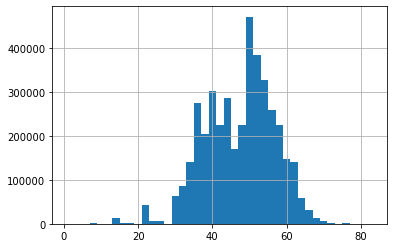

In [63]:
df_sqlite_full.grade_id.hist(bins = 41)

In [71]:
df_sqlite_full.grade_id.nunique()

41

In [66]:
conn = connect(param_dic)
column_names = ['id', 'user_id', 'grade_id', 'notes', 'raw_notes', 'method_id',
       'climb_type', 'total_score', 'date', 'year', 'last_year', 'rec_date',
       'project_ascent_date', 'name', 'crag_id', 'crag', 'sector_id', 'sector',
       'country', 'comment', 'rating', 'description', 'yellow_id', 'climb_try',
       'repeat', 'exclude_from_ranking', 'user_recommended', 'chipped', 'shoe', 'video', 'screename']
# Execute the "SELECT *" query
df_sqlite_full2 = postgresql_to_dataframe(conn, "select * from ascents", column_names)

Connecting to the PostgreSQL database...
Connection successful


In [67]:
df_sqlite_full2.head()

,id,user_id,grade_id,notes,raw_notes,method_id,climb_type,total_score,date,year,...,description,yellow_id,climb_try,repeat,exclude_from_ranking,user_recommended,chipped,shoe,video,screename
0,420663,11629.0,29.0,Second Go,2.0,1.0,1.0,0.0,1.139267e+09,2006.0,...,,0.0,False,False,False,False,False,None,None,None
1,420664,11629.0,31.0,,0.0,1.0,1.0,0.0,1.139267e+09,2006.0,...,,255.0,False,False,False,False,False,None,None,None
2,420665,11629.0,29.0,Second Go,2.0,1.0,1.0,0.0,1.139267e+09,2006.0,...,,0.0,False,False,False,False,False,None,None,None
3,420666,11275.0,44.0,,0.0,1.0,1.0,600.0,1.136070e+09,2006.0,...,,0.0,False,False,False,False,False,None,None,None
4,420667,11275.0,40.0,,0.0,1.0,1.0,500.0,1.136070e+09,2006.0,...,,255.0,False,False,False,False,False,None,None,None


In [68]:
df_sqlite_full2.grade_id.value_counts()

49.0    539302
51.0    390615
44.0    333910
53.0    330989
40.0    303937
36.0    275817
55.0    261207
46.0    249403
42.0    228115
57.0    226202
38.0    205878
59.0    149484
62.0    141945
33.0    140634
31.0     86815
29.0     63816
64.0     59025
21.0     42257
66.0     30879
68.0     12773
13.0     12134
25.0      7443
70.0      6058
23.0      5377
72.0      2055
17.0      1803
15.0      1603
7.0       1462
75.0       725
77.0       130
79.0        27
1.0         23
71.0        16
73.0         9
81.0         7
83.0         5
5.0          4
60.0         1
10.0         1
9.0          1
Name: grade_id, dtype: int64

In [72]:
df_sqlite_full2.grade_id.nunique()

40

In [77]:
for item, frame in df_sqlite_full2['name'].iteritems():
    if frame in names:
        print(f'{frame}:{item}:')
        df_sqlite_full2.at[item, 'grade_id'] =47

Mutual of Omaha:44:
Babo does Thailand:47:
Stalagasaurus:53:
The Lion King:55:
Kuahtittnseppl:58:
Red dwarf:61:
Good Medicine:65:
Roots Rock Reggae:69:
Babes in Thailand:71:
Viking in Heat:72:
Hin Rong Hai (Crying Rock):73:
Narsilion:75:
Ananda:104:
El Daü:110:
Sweating Mekong:148:
Pigsa:173:
Beefcake:227:
Rysa Kurtyki:243:
Lewy meningitis:251:
Samba:272:
Sostre d'en burot:287:
Mantra:344:
Echoes:347:
Freedom safari:364:
Hot flyer:369:
Swalk:374:
The Lardy Lady's Lats:376:
These People are Sandwiches:377:
Twisted:379:
Electricorp Production:389:
Stranglehold:395:
Roots Rock Reggae:396:
Viking in Heat:398:
Hin Rong Hai (Crying Rock):400:
Stalagasaurus:401:
Babes in Thailand:402:
Narsilion:412:
Top Tour:438:
Lass die Sonne rein:521:
Piccolina:523:
Zonenrandgebiet:524:
Slider:630:
Un point c'est tout:696:
Condomínio fechado:711:
Mefisto:725:
Albanski konjak:726:
Zafiro:761:
La Mystique Voyeur:791:
Off the lip:871:
Chão de Giz:913:
Warm Up:1000:
Sweating Mekong:1046:
Babes in Thailand:1053

Areterection:12281:
Buddha Hole:12282:
Malditos roedores:12325:
El Kakilo:12344:
Life is Sweet:12383:
Salida de Emergencia:12385:
Generacion spontanea:12392:
El orejazo:12395:
Taurus:12420:
Sturzflug:12470:
Insominio de equipmiento:12508:
Halloween:12565:
Zagreb:12569:
Tocame-La Sam:12578:
Sandra:12579:
Fleur de Mer:12598:
Viking in Heat:12697:
Hin Rong Hai (Crying Rock):12698:
The Beauty & The Beast:12701:
Stalagasaurus:12702:
Babes in Thailand:12703:
The Lion King:12707:
Kuahtittnseppl:12711:
Via da Inês:12713:
The Beauty & The Beast:12718:
Mutual of Omaha:12719:
Cherche mon souffle désespérément:12750:
Injured Reserve:12766:
Shazam:12767:
Herbivore:12768:
Sweet Pain:12770:
Yaak Crack:12775:
Maximum Overdrive:12788:
Stella:12826:
Cold Cuts:12867:
Deathblow:12879:
Pet Cemetary:12887:
Curvaceous:12896:
Los loros:12943:
La tenada:12945:
Ven abente:12946:
Dionysos:12965:
Onicomicosis:12973:
Jack the Smuggler:12978:
Sweet Pain:13064:
Bis a bis:13077:
Io, Manifesto:13114:
Noisy Neighbour:1

Purolitic:21651:
Nunca me llama mi novia:21659:
Sally's Alley:21706:
A qui ejacula, deu ajuda:21724:
Haber pedido muerte:21728:
Garbatx despistax:21736:
Halloween:21860:
Foo Foo the Cordless Draw Monkey:21867:
Nev Herrod:21875:
Foo Foo the Cordless Draw Monkey:21878:
Hairy Horrace:21891:
Gat reggae:21932:
Rysa Freneya:21961:
The man with the Hueco in his tights:22002:
Peanut Man:22003:
Wirbelsäule:22017:
Placebo:22032:
Eclipse:22062:
Cherche mon souffle désespérément:22066:
Karinca:22091:
Agustos Bocegi:22092:
Algo muy sucio:22098:
Cenar, Beber, Emborracharse, Vomitar, Dolor de Cab:22102:
Upzocker:22214:
Overland:22229:
Condom Stress:22247:
Moje fałdy tłuszczu:22261:
Myśliwi z Jurgowa:22264:
Swinia ktora zna karate:22301:
Bis a bis:22309:
Jerry's Kids:22311:
Nunca me llama mi novia:22323:
Vitale I:22385:
Io, Manifesto:22390:
Hot flyer:22576:
These People are Sandwiches:22577:
Weak as I Am:22582:
These People are Sandwiches:22583:
Bobo dodo:22593:
Rodeo:22634:
9a:22635:
Kosmiske Bandito

Pedopulsion:32499:
Okemaka:32502:
Ética decomposta:32542:
Pangea:32552:
Lavskägge:32555:
The Vanishing:32570:
Eddy of Bovidence:32578:
Alpha & Omega:32584:
Den siste speider:32606:
Taz:32631:
Feta:32642:
Calipso:32650:
Halloween:32703:
Prostowanie Pilchowki:32714:
Pinio:32715:
Sniadanie Mistrzów:32719:
Wyprawa po mjut:32725:
Katmandhu:32726:
Klęska szybkiego Heinza:32728:
Propozycja Marcisza:32736:
Czerwona Orkiestra:32756:
Småkryp:32775:
Kto Mi Dał Skrzydła:32804:
Postrzyżyny Isztwana:32806:
Roboty Drogowe:32807:
Twinings:32854:
Porahakaihottuma:32964:
Cortatus:32965:
Ottopromille:33007:
Aladin:33008:
Le chmatex:33010:
The climber 2:33017:
Cordaciu lu Sanda:33018:
Cargol treu banya:33067:
Neue Heimat:33082:
Kampfei:33105:
Aquaduck Pocket:33121:
Relaxed Atmosphere:33122:
Third World Lover:33123:
El orejazo:33153:
Green Horn:33198:
Les Frontieres du neant:33306:
Concentré de temps:33338:
Igel:33339:
Hokus pokus:33341:
Colo en coulisse:33350:
Sweet Pain:33360:
Prestation Aérienne:33509:


Plåt-Nicklas:41984:
Kraftwerk B:42020:
Entropia:42022:
Nunca me llama mi novia:42033:
Burden Chuchen:42060:
Barruts:42068:
Pioner jubilat:42069:
Montselandia:42070:
Fausses fractures:42131:
Saftkante:42145:
Excelsior:42161:
Les Malheurs de Sophie:42165:
Juno:42172:
Another Doug Reed Route:42250:
Whip-Stocking:42251:
Peterchens Mondfahrt:42325:
Vegi-Trip:42355:
Bis a bis:42363:
Bebe gitano:42364:
Frenkova:42380:
Panxacontent:42387:
Magic Light:42437:
Puntacaballo:42472:
De aqui pal limbo:42477:
Edge-a-Sketch:42491:
Kurzes Rennen:42556:
Welcome to the machine:42584:
Chips are for kids:42617:
Elanor:42647:
Venstre:42657:
Bis a bis:42668:
Trela:42731:
Kerveros:42740:
Acracia:42763:
Utopia:42771:
Groundwork:42847:
Great Train Robbery:42957:
Tjille ving:42962:
L'ombra de la barca:42973:
Vidal:42974:
Pet Cemetary:43018:
Yaak Crack:43065:
Chain of Fools:43067:
Weaveworld:43073:
These People are Sandwiches:43081:
The Lardy Lady's Lats:43082:
Hot flyer:43083:
Weak as I Am:43087:
Rabies:43114:
Al

Plåt-Nicklas:50702:
I'm on dope:50721:
Din jævel:50726:
Blasphemy:50739:
Apartheid Muscular:50774:
Sonho de Ícaro:50786:
Tongulation:50796:
Kamena doba:50845:
Rechts vor links:50856:
Fanatic:50880:
Ambroży:50888:
Dzikie Węże:50913:
Granitbiten:50923:
A-Hörnchen:50934:
El Ciod:50935:
Maitre Lardon:50954:
Amb un ou a cada ma:50957:
El Ninjo:50963:
Liebling der Schwerkraft:50967:
Albin:50981:
Sonntagsspaziergang:50992:
2n viatge a Venus:50998:
Westwand:51004:
Schnitzel on Seitz:51005:
Terminal Insomnia:51040:
Giftzwerg:51069:
Zulu Gula:51094:
La sans nom:51121:
Top Tour:51148:
Schnitzel on Seitz:51158:
Bodum:51159:
Complicité:51171:
Neue Heimat:51194:
Globus:51237:
Kataplax:51255:
Schweine im Weltall:51266:
Panische Zeiten Direktausstieg:51296:
Reif für die Insel:51305:
Schlaffer Affe:51310:
Giftzwerg:51315:
Hässliches Entlein:51328:
Equatorial:51362:
Orange Chandeliers:51368:
Sedativa:51406:
O dia que a terra parou:51407:
Stalagasaurus:51411:
Nut cracker:51419:
Mai Pen Rai:51430:
Medusa'

Fegefeuer:59797:
Karmeljuk:59803:
Småkryp:59815:
Pasaba por aqui:59819:
Grifon direkt:59839:
Under the Boardwalk:59846:
A-Hörnchen:59885:
Schweine im Weltall:59886:
Icones:59921:
Men vi er jo menn:59933:
Kjeks:59934:
Pasties and a g-string:59976:
Top Tour:59991:
Samba:60002:
Icones:60003:
A-Hörnchen:60019:
Invading Celts:60023:
Locals only:60026:
Lurad:60030:
Tribal War:60057:
Glasperlenspiel:60064:
Himmelsleiter:60089:
Expressway:60121:
Macabrona:60200:
Aladin:60206:
Settima luna:60207:
Neue Heimat:60217:
Prinzomania:60248:
Når knoklene blir til gelé:60285:
The Hoosier:60361:
Ultrakumba:60396:
Bajando pal sur:60397:
El Centurion:60399:
Hekseskudd:60458:
La Savoyarde:60548:
Luftslottet direkt:60566:
Rævadilteren:60602:
Szybki Lopez:60611:
Kalinka:60683:
Mad Max:60684:
Macro:60685:
Tylko Dla Orłów:60718:
Zorro:60727:
Dixon Butz:60780:
Rebel Without a Pause:60800:
Zorro:60829:
Mecca:60848:
Solid Rock:60852:
Isolation:60854:
Machoman:60863:
Acracia:60865:
Seppis letzte Nummer:60900:
Berüh

Klechdy Sezonowe:69516:
Zagreb:69626:
Bolero:69648:
Gat reggae:69654:
Opa Falkenstein:69687:
Sioux:69693:
Im 27. Jahr des Zwerges:69705:
Katze Sudan:69708:
Disturbance:69787:
Psycho-Wussy:69844:
No me pises que llevo chanclas:69847:
Lola:69864:
Cold Cuts:69892:
Going the Distance:69918:
Footloose:69961:
Ética decomposta:69973:
Półtorak Straszliwy:70109:
Spasiba + Iva:70144:
Lola:70145:
80 feet of meat:70165:
Sveip:70166:
Zagreb:70177:
Opa Falkenstein:70183:
Blutspur:70184:
Papa hat's gebohrt:70185:
Frodo:70186:
Blixten:70223:
Toxic Potatoes:70256:
Junta culata:70276:
Brigadistak:70278:
Brigadistak:70279:
Invading Celts:70287:
Isolation:70293:
Solid Rock:70294:
Rote Flüh:70295:
Westwand:70380:
Schnitzel on Seitz:70381:
Fueled on coffee, powered by bacon:70426:
hallon:70428:
Granitbiten:70440:
Solid Rock:70476:
Heldbräu:70481:
Colo en coulisse:70509:
Peitsche:70510:
Nid schlagn:70561:
Nid schlagn:70562:
Discombobulated:70650:
I like Gorba:70659:
Le cinquième élément:70684:
Cosmopolite:70

Baker for smed:87180:
Ignition:87181:
Twisted:87195:
Bløff:87236:
Pjokken:87241:
Bløff:87251:
Propozycja Marcisza:87267:
Bottom Feeder:87274:
Cucuruto:87342:
Discombobulated:87349:
Legacy:87350:
calienta motores:87408:
Tylko Dla Orłów:87418:
Småkryp:87505:
Stoned Immaculate:87545:
Baggen:87588:
Kapten Haddock:87589:
T.C.F.:87592:
Meathooks:87621:
Rascanalgas:87624:
Przyczajony kucyk, ukryty smok:87681:
Funkydelic:87696:
Frankenstein:87697:
Jubilejnyj:87724:
Sojuz:87728:
Asteroid:87729:
Mashin poceluj:87743:
Udazken lizuna:87796:
Haizea:87799:
Underarms UFO:87800:
Humlepung:87812:
Henders gnissel:87820:
Bottom Feeder:87830:
L'ombra de la barca:87848:
Sister of Pain:87852:
Cornflakes:87886:
Across the Universe:87901:
Frankenstein:87926:
Hannibal:87927:
Konsum:87939:
Vagina:87947:
Lola:87959:
Fulingen:88020:
Porksoda:88021:
Wiktory:88024:
Fulingen:88028:
Porksoda:88031:
Under the Boardwalk:88035:
Basement:88036:
Pornopung:88039:
Touch of Gray:88046:
Across the Universe:88047:
arete:88170:

The Crusher:96026:
Voganj:96059:
Pandora:96109:
Pedopulsion:96128:
Calipso:96136:
Pachamama:96183:
Le Var:96204:
wild seed:96213:
Casper:96237:
King Me:96249:
Flying Circus:96309:
Cornflakes:96311:
Glasperlenspiel:96321:
Pressklinke:96322:
Lewy meningitis:96358:
Kakofonia:96417:
Pangea:96465:
Ananda:96479:
Zizou:96483:
Via le man dal cul:96499:
Halloween:96500:
Hollenganda:96501:
Yaak Crack:96520:
Caustic:96521:
Across the Universe:96522:
Mauro:96567:
Tiramisu:96570:
Pod Zjazdem:96573:
Peanut Man:96583:
Recoil:96592:
Inhibitor:96593:
Seek The Truth:96594:
Ejakulation:96661:
Weißer Streifen:96676:
Le souffleur:96681:
Englestøv:96687:
Tiramisu:96689:
Flower Power:96691:
Wirito santo:96709:
Halloween:96736:
Nevermore:96739:
Discombobulated:96818:
Legacy:96819:
Samba:96852:
Willy:96967:
Aesthetica:97001:
Blackened:97068:
Brothers In Arms:97080:
International Bolt Conspiracy:97081:
Very Little Green Man:97084:
Für Charles Mingus:97085:
Niedziela Palmowa:97123:
Spasiba + Iva:97129:
Pulling O

Snow Blind:104882:
Squeakeasy:104884:
Footloose:104887:
C'mon Knucko:104893:
Oktoberfest:104912:
Ignition:104921:
Red dwarf:104927:
Oktoberfest:104947:
Um Bocadinho da Praia:105008:
Totenhansel:105011:
Remember Wadi Rum:105012:
Thimari:105027:
Axium:105028:
Dionysos:105038:
Dike:105039:
Cigarillo:105042:
Commandante Marcos:105043:
Rampenlicht:105045:
Igel:105048:
menjunje:105162:
Pocket Line to the Moon:105204:
Worshipping the Limestone Gods:105205:
Sun Dried tomatoes:105238:
Kastor:105270:
Le cinquième élément:105346:
Albanski konjak:105397:
Trela:105399:
Ektor:105400:
Satyros:105407:
Resista:105408:
Oetida:105409:
Pakalolo:105412:
Opium fürs Volk:105421:
Schweine im Weltall:105445:
Pakalolo:105451:
Synchronicity:105476:
Greed:105501:
O dia que a terra parou:105509:
Capture the Flag:105531:
Bis a bis:105554:
La fiesta de los biceps:105559:
Choroba Sercowa:105568:
rombo di vento:105585:
Calipso:105590:
Kerveros:105592:
Kuahtittnseppl:105594:
Loisl:105595:
Nasty:105622:
Rodeo:105628:
Pi

Flower Power:114153:
Corporal Punishment:114167:
Rock das Aranhas:114233:
Bottom Feeder:114281:
El chahuistle:114336:
El Hombre del Costal:114337:
Pipetaputo:114339:
Coño Paco:114431:
Cosiroc:114451:
Le chmatex:114509:
Abecedaire:114514:
Nasewasser:114548:
Bottom Feeder:114549:
Tony the Tiger:114554:
Kastor:114611:
O dia que a terra parou:114615:
Aesthetica:114617:
Intxaursaltsa:114628:
Ingravitus:114641:
Jugant amb foc:114675:
Spiderman:114692:
Albanski konjak:114709:
Burden Chuchen:114737:
Nunca me llama mi novia:114738:
Gos roig, gos boig:114747:
Zaizuri:114755:
Pandora:114791:
Sweet Pain:114806:
Hamburguer:114807:
Smilin Jack:114815:
Buckwheat:114832:
Kamena doba:114899:
Lambada:114938:
Stradivarius:115008:
Receiver:115016:
Mad Max:115021:
Macro:115022:
Okemaka:115031:
Resegausch:115068:
Simon ha perdido el panadero:115100:
Slave to the Grind:115137:
Adoption:115138:
Aladin:115168:
Mr Daddy Long Legs:115199:
Curta e Grossa:115221:
Demolition party:115234:
Zhenskij duh:115256:
Golia

Wirito santo:125460:
El Luchador:125461:
Como marca la ley:125463:
Asterix:125468:
Bobo dodo:125497:
Presença de Bruce:125510:
Balões:125526:
Mare Nostrum:125528:
Halloween:125543:
Fuzzy Undercling:125562:
Insominio de equipmiento:125565:
Yaak Crack:125650:
Galló de la Susana Alba:125692:
Eclipse:125738:
Eclipse:125744:
Perpetua inocencia:125768:
Mad Max:125843:
Vabeca globina:125931:
Enigma:125933:
Split wave:125934:
Slider:125945:
Gridlock:125973:
pitulicha:126035:
Kalya:126057:
Ética decomposta:126081:
Lamúrias de um viciado:126086:
O dia que a terra parou:126087:
Dilúvio de Sancho Pena:126088:
Rei do torresmo:126089:
Antes que anoiteça:126090:
Salsa punk:126092:
L'espantaocells:126096:
Kraftwerk B:126186:
Crash and Burn:126195:
Lola:126216:
Kon Ba:126275:
Red dwarf:126280:
Resista:126332:
Globus:126333:
Thimari:126335:
Thimari:126336:
Kastor:126345:
Mofeta:126349:
Stachelschwein:126354:
Satyros:126360:
Lestrygon:126376:
Calipso:126378:
Dionysos:126382:
Kerveros:126391:
Chnosi Famil

Rockafeller:135690:
Lifestyles of the Ripped and Heinous:135691:
Rockafeller:135717:
Astroman:135728:
Babes in Thailand:135737:
Kratoy (Lady Boy):135740:
Cudaczek:135774:
Rodeo:135775:
Rysa Freneya:135779:
Lewy meningitis:135782:
Prawy Meningitis:135783:
Przyczajony kucyk, ukryty smok:135784:
Studnia dusz:135789:
WC Picker:135790:
Naciagania Chinskie:135803:
Studnia dusz:135808:
Slider:135829:
Bis a bis:135846:
Pasaba por aqui:135847:
Cro cop:135913:
Frodo:135923:
Wristlets:135971:
The Acquittal:135972:
Standing Room Only:135974:
Alquezar.com:135980:
Dike:136087:
Innominado:136141:
Cannonball:136146:
Ananda:136254:
Send a Gorilla:136255:
Standing Room Only:136297:
Eclipse:136298:
Caf Caf:136344:
Bagdad café:136348:
Retsa:136352:
Sheik Tu Dinero:136356:
Lola:136367:
Simon ha perdido el panadero:136377:
Golum:136425:
Bagdad café:136441:
Westwand:136466:
Stonehead:136480:
Life is Sweet:136484:
In Ordan:136485:
Goupil:136499:
Colo en coulisse:136500:
Le chmatex:136597:
Le chmatex:136619:
B

Hin Rong Hai (Crying Rock):144586:
Red dwarf:144587:
The Lion King:144588:
Le manège enchanté:144699:
Hairy Horrace:144701:
Ruddy Norry:144702:
Tritan:144709:
Red Sky:144717:
Purolitic:144752:
Cargol treu banya:144783:
L'espantaocells:144868:
Sinn des Lebens:144935:
Welcome to the machine:144937:
Beuzz:144940:
Spiderman:144963:
Curta e Grossa:144972:
Malaria:145001:
Block Party:145009:
Stranglehold:145015:
Purgandus populus:145104:
Sheik Tu Dinero:145112:
Coño Paco:145113:
Vagina:145122:
Calipso:145140:
Bicho Bola:145142:
Aintza:145161:
Fernandillo culolillo:145169:
Generacion spontanea:145171:
Salida de Emergencia:145175:
Cornucopión:145184:
Omero:145216:
Innocent Bystander:145233:
Across the Universe:145236:
Great Train Robbery:145263:
Equivocado:145264:
El Paradise:145273:
2n viatge a Venus:145295:
El escorpión:145318:
Mofeta:145333:
Nabuchodonosor:145335:
Asklipios:145338:
Omero:145339:
Iceberg:145347:
Hot Dog:145384:
Io, Manifesto:145392:
Malditos roedores:145543:
Jubilejnyj:14563

Kastor:153064:
Mofeta:153065:
Remember Wadi Rum:153068:
Thimari:153070:
Totenhansel:153071:
Trela:153072:
Maskarada:153129:
Els iluminati:153173:
Sschuupamela:153178:
Fragile:153213:
Demolition party:153229:
Maskarada:153300:
Meriju:153337:
Gatzara:153364:
Lola:153366:
Futuras promesas:153367:
Gunslinger:153368:
Lifestyles of the Ripped and Heinous:153369:
There Goes the Neighborhood:153370:
Fuzzy Undercling:153371:
Felipe el Hermoso:153397:
Tanguitis:153403:
El día de la bestia:153408:
Squeakeasy:153436:
Cecilia:153439:
The Tyrants Grasp:153445:
Spurting Mildly:153447:
Mad Max:153548:
Ananda:153580:
Underground:153608:
Ultima Albertencia:153615:
Lord of the Thais:153656:
Equatorial:153657:
Corporal Punishment:153666:
Malditos roedores:153670:
Bicho Bola:153686:
El perro del cortijo:153704:
Botafumeiro:153705:
Supertrunch:153722:
Sem compromisso:153746:
Samson:153776:
Pedopulsion:153777:
Galimatias:153779:
Lenin:153791:
La cagarada:153816:
Supercalcarea:153825:
Diedro torpedol:153830:


Miss Tintinguette:163635:
T.C.F.:163636:
Instinto:163650:
Tipo Sueca:163651:
Salida de Emergencia:163653:
Coño Paco:163657:
Sheik Tu Dinero:163659:
Wasabi:163693:
Stalagasaurus:163697:
Hin Rong Hai (Crying Rock):163701:
Viking in Heat:163702:
The Beauty & The Beast:163703:
Babes in Thailand:163704:
Mutual of Omaha:163720:
Concrete jungle:163722:
Freedom safari:163726:
Ejakulation:163729:
Jimmy and the Big Boys:163748:
En verden av frigide kvinner:163811:
Mr. Bean:163812:
Sem compromisso:163873:
Doctor Jack:163879:
Astroman:163885:
Gridlock:163952:
Babes in Thailand:163976:
Nut cracker:164140:
Wasabi:164148:
Utopia:164156:
Meteora:164167:
Red Zinger:164221:
Red Zinger:164225:
Sleeping Beauty:164251:
Sweet Pain:164255:
Slave to the Grind:164257:
Sister of Pain:164258:
Free Willie:164277:
Lounge Lizard:164305:
Heresy:164313:
Clyde the Mega Dude:164315:
Gunslinger:164317:
T.C.F.:164336:
Spurting Mildly:164377:
Toker:164413:
Mataillos Lugarenos:164432:
Felipe el Hermoso:164443:
La tenada:16

Pocket Line to the Moon:174420:
Slave to the Grind:174429:
Sister of Pain:174433:
Twisted:174483:
Fruta kombi buba:174554:
Gos roig, gos boig:174564:
Frankenstein:174636:
Paranoid:174738:
Settima luna:174802:
A la vieja usanza:174809:
Zahorí Chuminero:174812:
Meaty Mesmo:174874:
Murdoch the HorseF:174875:
Salsa punk:174897:
Women ain't nothing but trouble:174902:
Rude Bushman:174903:
Miss Mckinley:174904:
Sem compromisso:174908:
Rei do torresmo:174909:
Ottopromille:174951:
Zappata:174954:
Rodeo:175000:
Cube:175013:
Feta:175037:
Kastrationsångest:175038:
France-Écosse 0/0:175048:
Le cinquième élément:175053:
Honky Tonche:175055:
Oktoberfest:175109:
Derre Henne:175155:
Alquezar.com:175168:
Diedre:175186:
C'est lisse hélas c'est là qu'est l'os:175195:
Bella:175225:
Los loros:175230:
Spasiba + Iva:175251:
Grigino:175277:
Mon Ami Bart:175310:
Les copains d'abord:175311:
Fanatic:175325:
Saigon:175354:
Vielseitigkeitsprüfung:175417:
Pelikano:175427:
Ministro Pistarini:175503:
Wszystko Albo Ni

Studentenweg:183763:
Joint Venture:183801:
Rule Number One:183803:
Alptraum:183820:
Juli-Buli:183826:
Cargol treu banya:183836:
Eddy of Bovidence:183887:
Futuras promesas:183891:
Felipe el Hermoso:183892:
The Church of Frederico:183894:
Cargol treu banya:183902:
Pelikano:183919:
Wake Up:184033:
Konsum:184083:
Ketama:184104:
Ein Sommer wie er früher einmal war:184110:
Bärenfalle:184114:
Sedativa:184144:
Tapa na Aranha:184145:
Démarrages à froid:184193:
Ego nein Danke:184194:
Confetti:184244:
Yaak Crack:184256:
Haizea:184260:
Resista:184281:
Halloween:184343:
Lola:184377:
Blackened:184425:
Psycho-Wussy:184426:
Block Party:184435:
Frenkova:184456:
Stradivarius:184459:
Lalaland:184461:
From Chocolate to Morphine:184462:
Big Top:184473:
Golum:184474:
Rude Bushman:184503:
Pescaito frito:184510:
Saquenme de aquí:184513:
Zagreb:184570:
Sabina:184604:
Albanski konjak:184655:
Frenkova:184667:
Toker:184675:
Tsolovi nevoli:184760:
Futuras promesas:184807:
Ven abente:184808:
Satisfaction Guaranteed

Schattenspiel:191481:
John Lennon:191503:
Bär in the Air:191505:
Second Chance:191520:
Any Chance:191521:
El Kakilo:191523:
Prostowanie Pilchowki:191553:
Tazio:191576:
Sveip:191650:
Mantra:191663:
Cube:191682:
Via le man dal cul:191689:
Rodeo:191709:
Alltag in Franken:191712:
Albanski konjak:191728:
Auszuckte Gfraster:191730:
NASA:191745:
Hairy Horrace:191768:
Split wave:191773:
Telefon:191796:
Fueled on coffee, powered by bacon:191824:
Yellow Submarine:191830:
Nangijala:191842:
Plåt-Nicklas:191844:
Honky Tonche:191866:
Yellow Submarine:191899:
Gat reggae:191918:
Mantra:191924:
Algo muy sucio:191945:
Jugant amb foc:191949:
Putuliken:191957:
Mevza:191984:
Elefantiasis:192010:
Sigge Fröjd:192013:
Sapara:192029:
Picando bajo la lluvia:192034:
Diedret:192055:
Homer Simpson:192070:
Telefon:192071:
Kältetherapie:192095:
Footloose:192110:
Yellow Submarine:192131:
Glupava zhena:192132:
Flyglottan:192148:
El cazador de dragones:192174:
Utopia:192196:
Ronaldo:192210:
Blutspur:192211:
Gundis Wuns

Flug nach Delhi:200538:
Hatari:200542:
Kauabouga:200543:
Tapa na Aranha:200545:
Sedativa:200550:
Sedativa:200553:
Pangea:200564:
A streaker named desire:200589:
wild seed:200618:
Random Precision:200658:
Different Strokes:200659:
Lass die Sonne rein:200682:
Bis a bis:200690:
Bambus:200712:
Kalcytówka:200726:
Mitomaniak:200747:
Westwand:200796:
Wilde 13 linker Ausstieg:200820:
Hallux Valgus:200824:
Silversurfaren:200835:
El Gato con Botas:200947:
Apágalas, apágalas:200949:
Lupus Vulgaris:200988:
Fausses fractures:201008:
Venstre:201015:
Kauabouga:201023:
Hatari Direkteinstieg:201025:
Maldição dos moranguinhos:201032:
Domínio do homem:201056:
Drakar:201071:
Tiggers and Airplanes:201094:
Westwand:201102:
Azania:201110:
Dampfwalze:201114:
Sinn des Lebens:201116:
Men vi er jo menn:201135:
Lupus Vulgaris:201136:
Sweet Pain:201164:
Krótki impuls siły:201172:
Tigerögat:201221:
Bella:201228:
Kleines Arschloch:201230:
effetto purgatorio:201311:
Adjø solidaritet:201420:
Lügenbaron:201423:
Enigma:

Al tran tran:208976:
Rug Munchers:208985:
Lord of the Thais:209012:
Povodni moz:209081:
La resaca del machaca:209234:
Bicoin:209235:
Picando bajo la lluvia:209236:
Brigadistak:209253:
Lo dejé to blanco:209257:
Halva IP's:209266:
Sonhos e mitos:209271:
T.C.F.:209283:
Horizontaler Kraftakt:209315:
Come on, everybody!:209361:
Morana:209404:
Besasc:209437:
Maldoror:209451:
Les Frontieres du neant:209464:
T.C.F.:209465:
Vuela vuela pajarito:209528:
Mondfinsternis:209547:
Maitre Lardon:209562:
El fuego de la muerte:209563:
Great White Buffalo:209606:
Tessy:209632:
Heresy:209647:
Lounge Lizard:209648:
Simon ha perdido el panadero:209676:
Salsa punk:209723:
Sweet Pain:209729:
Zorro:209732:
Battle of the Bulge:209734:
Mad Max:209745:
Absinthe:209777:
Wilde 13 linker Ausstieg:209780:
Picando bajo la lluvia:209823:
These People are Sandwiches:209828:
Buf!:209831:
Klimbim:209911:
Lille skutt:209980:
Pinslibeisen:210033:
Venstre:210034:
Utopia:210045:
Lille petter edderkopp:210098:
La fiesta de los

Humlepung:218119:
Dzikie Węże:218142:
Kaninartikler:218198:
The man with the Hueco in his tights:218227:
Arm and Hammer:218229:
Abominable Snowman:218232:
Peanut Man:218259:
Elanor:218268:
Hekseskudd:218320:
Funkydelic:218402:
Dziurka prezesa:218403:
I'm on dope:218409:
Ursus:218450:
Den siste speider:218476:
Hekseskudd:218477:
Schlenkerle:218506:
Litmus Test:218526:
Pikuś:218549:
Ingravitus:218568:
Fanatic:218569:
Fontanny króla Salomona:218601:
Ignition:218617:
Ludojadek:218623:
Deklaracja:218626:
Frankenstein:218632:
Harrytasser:218647:
Rabies:218651:
Morana:218665:
Critters on the cliff:218720:
Up Yonder:218722:
Pasties and a g-string:218724:
Rather like a fairyland, except for...:218752:
Caldoquie:218762:
Miss Tintinguette:218763:
Alko Budalko:218764:
Scorpions:218780:
La Ley del Cateto:218798:
Life is Sweet:218815:
Life is Sweet:218818:
Al andalus:218825:
Fiebre del sur:218838:
Bueno, bonito y barato:218839:
La Ley del Cateto:218840:
Jumping for jugs:218894:
Babo does Thailand:21

Imia:227461:
Kerveros:227467:
Mon Βatchounousougounoudoudou:227468:
Nabuchodonosor:227469:
Trela:227472:
Nieznośna lepkość odbytu:227475:
Miła Kobyła:227476:
Dantes inferno:227486:
Dreimäderlhaus:227490:
Asklipios:227491:
Oetida:227494:
Commandante Marcos:227502:
Resista:227510:
Globus:227511:
Chnosi Family:227519:
Cyclops:227520:
Uncle Bert:227524:
Willy:227537:
Mon Ami Bart:227541:
Lügenbaron:227603:
Ochocé:227625:
Arte de liar:227626:
Lola:227663:
Hercules:227704:
Krasnojarskie katushki:227753:
Kenosis:227760:
Rückenwind:227789:
Yellow Submarine:227846:
Tulipe:227848:
Pelikano:227858:
Tulipe:227866:
Plus jamais peut-être:227871:
El fuego de la muerte:227877:
Lola:227880:
La tenada:227886:
L'alternativa:227915:
Baggi ned:227922:
Frodo:227927:
Im 27. Jahr des Zwerges:227934:
Cro cop:227936:
Sweating Mekong:227941:
Good Medicine:227942:
Radio 5 todo mentiras:227952:
Leni Rübensal Ged.-Weg:227962:
Master Blaster:227990:
Totenhansel:228177:
Remember Wadi Rum:228178:
Glupava zhena:228203:

Sioux:234706:
Buha:234749:
Barking Spiders:234848:
dominator:234854:
Excelsior:234856:
Underground:234860:
Jackabite:234904:
Great White Buffalo:234905:
Froskefest:234926:
Skrikende madonna:234927:
Philanthropy:234928:
Pleasure Line:234934:
Schieber:234935:
Westwand:234949:
Belegtes Brötchen:234951:
Schlaffer Affe:234952:
Aquaplaning:234976:
Opa Falkenstein:234992:
Lola:234993:
Marlen extralujo:235013:
Pajaro loco:235014:
Mescalina tropical:235016:
Lola:235041:
Bis a bis:235042:
Marlen extralujo:235059:
Acracia:235060:
Lounge Lizard:235068:
Expressway:235112:
Grindrite:235113:
Hungover:235116:
1492:235143:
Udazken lizuna:235204:
Lola:235216:
Ursus:235230:
Babes in Thailand:235235:
The Beauty & The Beast:235236:
Les Ailes du Vizir:235240:
Kauabouga:235285:
Kauabouga:235294:
Szalona depresja:235304:
La toska:235330:
NASA:235382:
Jubilejnyj:235403:
Asteroid:235424:
Mashin poceluj:235425:
Goliaf:235426:
Ego nein Danke:235451:
Mashin poceluj:235526:
Steve's Arete:235593:
Rodeo:235690:
Hjern

Førstereisgutten:243955:
Isolation:243974:
Solid Rock:243978:
Hatari:243979:
Studnia dusz:243990:
Blixt Gordon:244014:
Samba:244026:
Spider Dance:244068:
Kampfei:244073:
Hatari:244108:
Hatari Direkteinstieg:244109:
Kauabouga:244119:
Tante Petunia:244121:
Gumdzia:244148:
Invading Celts:244160:
Ananda:244174:
Ejakulation:244223:
Hatari Direkteinstieg:244224:
Kauabouga:244225:
Oral Office:244226:
Kampfei:244229:
Willy:244267:
Heinz:244268:
Ananda:244289:
Bonnye and Clyde:244300:
Lamúrias de um viciado:244320:
Opa Falkenstein:244358:
Zastrzyk:244363:
Google Earth:244395:
Rodeo:244396:
Cryocooler:244420:
Glasperlenspiel:244430:
Dezentraler Energiepfad:244454:
Sioux:244456:
Für Charles Mingus:244457:
B3:244477:
Unbehagen:244479:
La Mujer Peluda:244507:
Rei do torresmo:244516:
Rei do torresmo:244518:
Groundwork:244530:
Helix:244554:
Pasties and a g-string:244605:
Psychodelic:244683:
Fusillo:244701:
Musefella:244710:
Asterix:244711:
Mission to Mars:244736:
Sputnik KW:244745:
La gatera:244753:


Violator:253178:
Basement:253236:
Klotho:253288:
Siddhartha:253355:
Bonaca:253361:
Stara vojna:253375:
Capcara:253380:
Bonnye and Clyde:253437:
Silmarils:253438:
Cannonball:253445:
Underground:253476:
Tröttkeps:253491:
Fruta kombi buba:253506:
Cherche mon souffle désespérément:253539:
Kto Mi Dał Skrzydła:253564:
Aladin:253573:
Ananda:253620:
Elefantiasis:253621:
Lurad:253623:
Neue List:253634:
Hydraulik:253640:
Aladin:253645:
Chnosi Family:253678:
Ciao Vecchio:253679:
Feta:253683:
Lestrygon:253689:
I love you:253702:
Olimpijska:253703:
Remember Wadi Rum:253714:
Uncle Bert:253716:
H/2:253739:
Bat na wroga:253741:
hallon:253772:
WC Picker:253819:
Klęska szybkiego Heinza:253820:
Rysa Babińskiego:253828:
Modrzewiowe Loty:253859:
Asterix:253878:
Schattenspiel:253879:
Tiramisu:253898:
Lara Croft:253902:
Nebulosa:253910:
Twisted:253927:
Jocasta:253974:
Lamúrias de um viciado:253975:
La maldición:253976:
Fumaça sagrada:253979:
Via de Blair:253980:
L'ombra de la barca:253981:
Bárbaros:254001:
U

Lillipfeiler:260718:
Maitanz:260720:
Robontop:260728:
Bilbo Baggins:260737:
Ulala:260743:
Geisterfänger:260753:
Devil Wall:260755:
Zaunkönig:260757:
Schöne Aussicht:260777:
Schöne Platte:260778:
Henkersmahlzeit:260790:
Pickel im Nacken:260792:
Calipso:260794:
Panische Zeiten Direktausstieg:260797:
Schlüsselbein:260798:
Maracuja:260828:
Warawara:260829:
rebelde con Causa:260876:
escorpiojos:260885:
Great Train Robbery:260901:
Ética decomposta:260904:
Spiderman:260930:
Mad Max:260934:
Extremadura (aka Nachos Banana Route):260971:
Ego nein Danke:261047:
Blixt Gordon:261071:
Cuca o crocodeal junky:261163:
Los loros:261169:
Lola:261195:
Esclava laboral:261196:
Spasiba + Iva:261217:
Mongui:261218:
Benita la bendita:261224:
Fils de Pan:261226:
Gul enke:261234:
Kosmiske Banditos:261235:
Bad Boys:261245:
Ananda:261271:
Land of broken dreams:261300:
Land of broken dreams:261345:
Mefisto:261346:
Milkeveien:261358:
Cosiroc:261392:
Cuina lleugera:261405:
La catximba:261420:
Lamúrias de um viciado:2

Korsfest:269234:
Tvåmetersmannen:269237:
Vilohemmet:269238:
Pump for damene:269248:
Stalltips:269280:
Pornopung:269281:
Akuna Matata:269282:
Hot flyer:269289:
Gammel Erik:269311:
Kaninartikler:269312:
The undertaker:269313:
Axium:269321:
Ioli:269323:
Thimari:269324:
Feta:269343:
Uncle Bert:269346:
Chnosi Family:269347:
Utopia:269356:
La fiesta de los biceps:269357:
Heresy:269370:
Aborigine:269373:
El Gato con Botas:269393:
Sally's Alley:269411:
Groundwork:269432:
Odjuret i ditt inre:269462:
Esne bidea:269475:
Ghandi:269486:
Bella:269512:
Peterchens Mondfahrt:269530:
Westwand:269542:
Gat reggae:269577:
Hyllevare:269609:
Piccolo:269636:
Kastor:269717:
Asterix:269846:
Green Horn:269891:
Up Yonder:269900:
Golum:269904:
Fragile:269908:
The Cutting Edge:269931:
Tradisjonelt overgrep:269932:
Cerebellum:269956:
Fuzzy Undercling:269986:
Kalinka:270072:
Si c'est PD, c'est pas dur:270104:
Clave Omega:270122:
Clave Omega:270123:
Ignition:270152:
Karius:270200:
Hairy Horrace:270202:
Flirting with a

Waage Nilsen:278059:
Okkenbom:278060:
Rambo uten make:278061:
Humlepung:278063:
Bigg:278064:
Smartass:278072:
Rævadilteren:278073:
Mr. Bean:278077:
En verden av frigide kvinner:278078:
Calipso:278132:
Io, Manifesto:278159:
Red Sky:278162:
Mauro:278192:
Poldo:278244:
Bullseye:278278:
Frodo:278296:
Alltag in Franken:278316:
Cold Cuts:278323:
80 feet of meat:278324:
Master Blaster:278332:
Rather like a fairyland, except for...:278360:
Aerial:278368:
Andrea:278442:
Esclava laboral:278453:
Como la prehistoria:278460:
Turtle Wax:278502:
Be Quick or be Dead:278524:
Pretenders:278525:
Cudaczek:278538:
Bis a bis:278549:
L'ombra de la barca:278551:
Ulala:278579:
Ursus:278580:
Kurzes Rennen:278586:
Gunslinger:278646:
Bottom Feeder:278668:
Pasaba por aqui:278707:
Los loros:278758:
Taz:278779:
Bye Bye Doc:278780:
The Saint of Auschwitz:278785:
Globus:278792:
Resista:278797:
80 feet of meat:278801:
Cold Cuts:278802:
Jail Bait:278803:
Med lengsel og smerte:278835:
Trela:278836:
Agent Orange:278838:
A

Ketteklau:285861:
Bis a bis:285969:
Hängebauchschwein:285989:
Nixalsverdruss:285991:
Sissi:285992:
Bussard:285994:
Heresy:286043:
Lounge Lizard:286044:
Dumkopf:286048:
Lynn's Route:286051:
The Hoosier:286052:
Overdose:286104:
Mutiny:286128:
Rodeo:286179:
Rebus:286182:
Another Doug Reed Route:286190:
Fuzzy Undercling:286193:
Whip-Stocking:286194:
Up Yonder:286197:
Buddha Hole:286200:
Bis a bis:286256:
Centerfire:286262:
Centerfire:286263:
Receiver:286264:
Clyde the Mega Dude:286276:
The Pocketeer:286277:
Lifestyles of the Ripped and Heinous:286278:
Tales of the Sperm:286279:
Alchemy:286282:
Tool:286285:
Gunslinger:286286:
Violator:286288:
Rocktoberfest:286290:
Bitless:286293:
Twisted:286294:
Metro:286319:
Jaslice:286324:
Bolero:286348:
La tenada:286371:
La fiesta de los biceps:286378:
Bis a bis:286384:
Intensivstation:286400:
Dzikość Serca:286452:
Babokar:286462:
Whip-Stocking:286478:
Il Matrimonio:286496:
Burden Chuchen:286518:
Affenschaukel:286546:
Cous-Cous:286566:
Ven abente:286570:

Bye Bye Doc:294133:
Bullwinkle Craters:294156:
Arm and Hammer:294157:
En verden av frigide kvinner:294168:
Mantecol:294211:
Djevica:294227:
Le Var:294246:
El Grifo:294250:
Fat Boy Slim:294252:
Unbehagen:294256:
Pusselbiten:294290:
Agent Orange:294314:
Diedro torpedol:294328:
maligno catarro:294329:
Cleopatra:294331:
Cleopatra:294333:
Cleopatra:294334:
Diana:294342:
Touch of Gray:294351:
Buster Brown:294352:
Wristlets:294356:
The Hoosier:294357:
Vagina:294380:
Fueled on coffee, powered by bacon:294396:
Bottom Feeder:294410:
Merry Christmas:294441:
Halloween:294451:
Baker for smed:294541:
Banshee:294650:
Bis a bis:294675:
Rodeo:294731:
Suprème dimension:294747:
Edge-a-Sketch:294775:
Ghandi:294798:
Cryocooler:294879:
Astroman:294935:
Freeway:294941:
Moonshine:294955:
Katalysator:294994:
Garbatx despistax:295069:
Esconderos Agujidos:295076:
Kriminal de muntanya:295078:
Cargol treu banya:295080:
Bottom Feeder:295091:
Purolitic:295095:
L'ombra de la barca:295111:
In extremis:295152:
Que pasa

Durlindana:303384:
H5N1:303399:
Il Matrimonio:303413:
Marvada Bunda:303431:
Chickenboy:303432:
Settima luna:303507:
Ulla lo strapiombo che ti trastulla:303508:
Ottopromille:303509:
Alpen liebe:303510:
Aladin:303513:
Lupo Alberto:303523:
Nevermore:303526:
Flipper:303561:
Zappata:303564:
La vendetta di Robinson:303571:
Ammonit:303614:
Garbatx despistax:303627:
Tocame-La Sam:303638:
Trenca'm els pinyos:303650:
Spiderman:303679:
Yellow Submarine:303703:
Il Matrimonio:303705:
Kastor:303869:
Ética decomposta:303875:
Taz:303883:
Pescaito frito:303903:
Twinings:303912:
Twinings:303922:
Mauro:303960:
Ludwig Van Bene:304042:
Lolita:304064:
Ali Baba:304067:
Toxic:304117:
Horoskop:304150:
Gnomball:304199:
Utopia:304237:
Lola:304238:
Goliaf:304245:
Andrea:304248:
Andrea:304251:
Sojuz:304253:
Jubilejnyj:304254:
Brazilia Carnaval:304255:
Fight the butcher:304256:
Stachelschwein:304258:
Onicomicosis:304277:
Fuego manchego:304279:
Calma tensa:304385:
Bárbaros:304413:
Ulls:304438:
Junta culata:304464:
B

Babes in Thailand:312430:
Acracia:312431:
L'ombra de la barca:312437:
Salsa punk:312468:
Kashba:312527:
Vaya tipo el de oti:312528:
Bovedonada:312549:
Levitation 29:312590:
Spiderman:312600:
Alpha & Omega:312637:
Toxic:312646:
Calipso:312674:
marea:312696:
La presa:312730:
Sapara:312793:
Static Discharge:312808:
Boletus Edulis:312812:
Beefcake:312862:
Synapse Collapse:312906:
Mevza:312988:
Sleeping Beauty:313054:
Pogue's Arete:313055:
Ghandi:313056:
Al tran tran:313088:
Euforia:313089:
La fisura:313096:
Barruts:313173:
Efecto cremallera:313178:
Efecto cremallera:313179:
Efecto cremallera:313180:
Schweine im Weltall:313229:
Kleine hexen müssen hexen:313230:
Ultime razzia:313238:
Sidewinder:313269:
Tatonka:313297:
Bárbaros:313331:
Mičkena:313455:
L'isola che non c'é:313475:
Ananda:313566:
Zagreb:313568:
Bleu Comme l'Enfer:313579:
Frankenstein:313594:
Vidal:313619:
Los loros:313622:
Marlen extralujo:313628:
Acracia:313630:
Spasiba + Iva:313640:
La calleja:313642:
Benita la bendita:313644:

La salvacion del pijo de Panato:323181:
Pandora:323200:
Salsa punk:323224:
Ética decomposta:323225:
Saboneteira:323226:
Doctor Jack:323228:
Sem compromisso:323233:
Lamúrias de um viciado:323235:
Rei do torresmo:323236:
Decadencia corporal:323255:
Sostre d'en burot:323256:
Opica:323267:
Opica:323268:
Super sir:323275:
770:323276:
Bogomoljka:323279:
Pijavka:323289:
Snowdonia:323294:
Alko Budalko:323309:
Warm Up:323333:
Yaak Crack:323354:
Yaak Crack:323355:
Cornflakes:323401:
Cornflakes:323403:
Cornflakes:323405:
Cornflakes:323406:
Csigavadász:323411:
Csigavadász:323412:
Ananda:323449:
Aranyesõ:323456:
Something Els:323466:
Something Els:323474:
Excelsior:323484:
Jerry's Kids:323526:
Muffenprinzessin:323547:
Ombretta:323548:
Nerone:323559:
Felipe el Hermoso:323629:
Blutspur:323697:
Oral Office:323700:
Solid Rock:323701:
Dezentraler Energiepfad:323702:
Saigon:323747:
escorpiojos:323763:
Bagonghi:323853:
Il buco nero:323855:
Cannamao:323862:
Sopa de ganso:323878:
Galló de la Susana Alba:323

Fiebre del sur:330980:
Hin Rong Hai (Crying Rock):330993:
Sobredosis de cuarterón:331007:
Ultima Albertencia:331022:
El orejazo:331097:
Split wave:331104:
Off the lip:331105:
La Ley del Cateto:331122:
Salida de Emergencia:331127:
Life is Sweet:331130:
Life is Sweet:331144:
Sedativa:331170:
Tapa na Aranha:331172:
Dionysos:331178:
Trela:331179:
Pescoço de Peixe:331182:
Nangijala:331211:
Aspirin:331227:
Calipso:331229:
Cennet Cehennem:331240:
Imagination:331245:
Babo does Thailand:331250:
Mevlana:331254:
Karinca:331255:
In Ordan:331256:
Agustos Bocegi:331257:
Kon Ba:331273:
Invertidos de la ostia:331314:
Akram the Terrible:331316:
Galló de la Susana Alba:331330:
Uschana:331343:
Pakalolo:331367:
Bottom Feeder:331395:
El orejazo:331497:
Sschuupamela:331505:
Pescaito frito:331509:
Diedre:331560:
El Grifo:331658:
Slider:331662:
Off the lip:331718:
Dreamers:331747:
La vagoneta:331784:
Pretenders:331787:
Cave right:331804:
Imia:331832:
Uschana:331834:
Ultima Albertencia:331923:
Schneekönigin:33

Estrella de Pétalos:341958:
travessia:342107:
Osiris:342180:
Fuego manchego:342307:
Osiris:342358:
Reventuning:342367:
Iler-crack:342368:
El Carallon:342445:
Cleopatra:342448:
Tatonka:342452:
Yaak Crack:342461:
Sweet Pain:342462:
Brutus:342470:
Shogooth:342479:
Como marca la ley:342484:
De aqui pal limbo:342492:
Wirito santo:342503:
Mantecol:342519:
Seek and destroy:342551:
Oktoberfest:342576:
Tenten konglomera'da:342587:
Gerilla Zeki:342650:
Colonist:342658:
Lord of the Thais:342685:
Sem compromisso:342687:
Mai Pen Rai:342692:
Via de Blair:342694:
Red Wine:342752:
Taurus:342794:
Babes in Thailand:342835:
Freedom safari:342836:
Lord of the Thais:342837:
Lord of the Thais:342838:
Red dwarf:342840:
Good Medicine:342888:
Greed:343041:
Pikuś:343059:
Dziurka prezesa:343061:
Zygzak:343063:
Rootsmanuva:343065:
Naciagania Chinskie:343067:
Cesar's Palace:343094:
Eclipse:343116:
Secretaria:343430:
As the Crows Fly:343461:
Send a Gorilla:343523:
Superconductor:343526:
The gambler:343563:
Desert P

Superka:353196:
Dupówka:353197:
Rysa Kurtyki:353212:
Naciagania Chinskie:353224:
Obladi-oblada:353228:
Magic Light:353255:
Gunslinger:353277:
Estrella de Pétalos:353307:
Rebus:353390:
Oktoberfest:353440:
Colonist:353450:
Nostalgia:353463:
Flagellation:353493:
Elefantenhimmel:353496:
Trela:353508:
Dionysos:353509:
Toxic:353552:
Room with a View:353559:
Swalk:353560:
Al tran tran:353561:
Euforia:353562:
Open your mind:353564:
Narrenweg:353584:
Oktoberfest:353601:
Sterntaler:353608:
I'm on dope:353624:
Tante Petunia:353639:
Hängebauchschwein:353640:
Satisfaction Guaranteed:353644:
Bär in the Air:353646:
Frodo:353647:
Galadriel:353648:
Bilbo Baggins:353649:
Ottonium:353658:
Klimbim:353659:
Löchl Geröchl:353665:
Geierwalli:353688:
Jürgen würgen:353704:
Fallbeschleunigung:353705:
La Cosa:353707:
Muskelkater:353715:
Pleasure Line:353718:
Blutspur:353721:
Brothers In Arms:353723:
Ejakulation:353726:
Westwand:353727:
Isolation:353728:
Tulipe:353796:
Sztyrlitz:353812:
Henkersmahlzeit:353843:
Sta

The Beauty & The Beast:361765:
Britishly White:361767:
Straffen for luksus:361821:
El orejazo:361831:
Life is Sweet:361861:
Salida de Emergencia:361918:
Tipo Sueca:361921:
La Ley del Cateto:361931:
Sheik Tu Dinero:361936:
Aquaduck Pocket:361953:
Send a Gorilla:361962:
Mr Daddy Long Legs:362014:
Orly:362018:
Mazinka:362102:
Le cinquième élément:362124:
Melancolie rasta:362127:
GR 15:362128:
C 100 francs:362129:
Homo-sapiens néandertalis:362135:
El escorpión:362188:
Rebel Without a Pause:362404:
Slave to the Grind:362405:
travessia:362409:
Al andalus:362426:
Sostre d'en burot:362449:
Colores:362471:
Haber pedido muerte:362482:
Cenar, Beber, Emborracharse, Vomitar, Dolor de Cab:362490:
Lo dejé to blanco:362493:
Llepet nicotinic:362495:
L'atac D'en kaito:362496:
Viagraman:362498:
Tocame-La Sam:362503:
Magic Light:362512:
Toxic:362518:
Todorin:362529:
Cargol treu banya:362536:
Jerry's Kids:362539:
Nunca me llama mi novia:362545:
Bucometasana:362560:
Rejas de Cuarzo:362572:
Stradivarius:3625

Macabrona:371574:
Vomit Launch:371630:
Rei do torresmo:371755:
Rei do torresmo:371758:
Bárbaros:371759:
Lamúrias de um viciado:371762:
Ética decomposta:371767:
Presença de Bruce:371800:
Tocame-La Sam:371815:
Berrinche:371817:
Equipament al.legre:371831:
Ingravitus:371846:
Deklaracja:371962:
Deklaracja:371964:
Cargol treu banya:372001:
Cannamao:372032:
King Me:372035:
A Day in the Life:372072:
Yaak Crack:372083:
Felipe el Hermoso:372089:
Buscando a wally:372090:
Heidi:372117:
France-Écosse 0/0:372181:
Démarrages à froid:372195:
Mécontence mammouthale:372204:
El fuego de la muerte:372205:
Maitre Lardon:372210:
Black Rain:372224:
Heresy:372233:
L'atac D'en kaito:372239:
Rua Tahi (P1):372243:
Inquisition:372281:
Red dwarf:372364:
Britishly White:372367:
Nut cracker:372369:
Babo does Thailand:372370:
Loisl:372373:
Mutual of Omaha:372377:
Concrete jungle:372378:
Freedom safari:372379:
Mutual of Omaha:372381:
Concrete jungle:372382:
Freedom safari:372383:
The Lion King:372387:
Ketama:372391:


Freak on:382135:
Lo dejé to blanco:382140:
Cargol treu banya:382141:
Dreamers:382143:
Rude Bushman:382144:
Burden Chuchen:382146:
Phallic Mechanic:382151:
Fleur de Mer:382154:
Basil the Rat:382155:
Prawy Meningitis:382169:
Deklaracja:382196:
Lewy meningitis:382200:
Choleriker:382216:
Samatari:382267:
Froskefest:382280:
Aladin:382290:
Deklaracja:382295:
Calipso:382296:
Wirito santo:382310:
Warm Up:382326:
A quelli che verranno:382381:
Ausonia:382383:
L'avvocato:382397:
Oktoberfest:382426:
Alltag in Franken:382427:
Aquaplaning:382428:
Omero:382472:
Citizen's Arete:382558:
Reefer Madness:382562:
Transea:382569:
Led zeppelin:382587:
La breva:382591:
Cous-Cous:382595:
Bambus:382604:
Big Mac:382631:
Rompeolas:382691:
Bodum:382696:
Akku:382708:
Paranoid:382732:
El Paradise:382745:
El poder del ahora:382746:
Beefcake:382812:
Corporal Punishment:382868:
Haber pedido muerte:382871:
Rebus:382927:
Mefisto:383059:
Korsfest:383103:
Cioroi:383113:
Frankenstein:383202:
Blocca:383259:
Eddy of Bovidence

Dionysos:392834:
Karius:392893:
O dia que a terra parou:392919:
Lolita:392932:
Soldans:392958:
Mowgli:392967:
B3:392995:
Roboty Drogowe:393074:
S.T.P.:393080:
Freak on:393081:
Dreamers:393087:
Pretenders:393089:
Rude Bushman:393107:
Teleportacja:393161:
Moonshine:393164:
Pedopulsion:393191:
Spider Dance:393196:
Radio 5 todo mentiras:393219:
Hollenganda:393235:
Afinando el Arma:393239:
Colaboración Ciudadana:393241:
Pandora:393271:
Eclipse:393293:
Government Cheese:393296:
Maypop:393302:
Fuzzy Undercling:393304:
Aquaduck Pocket:393306:
Relaxed Atmosphere:393307:
King Me:393316:
Inhibitor:393317:
Geezers Go Sport:393339:
Bandolier:393346:
Centerfire:393347:
Receiver:393348:
Recoil:393349:
Seek The Truth:393350:
Whip-Stocking:393375:
Avalanche run:393385:
Conscription:393386:
Avalanche run:393392:
Iceberg:393407:
Utopia:393410:
Varech:393414:
Eclipse:393435:
Varech:393452:
Sally's Alley:393463:
There Goes the Neighborhood:393464:
Babes in Thailand:393473:
Red dwarf:393474:
Viking in Heat:

La Mort del Lloro:399917:
Okemaka:399920:
Samson:399923:
Bobek:399997:
Jingus:400018:
Two women alone:400020:
Citizen's Arete:400027:
Gollom:400040:
Utopia:400058:
Utopia:400070:
Acracia:400071:
La gatera:400081:
Insumisioa:400093:
Waage Nilsen:400114:
Hekseskudd:400145:
Mai Pen Rai:400149:
Flug nach Delhi:400151:
Top Tour:400160:
Hatari:400163:
Albanski konjak:400165:
Peanut Man:400171:
Unknown Arete:400172:
Karkatrepos:400173:
Tvåmetersmannen:400176:
Oral Office:400189:
Klimbim:400190:
Fin Fang Fly:400220:
Rude Bushman:400241:
Club Tropicana Coconuts:400242:
Zaloterroristen:400245:
Sesoulas:400249:
Goofy:400254:
Sendero Luminoso:400262:
Régime sans sel:400271:
Sendero Luminoso:400284:
Sojuz:400299:
Bal'zam na dushu:400300:
Nieznośna lepkość odbytu:400426:
Nightwish:400469:
Häuptling Zabaloulou:400500:
Funkydelic:400504:
Baggi ned:400518:
Katalysator:400522:
Bagonghi:400547:
Akku:400552:
N.N.:400573:
N.N.:400578:
Baggi ned:400604:
Samson:400619:
Panische Zeiten Direktausstieg:400625:


Eos:407096:
Freeway:407098:
Wristlets:407121:
Barking Spiders:407149:
Conscription:407177:
Captain Blondie Sinks the Ship:407179:
Avalanche run:407181:
Conscription:407182:
The Sorcerer's Apprentice:407190:
Les copains d'abord:407192:
Killer Boas:407211:
escorpiojos:407263:
Zuzia:407278:
Yaak Crack:407314:
Morana:407320:
Gerovit:407321:
Rysa Kurtyki:407328:
Kaninartikler:407358:
Nerone:407455:
Din jævel:407478:
El Carallon:407556:
Heavy Metal Landler:407567:
El Carallon:407571:
Marvada Bunda:407590:
Ubrecche:407595:
Honky Tonche:407608:
Vegi-Trip:407649:
Myśliwi z Jurgowa:407659:
lockdown:407668:
Zaloterroristen:407686:
Mister Monkey:407689:
Reefer Madness:407695:
Halloween:407698:
Verbindungsvariante:407708:
Flying Circus:407709:
Akku:407722:
Trela:407725:
Taz:407727:
Feta:407728:
Aeolia:407733:
Nabuchodonosor:407735:
Lestrygon:407743:
Thimari:407746:
Feta:407748:
Lolita:407750:
Indianerdachl:407751:
Zaloterroristen:407753:
Totenhansel:407754:
Trela:407764:
Aphrodisia:407765:
Axium:40

Blutspur:415477:
A-Hörnchen:415480:
Galadriel:415490:
Frodo:415491:
Frodo:415514:
Plåt-Nicklas:415515:
Nangijala:415517:
Galadriel:415525:
Isolation:415530:
A-Hörnchen:415531:
Second Chance:415532:
Blutspur:415533:
Wilde 13 linker Ausstieg:415538:
Meriju:415543:
Isolation:415552:
Lo dejé to blanco:415596:
Imia:415606:
Calipso:415608:
Trad Sucker:415609:
Up Yonder:415611:
Saigon:415661:
Lugnet:415665:
Joint Venture:415674:
Reumo loção p'melão:415702:
Suicide Blonde:415708:
Modrzewiowe Loty:415747:
Ummagumma:415797:
Heresy:415806:
Underarms UFO:415808:
Going the Distance:415820:
Hatari:415866:
A Day in the Life:415871:
Turtle Wax:415879:
Enigma:415892:
Adjø solidaritet:415901:
Io, Manifesto:415926:
Tony the Tiger:415936:
Bimbo Shrine:415937:
Stella:415956:
Alchemy:415978:
Luscious:415995:
Letterbox:415998:
Gul enke:416034:
Kerveros:416045:
Feta:416046:
Ciao Vecchio:416049:
Dionysos:416050:
Calipso:416051:
Trela:416054:
Kastor:416059:
Mefisto:416066:
Vitale I:416093:
Mefisto:416101:
Io, M

Pipetaputo:421495:
Estrella de Pétalos:421497:
El Hombre del Costal:421502:
Pipetaputo:421505:
Pangea:421510:
Pickled:421549:
Cunnilingus:421565:
Ottopromille:421568:
Alpen liebe:421569:
Mevlana:421572:
In Ordan:421573:
Retsa:421575:
Hortum:421576:
Mission to Mars:421577:
Colonist:421581:
Kapt' n Kirk:421583:
Agustos Bocegi:421585:
Karinca:421587:
The man with the Hueco in his tights:421590:
Goldener Herbst:421597:
Kaumeier spezial:421600:
Terroristen:421608:
Hinkelstein:421623:
Bella:421698:
Antikristian:421756:
Seksuelt overførbar:421762:
Rebus:421767:
Stachelschwein:421801:
Felipe el Hermoso:421863:
Ven abente:421864:
Papa hat's gebohrt:421894:
Plåt-Nicklas:421972:
Tjille ving:422020:
The Unbearable lightness of being:422035:
Paranoid:422045:
Fernández Arregui:422132:
Gad:422145:
Seltuftkebab:422161:
Giftzwerg:422168:
Ekvilibrium:422180:
Aladin:422194:
Lamúrias de um viciado:422203:
O dia que a terra parou:422204:
Salsa punk:422206:
Serduszko:422208:
Isolation:422212:
Rote Flüh:4222

La hija del basurero:428664:
Akku:428704:
Ammonit:428706:
Katze Sudan:428707:
Opa Falkenstein:428708:
Stadeltenne:428711:
Alltag in Franken:428715:
Caldoquie:428723:
Maracuja:428739:
Panische Zeiten Direktausstieg:428746:
Wilde 13 linker Ausstieg:428747:
Blutspur:428767:
Kampfei:428770:
Venstre:428784:
Hengende på håret:428794:
Mini Cooper:428798:
Fernwanderweg:428800:
Puntacaballo:428835:
Kakofonia:428861:
Walka wodzów:428862:
Ali Baba:428871:
Tröttkeps:428873:
Himmelsleiter:428925:
Lavskägge:428929:
Feline:428970:
Cold Cuts:428971:
80 feet of meat:428972:
Hannibal:428980:
I'm on dope:428988:
Machoman:429012:
I'm on dope:429017:
Streckzone:429018:
Opa Falkenstein:429026:
Feta:429056:
Wasabi:429060:
Rule Number One:429061:
Joint Venture:429062:
Senterpartiet:429076:
Lavskägge:429083:
Feskekörka:429086:
Equatorial:429120:
Master Blaster:429128:
Frankenstein:429129:
Hannibal:429131:
Funkydelic:429132:
Yellow Submarine:429145:
Din jævel:429149:
Lavskägge:429179:
Mowgli:429213:
Hannibal:42

Las focas tambien lloran:436757:
Rodeo:436781:
Fuzzy Undercling:436800:
Rosmilchgückle:436810:
Rei do torresmo:436856:
Skrova Festivalen:436881:
Love Slave:436882:
Fuzzy Undercling:436897:
Maypop:436899:
Injured Reserve:436900:
Modrzewiowe Loty:436921:
Żule Ninja:436922:
Środek Filara Obok Garażu:436927:
Primer:436948:
Aklamacja:436992:
Wzlocik:437018:
Canja Laranja:437050:
Cold Cuts:437056:
Feta:437091:
Cuca o crocodeal junky:437116:
Baggi ned:437221:
Second Chance:437232:
A-Hörnchen:437234:
Fuzzy Undercling:437262:
Cro cop:437273:
El Carallon:437277:
Typhus:437286:
Malaria:437287:
Bisexual:437319:
Pressklinke:437324:
Um Bocadinho da Praia:437335:
Rosko:437354:
Mičkena:437368:
Ildvann:437398:
Spiderman:437405:
Synchronicity:437455:
There Goes the Neighborhood:437460:
The Infidel:437461:
Autograph:437474:
Amarillo Sunset:437478:
Reefer Madness:437492:
Robbin' the Hood:437500:
La presa:437526:
Sojuz:437552:
Seppis letzte Nummer:437578:
Hatari:437595:
Bølgen:437598:
El Gato con Botas:437

Trad Sucker:443619:
Doctor Jack:443627:
Tut og kjør:443628:
Ruchej:443745:
Bilbo Baggins:443799:
El escorpión:443833:
Al ron pus:443834:
Utopia:443839:
Alpen liebe:443846:
Ananda:443893:
Cherche mon souffle désespérément:443908:
Totenhansel:443920:
Bye Bye Doc:443931:
Lounge Lizard:443963:
Clyde the Mega Dude:443964:
Goldmund:443992:
Mantra:443993:
Tatonka:443995:
Big Mac:444036:
Dantes inferno:444063:
Harrytasser:444064:
120 tronkaes:444088:
Meschugge:444160:
Rabies:444176:
Susi:444196:
Lille petter edderkopp:444210:
Gnomball:444211:
En verden av frigide kvinner:444212:
Esne bidea:444252:
Tatonka:444280:
Mantra:444282:
Peanut Man:444302:
Free Willie:444335:
Hudicev smeh:444371:
Mantra:444402:
Tatonka:444408:
Be Quick or be Dead:444434:
Heidi:444468:
Asterix:444497:
ATC (Air Traffic Control):444508:
Blood Sucking Pharaohs:444522:
Les Bonnes Manières:444561:
Mini Cooper:444571:
Kuahtittnseppl:444582:
Hin Rong Hai (Crying Rock):444586:
Viking in Heat:444588:
The Lion King:444591:
Horreur

Terroristen:451259:
Helix:451303:
Zorro:451320:
ewenanimity:451323:
Okkenbom:451389:
marea:451404:
Aborigine:451455:
Psycho-Wussy:451456:
Heresy:451462:
El trabucaire:451517:
Opal:451529:
Susi:451536:
Die Schlinge:451540:
Tigerögat:451544:
Griff Quiz:451546:
Triftmeister:451548:
Sandshine:451549:
Hogwarts Warted Hog:451552:
Esne bidea:451602:
El escorpión:451603:
Sopa de ganso:451607:
Bottom Feeder:451681:
Fire Fly:451684:
Futuras promesas:451695:
marea:451724:
Stella:451725:
Hatari Direkteinstieg:451732:
Ven abente:451739:
Futuras promesas:451741:
Hopalong Cassidy:451745:
Bis a bis:451770:
Ego nein Danke:451771:
Ven abente:451783:
Kastor:451817:
Lolita:451827:
Calipso:451828:
Flower Power:451849:
Mandala Życia:451858:
El fuego de la muerte:451874:
Ludzie silnej woli:451875:
Nieznośna lepkość odbytu:451893:
Kraina Wytrwałych:451903:
Asterix:451909:
Kalles Kaviar:451914:
Niedziela Palmowa:451922:
Podróże Guliwera:451923:
Ponury początek sezonu:451924:
Miła Kobyła:451929:
Tut og kjør:451

Spontaniczna Defekacja:459148:
Pomarańczowa Alternatywa:459149:
Tatonka:459192:
Cenar, Beber, Emborracharse, Vomitar, Dolor de Cab:459198:
Lola:459201:
Opa Falkenstein:459207:
Liebestöter:459210:
Panische Zeiten Direktausstieg:459214:
Babes in Thailand:459223:
The Lion King:459228:
Nut cracker:459230:
Fire Starter:459233:
Tatonka:459267:
Big XXL:459288:
Albatros:459365:
Leni Rübensal Ged.-Weg:459368:
Taurus:459378:
Mantra:459447:
Tatonka:459481:
Zambezi:459509:
Bárbaros:459529:
Ética decomposta:459530:
La reine des pommes:459540:
Zagreb:459545:
Pony boy:459548:
El Daü:459556:
Choroba Sercowa:459602:
Droga Bodhisatwy:459604:
Moje fałdy tłuszczu:459605:
Przesliczna Wiolonczelistka:459607:
Avantaje:459628:
Taurus:459698:
Mutiny:459767:
A River Runs Through It:459793:
Toxic:459827:
Esclava laboral:459854:
Bonnye and Clyde:459866:
Storpillaren:459952:
Lille vakre Anna:459965:
Ildvann:459987:
Amb un ou a cada ma:459989:
Opa Falkenstein:460006:
Pinslibeisen:460021:
Gorg blau:460037:
Juli-Buli

Tschak Bumm:468495:
Mei Thai:468496:
Aladin:468512:
Ursus:468545:
John Lennon:468551:
Voice of Miles Davies:468552:
International Bolt Conspiracy:468553:
A-Hörnchen:468554:
Oranjeboom:468561:
Grunnloven:468562:
Zizou:468564:
Karius:468572:
Baktus:468573:
Eclipse:468586:
T.C.F.:468588:
Yellow Submarine:468591:
El fuego de la muerte:468594:
France-Écosse 0/0:468595:
C 100 francs:468597:
Heldbräu:468619:
Heavy Metal Landler:468620:
Ejakulation:468621:
Brothers In Arms:468624:
Pinio:468630:
Kraina Wytrwałych:468631:
Oranjeboom:468717:
Buddha Hole:468778:
Viagraman:468784:
Obowiązek małżeński:468862:
Pipa miru:468870:
Halloween:468874:
Plonaca Zyrafa:468895:
Bis a bis:468958:
Studie i grønt:468964:
Cosmopolite:469031:
Démarrages à froid:469039:
Honky Tonche:469042:
Régime sans sel:469072:
Ochocé:469133:
Tribal War:469212:
Love Slave:469236:
Samanyolu:469263:
Rocket Man:469264:
Kapt' n Kirk:469267:
Karinca:469269:
In Ordan:469271:
Pedopulsion:469331:
Jugant amb foc:469332:
Amelie:469334:
Big

Papa je s vama:474860:
Cherche mon souffle désespérément:474869:
Flying Hawaiian:474871:
Warm Up:474952:
Ambroży:474968:
Viagraman:475068:
Como la prehistoria:475071:
Hannibal:475102:
Gad:475171:
Gad:475189:
Marlen extralujo:475200:
L'ombra de la barca:475201:
Souvenir de bleau:475220:
Nabuchodonosor:475221:
Feta:475285:
Kastor:475291:
Karius:475358:
Spiderman:475378:
Susi:475383:
Brady en néonato:475384:
Doctor Jack:475397:
Bárbaros:475398:
The undertaker:475429:
Kaninartikler:475432:
Welcome to the machine:475489:
Kaszalocik:475503:
Frodo:475524:
Westwand:475531:
Hercules:475568:
Fumaça sagrada:475588:
Unbehagen:475612:
Paranoid:475614:
Bisexual:475635:
Overdose:475644:
Vårkåt:475648:
997:475696:
Flamethrower:475715:
Haiku:475755:
Bodum:475792:
Como la prehistoria:475810:
Płyta Kuchara:475842:
Recoil:475963:
The undertaker:476016:
Karmeljuk:476051:
Areterection:476058:
Westwand:476106:
Unbehagen:476109:
Holocausto nuclear:476123:
Mongui:476125:
Pod Zjazdem:476140:
Bodum:476168:
Overd

Ananda:483280:
Fragile:483282:
Morana:483312:
Gerovit:483313:
Grafiti:483320:
Zonenrandgebiet:483373:
Acracia:483420:
Utopia:483421:
Polka aérea febril:483422:
Oranjeboom:483456:
Felomonio:483468:
Underground:483515:
rombo di vento:483525:
Ananda:483533:
dita da cani:483535:
Petite lune:483559:
Joint Venture:483606:
Cuca o crocodeal junky:483615:
Futuras promesas:483616:
Marlen extralujo:483617:
Ghandi:483643:
Futuras promesas:483714:
Ego nein Danke:483730:
Familiefesten:483784:
Eldretrimmen:483785:
Vidal:483790:
Baggi ned:483958:
Wilde 13 linker Ausstieg:483965:
Zastrzyk:483997:
Goofy:484001:
Odkrywcy Nowych Światów:484059:
Acracia:484090:
wDupie.com:484091:
Familiefesten:484115:
Sem compromisso:484150:
Bárbaros:484151:
Salsa punk:484154:
Lamúrias de um viciado:484156:
Via de Blair:484157:
Doctor Jack:484160:
Tchascomuss:484169:
Besouro Louco:484176:
Flying Circus:484179:
Diedre:484197:
Prestation Aérienne:484224:
Cold Cuts:484240:
Purple and Green:484241:
80 feet of meat:484244:
Pile

Psycho-Wussy:490871:
Aborigine:490872:
Sturzprophylaxe:490891:
Malish i Karlson Kastaneda:490897:
Isolation:490899:
Feta:490926:
Juli-Buli:490927:
Cigarillo:490932:
Pedopulsion:490940:
Maracuja:490993:
Blutspur:490999:
Hollenganda:491017:
Polka aérea febril:491123:
Odkrywcy Nowych Światów:491133:
Cro cop:491178:
Varech:491205:
Ochocé:491210:
Stella:491226:
marea:491230:
Sonic:491266:
Humlepung:491323:
Siddhartha:491358:
Siddhartha:491361:
No badis:491391:
Soldans:491419:
Acracia:491436:
Marlen extralujo:491443:
Masken:491471:
Willy:491473:
Halloween:491540:
Ulla:491542:
Spiderman:491550:
Helix:491576:
Tatonka:491580:
Farmers Market:491614:
Good Medicine:491629:
Ultra moderne solitude:491685:
I love you:491715:
Geste d'intérieur:491718:
Simsalabim Sabrina:491722:
Lola:491730:
En verden av frigide kvinner:491738:
Eixirigall:491741:
Vom Feinsten:491771:
Dessert:491773:
Qual der Wahl:491774:
Esclava laboral:491776:
Lola:491777:
Intuição Primária:491871:
El Carallon:491879:
Tarzanka:491880:

El Carallon:498374:
Samba:498376:
Poezija:498377:
Gulliver:498401:
5Ra:498412:
Rodeo:498422:
Demolition party:498423:
Allah Akbar:498466:
Lyptus:498490:
Euchre:498491:
Chèvre Babylone:498531:
Affenschaukel:498590:
Čenča:498681:
Krabbekrem:498698:
Pulling On Porcelain:498752:
Murdoch the HorseF:498753:
Twisted:498767:
Kamena doba:498772:
Bloodshot:498780:
Sidewinder:498786:
Dionysos:498792:
Kastor:498797:
Trela:498800:
Cyclops:498805:
Aeolia:498806:
Piccolo:498821:
Bisexual:498833:
Stradivarius:498840:
Mescalina tropical:498858:
Din jævel:498879:
Mona Lisa Overdrive:498892:
Der Gärtner ist immer der Mörder:498918:
Esne bidea:498959:
Dionysos:498971:
Lolita:498972:
Kastor:498973:
Mofeta:498974:
Brutus:498992:
Lenin:499005:
Mr. Loctite:499025:
Honky Tonche:499063:
Souvenir de bleau:499069:
Memoirs of a Belay Bunny:499075:
Abseitsfalle:499080:
Honky Tonche:499082:
Souvenir de bleau:499086:
grottomania:499132:
Mantecol:499163:
Red Hair:499171:
Little Buckaroo:499186:
Meaty Mesmo:499201:
Mur

Buddha Hole:506115:
Blixt Gordon:506190:
gökboet:506193:
Lille skutt:506194:
Sigge Fröjd:506214:
Elefantiasis:506218:
Lolita:506237:
Pachamama:506302:
Ananda:506311:
Nunca me llama mi novia:506335:
Lo dejé to blanco:506337:
Euforia:506363:
Gritos Mudos:506375:
Tut og kjør:506402:
The Infidel:506427:
El fuego de la muerte:506490:
Droga Bodhisatwy:506491:
Myśliwi z Jurgowa:506516:
Gat reggae:506522:
Nunca me llama mi novia:506523:
Cargol treu banya:506524:
Killer Boas:506525:
Murdoch the HorseF:506537:
Meaty Mesmo:506538:
Pulling On Porcelain:506541:
Powrót piekieł:506557:
Sputnik KW:506560:
Burden Chuchen:506571:
Cudaczek:506572:
Démarrages à froid:506589:
Opa Falkenstein:506596:
Sioux:506597:
wings of desire:506632:
Sonic Youth:506652:
Into the wild:506653:
Agent Orange:506675:
Xylophone:506691:
Fils de Pan:506692:
Brontolo:506761:
Istanbul:506794:
Ego nein Danke:506897:
Aeolia:506918:
Axium:506919:
Lolita:506920:
Totenhansel:506923:
Agent Orange:506976:
Tut og kjør:506997:
Hannibal:50

Ursus:515135:
Lambada:515147:
Mit Pfefferminz bin ich dein Prinz:515174:
Venstre:515177:
Men vi er jo menn:515178:
Baker for smed:515184:
Berliner Kante:515199:
Krummfinger:515211:
Critters on the cliff:515251:
Hüttenweg:515286:
Juli-Buli:515353:
Sonntagsspaziergang:515361:
Lolita:515362:
Andrea:515435:
Felipe el Hermoso:515438:
La tenada:515440:
Lola:515445:
Fausses fractures:515499:
Fuzzy Undercling:515552:
Aquaduck Pocket:515557:
Green Horn:515558:
Up Yonder:515567:
Mičkena:515620:
Esclava laboral:515624:
Soldans:515628:
Papa pas pou:515639:
Hercules:515668:
O.X.T:515678:
Warawara:515692:
Frankenstein:515711:
Kastor:515721:
Trela:515723:
Funkydelic:515728:
Um Bocadinho da Praia:515793:
Icones:515813:
Axium:515836:
Kasperltheater:515844:
Ioli:515866:
Kerveros:515872:
Mon Βatchounousougounoudoudou:515875:
Tiramisu:515906:
Funkey:515909:
Bølgen:515910:
Na Pół Palca:515925:
Nabuchodonosor:515959:
Remember Wadi Rum:515962:
Thimari:515973:
Totenhansel:515974:
Katalysator:515977:
Mefisto:5

L'innominata:523944:
The Lardy Lady's Lats:523982:
The Lardy Lady's Lats:523985:
Ghandi:523989:
Wirito santo:524009:
Requiem per un Volvo:524013:
Dorftrottel:524026:
De aqui pal limbo:524029:
La fisura:524067:
Heinz:524070:
Spasiba + Iva:524087:
Eclipse:524113:
Macabrona:524141:
Alien tufa:524142:
Tatonka:524143:
Rysa Freneya:524153:
Javier Javier:524178:
Club Tropicana Coconuts:524188:
Miss Mckinley:524197:
Underarms UFO:524255:
Icones:524262:
Bis a bis:524272:
Ruchej:524317:
Tarzanka:524318:
Nebulosa:524331:
Stella:524358:
Kastor:524406:
La reine des pommes:524422:
Ananda:524434:
Zagreb:524436:
Axium:524440:
El Chupodromo:524456:
Lolita:524457:
Pigsa:524464:
alternanza emotiva:524508:
Rank Xerox:524518:
Cannamao:524523:
Cardio cinghiale silenzioso:524524:
Sonic Youth:524562:
Under the Boardwalk:524600:
Maypop:524619:
Fuzzy Undercling:524624:
Tudor:524661:
Frodo:524663:
Dionysos:524731:
Starik:524778:
Axium:524806:
Thimari:524807:
Ioli:524809:
Cigarillo:524810:
Kastor:524813:
Aladin:5

Casting Asperations:532142:
Worshipping the Limestone Gods:532152:
Sonic:532158:
Bär in the Air:532172:
Hinkelstein:532216:
There Goes the Neighborhood:532242:
Cleopatra:532264:
Mantecol:532270:
La Concha:532273:
Mango Pera:532275:
Mona Lisa Overdrive:532338:
Sister of Pain:532350:
Good Moanin':532357:
Just Shut Up and Climb:532358:
Slave to the Grind:532406:
Bär in the Air:532426:
Ejakulation:532484:
The Lion King:532551:
Snikene kommer:532616:
Aerodynamex:532738:
Endurance:532792:
Maltabiabl:532839:
Aeroflot:532860:
Mibranko:532974:
Alquezar.com:533045:
Stressechokardiogramm:533060:
Rubin:533062:
Löwenherz:533075:
La Willy:533124:
Spiderman:533138:
Weaveworld:533183:
Weaveworld:533194:
Chain of Fools:533197:
Sally's Alley:533228:
Buddha Hole:533245:
Rank Xerox:533263:
Al andalus:533276:
Purple Nehi:533337:
Brutus:533394:
Speed Boat Wankers:533397:
Legacy:533440:
Trela:533613:
Imia:533614:
Remember Wadi Rum:533616:
Totenhansel:533623:
Nabuchodonosor:533624:
Feta:533627:
Kerveros:53368

Alquezar.com:541733:
Rodeo:541782:
Insominio de equipmiento:541829:
Synchronicity:541858:
Bottom Feeder:541878:
Lola:541974:
Insominio de equipmiento:542019:
Frankenstein:542068:
Dedalus:542070:
9a:542089:
Tragabolas:542093:
Aladin:542102:
Seek The Truth:542125:
Different Strokes:542141:
Believer:542165:
Deathblow:542197:
Maximum Overdrive:542202:
Kakofonia:542227:
Walk the Plank:542230:
Mad Max:542283:
Open your mind:542292:
Euforia:542306:
Under the Boardwalk:542335:
Buddha Hole:542337:
Green Horn:542338:
Maypop:542340:
Relaxed Atmosphere:542356:
Citizen's Arete:542359:
Solidaritetsalternativet:542360:
subtle thievery:542365:
Conscription:542366:
Avalanche run:542378:
Captain Blondie Sinks the Ship:542379:
Modrzewiowe Loty:542411:
997:542412:
Rysa Kurtyki:542413:
Droga Bodhisatwy:542428:
Cudaczek:542454:
Coño Paco:542474:
Doppelbock:542499:
Eclipse:542548:
Eclipse:542552:
Acracia:542571:
Twisted:542645:
Excelsior:542660:
Beefcake:542672:
Shazam:542694:
Frenkova:542779:
Równia pochyła

Mazinka:550842:
Bis a bis:550847:
La gatera:550848:
La fiesta de los biceps:550854:
Eye of the Needle:550864:
Ride the Lightning:550866:
Yaak Crack:550891:
Slave to the Grind:550896:
Sister of Pain:550897:
Rua Tahi (P1):550899:
Rua Tahi (P1):550900:
Scorpions:550904:
Turtle Wax:550905:
Feline:550953:
Choss Family Robinson:550954:
Rehabilitator:550956:
80 feet of meat:550957:
Primer:550964:
Cold Cuts:550965:
Taurus:550989:
Peanut Man:550999:
Flying Hawaiian:551005:
Arm and Hammer:551020:
Retrospade:551021:
Fuzzy Undercling:551065:
Battle of the Bulge:551079:
Viking in Heat:551098:
Equatorial:551099:
Babes in Thailand:551101:
Good Medicine:551102:
Spiderman:551106:
Spiderman:551107:
Oktoberfest:551152:
Kerveros:551163:
Satyros:551184:
Sucker Punched:551189:
Eclipse:551190:
Itaca:551192:
Calipso:551193:
Ciao Vecchio:551197:
Dionysos:551199:
Lolita:551201:
Mičkena:551211:
Remember Wadi Rum:551212:
Dafni:551213:
Thimari:551215:
Ioli:551220:
Axium:551221:
Fight the butcher:551225:
Tiramisu:5

Englestøv:558875:
Pinslibeisen:558882:
Brutus:558884:
Katok:558887:
Baker for smed:558889:
Lestrygon:558896:
Macro:558898:
Albanski konjak:558901:
Venstre:558917:
Hekseskudd:558918:
Men vi er jo menn:558920:
Henders gnissel:558925:
Kjeks:558927:
Lurere enn Luhr:558929:
El Frescuni:558935:
Alle muggers mor:558947:
Legenden om mennesket:558952:
Lestrygon:558987:
Dafni:558989:
Diretta dall'altro mondo:558998:
rombo di vento:559032:
Open your mind:559033:
Il signore delle mosche:559065:
Bandolier:559096:
Aro de santo:559105:
Mareo repentino:559106:
Rata arraconada:559123:
Haiku:559152:
Bandolier:559162:
Fuzzy Undercling:559167:
La Ranfla:559207:
The gambler:559278:
Psychobilly:559297:
Nerone:559334:
Pudong:559347:
Paracelso:559348:
Briciola:559356:
Ottopromille:559357:
Halloween:559358:
Orangutang:559403:
Galló de la Susana Alba:559410:
el chulo del corral:559413:
Filomena:559420:
Mevlana:559451:
Dilúvio de Sancho Pena:559452:
Al tran tran:559466:
Tufão:559476:
Euforia:559477:
Al tran tran

Nebulosa:565273:
Sweet Pain:565281:
Litmus Test:565284:
Killer Boas:565296:
Tales of the Sperm:565324:
Tales of the Sperm:565325:
Manikjur:565363:
Terminal Insomnia:565389:
Elastic Analysis:565392:
Room with a View:565394:
Toxic:565433:
Stacked Deck:565435:
Stacked Deck:565445:
Jugant amb foc:565504:
Battle of the Bulge:565611:
Zorro:565612:
Tales of the Sperm:565667:
Lady Stardust:565677:
maligno catarro:565707:
Salida de Emergencia:565749:
Tiramisu:565762:
Mevlana:565787:
Tenten konglomera'da:565788:
Via de Blair:565798:
Jerry's Kids:565803:
Aro de santo:565815:
Nymph:565845:
Que pasa neng?:565959:
Sonic:566026:
Pepitu va de curt:566029:
Nunca me llama mi novia:566052:
Algo muy sucio:566053:
Rebel Without a Pause:566127:
Footloose:566128:
Cleopatra:566144:
Snow Blind:566168:
Jerry's Kids:566178:
Cleopatra:566191:
Saigon:566229:
Sidewinder:566261:
Alpha & Omega:566300:
Hot flyer:566326:
Yadda Yadda Yadda:566391:
Enigma:566401:
Karacat:566408:
Acceptably Cosmic:566410:
Lady Stardust:56

Entropia:573282:
Criacorvus:573321:
Whisky, tabaco y rock&roll:573346:
Capitán Trueno:573347:
Pangea:573348:
Satyros:573350:
Kastor:573357:
Ciao Vecchio:573364:
Dionysos:573366:
Calipso:573367:
Insominio de equipmiento:573390:
El orejazo:573395:
Kashba:573449:
Vaya tipo el de oti:573450:
Bovedonada:573473:
Fat Boy Slim:573481:
Iler-crack:573483:
Spiderman:573496:
Kashba:573529:
Veles i vents:573549:
sube golondrina:573553:
Demolition party:573598:
Panische Zeiten Direktausstieg:573705:
Supercalcarea:573719:
Send a Gorilla:573831:
A Day in the Life:573842:
Sweet Pain:573843:
Gridlock:573844:
A Day in the Life:573863:
The Pretender:573890:
Mr Daddy Long Legs:573895:
Split wave:573906:
Babes in Thailand:573918:
Stalagasaurus:573929:
Pescozón:573936:
Osaka:573938:
Mundaka:573940:
Osaka:574141:
Vuoto a perdere:574149:
PauVanVer:574160:
Mundaka:574181:
Portero de noche:574190:
Saigon:574220:
Heresy:574300:
Diedre:574312:
Rebel Without a Pause:574315:
Goonie Goo Goo:574347:
Beefcake:574351:
F

L'avvocato:581480:
The Church of Frederico:581487:
Pollux:581490:
Eclipse:581532:
Flagellation:581539:
Al andalus:581602:
Lamúrias de um viciado:581621:
Salsa punk:581622:
Elefantenhimmel:581629:
Asteróide:581638:
La Ley del Cateto:581640:
Simon ha perdido el panadero:581687:
Coño Paco:581700:
ZéZé Camarinha:581714:
Mon Βatchounousougounoudoudou:581753:
Nostalgia:581773:
La rabbia esaurita:581784:
Life is Sweet:581815:
Cyclops:581827:
Saigon:581959:
Toxic:582108:
Vomit Launch:582109:
Que pasa neng?:582110:
ZéZé Camarinha:582158:
Mutual of Omaha:582192:
Concrete jungle:582193:
These People are Sandwiches:582206:
La presa:582220:
Colonist:582298:
Cennet Cehennem:582300:
Whip-Stocking:582315:
Toker:582317:
Fuzzy Undercling:582329:
Mr. Bean:582332:
Buf!:582340:
France-Écosse 0/0:582350:
El fuego de la muerte:582351:
Trela:582369:
Kerveros:582380:
Aeolia:582385:
Calipso:582395:
Imagination:582400:
Yagmur Duasi:582401:
Nagelstudio Stereo:582403:
El Kakilo:582425:
Cryogenics:582456:
Cargol tr

X-Mas in UK:589451:
Cargol treu banya:589503:
Burden Chuchen:589504:
Pakalolo:589506:
Gwundernase:589537:
Aeolia:589539:
Cyclops:589540:
Burden Chuchen:589627:
La Concha:589669:
Mantecol:589672:
Mango Pera:589676:
Boketelandia:589718:
La Mujer Peluda:589743:
El escorpión:589808:
Galló de la Susana Alba:589827:
Slider:589861:
Rebel Without a Pause:589924:
Sister of Pain:589925:
Banana dance:589936:
A Day in the Life:590059:
Sonic Youth:590119:
Jugant amb foc:590146:
Rude Bushman:590164:
Club Tropicana Coconuts:590165:
Be Quick or be Dead:590166:
Atomic Aardvark:590167:
Women ain't nothing but trouble:590168:
Malaria:590180:
Le livre de la jungle:590252:
2n viatge a Venus:590337:
Jugant amb foc:590339:
Iler-crack:590492:
Nunca me llama mi novia:590524:
Dozer Days:590695:
Fire Show:590712:
Babo does Thailand:590715:
Nut cracker:590717:
Aspirin:590718:
Cannonball:590738:
Red dwarf:590749:
La vagoneta:590818:
Per a Penelope:590841:
Slider:590865:
Babes in Thailand:590869:
Ética decomposta:5

Synapse Collapse:599075:
Arrowhead Arete:599083:
Lamúrias de um viciado:599135:
Via de Blair:599136:
Mevlana:599165:
Mevlana:599185:
Coño Paco:599191:
Emmanuelle:599195:
El orejazo:599196:
Malditos roedores:599197:
Nagelstudio Stereo:599208:
Tenten konglomera'da:599209:
Bueno, bonito y barato:599214:
La Ley del Cateto:599216:
Insominio de equipmiento:599222:
Footloose:599224:
Rule Number One:599225:
Kykkeliky:599232:
Din jævel:599241:
Trela:599260:
Bis a bis:599314:
Intuição Primária:599317:
Bloody Mary:599342:
Rua Tahi (P1):599358:
Jubilejnyj:599365:
Amelie:599405:
Pasaba por aqui:599413:
Dafni:599427:
Resista:599430:
Totenhansel:599435:
general benefit:599459:
Different Strokes:599468:
Yaak Crack:599499:
Greed:599505:
Standing Room Only:599506:
Prokarstination:599509:
The Ground's the Limit:599522:
You're Either Dead or You're Not:599527:
Electricorp Production:599530:
Jerry's Kids:599545:
Hot flyer:599558:
Lyptus:599572:
Master Blaster:599602:
Elastic Analysis:599603:
Room with a Vi

Eclipse:608424:
Crash and Burn:608425:
Lola:608462:
Capitán Trueno:608492:
Ketama:608503:
El Gato con Botas:608507:
Farmers Market:608523:
Hercules:608560:
Chão de Giz:608566:
Asterix:608567:
El Kakilo:608578:
Mutual of Omaha:608603:
Hin Rong Hai (Crying Rock):608606:
Rupestre:608627:
Tapa na Aranha:608637:
Halloween:608653:
Lestrygon:608698:
Aeolia:608700:
Underground:608705:
Caffeine:608722:
Pelikano:608729:
La sans nom:608730:
Yellow Submarine:608735:
Ataskes Epilepticos:608758:
Espolón Atómico:608762:
Los hermanos macarron:608763:
Ali Baba:608811:
Revolta dos bonecos:608817:
Master Blaster:608828:
Bis a bis:608897:
Misfire:608990:
Pocket Line to the Moon:609109:
Mecca:609114:
Bobo dodo:609174:
Brutus:609185:
Babes in Thailand:609188:
The Lion King:609189:
Viking in Heat:609197:
Stradivarius:609206:
Karinca:609228:
El Grifo:609294:
Capitán Trueno:609389:
Lola:609403:
Marshall Amp:609407:
Bloody Mary:609408:
Babes in Thailand:609421:
Tabula Rasa:609473:
Pamper's paradise:609502:
Fat 

Sojuz:616479:
Sleeping Beauty:616515:
Freak on:616638:
Aquaduck Pocket:616650:
Fuzzy Undercling:616651:
Flower Power:616663:
Pipetaputo:616729:
Demolition party:616763:
Pandora:616803:
Pteranodon:616856:
Kalya:616859:
Bitless:616864:
Kerveros:616869:
Kastor:616870:
Halloween:616909:
Totenhansel:616943:
Dafni:616944:
Monkey In The Middle:616962:
Critters on the cliff:616988:
Trad Sucker:616989:
Viagraman:616991:
Up Yonder:616996:
Whip-Stocking:616997:
Choss Family Robinson:617120:
80 feet of meat:617121:
Cold Cuts:617122:
Agent Orange:617145:
Primer:617146:
Feline:617151:
Mundaka:617167:
Sveip:617168:
Peanut Man:617190:
Osaka:617195:
Albanski konjak:617202:
Muffins:617230:
Taubanen:617231:
Svanhild:617253:
Fuzzy Undercling:617261:
Bottom Feeder:617269:
Brutus:617317:
Alchemy:617371:
Acceptably Cosmic:617417:
Room with a View:617425:
Good Medicine:617442:
La vagoneta:617465:
Gorg blau:617482:
Lola:617508:
Synchronicity:617556:
Up Yonder:617579:
Recoil:617584:
Bandolier:617585:
Seek The T

El Gato con Botas:625090:
Lambada:625133:
Pocket Line to the Moon:625142:
Io, Manifesto:625151:
Meteora:625277:
Fragile:625297:
Rebel Without a Pause:625307:
Esne bidea:625338:
Aller Anfang ist schwer:625413:
Saree:625475:
Crisalide:625495:
Viejos y puretas:625497:
Diedre:625618:
Gat reggae:625619:
La hija del basurero:625621:
Ketama:625622:
Garbatx despistax:625629:
Bocs de mocs:625634:
Okemaka:625657:
Samson:625660:
Iler-crack:625661:
Beta de boira:625662:
Reventuning:625664:
Saigon:625685:
Yaak Crack:625706:
Smokin' Joe:625724:
Sonic:625749:
Sonic:625751:
Acceptably Cosmic:625807:
Yaak Crack:625839:
Skippin' Stones:625841:
Lolita:625842:
Crash and Burn:625904:
Crash and Burn:625906:
Pretenders:625922:
Cimici Civili:625968:
Leva bunkica:625972:
Rebel Without a Pause:625977:
Kashba:625978:
Asylantin:625996:
La Mystique Voyeur:626020:
Calipso:626036:
Tangotime:626063:
L'estibador:626076:
L'estibador:626078:
Zeus:626091:
Tipo Sueca:626198:
Salida de Emergencia:626242:
Demolition party:6

Niafunke:633307:
Melodrama:633327:
Hale Bopp:633374:
Eclipse:633376:
Jocasta:633444:
Felicidad:633453:
Cool Ranch Flavor:633478:
Rawhide:633479:
Vomit Launch:633480:
Crash and Burn:633549:
Solid Rock:633555:
Isolation:633556:
Rabies:633574:
Junta culata:633628:
Brigadistak:633638:
Lo dejé to blanco:633639:
Piperra:633649:
Kataplax:633661:
Kastor:633738:
Que pasa neng?:633777:
Brutus:633789:
Caffeine:633826:
Metro:633840:
Reventuning:633846:
Lo dejé to blanco:633859:
Iler-crack:633861:
Tocame-La Sam:633869:
Remember Wadi Rum:633871:
Dafni:633872:
Ioli:633873:
Kastor:633874:
Remember Wadi Rum:633881:
Dafni:633882:
Ioli:633883:
Paranoid:633888:
Lohengrin:633908:
Que pasa neng?:633914:
Paranoid:633917:
Tocame-La Sam:633920:
The Cutting Edge:633975:
Tocame-La Sam:634018:
Community Service:634027:
El Gato con Botas:634075:
Aladin:634099:
Bajando pal sur:634110:
Berrinche:634182:
Burden Chuchen:634188:
Dziurka prezesa:634192:
Cargol treu banya:634193:
Nunca me llama mi novia:634194:
Przaśny c

Instinto:641910:
Buddha Hole:641937:
Rysa Freneya:641980:
Zorro:641995:
Apocalypto:642049:
Sterling Silver:642058:
Mičkena:642078:
Frenkova:642079:
Mon Βatchounousougounoudoudou:642095:
Bye Bye Doc:642099:
Ypakoe:642110:
Britishly White:642159:
Droga Bodhisatwy:642161:
Cnotka Panna Migotka:642162:
Les copains d'abord:642169:
Przesliczna Wiolonczelistka:642188:
Protea:642203:
Ministro Pistarini:642218:
Albatros:642224:
Paracelso:642231:
Cannamao:642233:
Yaak Crack:642238:
Krasnojarskie katushki:642246:
Démarrages à froid:642275:
Gumdzia:642331:
Lewy meningitis:642365:
Calipso:642382:
Jirs Prodigo:642390:
Gos roig, gos boig:642391:
Fausses fractures:642399:
Fruta kombi buba:642412:
Alpha & Omega:642471:
Ketteklau:642480:
Molly Bloom:642559:
Moonshine:642579:
Que pasa neng?:642606:
Lambada:642608:
Eixirigall:642610:
Aerodynamex:642612:
Återvändsgränden:642630:
Fliegerwandl:642640:
Capitán Trueno:642641:
Crveni:642667:
Frodo:642668:
Que pasa neng?:642678:
Dziurka prezesa:642689:
Orangutang

Schöne Aussicht:648879:
Rodeo:648881:
Voodoo Child:648893:
Moonshine:648897:
Prokarstination:648900:
Paranoid:648905:
Roboty Drogowe:648908:
Dziurka prezesa:648914:
Prawy Meningitis:648928:
Kakofonia:648929:
Stadeltenne:648934:
Prawa Płyta Sasa:648937:
Ejakulation:648946:
Calma tensa:648947:
Retsa:648979:
Rigolos:648980:
Blobland:648984:
Fotonica:649036:
Akintiya Karsi Yüzmek:649070:
Brazilia Carnaval:649087:
Albatros:649089:
Drill instructor:649099:
Fight the butcher:649100:
Freedom is a battle:649102:
Ketama:649104:
Imagination:649111:
Latte Tsunami:649113:
Solid Rock:649116:
Mevlana:649124:
Papa je s vama:649134:
Kastracija ili masturbacija:649136:
Halloween:649141:
Retsa:649144:
Rigolos:649145:
Aladin:649154:
Settima luna:649160:
Briciola:649161:
James Griwe:649162:
Nagelstudio Stereo:649172:
Nagelstudio Stereo:649176:
Blackened:649309:
Kaumeier spezial:649357:
Psychodelic:649389:
Funkydelic:649390:
Półtorak Straszliwy:649405:
Trela:649413:
Kerveros:649417:
Paris:649425:
Al tran tr

Le torcheur d'éléphants:655521:
è fatta:655554:
Gavroche et mimi pinson:655567:
Rupture:655664:
Luftslottet direkt:655696:
El chahuistle:655721:
El Hombre del Costal:655722:
100 Years of Solitude:655733:
The Unbearable lightness of being:655734:
Stachelschwein:655742:
Quimera:655744:
Pipetaputo:655772:
Mefisto:655900:
El chahuistle:655908:
El Hombre del Costal:655909:
Pipetaputo:655910:
Aintza:655930:
Que pasa neng?:655934:
Funkydelic:655946:
Pinguini:655965:
Aladin:655980:
Red Sky:656008:
Mecca:656238:
Bellissima:656246:
Myśliwi z Jurgowa:656248:
Magnezjówka:656256:
K-8:656259:
Yaak Crack:656260:
Cachorrona:656279:
Bottom Feeder:656332:
Citizen's Arete:656364:
Przesliczna Wiolonczelistka:656442:
SS Wiking:656443:
Cyberiada:656445:
Tenten konglomera'da:656467:
Mondfinsternis:656514:
Cunnilingus:656530:
Sapara:656533:
Masken:656547:
Wszystko Albo Nic:656605:
Smartass:656631:
rombo di vento:656640:
Sonica:656641:
Les Frontieres du neant:656644:
Prawy Meningitis:656647:
L'angelus:656649:


Tessy:664500:
Diedret:664501:
Ketteklau:664506:
Barruts:664521:
Vindöga:664530:
Drømmen om Lajla:664534:
A la vieja usanza:664538:
The Acquittal:664564:
Hundra år av ensamhet:664572:
Ignition:664573:
Bicoin:664589:
Sleipe Selma:664595:
Stradivarius:664611:
Adelaida:664650:
El escorpión:664661:
Pod Zjazdem:664694:
Kakofonia:664707:
Bat na wroga:664708:
The Crusher:664760:
Blackened:664786:
peones camineros:664860:
Settima luna:664896:
Lola:664919:
Utopia:664926:
El fuego de la muerte:664939:
Maitre Lardon:664941:
Via le man dal cul:664944:
Pedopulsion:664945:
Ingravitus:664946:
Beta de boira:664950:
Que pasa neng?:664951:
Ermiñaño:664953:
la paz se encuentra en bolivia:664987:
Stranglehold:665000:
The Lion King:665001:
Viking in Heat:665003:
The Beauty & The Beast:665009:
Babes in Thailand:665011:
Good Medicine:665012:
Isincreible:665068:
Buscando a wally:665078:
Action Direct:665084:
Harrytasser:665087:
Drømmen om Lajla:665088:
Buscando a wally:665091:
El escorpión:665092:
Na Pół Palca

Mai Pen Rai:672420:
Mantra:672435:
Bärway to heaven:672446:
A streaker named desire:672451:
Toxic:672489:
Lolita:672505:
100 Years of Solitude:672508:
Eclipse:672509:
Lego land:672573:
Lo dejé to blanco:672591:
Gavroche et mimi pinson:672630:
Lille vakre Anna:672641:
Memoirs of a Belay Bunny:672680:
Kampfei:672705:
Blutspur:672715:
Panische Zeiten Direktausstieg:672716:
A-Hörnchen:672719:
Herz aus Stahl:672721:
Bodum:672731:
Second Chance:672737:
Invading Celts:672741:
Ulala:672742:
Mai Pen Rai:672750:
Lady Stardust:672767:
Veles i vents:672823:
Lats Don't Have Feelings:672836:
Cave right:672866:
Viejos y puretas:672869:
100 Years of Solitude:672907:
Cold Cuts:672928:
Jingus:672934:
Bárbaros:673051:
Doctor Jack:673052:
Sem compromisso:673057:
Lamúrias de um viciado:673062:
Doctor Jack:673065:
Salsa punk:673076:
Bárbaros:673077:
Sem compromisso:673078:
Venstre:673096:
Sodom:673130:
Rabies:673162:
assenzio:673173:
Sun Dried tomatoes:673183:
Kimosabi:673201:
Kimosabi:673225:
Killer Boas:6

Grunnloven:680035:
Myśliwi z Jurgowa:680148:
Droga Bodhisatwy:680150:
Fruta kombi buba:680202:
Euforia:680222:
Suprème dimension:680316:
Billy Idol:680321:
Kerveros:680358:
Kastor:680361:
T.C.F.:680371:
Mad Max:680440:
France-Écosse 0/0:680460:
C 100 francs:680461:
Excelsior:680476:
Bobo dodo:680501:
Buf!:680504:
Cous-Cous:680506:
Hybrishalkeama:680563:
Eiertanz:680596:
Porahakaihottuma:680606:
Tessy:680625:
Amarillo Sunset:680660:
Laustanna:680753:
Critters on the cliff:680788:
Astroman:680802:
Bitless:680805:
Groundwork:680821:
Toxic Potatoes:680828:
Send a Gorilla:680831:
Rua Tahi (P1):680836:
The Minister:680849:
Weaveworld:680853:
Chain of Fools:680854:
Freak on:680891:
Examinator:680897:
Halloween:680906:
Vitale I:680916:
Bueno, bonito y barato:680928:
Starik:680929:
Kalles Kaviar:680942:
Xylophone:680963:
Personne:680967:
Bandolier:681040:
Centerfire:681041:
Recoil:681042:
Estrella de Pétalos:681046:
Buf!:681054:
Adjø solidaritet:681078:
Lola:681107:
Eye of the Needle:681113:
Sm

La Cosa:688461:
Murdoch the HorseF:688475:
Ég tvista til að gleyma:688502:
Sweating Mekong:688514:
Good Medicine:688516:
Good Medicine:688517:
distrito apache:688531:
Icones:688546:
Esne bidea:688548:
Rosko:688559:
Milkeveien:688571:
Third World Lover:688594:
Ochocé:688595:
Una zerda patós:688597:
Vaya tipo el de oti:688602:
Kashba:688604:
Zulu Gula:688615:
Banshee:688626:
Grafiti:688631:
Felipe el Hermoso:688653:
Aklamacja:688656:
Stella:688659:
Mescalina tropical:688666:
Futuras promesas:688676:
Kastrationsångest:688701:
Glassy junction:688721:
Löwenherz:688729:
Toiflsgeige:688732:
Equinoxe:688761:
Another Doug Reed Route:688764:
Opal:688775:
Rubin:688776:
Diamantenfieber:688779:
Goldrausch:688780:
Eclipse:688782:
Sally's Alley:688815:
Barking Spiders:688816:
Hale Bopp:688840:
Hale Bopp:688852:
Il picchio sgamato:688855:
Crisis:688880:
Brutus:688944:
Fausses fractures:688955:
Wiktory:688967:
Nunca me llama mi novia:688979:
Gat reggae:688985:
Peperoniamoci:688997:
Another Doug Reed Ro

Emmanuelle:704165:
Simon ha perdido el panadero:704166:
Instinto:704167:
Life is Sweet:704181:
Ética decomposta:704200:
O dia que a terra parou:704205:
Doctor Jack:704209:
Lamúrias de um viciado:704216:
Paracelso:704252:
Fleur de Mer:704260:
La Mystique Voyeur:704261:
Io, Manifesto:704270:
Vitale I:704282:
Red Sky:704283:
Coyote:704310:
Per uscire dalle Tenebre:704343:
L'avvocato:704344:
Contessa:704355:
Mataillos Lugarenos:704362:
Kerveros:704367:
Kastor:704368:
Lolita:704369:
Löchl Geröchl:704371:
Aeolia:704374:
Globus:704375:
Cyclops:704377:
K44:704391:
Uncle Bert:704399:
1080 and the Letter G:704421:
Enigma:704427:
Mibranko:704445:
Jonathan Livingstone:704446:
calentamiento:704471:
Toker:704518:
Jerry's Kids:704524:
In Ordan:704558:
Karinca:704561:
Cool Runnings:704572:
Rule Number One:704623:
Galló de la Susana Alba:704630:
Bagdad café:704655:
Alta mar:704714:
Bueno, bonito y barato:704732:
Mataillos Lugarenos:704734:
Horoskop:704765:
Branco:704770:
Rawhide:704781:
Gat reggae:7047

Hairy Horrace:712635:
Unknown Arete:712660:
Alien tufa:712682:
These People are Sandwiches:712693:
Landscaping:712695:
Felicidad:712697:
Mai Pen Rai:712702:
Nut cracker:712704:
Hercules:712716:
Rawhide:712736:
Kagate kid:712771:
Jirs Prodigo:712775:
Diedre de la Figuera:712790:
Hamburguer:712805:
Red Sky:712814:
Jirs Prodigo:712815:
Le chmatex:712827:
E=MC²:712830:
Putuliken:712878:
Antaviana:712885:
Algo muy sucio:712902:
Sschuupamela:712928:
Bullseye:712949:
Las Barbas del Capitan:712963:
Las Barbas del Capitan:713012:
La vagoneta:713096:
Hot Dog:713114:
Cigarillo:713155:
Uncle Bert:713160:
Feta:713163:
Taz:713169:
Kastor:713173:
Calipso:713181:
Ultima Albertencia:713193:
Not Normal:713194:
Antimatter:713199:
Salsa punk:713274:
Block Party:713275:
Slider:713296:
Narsilion:713333:
Antaviana:713349:
Pakalolo:713357:
Kerveros:713437:
Kastor:713438:
Kastor:713443:
Funkdamental:713459:
Viagraman:713486:
Block Party:713500:
Politica terrorista:713529:
El Grifo:713531:
zona alta:713652:
Bab

Tipo Sueca:723122:
Ejakulation:723154:
Rodeo:723171:
Eclipse:723176:
Asselspur:723290:
Himmelsleiter:723328:
Mauro:723392:
Timschel:723419:
Eddy of Bovidence:723436:
Horoskop:723459:
Menu Completo:723476:
Mauro:723479:
Eclipse:723480:
Sincronicity:723485:
Granitbiten:723629:
Masken:723639:
Big Mac:723663:
Horoskop:723667:
Secretaria:723695:
Yellow Submarine:723751:
Slave to the Grind:723770:
Under the Boardwalk:723774:
Imagination:723815:
Freedom is a battle:723830:
Doctor Jack:723857:
Numero 4:723874:
Beta de boira:723878:
Que pasa neng?:723879:
Iler-crack:723880:
Chapas Jom:723885:
Chuva de Verão:723944:
Stradivarius:723951:
Hermano bebe que la Via es breve:723953:
Techo del Maya:723958:
Al ron pus:723963:
Cortatus:723964:
Viagraman:723973:
Dilúvio de Sancho Pena:724055:
Curry Muncher:724109:
Salsa punk:724237:
O cravo e a rosa:724238:
Virgulino Ferreira:724243:
Doctor Jack:724244:
Gat reggae:724245:
Sem compromisso:724253:
Ética decomposta:724254:
Rei do torresmo:724255:
Bárbaros:72

Apícolas:733837:
Tocame-La Sam:733850:
Chapas Jom:733931:
Pandora:733932:
Alkyonida:733971:
Electricorp Production:733973:
You're Either Dead or You're Not:733974:
Flexestentialism:733980:
Vomit Launch:734041:
Toxic:734042:
Frenkova:734109:
Dirty Dreams:734154:
Viagraman:734166:
Niafunke:734185:
Pangea:734211:
The Lion King:734225:
Freedom safari:734226:
Concrete jungle:734227:
Zoolookologie:734291:
Cyclops:734336:
Split wave:734366:
Hot flyer:734367:
Lyptus:734369:
Golfari:734395:
Bittergal:734406:
Curry Muncher:734411:
Bullseye:734412:
Ektor:734492:
Nabuchodonosor:734500:
Mon Βatchounousougounoudoudou:734503:
Kerveros:734505:
Yebus:734511:
Lestrygon:734512:
Ciao Vecchio:734513:
Kastor:734523:
Callisto:734525:
Feta:734532:
Hogwarts Warted Hog:734543:
Pocket Line to the Moon:734552:
Hekseskudd:734569:
Calling occupants:734620:
Jonathan Livingstone:734636:
Le magra la caora:734649:
Tuercebotas:734652:
Babes in Thailand:734664:
Red dwarf:734685:
Hercules:734689:
The Lion King:734701:
Urh

Criacorvus:742254:
Al ron pus:742258:
Kantenhangel:742311:
Lestrygon:742332:
El pubis de Annubis:742380:
Rodeo:742388:
Bruchpilot:742394:
Pod Zjazdem:742403:
Ambroży:742405:
Zulu Gula:742406:
Utopia:742424:
Thimari:742468:
Trela:742485:
Kastor:742497:
Fire Starter:742540:
Rule Number One:742555:
Meathooks:742627:
Piccolo:742634:
Närve Salto:742642:
Sonica:742645:
Ludojadek:742649:
Przyczajony kucyk, ukryty smok:742650:
rombo di vento:742656:
Send a Gorilla:742750:
Superconductor:742755:
1080 and the Letter G:742756:
Salzstangerl:742787:
Rule Number One:742791:
Trela:742795:
Kerveros:742824:
Critters on the cliff:742852:
Pinslibeisen:742856:
Lolita:742878:
Mon Βatchounousougounoudoudou:742880:
Calma tensa:742910:
Maripooosa:742918:
Fumaça sagrada:742924:
Fumaça sagrada:742937:
Fumaça sagrada:742946:
Farmers Market:742970:
The Jester:743030:
Cold Cuts:743031:
80 feet of meat:743033:
Aklamacja:743049:
Babes in Thailand:743065:
Eclipse:743071:
The Lion King:743075:
Red dwarf:743079:
Nut cr

Rubin:750167:
Opal:750168:
Sterntaler:750176:
Schmalzbettler:750177:
Lumpazi:750183:
Rübezahl:750223:
Fernández Arregui:750236:
Wirito santo:750247:
Rævadilteren:750276:
Kampfei:750277:
Liebestöter:750278:
Bottom Feeder:750290:
Reefer Madness:750316:
La tenada:750320:
Din jævel:750341:
Karius:750342:
Snublefare:750353:
Babes in Thailand:750385:
Sostre d'en burot:750388:
1080 and the Letter G:750389:
Fuzzy Undercling:750399:
Sangreal:750420:
Dimes y Diretes:750501:
Al ron pus:750541:
Kastor:750555:
Cyclops:750571:
Calipso:750573:
Al ron pus:750581:
Lola:750615:
Bella:750631:
pornographie:750640:
El Daü:750657:
Equinoxe:750669:
Bis a bis:750671:
La gatera:750672:
Burden Chuchen:750723:
Garbatx despistax:750727:
Bullyparade:750731:
Hermano bebe que la Via es breve:750732:
Gat reggae:750733:
Welcome to the machine:750755:
Kurpfuscher:750804:
Algoda:750816:
Blutspur:750836:
Gin og kaffe:750865:
Baggi ned:750867:
Wilde 13 linker Ausstieg:750873:
Panische Zeiten Direktausstieg:750874:
Ravanau

Pedopulsion:757156:
Bis a bis:757180:
Giftzwerg:757220:
The climber 2:757224:
Pur e libre Patrik Berhault:757261:
Zygzak:757282:
Toxic Potatoes:757315:
Has It Got A Chevy Motor?:757404:
Brutus:757408:
Battle of the Bulge:757412:
Red Hair:757427:
Liquid Sky:757450:
Meathooks:757468:
Brutus:757473:
Rabies:757489:
Paranoid:757501:
Groundwork:757517:
Downloader:757536:
Merry Christmas:757577:
Gorg blau:757579:
Viking in Heat:757589:
Placebo:757599:
Fire Show:757601:
Underground:757618:
Aquaplaning:757648:
Weiße Realität:757653:
Hot flyer:757667:
Hairy Horrace:757671:
Weak as I Am:757673:
The Lion King:757716:
Studie i grønt:757728:
Lara Croft:757749:
Igel:757769:
Blutspur:757793:
A-Hörnchen:757808:
Second Chance:757809:
Tony the Tiger:757814:
Schweine im Weltall:757824:
Esne bidea:757828:
Heidi:757838:
Asterix:757847:
The undertaker:757850:
Paracelso:757874:
Na Pół Palca:757900:
Achterle:757912:
Obladi-oblada:757924:
Kraftwerk B:757939:
Tot pujant al cim:757965:
Okemaka:757972:
Garbatx des

La reine des pommes:764014:
Silversurfaren:764023:
Polka aérea febril:764029:
Utopia:764030:
Acracia:764031:
Marlen extralujo:764035:
L'ombra de la barca:764047:
Spasiba + Iva:764048:
Silversurfaren:764057:
Kosmiske Banditos:764076:
Touch of Gray:764136:
100 Years of Solitude:764139:
Pescaito frito:764173:
Venstre:764185:
Pythagoras:764210:
Frankenstein:764213:
Hannibal:764214:
Umleitung:764217:
Albatros:764230:
Hekseskudd:764256:
Bal'zam na dushu:764279:
Flying Circus:764281:
Verbindungsvariante:764282:
Frankenstein:764291:
Irbis:764313:
Iler-crack:764369:
Kerveros:764375:
Cigarillo:764376:
Totenhansel:764379:
Groundwork:764415:
Toker:764520:
Agent Orange:764553:
Banshee:764575:
Kagate kid:764617:
Los loros:764653:
Piperra:764659:
Que bonito es el amorfo:764666:
Eddy of Bovidence:764698:
El fuego de la muerte:764737:
Al ron pus:764782:
D.O.A.:764824:
Kankra:764834:
Diana:764897:
Yellow Submarine:764912:
Unkrautzüchter:764914:
Bølgen:764950:
Kruche szczęście:764980:
Spider Dance:764983

Soft Machine:772045:
L'ombra de la barca:772049:
Myśliwi z Jurgowa:772060:
The Minister:772125:
Pretenders:772199:
Hogwarts Warted Hog:772242:
Bloody Mary:772248:
Schlaffer Affe:772249:
Luftbrücke:772265:
Matildas groggveranda:772289:
Ganàpia:772299:
El tripartit:772300:
Frankenstein:772308:
Ruchej:772319:
Zhenskij duh:772321:
Callisto:772335:
Paranoid:772385:
Flug nach Delhi:772389:
Merkurius:772390:
Utopia:772415:
Concretation:772426:
Okkenbom:772430:
Chopper:772447:
Moonwalker:772499:
Protozoa:772510:
Ramon's Mushroom:772512:
Gorbokonyk:772545:
Capitán Trueno:772577:
Al tran tran:772579:
Ce n'est pas possible:772588:
Mugronet:772593:
Gatzara:772607:
Baggi ned:772609:
Gnomball:772655:
L'ombra de la barca:772661:
Tarzanka:772662:
Kauabouga:772682:
Hatari Direkteinstieg:772687:
No badis:772691:
Flug nach Delhi:772694:
Mugronet:772699:
Phaloides:772704:
Radio 5 todo mentiras:772705:
Doris:772707:
Ketteklau:772708:
Malish i Karlson Kastaneda:772711:
Heinz:772719:
Willy:772720:
Dicotomia:

High Ball:778541:
Delayed Stress Syndrome:778584:
Bimbo Shrine:778586:
Burning Grandma Bones:778594:
La Pause Cafe:778595:
Taurus:778626:
Villainous:778640:
Chochín:778663:
Kadinlar:778671:
Ejder Pençesi:778689:
Latte Tsunami:778690:
Pamuk Ipligi:778693:
Funkydelic:778713:
Frankenstein:778714:
Lolita:778751:
Los loros:778759:
Gin og kaffe:778848:
Taubanen:778851:
I'm on dope:778891:
Pod Zjazdem:778924:
Oral Office:778948:
Opio:778979:
Sheik Tu Dinero:779052:
Bis a bis:779063:
Great White Buffalo:779067:
Handcuffed:779081:
Mescalina tropical:779085:
Dumkopf:779088:
Wristlets:779114:
The Acquittal:779117:
Fuzzy Undercling:779136:
Donkey Kong:779153:
Master Blaster:779202:
Bottom Feeder:779246:
Haizea:779272:
Seppis letzte Nummer:779287:
Albin:779292:
Bigg:779293:
120 tronkaes:779301:
Lats Don't Have Feelings:779370:
Yaak Crack:779371:
The Raw and the Roasted:779372:
Asterix:779433:
Sveip:779458:
Bjeff:779460:
Alle muggers mor:779465:
Suprème dimension:779614:
Depresija:779653:
Fistfull o

Spiderman:786624:
Bruch Deluxe:786631:
Il Matrimonio:786634:
Buf!:786743:
Telefon:786750:
Sostre d'en burot:786757:
Brännmärkt:786764:
The undertaker:786773:
Karius:786774:
Harrytasser:786776:
Drømmen om Lajla:786779:
Dantes inferno:786780:
Natural Selection:786790:
Purple and Green:786800:
Frankenstein:786889:
Toxic Potatoes:786899:
Groundwork:786908:
Touch of Gray:786917:
Rysa Babińskiego:786939:
Zastrzyk:786983:
Kaninartikler:787018:
Baktus:787019:
Din jævel:787025:
Drømmen om Lajla:787030:
Groundwork:787056:
Pod Zjazdem:787062:
Fístula Lunar:787076:
La tatuadora de Ko Samui:787084:
Luftslottet direkt:787106:
Golum:787114:
Mon Ami Bart:787117:
Choss Family Robinson:787125:
Hot Dog:787156:
A-Hörnchen:787230:
Prestation Aérienne:787233:
peones camineros:787250:
Samba:787273:
Opa Falkenstein:787292:
Zagreb:787295:
Silmarils:787297:
La reine des pommes:787300:
El Daü:787323:
Silmarils:787324:
Gammel Erik:787326:
Ketama:787350:
Lola:787372:
Acracia:787373:
Caverninha:787438:
Maturareise:

Acracia:794115:
Jardín de la adormidera:794134:
Peanut Man:794145:
Purge ta peine:794159:
Fístula Lunar:794180:
Polka aérea febril:794186:
Bubble trouble:794212:
Utopia:794219:
Utopia:794230:
Polka aérea febril:794236:
Utopia:794241:
Polka aérea febril:794243:
Vårkåt:794298:
Heldbräu:794306:
Petraculo:794311:
Orgasmatic:794325:
Orgasmatic:794368:
La vagoneta:794384:
Curvaceous:794387:
Lounge Lizard:794401:
Stadeltenne:794492:
License to thrill:794497:
Ghandi:794538:
Utopia:794559:
Felipe el Hermoso:794562:
Bis a bis:794563:
Los loros:794564:
Ayi Bogan:794572:
Acracia:794581:
Pasaba por aqui:794583:
L'ombra de la barca:794585:
La gatera:794614:
Papa je s vama:794618:
Utopia:794632:
Polka aérea febril:794634:
Felipe el Hermoso:794638:
Bis a bis:794641:
Los loros:794659:
Amelie:794660:
Cannonball:794661:
Acracia:794685:
Pasaba por aqui:794686:
Ananda:794721:
Luftslottet direkt:794753:
Konsum:794754:
Nieznośna lepkość odbytu:794811:
Terroristen:794815:
Löwenherz:794817:
Löwenzahn:794818:
T

NASA:800619:
Spiderman:800626:
Walk the Plank:800640:
Standing Room Only:800649:
Chewbacca:800672:
Ven abente:800688:
Benita la bendita:800695:
L'effet larguant:800705:
Gueule d'acier:800710:
La gatera:800716:
Lola:800731:
Démarrages à froid:800739:
Benita la bendita:800744:
Cuca o crocodeal junky:800762:
Dimes y Diretes:800765:
Esclava laboral:800767:
L'ombra de la barca:800776:
La tenada:800782:
Lola:800787:
Solid Rock:800791:
Freispiel:800792:
Haiku:800801:
Weiße Realität:800808:
Aquaplaning:800809:
A-Hörnchen:800810:
Bobek:800820:
Akku:800822:
Big Mac:800823:
Top Tour:800824:
Ronaldo:800835:
Cesar's Palace:800836:
Środek Filara Obok Garażu:800841:
Sonntagsspaziergang:800845:
Caixa de Fósforo:800872:
Downloader:800880:
Pasties and a g-string:800885:
Urheiluhullu:800889:
Cosmopolite:800913:
Honky Tonche:800914:
Melancolie rasta:800916:
Ribombo:800929:
Bis a bis:800937:
Elastic Man:800943:
Bebe gitano:800950:
Stormtroopers in Drag:801007:
Gumdzia:801096:
Gejsza:801104:
Gejsza:801105:


N.N.:806871:
Seek The Truth:806885:
Memoirs of a Belay Bunny:806915:
Sterntaler:806930:
Drakar:806968:
Blixten:806978:
Kristallnatten:806998:
Pod Zjazdem:807018:
Brzytwa Ockhama Wprost:807026:
Diedret:807060:
Pile Driver:807063:
Fly in a blue dream:807068:
Birkenweg:807090:
Up Yonder:807105:
Choss Family Robinson:807107:
Purple and Green:807131:
Elanor:807145:
Elastic Man:807160:
Peanut Man:807167:
calentamiento:807227:
International Bolt Conspiracy:807240:
Kometenschweif:807247:
Wehikuł czasu:807278:
Madur:807304:
Pour Florence:807332:
Memoirs of a Belay Bunny:807338:
Jonathan Livingstone:807399:
Itaca:807411:
Ciao Vecchio:807412:
Lola:807442:
H/2:807544:
Pod Zjazdem:807546:
Bat na wroga:807547:
Ambroży:807548:
Porozumienie Gdańskie:807551:
Storpillaren:807593:
Snickarglädje:807597:
Lass die Sonne rein:807625:
Bella:807634:
Branco:807656:
Lola:807675:
Massagran:807681:
Niedziela Palmowa:807693:
Mofeta:807703:
Vagina:807704:
Kerveros:807713:
Ali Baba:807758:
Knusperloch:807773:
Helix:8

Rug Munchers:814635:
Bottom Feeder:814666:
Twisted:814667:
La malédiction du voyageur:814680:
Plus jamais peut-être:814688:
Pakalolo:814691:
Tchatchounette:814726:
Articulation:814742:
Articulation:814758:
Blixt Gordon:814781:
Kalcytówka:814804:
Urheiluhullu:814849:
Apágalas, apágalas:814907:
Al tran tran:814910:
Euforia:814916:
Ketama:814917:
Sally's Alley:814953:
Lola:814975:
Futuras promesas:814980:
Ven abente:814981:
Felipe el Hermoso:814982:
Aquaduck Pocket:815010:
Relaxed Atmosphere:815011:
Zagreb:815135:
Como la prehistoria:815236:
Busibus:815249:
Tylko Dla Orłów:815293:
Calipso:815303:
Sonic Youth:815357:
Heldbräu:815385:
Kraftwerk B:815412:
Żywcem Się Okocim:815448:
Gobete:815470:
Land of broken dreams:815480:
Tenten konglomera'da:815484:
Samanyolu:815494:
Inquisition:815496:
Easy day:815498:
Maa Croob:815504:
Orgasmatic:815548:
Yellow Submarine:815624:
Tulipe:815625:
Willy:815658:
Yellow Submarine:815667:
Trad Sucker:815791:
Zuzia:815798:
Johnny B. Good:815837:
Mona Lisa Over

Fernando Gando:820890:
Urheiluhullu:820938:
Zeus:820982:
Devil Wall:821014:
Čenča:821020:
Acceptably Cosmic:821066:
Pjokken:821087:
Rather like a fairyland, except for...:821089:
Aladin:821135:
Utopia:821139:
Bløff:821142:
Agent Orange:821148:
Tyrion:821149:
Lille skutt:821165:
Cosmopolite:821170:
Pasaba por aqui:821189:
Utopia:821191:
Snublefare:821199:
Zagreb:821220:
Respeta la vida de la higuera:821226:
Gerovit:821273:
Red Hair:821278:
Gundis Wunsch:821316:
Gulliver:821330:
Jubilejnyj:821335:
Rodeo:821336:
Frodo:821356:
Spiderman:821368:
Ali Baba:821404:
tunante al volante:821414:
Willy:821432:
Finn fem fel:821433:
Yellow Submarine:821435:
Glassy junction:821442:
Tulipe:821448:
Snikene kommer:821466:
Lipczynska:821545:
Mon Ami Bart:821555:
Les copains d'abord:821556:
Great White Buffalo:821604:
El Carallon:821651:
Korsfest:821727:
Rug Munchers:821730:
Perico magnesio:821761:
Taurus:821774:
Les copains d'abord:821818:
Ulala:821850:
Osiris:821873:
Aeroflot:821906:
La Mort del Lloro:82

Monkey In The Middle:828545:
Bis a bis:828610:
Diedret:828615:
Alle muggers mor:828616:
Blutspur:828673:
Eclipse:828768:
Asterix:828819:
These People are Sandwiches:828822:
Hot flyer:828823:
The Lardy Lady's Lats:828829:
Weak as I Am:828832:
Flamethrower:828876:
Radio 5 todo mentiras:828921:
Pinslibeisen:828935:
Maracuja:828939:
Griff Quiz:828940:
Ego nein Danke:828941:
Ego nein Danke:828943:
Rippentrip:828948:
Black Knight:828949:
Ananda:828964:
El Daü:828970:
Bye Bye Doc:829025:
Trela:829026:
Remember Wadi Rum:829034:
Resista:829035:
Kastor:829036:
Dikenstein:829041:
Globus:829042:
Taz:829043:
License to thrill:829085:
Godfather 2:829088:
El Daü:829094:
Cubicando:829116:
The Lion King:829132:
Chicken Head:829139:
Kratoy (Lady Boy):829140:
Frodo:829175:
Lambada:829177:
Achentalexpress:829188:
Utopia:829290:
Felipe el Hermoso:829291:
Los loros:829292:
Capcara:829299:
Tatonka:829304:
Dzikie Węże:829336:
Albatros:829344:
Mefisto:829376:
Popcorner:829402:
Lipczynska:829415:
Ventre vélu:82

Futuras promesas:836867:
Juli-Buli:836870:
Underground:836879:
Sterntaler:836904:
Ludojadek:836995:
Fuzzy Undercling:837035:
Ejakulation:837077:
L'ombra de la barca:837119:
Halloween:837143:
Tiefflieger:837152:
Bellissima:837154:
Zastrzyk:837166:
Naciagania Chinskie:837204:
Panel Słoneczny:837205:
Per a Penelope:837226:
L'ombra de la barca:837245:
Abseitsfalle:837258:
Bis a bis:837305:
Downloader:837322:
License to thrill:837324:
Felipe el Hermoso:837327:
Esclava laboral:837330:
L'ombra de la barca:837332:
Viejos y puretas:837333:
Com esta maquina é mel:837335:
Ameisenkante:837401:
Pipetaputo:837411:
Pangea:837435:
Cyclops:837440:
Fat Boy Slim:837443:
El Grifo:837451:
Strelka:837503:
Strob:837505:
Propozycja Marcisza:837575:
Camel Trophy:837577:
Golum:837595:
Gundis Wunsch:837602:
Loisl:837625:
The Lion King:837638:
Good Medicine:837639:
Babes in Thailand:837645:
Bonnye and Clyde:837653:
Captain Blondie Sinks the Ship:837664:
Rupestre:837748:
Per a Penelope:837753:
Rippentrip:837771:
P

Ahí te lo dejo:844230:
Sleipe Selma:844244:
Überflieger:844245:
Superconductor:844252:
Funkydelic:844265:
Blutspur:844267:
Bergmilch:844301:
Nightwish:844305:
Bárbaros:844374:
Big XXL:844383:
Bisexual:844385:
Overdose:844443:
Przesliczna Wiolonczelistka:844466:
La resaca del machaca:844482:
Przesliczna Wiolonczelistka:844496:
Aurora Borealis:844502:
Cubicando:844508:
Wzlocik:844524:
Cool Ranch Flavor:844530:
Stradivarius:844542:
Master Blaster:844629:
Weak as I Am:844664:
Good Medicine:844665:
Loisl:844667:
Not Normal:844674:
Rebus:844681:
Colaboración Ciudadana:844718:
Meteora:844786:
Klęska szybkiego Heinza:844802:
La gatera:844808:
Prawy Meningitis:844810:
Intxaursaltsa:844840:
Opera in nero:844855:
Wszystko Albo Nic:844912:
Utopia:844946:
Acracia:844948:
The Lion King:845008:
Fistfull of dollars:845062:
La reine des pommes:845134:
Requiem pour un con:845135:
Finn fem fel:845159:
Tigerögat:845160:
Rippentrip:845184:
Cuca o crocodeal junky:845217:
Rysa Kurtyki:845224:
Gul enke:845238

Ananda:853236:
Hercules:853246:
Zagreb:853247:
El Daü:853272:
Spiderman:853290:
Er Melillero:853365:
Er Melillero:853372:
Kastor:853396:
Lestrygon:853398:
Mowgli:853430:
Coyote:853436:
Maldoror:853438:
Słomiany zapał:853444:
Spasiba + Iva:853457:
Marlen extralujo:853464:
Spasiba + Iva:853465:
Lewy meningitis:853476:
Maldoror:853480:
Przaśny chleb:853483:
Baker for smed:853488:
Når knoklene blir til gelé:853507:
Gerovit:853512:
Pilsebevegelsen:853518:
Pulsbeschleuniger:853520:
Modrzewiowe Loty:853525:
Pinslibeisen:853541:
Kjeks:853542:
Men vi er jo menn:853543:
Senterpartiet:853549:
Svanhild:853581:
Rosko:853651:
Goofy:853699:
Lurad:853703:
Mamarutapisibroasca:853718:
Veles i vents:853734:
Tröttkeps:853754:
Malditos roedores:853768:
Lola:853774:
Liberator:853775:
Power Crack:853791:
Burden Chuchen:853838:
Big Mac:853854:
Albatros:853864:
Cornflakes:853887:
Copa, lliga i champions:853901:
Umleitung:853930:
Simon ha perdido el panadero:853938:
Felipe el Hermoso:853948:
RIOSV:853953:
Ven a

El Chupodromo:861089:
Theodora:861091:
Ypakoe:861106:
Maestro Guindilla:861111:
Ektor:861121:
Totenhansel:861123:
Remember Wadi Rum:861126:
Calipso:861132:
Oetida:861136:
Paris:861137:
Uncle Bert:861145:
Bis a bis:861148:
Cyclops:861153:
Aeolia:861154:
Aeolia:861171:
Gwundernase:861172:
Trela:861173:
Enigma:861188:
Zulu Gula:861197:
Freak on:861235:
Återvändsgränden:861252:
Flambeau:861254:
Freedom is a battle:861316:
Warm Up:861319:
Kastor:861337:
Kerveros:861339:
Il signore delle mosche:861357:
Pretenders:861411:
Machoman:861477:
Fleur de Mer:861552:
Cedar Rouge:861558:
Cedar Rouge:861564:
Rabies:861668:
La Hembra alfa:861678:
Solana:861681:
La Hembra alfa:861684:
Remember Wadi Rum:861704:
Axium:861706:
Cold Cuts:861720:
Feline:861722:
Nunca me llama mi novia:861747:
Hudicev smeh:861749:
Willy:861774:
Resista:861777:
Globus:861778:
Satyros:861780:
Ciao Vecchio:861786:
Paris:861796:
Freak on:861797:
Schmalzbettler:861814:
Dreimäderlhaus:861815:
Mit Pfefferminz bin ich dein Prinz:86181

Rocktoberfest:869086:
Pericoloso Sporgersi:869156:
Taz:869209:
Magic Light:869235:
Cool Ranch Flavor:869237:
Frankenstein:869287:
El Chupodromo:869369:
Lolita:869371:
Mon Βatchounousougounoudoudou:869384:
Kerveros:869385:
La Hembra alfa:869397:
Ayahuasca:869411:
Tequischiapan:869421:
Cyclops:869431:
Mon Ami Bart:869517:
Ketama:869519:
Les Frontieres du neant:869533:
Rebel Without a Pause:869599:
Bori umijo:869615:
Block Party:869636:
El Centurion:869645:
Piccolo:869651:
Adoption:869661:
Terroristen:869666:
Mon Ami Bart:869669:
Aladin:869674:
Muskelkater:869798:
Freedom is a battle:869799:
Latte Tsunami:869801:
Fanatic:869805:
Opa Falkenstein:869825:
Karinca:869830:
In Ordan:869838:
Kosterliz:869855:
Asterix:869934:
Enigma:869979:
Slider:870033:
Stingray:870040:
Babes in Thailand:870045:
The Lion King:870048:
Affenhang:870061:
Asterix:870095:
Yellow Submarine:870113:
Mad Max:870126:
Pandora:870162:
Juli-Buli:870173:
Taz:870195:
Chochín:870240:
Paris:870245:
Bicycle Club:870264:
Fuzzy U

Felomonio:876725:
Black Knight:876743:
Ego nein Danke:876758:
Satyros:876793:
Sweet Pain:876798:
Trela:876801:
Gwundernase:876802:
Gerovit:876842:
Dionysos:876876:
La Ley del Cateto:876926:
Bye Bye Doc:876962:
Solomos:876965:
Asklipios:876973:
Off Topic:876989:
27 maggio 1926:876991:
Goupil:877054:
Jerry's Kids:877077:
Cleopatra:877094:
Paris:877169:
Bimbo Shrine:877311:
Scenic Adult:877312:
Rodeo:877321:
Ataskes Epilepticos:877337:
Axium:877400:
Dafni:877401:
Kastor:877410:
Lestrygon:877414:
Kerveros:877425:
Trela:877428:
Taz:877430:
Pasaba por aqui:877434:
Lolita:877439:
Lolita:877459:
Cargol treu banya:877502:
Raons de pes:877571:
Flying Hawaiian:877595:
Aquaduck Pocket:877645:
Fuzzy Undercling:877652:
Peanut Man:877681:
El Chupodromo:877696:
Mare Nostrum:877705:
Oetida:877715:
Ven abente:877738:
Omero:877753:
Les copains d'abord:877769:
Sonic:877771:
Espolón Atómico:877784:
La tenada:877810:
Esclava laboral:877820:
Andrea:877861:
Okemaka:877863:
Gos roig, gos boig:877868:
Samson:87

Green Horn:885116:
Bebe gitano:885130:
Katmandhu:885141:
Depresija:885142:
Björn Borg:885146:
Goofy:885164:
Buscando a wally:885171:
Ayahuasca:885182:
Cube:885210:
Big Mac:885227:
Saree:885230:
Chetprom:885237:
Viejos y puretas:885287:
Maitre Lardon:885317:
C 100 francs:885320:
Depresija:885325:
Feta:885414:
Nezheneni s detsa:885463:
Momma Cindy:885466:
Leva bunkica:885475:
Nunca me llama mi novia:885491:
Burden Chuchen:885492:
Kasperltheater:885493:
Cargol treu banya:885501:
El Chupodromo:885521:
Totenhansel:885526:
Remember Wadi Rum:885527:
Dafni:885528:
Thimari:885529:
Axium:885534:
Kastor:885535:
Satyros:885544:
Calipso:885545:
Sapara:885546:
Ciao Vecchio:885547:
Kerveros:885560:
Aphrodisia:885564:
Nabuchodonosor:885565:
The undertaker:885577:
Trela:885590:
Taz:885592:
Aeolia:885603:
Cyclops:885610:
Chnosi Family:885611:
El cartero siempre se cae dos veces:885623:
Calipso:885639:
Dionysos:885640:
Kastor:885651:
Kastor:885658:
Thimari:885661:
Totenhansel:885663:
Remember Wadi Rum:88

Barruts:892328:
Cannamao:892351:
calentamiento:892364:
Ave felix:892377:
Pedopulsion:892378:
Kastor:892390:
Berta:892392:
Le chmatex:892415:
Remember Wadi Rum:892421:
Rocktoberfest:892422:
Axium:892424:
Totenhansel:892425:
Techo del Maya:892434:
Resista:892438:
Drakar:892439:
Hen-ry!:892452:
la zozza:892485:
Kerveros:892494:
Dafni:892499:
Remember Wadi Rum:892500:
Ética decomposta:892502:
Bimbo Shrine:892544:
Sancho belige:892559:
Bicycle Club:892560:
Out of the bag:892571:
Lynn's Route:892609:
Random Precision:892648:
Bidedos Tribais:892685:
Rude Bushman:892760:
Ulitka:892895:
Sostre d'en burot:892897:
Good Medicine:892931:
Big XXL:892934:
Placebo:892969:
Querdenker:892989:
Melissa:893018:
Martaren begiak:893043:
Rodeo:893060:
Tazio:893061:
Rathausbecher:893080:
Sunflower:893107:
Decadencia corporal:893154:
Salmoneti a contra corrent:893169:
Grifon direkt:893198:
Rebus:893218:
Thimari:893231:
Hollenganda:893241:
Twinings:893248:
Mičkena:893253:
Centerfire:893255:
L'alternativa:893263:

Ankdammen:900889:
Fanatic:900898:
Big Mac:900900:
Sancho belige:900905:
Bicycle Club:900906:
Shades of Grey:900938:
Sickle Moon:900945:
Cave right:900948:
Qwin Tomas:900951:
Caustic:900957:
Esclava laboral:900988:
Galimatias:901032:
Yadda Yadda Yadda:901100:
Spirit Fingers:901101:
Rodeo:901168:
Moaning Murtle:901202:
Botiflers:901206:
Nunca me llama mi novia:901209:
Cargol treu banya:901210:
Burden Chuchen:901211:
Samson:901213:
Fuzzy Undercling:901264:
Buddha Hole:901265:
Mona Lisa Overdrive:901267:
Geezers Go Sport:901269:
Toker:901270:
Injured Reserve:901272:
Breathe Right:901274:
Third World Lover:901275:
Smokin' Joe:901276:
Eye of the Needle:901281:
Maypop:901283:
Monkey In The Middle:901290:
Whip-Stocking:901300:
Yadda Yadda Yadda:901301:
Freedom is a battle:901315:
Rigolos:901316:
Easy day:901339:
Rompetechos:901426:
dreamscape:901443:
Fra il Sacro e il Profano:901519:
Pet Cemetary:901558:
Buster Brown:901565:
Cutopia:901635:
Magnezjówka:901646:
Fight the butcher:901676:
Mission

Bovedonada:908306:
Buf!:908319:
Independencia:908336:
Community Service:908361:
Semana Baja:908376:
Sidewinder:908384:
Wirito santo:908389:
Citizen's Arete:908393:
Jingus:908395:
Jugant amb foc:908445:
Pepitu va de curt:908478:
Alquezar.com:908497:
Tocame-La Sam:908498:
Gatzara:908500:
Gatzara:908506:
Burden Chuchen:908508:
Cargol treu banya:908509:
Cargol treu banya:908510:
Alquezar.com:908525:
Maitre Lardon:908538:
France-Écosse 0/0:908580:
Halloween:908585:
Red dwarf:908589:
Concrete jungle:908596:
Fire Show:908642:
Lo dejé to blanco:908670:
Feta:908674:
Kastor:908683:
Calipso:908694:
Gekko Kebap:908722:
Colaboración Ciudadana:908768:
Cargol treu banya:908790:
Random Precision:908827:
Saree:908852:
Burly but Sensitive:908867:
Beefcake:908884:
Euforia:908885:
Capitán Trueno:908886:
Ulls:908889:
El día de la bestia:908893:
Pangea:908895:
Jonathan Livingstone:908920:
Mibranko:908921:
9a:908926:
Recoil:908938:
Lyptus:908943:
Billy Idol:908988:
Banshee:908996:
Trad Sucker:909001:
Trad Su

Cleopatra:916474:
Beefcake:916578:
A Day in the Life:916660:
Bittergal:916712:
Hairy Horrace:916743:
Split wave:916752:
Heinz:916772:
Willy:916773:
Xylophone:916793:
9a:916882:
Tazio:916889:
Kurčji rock:916890:
Fleur de Mer:916904:
Jerry's Kids:916913:
Que pasa neng?:916938:
Enganyapastors:916947:
Jerry's Kids:916959:
Dolche Gabino:916969:
Cannamao:917001:
Branco:917012:
Open your mind:917013:
Lolita:917018:
La Ley del Cateto:917035:
Malditos roedores:917037:
Principessa Giulia:917038:
Antaviana:917058:
Bebe gitano:917080:
Lo dejé to blanco:917089:
Brigadistak:917090:
Viagraman:917097:
repos actiu:917100:
Beta de boira:917101:
Rata arraconada:917102:
Purolitic:917105:
Meteora:917107:
Eixirigall:917109:
Tocame-La Sam:917114:
Hermano bebe que la Via es breve:917118:
Garbatx despistax:917119:
Gat reggae:917120:
Que pasa neng?:917134:
repos actiu:917135:
Kagate kid:917142:
Antaviana:917145:
Sonic Youth:917235:
Que pasa neng?:917238:
Wasabi:917249:
Agent Orange:917252:
Warm Up:917255:
Melis

Kuahtittnseppl:923158:
The Snake strikes:923168:
Caustic:923171:
The Lion King:923180:
Good Medicine:923181:
Viking in Heat:923188:
Nut cracker:923207:
Babo does Thailand:923208:
Britishly White:923215:
The Lion King:923230:
Kuahtittnseppl:923237:
Stalagasaurus:923253:
Fire Starter:923257:
Dirty Dreams:923313:
Letterbox:923314:
sube golondrina:923322:
Kerveros:923335:
Kastor:923339:
Trela:923341:
Mofeta:923358:
Iler-crack:923391:
Jonathan Livingstone:923402:
Tripitaka:923414:
Rebus:923459:
Has It Got A Chevy Motor?:923471:
Alquezar.com:923501:
7:923517:
Sopa de ganso:923525:
Acceptably Cosmic:923542:
The gambler:923575:
Banana dance:923610:
Yaak Crack:923614:
Paracelso:923836:
Nerone:923853:
Hamburguer:923860:
Berrinche:923867:
Amelia:923887:
Nunca me llama mi novia:923894:
Rodeo:923899:
Brigadistak:923906:
Algo muy sucio:923920:
Diedre:923928:
Jugant amb foc:923930:
Antaviana:923935:
L'esquitx:923942:
Pangea:923943:
Algo muy sucio:923960:
Diedre:923963:
L'esquitx:923967:
Jugant amb fo

Buddha Hole:931254:
Lord of the Thais:931279:
Al ron pus:931338:
Dafni:931343:
Globus:931344:
Kastor:931353:
Krankenhaus:931405:
Mad Max:931408:
Massagran:931430:
La hija del basurero:931492:
Skippin' Stones:931597:
Grindrite:931633:
Send a Gorilla:931688:
Electricorp Production:931689:
Bottom Feeder:931760:
Master Plan:931764:
Bottom Feeder:931767:
Virgulino Ferreira:931790:
O cravo e a rosa:931791:
Second Chance:931800:
Second Chance:931805:
Buddha Hole:931823:
Hot Dog:931831:
Asterix:931901:
Veles i vents:931912:
Fruta kombi buba:931920:
Twisted:931923:
Boketelandia:931938:
Heilige Gral:931945:
Intuição Primária:931975:
Cudaczek:931990:
L'estibador:932087:
El monstre Bu:932088:
Przesliczna Wiolonczelistka:932113:
Edlingette:932130:
Cimici Civili:932150:
Berührungsangst:932169:
Nackte Hasler:932192:
Heresy:932271:
Blasphemy:932272:
El orejazo:932280:
Pocket Line to the Moon:932339:
Twisted:932345:
Dirty Dreams:932377:
Diedre:932395:
Junta culata:932401:
Viagraman:932402:
Pangea:93241

Touch of Gray:939423:
Edge-a-Sketch:939427:
El Kakilo:939450:
La gatera:939484:
Marlen extralujo:939489:
Bis a bis:939503:
Bis a bis:939519:
Eixirigall:939521:
Has It Got A Chevy Motor?:939565:
Frodo:939572:
Undercooked:939627:
Beefcake:939656:
Phallic Mechanic:939691:
Goonie Goo Goo:939692:
Sterling Silver:939749:
Sweet Pain:939750:
Eixirigall:939760:
Dzhudzheto Hayasko:939774:
Iceberg:939786:
La Pedra Filosofal:939805:
Jug Buzz:939807:
comete un platano:939808:
Sobredosi de rocaina:939852:
Blocca:939857:
Oral Office:939869:
El Paradise:939884:
Ruddy Norry:939895:
Hairy Horrace:939896:
Fuego manchego:939897:
Walk on By:939949:
Cannonball:939952:
Viagraman:939978:
Baggi ned:940007:
Face in the trough:940009:
Masken:940021:
Mičkena:940032:
Women ain't nothing but trouble:940055:
Miss Mckinley:940056:
Wasabi:940057:
Sojuz:940058:
Condom Stress:940065:
grottomania:940068:
Rule Number One:940089:
Bruchpilot:940111:
Lolita:940113:
Bat na wroga:940118:
Pod Zjazdem:940119:
Calipso:940123:
Bol

Viagraman:945904:
France-Écosse 0/0:945931:
Overland:946001:
Asterix:946028:
Piccolina:946041:
Bärillium:946051:
Yagmur Duasi:946084:
Calipso:946087:
Viagraman:946088:
Mofeta:946090:
Salmoneti a contra corrent:946093:
Dionysos:946096:
Purgandus populus:946119:
Purolitic:946142:
Trela:946150:
Equipament al.legre:946192:
Bad Boys:946295:
Bad Boys:946310:
Zappenduster:946333:
Eclipse:946358:
Spiderman:946440:
Piccolo:946496:
Beta de boira:946538:
Que pasa neng?:946539:
Capitán Trueno:946551:
El Gato con Botas:946553:
La fissure:946558:
In Ordan:946580:
Humlepung:946582:
Retsa:946584:
Souvenir de bleau:946597:
Freedom is a battle:946608:
Kapt' n Kirk:946619:
Agustos Bocegi:946623:
Locals only:946649:
Nerone:946672:
Piccolo:946690:
Przyczajony kucyk, ukryty smok:946739:
Mefisto:946746:
Platoon:946778:
Långnäsa:946781:
Underarms UFO:946786:
Mibranko:946814:
Orgasmatic:946846:
Silversurfaren:946869:
Meriju:946900:
Aerodynamex:946917:
Fluch der schwulen Piraten:946923:
Casper:946950:
Gnomball:

Gepetto:954326:
Poppea:954351:
Paracelso:954353:
Amelia:954365:
Ministro Pistarini:954368:
Cannamao:954369:
France-Écosse 0/0:954379:
Démarrages à froid:954399:
Frankenstein:954406:
Q.E.D.:954412:
T.C.F.:954433:
Mi lindo gatito:954452:
Miembrillo:954455:
Démarrages à froid:954492:
France-Écosse 0/0:954501:
Update:954538:
Takla Makan:954558:
Update:954559:
Dos peluts i un destí:954593:
Goofy:954637:
King Louie:954638:
Ignition:954670:
Rippentrip:954675:
Kloun:954688:
Goliaf:954693:
Hereje:954694:
Wirito santo:954697:
La vagoneta:954702:
Crisalide:954755:
Neuauflage:954763:
Gouloise:954770:
L'innominata:954777:
Top Tour:954837:
New Edition:954861:
Red Sky:954900:
Bierdepot:954930:
Tiramisu:954933:
Likplundraren:954947:
El Kakilo:954968:
Veles i vents:954972:
Bolero:955025:
Frankenstein:955078:
Hannibal:955083:
Top Tour:955085:
Likplundraren:955109:
Eddy of Bovidence:955114:
Cous-Cous:955116:
Blobland:955117:
Viagraman:955152:
Buf!:955186:
Ventre vélu:955210:
Bobo dodo:955213:
Zulu Gula:9

Monkey In The Middle:962398:
Westwand:962411:
F4F Wildcat:962426:
Leszczynegger:962427:
Pangea:962436:
The Beauty & The Beast:962473:
Blixten:962491:
Stalagasaurus:962502:
Asterix:962513:
Teleportacja:962518:
Good Medicine:962521:
Nieznośna lepkość odbytu:962525:
Miss Mckinley:962532:
The Lion King:962536:
Hobotnica:962547:
Blutspur:962564:
Kraina Wytrwałych:962574:
Asterix:962594:
Underground:962626:
Fulingen:962636:
Melissa:962658:
Haber pedido muerte:962661:
Al tran tran:962680:
Nieznośna lepkość odbytu:962708:
Kraina Wytrwałych:962719:
Tempête:962734:
Żywcem Się Okocim:962777:
Diedret:962781:
Liberator:962824:
Latające Smoki:962827:
Apadrina un Banquero:962837:
Goofy:962878:
Westwand:962920:
Simsalabim Sabrina:962947:
Yellow Submarine:962998:
Apágalas, apágalas:963020:
Le jour le plus long:963086:
Rosenstrauchführe:963111:
Eclipse:963131:
Sodomy:963188:
Spirit Fingers:963193:
El Hombre del Costal:963234:
Estrella de Pétalos:963236:
Abseitsfalle:963292:
Hanfbauer Schröll:963329:
Tau

Frodo:970722:
Schattenparker:970770:
Sintax:970772:
Ayahuasca:970796:
Die dunkle Seite:970801:
Herz aus Stahl:970813:
Vabeca globina:970818:
Rysa Freneya:970823:
Tautavel:970827:
Müeslipower:970828:
Albanski konjak:970834:
Heavy Metal Landler:970846:
Okemaka:970916:
Cube:970941:
Beta de boira:970954:
Tchatchounette:970987:
Kastor:970995:
Dafni:970996:
Lolita:971008:
Nightwish:971037:
Cuina lleugera:971038:
El día de la bestia:971065:
Telefon:971067:
Jürgen würgen:971077:
Esclava laboral:971090:
Fanatic:971091:
Ektor:971092:
Imia:971101:
Resista:971110:
Grafiti:971119:
Tautavel:971125:
Hairy Horrace:971131:
Młot na Czarownice:971133:
Plan Zeta 2:971140:
Inquisition:971142:
Tabula Rasa:971144:
Acceptably Cosmic:971146:
Lipczynska:971150:
Latte Tsunami:971151:
Myśliwi z Jurgowa:971166:
Magnezjówka:971173:
Pusselbiten:971177:
Il picchio sgamato:971255:
Prostowanie Pilchowki:971280:
Red dwarf:971302:
Wyprawa po mjut:971304:
Dozer Days:971308:
Concrete jungle:971309:
Płyta Kuchara:971321:
Pl

Kerveros:977473:
Dionysos:977474:
The Cutting Edge:977477:
997:977520:
Akuna Matata:977525:
Babes in Thailand:977530:
Dozer Days:977535:
Al tran tran:977616:
Cornflakes:977650:
Akuna Matata:977661:
Avantaje:977673:
Johnny B. Good:977677:
Levitation 29:977689:
Random Precision:977691:
Different Strokes:977692:
Blackened:977696:
Heresy:977698:
Wüstensturm:977725:
The undertaker:977735:
Akuna Matata:977743:
Toker:977761:
Żywcem Się Okocim:977769:
Studie i grønt:977780:
Arte de liar:977793:
Ayahuasca:977794:
Gerovit:977805:
Utopia:977830:
Sonica:977831:
Lola:977929:
Choss Family Robinson:977948:
Fulingen:978015:
Blixt Gordon:978028:
Burden Chuchen:978031:
Karius:978036:
Capcara:978061:
Wunderbaum:978068:
El Kakilo:978091:
Va por ustedes:978116:
Sense pi:978153:
rebelde con Causa:978228:
Babes in Thailand:978243:
Freedom safari:978253:
Britishly White:978254:
Yaak Crack:978327:
Free Willie:978336:
Felicidad:978382:
Kastor:978403:
Kerveros:978405:
Gul enke:978413:
Critters on the cliff:97842

Lohengrin:985591:
Bohrhakenleiter:985624:
Masken:985642:
Enganyapastors:985674:
Raons de pes:985686:
La vagoneta:985704:
Szybki Lopez:985734:
Tenten konglomera'da:985764:
Gracija:985848:
Karinca:985890:
Caf Caf:985891:
Retsa:985895:
Agustos Bocegi:985897:
Anatolian highway:985899:
Mezarlariniza Tükürücem:985904:
Paranoid:985918:
10 years anniversary:985934:
Med lengsel og smerte:985949:
Tigerögat:985954:
Capitán Trueno:985973:
Tudor:986047:
Cyberiada:986069:
Myśliwi z Jurgowa:986071:
Kurzes Rennen:986073:
Nieznośna lepkość odbytu:986083:
Smartass:986138:
Choss Family Robinson:986224:
Brutus:986266:
Rævadilteren:986269:
Utopia:986283:
Junta culata:986285:
Brigadistak:986286:
Slider:986318:
Auf das wir lieben!:986341:
Sucker Punched:986349:
Onicomicosis:986401:
Joãozinho:986426:
Lolita:986428:
Q.E.D.:986453:
El día de la bestia:986486:
Oetida:986490:
Eixirigall:986496:
Dafni:986534:
Remember Wadi Rum:986535:
Ektor:986536:
Ciao Vecchio:986537:
Ciao Vecchio:986545:
Balene:986603:
Suprème d

Känguruh:993422:
Miembrillo:993437:
Kastor:993507:
Calipso:993510:
Dionysos:993511:
Remember Wadi Rum:993517:
Thimari:993519:
Ektor:993523:
Axium:993524:
Cyclops:993525:
Totenhansel:993526:
Dafni:993533:
Mofeta:993535:
Feta:993538:
Ioli:993542:
Chnosi Family:993546:
Prinzomania:993548:
Uschana:993554:
Lestrygon:993562:
Feta:993563:
Dionysos:993564:
Mon Βatchounousougounoudoudou:993566:
Kerveros:993567:
Kastor:993568:
Mofeta:993569:
Calipso:993570:
Ektor:993573:
Remember Wadi Rum:993575:
Totenhansel:993576:
Thimari:993577:
Dafni:993579:
Ioli:993580:
Axium:993583:
Cyclops:993586:
Chnosi Family:993587:
Uschana:993589:
Kauabouga:993590:
Second Chance:993634:
Sissi:993639:
Big Mac:993643:
Agent Orange:993644:
Mowgli:993646:
Opa Falkenstein:993648:
Oral Office:993653:
Löchl Geröchl:993654:
Kampfei:993655:
Jürgen würgen:993659:
Blutspur:993662:
Kleine hexen müssen hexen:993678:
Ambroży:993689:
Baggi ned:993694:
Schweine im Weltall:993695:
L'avvocato:993696:
Glasperlenspiel:993716:
Eikopf:9937

Joint Venture:1001260:
Mefisto:1001278:
Magic Light:1001308:
Digitigrade:1001320:
Strychnina:1001322:
Pavulon:1001324:
Tony the Tiger:1001403:
La toska:1001406:
Satisfaction Guaranteed:1001416:
Fistfull of dollars:1001466:
Rehabilitator:1001467:
Feline:1001469:
Choss Family Robinson:1001470:
Mowgli:1001484:
Régime sans sel:1001512:
Piccolo:1001514:
Kontoristen:1001544:
Mefisto:1001555:
Bohrhakenleiter:1001557:
Les Malheurs de Sophie:1001565:
El escorpión:1001570:
Dozer Days:1001614:
The Snake strikes:1001616:
Massagran:1001622:
Pandora:1001630:
Satyros:1001660:
Dionysos:1001690:
Naciagania Chinskie:1001719:
Dzikie Węże:1001720:
Tiramisu:1001743:
Merry Christmas:1001787:
Maypop:1001798:
Citizen's Arete:1001799:
Two women alone:1001800:
Jingus:1001803:
Lestrygon:1001829:
Lolita:1001874:
Trela:1001877:
Cigarillo:1001878:
Kerveros:1001881:
Yellow Submarine:1001892:
Tiramisu:1001894:
Joint Venture:1001902:
Sinn des Lebens:1001962:
Ali Baba:1002102:
Tröttkeps:1002104:
Felsenfestweg:1002135:


80 feet of meat:1007887:
Cold Cuts:1007888:
Turen och...:1007915:
Jürgen würgen:1007940:
Solid Rock:1007946:
Leszczynegger:1007947:
Aquaplaning:1007960:
Zorro:1007963:
Zorro:1007983:
Viagraman:1007988:
Snikene kommer:1007995:
Tröttkeps:1008002:
Spasiba + Iva:1008057:
Asterix:1008070:
Legacy:1008072:
Cocostarcul japonez:1008102:
Totenhansel:1008116:
Thimari:1008117:
Resista:1008119:
Aphrodisia:1008126:
Nabuchodonosor:1008131:
Taz:1008132:
Cigarillo:1008144:
Chnosi Family:1008147:
Resista:1008159:
Remember Wadi Rum:1008162:
Dafni:1008164:
Thimari:1008166:
Kerveros:1008167:
Aphrodisia:1008170:
Trela:1008174:
Taz:1008175:
Cigarillo:1008177:
Chnosi Family:1008181:
Halloween:1008189:
Lego:1008205:
Englestøv:1008206:
Akku:1008217:
Brigadistak:1008220:
Underarms UFO:1008236:
Underarms UFO:1008237:
Underleppa:1008259:
Tut og kjør:1008270:
Schnitzel on Seitz:1008294:
Westwand:1008295:
Obladi-oblada:1008298:
Eppelein:1008304:
Pfeffersack:1008305:
Dezentraler Energiepfad:1008306:
Dionysos:1008312:

Aladin:1014332:
Sucker Punched:1014339:
Freedom is a battle:1014340:
Fight the butcher:1014341:
Latte Tsunami:1014342:
Colonist:1014343:
Imagination:1014344:
Trebenna:1014345:
Eclipse:1014346:
Rocket Man:1014347:
In Ordan:1014357:
Rägäziit:1014365:
Brigitta:1014375:
Kastor:1014389:
Patricks favoritt:1014395:
Hannibal:1014397:
John Lennon:1014410:
Complicité:1014497:
Pericoloso Sporgersi:1014499:
Alltag in Franken:1014535:
Random Precision:1014537:
Johnny B. Good:1014548:
Synchronicity:1014562:
Fuzzy Undercling:1014566:
Rysa Babińskiego:1014594:
Extremadura (aka Nachos Banana Route):1014623:
Contessa:1014634:
Miss Tintinguette:1014636:
Zyzyzy:1014642:
Rock and vol:1014663:
Dzialko 20 mm:1014664:
Lucarne:1014685:
Brød og sirkus:1014714:
Paranoid:1014729:
Fragile:1014743:
Determinator:1014751:
Mecca:1014839:
SS Wiking:1014890:
Acracia:1014896:
Marlen extralujo:1014897:
Al ron pus:1014916:
Lola:1014930:
Tatonka:1014971:
Meathead:1014985:
Underarms UFO:1015036:
Kaninartikler:1015038:
Moje f

Im 27. Jahr des Zwerges:1022347:
Buddha Hole:1022350:
Ambroży:1022363:
Red Hair:1022379:
Krv u modane:1022385:
Legacy:1022393:
Pinslibeisen:1022424:
Further Adventures in Greendale:1022432:
Mister Monkey:1022471:
Aesthetica:1022491:
Bonnye and Clyde:1022514:
Mad Max:1022537:
Chão de Giz:1022591:
Camembert ferguson:1022612:
Glupava zhena:1022638:
Agent Orange:1022667:
Ignita:1022691:
Parkering forbudt:1022692:
Sagarana:1022764:
Hot flyer:1022816:
Slider:1022818:
Las Chicas del Puente:1022839:
La mas fea de sevilla:1022840:
Snickarglädje:1022852:
Placebo:1022858:
Blutspur:1022946:
Kampfei:1022960:
Lupus Vulgaris:1022975:
Quimera:1023004:
Skilekens talte dager:1023012:
Ignita:1023014:
Mol'far:1023017:
Parkering forbudt:1023021:
Wüstensturm:1023032:
Lo dejé to blanco:1023067:
Stradivarius:1023112:
Second Chance:1023122:
Solid Rock:1023124:
Schneeflittchen:1023127:
The Minister:1023198:
Placebo:1023217:
Satan is My Motor:1023225:
Bikini Girls with Machine Guns:1023226:
Aborigine:1023239:
G

Pinslibeisen:1030440:
Little Buckaroo:1030452:
Zagreb:1030464:
Isolation:1030470:
Parèntesi:1030489:
Aladin:1030490:
Halloween:1030497:
Not Normal:1030500:
Via le man dal cul:1030503:
Settima luna:1030528:
Per a Penelope:1030529:
Venstre:1030551:
Le jour le plus long:1030558:
Thérapie géniale:1030576:
Sidewinder:1030624:
These People are Sandwiches:1030637:
Bullwinkle Craters:1030650:
The Fury:1030655:
Master Blaster:1030681:
Sedymentacja Muflonów:1030683:
Janis:1030729:
Underground:1030739:
La reine des pommes:1030751:
Zulu Gula:1030769:
Soldans:1030790:
Lollipop:1030846:
Dali:1030866:
Insumisioa:1030881:
Annäherungsmodul:1030924:
Lego:1030928:
Kastracija ili masturbacija:1030938:
Ego nein Danke:1030942:
Spiderman:1030968:
Nevermore:1031002:
Cyclops:1031004:
Giftzwerg:1031009:
Schlossgeist:1031019:
Akuna Matata:1031024:
Taurus:1031046:
Joint Venture:1031086:
Wasabi:1031094:
Katmandhu:1031097:
Honolulu:1031117:
Griff Quiz:1031208:
Gejsza:1031217:
Kometenschweif:1031229:
Warpen Endorphi

Kasperltheater:1037731:
Weißer Streifen:1037759:
Aerodinamika:1037814:
Finn fem fel:1037830:
Plockepinn:1037831:
Mefisto:1037832:
Paranoid:1037846:
Oktoberfest:1037861:
Phatamorgana:1037868:
Dosethrisset:1037876:
Going the Distance:1037931:
Bengelzwerg:1037942:
Finn fem fel:1037958:
Prawy Meningitis:1037963:
Wehikuł czasu:1037966:
Fernando Gando:1037971:
I'm on dope:1037984:
Clave Omega:1037992:
Ananda:1038000:
Le mie fragole:1038007:
Dicker Anfang:1038009:
Giftzwerg:1038059:
Hammer Time:1038070:
Oktoberfest:1038077:
Mandala Życia:1038094:
Mr. Bean:1038102:
Cyclops:1038152:
Brothers In Arms:1038205:
Going the Distance:1038231:
Barking Spiders:1038247:
Rug Munchers:1038290:
Pulsbeschleuniger:1038318:
Kraftwerk B:1038364:
Mimètic:1038376:
Crema catalana:1038400:
L'alternativa:1038417:
Dicker Anfang:1038462:
Lass die Sonne rein:1038489:
Pasaba por aqui:1038510:
Simsalabim Sabrina:1038564:
Oktoberfest:1038590:
Geheimaktion:1038629:
Alteisen:1038630:
Kurzes Rennen:1038631:
O! Wow:1038637:
D

Ananda:1043448:
Høyem og Aaldes drømmedieder:1043455:
Welcome to the machine:1043464:
Ruchej:1043471:
Casper:1043477:
Gulliver:1043484:
Diedre:1043503:
Heinz:1043504:
Kauabouga:1043513:
Out of the bag:1043532:
Kauabouga:1043542:
Emmanuelle:1043584:
Zeppelin:1043585:
Emmanuelle:1043587:
Zeppelin:1043588:
Intxaursaltsa:1043591:
Fire Show:1043593:
Stranglehold:1043598:
The Lion King:1043642:
Loisl:1043648:
Prostowanie almaturu:1043695:
Eye of the Needle:1043704:
Spiderman:1043834:
Znak Orła:1043856:
Prostowanie almaturu:1043874:
Albatros:1043908:
Picando bajo la lluvia:1043953:
Isolation:1044022:
Solid Rock:1044023:
Freispiel:1044024:
Rote Flüh:1044025:
Gatzara:1044038:
Tocame-La Sam:1044039:
Mon Ami Bart:1044040:
Les copains d'abord:1044048:
Bølgen:1044142:
Herrentag:1044237:
Manolet apreta un poquet:1044254:
Apocalypto:1044255:
Toma el dinero y corre:1044256:
Pedo con premio:1044261:
Cargol treu banya:1044295:
Opal:1044311:
Kauabouga:1044315:
Bella:1044317:
L'alternativa:1044323:
Kauabo

El pirata de las siete vidas:1051446:
Kosterliz:1051456:
Bicoin:1051457:
Koscerlitz:1051465:
Ramboncín:1051472:
El escorpión:1051526:
The Angry Inch:1051656:
Masken:1051670:
Come on, everybody!:1051695:
Bottom Feeder:1051697:
Hudicev smeh:1051705:
Groundwork:1051730:
Gad:1051749:
Letterbox:1051788:
Albatros:1051825:
Kaszalocik:1051832:
Prawa Płyta Sasa:1051846:
Mad Max:1051863:
Fetonte:1051911:
Sapara:1051912:
Pearl Harbour:1051968:
Spiderman:1052066:
Panische Zeiten Direktausstieg:1052125:
Dérision:1052136:
Talseite:1052151:
Tiradentes:1052176:
Zebra ad infinitum:1052223:
Marlen extralujo:1052233:
Bottom Feeder:1052245:
Kurpfuscher:1052255:
Vegi-Trip:1052257:
Toma el dinero y corre:1052293:
Cold Cuts:1052299:
Isolation:1052393:
Nid schlagn:1052467:
Schneekönigin:1052486:
Kleines Arschloch:1052489:
Heinz:1052494:
The Lion King:1052512:
Freedom safari:1052517:
Tulipe:1052566:
Mantra:1052619:
Pas de bras, pas de chocolat:1052638:
Caverninha:1052657:
Brigadistak:1052661:
Master Blaster:10

Sacré farceur:1058017:
Chérie, fais-moi mal:1058025:
Sacré farceur:1058026:
Golum:1058030:
Les Ailes du Vizir:1058037:
Talseite:1058040:
Green Horn:1058049:
Yellow Submarine:1058070:
Nebulosa:1058074:
Willy:1058077:
Heinz:1058078:
Via le man dal cul:1058100:
Action Direct:1058126:
Halloween:1058130:
Griff Quiz:1058158:
Google Earth:1058166:
Susi:1058168:
Rippentrip:1058170:
Ego nein Danke:1058171:
Groundwork:1058214:
L'ombra de la barca:1058237:
Långnäsa:1058247:
Tut og kjør:1058272:
Sturzflug:1058275:
Mad Max:1058283:
Przesliczna Wiolonczelistka:1058312:
Nacht und Nebel:1058325:
Ummagumma:1058360:
Ultrakumba:1058373:
Schwerter zu Bohrhaken:1058386:
Bambus:1058399:
Löwenherz:1058404:
Chochín:1058427:
Spirit Fingers:1058508:
Hell Yes I want Cheesy Poofs:1058548:
Ego nein Danke:1058581:
Babes in Thailand:1058601:
The Lion King:1058609:
Red dwarf:1058639:
Skatala:1058648:
Halloween:1058663:
La Mort del Lloro:1058696:
Maestro Guindilla:1058717:
Żywcem Się Okocim:1058749:
La camera de la vi

Huyendo del frio:1064159:
Sterntaler:1064199:
Big XXL:1064219:
Hercules:1064221:
El perro del cortijo:1064236:
Blixt Gordon:1064281:
Mad Max:1064315:
Aladin:1064323:
Purolitic:1064327:
Rata arraconada:1064328:
Purolitic:1064331:
Mister Monkey:1064332:
Bjeff:1064342:
Blixt Gordon:1064361:
Aquaduck Pocket:1064363:
Albatros:1064367:
Penetrador:1064378:
Satisfaction Guaranteed:1064395:
Ananda:1064431:
El Daü:1064433:
Zagreb:1064434:
Oktoberfest:1064453:
Kamena doba:1064461:
Alko Budalko:1064482:
Omero:1064489:
Stump:1064506:
Arm and Hammer:1064509:
Cosmopolite:1064571:
Démarrages à froid:1064572:
Aladin:1064575:
Démarrages à froid:1064580:
Briciola:1064583:
Démarrages à froid:1064584:
Dzikie Węże:1064592:
Obladi-oblada:1064602:
Walka wodzów:1064603:
Podróże Guliwera:1064607:
Dziurka prezesa:1064609:
Dzikie Węże:1064610:
Ego nein Danke:1064616:
Żywcem Się Okocim:1064620:
Martwica Mózgu:1064621:
Protozoa:1064624:
Bis a bis:1064668:
Esclava laboral:1064673:
Seewolf:1064725:
Viejos y puretas:1

Tante Petunia:1070709:
Kjeks:1070711:
Kältetherapie:1070717:
Mad Max:1070723:
Oral Office:1070735:
Agent Orange:1070736:
Rampenlicht:1070745:
Lambada:1070746:
Flay mail:1070748:
Ronaldo:1070753:
Akuna Matata:1070755:
Dziurka prezesa:1070756:
Lara Croft:1070762:
Heldbräu:1070763:
Schieber:1070769:
Tröttkeps:1070849:
Land of broken dreams:1070885:
Giftzwerg:1070911:
La sombra del viento:1070917:
Bullsblood:1070932:
Satyros:1070944:
Trela:1070946:
Trela:1070952:
Jackabite:1070967:
Aller Anfang ist schwer:1070970:
Imia:1070980:
Genvägen:1070990:
Melissa:1071036:
Dimes y Diretes:1071099:
Esclava laboral:1071100:
L'ombra de la barca:1071103:
Tan me fa:1071108:
El Hombre del Costal:1071197:
Estrella de Pétalos:1071198:
escorpiojos:1071200:
Feline:1071207:
Pile Driver:1071221:
I Just Do Eyes:1071261:
Hell Yes I want Cheesy Poofs:1071262:
Some Boys Never Learn:1071272:
Great White Buffalo:1071275:
Tatonka:1071293:
Strychnina:1071305:
Mir:1071317:
Die dunkle Seite:1071340:
Kleines Arschloch:1071

Tiradentes:1077198:
Wilde 13 linker Ausstieg:1077246:
Kerveros:1077247:
Placebo:1077253:
peones camineros:1077262:
Amelie:1077268:
Pikuś:1077271:
Yellow Submarine:1077283:
La sans nom:1077285:
Pelikano:1077289:
Salzstangerl:1077304:
Deklaracja:1077309:
Master Plan:1077353:
Calipso:1077519:
Pandora:1077545:
Griff Quiz:1077621:
Astroman:1077639:
Cyberiada:1077640:
Magnezjówka:1077642:
Ypakoe:1077721:
Glassy junction:1077724:
Tarzanka:1077729:
Pan Optikum:1077765:
Gnomball:1077784:
Mister Monkey:1077795:
Hatari:1077818:
Agent Orange:1077819:
Tarzantauet:1077838:
Luftslottet direkt:1077862:
El fuego de la muerte:1077876:
Ananda:1077882:
Ananda:1077905:
Pony boy:1077910:
Bonnye and Clyde:1077923:
Wilde 13 linker Ausstieg:1077929:
Panische Zeiten Direktausstieg:1077930:
Modrzewiowe Loty:1077932:
Sinn des Lebens:1077951:
Bläcky:1077954:
Pearl Harbour:1077977:
Sonic:1078010:
Ananda:1078068:
Bis a bis:1078123:
Underground:1078141:
The Fury:1078144:
Tarzantauet:1078246:
Rabenkampf:1078248:
Waldt

As the Crows Fly:1085410:
El formulari:1085416:
Bonnye and Clyde:1085429:
Le cinquième élément:1085434:
Silmarils:1085438:
Pony boy:1085439:
Kamena doba:1085446:
Suprème dimension:1085452:
La folie des couleurs:1085453:
Alko Budalko:1085456:
Bambus:1085457:
Imia:1085522:
Erotika:1085536:
Lascivia:1085539:
Krv u modane:1085544:
La camera de la vitesse:1085570:
Papa je s vama:1085575:
Wellenkneifer:1085609:
Serdechni vidnoshennja:1085633:
L'estibador:1085639:
El monstre Bu:1085640:
El culebras:1085692:
Sonhos e mitos:1085697:
Helix:1085760:
Astroman:1085811:
Litmus Test:1085818:
Red Zinger:1085840:
Serdechni vidnoshennja:1085845:
Doroga v nebo:1085856:
Optimist:1085871:
Buha:1085872:
Kesseltreiben:1085992:
la frontera:1086042:
Vidal:1086044:
Série limitée:1086117:
Tarzanka:1086118:
Liebling der Schwerkraft:1086125:
Twisted:1086134:
Kastor:1086140:
Kastor:1086148:
Trela:1086173:
Mir:1086180:
Ruchej:1086189:
Serdechni vidnoshennja:1086195:
Trela:1086200:
Cigarillo:1086201:
Luftslottet dir

L'ombra de la barca:1092232:
Tsolovi nevoli:1092253:
O! Wow:1092261:
Nezheneni s detsa:1092263:
O! Wow:1092274:
Cornflakes:1092292:
Plus jamais peut-être:1092305:
Diana:1092323:
Ankdammen:1092329:
Ankdammen:1092331:
Kerveros:1092350:
Tarzanka:1092367:
Tatonka:1092380:
Vielseitigkeitsprüfung:1092385:
Bebe gitano:1092395:
Benita la bendita:1092397:
Fuzzy Undercling:1092401:
Liebe auf den zweiten Blick:1092410:
Imia:1092433:
Lestrygon:1092434:
Imia:1092436:
Igel:1092443:
The Siege of Thermopylae:1092451:
Alcman:1092470:
Bambus:1092475:
Sucker Punched:1092481:
Bony:1092499:
Bambola:1092503:
Serdechni vidnoshennja:1092505:
Kakofonia:1092521:
dita da cani:1092523:
Vindöga:1092561:
Okemaka:1092570:
L'esquitx:1092605:
Pedopulsion:1092612:
Bad Boys:1092615:
Babes in Thailand:1092714:
The Lion King:1092715:
Nevermore:1092754:
Gulliver:1092756:
Abseitsfalle:1092762:
Asi mit Niveau:1092767:
Tiramisu:1092769:
Seksuelt overførbar:1092782:
Aladin:1092788:
Mister Monkey:1092790:
Elena:1092792:
Ananda:

Aesthetica:1098644:
Rock and vol:1098654:
Solid Rock:1098655:
Isolation:1098656:
Taurus:1098661:
Heldbräu:1098665:
Suprème dimension:1098699:
Kwestia Pary:1098717:
Rysa Freneya:1098722:
Miss Tintinguette:1098723:
Rosenkante:1098730:
Orly:1098752:
Picador:1098761:
Passo de sapo:1098767:
Passo de sapo:1098768:
License to thrill:1098823:
Doctor Jack:1098897:
Rei do torresmo:1098899:
Bárbaros:1098900:
La vierge de Nuremberg:1098901:
Antares:1098923:
Nejasyt':1098943:
Sternenpolierer:1098954:
Alpha & Omega:1098984:
Ankdammen:1099009:
Heldbräu:1099022:
Kastrationsångest:1099077:
Lola:1099132:
Rysa Freneya:1099180:
Omero:1099256:
Elefantenhimmel:1099313:
Taz:1099315:
King Louie:1099316:
Trela:1099326:
Kerveros:1099333:
Green Horn:1099367:
Stradivarius:1099386:
Ministro Pistarini:1099397:
Paracelso:1099405:
Enigma:1099407:
Annäherungsmodul:1099410:
Sturzflug:1099411:
Nerone:1099412:
Amelia:1099419:
I'm on dope:1099423:
Svarte Mowgli:1099427:
Vite Minori:1099430:
Action Direct:1099431:
Casanova

Discombobulated:1105207:
Zorro:1105224:
Twisted:1105232:
Up Yonder:1105233:
All is music:1105252:
Ombretta:1105299:
Adricienta:1105344:
Panische Zeiten Direktausstieg:1105359:
Leva bunkica:1105389:
Sterntaler:1105391:
Night moves:1105496:
Birkenweg:1105529:
Uma Prova De Amor:1105574:
Ingravitus:1105596:
Rock and vol:1105597:
Ananda:1105604:
La reine des pommes:1105613:
Canja Laranja:1105621:
Lhurad:1105629:
Bis a bis:1105646:
Reforma educativa:1105663:
Brutus:1105665:
Acracia:1105668:
Cecilia:1105700:
La reine des pommes:1105738:
Lamúrias de um viciado:1105787:
O dia que a terra parou:1105788:
Brontolo:1105796:
Joãozinho:1105834:
Affenhang:1105846:
Mashin poceluj:1105867:
Fleur de Mer:1105911:
Sioux:1105930:
Primer:1105945:
Choss Family Robinson:1105946:
Cold Cuts:1105947:
Amelie:1105971:
Bullsblood:1105975:
Raptus:1106001:
La Mort del Lloro:1106040:
Mantra:1106043:
Panische Zeiten Direktausstieg:1106080:
Miss Tintinguette:1106090:
Itaca:1106132:
Tequischiapan:1106144:
Brød og sirkus:1

Čepljevi cmoki:1112264:
Master Blaster:1112267:
Hale Bopp:1112288:
Kakofonia:1112297:
Feta:1112323:
Remember Wadi Rum:1112325:
Bye Bye Doc:1112326:
Asklipios:1112329:
Resista:1112332:
Itaca:1112333:
Cappucino Corner:1112334:
Mofeta:1112342:
Baggi ned:1112345:
Rote Flüh:1112371:
Freispiel:1112372:
Derre Henne:1112380:
Akku:1112386:
Panische Zeiten Direktausstieg:1112387:
Wilde 13 linker Ausstieg:1112389:
Wilde 13 linker Ausstieg:1112390:
Pfeffersack:1112408:
A-Hörnchen:1112415:
Crema catalana:1112433:
Kalcytówka:1112479:
Calipso:1112481:
Asterix:1112492:
Raptus:1112510:
Elefantenhimmel:1112517:
Pas de bras, pas de chocolat:1112565:
Perpetua inocencia:1112581:
Ananda:1112583:
Ananda:1112633:
Babes in Thailand:1112665:
Merlot:1112676:
Esne bidea:1112680:
Savarsheno nepoznati:1112683:
Dzhudzheto Hayasko:1112684:
Nezheneni s detsa:1112687:
O! Wow:1112688:
Dike:1112691:
El pirata de las siete vidas:1112693:
La vagoneta:1112696:
Raptus:1112698:
Mofeta:1112703:
Kastor:1112704:
Paris:1112731:


Um Bocadinho da Praia:1119011:
La tenada:1119015:
Esclava laboral:1119016:
Bis a bis:1119034:
Okemaka:1119052:
Conscription:1119092:
Chuva de calcario:1119112:
Adilson maguila:1119115:
Axium:1119173:
Resista:1119174:
Globus:1119175:
Thimari:1119176:
Assusta mas não custa:1119196:
Ali Baba:1119215:
Harrytasser:1119232:
Lola:1119239:
Calipso:1119365:
Phaloides:1119424:
Ananda:1119425:
Marmalad ot fasove:1119440:
Asterix:1119453:
Dafni:1119462:
Axium:1119463:
Toma el dinero y corre:1119488:
Stefi:1119492:
Kastor:1119498:
El Kakilo:1119519:
Axium:1119521:
Bis a bis:1119529:
Esclava laboral:1119535:
Utopia:1119545:
Zambarinik P2:1119550:
Igel:1119575:
Nylon Happy:1119578:
Stalagasaurus:1119591:
El Carallon:1119606:
Grafiti:1119637:
Asklipios:1119656:
Bye Bye Doc:1119701:
Taz:1119741:
Uncle Bert:1119744:
Chnosi Family:1119747:
Katsaplias:1119750:
Ciao Vecchio:1119763:
Itaca:1119765:
Gos roig, gos boig:1119777:
Pedopulsion:1119779:
Reventuning:1119780:
Purolitic:1119792:
Rata arraconada:11197

esitation:1125823:
Resista:1125834:
Lolita:1125835:
Hatari:1125862:
Saree:1125869:
Bølgen:1125881:
Bicho Bola:1125920:
Vidal:1125933:
Amelie:1125934:
Inny Świat:1125936:
Overlooked:1125939:
Some Boys Never Learn:1125968:
Acracia:1125974:
Unknown Arete:1126015:
Unknown Arete:1126018:
Unknown Arete:1126096:
Isolation:1126117:
Resista:1126134:
Remember Wadi Rum:1126144:
Rehabilitator:1126148:
Bottom Feeder:1126149:
Callisto:1126161:
Lola:1126166:
Saree:1126224:
Els iluminati:1126229:
Los hermanos macarron:1126246:
Fallbeschleunigung:1126249:
Silmarils:1126256:
Bellissima:1126285:
Fragile:1126302:
Techo del Maya:1126304:
Albatros:1126332:
Burden Chuchen:1126394:
Diedre:1126410:
Trela:1126414:
Inquisition:1126463:
Kristallnatten:1126484:
Bodlichki:1126519:
Resista:1126558:
Remember Wadi Rum:1126559:
Dafni:1126560:
Cyclops:1126565:
Chnosi Family:1126568:
Aphrodisia:1126569:
Asterix:1126570:
Calipso:1126577:
Feta:1126586:
Inny Świat:1126626:
Demolition party:1126636:
Pas de bras, pas de choco

Diedre:1132379:
Solomos:1132394:
Theodora:1132397:
Uschana:1132398:
Taz:1132401:
Asklipios:1132403:
Bye Bye Doc:1132404:
Lestrygon:1132411:
Come on, everybody!:1132428:
Bony:1132464:
Pony boy:1132480:
Ananda:1132483:
Zagreb:1132485:
El Daü:1132491:
Bonnye and Clyde:1132493:
CQC:1132514:
Pura Ilusão:1132521:
Man spricht teutsch:1132525:
Flying Circus:1132527:
Apocalypto:1132543:
Noturno:1132559:
Sirius:1132569:
Umleitung:1132573:
UVB:1132599:
Rupestre:1132603:
Beefcake:1132613:
Requiem pour un con:1132630:
Sirius:1132653:
Blackened:1132676:
Feta:1132681:
Gouda:1132683:
Trela:1132776:
Invading Celts:1132835:
I Hired a Contract Driller:1132836:
Akku:1132837:
Diedre:1132841:
Joint Venture:1132914:
The riddle:1132916:
Joint Venture:1132920:
Derre Henne:1132923:
Halloween:1132946:
Pfeffersack:1132959:
Dezentraler Energiepfad:1132960:
Eppelein:1132962:
Wieselburger:1132980:
Yellow Submarine:1132982:
Zebra ad infinitum:1133023:
Elena:1133040:
Abinormal:1133052:
Kastor:1133056:
Bambus:1133097:


Enganyapastors:1139215:
Buddha Hole:1139232:
Aesthetica:1139238:
Discombobulated:1139240:
Bonnye and Clyde:1139247:
Samba:1139254:
Legacy:1139259:
Axium:1139272:
Cous-Cous:1139294:
Sterling Silver:1139304:
Axium:1139310:
Thimari:1139311:
Aphrodisia:1139321:
Bøttebaletten:1139331:
Kastor:1139344:
Kerveros:1139349:
Dike:1139351:
2046:1139365:
Resista:1139366:
Tequischiapan:1139380:
Theodora:1139385:
Feta:1139409:
Imia:1139417:
Tribal War:1139437:
Stacked Deck:1139442:
Nine Horse Johnson:1139455:
Zorro:1139462:
L'ombra de la barca:1139477:
Sapara:1139479:
Mugronet:1139482:
Meteora:1139483:
Officer Friendly:1139486:
Animal Magnetism:1139488:
Calipso:1139491:
Dafni:1139492:
Resista:1139501:
Omero:1139502:
Kastor:1139503:
Asklipios:1139504:
Llepet nicotinic:1139509:
Lolita:1139525:
Dafni:1139548:
Remember Wadi Rum:1139549:
Totenhansel:1139554:
Axium:1139612:
Oktoberfest:1139622:
Asklipios:1139624:
Cosmopolite:1139635:
El fuego de la muerte:1139674:
Maitre Lardon:1139676:
Meriju:1139713:
Tapa

Umleitung:1146012:
Kastor:1146063:
Affenschaukel:1146067:
Umleitung:1146072:
Grautvornix:1146074:
Eikopf:1146100:
Not Normal:1146104:
Los loros:1146141:
Taz:1146147:
Gwundernase:1146155:
Gwundernase:1146158:
Bebe gitano:1146177:
Mongui:1146183:
Calipso:1146184:
Marlen extralujo:1146189:
10 years anniversary:1146198:
Sonic:1146249:
Mujer perfecta:1146315:
Bufa:1146335:
Papa pas pou:1146345:
Kerveros:1146367:
Trela:1146369:
Ypakoe:1146375:
Taz:1146376:
Elefantenhimmel:1146377:
Asklipios:1146378:
Metro:1146462:
Wirito santo:1146470:
L'ombra de la barca:1146486:
Esclava laboral:1146494:
Amelie:1146495:
Bebe gitano:1146504:
Chuva de Verão:1146509:
Sudden Shock:1146519:
Gos roig, gos boig:1146528:
Samson:1146529:
Pedopulsion:1146531:
Spirit Fingers:1146555:
Casting Asperations:1146573:
Nan minaire:1146594:
Uncle Bert:1146595:
Plagnolis:1146597:
Theodora:1146598:
Feta:1146600:
Aypa:1146620:
Nabuchodonosor:1146633:
Confucio:1146638:
Retsa:1146645:
Caf Caf:1146646:
10 years anniversary:1146652:

As the Crows Fly:1152842:
Chnosi Family:1152900:
Chnosi Family:1152905:
Calida:1152906:
Brigadistak:1152907:
Trela:1152926:
Chnosi Family:1152927:
Kastor:1152929:
Lolita:1152940:
Tu eres eso:1152963:
Naturopath:1152981:
Pânico:1152987:
Alien tufa:1152994:
Felicidad:1152995:
Ramon's Mushroom:1152996:
Dzień Świstaka:1153014:
Brigadistak:1153023:
Revolta dos bonecos:1153034:
Brutus:1153037:
Neurose:1153051:
Doctor Jack:1153075:
Trela:1153088:
Kastor:1153089:
Calipso:1153090:
Dionysos:1153091:
Reventuning:1153119:
Que pasa neng?:1153120:
Beta de boira:1153122:
Great Train Robbery:1153133:
Fight the butcher:1153140:
Hortum:1153141:
Eye of the Needle:1153160:
The Infidel:1153164:
Overland:1153175:
Mantecol:1153180:
variante de droite:1153194:
variante de droite:1153197:
Las Chicas del Puente:1153199:
Bis a bis:1153203:
Los loros:1153209:
Vidal:1153210:
Pangea:1153220:
Coloquiado:1153240:
Anitesia:1153241:
Viagraman:1153257:
Feta:1153276:
Billy Idol:1153277:
Chnosi Family:1153298:
Ektor:11533

Capitán Trueno:1159697:
Capitán Trueno:1159698:
Adolf in the Bay:1159703:
Dike:1159714:
Capitán Trueno:1159729:
Bandolier:1159749:
Centerfire:1159750:
Mare Nostrum:1159803:
Imia:1159845:
stegosaurus:1159871:
Rocket Man:1159885:
Latte Tsunami:1159888:
Prostowanie almaturu:1159902:
Jam se Netoperek:1159904:
Purolitic:1159917:
Bufa:1159920:
Rata arraconada:1159922:
Cargol treu banya:1159943:
Nunca me llama mi novia:1159944:
Burden Chuchen:1159945:
Face in the trough:1159952:
7:1159972:
Joint Venture:1159983:
Sucker Punched:1159986:
El oasis:1159987:
El chahuistle:1160020:
El Hombre del Costal:1160021:
Löwenherz:1160022:
Spirit Fingers:1160056:
Caustic:1160113:
Slave to the Grind:1160116:
Capitán Trueno:1160137:
Jerry's Kids:1160139:
Deviant:1160161:
Breathe Right:1160229:
Slider:1160249:
The Lardy Lady's Lats:1160296:
These People are Sandwiches:1160301:
Split wave:1160305:
Swalk:1160309:
Aro de santo:1160325:
Jirs Prodigo:1160330:
Ermiñaño:1160332:
Kagate kid:1160333:
Bangers and mash:11

Nan minaire:1166004:
Panxacontent:1166007:
Hortum:1166009:
K44:1166010:
Inquisition:1166013:
Rigolos:1166014:
Viagraman:1166028:
Freedom is a battle:1166065:
El Gato con Botas:1166071:
Enaerites:1166072:
Tuercebotas:1166074:
Ingravitus:1166098:
Tenten konglomera'da:1166113:
Euforia:1166115:
Rampião:1166134:
Kagate kid:1166155:
Blackened:1166163:
Wartley's Revenge:1166168:
The Ground's the Limit:1166227:
Electricorp Production:1166237:
Send a Gorilla:1166238:
Le mouchard:1166300:
Tarzanka:1166302:
Gulliver:1166307:
Jubilejnyj:1166325:
Mantra:1166336:
Solomos:1166344:
Pythagoras:1166353:
Brutus:1166404:
Bis a bis:1166513:
Tan me fa:1166517:
La alegría de Mafalda:1166529:
Mantecol:1166566:
Ultima Albertencia:1166619:
Galló de la Susana Alba:1166625:
Inquisition:1166628:
SBP:1166629:
Muskelkater:1166630:
Mezarlariniza Tükürücem:1166631:
Johnny B. Good:1166652:
Random Precision:1166655:
Another Doug Reed Route:1166656:
Big Mac:1166684:
Eclipse:1166699:
K44:1166713:
Traite et retraite:116674

Rude Bushman:1173454:
Muskelkater:1173523:
Buddha Hole:1173526:
Sobredosi de rocaina:1173578:
Heidi:1173605:
Jonathan Livingstone:1173611:
Enaerites:1173626:
Freedom is a battle:1173636:
Homer Simpson:1173669:
Derre Henne:1173704:
Sysiphos:1173705:
Schöne Platte:1173706:
Lindor:1173726:
Zahlende Narren müssen bezahlen:1173727:
Hängebauchschwein:1173748:
Seniorentreff:1173750:
Cleopatra:1173775:
Panettone di guano:1173778:
Lamúrias de um Corinthiano:1173781:
Pimenta na Dedo:1173783:
Doctor Jack:1173822:
Sem compromisso:1173824:
Cleopatra:1173850:
L'avvocato:1173859:
Lord of the Thais:1173895:
Beefcake:1173898:
Placebo:1173911:
Warm Up:1173922:
Windle Poons:1173950:
Akram the Terrible:1173951:
Capitán Trueno:1174003:
Ghandi:1174010:
Spiderman:1174013:
Lats Don't Have Feelings:1174017:
L'espantaocells:1174022:
Das Orakel zu Delphi:1174035:
Mantecol:1174134:
Processo Anabólico:1174178:
Fuzzy Undercling:1174252:
Banshee:1174256:
Flying Hawaiian:1174289:
Como marca la ley:1174304:
Windle Poo

Diana:1181629:
Haizea:1181652:
La llumeneta:1181673:
Costa Blanca:1181677:
Coccolino II:1181678:
Tierra de nadie:1181687:
Pandora:1181711:
9a:1181718:
Sostre d'en burot:1181724:
Mauro:1181746:
Gat reggae:1181757:
Licantropia:1181843:
escarmiento:1181912:
Inaka:1181959:
Farmers Market:1181994:
Inquisition:1182019:
Mevlana:1182020:
Fight the butcher:1182021:
Sucker Punched:1182024:
Freedom is a battle:1182045:
Sonho de Ícaro:1182069:
Inquisition:1182072:
Pachamama:1182122:
Dziurka prezesa:1182178:
Okemaka:1182202:
Antares:1182213:
Que pasa neng?:1182249:
Adalpina:1182257:
Capitán Trueno:1182265:
Fiebre del sur:1182269:
Mataillos Lugarenos:1182300:
Burden Chuchen:1182325:
Hercules:1182349:
El chahuistle:1182361:
Pipetaputo:1182363:
Santeria:1182364:
Granitbiten:1182412:
Branco:1182442:
Purolitic:1182451:
Swalk:1182471:
Cryogenics:1182473:
Viagraman:1182487:
Hannibal:1182547:
Beefcake:1182555:
Overdose:1182626:
aroma de cacin:1182641:
K44:1182658:
Trela:1182660:
Block Party:1182671:
Alchem

Jugant amb foc:1190584:
Flay mail:1190593:
Hudicev smeh:1190601:
Il signore delle mosche:1190671:
Jerry's Kids:1190789:
Plan Zeta 2:1190807:
El oasis:1190822:
Cucuruto:1190839:
Left Slab:1190844:
Cherche mon souffle désespérément:1190861:
Kalya:1190867:
Ética decomposta:1190905:
Salsa punk:1190914:
Cleopatra:1190919:
Mutual of Omaha:1190967:
Dozer Days:1190972:
Equatorial:1190976:
Cleopatra:1190984:
Off the lip:1191006:
Gulliver:1191023:
La honte de la jungle:1191050:
Navalha na Carne:1191071:
Shagadelic:1191082:
The Jester:1191089:
Something Els:1191093:
El oasis:1191096:
Voices:1191103:
Paris:1191107:
Alpha & Omega:1191114:
Leva bunkica:1191125:
Alpha & Omega:1191129:
Mataillos Lugarenos:1191143:
Bagdad café:1191158:
Imagination:1191166:
Galló de la Susana Alba:1191179:
Semazen:1191186:
Anitesia:1191191:
Karinca:1191203:
Que pasa neng?:1191232:
Beta de boira:1191234:
Mare Nostrum:1191239:
Purgandus populus:1191257:
Slave to the Grind:1191263:
Cleopatra:1191284:
Buckwheat:1191340:
Alb

Barba Yorghos:1197697:
Lestrygon:1197698:
Pangea:1197704:
Bucometasana:1197715:
Life is Sweet:1197723:
Caf Caf:1197787:
Agustos Bocegi:1197789:
Karinca:1197799:
10 years anniversary:1197809:
Sucker Punched:1197816:
Freedom is a battle:1197817:
Latte Tsunami:1197819:
Algo muy sucio:1197853:
El tiempo se ha reído de los que no han Venido:1197854:
Sterbende Schmetterlinge:1197897:
Master Blaster:1197919:
Malacoth:1197943:
Panettone di guano:1197967:
La gattina ubriaca:1197968:
Sa nina va moguda:1198008:
Scorpions:1198015:
El budell:1198027:
Que pasa neng?:1198038:
Caldoquie:1198051:
Phaloides:1198073:
Pepitu va de curt:1198081:
Purgandus populus:1198082:
Supercalcarea:1198092:
El bocamoll del Priorat:1198106:
Goasbock:1198223:
Chepito:1198224:
Zorro:1198230:
Seniorentreff:1198236:
Stadeltenne:1198246:
Westwand:1198247:
Diamantenfieber:1198249:
Treibhauseffekt:1198253:
Dezentraler Energiepfad:1198254:
Herbstmanöver:1198256:
Asi mit Niveau:1198261:
Schöne Aussicht:1198263:
Destination Liber

Kagate kid:1203803:
Brazilia Carnaval:1203853:
Freedom is a battle:1203862:
Diedre:1203865:
Under the Boardwalk:1203867:
Basement:1203868:
Helltown:1203869:
Scorpions:1203880:
Zoquetes:1203917:
Ingravitus:1203934:
Colonist:1203969:
Sobredosi de rocaina:1203999:
Fiebre del sur:1204024:
Coño Paco:1204030:
Lady Stardust:1204074:
Clave Omega:1204086:
Equatorial:1204158:
Dozer Days:1204159:
Life is Sweet:1204172:
Phallic Mechanic:1204203:
Goonie Goo Goo:1204204:
Rata arraconada:1204207:
Bufa:1204208:
Beta de boira:1204211:
Guirlache:1204212:
Inquisition:1204240:
Fatboy:1204298:
Dominio paria:1204336:
El Luchador:1204376:
Como marca la ley:1204383:
Magic Light:1204389:
Rock das Aranhas:1204398:
Tales of the Sperm:1204453:
Gunslinger:1204456:
Violator:1204459:
Jocasta:1204463:
Hungover:1204546:
High Ball:1204548:
The Lion King:1204602:
Babes in Thailand:1204604:
Stalagasaurus:1204606:
Iceberg:1204647:
Rawhide:1204674:
Eclipse:1204719:
The Beauty & The Beast:1204724:
Lord of the Thais:1204733:

Loisl:1214472:
Rebus:1214510:
Que pasa neng?:1214517:
Guirlache:1214519:
Guirlache:1214520:
In extremis:1214521:
Sirius:1214629:
Oktoberfest:1214641:
Mission to Mars:1214647:
Mission to Mars:1214653:
Hortum:1214654:
Cunnilingus:1214662:
Rica chona:1214673:
Rica chona:1214686:
El reino de la lujuria:1214693:
Placebo:1214711:
Tomas Turbado:1214713:
Les points de Grenouille:1214722:
La secallona:1214750:
L'esquitx:1214751:
Rebus:1214786:
La salvacion del pijo de Panato:1214823:
Beefcake:1214835:
Ride the Lightning:1214836:
Nylon Happy:1214944:
Sonho de Ícaro:1214950:
Bloco Suspeito:1215009:
Little Buckaroo:1215017:
Send a Gorilla:1215079:
Peregrine RHV:1215088:
Peregrine RHV:1215089:
Tomas Turbado:1215187:
Sonho de Ícaro:1215210:
Screaming Demons:1215212:
Brazilia Carnaval:1215219:
Akintiya Karsi Yüzmek:1215220:
escallos malditos:1215229:
Ketama:1215317:
Lügenbaron:1215328:
Fingerkiller:1215329:
Fotokopija:1215335:
Pudong:1215337:
El budell:1215345:
Ultima Albertencia:1215418:
Galló de la

Lamúrias de um viciado:1223010:
Doctor Jack:1223016:
Sincronicity:1223068:
Traicion al Amanecer:1223069:
Peregrine RHV:1223079:
Peregrine RHV:1223081:
Peregrine RHV:1223082:
Random Precision:1223103:
Different Strokes:1223104:
Capture the Flag:1223106:
Beefcake:1223120:
Fight the butcher:1223178:
Smegma:1223180:
Tocame-La Sam:1223218:
L'esquitx:1223220:
Jugant amb foc:1223225:
L'angelus:1223226:
Berührungsangst:1223229:
Ad occhi chiusi:1223243:
L'esquitx:1223257:
Amelia:1223276:
Beefcake:1223373:
Gridlock:1223423:
el licenciado:1223443:
La edad de Cristo:1223499:
Kashba:1223542:
el licenciado:1223544:
Cherche mon souffle désespérément:1223563:
Echantillon gratuit:1223568:
Närve Salto:1223592:
Trela:1223597:
Taz:1223599:
Commandante Marcos:1223604:
Cherche mon souffle désespérément:1223608:
Ypakoe:1223612:
Attitude:1223613:
Itaca:1223637:
Fragile:1223649:
Pigoggi rinvegui:1223663:
Wunderbaum:1223682:
La secallona:1223729:
Sebitissima:1223752:
Pudenda Menda:1223764:
Yaak Crack:1223811:
M

Magnezjówka:1232714:
Que pasa neng?:1232726:
Fanatic:1232733:
Hot Dog:1232771:
Fränzi:1232830:
Fanatic:1232862:
Dionysos:1232886:
Satyros:1232889:
Calipso:1232892:
Lestrygon:1232893:
Ciao Vecchio:1232894:
Imia:1232897:
Ektor:1232898:
Echoes:1233028:
Seek The Truth:1233039:
Mini Cooper:1233066:
El Kakilo:1233087:
Bagdad café:1233089:
Els iluminati:1233092:
Pikuś:1233137:
Zhenskij duh:1233189:
Istanbul:1233220:
Diboudibouda:1233242:
Vulkantage:1233290:
Lolita:1233299:
malongo:1233323:
Hortum:1233367:
Chepito:1233407:
Blutspur:1233440:
Babes in Thailand:1233475:
The Lion King:1233478:
Viking in Heat:1233487:
Hin Rong Hai (Crying Rock):1233491:
Concrete jungle:1233492:
Babo does Thailand:1233494:
Medusa's Lover:1233495:
Aspirin:1233496:
Saigon:1233573:
Cold Cuts:1233587:
Choss Family Robinson:1233588:
Lounge Lizard:1233595:
Pet Cemetary:1233596:
Clyde the Mega Dude:1233597:
Love Slave:1233601:
Echoes:1233678:
Nylon Happy:1233693:
Swalk:1233701:
Room with a View:1233704:
Diana:1233760:
Curr

Rodeo:1240664:
Aladin:1240667:
Halloween:1240680:
Via le man dal cul:1240682:
Jerry's Kids:1240708:
Esencia de Invierno:1240736:
Mei Thai:1240739:
Odkrywcy Nowych Światów:1240792:
Eixirigall:1240884:
Kronjuwel:1240921:
A qui ejacula, deu ajuda:1240946:
Alquezar.com:1240999:
Utopia:1241005:
Umleitung:1241027:
Cleopatra:1241104:
Overlooked:1241179:
Kundun:1241211:
Eternity Road:1241226:
Britishly White:1241283:
Freedom safari:1241291:
Sweating Mekong:1241299:
Babes in Thailand:1241300:
Eddy of Bovidence:1241308:
Zambarinik P2:1241331:
Albatros:1241360:
Ayahuasca:1241410:
Pod Zjazdem:1241478:
Braço de moça:1241491:
Balene:1241504:
Salmoneti a contra corrent:1241506:
Placebo:1241514:
Ayahuasca:1241548:
Stolperstein:1241565:
Brutus:1241587:
Aschenputtel:1241589:
Whip-Stocking:1241596:
Johnny B. Good:1241598:
Salmoneti a contra corrent:1241621:
Eikopf:1241683:
Apadrina un Banquero:1241708:
Osiris:1241725:
Billy Idol:1241726:
Licence to Drill:1241733:
Der Gärtner ist immer der Mörder:1241772:

Agent Orange:1250955:
Cesar's Palace:1250956:
Happy Meal:1250958:
Q.E.D.:1250959:
El capataz:1250962:
El tiempo se ha reído de los que no han Venido:1250998:
Nunca me llama mi novia:1251024:
Waschlabbm:1251061:
Isolation:1251066:
Rata arraconada:1251067:
Talseite:1251070:
Lügenbaron:1251073:
Burden Chuchen:1251088:
Maypop:1251104:
Suce la Thérèse:1251153:
Istanbul:1251256:
These People are Sandwiches:1251257:
Moonwalker:1251270:
Nylon Happy:1251271:
Flirting with a spanish dancer:1251273:
Sonic:1251288:
Fanatic:1251338:
Bufa:1251356:
Marmalad ot fasove:1251370:
Gerovit:1251372:
Svernagovic:1251415:
Mayflower:1251461:
repos actiu:1251465:
Que pasa neng?:1251468:
Lola:1251524:
Esclava laboral:1251538:
Gatzara:1251539:
Kerveros:1251592:
Kastor:1251596:
Taz:1251607:
Caustic:1251757:
Ride the Lightning:1251797:
Ruckzuck:1251857:
Seek and destroy:1251867:
Fight the butcher:1251881:
Frenkova:1251917:
Le chmatex:1251920:
Kashba:1251938:
These People are Sandwiches:1251944:
The Snake strikes:12

Prawy Meningitis:1258634:
Saree:1258664:
Up Yonder:1258737:
Cube:1258758:
Llarga i gorda:1258766:
Nunca me llama mi novia:1258767:
Nunca me llama mi novia:1258768:
Papitas negras:1258782:
El orejazo:1258793:
Häuptling Zabaloulou:1258795:
Amelie:1258810:
Viejos y puretas:1258813:
Papa je s vama:1258855:
Akatharisti:1258860:
Viejos y puretas:1258882:
Liebestöter:1258906:
Bärway to heaven:1258913:
Rebus:1258919:
Ayahuasca:1258944:
El bocamoll del Priorat:1258958:
Goldmarie:1258976:
Top Tour:1258986:
Lügenbaron:1258988:
La fourche patibulaire:1259004:
Trela:1259044:
Elefantenhimmel:1259048:
Brigitta:1259049:
Nev Herrod:1259062:
Acceptably Cosmic:1259064:
Lolita:1259073:
Obiettivo:1259083:
Grandangolo:1259084:
Mitomaniak:1259169:
Oktoberfest:1259174:
Halloween:1259187:
Pasajeros del silencio:1259194:
Jonathan Livingstone:1259197:
W.M.T.C.:1259212:
Metro:1259216:
Denominación de origen:1259222:
Guiris Go Home:1259223:
Sense pi:1259226:
El día de la bestia:1259227:
Metro:1259238:
Dornenvogel:

Fruta kombi buba:1266896:
Casper:1266913:
Aladin:1266918:
Zio Tibia:1266920:
Goonie Goo Goo:1266932:
Alltag in Franken:1267043:
Pipougne:1267065:
Esclava laboral:1267068:
Willow:1267069:
Rodeo:1267165:
Pod Zjazdem:1267203:
Fegefeuer:1267251:
Robontop:1267312:
The Cutting Edge:1267317:
Willy:1267329:
Navajos:1267383:
Ulla:1267404:
Kakofonia:1267489:
Vite Minori:1267509:
Life is Sweet:1267525:
Tipo Sueca:1267529:
2046:1267538:
Dafni:1267540:
Ioli:1267545:
Emmanuelle:1267582:
Instinto:1267585:
Bis a bis:1267586:
Felipe el Hermoso:1267591:
Malditos roedores:1267611:
L'ombra de la barca:1267626:
Salida de Emergencia:1267634:
Update:1267673:
Andoullie:1267675:
Bon Col-legui:1267685:
Salida de Emergencia:1267699:
Marantana:1267706:
Lola:1267719:
Geisterjäger:1267734:
Simon ha perdido el panadero:1267740:
Al andalus:1267768:
Corona:1267812:
Via le man dal cul:1267821:
Raons de pes:1267837:
Cargol treu banya:1267846:
Requiem per un Volvo:1267855:
Examinator:1267874:
Suffering Cats:1267925:
Azan

Tome Leite:1274973:
Boluda:1274974:
Aladin:1275011:
Cucümar:1275012:
La Ranfla:1275078:
Eclipse:1275175:
Sucker Punched:1275177:
Freedom is a battle:1275248:
The buzz:1275274:
Mefisto:1275300:
Eye of the Needle:1275326:
Cyclops:1275343:
Maypop:1275369:
Fuzzy Undercling:1275371:
El Consuelo del Abuelo:1275413:
Bye Bye Doc:1275416:
Zorro:1275435:
Neurose:1275441:
Lavskägge:1275459:
Fanatic:1275460:
Blixt Gordon:1275466:
Neue Heimat:1275468:
The Tyrants Grasp:1275507:
Spurting Mildly:1275518:
Fragile:1275539:
Colonist:1275570:
Ingravitus:1275615:
Pedopulsion:1275622:
Samson:1275626:
Lipczynska:1275663:
Rata arraconada:1275670:
Purolitic:1275671:
Brady en néonato:1275689:
Ludzie silnej woli:1275707:
Lolita:1275709:
Gavroche et mimi pinson:1275712:
Bandolier:1275717:
Diboudibouda:1275720:
Lolita:1275721:
Homer Simpson:1275757:
Eye of the Needle:1275772:
La Puerta del Sol:1275845:
Scorpions:1275863:
Desperados:1275881:
Rei do torresmo:1275889:
Further Adventures in Greendale:1275891:
Pasaba 

LA CARTUCHOS:1281803:
Imia:1281809:
Aeolia:1281817:
Mon Βatchounousougounoudoudou:1281828:
Wzlocik:1281833:
Kaszalocik:1281834:
Dedek Mraz:1281857:
I'm on dope:1281867:
Adalpina:1281889:
Poppea:1281891:
Greenwich:1281899:
Ludwig Van Bene:1281913:
Kamena doba:1281924:
Sigge Fröjd:1281936:
Ananda:1281945:
Leva bunkica:1281972:
D.O.A.:1282018:
Pet Cemetary:1282081:
Gunslinger:1282082:
Deathblow:1282088:
Pet Cemetary:1282090:
Gunslinger:1282091:
Shazam:1282109:
Kurčji rock:1282140:
Mon Βatchounousougounoudoudou:1282160:
La Cosa:1282162:
Taz:1282180:
Frankenstein:1282194:
Kerveros:1282210:
Lestrygon:1282212:
Mas vale ser freky que maricòn de playa:1282219:
La via del blas:1282220:
Spiderman:1282226:
Fanatic:1282227:
Indian holidays:1282229:
Tu eres eso:1282230:
Okemaka:1282241:
Aphrodisia:1282245:
Kashba:1282246:
El Batmóvil:1282257:
La secallona:1282260:
El Daü:1282264:
Pet Cemetary:1282270:
Al andalus:1282272:
Imia:1282291:
Aeolia:1282305:
Pip crash:1282309:
Contessa:1282310:
Llarga i gor

Bony:1288826:
La gatera:1288845:
Cin Mahallesi:1288865:
calienta motores:1288910:
Plan Zeta 2:1288918:
Pasajeros del silencio:1288920:
Chamarilero:1288923:
Parèntesi:1288948:
Bärway to heaven:1289013:
Gerovit:1289078:
Whip-Stocking:1289084:
Schweine im Weltall:1289095:
Opa Falkenstein:1289096:
Zeus:1289134:
Sidewinder:1289142:
Iceberg:1289204:
Cannonball:1289217:
Cyclops:1289241:
Frenkova:1289264:
Trela:1289299:
Eclipse:1289330:
Inquisition:1289338:
Freedom is a battle:1289359:
La tenada:1289412:
Studentenweg:1289418:
La tenada:1289442:
Tocame-La Sam:1289463:
Iceberg:1289479:
Purgandus populus:1289492:
Purgandus populus:1289493:
Marlen extralujo:1289497:
Amelie:1289500:
Esclava laboral:1289505:
Cannonball:1289540:
Feta:1289547:
Uschana:1289548:
Przesliczna Wiolonczelistka:1289595:
Jimmy and the Big Boys:1289598:
Optimist:1289620:
Il Matrimonio:1289625:
Ketama:1289628:
I Hired a Contract Driller:1289683:
L'alternativa:1289689:
Cargol treu banya:1289728:
Kerveros:1289752:
Flambeau:128975

El Batmóvil:1295780:
El día de la bestia:1295795:
Beta de boira:1295852:
Rampião:1295856:
Que pasa neng?:1295860:
repos actiu:1295861:
Beta de boira:1295866:
Reventuning:1295867:
Rata arraconada:1295884:
Ali Baba:1295901:
Rata arraconada:1295906:
El Batmóvil:1295920:
Ingravitus:1295922:
La via del blas:1295929:
Abseitsfalle:1295931:
Sindrome de cobardía:1295934:
Pepitu va de curt:1295940:
Fanatic:1295943:
El Batmóvil:1295969:
El día de la bestia:1296014:
Blobland:1296015:
Schweine im Weltall:1296078:
Rheingold:1296086:
The Neuromancer:1296237:
Ave felix:1296280:
Okemaka:1296311:
Tiramisu:1296326:
Bella:1296327:
Teddy bear:1296330:
Demolition party:1296333:
Simple Twist of Fate:1296405:
Ave felix:1296408:
Les Frontieres du neant:1296422:
Berta:1296426:
Słaba Motywacja:1296458:
Brännmärkt:1296481:
Gravitation:1296514:
Wzlocik:1296523:
Kaszalocik:1296524:
Rysa Freneya:1296526:
Pearl Harbour:1296546:
Homer Simpson:1296603:
Battery Life:1296607:
St. Germain:1296615:
Sterling Silver:1296641:

Baker for smed:1301056:
Mutiny:1301081:
Stradivarius:1301132:
Purgandus populus:1301149:
Tales of the Sperm:1301155:
Sonnenturm:1301185:
Ignition:1301208:
Bis a bis:1301213:
La Nausea:1301221:
La potxarra:1301239:
Samson:1301240:
H/2:1301254:
Coño Paco:1301276:
El orejazo:1301280:
Life is Sweet:1301301:
Bis a bis:1301327:
Lola:1301348:
Eclipse:1301383:
Trauma:1301396:
Tiramisu:1301413:
A la sombra de mi sombra:1301414:
I'm on dope:1301416:
Worshipping the Limestone Gods:1301429:
Goldmarie:1301435:
Ektor:1301463:
Takla Makan:1301487:
Heidi:1301497:
Tu eres eso:1301505:
Pedopulsion:1301507:
Acracia:1301531:
Tora:1301532:
Green Horn:1301543:
Injured Reserve:1301547:
Up Yonder:1301548:
Fuzzy Undercling:1301549:
Spirit Fingers:1301551:
Trad Sucker:1301553:
Kastor:1301556:
Aquaduck Pocket:1301558:
Third World Lover:1301559:
Chickenboy:1301560:
Red Sea Secrets:1301565:
Different Strokes:1301567:
Twisted:1301568:
Government Cheese:1301604:
Uncle Bert:1301657:
Biloute:1301659:
Buddha Hole:13016

Reblaus:1308230:
Helicopter nicht:1308275:
Worshipping the Limestone Gods:1308307:
Pocket Line to the Moon:1308308:
Casting Asperations:1308309:
Dionysos:1308328:
Salmoneti a contra corrent:1308339:
Chewbacca:1308424:
Reefer Madness:1308433:
Pour Florence:1308449:
2n viatge a Venus:1308464:
L'espantaocells:1308466:
Przyczajony kucyk, ukryty smok:1308494:
Deklaracja:1308495:
Grindrite:1308566:
Studie i grønt:1308569:
Dziurka prezesa:1308582:
El fuego de la muerte:1308594:
Bisexual:1308599:
the might of the stalactite:1308600:
Big XXL:1308605:
Nabuchodonosor:1308617:
Cro cop:1308630:
Diedre:1308639:
Kumkania:1308662:
Plockepinn:1308702:
El Kakilo:1308703:
Icones:1308723:
Gammel Erik:1308725:
Harrytasser:1308726:
Karius:1308727:
Kamena doba:1308734:
LA CARTUCHOS:1308747:
Przyczajony kucyk, ukryty smok:1308752:
Split wave:1308798:
Hairy Horrace:1308804:
Kumkania:1308823:
Schweine im Weltall:1308877:
Die alte Sau:1308878:
Heldbräu:1308879:
Ronaldo:1308880:
Sweet Pain:1308931:
Obladi-oblada:

wild seed:1313404:
Rocket Man:1313405:
Ali Baba:1313427:
Esne bidea:1313434:
Sveip:1313443:
Merry Christmas:1313449:
Felipe el Hermoso:1313492:
Clave Omega:1313529:
Viagraman:1313531:
Clave Omega:1313532:
Laetyan:1313549:
Biloute:1313550:
Isolation:1313559:
Baggi ned:1313560:
La fisura:1313562:
Parèntesi:1313566:
Natural Selection:1313571:
Vogelnest:1313643:
Heldbräu:1313647:
Lara Croft:1313648:
Sacré farceur:1313686:
Brady en néonato:1313688:
Greenwich:1313710:
Natural Selection:1313718:
High Ball:1313774:
Mad Max:1313777:
5 plamenniy orgazm:1313780:
Feta:1313877:
Lolita:1313879:
Kastor:1313884:
Miembrillo:1313939:
Geisterjäger:1313960:
Wasabi:1313977:
Pas de bras, pas de chocolat:1313985:
Pythagoras:1314041:
Winston's Choice:1314065:
Excelsior:1314074:
Hin Rong Hai (Crying Rock):1314086:
Mutual of Omaha:1314090:
Placebo:1314091:
Fire Show:1314092:
Sendero Luminoso:1314093:
Elefantenhimmel:1314104:
Niemandsland:1314155:
Benita la bendita:1314162:
Ektor:1314172:
Pavulon:1314174:
Inny Ś

Bratwurstäquator:1319819:
Bullyparade:1319831:
Sputnik KW:1319836:
Myśliwi z Jurgowa:1319859:
Telefon:1319861:
Moje fałdy tłuszczu:1319863:
Filar Cimy:1319915:
Opa Falkenstein:1319964:
Stazher:1319973:
Schweine im Weltall:1319978:
Fontanny króla Salomona:1319981:
Alptraum:1319986:
Wolkenbruch:1319988:
Goldmund:1319989:
PVC:1320006:
Ayahuasca:1320020:
Lipczynska:1320047:
Kastor:1320081:
Medusa's Lover:1320082:
Babo does Thailand:1320083:
Spiderman:1320085:
Dionysos:1320087:
Lord of the Thais:1320094:
Bye Bye Doc:1320097:
Imia:1320101:
Alteisen:1320110:
Babes in Thailand:1320112:
Loisl:1320113:
Kuahtittnseppl:1320115:
Vom Feinsten:1320118:
Mal zart, dann hammerhart:1320119:
Air Guitar:1320133:
Czech Frogs Say Qua:1320142:
Caffeine:1320163:
Gridlock:1320234:
These People are Sandwiches:1320241:
The Jester:1320261:
Apocalypto:1320263:
Armagedon:1320273:
Asterix:1320280:
Saigon:1320296:
Gin i Tonic:1320311:
Erfurt:1320323:
Drømmen om Lajla:1320326:
The Jester:1320370:
Spiderman:1320379:
Sch

Kasperltheater:1324859:
Isolation:1324861:
Solid Rock:1324862:
Granitbiten:1324863:
Starik:1324871:
Jevlige mugga:1324903:
Gammel Erik:1324907:
Dantes inferno:1324908:
Glassy junction:1324910:
Harrytasser:1324912:
Høyem og Aaldes drømmedieder:1324913:
Goldrausch:1324916:
Studnia dusz:1324917:
Naciagania Chinskie:1324918:
Cunnilingus:1324925:
Goldrausch:1324955:
Diamantenfieber:1324956:
Colores:1324965:
Gin i Tonic:1324966:
Bis a bis:1324975:
Kerveros:1325011:
Cigarillo:1325032:
Lolita:1325035:
La catximba:1325043:
Viking in Heat:1325058:
Hin Rong Hai (Crying Rock):1325059:
Narsilion:1325076:
Schöne Aussicht:1325079:
Kalypso:1325089:
Rank Xerox:1325108:
Dantes inferno:1325122:
Diamantenfieber:1325125:
Opal:1325126:
Flottes Lottchen:1325127:
Cleopatra:1325141:
Weißer Streifen:1325153:
Lewy meningitis:1325159:
ATC (Air Traffic Control):1325167:
Blutspur:1325168:
Blutspur:1325173:
Kampfei:1325181:
Acracia:1325207:
Häuptling Zabaloulou:1325208:
Kasperltheater:1325209:
Per a Penelope:1325245

F4F Wildcat:1330884:
Sputnik KW:1330893:
Dali:1330912:
perdiuota:1330939:
Bobo dodo:1330940:
Great White Buffalo:1330944:
Buddha Hole:1330948:
Stalagasaurus:1330954:
Concrete jungle:1330955:
Busibus:1330957:
Fleischig:1330979:
Bimbo Shrine:1331023:
Tony the Tiger:1331024:
Mir:1331069:
Hydrofor:1331111:
Lágrimas frias:1331121:
Via le man dal cul:1331147:
Rodeo:1331177:
Hatari:1331197:
Concrete jungle:1331208:
Halloween:1331213:
Utopia:1331215:
Halloween:1331232:
Action Direct:1331239:
Utopia:1331240:
Casanovas Bekehrung:1331241:
Når knoklene blir til gelé:1331364:
Papa pas pou:1331375:
Mad Max:1331383:
Gin og kaffe:1331520:
Bambus:1331542:
Mandala Życia:1331546:
Stella:1331562:
John Lennon:1331596:
Captain Blondie Sinks the Ship:1331643:
Znak Orła:1331678:
Platoon:1331716:
Zorro:1331729:
Hinkelstein:1331769:
Asterix:1331770:
Schneeflittchen:1331776:
Seek The Truth:1331850:
Oktoberfest:1331878:
Fleischig:1331892:
Ejakulation:1331893:
Officer Friendly:1331930:
F4F Wildcat:1331938:
Panel S

Flyglottan:1337001:
Flyglottan:1337003:
Groundwork:1337006:
Hängebauchschwein:1337008:
Hundra år av ensamhet:1337010:
The Minister:1337011:
Pfeift:1337025:
Aschenputtel:1337040:
Sprengmeister:1337041:
Körbers Wahn:1337059:
Löwenherz:1337062:
Leni Rübensal Ged.-Weg:1337065:
Bat na wroga:1337122:
Lambada:1337139:
Granitbiten:1337163:
Top Tour:1337202:
Waschlabbm:1337203:
Ejakulation:1337251:
Fleischig:1337252:
Weiße Realität:1337264:
Gilgamesch:1337282:
Weißer Streifen:1337288:
Mowgli:1337335:
Taz:1337361:
Mei Thai:1337363:
Esclava laboral:1337369:
A-Hörnchen:1337380:
Ali Baba:1337388:
Tröttkeps:1337400:
Gammel Erik:1337418:
Høyem og Aaldes drømmedieder:1337424:
Ferdydurke:1337434:
Heldbräu:1337446:
Luftslottet direkt:1337458:
Icones:1337463:
Agent Orange:1337470:
Masken:1337484:
Magnolia:1337509:
Outbreak:1337510:
El Luchador:1337533:
Esclava laboral:1337596:
Mantecol:1337621:
Jahmel:1337633:
Fredonia:1337640:
Hoosierheights.com:1337679:
Captain Blondie Sinks the Ship:1337684:
Ptičko:13

Bocs de mocs:1343516:
No badis:1343553:
Bobo dodo:1343561:
El día de la bestia:1343579:
Rock and vol:1343581:
Buf!:1343584:
Fragile:1343588:
Endurance:1343590:
Qwin Tomas:1343592:
Pânico:1343604:
Środek Filara Obok Garażu:1343627:
Lohengrin:1343640:
Cube:1343649:
Tripitaka:1343668:
Laujuries:1343709:
Sterling Silver:1343712:
Cherche mon souffle désespérément:1343713:
Blutspur:1343720:
Abseitsfalle:1343724:
Sterling Silver:1343726:
Ochocé:1343734:
Serduszko:1343745:
Rehabilitator:1343749:
Asterix:1343764:
Sportzigarette:1343780:
Per uscire dalle Tenebre:1343798:
Manndomsprøven:1343803:
Nightwish:1343835:
Adlerschnitzel:1343858:
Unbehagen:1343906:
Finn fem fel:1343980:
Plockepinn:1343988:
Tante Petunia:1344013:
Rock and vol:1344031:
Spiderman:1344034:
Adjø solidaritet:1344035:
Asselspur:1344051:
Småkryp:1344063:
Przesliczna Wiolonczelistka:1344091:
En verden av frigide kvinner:1344130:
Gnomball:1344132:
Las Chicas del Puente:1344152:
Musefella:1344168:
Asterix:1344169:
Teoristen:1344170:

Cunnilingus:1350143:
Tohuwabohu:1350151:
Mugronet:1350158:
El Carallon:1350181:
Reforma educativa:1350182:
Zajko Rajc:1350209:
Katze Sudan:1350248:
Neue Heimat:1350249:
Invading Celts:1350255:
Sioux:1350258:
Killer Boas:1350378:
Nejasyt':1350397:
Trancas y Barrancas:1350401:
Mad Max:1350404:
Masken:1350415:
Diamantenfieber:1350418:
Icebana:1350444:
Buzečanke:1350467:
Enganyapastors:1350480:
Cro cop:1350518:
Niemandsland:1350523:
El Frescuni:1350525:
Pedopulsion:1350540:
Rodeo:1350607:
Bevernylon:1350646:
Myśliwi z Jurgowa:1350664:
Apágalas, apágalas:1350712:
Fístula Lunar:1350713:
Shkola:1350736:
Sirius:1350737:
Brothers In Arms:1350762:
International Bolt Conspiracy:1350764:
Voice of Miles Davies:1350765:
Stranglehold:1350767:
Dozer Days:1350769:
Red dwarf:1350771:
John Lennon:1350774:
Nebulosa:1350804:
Brutus:1350825:
Westwand:1350840:
Heavy Metal Landler:1350841:
Schwerter zu Bohrhaken:1350846:
Boluda:1350933:
Trela:1351026:
Windhund:1351055:
melonastic:1351080:
Calipso:1351087:
Goo

El Daü:1357750:
Sonho de Ícaro:1357781:
Borboleta:1357783:
Isolation:1357787:
Solid Rock:1357788:
Konsum:1357819:
Myśliwi z Jurgowa:1357828:
Zorro:1357833:
Que hago jugando a la petanca con este cacho de tr:1357836:
Konsum:1357851:
Die dunkle Seite:1357874:
Bis a bis:1357883:
Felipe el Hermoso:1357886:
Halloween:1357894:
France-Écosse 0/0:1357905:
Mofeta:1357923:
Chnosi Family:1357928:
Imia:1357945:
Officer Friendly:1357948:
Reefer Madness:1357950:
Freispiel:1357999:
Strychnina:1358001:
Strychnina:1358012:
Löchl Geröchl:1358016:
Bär in the Air:1358017:
Resista:1358022:
Remember Wadi Rum:1358023:
Flottes Lottchen:1358034:
Bella:1358047:
Virgulino Ferreira:1358071:
The Lion King:1358075:
Ammonit:1358152:
Plonaca Zyrafa:1358154:
A. Göttner Ged.-Weg:1358167:
Karius:1358182:
Asterix:1358216:
Kaninartikler:1358271:
Si c'est PD, c'est pas dur:1358317:
Löchl Geröchl:1358368:
Blutspur:1358370:
Flottes Lottchen:1358377:
RIOSV:1358379:
Spartaczkus:1358397:
Ride the Lightning:1358415:
Kukiełka:135

Los loros:1364330:
Kühlschrank:1364349:
Equinoxe:1364381:
Cuina lleugera:1364385:
Beta de boira:1364403:
Que pasa neng?:1364406:
H/2:1364424:
Pod Zjazdem:1364426:
Ambroży:1364427:
Further Adventures in Greendale:1364504:
Viagraman:1364555:
Cleopatra:1364608:
Ribombo:1364650:
Yellow Submarine:1364657:
Shagadelic:1364681:
The Bleaker:1364750:
Tatonka:1364757:
Plan Zeta 2:1364771:
Oral Office:1364789:
Povodni moz:1364792:
The Bleaker:1364820:
Willy:1364843:
Takla Makan:1364844:
Great White Buffalo:1364861:
Wired Me Awake:1364863:
Some Boys Never Learn:1364874:
I Just Do Eyes:1364908:
Pythagoras:1364919:
Placebo:1364941:
Canyon trekking:1364972:
Coppertop:1364982:
Masken:1365025:
Fueled on coffee, powered by bacon:1365028:
Vilja:1365044:
Naturen er kulturens hjem:1365058:
Herbstsonate:1365074:
Golum:1365081:
Mantra:1365092:
Cross und Knackig:1365110:
Tradisjonelt overgrep:1365112:
Mr. Bean:1365129:
Scalphunter:1365153:
Ultima Albertencia:1365170:
Bis a bis:1365177:
Memento mori:1365184:
Al

Gammel Erik:1377754:
Crash and Burn:1377782:
Borsalino:1377824:
Jugendstil:1377832:
Laschenlos:1377833:
Andrea:1377883:
Felipe el Hermoso:1377884:
Glassy junction:1377918:
Gammel Erik:1377920:
Merlot:1377922:
El pirata de las siete vidas:1377952:
Vidal:1377963:
Stachelschwein:1377966:
Felipe el Hermoso:1377967:
Esclava laboral:1377968:
Dionysos:1378016:
Kastor:1378029:
Heldbräu:1378044:
Lara Croft:1378045:
Britishly White:1378049:
Freedom safari:1378051:
Good Medicine:1378052:
Sweating Mekong:1378068:
Babes in Thailand:1378069:
La reine des pommes:1378140:
Querdenker:1378160:
Löchl Geröchl:1378235:
Herz aus Stahl:1378242:
Obladi-oblada:1378261:
Przaśny chleb:1378272:
Pomarańczowa Alternatywa:1378277:
Stazher:1378289:
Taide:1378290:
Rupture:1378294:
Schlaffer Affe:1378299:
Belegtes Brötchen:1378301:
Kakofonia:1378322:
Greed:1378340:
Mécontence mammouthale:1378355:
Hekseskudd:1378362:
La sans nom:1378378:
Intensivstation:1378379:
Yellow Submarine:1378384:
Mmła:1378390:
Tan me fa:1378398:

Sapara:1385047:
Återvändsgränden:1385100:
Lohengrin:1385133:
Deklaracja:1385173:
Il Pianista:1385186:
Genvägen:1385242:
Opération Jupon:1385265:
Cilaos:1385293:
Pfeffersack:1385314:
Agent Orange:1385317:
Oral Office:1385322:
Xilofono:1385354:
Bolle di Sapone:1385355:
Travepestre:1385379:
Braço de moça:1385425:
Guanestone:1385427:
Chuva de Verão:1385431:
Some Boys Never Learn:1385432:
Pericoloso Sporgersi:1385480:
Yellowman:1385488:
Yellowman:1385491:
Eutanásia:1385527:
Frenkova:1385570:
Slider:1385581:
Procrastinator:1385586:
New Edition:1385600:
Placebo:1385623:
Ghandi:1385649:
Ali Baba:1385675:
Utopia:1385692:
Andrea:1385693:
Esclava laboral:1385694:
La reine des pommes:1385751:
ZWO:1385753:
Bleu Comme l'Enfer:1385783:
Bullyparade:1385818:
Aladin:1385829:
Agent Orange:1385888:
In memoriam Manne:1385889:
Halbmondweg Direktausstieg:1385895:
Bär in the Air:1385899:
Very Little Green Man:1385900:
Schnellzug:1385904:
Robontop:1385905:
Abseitsfalle:1385909:
Schnitzel on Seitz:1385911:
Stud

El Daü:1392680:
Silmarils:1392682:
Requiem pour un con:1392685:
Baggen:1392686:
La reine des pommes:1392703:
L'alternativa:1392721:
Bikini Girls with Machine Guns:1392819:
Air Guitar:1392828:
Bottom Feeder:1392865:
Chão de Giz:1392921:
Pânico:1392923:
Utopia:1392950:
Spb.ru:1393012:
Heinz:1393018:
Terka:1393019:
Alpha & Omega:1393020:
Taurus:1393044:
Trancas y Barrancas:1393049:
O! Wow:1393093:
Kaninartikler:1393116:
Bleu Comme l'Enfer:1393128:
Pasaba por aqui:1393170:
Brigadistak:1393201:
Spasiba + Iva:1393225:
Zebra ad infinitum:1393311:
Älg svälj:1393322:
Sidewinder:1393333:
Alptraum:1393373:
Kerveros:1393408:
Igel:1393410:
Timberrr!:1393447:
Pearl Harbour:1393476:
Chepito:1393477:
La Mort del Lloro:1393566:
Big Mac:1393602:
Aborigine:1393631:
Contador:1393659:
Flying Outhouse:1393665:
Ti penso ti mando carrissimi bacci:1393670:
Sonic:1393672:
Purge ta peine:1393692:
Bye Bye Doc:1393705:
Asklipios:1393712:
Imia:1393722:
Bárbaros:1393725:
Lamúrias de um viciado:1393728:
Salsa punk:13

Cennet Cehennem:1399474:
Steinbeißer:1399480:
Tiradentes:1399547:
Cryogenics:1399573:
Ambroży:1399576:
Sladkaya Sirnaya Dirochka:1399593:
Strelka:1399598:
Zagreb:1399642:
Bonnye and Clyde:1399643:
Dzialko 20 mm:1399649:
Nieńcie:1399672:
Zastrzyk:1399676:
Encijan:1399706:
Bleu Comme l'Enfer:1399728:
Rysa Babińskiego:1399771:
Ammonit:1399783:
Bella:1399788:
Mantra:1399792:
Heldbräu:1399816:
Lara Croft:1399822:
Sioux:1399851:
Agent Orange:1399852:
A-Hörnchen:1399854:
Second Chance:1399855:
Weißer Streifen:1399856:
Kleines Arschloch:1399860:
Mai Pen Rai:1399863:
Prawy Meningitis:1399864:
Malaria:1399869:
Kauabouga:1399879:
Modrzewiowe Loty:1399881:
Sidewinder:1399882:
Hatari Direkteinstieg:1399887:
Terka:1399890:
Sputnik KW:1399901:
Orgía sado en el internado:1399910:
Lugnet:1399918:
Raons de pes:1399938:
Phatamorgana:1399939:
Mantide Atea:1399942:
Malish i Karlson Kastaneda:1399958:
Stadeltenne:1399964:
Pas de bras, pas de chocolat:1399968:
Diedre:1400002:
Magnolia:1400007:
Bye Bye Doc:14

Not Normal:1406065:
Patricks favoritt:1406080:
Tjille ving:1406095:
Obladi-oblada:1406136:
Jürgen würgen:1406151:
Lara Croft:1406152:
Top Tour:1406155:
Wszystko Albo Nic:1406159:
Pas de bras, pas de chocolat:1406161:
Aschenputtel:1406173:
Fundamentalist:1406196:
Asterix:1406210:
Blood Beach:1406238:
Korstoget:1406250:
Wat Arun:1406269:
Ninjarisset:1406275:
Crisalide:1406282:
Sweet Pain:1406296:
Hokus pokus:1406373:
Lille skutt:1406383:
Høyem og Aaldes drømmedieder:1406400:
Din jævel:1406409:
Globus:1406410:
Resista:1406411:
Axium:1406412:
Kastor:1406419:
Feta:1406420:
Utopia:1406426:
Cyclops:1406437:
Dantes inferno:1406441:
Zappata:1406448:
Naciagania Chinskie:1406459:
Bottom Feeder:1406481:
Spb.ru:1406487:
The Year of the Psycho Bitch:1406544:
Evolutionsstegen:1406567:
Bärway to heaven:1406581:
Löwenzahn:1406587:
Cleopatra:1406595:
Rampenlicht:1406614:
Återvändsgränden:1406646:
Sodom:1406649:
Petite lune:1406656:
Um Bocadinho da Praia:1406676:
Baker for smed:1406682:
Snikene kommer:14

7:1411441:
Lats Don't Have Feelings:1411460:
Master Blaster:1411485:
Finn fem fel:1411491:
Wunderbaum:1411492:
Honolulu:1411513:
Solid Rock:1411524:
Schwerter zu Bohrhaken:1411525:
Prawa Płyta Sasa:1411543:
Pomarańczowa Alternatywa:1411544:
Perico magnesio:1411564:
Bis a bis:1411575:
Flying Circus:1411579:
Bis a bis:1411628:
El fuego de la muerte:1411673:
Que pasa neng?:1411678:
Beta de boira:1411686:
Esclava laboral:1411702:
Pikku Kana:1411703:
Filthy Gorgeous:1411706:
L'ombra de la barca:1411731:
Los loros:1411739:
Felipe el Hermoso:1411745:
Bis a bis:1411773:
Calipso:1411784:
Plåt-Nicklas:1411828:
Nangijala:1411829:
Dafni:1411896:
Kastor:1411908:
Requiem pour un con:1411913:
Kerveros:1411917:
Sonic:1411925:
Bonnye and Clyde:1411937:
La reine des pommes:1411938:
Bonnye and Clyde:1411940:
ZWO:1411952:
Felipe el Hermoso:1411953:
Pasaba por aqui:1411954:
Los loros:1411972:
L'ombra de la barca:1411974:
Curta e Grossa:1411981:
Goofy:1412024:
Hannibal:1412050:
Robbin' the Hood:1412071:
Gol

Uschana:1417541:
Klapanistis:1417547:
Sedativa:1417593:
Pickel im Nacken:1417606:
Zambarinik P2:1417642:
Baggi ned:1417661:
Znamya Hanumana:1417671:
Mal zart, dann hammerhart:1417673:
Wyoming Flower Child:1417731:
Neurose:1417752:
Winger:1417755:
Stormtroopers in Drag:1417772:
Meathooks:1417838:
Krycha ty stary rowerze:1417947:
Cannonball:1417954:
Le torcheur d'éléphants:1418067:
Bis a bis:1418089:
Ejakulation:1418136:
Westwand:1418137:
A-Hörnchen:1418154:
Schweine im Weltall:1418155:
Jürgen würgen:1418176:
Uschana:1418183:
Bilbo Baggins:1418198:
Offenbarung:1418199:
La fiesta de los biceps:1418280:
Les phobies berbères:1418288:
L'inachevée:1418293:
Fausses fractures:1418294:
Tulipe:1418307:
Eppelein:1418322:
Albatros:1418360:
Zeppelin:1418373:
Kronenburg:1418377:
Lola:1418397:
Pasaba por aqui:1418414:
Patricks favoritt:1418423:
Via le man dal cul:1418429:
Sawamu:1418467:
Cleopatra:1418586:
Masken:1418653:
Via le man dal cul:1418686:
Tjille ving:1418690:
Como la prehistoria:1418691:
La

Terminal Insomnia:1424048:
These People are Sandwiches:1424058:
Stalagasaurus:1424059:
Medusa's Lover:1424068:
Ananda:1424080:
Ananda:1424081:
Concrete jungle:1424083:
Good Medicine:1424091:
Piccolo:1424099:
Via le man dal cul:1424105:
The Angry Inch:1424108:
La reine des pommes:1424117:
Twisted:1424128:
Bonnye and Clyde:1424130:
La reine des pommes:1424132:
Serdechni vidnoshennja:1424145:
Cuina lleugera:1424171:
Equinoxe:1424180:
La reine des pommes:1424182:
11 septembre 2001 ou la bétise humaine:1424199:
El Daü:1424201:
Ananda:1424205:
Spasiba + Iva:1424254:
Pasaba por aqui:1424258:
Maracuja:1424282:
Rippentrip:1424292:
Rentnertrip:1424320:
Un point c'est tout:1424337:
Petite lune:1424339:
Grifon direkt:1424347:
Braço de moça:1424419:
Chuva de Verão:1424420:
Chavasca:1424427:
Choss Family Robinson:1424435:
Ananda:1424457:
Nieńcie:1424471:
Action Direct:1424474:
Not Normal:1424479:
Via le man dal cul:1424480:
Alpen liebe:1424486:
Vite Minori:1424496:
Dionysos:1424521:
Taz:1424534:
Aeo

Sodom:1430449:
Halva IP's:1430490:
Glasperlenspiel:1430494:
Blutspur:1430495:
Miła Kobyła:1430503:
Kraina chichów:1430508:
Yellow Submarine:1430515:
Tiramisu:1430521:
Willy:1430524:
Jevlige mugga:1430538:
Bøttebaletten:1430544:
Familiefesten:1430549:
Yellow Submarine:1430585:
Mad Max:1430595:
Les copains d'abord:1430614:
La malédiction du voyageur:1430637:
Un point c'est tout:1430644:
Geste d'intérieur:1430649:
Lipczynska:1430653:
La lisiada:1430678:
Endurance:1430679:
Lego:1430748:
Zeus:1430750:
Wolke 7:1430754:
Przesliczna Wiolonczelistka:1430783:
Adricienta:1430799:
Sacré farceur:1430830:
Birkensteiner Glöckchen:1430859:
Sapara:1430887:
No me pises que llevo chanclas:1430960:
Kurzes Rennen:1430977:
Ruckzuck:1430978:
Doppelbock:1431005:
Les copains d'abord:1431029:
Wüstensturm:1431031:
Schweine im Weltall:1431051:
Tarzanka:1431053:
Le chmatex:1431082:
Abecedaire:1431095:
Chérie, fais-moi mal:1431106:
Westwand:1431118:
Bodum:1431126:
Bodum:1431178:
Invading Celts:1431188:
Tante Petuni

Fuzzy Undercling:1437056:
Satan is My Motor:1437105:
Gulliver:1437129:
Martepedra:1437147:
Acceptably Cosmic:1437165:
Hairy Horrace:1437166:
Elastic Analysis:1437167:
A-Hörnchen:1437171:
Kraftwerk B:1437187:
the might of the stalactite:1437197:
Bisexual:1437198:
Not Normal:1437228:
Grifon direkt:1437261:
Aborigine:1437265:
Ruchej:1437280:
Huvudleden:1437297:
Agent Orange:1437301:
Lolita:1437320:
Ananda:1437365:
Alor:1437403:
Integral sandwich:1437404:
Parèntesi:1437408:
Clave Omega:1437410:
Toma el dinero y corre:1437411:
Buddha Hole:1437479:
Monkey In The Middle:1437481:
Lestrygon:1437493:
Feta:1437494:
Itaca:1437513:
El Espejo:1437520:
Neue Heimat:1437522:
Ammonit:1437528:
Albatros:1437531:
Flottes Lottchen:1437543:
Raons de pes:1437555:
Nabuchodonosor:1437570:
Reumo loção p'melão:1437589:
La malédiction du voyageur:1437625:
Kerveros:1437654:
Dionysos:1437655:
Ciao Vecchio:1437666:
X-Mas in UK:1437691:
Not Normal:1437731:
Endurance:1437745:
Pump Me Like a Shotgun:1437746:
La Puerta d

Imia:1444863:
Mantecol:1444883:
Frapogalo:1444896:
Ricounet:1444897:
Ce n'est pas possible:1444899:
Kastor:1444903:
Cudaczek:1444926:
Legacy:1444931:
Ciao Vecchio:1444937:
Suprème dimension:1444944:
Copa, lliga i champions:1444950:
Tiggers and Airplanes:1444960:
Theodora:1444982:
Radio 5 todo mentiras:1444985:
O cravo e a rosa:1445000:
Virgulino Ferreira:1445003:
Bye Bye Doc:1445024:
Kastor:1445032:
Dike:1445033:
Uschana:1445035:
Theodora:1445041:
Cyclops:1445044:
Schieber:1445047:
Uschana:1445063:
Kaszalocik:1445068:
Imia:1445079:
Settima luna:1445087:
Not Normal:1445093:
Reefer Madness:1445107:
Lola:1445115:
Tras Tres Tristes Meses:1445148:
Ética decomposta:1445167:
Via de Blair:1445168:
9a:1445194:
wild seed:1445224:
Agent Orange:1445241:
The Crusher:1445247:
Critters on the cliff:1445289:
Discombobulated:1445302:
Injured Reserve:1445304:
Elefantenhimmel:1445339:
Kerveros:1445342:
Top Tour:1445365:
Bye Bye Doc:1445402:
Theodora:1445420:
Mogę Więcej:1445437:
Taz:1445509:
Tiramisu:144

Lola:1451666:
Nostalgia:1451681:
Lola:1451682:
Zajko Rajc:1451696:
Le cinquième élément:1451716:
Piperra:1451721:
Diagnostico Precoz:1451723:
El Batmóvil:1451730:
Silicon Valley:1451758:
Ignition:1451763:
Frapogalo:1451773:
Melodrama:1451774:
Vom Feinsten:1451799:
Tiradentes:1451861:
Momma Cindy:1451921:
Ghandi:1451961:
Mantra:1451994:
Jingus:1452002:
Crisis:1452017:
Ricounet:1452020:
Red Sea Secrets:1452032:
Gollom:1452033:
Frapogalo:1452036:
Kerveros:1452045:
Bis a bis:1452056:
RIOSV:1452127:
Diana:1452138:
Acracia:1452151:
La gatera:1452184:
Dimes y Diretes:1452208:
Pikku Kana:1452212:
Futuras promesas:1452226:
Vidal:1452227:
L'ombra de la barca:1452231:
Papapoeta:1452232:
Kastor:1452240:
La fiesta de los biceps:1452246:
Solid Rock:1452260:
Agent Orange:1452271:
Asterix:1452292:
Roboty Drogowe:1452308:
Cudaczek:1452312:
Magnezjówka:1452319:
Myśliwi z Jurgowa:1452321:
Rodeo:1452330:
Umleitung:1452338:
Saltarismenos:1452405:
Pickel im Nacken:1452421:
Lurere enn Luhr:1452466:
Senterpar

Cicatriz:1458287:
CQC:1458311:
Calipso:1458328:
Brigadistak:1458330:
Bobo dodo:1458331:
Qwin Tomas:1458338:
Sawamu:1458342:
Lats Don't Have Feelings:1458353:
Kastor:1458392:
LA CARTUCHOS:1458399:
Big XXL:1458418:
Hercules:1458419:
Timberrr!:1458420:
Ghandi:1458454:
Westwand:1458483:
Bisexual:1458500:
Spb.ru:1458555:
Callisto:1458561:
Auszuckte Gfraster:1458562:
Omero:1458646:
Calipso:1458652:
Ciao Vecchio:1458660:
F4F Wildcat:1458663:
Battle of the Bulge:1458709:
Taz:1458725:
Ego nein Danke:1458732:
Tradisjonelt overgrep:1458733:
Picando bajo la lluvia:1458737:
Botafumeiro:1458738:
Prawa Płyta Sasa:1458751:
Lipczynska:1458755:
Taz:1458768:
Aphrodisia:1458770:
Reaccio en cadena:1458776:
Mei Thai:1458810:
Glasperlenspiel:1458823:
Cleopatra:1458833:
Licence to Drill:1458838:
Für Charles Mingus:1458866:
Tradisjonelt overgrep:1458900:
Svanhild:1458901:
Hercules:1458904:
Lego:1458909:
Pasaba por aqui:1458920:
N.N.:1458931:
Tequischiapan:1458959:
Frapogalo:1458962:
Melodrama:1458963:
Legacy:1

Mai Pen Rai:1464786:
Herz aus Stahl:1464792:
Beuzz:1464794:
K44:1464802:
Filar Cimy:1464803:
Griff Quiz:1464816:
Ego nein Danke:1464817:
Schlaffer Affe:1464823:
La lisiada:1464854:
Ludwig Van Bene:1464876:
Lo dejé to blanco:1464894:
Sterntaler:1464922:
Big XXL:1464924:
Bisexual:1464940:
Phallic Mechanic:1464941:
Filthy Gorgeous:1464948:
Shato Karnobat:1465013:
Opium fürs Volk:1465028:
Phallic Mechanic:1465039:
Tulipe:1465042:
Heinz:1465043:
Filthy Gorgeous:1465050:
Goonie Goo Goo:1465059:
La tenada:1465064:
Esclava laboral:1465065:
The Boss:1465081:
Yellow Submarine:1465094:
Tulipe:1465105:
Bye Bye Doc:1465107:
Asklipios:1465109:
Fausses fractures:1465120:
Närve Salto:1465121:
Les Malheurs de Sophie:1465127:
Camel Trophy:1465131:
A la sombra de mi sombra:1465134:
7:1465196:
Charles Bukowski:1465216:
Pet Cemetary:1465220:
La maldición:1465227:
Club Tropicana Coconuts:1465228:
7:1465257:
Naciagania Chinskie:1465262:
El día de la bestia:1465359:
El pubis de Annubis:1465365:
Fanatic:146537

Pride in mine:1471587:
Prostowanie Prawej Płyty:1471597:
Tarzanka:1471599:
Ruchej:1471604:
La via del blas:1471656:
El Batmóvil:1471657:
La terapeuta:1471673:
Intenzivno:1471682:
Flamethrower:1471726:
Grindulator:1471727:
Acupuntura:1471764:
Fight the butcher:1471769:
Borboleta:1471781:
Blixt Gordon:1471825:
Fanatic:1471830:
Bisexual:1471832:
Glass Coffin:1471860:
Diagnostico Precoz:1471882:
Acracia:1471896:
Zygzak:1471907:
Rock and vol:1471959:
Tu eres eso:1471965:
Albanski konjak:1471997:
Septomania:1472020:
Pisu-pis:1472024:
La Hembra alfa:1472072:
La catximba:1472077:
Solana:1472083:
Mantide Atea:1472103:
Gaspare:1472113:
Big bang:1472115:
Cleopatra:1472202:
Mutiny:1472256:
Samba:1472299:
Smokin' Joe:1472331:
Oneida:1472384:
Rebel Without a Pause:1472422:
Synapse Collapse:1472424:
Lats Don't Have Feelings:1472488:
Ruddy Norry:1472505:
El Chupodromo:1472594:
Biloute:1472604:
Ludojadek:1472613:
Puntacaballo:1472614:
Pandora:1472688:
Huvudleden:1472690:
Lo dejé to blanco:1472704:
Fuli

Cannonball:1478522:
La pilule:1478526:
Pedopulsion:1478533:
Kerveros:1478542:
Mon Βatchounousougounoudoudou:1478557:
Chnosi Family:1478558:
Feta:1478561:
Bye Bye Doc:1478569:
Luftslottet direkt:1478570:
Nabuchodonosor:1478571:
Pedopulsion:1478577:
Attitude:1478593:
Ulla:1478633:
Gatzara:1478648:
Igel:1478651:
Cargol treu banya:1478655:
Viagraman:1478671:
Lo dejé to blanco:1478674:
Schöne Platte:1478711:
El día de la bestia:1478745:
Oetida:1478755:
Paris:1478766:
Ektor:1478767:
Dzikie Węże:1478773:
Sacalatore:1478775:
Viejos y puretas:1478777:
Tiramisu:1478832:
Rude Bushman:1478846:
Tiramisu:1478883:
Agroturystyka:1478910:
Elefantenhimmel:1478958:
Esclava laboral:1478966:
Jambalaya:1478973:
Omero:1478987:
Attitude:1478994:
Kastor:1479025:
Lille skutt:1479092:
Utopia:1479101:
Como la prehistoria:1479102:
Adalpina:1479105:
Axium:1479144:
Remember Wadi Rum:1479149:
Sprik eller gi blod:1479157:
Kleine Rabenwand:1479180:
Andrea:1479181:
Taz:1479190:
Pedopulsion:1479191:
Aerosion:1479195:
Fre

Feta:1484675:
L'alternativa:1484684:
Pocket Line to the Moon:1484717:
Frapogalo:1484724:
Ghandi:1484750:
Ludojadek:1484758:
Deklaracja:1484759:
Biloute:1484778:
Frapogalo:1484779:
Utopia:1484784:
L'ombra de la barca:1484785:
Ulala:1484825:
Baggi ned:1484839:
Latte Tsunami:1484893:
Imagination:1484894:
Zio Tibia:1484927:
Nostalgia:1484956:
El Chupodromo:1484968:
Feta:1484969:
K44:1484971:
Sidewinder:1484975:
Bis a bis:1484998:
Gavroche et mimi pinson:1485047:
Mibranko:1485051:
Cyclops:1485056:
Gwundernase:1485057:
Mo' Betta Holds:1485081:
Sancho belige:1485082:
Red Sea Secrets:1485086:
Per a Penelope:1485110:
Moonwalker:1485114:
Pikuś:1485212:
Si c'est PD, c'est pas dur:1485219:
Sacré farceur:1485222:
Injured Reserve:1485261:
Bikini Girls with Machine Guns:1485269:
Pump Me Like a Shotgun:1485271:
Frankenstein:1485293:
Pretenders:1485299:
Shelob:1485315:
Hanger Wall Arete:1485329:
Lügenbaron:1485379:
Remember Wadi Rum:1485388:
Muskelkater:1485404:
In Ordan:1485406:
Whip-Stocking:1485411:

Misfire:1491097:
Dionysos:1491126:
Glasperlenspiel:1491184:
Strychnina:1491222:
Plan Zeta 2:1491241:
Tiggers and Airplanes:1491257:
Reefer Madness:1491280:
Seek The Truth:1491313:
Mowgli:1491315:
El oasis:1491320:
Freedom is a battle:1491323:
Plan Zeta 2:1491331:
Viagraman:1491344:
Lo dejé to blanco:1491345:
Brigadistak:1491346:
Jugant amb foc:1491348:
Cenar, Beber, Emborracharse, Vomitar, Dolor de Cab:1491355:
Hercules:1491371:
Purgandus populus:1491435:
Gatzara:1491438:
Gat reggae:1491442:
Pangea:1491443:
Regalimando:1491445:
Mona Lisa Overdrive:1491463:
Fuzzy Undercling:1491509:
Banshee:1491511:
Whip-Stocking:1491514:
Johnny B. Good:1491515:
Spiderman:1491531:
Sonic Youth:1491543:
Klęska szybkiego Heinza:1491550:
Naciagania Chinskie:1491551:
Pythong Extreme Club:1491552:
Miła Kobyła:1491553:
Niedziela Palmowa:1491557:
Swinia ktora zna karate:1491563:
Ryczące Żelazka:1491567:
SS Wiking:1491568:
Gejsza:1491571:
Kurpfuscher:1491610:
The Vanishing:1491612:
Vegi-Trip:1491613:
Pedo con pr

The Infidel:1498372:
Albanski konjak:1498390:
Reins Beaux:1498397:
Attitude:1498399:
Solomos:1498400:
Topsia:1498427:
Pasaba por aqui:1498437:
Marlen extralujo:1498438:
Acracia:1498439:
Mon Βatchounousougounoudoudou:1498442:
Aphrodisia:1498443:
Biloute:1498460:
L'isola che non c'é:1498476:
Laetyan:1498495:
Red Sea Secrets:1498497:
Ultrakumba:1498513:
Pas de bras, pas de chocolat:1498524:
Phaloides:1498539:
Tiro Ghiro:1498546:
El guardabosques:1498634:
Licence to Drill:1498689:
K44:1498713:
Uncle Bert:1498722:
Cyclops:1498724:
Auszeit:1498734:
Portero de noche:1498743:
Rutschpartie:1498760:
Dafni:1498768:
Ludojadek:1498781:
Sacalatore:1498785:
Saigon:1498827:
Aquí hi ha marro:1498844:
The ring's:1498865:
Rejas de Cuarzo:1498873:
Goupil:1498899:
Rejas de Cuarzo:1498905:
Marlen extralujo:1498908:
Janis:1498911:
Ermiñaño:1498917:
Herbstmanöver:1498922:
Flottes Lottchen:1498924:
La salvacion del pijo de Panato:1498991:
L'esquitx:1499015:
Jugant amb foc:1499016:
La Mort del Lloro:1499033:
De

The Cutting Edge:1505383:
Buried Treasure:1505454:
Sally's Alley:1505455:
Flying Hawaiian:1505459:
Zyzyzy:1505547:
Bis a bis:1505587:
Ricounet:1505592:
Melodrama:1505593:
Red Sea Secrets:1505599:
Marmalad ot fasove:1505643:
Hercules:1505655:
Dionysos:1505700:
Kerveros:1505701:
Chepito:1505718:
Pearl Harbour:1505719:
El día de la bestia:1505721:
Gledisia Triacantos:1505757:
Bajando pal sur:1505767:
Licence to Drill:1505789:
Aladin:1505795:
Via le man dal cul:1505798:
Halloween:1505800:
Action Direct:1505805:
Ottopromille:1505809:
Settima luna:1505823:
Val di Non:1505826:
Sprik eller gi blod:1505834:
Swissmade:1505851:
Vaya tipo el de oti:1505887:
Rocket Man:1505896:
Sucker Punched:1505911:
Fight the butcher:1505912:
Berliner Kante:1505913:
Aladin:1505924:
Via le man dal cul:1505926:
Halloween:1505930:
Maracuja:1505935:
Settima luna:1505946:
L'angelus:1505955:
Pangea:1505956:
L'esquitx:1505957:
Not Normal:1505960:
Val di Non:1505970:
Buddha Hole:1506019:
Fight the butcher:1506042:
Fight 

Synapse Collapse:1513223:
Cool Ranch Flavor:1513289:
Out of the bag:1513322:
Bimbo Shrine:1513323:
Heresy:1513378:
Purple Aces:1513382:
Karinca:1513409:
Rocket Man:1513412:
Freedom is a battle:1513414:
Mission to Mars:1513423:
Trebenna:1513428:
Iler-crack:1513462:
Overdose:1513550:
Yadda Yadda Yadda:1513592:
Banshee:1513637:
There Goes the Neighborhood:1513642:
King Me:1513646:
Relaxed Atmosphere:1513649:
Captain Blondie Sinks the Ship:1513672:
Johnny B. Good:1513764:
Mona Lisa Overdrive:1513765:
Green Horn:1513766:
Whip-Stocking:1513782:
100 Years of Solitude:1513788:
King Me:1513790:
Stuttgarter Fraktion:1513803:
Waschlabbm:1513804:
Meathead:1513809:
Rodeo:1513815:
Spirit Fingers:1513819:
Frenkova:1513821:
Heldbräu:1513824:
Katalysator:1513837:
Isolation:1513838:
Solid Rock:1513839:
Herz aus Stahl:1513840:
Schöne Aussicht:1513861:
Schöne Platte:1513862:
Agent Orange:1513863:
Happy Meal:1513876:
A-Hörnchen:1513877:
Die alte Sau:1513878:
Any Chance:1513879:
Second Chance:1513908:
Für C

Iler-crack:1521591:
Kagate kid:1521592:
Que pasa neng?:1521597:
Coño Paco:1521599:
Bloody Mary:1521611:
Brutus:1521613:
Eikopf:1521654:
Sidewinder:1521664:
Red Sky:1521675:
Cyclops:1521707:
La rabbia esaurita:1521718:
Noblesse Oblige:1521722:
Beco diagonal:1521844:
Montezuma's Revenge:1521849:
Atenazame:1521904:
Mofeta:1521911:
Trela:1521914:
Ektor:1521917:
El Chupodromo:1521923:
Lolita:1521924:
Banshee:1521962:
Malditos roedores:1521975:
Instinto:1521980:
Simon ha perdido el panadero:1521986:
Easy day:1521995:
Synapse Collapse:1522014:
Agent Orange:1522016:
Sawamu:1522059:
Mezarlariniza Tükürücem:1522134:
Doctor Jack:1522186:
Ética decomposta:1522194:
Lamúrias de um viciado:1522197:
Efe Cemal:1522200:
Virgulino Ferreira:1522215:
Kastor:1522249:
Globus:1522273:
Resista:1522274:
Remember Wadi Rum:1522275:
Totenhansel:1522276:
Blonde, James Blonde:1522297:
Cyclops:1522333:
Magnesium blue:1522343:
Älg svälj:1522526:
Älg svälj:1522553:
Bis a bis:1522584:
Lola:1522600:
Spasiba + Iva:1522613

Ermiñaño:1531351:
Rata arraconada:1531356:
Solana:1531362:
2n viatge a Venus:1531398:
L'ombra de la barca:1531407:
Mongui:1531412:
Rodeo:1531466:
Pimenta na Dedo:1531489:
Cerezas garrapiñadas:1531525:
Topless:1531540:
Guirlache:1531559:
Pescoço de Peixe:1531576:
Hamburguer:1531578:
Babes in Thailand:1531629:
Fire Starter:1531632:
The Snake strikes:1531635:
Gracija:1531638:
Legacy:1531656:
El orejazo:1531686:
Insominio de equipmiento:1531688:
5 centimetri di puro godimento:1531717:
L'avvocato:1531721:
Istanbul:1531727:
Imagination:1531802:
Colonist:1531803:
Fleur de Mer:1531856:
In Ordan:1531879:
Eixirigall:1531885:
Another Doug Reed Route:1531893:
Twisted:1531894:
Fuzzy Undercling:1531929:
Sweet Pain:1531940:
Tiradentes:1531977:
Jingus:1532053:
Believer:1532064:
Fuzzy Undercling:1532067:
There Goes the Neighborhood:1532071:
Discombobulated:1532080:
Legacy:1532081:
Mona Lisa Overdrive:1532084:
Green Horn:1532085:
Aesthetica:1532092:
Buddha Hole:1532096:
Tiradentes:1532098:
Chickenboy:15

Murciana:1538371:
Agrielia:1538402:
Electric Bombin:1538439:
Liberator:1538463:
Panel Słoneczny:1538467:
Inny Świat:1538468:
Sonho de Ícaro:1538476:
Voodoo Child:1538510:
Warpen Endorphine:1538511:
Rekviem za edna prostitutka:1538542:
Pet Cemetary:1538557:
Titurel:1538575:
Samba:1538603:
Diedre:1538652:
Chapas Jom:1538662:
Rata arraconada:1538685:
Chuva de Verão:1538697:
Chavasca:1538698:
Pura Ilusão:1538700:
Fanatic:1538714:
Samozachwyt:1538757:
Aintza:1538805:
L'estibador:1538808:
Spiderman:1538827:
Orgía sado en el internado:1538885:
Fuzzy Undercling:1539075:
Injured Reserve:1539085:
Pessimist:1539089:
Naked Edge:1539104:
Efe Cemal:1539270:
Open your mind:1539281:
Endurance:1539389:
Chiappotte:1539407:
Bianca:1539411:
Passepartout:1539412:
Gaspare:1539413:
Vibrazioni:1539437:
Cannamao:1539498:
Ritter Gnadenlos:1539550:
Trauma:1539558:
Flugmonster:1539559:
Entzugserscheinung:1539561:
Mission to Mars:1539601:
Überflieger:1539628:
Sturzflug:1539651:
Freiklettersteig:1539653:
Fiebre del

Eco-dildo:1545020:
Panza con panza:1545022:
repos actiu:1545078:
Viejos y puretas:1545134:
Viejos y puretas:1545183:
Diago Manthanon:1545254:
Frankenstein:1545262:
Berrinche:1545286:
10 years anniversary:1545288:
Aladin:1545333:
Twisted:1545350:
Stacked Deck:1545359:
Barbaroja:1545435:
Excelsior:1545450:
Nylon Happy:1545457:
Elastic Analysis:1545462:
Room with a View:1545463:
Cave right:1545466:
Doblete:1545501:
Saigon:1545539:
Que hago jugando a la petanca con este cacho de tr:1545548:
Felipe el Hermoso:1545553:
Bagdad café:1545564:
Trebenna:1545574:
Wilde 13 linker Ausstieg:1545595:
Isolation:1545602:
L'avvocato:1545606:
Nixalsverdruss:1545619:
Henkersmahlzeit:1545633:
Father and Son:1545646:
Sempre Pace:1545656:
L'avvocato:1545681:
Querdenker:1545696:
Pumba:1545698:
Baseboy direct:1545712:
Caustic:1545713:
Cenar, Beber, Emborracharse, Vomitar, Dolor de Cab:1545743:
L'alternativa:1545744:
Pangea:1545777:
La secallona:1545797:
Blackened:1545801:
Simon ha perdido el panadero:1545805:
P

Fiebre del sur:1552633:
Goonie Goo Goo:1552658:
Phallic Mechanic:1552659:
Seek and destroy:1552670:
Lamúrias de um viciado:1552687:
Ética decomposta:1552688:
Rei do torresmo:1552692:
Efe Cemal:1552718:
Handcuffed:1552757:
Jerry's Kids:1552807:
Aintza:1552872:
La presa:1552945:
Estrellita:1552962:
Panxacontent:1552967:
Purgandus populus:1553023:
Costelletes verdes:1553024:
Viagraman:1553034:
Rata arraconada:1553035:
Apadrina un Banquero:1553059:
Purolitic:1553062:
Eixirigall:1553063:
Turtle Wax:1553081:
Jerry's Kids:1553281:
Sincronicity:1553336:
Chickenboy:1553346:
Eclipse:1553356:
As ecléticas:1553357:
PauVanVer:1553358:
Presença de Bruce:1553360:
Alegoria de ocúlos:1553362:
Mevlana:1553461:
Efe Cemal:1553464:
Al tran tran:1553476:
Euforia:1553477:
El Gato con Botas:1553479:
Ayahuasca:1553481:
Calipso:1553552:
Kastor:1553554:
Ioli:1553559:
Bis a bis:1553569:
Les Frontieres du neant:1553574:
Iler-crack:1553597:
Que pasa neng?:1553603:
Guirlache:1553608:
Apocalypto:1553656:
Slider:15536

10 years anniversary:1560250:
Mevlana:1560254:
Tenten konglomera'da:1560256:
Efe Cemal:1560257:
Sucker Punched:1560275:
Brazilia Carnaval:1560276:
Cleopatra:1560343:
Equipament al.legre:1560384:
Ghandi:1560394:
Jerry's Kids:1560431:
Purolitic:1560444:
Cubicando:1560454:
Basement:1560509:
Tripitaka:1560517:
Salmoneti a contra corrent:1560544:
Astroman:1560547:
Butterballs:1560549:
Red Sky:1560590:
Mission to Mars:1560602:
Freedom is a battle:1560614:
Velcro humain:1560624:
Imagination:1560627:
Anatolian highway:1560633:
Muskelkater:1560636:
Mezarlariniza Tükürücem:1560640:
Seek and destroy:1560641:
Le 8a pour les nuls:1560659:
Inquisition:1560672:
Reif für die Insel:1560693:
Le chmatex:1560717:
Jugant amb foc:1560719:
Gat reggae:1560722:
Für Charles Mingus:1560724:
Very Little Green Man:1560725:
Kerveros:1560734:
Crackline:1560743:
Ayahuasca:1560754:
Wunderbaum:1560800:
Blixten:1560801:
Imagination:1560806:
Gladutschki:1560807:
Jerry's Kids:1560828:
N.N.:1560859:
N.N.:1560862:
Latte Tsu

Zorro:1568492:
Costas de Marimbondo:1568494:
Cicatriz:1568520:
Sirius:1568521:
Seu vilmar:1568552:
Viaduto da floresta:1568559:
Brutus:1568576:
Wangerbanger:1568608:
El Kakilo:1568614:
Asterix:1568667:
O rey d'os mansos:1568676:
Stalagasaurus:1568678:
Vuela vuela pajarito:1568706:
Sabina:1568735:
Drill instructor:1568781:
Ta Panta Ri:1568816:
Opera in nero:1568826:
La vagoneta:1568858:
Como marca la ley:1568863:
El Luchador:1568880:
Slavonka:1568906:
Wirito santo:1568928:
Amelia:1568942:
Ta Panta Ri:1568982:
Diago Manthanon:1568990:
Taz:1569043:
Raptus:1569068:
Las focas tambien lloran:1569093:
Viaduto da floresta:1569105:
Ermiñaño:1569150:
In extremis:1569159:
Reventuning:1569161:
Que pasa neng?:1569163:
Golum:1569174:
Bon Col-legui:1569183:
El pirata de las siete vidas:1569233:
Arrowhead Arete:1569243:
Desert Pickle:1569258:
Synapse Collapse:1569260:
Salmoneti a contra corrent:1569309:
Elastic Analysis:1569313:
Areterection:1569315:
Weed eater:1569324:
PauVanVer:1569327:
As ecléticas

Gladutschki:1576899:
Sweet Pain:1576902:
A Day in the Life:1576904:
Under the Boardwalk:1576905:
Assusta mas não custa:1576943:
Viagraman:1576993:
Cargol treu banya:1577001:
Lolita:1577003:
Rawhide:1577004:
Reumo loção p'melão:1577137:
Seek and destroy:1577146:
Agustos Bocegi:1577160:
Sucker Punched:1577161:
Has It Got A Chevy Motor?:1577196:
De pai para filho:1577268:
Overdose:1577277:
Processo Anabólico:1577288:
Zuzu Love:1577302:
De pai para filho:1577307:
Scorpions:1577315:
Arrowhead Arete:1577318:
Synapse Collapse:1577320:
Tenten konglomera'da:1577420:
Mevlana:1577423:
Intuição Primária:1577438:
Dilúvio de Sancho Pena:1577459:
Rei do torresmo:1577466:
Bidedos Tribais:1577498:
Drill instructor:1577504:
Drill instructor:1577505:
Kalya:1577524:
Synapse Collapse:1577525:
Nut cracker:1577533:
Medusa's Lover:1577535:
Medusa's Lover:1577537:
Aspirin:1577538:
El muro de las lamentaciones:1577557:
Blasphemy:1577559:
Rebel Without a Pause:1577561:
Marshall Amp:1577570:
Heresy:1577571:
Babes

Sidewinder:1586921:
Sidewinder:1586930:
Saigon:1587037:
Senhor Tempo Bom:1587038:
Saigon:1587079:
De pai para filho:1587142:
A-Hörnchen:1587246:
Sioux:1587253:
Schöne Aussicht:1587254:
Ulala:1587257:
Pfeffersack:1587258:
Heavy Metal Landler:1587264:
Schöne Platte:1587274:
Doppelficker:1587277:
Desperados:1587281:
Isolation:1587283:
Happy Meal:1587287:
Schöner Leben:1587288:
Kleine hexen müssen hexen:1587292:
Babes in Thailand:1587301:
Babes in Thailand:1587312:
Babes in Thailand:1587332:
Red dwarf:1587338:
Freedom safari:1587340:
Britishly White:1587344:
El Paradise:1587413:
Cicatriz:1587439:
Rupestre:1587441:
Schöne Aussicht:1587500:
Schöner Leben:1587502:
El pubis de Annubis:1587564:
Kamena doba:1587632:
Babes in Thailand:1587645:
Stalagasaurus:1587648:
Um Bocadinho da Praia:1587697:
O Tractor, o Miúdo e a Velha:1587698:
Bats in the Belfry:1587704:
Cyclops:1587769:
T.C.F.:1587830:
Nostalgia:1587873:
Sundried Tomatoes:1587896:
K-8:1587927:
Dessert:1587945:
Muchachada nui:1587956:
Siri

Secretaria:1595885:
Marlen extralujo:1595900:
Purgandus populus:1596033:
Rathausbecher:1596045:
Sodom:1596056:
Sodom:1596066:
Burden Chuchen:1596074:
Oktoberfest:1596078:
Rathausbecher:1596089:
El Pancho:1596104:
Purgandus populus:1596151:
Viagraman:1596162:
Bufa:1596163:
Hortum:1596170:
Slavonka:1596190:
N.N.:1596261:
Marmalad ot fasove:1596290:
Jonathan Livingstone:1596310:
Humlepung:1596316:
Cuker na kraju:1596318:
Dedek Mraz:1596328:
Piel de lagarto:1596372:
Lolita:1596413:
En verden av frigide kvinner:1596463:
Alquezar.com:1596485:
Alquezar.com:1596489:
Baggi ned:1596496:
Ataskes Epilepticos:1596526:
Tuercebotas:1596534:
Johnny B. Good:1596540:
Mission to Mars:1596588:
PVC:1596620:
Denominación de origen:1596671:
Babes in Thailand:1596712:
Viaduto da floresta:1596756:
Joãozinho:1596758:
The Lion King:1596771:
Lord of the Thais:1596880:
Ceasarian:1596970:
Hortum:1597076:
Purolitic:1597093:
Rata arraconada:1597103:
Lo dejé to blanco:1597105:
Raptus:1597108:
Ayahuasca:1597118:
2n via

Underground:1604597:
7:1604617:
Mad Max:1604676:
I'm on dope:1604698:
Fuzzy Undercling:1604703:
Sonho de Ícaro:1604708:
Rock and vol:1604730:
Highstep:1604792:
King Louie:1604812:
Neon God:1604863:
Alchemy:1604917:
Rockafeller:1604919:
Beefcake:1604939:
Glass Coffin:1604950:
Sleeping Beauty:1604951:
Sonic:1605051:
Ermiñaño:1605066:
Que pasa neng?:1605073:
Fanatic:1605078:
El Pancho:1605079:
Tan me fa:1605087:
Sancho belige:1605109:
Bocs de mocs:1605127:
Tocame-La Sam:1605132:
Putuliken:1605134:
L'esquitx:1605137:
Roboty Drogowe:1605148:
Burden Chuchen:1605151:
Cargol treu banya:1605152:
Resista:1605167:
Feta:1605171:
Barba Yorghos:1605190:
Pakalolo:1605221:
El oasis:1605260:
Purgandus populus:1605270:
Decathlon:1605294:
Rysa Kurtyki:1605306:
Ingravitus:1605387:
Bocs de mocs:1605416:
Cnotka Panna Migotka:1605419:
Tocame-La Sam:1605423:
Amelie:1605430:
Cargol treu banya:1605433:
Burden Chuchen:1605434:
L'esquitx:1605435:
Putuliken:1605438:
Trampolin a la fama:1605449:
Cargol treu banya:1

75 la totale:1611919:
Fura Zóio:1611943:
La Ley del Cateto:1612019:
Tipo Sueca:1612022:
Life is Sweet:1612038:
Indian holidays:1612045:
Que pasa neng?:1612049:
75 la totale:1612058:
Kontinuitet:1612060:
Pikuś:1612074:
Koksownia Przyjaźń:1612085:
Picaflor:1612125:
El Gato con Botas:1612151:
Granitbiten:1612382:
Masken:1612393:
Rodeo:1612400:
Pyspunka:1612403:
Torsketaket:1612404:
As ecléticas:1612424:
Rysa Babińskiego:1612442:
Cholera:1612537:
Malaria:1612538:
Peperoniamoci:1612541:
Modrzewiowe Loty:1612546:
Osterei:1612559:
Ética decomposta:1612646:
Cannonball:1612671:
Wangerbanger:1612827:
Żywcem Się Okocim:1612906:
Żule Ninja:1612910:
998:1612911:
Lambada:1612926:
Rumors of Creation:1612940:
Ministro Pistarini:1612946:
Parèntesi:1612951:
La Pedra Filosofal:1612959:
La terapeuta:1612966:
Nan minaire:1612971:
aroma de cacin:1612979:
Heidi:1612989:
Aladin:1612990:
Wasserspiele:1613061:
Llepet nicotinic:1613075:
Babes in Thailand:1613078:
Viagraman:1613097:
Mouse Tracks:1613117:
Inhumano

Mon Ami Bart:1620401:
Purge ta peine:1620413:
Pour Florence:1620421:
Woodpecker:1620437:
The Waterspout:1620559:
Walk the Plank:1620560:
Les Malheurs de Sophie:1620582:
Um Bocadinho da Praia:1620603:
Prawy Meningitis:1620666:
Unbehagen:1620671:
Especulación brutal:1620678:
Fumaça sagrada:1620683:
Prawy Meningitis:1620687:
Aller Anfang ist schwer:1620688:
Ruckzuck:1620689:
Unbehagen:1620698:
Bolero:1620716:
Cyclops:1620747:
Żywcem Się Okocim:1620880:
Zagreb:1620889:
Big Top:1620910:
Radler:1620917:
Tatagheghe:1620938:
Iceberg:1621047:
Retsa:1621087:
Martaren begiak:1621119:
Zorro:1621120:
Mantra:1621206:
Osiris:1621209:
Muamma:1621211:
Colonist:1621221:
Cin Mahallesi:1621237:
Seek and destroy:1621240:
Mezarlariniza Tükürücem:1621242:
Kapt' n Kirk:1621244:
Muskelkater:1621246:
Yagmur Duasi:1621260:
Drill instructor:1621262:
Caf Caf:1621265:
Yalniz Orman:1621287:
Wasted Years:1621296:
In memoriam Manne:1621321:
In Ordan:1621324:
Inquisition:1621329:
SBP:1621330:
Easy day:1621331:
Sirius:1

Heinz:1629619:
El tiempo se ha reído de los que no han Venido:1629620:
Kontoristen:1629645:
No woman no cry:1629681:
Kniefall:1629694:
Pikuś:1629751:
Caustic:1629773:
Rebel Without a Pause:1629775:
Lara Croft:1629894:
Wilde 13 linker Ausstieg:1629895:
Albatros:1629899:
Heldbräu:1629902:
Blutspur:1629907:
Ejakulation:1629912:
Funkydelic:1629915:
Lass die Sonne rein:1629933:
Abseitsfalle:1629943:
Seniorentreff:1629944:
Hüllochbande:1629948:
Invading Celts:1629956:
Lola:1629960:
Imia:1629961:
Kerveros:1629972:
Tiramisu:1630053:
Els iluminati:1630058:
Paarai:1630068:
Contrabando:1630070:
Nuvem de Baygon:1630076:
Rodeo:1630105:
Strange Science:1630147:
Mutiny:1630157:
Gat reggae:1630177:
Garbatx despistax:1630178:
Cargol treu banya:1630181:
Nunca me llama mi novia:1630182:
Rampenlicht:1630217:
Pythagoras:1630268:
Spiderman:1630269:
Anabasis:1630277:
Kauabouga:1630288:
Ebit:1630294:
Contrabando:1630295:
Sigge Fröjd:1630316:
Flyglottan:1630317:
La fissure:1630371:
Piperra:1630385:
Knochenmand

Worshipping the Limestone Gods:1636732:
Bis a bis:1636785:
Under the Boardwalk:1636825:
Baseboy direct:1636826:
Desert Pickle:1636827:
Knochenmanderl:1636839:
L'esquitx:1636864:
Red Peroni:1636883:
Spiderman:1636893:
Pamuk Ipligi:1636905:
Auszeit:1636917:
Alien tufa:1636932:
Stoned Immaculate:1636935:
Massagran:1636938:
Myśliwi z Jurgowa:1636945:
Zoquetes:1636954:
Red Peroni:1636960:
Nerone:1636979:
Knochenmanderl:1636990:
Red Peroni:1637000:
El Chupodromo:1637006:
Kastor:1637010:
Imia:1637023:
Trela:1637026:
Amelia:1637059:
Paracelso:1637069:
Orly:1637074:
Nerone:1637080:
Poppea:1637084:
Carrière en exploitation:1637098:
Si c'est PD, c'est pas dur:1637099:
Corona:1637106:
Gavroche et mimi pinson:1637114:
Gatzara:1637165:
Lo dejé to blanco:1637167:
Babes in Thailand:1637175:
Le pillier de Vannes:1637184:
Alptraum:1637198:
The Lion King:1637208:
Bär in the Air:1637209:
Trela:1637215:
Kerveros:1637218:
Flower Power:1637219:
Hot flyer:1637220:
Kastor:1637236:
El Chupodromo:1637237:
Imia:1

Platoon:1644350:
Eixirigall:1644384:
Buzečanke:1644390:
Jonathan Livingstone:1644400:
Mičkena:1644401:
Chiappotte:1644414:
La gattina ubriaca:1644427:
Troppo Duci:1644429:
Il ritorno dei nomadi:1644430:
Goofy:1644454:
Lurad:1644455:
K44:1644519:
Braddock:1644540:
Out of the bag:1644545:
Bimbo Shrine:1644556:
Propozycja Marcisza:1644591:
Relief:1644605:
Heresy:1644644:
Clyde the Mega Dude:1644651:
Heresy:1644653:
Lounge Lizard:1644660:
Fuzzy Undercling:1644668:
Kastor:1644670:
Alchemy:1644675:
Kerveros:1644682:
Zuzu Love:1644745:
Kerveros:1644757:
Diedre:1644779:
C 100 francs:1644790:
Camembert ferguson:1644827:
Peitsche:1644845:
Rosko:1644857:
Beefcake:1644858:
Sonic Youth:1644877:
Flug nach Delhi:1644879:
Hollenganda:1644896:
Alpen liebe:1644918:
Ictus:1644936:
9a:1644975:
Tazio:1644983:
Secretaria:1645029:
Fight the butcher:1645108:
Agustos Bocegi:1645155:
Sucker Punched:1645168:
Zappata:1645177:
Mevlana:1645193:
10 years anniversary:1645209:
Scenic Adult:1645243:
Mezarlariniza Tükür

Salmoneti a contra corrent:1650830:
Kastor:1650878:
Thimari:1650880:
Totenhansel:1650884:
Dafni:1650885:
A-Hörnchen:1650923:
Second Chance:1650925:
Katze Sudan:1650938:
Lamúrias de um Corinthiano:1650980:
Charada:1650984:
Bárbaros:1651035:
No me pises que llevo chanclas:1651038:
Walpurgisnacht:1651079:
Presença de Bruce:1651097:
Worshipping the Limestone Gods:1651147:
Bottom Feeder:1651153:
Gridlock:1651172:
E=MC²:1651173:
Bottom Feeder:1651202:
Salmoneti a contra corrent:1651246:
Środek Filara Obok Garażu:1651256:
Sommerregen:1651273:
Meteora:1651355:
Indian holidays:1651356:
Lewy meningitis:1651370:
Prawy Meningitis:1651371:
Kakofonia:1651372:
Obladi-oblada:1651373:
Katze Sudan:1651394:
Istanbul:1651413:
Utopia:1651422:
Aladin:1651423:
Mirando pa cuenca:1651436:
Mirando pa cuenca:1651444:
Samatari:1651452:
Intxaursaltsa:1651503:
Rocket Man:1651509:
Viagraman:1651525:
Contrapunt:1651531:
Cargol treu banya:1651545:
L'esquitx:1651553:
Las Chicas del Puente:1651579:
Sucker Punched:165159

Zeus:1657597:
Eclipse:1657617:
Tautavel:1657621:
Vegi-Trip:1657637:
Requiem per un Volvo:1657644:
Calipso:1657645:
Olho do observador:1657666:
Viejos y puretas:1657671:
Per a Penelope:1657672:
L'avvocato:1657688:
La tatuadora de Ko Samui:1657707:
Bambola:1657737:
Doctor Jack:1657747:
Maracuja:1657762:
Astroman:1657791:
Secretaria:1657792:
Spirit Fingers:1657828:
Amelie:1657860:
L'ombra de la barca:1657865:
Pile Driver:1657892:
King Me:1657910:
Different Strokes:1657916:
Ride the Lightning:1657934:
Sonic Youth:1657947:
Back to the Beginning:1658004:
Captain Blondie Sinks the Ship:1658015:
King Me:1658016:
Primer:1658026:
Kurpfuscher:1658036:
Knochenmanderl:1658061:
Estrella de Pétalos:1658063:
Red Peroni:1658072:
Kto Mi Dał Skrzydła:1658083:
Środek Filara Obok Garażu:1658102:
Juppihippipunkkari:1658130:
Kalinka:1658131:
Emilio el Pocero:1658152:
El mur de les lamentacions:1658166:
Camembert ferguson:1658180:
Germanophobie:1658182:
Meteora:1658191:
Futuras promesas:1658205:
Felipe el Her

Lo dejé to blanco:1662562:
Brigadistak:1662563:
Extraordinária:1662604:
Senhor Tempo Bom:1662634:
Braddock:1662635:
Fin Fang Fly:1662642:
Mécontence mammouthale:1662666:
Rata arraconada:1662688:
Ermiñaño:1662699:
Gatzara:1662703:
Purgandus populus:1662706:
Tautavel:1662711:
Tavelure:1662713:
Fumaça sagrada:1662732:
Algo muy sucio:1662737:
Neue Heimat:1662750:
Diedre:1662771:
Tinderticks:1662784:
Tocame-La Sam:1662788:
Viagraman:1662800:
Gatzara:1662811:
Algo muy sucio:1662824:
Hale Bopp:1662852:
Weiße Realität:1662857:
Aquaplaning:1662859:
Robontop:1662879:
Prawy Meningitis:1662880:
Dorota Ma Kota:1662883:
Darmozjad:1662884:
Lipczynska:1662886:
Kakofonia:1662887:
wDupie.com:1662889:
Leszczynegger:1662901:
Irrweg:1662906:
Pikuś:1662916:
Second Chance:1662924:
Niedziela Palmowa:1662925:
Any Chance:1662927:
Albatros:1662952:
Asterix:1662961:
Schmalzbettler:1662966:
Riefenstahl:1662975:
Gerovit:1663003:
Wolke 7:1663022:
WC Picker:1663081:
Płyta Szymona:1663096:
Que hago jugando a la petanc

Mantide Atea:1667988:
Not Normal:1667990:
Crveni:1667991:
Sobredosi de rocaina:1667997:
Halloween:1668007:
Vite Minori:1668012:
Prawy Meningitis:1668023:
Lola:1668045:
Que pasa neng?:1668063:
La terapeuta:1668084:
Action Direct:1668092:
Mrzli dnevi:1668097:
Isolation:1668100:
Freispiel:1668101:
Rote Flüh:1668102:
Solid Rock:1668110:
Kapten Haddock:1668121:
Liebling der Schwerkraft:1668126:
Rysa Freneya:1668142:
Kykkeliky:1668206:
Asterix:1668207:
Cimici Civili:1668218:
Totalisten:1668220:
Osiris:1668247:
N.N.:1668281:
Tuercebotas:1668286:
Kosmiske Banditos:1668294:
Ponury początek sezonu:1668300:
Kastrationsångest:1668309:
Obladi-oblada:1668312:
Środek Filara Obok Garażu:1668317:
Fausses fractures:1668332:
Knochenmanderl:1668333:
Prostowanie Roju:1668345:
Fausses fractures:1668353:
Freedom is a battle:1668366:
Samba:1668376:
Red Peroni:1668399:
Per a Penelope:1668404:
Freedom is a battle:1668421:
Callisto:1668423:
Chiappotte:1668503:
Horoskop:1668505:
Zoppas:1668521:
La fissure:1668532

Viagraman:1672959:
Ludzie silnej woli:1673022:
Mir:1673030:
Zhenskij duh:1673031:
Yaak Crack:1673049:
Jonathan Livingstone:1673054:
Spiderman:1673058:
Wzlocik:1673059:
Mare Nostrum:1673156:
Air Guitar:1673166:
Ética decomposta:1673205:
Aklamacja:1673243:
Lolita:1673283:
Utopia:1673295:
Polyphoner Tinnitus:1673307:
Sandshine:1673310:
La Cosa:1673379:
O dia que a terra parou:1673382:
Cudaczek:1673396:
Bellissima:1673397:
Niedziela Palmowa:1673402:
Kraina Wytrwałych:1673421:
The Underclings:1673436:
Kastor:1673437:
Imia:1673441:
Lestrygon:1673442:
Itaca:1673443:
Ciao Vecchio:1673444:
Giftzwerg:1673445:
Master Blaster:1673480:
Calipso:1673487:
Obladi-oblada:1673513:
Monkey In The Middle:1673524:
Geezers Go Sport:1673525:
Feta:1673532:
Indian holidays:1673542:
Tschak Bumm:1673590:
Gerovit:1673616:
Morana:1673617:
Obowiązek małżeński:1673623:
Pfeffersack:1673628:
Schachzug:1673630:
Asterix:1673640:
Totengräber:1673648:
Komawelt:1673658:
Stalltips:1673688:
Grindrite:1673692:
Sendero Luminoso:

Burly but Sensitive:1679810:
Crash and Burn:1679811:
10 years anniversary:1679819:
Gerovit:1679840:
Alpha & Omega:1679863:
The Lady Switcher:1679867:
Powrót piekieł:1679894:
Black Rain:1679908:
Lügenbaron:1679949:
Ble Veloudo:1679976:
Hot Dog:1679986:
K44:1679991:
Imia:1679994:
K44:1680000:
Imia:1680002:
Icones:1680057:
Papa pas pou:1680086:
Malagueña salerosa:1680127:
Rootsmanuva:1680131:
Catimini:1680144:
Rodeo:1680150:
La magnitud de la tragedia:1680174:
Critters on the cliff:1680192:
Touch of Gray:1680195:
Helidoni:1680208:
Master Plan:1680268:
Lifo:1680277:
Nerone:1680328:
Insominio de equipmiento:1680395:
Mataillos Lugarenos:1680397:
Diedro torpedol:1680398:
Bodum:1680423:
Aphrodisia:1680462:
Axium:1680463:
Wyoming Flower Child:1680476:
Baktus:1680503:
King Me:1680522:
el ghaliki:1680568:
Rootsmanuva:1680572:
Lügenbaron:1680591:
Mad Max:1680669:
La maldición:1680671:
Baktus:1680754:
Långnäsa:1680873:
Knusperloch:1680877:
Relief:1680879:
Stolperstein:1680894:
Kaszalocik:1680932:
W

Trela:1686423:
Mandala Życia:1686444:
The Minister:1686480:
Maple Pickles:1686488:
Al ron pus:1686500:
Invading Celts:1686509:
Gerovit:1686510:
Affenschaukel:1686548:
Björn Borg:1686631:
Sturzflug:1686663:
N.N.:1686681:
Aquaplaning:1686684:
Grautvornix:1686686:
I'm on dope:1686706:
Phaloides:1686733:
Tigerögat:1686749:
Pyspunka:1686753:
Underarms UFO:1686762:
Merkurius:1686767:
Lolita:1686783:
Pimenta na Dedo:1686794:
Blixt Gordon:1686803:
Kristallnatten:1686805:
Kastor:1686816:
Cuina lleugera:1686820:
Trela:1686822:
Emilio el Pocero:1686844:
Kankra:1686890:
Ictus:1686983:
La honte de la jungle:1686986:
Tigerögat:1686988:
Lügenbaron:1686995:
Samson:1686997:
Oral Office:1687015:
Agent Orange:1687016:
Big Mac:1687017:
Cesar's Palace:1687018:
El Kakilo:1687019:
Bella:1687031:
A-Hörnchen:1687041:
Aschenputtel:1687056:
Goofy:1687080:
Vielseitigkeitsprüfung:1687091:
Aja:1687092:
Frankenstein:1687117:
Blashyrk:1687125:
Gata Tou Siam:1687137:
Stradivarius:1687146:
Akku:1687174:
Schnitzel on Se

Typhus:1699611:
Cholera:1699612:
Cyberiada:1699633:
Przesliczna Wiolonczelistka:1699636:
Dzikie Węże:1699649:
Schöne Aussicht:1699672:
En verden av frigide kvinner:1699684:
Tyrion:1699690:
Tu eres eso:1699700:
Astroman:1699771:
Donor:1699785:
Breathe Right:1699798:
Injured Reserve:1699799:
Feline:1699861:
Choss Family Robinson:1699862:
Din jævel:1699865:
Ananda:1699891:
Rysa Freneya:1699911:
Propozycja Marcisza:1699920:
Lego land:1699981:
Io, Manifesto:1699983:
Red Sky:1699984:
Samatari:1700004:
Cennet Cehennem:1700017:
Pompetta:1700023:
Sucker Punched:1700038:
Fight the butcher:1700040:
Imagination:1700064:
Nagelstudio Stereo:1700073:
Freedom is a battle:1700080:
Ludzie silnej woli:1700114:
Zub času:1700140:
Gulliver:1700142:
Postrzyżyny Isztwana:1700190:
Płyta Szymona:1700197:
Półtorak Straszliwy:1700207:
Prawa Płyta Sasa:1700209:
Lewy meningitis:1700238:
Prawy Meningitis:1700245:
Brazilia Carnaval:1700249:
Hot Dog:1700253:
Pinio:1700269:
WC Picker:1700271:
Studnia dusz:1700274:
Wilk

Grell Pastell:1707053:
El Kakilo:1707071:
Primer:1707105:
Flying Outhouse:1707166:
Hortum:1707174:
Dionysos:1707189:
Elefantiasis:1707209:
King Louie:1707233:
Affenschaukel:1707241:
Sigge Fröjd:1707289:
Sigge Fröjd:1707329:
Wunderbaum:1707340:
Lille skutt:1707347:
Ingalsröd:1707368:
Elefantiasis:1707422:
Sigge Fröjd:1707427:
Grymmer:1707434:
Aurora Borealis:1707436:
Aladin:1707438:
Pyspunka:1707457:
Mafate:1707469:
Fire Fly:1707473:
Zajko Rajc:1707513:
Auf das wir lieben!:1707515:
Tiramisu:1707517:
Feline:1707566:
80 feet of meat:1707567:
Sodom:1707588:
Återvändsgränden:1707595:
Kaszalocik:1707601:
Chain of Fools:1707634:
Johnny B. Good:1707642:
Random Precision:1707643:
Seek The Truth:1707669:
Monkey In The Middle:1707671:
Geezers Go Sport:1707672:
Blackened:1707706:
Powrót piekieł:1707715:
King Louie:1707731:
Astroman:1707736:
Hannibal:1707740:
Banjo:1707800:
Sigge Fröjd:1707801:
Flower Power:1707863:
Wszystko Albo Nic:1707866:
Asklipios:1707886:
Disco polo:1707952:
Mon Βatchounousou

Rysa Babińskiego:1713653:
O! Wow:1713657:
Glupava zhena:1713658:
Intuitsia:1713660:
Kristalna zloba:1713676:
vacuità:1713679:
Poletat na gargata:1713681:
Labirint:1713697:
Litseto:1713704:
Rekviem za edna prostitutka:1713705:
Coño Paco:1713721:
Mataillos Lugarenos:1713766:
Pedopulsion:1713767:
Simon ha perdido el panadero:1713779:
Instinto:1713780:
Salida de Emergencia:1713807:
Life is Sweet:1713809:
Brontolo:1713848:
Bis a bis:1713851:
Condom Stress:1713853:
Echoes:1713882:
Dzhudzheto Hayasko:1713885:
Dziewięciotysięcznik:1713913:
Licence to Drill:1713967:
Ejakulation:1713976:
International Bolt Conspiracy:1713978:
Neue Heimat:1714009:
Flug nach Delhi:1714024:
Sacré farceur:1714084:
Obladi-oblada:1714108:
Alltag in Franken:1714111:
Acracia:1714120:
Eikopf:1714129:
Alteisen:1714137:
Der Koung:1714141:
Schweine im Weltall:1714144:
A-Hörnchen:1714145:
Second Chance:1714148:
Modrzewiowe Loty:1714164:
Hollenganda:1714203:
Zappata:1714204:
Kauabouga:1714295:
Hatari:1714296:
Second Chance:17

Aurora Borealis:1719149:
Not Normal:1719153:
Rysa Freneya:1719156:
Wszystko Albo Nic:1719177:
Pachniesz Ben-Gayem:1719178:
Underground:1719199:
WC Picker:1719203:
Wszystko Albo Nic:1719221:
Prostowanie Roju:1719223:
Plåt-Nicklas:1719237:
Meitemarken:1719240:
Ludzie silnej woli:1719275:
Rabies:1719292:
Disturbance:1719336:
License to thrill:1719358:
Twisted:1719368:
Deklaracja:1719381:
Insciallah:1719384:
Pornopung:1719388:
Cuina lleugera:1719408:
Gnomball:1719424:
En verden av frigide kvinner:1719425:
Mr. Bean:1719426:
Taz:1719478:
La fiesta de los biceps:1719494:
Nästan som Debiloff, fast tvärt om:1719501:
Hale Bopp:1719506:
Trela:1719517:
Wszystko Albo Nic:1719530:
Cazacaricias:1719556:
Jam se Netoperek:1719560:
Piperra:1719592:
Ludwig Van Bene:1719598:
Nietoperze w Deszczu:1719608:
Sputnik KW:1719611:
Mandala Życia:1719622:
Trela:1719630:
UVB:1719634:
Niedziela Palmowa:1719643:
Podróże Guliwera:1719644:
Meriju:1719711:
Isegrim:1719722:
Smok z komodą:1719758:
Bjeff:1719762:
Modrzewio

Choss Family Robinson:1725625:
Rehabilitator:1725627:
Bottom Feeder:1725630:
Purple and Green:1725633:
Touch of Gray:1725654:
Ciao Vecchio:1725666:
Nangijala:1725686:
Hengende på håret:1725727:
Un point c'est tout:1725731:
N.N.:1725732:
N.N.:1725733:
N.N.:1725734:
Ultra moderne solitude:1725735:
N.N.:1725738:
N.N.:1725739:
N.N.:1725740:
Invading Celts:1725747:
Patricks favoritt:1725758:
Pandora:1725768:
Kaumeier spezial:1725784:
Kauabouga:1725787:
Hatari:1725788:
Toxic:1725830:
Vomit Launch:1725831:
Kühlschrank:1725874:
Leszczynegger:1725878:
Stadeltenne:1725886:
Metro:1725911:
Sand im Auge:1725912:
Bottom Feeder:1725921:
Lamúrias de um viciado:1725926:
O dia que a terra parou:1725927:
Joãozinho:1725931:
Caverninha:1725963:
Samozachwyt:1725971:
Downloader:1725979:
Lolita:1725997:
Sturzflug:1726000:
The Cutting Edge:1726023:
Laustanna:1726088:
Patricks favoritt:1726090:
Konsum:1726095:
La reine des pommes:1726139:
Pipa miru:1726141:
Silmarils:1726180:
Twisted:1726196:
Reaccio en cadena:

Magnolia:1731924:
Plåt-Nicklas:1731932:
Griff Quiz:1731934:
Fuzzy Undercling:1731964:
Whip-Stocking:1731965:
Yadda Yadda Yadda:1731974:
Monkey In The Middle:1731976:
Monkey In The Middle:1731984:
100 Years of Solitude:1731986:
The Unbearable lightness of being:1731987:
Magnezjówka:1731988:
Whitewall:1732002:
Przaśny chleb:1732022:
Asterix:1732029:
Przaśny chleb:1732053:
RIOSV:1732055:
Blixt Gordon:1732058:
Lola:1732076:
Pachniesz Ben-Gayem:1732122:
Krv u modane:1732125:
Magnezjówka:1732139:
Baker for smed:1732181:
Samba:1732186:
Phantasmagoria:1732233:
Isolation:1732242:
Westwand:1732280:
Ottonium:1732290:
Kosjenka:1732348:
Jürgen würgen:1732353:
Lass die Sonne rein:1732455:
Helix:1732487:
ippopotami in pantacollant:1732488:
Sickle Moon:1732499:
Hüftgold:1732524:
Kleines Fischstäbchen:1732525:
Madur:1732544:
Andrea:1732555:
Perico magnesio:1732561:
Powiedz Stary Gdzieś Ty Był:1732580:
Sillmarilion:1732599:
Griff Quiz:1732612:
Deklaracja:1732619:
Ludojadek:1732620:
Tarzanka:1732740:
Gu

SS Wiking:1738133:
Droga Bodhisatwy:1738145:
Aquaplaning:1738315:
Baker for smed:1738324:
Buf!:1738338:
Cave right:1738346:
Tan me fa:1738354:
Bella:1738376:
Ananda:1738386:
Lavskägge:1738394:
Silversurfaren:1738395:
Wehikuł czasu:1738435:
Cro cop:1738507:
Sandra:1738508:
Pasaba por aqui:1738517:
The Hitchhiker:1738530:
Raptus:1738532:
Kursk ekiperski:1738567:
Farandole:1738598:
Återvändsgränden:1738646:
Xantippe:1738708:
Mibranko:1738718:
Kakofonia:1738738:
Wunderbaum:1738754:
La reine des pommes:1738760:
Odkrywcy Nowych Światów:1738767:
997:1738796:
998:1738797:
Seltuftkebab:1738818:
Mantra:1738930:
Integral sandwich:1738934:
Pjokken:1738957:
Bløff:1738959:
Rei do torresmo:1738980:
Zafiro:1739001:
Tipo Sueca:1739011:
Guiris Go Home:1739012:
Bis a bis:1739015:
Luscious:1739034:
Critters on the cliff:1739053:
Critters on the cliff:1739055:
The Neuromancer:1739093:
Liebe auf den zweiten Blick:1739112:
Patricks favoritt:1739125:
Via de Blair:1739140:
O cravo e a rosa:1739141:
Dilúvio de 

Kursk ekiperski:1744663:
Donde esta wally:1744680:
Stadeltenne:1744701:
Sturzflug:1744710:
Sonntagsspaziergang:1744720:
Schnitzel on Seitz:1744742:
Amelia:1744743:
Petite lune:1744758:
Pyspunka:1744784:
Arm and Hammer:1744789:
The man with the Hueco in his tights:1744807:
Sally's Alley:1744818:
Sally's Alley:1744819:
Sally's Alley:1744820:
Sally's Alley:1744825:
Sally's Alley:1744826:
Sally's Alley:1744828:
Sally's Alley:1744829:
Sally's Alley:1744830:
Sally's Alley:1744831:
Sally's Alley:1744832:
Sally's Alley:1744833:
Sally's Alley:1744834:
Sally's Alley:1744835:
Sally's Alley:1744836:
Sally's Alley:1744837:
Sally's Alley:1744838:
Sally's Alley:1744839:
Czeski Krzyzowiec:1744860:
Buried Treasure:1744879:
Groundwork:1744880:
Downloader:1744883:
Andrea:1744897:
80 feet of meat:1744918:
Feline:1744919:
Pile Driver:1744920:
Fistfull of dollars:1744928:
Rehabilitator:1744929:
Sedymentacja Muflonów:1744944:
Heinz:1744962:
Willy:1744980:
Valgets Kval:1744999:
Kauabouga:1745000:
Wiktory:1745

Dzikie Węże:1751246:
Dikenstein:1751251:
Iasonas:1751252:
Kargia:1751264:
Auszuckte Gfraster:1751275:
Nescafé:1751280:
Amelie:1751306:
Acracia:1751367:
Como la prehistoria:1751369:
Little Buckaroo:1751383:
Footloose:1751421:
Diedre de la Figuera:1751431:
Frankenstein:1751466:
Swinia ktora zna karate:1751481:
Imia:1751493:
Telefon:1751503:
La Diagonal:1751506:
Nightwish:1751532:
Bloodshot:1751581:
Greenwich:1751586:
Amelia:1751655:
Lollipop:1751706:
Bis a bis:1751708:
Bis a bis:1751718:
Lola:1751728:
Lola:1751735:
Seksuelt overførbar:1751741:
Cilaos:1751759:
Red Sky:1751764:
Trancas y Barrancas:1751781:
Muchachada nui:1751782:
Emilio el Pocero:1751789:
Battle of the Bulge:1751832:
Into the wild:1751857:
La reine des pommes:1751881:
Ananda:1751883:
Fanatic:1751893:
Gat reggae:1751901:
Ananda:1751919:
Brigadistak:1751933:
Lo dejé to blanco:1751934:
Menjar menjant:1751940:
Kontoristen:1751957:
998:1751958:
997:1751959:
Digitigrade:1752049:
Cold Cuts:1752090:
Rehabilitator:1752093:
80 feet 

Talseite:1758379:
Buzečanke:1758390:
Fils de lumière:1758400:
Sturzflug:1758429:
Ultra moderne solitude:1758433:
Into the wild:1758436:
Tiramisu:1758438:
Not Normal:1758455:
Pinio:1758458:
Prostowanie Pilchowki:1758459:
Halloween:1758467:
Community Service:1758515:
Ignition:1758535:
Hundra år av ensamhet:1758536:
Soldans:1758538:
Nytursåke:1758540:
Q.E.D.:1758575:
Gejsza:1758594:
Feline:1758629:
Community Service:1758630:
Lipczynska:1758661:
Prawy Meningitis:1758662:
Rysa Freneya:1758681:
Kauabouga:1758684:
Hanoi Hilton:1758714:
Zuzu Love:1758747:
Ética decomposta:1758765:
Lamúrias de um viciado:1758766:
O dia que a terra parou:1758768:
Fistfull of dollars:1758873:
Gejsza:1758906:
Sprik eller gi blod:1758954:
Na Pół Palca:1758965:
Rambo uten make:1758966:
Gnomball:1758975:
En verden av frigide kvinner:1758980:
Mr. Bean:1758983:
Patricks favoritt:1759014:
Straffen for luksus:1759015:
Démarrages à froid:1759059:
Shimoon:1759069:
Ankdammen:1759089:
998:1759093:
Invading Celts:1759115:
Pet

Pip crash:1765399:
Gnomball:1765422:
En verden av frigide kvinner:1765423:
Mr. Bean:1765427:
Ankdammen:1765429:
Lamúrias de um viciado:1765451:
Doctor Jack:1765453:
O dia que a terra parou:1765455:
Salsa punk:1765461:
Bárbaros:1765462:
Via de Blair:1765463:
Dilúvio de Sancho Pena:1765464:
Klęska szybkiego Heinza:1765470:
Hessenfresser:1765477:
Pulsbeschleuniger:1765478:
Pangea:1765481:
Kleines Fischstäbchen:1765485:
Footloose:1765496:
Stradivarius:1765504:
Ludwig Van Bene:1765508:
Bicoin:1765510:
Maskenball:1765535:
Zuzia:1765560:
Znamya Hanumana:1765607:
Asi mit Niveau:1765668:
Lara Croft:1765679:
Im 27. Jahr des Zwerges:1765684:
Samba:1765687:
Sem compromisso:1765697:
Nietoperze w Deszczu:1765755:
Haiku:1765758:
Wyprawa po mjut:1765760:
Bilbo Baggins:1765823:
Bilbo Baggins:1765824:
Bilbo Baggins:1765825:
Sem compromisso:1765860:
Nezheneni s detsa:1765872:
Seelenfrieden:1765873:
T.C.F.:1765876:
La fauve:1765914:
Neue Heimat:1765916:
Pyspunka:1765923:
Masken:1765924:
Ursus:1765963:
I H

Per uscire dalle Tenebre:1771123:
Pour Florence:1771135:
Asterix:1771184:
Hercules:1771186:
Asterix:1771191:
Esne bidea:1771221:
La Pause Cafe:1771225:
Come on, everybody!:1771245:
Donde esta wally:1771246:
L'ombra de la barca:1771251:
Spasiba + Iva:1771252:
Al ron pus:1771268:
El escorpión:1771269:
Spiderman:1771286:
Panel Słoneczny:1771315:
Wszystko Albo Nic:1771325:
Wszystko Albo Nic:1771351:
Asteróide:1771354:
Cool Ranch Flavor:1771362:
Odkrywcy Nowych Światów:1771366:
Cannonball:1771373:
Agata Ruiz de la Braga:1771418:
Lola:1771427:
Endurance:1771438:
Olho do observador:1771512:
Rude Bushman:1771529:
Confucio:1771614:
Confucio:1771615:
Halloween:1771625:
La fisura:1771645:
Goccia:1771654:
Offenbarung:1771656:
Flatulence indecente:1771733:
Un point c'est tout:1771742:
Camel Trophy:1771750:
Camel Trophy:1771760:
Apocalypto:1771769:
Halloween:1771773:
Eiertanz:1771776:
Offenbarung:1771780:
Elefantenhimmel:1771875:
Apocalypto:1771895:
SS Wiking:1771907:
Great White Buffalo:1771922:
Fl

Kastor:1777395:
Isegrim:1777418:
Goldener Herbst:1777423:
Bikini Girls with Machine Guns:1777443:
Hanoi Hilton:1777444:
Zastrzyk:1777487:
Talseite:1777488:
Kalya:1777582:
Aladin:1777604:
Geheimaktion:1777626:
Bonnye and Clyde:1777658:
Sunday bloody Sunday:1777668:
Warm Up:1777674:
Zappata:1777678:
Prawy Meningitis:1777689:
Naciagania Chinskie:1777690:
Panel Słoneczny:1777692:
Sojuz:1777699:
Kurje bremze:1777716:
Modrzewiowe Loty:1777724:
Supercalcarea:1777728:
Serduszko:1777738:
Pinslibeisen:1777742:
Hovdegjengen:1777754:
Glasperlenspiel:1777768:
Samozachwyt:1777771:
L'esquitx:1777788:
Jugant amb foc:1777790:
Mon Ami Bart:1777797:
Stradivarius:1777802:
Miecz Beruda:1777836:
Panza con panza:1777840:
Tierra de nadie:1777842:
Felipe el Hermoso:1777851:
Himmelsleiter:1777854:
Como la prehistoria:1777863:
7:1777866:
Helix:1777873:
Doctor Jack:1777929:
It's Only Rock and Roll but I like It:1777968:
Brandelero:1778061:
Oftedal Serenade:1778068:
Saigon:1778106:
Ludzie silnej woli:1778171:
Deze

Totalisten:1783848:
Venstre:1783852:
Uperedzhene stavlennja:1783869:
Froschhupf:1783889:
Pimenta na Dedo:1783902:
Una palabra amable:1783903:
Va Savoir:1783916:
Dyrektor Autystyczny:1783974:
La camera de la vitesse:1784002:
Sonntagsspaziergang:1784015:
La reine des pommes:1784029:
Trecatorul:1784042:
Capcara:1784054:
Mmła:1784073:
Der Koung:1784186:
Rissverschneidung:1784193:
Tsolovi nevoli:1784197:
Zambezi:1784207:
Straffen for luksus:1784241:
Sunday bloody Sunday:1784272:
Zuzia:1784323:
Wehikuł czasu:1784326:
Asterix:1784330:
Mmła:1784333:
Wiktory:1784335:
Kraftwerk B:1784345:
Groundwork:1784367:
Okkenbom:1784380:
Ananda:1784384:
Gniggschuss:1784395:
Onix:1784399:
Takla Makan:1784437:
Lynx Jinx:1784444:
Heldbräu:1784474:
Echantillon gratuit:1784498:
Acracia:1784505:
Przesliczna Wiolonczelistka:1784507:
Odpalmiacz:1784521:
Kauabouga:1784525:
Ruhig Brauner!:1784527:
Kalypso:1784529:
Seniorentreff:1784531:
Phaloides:1784552:
Phallic Mechanic:1784560:
Eikopf:1784577:
Wagon Wheel of Death

Motley Cruise:1790406:
Block Party:1790425:
1492:1790505:
Hanoi Hilton:1790552:
Free Willie:1790553:
Doris:1790584:
Willy:1790588:
Aborigine:1790648:
Arte de liar:1790657:
Stella:1790706:
Tiramisu:1790749:
Zagreb:1790766:
Very Little Green Man:1790770:
Sonntagsspaziergang:1790792:
Fausses fractures:1790810:
Ananda:1790840:
Parèntesi:1790887:
Stalagasaurus:1790893:
Meathooks:1790897:
Imia:1790931:
Resista:1790932:
Yaak Crack:1790949:
Le Var:1790951:
Mecca:1790953:
Odpalmiacz:1790969:
ATC (Air Traffic Control):1790979:
the might of the stalactite:1790988:
Hercules:1790991:
Big XXL:1790993:
Intxaursaltsa:1791001:
The Vanishing:1791004:
Cosmopolite:1791055:
Filosofia reggae:1791063:
Mefisto:1791067:
Sklepy Cynamonowe:1791070:
Sedymentacja Muflonów:1791072:
Znak Orła:1791074:
Kaszalocik:1791083:
Przyczajony kucyk, ukryty smok:1791094:
Seniorentreff:1791095:
Abseitsfalle:1791097:
Nieznośna lepkość odbytu:1791098:
Ludzie silnej woli:1791099:
El perro del cortijo:1791115:
Propozycja Marcisza:1

Willy:1797444:
Gorg blau:1797445:
Heidi:1797472:
Heldbräu:1797479:
Roboty Drogowe:1797487:
Roboty Drogowe:1797510:
Lewy meningitis:1797629:
Prawy Meningitis:1797630:
Nieznośna lepkość odbytu:1797634:
Ali Baba:1797732:
Kakofonia:1797789:
Griff Quiz:1797810:
Susi:1797813:
Umleitung:1797821:
Elefantenhimmel:1797823:
Zappenduster:1797918:
Hektisch am Ecktisch:1797933:
Goldmarie:1797941:
Eikopf:1797960:
Requiem pour un con:1798027:
Equinoxe:1798029:
La reine des pommes:1798045:
Grigino:1798100:
Trela:1798109:
Casper:1798111:
situacion embarazosa:1798140:
Taz:1798151:
Trela:1798153:
Sabina:1798158:
Imia:1798167:
Ciao Vecchio:1798168:
Thimari:1798171:
Pierwszy krok w chmurach:1798173:
Lola:1798213:
Berta:1798218:
Vom Feinsten:1798228:
Belegtes Brötchen:1798229:
L'ombra de la barca:1798258:
Radio 5 todo mentiras:1798400:
Criminal Tango:1798405:
La tenada:1798406:
Esclava laboral:1798413:
Mongui:1798417:
Pajaro loco:1798421:
Marlen extralujo:1798425:
Acupuntura:1798426:
Mantra:1798500:
Utopia:1

Ven abente:1804824:
Donde esta wally:1804830:
Bebe gitano:1804835:
Bis a bis:1804838:
Ursus:1804845:
Psycho-Wussy:1804871:
Fils de lumière:1804874:
Blackened:1804894:
Adricienta:1804901:
Ride the Lightning:1805003:
Bellissima:1805032:
Ananda:1805059:
La reine des pommes:1805062:
Przyczajony kucyk, ukryty smok:1805070:
Studnia dusz:1805144:
Klęska szybkiego Heinza:1805145:
Wszystko Albo Nic:1805157:
Pachniesz Ben-Gayem:1805160:
Samozachwyt:1805181:
Kontoristen:1805229:
Harrytasser:1805230:
Dantes inferno:1805243:
Sioux:1805250:
Heldbräu:1805251:
Highstep:1805253:
Klimbim:1805254:
Lara Croft:1805260:
Kalcytówka:1805263:
Opa Falkenstein:1805272:
Médecine douce:1805276:
La reine des pommes:1805294:
Jedynka:1805319:
Lola:1805350:
Lola:1805354:
Kafeemaschine:1805363:
Wolke 7:1805383:
Los loros:1805389:
Respeta la vida de la higuera:1805395:
Opa Falkenstein:1805443:
Meteora:1805444:
Tschak Bumm:1805446:
Ammonit:1805448:
Sioux:1805449:
Heldbräu:1805455:
Lara Croft:1805456:
Ananda:1805471:
Hann

Ochocé:1812556:
Concrete jungle:1812571:
Plan Zeta 2:1812586:
Amarillo Sunset:1812609:
Bicoin:1812627:
anorexia sexual:1812641:
Amarillo Sunset:1812675:
Brzytwa Ockhama Wprost:1812747:
Bottom Feeder:1812767:
Bicoin:1812796:
Downloader:1812817:
Wzlocik:1812862:
80 feet of meat:1813055:
Prawy Meningitis:1813059:
Dagstur:1813063:
Kalinka:1813064:
Red Sky:1813077:
Sztyrlitz:1813099:
Snublefare:1813106:
Ricounet:1813115:
Frapogalo:1813119:
Galadriel:1813138:
Thumbstruck:1813141:
Kakofonia:1813167:
Lolita:1813173:
Konto Na Kajmanach:1813184:
Żule Ninja:1813187:
I Just Do Eyes:1813193:
Yellowman:1813195:
Konto Na Kajmanach:1813216:
Sacré farceur:1813225:
Si c'est PD, c'est pas dur:1813234:
Albin:1813235:
Filosofia reggae:1813266:
Fils de Pan:1813278:
Personne:1813282:
Depressão Cónica:1813295:
Ali Babbler:1813358:
Bikini Girls with Machine Guns:1813385:
Some Boys Never Learn:1813391:
Hanoi Hilton:1813393:
Agent Orange:1813398:
Wzlocik:1813449:
Liten oppdrift:1813478:
Ildvann:1813479:
Les copa

Bellissima:1820441:
Nebulosa:1820492:
Bullseye:1820519:
Intervol blonde:1820574:
Tora:1820584:
Cuca o crocodeal junky:1820585:
Tatonka:1820590:
Fils de lumière:1820605:
Recoil:1820607:
Zagreb:1820610:
Mescalina tropical:1820615:
The Cutting Edge:1820634:
Mantra:1820661:
Agata Ruiz de la Braga:1820685:
Tarzanka:1820691:
Mir:1820696:
Souvenir de bleau:1820716:
Diana:1820743:
Velebitsko:1820813:
Pepeljuga:1820814:
Djevica:1820817:
Papa je s vama:1820819:
Kastracija ili masturbacija:1820820:
Ganpi:1820823:
Velebitsko:1820826:
Krv u modane:1820827:
Krv u modane:1820830:
Papa je s vama:1820831:
Lolita:1820923:
Ioli:1820927:
Flottes Lottchen:1820945:
Dafni:1820960:
Remember Wadi Rum:1820961:
2046:1820962:
Totenhansel:1820969:
Opa Falkenstein:1820977:
Fight the butcher:1820990:
Penetrador:1821020:
Pierwszy krok w chmurach:1821042:
Basaltica:1821051:
Perico magnesio:1821066:
Action Direct:1821078:
Pumba:1821166:
La secallona:1821176:
Respeta la vida de la higuera:1821184:
Dreimäderlhaus:18212

Vannsenga:1827792:
Isolation:1827805:
Solid Rock:1827806:
Crackline:1827832:
La Feuilletée:1827952:
Wyoming Flower Child:1827962:
Godfather 2:1827966:
Sleeping Beauty:1827979:
Holzwurm:1827985:
Iceberg:1828004:
Sedymentacja Muflonów:1828013:
63:1828047:
Aladin:1828079:
Hatari:1828093:
Fatboy:1828102:
Nappetassen:1828115:
Cargol treu banya:1828132:
Viagraman:1828139:
Arri, Ricardo:1828142:
Navajos:1828156:
Sioux:1828159:
Alltag in Franken:1828161:
Weiße Realität:1828189:
Devil Wall:1828202:
Zappler:1828271:
Vidal:1828333:
Los loros:1828334:
Felipe el Hermoso:1828339:
Futuras promesas:1828340:
Las Chicas del Puente:1828350:
Acracia:1828352:
Marlen extralujo:1828353:
Studentenweg:1828354:
Solomos:1828356:
Omero:1828358:
Kilibri King:1828375:
Mofeta:1828399:
Kastor:1828404:
Schieber:1828407:
Żywcem Się Okocim:1828426:
Garbatx despistax:1828434:
Schieber:1828435:
Zeus:1828477:
Escalibats:1828505:
Libancja:1828506:
Demolatorul:1828508:
Katalysator:1828549:
Brothers In Arms:1828551:
La fissur

Kastor:1834386:
Bella:1834394:
Perpetua inocencia:1834421:
Disturbance:1834488:
La tenada:1834490:
Donde esta wally:1834491:
Andrea:1834492:
Theodora:1834495:
Indian holidays:1834545:
Sostre d'en burot:1834548:
Pfauenauge:1834638:
Halloween:1834643:
Tadaam:1834661:
Miss Tintinguette:1834675:
Malaria:1834721:
Tiradentes:1834722:
Kratoy (Lady Boy):1834751:
The Lion King:1834772:
Good Medicine:1834785:
Wzlocik:1834855:
Chopper:1834863:
Prostowanie Pilchowki:1834866:
Hollenganda:1834909:
Ananda:1834926:
Sawamu:1834960:
Darmozjad:1835016:
Svampbob fyrkant:1835027:
Pjokken:1835038:
Ejakulation:1835039:
No Chance with Wellingtons:1835072:
Aquaplaning:1835073:
Gejsza:1835175:
Tapa na Aranha:1835204:
Sedativa:1835210:
Condom Stress:1835251:
Meitemarken:1835253:
grottomania:1835254:
Aesthetica:1835269:
Seniorentreff:1835316:
Abseitsfalle:1835318:
Gilgamesch:1835328:
Dionysos:1835351:
Kastor:1835353:
Thimari:1835359:
Trevili:1835373:
Katalysator:1835392:
Fistfull of dollars:1835407:
Philanthropy:

Postrzyżyny Isztwana:1840984:
Kykkeliky:1840987:
Samozachwyt:1840990:
Trancas y Barrancas:1841027:
Prawa Płyta Sasa:1841061:
Ce n'est pas possible:1841067:
Samozachwyt:1841082:
Korsakoff Syndrome:1841108:
Saigon:1841111:
Fernando Gando:1841143:
La Mort del Lloro:1841155:
Cudaczek:1841178:
Babes in Thailand:1841194:
Bikini Girls with Machine Guns:1841210:
Some Boys Never Learn:1841216:
Hanoi Hilton:1841222:
Saftkante:1841233:
Zuzu Love:1841267:
Zuzu Love:1841282:
Bellissima:1841321:
Bottom Feeder:1841374:
Block Party:1841385:
Rocktoberfest:1841421:
Donkey Kong:1841429:
Toker:1841439:
Fuzzy Undercling:1841442:
The Punisher:1841461:
Twisted:1841467:
Big Sinkin' Breakdown:1841490:
Soco Ingles:1841508:
Dafni:1841519:
Wasted Years:1841548:
Sturzflug:1841549:
Ozzy:1841561:
Muamma:1841569:
Alcman:1841585:
Dionysos:1841595:
Buscando a wally:1841620:
Samozachwyt:1841625:
Dziurka prezesa:1841673:
La pilule:1841708:
Samozachwyt:1841709:
Maestro Guindilla:1841782:
grottomania:1841805:
Pugach:184182

Bisexual:1847052:
Gnomball:1847056:
Hercules:1847060:
Patricks favoritt:1847061:
Rompepiernas:1847065:
Asylantin:1847070:
Sklepy Cynamonowe:1847075:
Escalibats:1847083:
Sedymentacja Muflonów:1847084:
Aschenputtel:1847098:
Trela:1847103:
Buf!:1847117:
Ottonium:1847124:
Achterle:1847126:
Silk:1847134:
Sedymentacja Muflonów:1847150:
Ektor:1847164:
Fruta kombi buba:1847189:
Propozycja Marcisza:1847202:
Rodeo:1847233:
Wszystko Albo Nic:1847240:
Intenzivno:1847260:
Felsenfestweg:1847278:
Isolation:1847287:
Deklaracja:1847300:
Pachniesz Ben-Gayem:1847309:
Gos roig, gos boig:1847333:
Sveip:1847339:
Lola:1847357:
El poder del ahora:1847384:
Bye Bye Doc:1847388:
Tschak Bumm:1847392:
Bärway to heaven:1847407:
Hatari:1847413:
Heldbräu:1847417:
Fidel Gastro:1847451:
Albatros:1847457:
Kraftwerk B:1847461:
Dezentraler Energiepfad:1847475:
Na Pół Palca:1847476:
Placebo:1847529:
Mataró conection:1847540:
Encefalopatia esponjiforme:1847541:
In extremis:1847543:
Pedopulsion:1847548:
Boronocus:1847678:
Tw

Ludojadek:1853056:
Freedom is a battle:1853072:
Med lengsel og smerte:1853085:
Lolita:1853120:
Master Blaster:1853165:
Baggi ned:1853183:
Latte Tsunami:1853192:
The Boss:1853195:
I Hired a Contract Driller:1853211:
Herz aus Stahl:1853225:
Ursus:1853227:
Ulala:1853228:
Flipper:1853251:
Slaughterhouse Five:1853276:
Fuzzy Undercling:1853308:
Barbaroja:1853340:
La fourche patibulaire:1853390:
Imia:1853430:
Pasajeros del silencio:1853444:
Malditos roedores:1853497:
Laetyan:1853502:
U pesantone:1853532:
Mezarlariniza Tükürücem:1853535:
Contessa:1853542:
Ricounet:1853546:
Frapogalo:1853547:
Theodora:1853548:
Remetzo:1853550:
Halloween:1853551:
Aladin:1853556:
Rägäziit:1853585:
Via le man dal cul:1853607:
Feta:1853630:
Satyros:1853631:
Erfurt:1853685:
Brigadistak:1853714:
Equipament al.legre:1853720:
Viagraman:1853721:
Herecy:1853736:
Przaśny chleb:1853751:
Bottom Feeder:1853794:
Pachniesz Ben-Gayem:1853809:
Conejillos de indias:1853824:
Marlen extralujo:1853845:
Vite Minori:1853870:
Utopia:18

Madur:1860454:
Bella:1860465:
Ingravitus:1860473:
Hairy Horrace:1860485:
Lyptus:1860518:
Frapogalo:1860538:
Calazar Certo:1860558:
Freedom is a battle:1860564:
Lolita:1860565:
Cyclops:1860579:
Calipso:1860622:
Ciao Vecchio:1860623:
Latte Tsunami:1860832:
Pod Zjazdem:1860867:
Flower Power:1860872:
Latte Tsunami:1860913:
Zulu Gula:1861001:
Mandala Życia:1861003:
H/2:1861027:
Brigadistak:1861033:
Sonho de Ícaro:1861041:
Ambroży:1861076:
Solid Rock:1861083:
Serduszko:1861116:
El Pancho:1861122:
Injured Reserve:1861253:
Disturbance:1861264:
Edge-a-Sketch:1861291:
Moonwalker:1861369:
Paranoid:1861376:
Mon Ami Bart:1861389:
Gwundernase:1861437:
Bon Col-legui:1861458:
Kerveros:1861481:
Nabuchodonosor:1861482:
Ypakoe:1861488:
Gollom:1861494:
Affenschaukel:1861496:
Cigarillo:1861497:
Telefon:1861528:
Mafate:1861567:
Alltag in Franken:1861573:
Maracuja:1861618:
Griff Quiz:1861623:
Supermumpfer:1861630:
Enganyapastors:1861632:
Fireline:1861637:
Ambroży:1861642:
L'avvocato:1861737:
Bliksem:1861738:

La pierrasse:1866925:
Raquette:1866928:
Karinca:1866937:
Agustos Bocegi:1866938:
Mičkena:1867009:
Al tran tran:1867033:
Remember Wadi Rum:1867133:
Stadeltenne:1867140:
Ektor:1867141:
Samson:1867147:
Čepljevi cmoki:1867160:
Muckelphobie:1867166:
Strong Arm of the Law:1867179:
Rude Bushman:1867184:
Freak on:1867185:
Miss Mckinley:1867186:
Ludojadek:1867236:
Lola:1867238:
Bullwinkle Craters:1867267:
Big Top:1867274:
Tweaked Unit:1867294:
Seres inorganicos:1867341:
El Aliado:1867342:
Yadda Yadda Yadda:1867368:
Believer:1867372:
L'effet larguant:1867385:
Equilibre:1867389:
Farandole:1867392:
Hüllochbande:1867404:
Bratwurstäquator:1867405:
Heldbräu:1867420:
Stadeltenne:1867424:
Whitewall:1867442:
The Lion King:1867485:
Urban Ethics:1867555:
Hüftgold:1867564:
Troppo Duci:1867566:
I Hired a Contract Driller:1867569:
Pfeffersack:1867575:
Berliner Kante:1867598:
Freedom is a battle:1867607:
Xivita:1867627:
Buddha Hole:1867652:
Mona Lisa Overdrive:1867658:
Twisted:1867659:
Amarillo Sunset:186766

Agustos Bocegi:1871981:
Imagination:1871987:
Fight the butcher:1871994:
Sonic:1872008:
Me enamore de una bombera:1872023:
Topsia:1872030:
Que pasa neng?:1872122:
Krótki impuls siły:1872174:
Hortum:1872179:
Snoby:1872183:
Salsa punk:1872186:
Doctor Jack:1872193:
Antaviana:1872220:
Jugant amb foc:1872221:
Perigeo:1872222:
Trampolin a la fama:1872223:
Efecto cremallera:1872225:
Locals only:1872235:
Velcro humain:1872247:
Placebo:1872287:
Misfire:1872290:
Viagraman:1872310:
Las Chicas del Puente:1872325:
Bebe gitano:1872326:
Como la prehistoria:1872327:
Strychnina:1872335:
Eclipse:1872338:
Sucker Punched:1872403:
Fight the butcher:1872404:
Battery Life:1872431:
Government Cheese:1872432:
La Ranfla:1872434:
Espiritus Danzantes:1872435:
Suicide Blonde:1872442:
Troppo Duci:1872561:
Asterix:1872580:
Kashba:1872604:
Indian holidays:1872615:
Ave felix:1872618:
Nebulosa:1872629:
Troppo Duci:1872632:
Frosch:1872635:
Fanatic:1872649:
Phaloides:1872651:
Beta de boira:1872656:
Que pasa neng?:1872657:

El bocamoll del Priorat:1884985:
Believer:1885019:
Two women alone:1885020:
Big Mac:1885065:
Spiderman:1885077:
Westwand:1885079:
Bobo dodo:1885131:
Blobland:1885132:
B3:1885184:
Standing Room Only:1885185:
Dumkopf:1885187:
Wristlets:1885191:
The Hoosier:1885193:
Pet Cemetary:1885200:
Rockafeller:1885201:
A Day in the Life:1885235:
Metro:1885240:
Amarillo Sunset:1885259:
Capture the Flag:1885260:
Injured Reserve:1885264:
Under the Boardwalk:1885295:
Sempre Pace:1885319:
Asterix:1885342:
Diretta dall'altro mondo:1885345:
Determinator:1885349:
Wilbur:1885392:
Dike:1885405:
Drill instructor:1885409:
Red Sea Secrets:1885420:
Grautvornix:1885458:
Mowgli:1885641:
The Infidel:1885680:
Bagonghi:1885684:
L'avvocato:1885686:
Hinkelstein:1885691:
Goldmarie:1885698:
Tocame-La Sam:1885702:
L'esquitx:1885704:
Jugant amb foc:1885705:
Chapas Jom:1885712:
Sobredosi de rocaina:1885723:
L'esquitx:1885730:
Putuliken:1885731:
Red Sea Secrets:1885756:
Le marquis de sable:1885764:
Bobo dodo:1885828:
Trela:18

Viagraman:1893005:
Bertille blues:1893024:
Que pasa neng?:1893108:
Processo Anabólico:1893126:
De pai para filho:1893151:
100 Years of Solitude:1893160:
Rei do torresmo:1893168:
Toker:1893169:
Levitaçao:1893186:
Albanski konjak:1893207:
Memento mori:1893259:
Beefcake:1893281:
La via del blas:1893306:
repos actiu:1893309:
Que pasa neng?:1893310:
La secallona:1893319:
Guirlache:1893320:
In extremis:1893321:
Polyphoner Tinnitus:1893322:
Kältetherapie:1893323:
Beta de boira:1893329:
Aypa:1893335:
Feta:1893342:
Paranoid:1893345:
Caustic:1893349:
La fiesta de los biceps:1893359:
Rebel Without a Pause:1893367:
Cigarillo:1893383:
Bye Bye Doc:1893402:
Asklipios:1893405:
Piperra:1893419:
Eco-dildo:1893487:
Feta:1893511:
Cannamao:1893518:
El perro del cortijo:1893585:
Bicoin:1893586:
Penetrador:1893596:
Fire Fly:1893640:
Al tran tran:1893650:
Babilon:1893661:
Casper:1893675:
sube golondrina:1893714:
Stradivarius:1893734:
Mona Lisa Overdrive:1893753:
In Ordan:1893856:
Kerveros:1893863:
Lolita:1893

Buster Brown:1900135:
Rocket Man:1900149:
Cosmopolite:1900257:
Démarrages à froid:1900263:
Via le man dal cul:1900333:
Touch of Gray:1900344:
Mantide Atea:1900348:
Momma Cindy:1900352:
Edge-a-Sketch:1900354:
Two women alone:1900377:
King Me:1900384:
Schöne Aussicht:1900385:
Rheingold:1900387:
Offenbarung:1900395:
Panische Zeiten Direktausstieg:1900415:
Iceberg:1900431:
Wilde 13 linker Ausstieg:1900434:
Solid Rock:1900436:
Capture the Flag:1900444:
Donor:1900463:
La fiesta de los biceps:1900465:
La fiesta de los biceps:1900471:
Captain Blondie Sinks the Ship:1900499:
Weed eater:1900506:
Battery Life:1900520:
Fuzzy Undercling:1900523:
Up Yonder:1900524:
Babes in Thailand:1900536:
Sweating Mekong:1900539:
Lola:1900564:
Inaka:1900581:
Red dwarf:1900591:
Britishly White:1900594:
Freedom safari:1900595:
Mofeta:1900613:
L'effet larguant:1900626:
Melodrama:1900636:
Mango Pera:1900644:
Mantecol:1900648:
O que é que a baiana tem:1900649:
regletis tetris:1900671:
Rigolos:1900686:
El Gato con Bota

Cornflakes:1907875:
Agustos Bocegi:1907881:
Karinca:1907882:
10 years anniversary:1907883:
Snowdonia:1907885:
K44:1907891:
Big Mac:1907942:
L'avvocato:1907948:
El tiempo se ha reído de los que no han Venido:1907974:
Algo muy sucio:1907993:
Chapas Jom:1907995:
El escorpión:1907999:
Trampolin a la fama:1908008:
Tripitaka:1908015:
O! Wow:1908035:
Pakalolo:1908036:
RIOSV:1908040:
Chamarilero:1908052:
Walk on By:1908056:
Nezheneni s detsa:1908077:
La Diagonal:1908078:
SBP:1908105:
WC Picker:1908146:
Gargarisma:1908171:
El Gato con Botas:1908196:
Zoquetes:1908199:
Apadrina un Banquero:1908224:
Zafiro:1908230:
Easy day:1908251:
Inquisition:1908258:
SBP:1908279:
Muamma:1908294:
El orejazo:1908296:
Coño Paco:1908299:
Durlindana:1908303:
Galló de la Susana Alba:1908391:
lesão cerebral:1908439:
Iler-crack:1908440:
Navalha na Carne:1908448:
Domínio do homem:1908461:
Navalha na Carne:1908484:
Buckwheat:1908496:
Buckwheat:1908530:
Rata arraconada:1908604:
Corri ragazzo:1908637:
Goonie Goo Goo:190864

Sobredosi de rocaina:1916048:
Rei do torresmo:1916168:
The Whining:1916169:
Sem compromisso:1916195:
Rei do torresmo:1916197:
Electricorp Production:1916207:
Cyclops:1916235:
Poodle Chainsaw Massacre:1916279:
Pretenders:1916291:
Como marca la ley:1916315:
Halloween:1916339:
Eclipse:1916378:
Hamburguer:1916439:
Meathooks:1916478:
Brazilia Carnaval:1916505:
Karinca:1916539:
Rocket Man:1916541:
Amelie:1916550:
Fleur de Mer:1916590:
El tiempo se ha reído de los que no han Venido:1916613:
Apadrina un Banquero:1916675:
Edinancir da Silva:1916695:
Joãozinho:1916709:
Trenca'm els pinyos:1916742:
Tras Tres Tristes Meses:1916749:
La Diagonal:1916768:
Nunca me llama mi novia:1916815:
Cargol treu banya:1916816:
Fiasqueira:1916817:
Babes in Thailand:1916922:
Britishly White:1916929:
Coño Paco:1916948:
Life is Sweet:1916949:
Viejos y puretas:1916951:
Que pasa neng?:1916960:
Mareo repentino:1916969:
Dionysos:1916972:
Gatzara:1916974:
Remember Wadi Rum:1916975:
Totenhansel:1916978:
Contessa:1916979:
P

Mevlana:1923057:
The Beehouse:1923061:
Que pasa neng?:1923077:
Iler-crack:1923079:
Sobredosi de rocaina:1923080:
Efecto cremallera:1923081:
Naturalment:1923102:
Trenca'm els pinyos:1923107:
Sucker Punched:1923121:
Tenten konglomera'da:1923142:
Que pasa neng?:1923167:
Nerone:1923169:
Mexicans Forever:1923196:
Akram the Terrible:1923220:
Algo muy sucio:1923230:
Que pasa neng?:1923247:
Tapa na Aranha:1923259:
Freedom is a battle:1923261:
Sucker Punched:1923262:
Cargol treu banya:1923348:
Tenten konglomera'da:1923385:
Mevlana:1923386:
Wishbone Ash:1923414:
Que pasa neng?:1923432:
Gekko Kebap:1923440:
Brutus:1923445:
La cabera de la década:1923464:
Prosciuttini:1923482:
Flower Power:1923527:
Bárbaros:1923625:
Freedom is a battle:1923777:
Retsa:1923779:
Semazen:1923781:
Bon Col-legui:1923793:
Tenten konglomera'da:1923798:
Umleitung:1923803:
Cannamao:1923812:
Zambarinik P2:1923814:
Que pasa neng?:1923815:
Fotonica:1923869:
Cornflakes:1923906:
Raptus:1923912:
I fratelli Karamazov:1923914:
Mas 

Saigon:1929907:
Saigon:1929929:
O cravo e a rosa:1929973:
Sirius:1929994:
Zuzu Love:1929998:
De pai para filho:1929999:
Braddock:1930003:
Sem compromisso:1930006:
Viagraman:1930016:
Gridlock:1930021:
A Day in the Life:1930023:
Poodle Chainsaw Massacre:1930024:
Eclipse:1930034:
Footloose:1930041:
Desert Pickle:1930092:
Yaak Crack:1930098:
Filomena:1930103:
Windle Poons:1930113:
Rica chona:1930130:
Outbreak:1930263:
Sunday bloody Sunday:1930284:
Asterix:1930297:
Eternity Road:1930336:
Salida de Emergencia:1930339:
Life is Sweet:1930341:
Insominio de equipmiento:1930350:
Lady Stardust:1930380:
Hydraulik:1930410:
Stalagasaurus:1930423:
Aspirin:1930424:
Alquezar.com:1930450:
Malditos roedores:1930479:
Noel Baba:1930584:
Imagination:1930597:
Nid schlagn:1930600:
Seek and destroy:1930623:
Neulich in Ungarn:1930640:
Keule und Brüste:1930657:
Maracuja:1930678:
Shogooth:1930695:
Grafiti:1930697:
Rippentrip:1930715:
Westendverschneidung:1930719:
Cunnilingus:1930720:
Piccolo:1930730:
Big Mac:19307

Slave to the Grind:1936467:
Sister of Pain:1936468:
Ensalada de pepino en el colegio femenino:1936557:
Babes in Thailand:1936591:
Jono Gordon's route:1936606:
Greed:1936618:
Flipper:1936651:
Crash and Burn:1936656:
Javier Javier:1936703:
Rampião:1936754:
Babo does Thailand:1936797:
Aspirin:1936803:
Medusa's Lover:1936808:
LA LLOSA REPENJADA:1936841:
Fanatic:1936867:
Ottopromille:1936897:
Goldmarie:1936913:
Arrowhead Arete:1936963:
Rambo uten make:1936969:
Discombobulated:1936973:
Adilson maguila:1936975:
Chuva de calcario:1936976:
Pescoço de Peixe:1936982:
The Lion King:1937019:
Variante Fructaliser:1937083:
Spiderman:1937106:
De la misa la mitad:1937159:
Merry Christmas:1937198:
Pikuś:1937199:
Galileu Skywalker:1937211:
Oktoberfest:1937212:
Corona:1937220:
Once upon a time:1937239:
Tantsat na prilepa:1937244:
Olho do observador:1937257:
Eclipse:1937275:
Jerry's Kids:1937326:
El orejazo:1937345:
The gambler:1937372:
Sweet Pain:1937373:
Yaak Crack:1937376:
Affluenza:1937388:
Legacy:1937

Filomena:1943848:
Niafunke:1943889:
C'est lisse hélas c'est là qu'est l'os:1943892:
Fanatic:1943912:
Wasabi:1943918:
Merry Christmas:1943954:
Windle Poons:1943981:
Akram the Terrible:1944003:
Busaba:1944005:
Fire Bird:1944034:
Crash and Burn:1944039:
Purolitic:1944086:
Canja Laranja:1944144:
Synapse Collapse:1944161:
Purgandus populus:1944169:
Fulmicotone:1944192:
Traiano:1944199:
Dolche Gabino:1944216:
Eclipse:1944261:
Electricorp Production:1944286:
Send a Gorilla:1944287:
The Ground's the Limit:1944315:
Flexestentialism:1944327:
Fragile:1944338:
Jonathan Livingstone:1944348:
Presença de Bruce:1944379:
Shades of Grey:1944438:
Slider:1944551:
Memoirs of a Belay Bunny:1944590:
Fire Fly:1944591:
Ermiñaño:1944595:
Jirs Prodigo:1944597:
Que pasa neng?:1944611:
Beta de boira:1944624:
Purolitic:1944656:
Women ain't nothing but trouble:1944691:
Joint Venture:1944704:
Memoirs of a Belay Bunny:1944731:
Nan minaire:1944734:
Brutus:1944908:
Efe Cemal:1944912:
Under the Boardwalk:1945007:
Caustic

Solar Flex:1953128:
Fleur de Mer:1953159:
Oktoberfest:1953164:
Maa Croob:1953226:
Strong Arm of the Law:1953235:
Miembrillo:1953258:
63:1953292:
Todo son cazuelas:1953338:
Britishly White:1953373:
Purgandus populus:1953377:
7:1953403:
Imagination:1953441:
Tente Outra Vez:1953475:
It's Only Rock and Roll but I like It:1953503:
Pânico:1953504:
Benevolência:1953514:
Karinca:1953524:
10 years anniversary:1953526:
Brutus:1953567:
Aspirin:1953592:
Medusa's Lover:1953593:
Spiderman:1953601:
Nut cracker:1953621:
Freedom is a battle:1953623:
Les Frontieres du neant:1953625:
Chapas Jom:1953628:
Io, Manifesto:1953659:
Mango Pera:1953660:
Mission to Mars:1953673:
Silk:1953753:
Heresy:1953798:
Sheik Tu Dinero:1953815:
Viagraman:1953836:
Perigeo:1953850:
Pandora:1953857:
Rata arraconada:1953861:
Trampolin a la fama:1953873:
Cenar, Beber, Emborracharse, Vomitar, Dolor de Cab:1953874:
Que pasa neng?:1953886:
Purolitic:1953896:
Rata arraconada:1953897:
La secallona:1953901:
Chepito:1953976:
Pearl Harbo

Warm Up:1961186:
Babes in Thailand:1961194:
The Beauty & The Beast:1961199:
Christian sund:1961212:
Agustos Bocegi:1961237:
Freedom is a battle:1961241:
Mevlana:1961243:
Brazilia Carnaval:1961244:
Akintiya Karsi Yüzmek:1961248:
Easy day:1961256:
Mission to Mars:1961257:
Mevlana:1961271:
Samba:1961274:
Diedre:1961279:
Garbatx despistax:1961287:
Mevlana:1961291:
Semazen:1961292:
Teleportacja:1961294:
Crash and Burn:1961295:
Presiscrack:1961298:
Mens aegrota in corpore sano:1961308:
Agustos Bocegi:1961328:
1492:1961329:
Todo son cazuelas:1961353:
Freedom is a battle:1961364:
Nunca me llama mi novia:1961366:
Burden Chuchen:1961371:
Rigolos:1961373:
Brazilia Carnaval:1961398:
Imagination:1961433:
Hortum:1961452:
Pearl Harbour:1961461:
Intuição Primária:1961472:
Asylantin:1961567:
Deep purple:1961630:
Todo son cazuelas:1961631:
Um Bocadinho da Praia:1961647:
Tendinitis crónica:1961652:
Assusta mas não custa:1961676:
Navalha na Carne:1961713:
Bioluminescence:1961773:
Golum:1961794:
Bis a bis:

Aquí hi ha marro:1967665:
Cicatrices blancas:1967727:
Desarrollo sostenible:1967729:
Tayuc:1967730:
Sunday bloody Sunday:1967765:
Taz:1967777:
Kettle Cooked:1967782:
Eclipse:1967863:
Sobragas:1967884:
Ramboncín:1967885:
La resaca del machaca:1967886:
Krispis de nervios:1967888:
Stradivarius:1967891:
Löchlesweg:1967901:
Viagraman:1967949:
Festivus:1967953:
Cube:1967981:
Vitale I:1967998:
El escorpión:1968009:
Red Sky:1968016:
Io, Manifesto:1968017:
Eikopf:1968026:
Aladin:1968042:
Taz:1968048:
Sobredosi de rocaina:1968075:
Que pasa neng?:1968079:
Löchlesweg:1968095:
Jubilejnyj:1968119:
Rigolos:1968132:
Pearl Harbour:1968155:
Chepito:1968156:
Jürgen würgen:1968162:
Saigon:1968169:
Fight the butcher:1968199:
Freedom is a battle:1968200:
Asterix:1968210:
Asterix:1968211:
Kagate kid:1968301:
Umleitung:1968304:
Purolitic:1968321:
Purgandus populus:1968324:
Pretenders:1968349:
Dérision:1968372:
Cannamao:1968382:
Tecnócratas:1968383:
Sonic:1968405:
Spiderman:1968452:
Rigolos:1968459:
Albanski k

Injured Reserve:1974203:
Johnny B. Good:1974206:
Taz:1974212:
Cyclops:1974252:
Mutiny:1974278:
Britishly White:1974307:
Room with a View:1974321:
Krankenhaus:1974357:
Cargol treu banya:1974363:
Aladin:1974390:
Paždroć:1974397:
King Louie:1974425:
Bon Col-legui:1974442:
Homer Simpson:1974446:
Diedre:1974469:
Que pasa neng?:1974476:
El oasis:1974480:
Zuzu Love:1974502:
Pigasos:1974514:
Olho do observador:1974533:
PVC:1974552:
Wasabi:1974630:
Freeway:1974654:
Qwin Tomas:1974674:
Hercules:1974676:
Bisexual:1974678:
Viejos y puretas:1974731:
Algo muy sucio:1974739:
Luscious:1974750:
Letterbox:1974751:
Rocket Man:1974758:
Bloco Suspeito:1974825:
Pockets of Dirt:1974834:
Ektor:1974847:
Bittergal:1974864:
Sickle Moon:1974938:
El poder del ahora:1974943:
10 years anniversary:1974989:
Bicampeão:1975005:
Wristlets:1975020:
Antares:1975024:
Sickle Moon:1975038:
La Cosa:1975092:
Linie 13:1975093:
Eco-dildo:1975099:
Pumba:1975107:
Pocket Line to the Moon:1975174:
Lyptus:1975177:
The Lardy Lady's La

Rude Bushman:1981533:
Pretenders:1981534:
Unfinished business:1981536:
Autograph:1981537:
Calipso:1981546:
Rata arraconada:1981570:
Ingravitus:1981572:
Rata arraconada:1981575:
Mad Max:1981590:
Action Direct:1981601:
Passepartout:1981610:
Sacalatore:1981630:
Demolition party:1981632:
Čepljevi cmoki:1981633:
Rägäziit:1981649:
Mugronet:1981654:
Ekvilibrium:1981690:
Underground:1981691:
Paris:1981768:
Hercules:1981774:
Tatonka:1981827:
Injured Reserve:1981883:
Lyptus:1981885:
Crisis:1981906:
Colonist:1981931:
Kankra:1981936:
Caf Caf:1981964:
SBP:1981966:
Inquisition:1981967:
El muro de las lamentaciones:1981980:
Viagraman:1981999:
Hortum:1982009:
Semazen:1982232:
Pandora:1982271:
Baggen:1982273:
Numero 4:1982316:
Els iluminati:1982325:
Pulsbeschleuniger:1982457:
Sudden Shock:1982514:
Caustic:1982539:
Plan Zeta 2:1982570:
Iler-crack:1982583:
In extremis:1982584:
Velcro humain:1982597:
Mon Dito:1982603:
Chili con Pillar:1982653:
Akintiya Karsi Yüzmek:1982654:
The Church of Frederico:198265

Freedom is a battle:1989126:
Tony the Tiger:1989136:
King Me:1989141:
Toker:1989153:
Out of the bag:1989188:
Viagraman:1989221:
Beta de boira:1989250:
Whip-Stocking:1989258:
Spirit Fingers:1989259:
Kristallnatten:1989269:
Gammal kneip:1989270:
Le chmatex:1989290:
Green Horn:1989298:
Bis a bis:1989307:
Samba:1989333:
Conejillos de indias:1989339:
The riddle:1989357:
Piccolo sherpa:1989367:
Troppo Duci:1989370:
Red Peroni:1989375:
Troppo Duci:1989378:
The riddle:1989379:
Como marca la ley:1989381:
Beam Me Up Scotti:1989382:
Sweet Pain:1989398:
Scorpions:1989400:
Sweet dreams are made of this:1989402:
La vagoneta:1989403:
Samba:1989410:
Under the Boardwalk:1989411:
Troppo Duci:1989434:
Sweet dreams are made of this:1989450:
Pedopulsion:1989459:
The riddle:1989474:
Plockepinn:1989517:
Rata arraconada:1989531:
Presiscrack:1989542:
Blue agave:1989547:
Discombobulated:1989558:
Purolitic:1989566:
Querdenker:1989567:
Euronation:1989568:
Bloody Mary:1989651:
Discombobulated:1989724:
Toxic:198980

Ermiñaño:1996256:
rombo di vento:1996267:
Theodora:1996286:
Rata arraconada:1996387:
Troppo Duci:1996453:
Passepartout:1996460:
Cigarillo:1996482:
Semazen:1996483:
Tenten konglomera'da:1996486:
Tony the Tiger:1996489:
La vagoneta:1996560:
Pas de bras, pas de chocolat:1996562:
Panel Słoneczny:1996585:
Propozycja Marcisza:1996594:
Commandante Marcos:1996599:
Walka wodzów:1996618:
Burden Chuchen:1996626:
Cargol treu banya:1996627:
Schöne Aussicht:1996634:
Przaśny chleb:1996638:
Schöne Platte:1996643:
Inhumano al Forn de Pa:1996671:
Panza con panza:1996680:
Sleeping Beauty:1996685:
Kashba:1996715:
Cuttlefish:1996759:
Aesthetica:1996760:
Diedre:1996763:
Into the wild:1996776:
Presença de Bruce:1996778:
Umleitung:1996816:
Viagraman:1996832:
Nangijala:1996875:
Löwenherz:1996876:
Sucker Punched:1996889:
Rocket Man:1996891:
Schöne Aussicht:1996920:
Kerveros:1996931:
Kastor:1996932:
Trela:1996934:
Frankenstein:1996947:
Directissima:1996961:
Q-tip:1996995:
Purolitic:1996998:
Bufa:1997003:
Okemaka

Welcome to the machine:2003335:
Block Party:2003409:
Welcome to the machine:2003426:
Que pasa neng?:2003450:
Surpresa Final:2003479:
Gorduras vegetais:2003523:
Agata Ruiz de la Braga:2003530:
Ludwig Van Bene:2003531:
Arte de liar:2003536:
La Diagonal:2003573:
El ramallito:2003574:
Reunión de camión:2003575:
Ayahuasca:2003578:
Honky Tonche:2003583:
La camera de la vitesse:2003588:
Domínio do homem:2003608:
The Lardy Lady's Lats:2003645:
Eye of the Needle:2003679:
Touch of Gray:2003706:
100 Years of Solitude:2003707:
A Portrait of the Artist as a Young Man:2003708:
Voodoo Child:2003729:
Battle of the Bulge:2003802:
Nostalgia:2003840:
Placebo:2003877:
Fragile:2003883:
Apocalypto:2003945:
Chnosi Family:2003948:
Myśliwi z Jurgowa:2003959:
The Underclings:2003960:
Telefon:2003962:
Mofeta:2003968:
Tabula Rasa:2003983:
Harry Parterre:2004013:
Fotonica:2004019:
Kniefall:2004029:
Excelsior:2004063:
Saquenme de aquí:2004099:
Oktoberfest:2004106:
La fisura:2004118:
Knochenmanderl:2004124:
Plan Zet

Prawy Meningitis:2010332:
Trauma:2010352:
Echoes:2010378:
Breitendach:2010385:
Robontop:2010388:
Echoes:2010393:
Mefisto:2010436:
Q.E.D.:2010464:
Contessa:2010480:
Pavulon:2010513:
Icones:2010515:
Idealen za onsight:2010569:
Tiramisu:2010580:
Samozachwyt:2010590:
Dzikie Węże:2010592:
Mugronet:2010609:
Samozachwyt:2010629:
Kursk ekiperski:2010678:
Studentenweg:2010685:
Opica:2010687:
Super sir:2010691:
Marmalad ot fasove:2010698:
Premiki:2010707:
Enganyapastors:2010718:
Prawa Płyta Sasa:2010727:
Kraina Wytrwałych:2010744:
Studentenweg:2010746:
Coyote:2010762:
Aladin:2010767:
Nästan som Debiloff, fast tvärt om:2010777:
Walka wodzów:2010797:
Rübezahl:2010857:
Narrenweg:2010872:
Bellissima:2010964:
Echoes:2010986:
Berliner Kante:2010989:
Tazio:2011002:
UVB:2011010:
998:2011023:
Oktoberfest:2011052:
Lego:2011067:
Dorota Ma Kota:2011127:
A la vieja usanza:2011132:
Darmozjad:2011136:
Bye Bye Doc:2011153:
Nabuchodonosor:2011155:
Aphrodisia:2011159:
El pubis de Annubis:2011164:
Kenosis:2011195:

Kampfei:2016759:
Baggi ned:2016762:
Kleine hexen müssen hexen:2016764:
Bratwurstäquator:2016766:
Kastor:2016780:
Diedre:2016789:
Hot flyer:2016823:
These People are Sandwiches:2016825:
Cutopia:2016852:
Cryogenics:2016860:
Vårkåt:2016863:
Al tran tran:2016872:
Tenten konglomera'da:2016877:
Second Chance:2016883:
Biloute:2016895:
Hymen:2016906:
Rognol:2016908:
K44:2016910:
Barba Yorghos:2016920:
Griff Quiz:2016925:
Phatamorgana:2016926:
Crash and Burn:2016938:
Solid Rock:2016940:
Schwerter zu Bohrhaken:2016944:
Sioux:2016948:
Achterle:2016953:
Kasperltheater:2016954:
Steinbeißer:2016966:
Bonnye and Clyde:2016969:
Toiflsgeige:2016975:
Frapogalo:2016995:
Oral Office:2017004:
Fragile:2017007:
Fragile:2017008:
Hinkelstein:2017013:
Fragile:2017016:
Cunnilingus:2017024:
Sin P.P.:2017031:
Top Tour:2017034:
Sonntagsspaziergang:2017039:
Kleines Arschloch:2017041:
Bella:2017042:
Straffen for luksus:2017052:
Med lengsel og smerte:2017067:
Isolation:2017074:
Freispiel:2017075:
Hjernedød:2017080:
Mr.

Pollux:2023187:
Primer:2023201:
Reventuning:2023204:
Choss Family Robinson:2023205:
In extremis:2023209:
La fissure:2023240:
F4F Wildcat:2023254:
Uncle Bert:2023266:
Grymmer:2023274:
Red Sea Secrets:2023281:
Resista:2023291:
Frapogalo:2023297:
Jirs Prodigo:2023312:
Masken:2023313:
Dziurkarium:2023319:
Sincronicity:2023324:
Secretaria:2023325:
Miła Kobyła:2023333:
Warm Up:2023377:
Galadriel:2023379:
Cuina lleugera:2023415:
Second Chance:2023427:
International Bolt Conspiracy:2023448:
Voice of Miles Davies:2023451:
Voice of Miles Davies:2023452:
Brothers In Arms:2023460:
Kykkeliky:2023465:
Yellow Submarine:2023472:
Gundis Wunsch:2023474:
Schneeflittchen:2023480:
Second Chance:2023484:
A-Hörnchen:2023485:
Tequischiapan:2023505:
Gundis Wunsch:2023518:
Back to the Beginning:2023523:
Lavskägge:2023526:
La Diagonal:2023550:
Freedom is a battle:2023556:
Mission to Mars:2023557:
Regroovable:2023587:
Affenhang:2023593:
Brigadistak:2023608:
Lo dejé to blanco:2023610:
Regalimando:2023613:
Cenar, B

Hatari Direkteinstieg:2033585:
Baggi ned:2033587:
Qual der Wahl:2033622:
Vom Feinsten:2033625:
Stadeltenne:2033633:
Invading Celts:2033634:
Kikibelli:2033636:
Samson:2033652:
Dionysos:2033689:
Cuttlefish:2033711:
Mid-life Crisis:2033713:
Believer:2033714:
Different Strokes:2033717:
Uncle Bert:2033767:
Thimari:2033776:
Bye Bye Doc:2033777:
Taz:2033782:
Determinator:2033807:
Cimici Civili:2033813:
Spiderman:2033817:
Gad:2033849:
Retsa:2033859:
Adjø solidaritet:2033869:
Solid Rock:2033872:
Panel Słoneczny:2033873:
Isolation:2033874:
WC Picker:2033877:
Dziurka prezesa:2033879:
Cimici Civili:2033892:
Determinator:2033893:
Split wave:2033902:
Nylon Happy:2033903:
A streaker named desire:2033904:
These People are Sandwiches:2033907:
Hairy Horrace:2033909:
Flirting with a spanish dancer:2033913:
Shogooth:2033916:
Imia:2033920:
Pandora:2033930:
Perigeo:2033931:
Lo dejé to blanco:2033939:
Panel Słoneczny:2033953:
Cyclops:2033961:
Chnosi Family:2033963:
Sidewinder:2033968:
Taz:2033973:
Bye Bye Do

Sostre d'en burot:2039303:
Pogue's Arete:2039338:
Pamuk Ipligi:2039370:
Weißer Streifen:2039414:
Mai Pen Rai:2039422:
Schöne Aussicht:2039426:
Schöner Leben:2039428:
Bobek:2039447:
Metamfetamin:2039475:
Placebo:2039531:
Cesar's Palace:2039534:
Koksownia Przyjaźń:2039542:
Ludzie silnej woli:2039543:
Sonntagsspaziergang:2039565:
Top Tour:2039572:
Sonntagsspaziergang:2039586:
Busibus:2039600:
Nevermore:2039603:
Pfauenauge:2039612:
Smok z komodą:2039620:
Meriju:2039637:
Variante alla menta:2039641:
Placebo:2039650:
Steinbeißer:2039677:
Schnitzel on Seitz:2039712:
Schweine im Weltall:2039727:
Mens aegrota in corpore sano:2039733:
Ronaldo:2039734:
Bröderna Lejonhjärta:2039819:
Klęska szybkiego Heinza:2039832:
Rissverschneidung:2039856:
Waschlabbm:2039873:
Herz aus Stahl:2039903:
Blutspur:2039907:
Kraftwerk B:2039924:
Myśliwi z Jurgowa:2039927:
Goofy:2039928:
Inquisition:2039935:
Muskelkater:2039977:
Bølgen:2039978:
Magnezjówka:2040001:
Sniadanie Mistrzów:2040012:
Sniadanie Mistrzów:2040039:


Tales of the Sperm:2046321:
Ludzie silnej woli:2046331:
Blasphemy:2046363:
Rupestre:2046373:
Donor:2046385:
Melodrama:2046398:
Lego:2046405:
Into the wild:2046446:
Chepito:2046479:
Ludzie silnej woli:2046490:
Ein Sommer wie er früher einmal war:2046513:
80 C:2046515:
Freedom is a battle:2046557:
10 years anniversary:2046561:
Ricounet:2046568:
El escorpión:2046599:
Bicoin:2046608:
La sans nom:2046627:
Nietoperze w Deszczu:2046635:
License to thrill:2046699:
Funkydelic:2046705:
Roboty Drogowe:2046717:
Den grønne mil:2046726:
Crisis:2046728:
Dziadek Au:2046733:
Casper:2046738:
Greenwich:2046744:
Bobo dodo:2046769:
Nietoperze w Deszczu:2046779:
Słomiany zapał:2046812:
Intuitsia:2046842:
Rævadilteren:2046863:
Litseto:2046874:
Rævadilteren:2046877:
Labirint:2046878:
Dziurka prezesa:2046881:
Panel Słoneczny:2046885:
Crveni:2046888:
Walka wodzów:2046901:
Koksownia Przyjaźń:2046920:
Telefon:2046931:
Helix:2046941:
Katze Sudan:2046945:
Outbreak:2046953:
Magnolia:2046954:
Sedymentacja Muflonów:20

Hale Bopp:2053024:
Adjø solidaritet:2053083:
Mona Lisa Overdrive:2053094:
Green Horn:2053095:
Labirint:2053127:
Kühlschrank:2053182:
Gat reggae:2053230:
Crisis:2053294:
Trela:2053297:
Esoflores Wisły:2053373:
Hot flyer:2053378:
Griff Quiz:2053413:
Biker:2053415:
Black Knight:2053416:
Maracuja:2053418:
Gasthof Post:2053430:
Chnosi Family:2053441:
Heresy:2053456:
Homer Simpson:2053471:
Acracia:2053505:
Sputnik KW:2053509:
Bis a bis:2053573:
Toxoplasma:2053581:
Popcorner:2053582:
Donde esta wally:2053589:
Frodo:2053626:
Crveni:2053630:
Wirbelsäule:2053635:
Ameisenkante:2053636:
Samozachwyt:2053648:
The buzz:2053655:
Cunnilingus:2053664:
Men vi er jo menn:2053672:
Elefantiasis:2053673:
Stadeltenne:2053674:
Bajando pal sur:2053681:
Sigge Fröjd:2053683:
Westwand:2053717:
Cunnilingus:2053745:
Schattenparker:2053756:
Bye Bye Doc:2053798:
Globus:2053840:
Mister Monkey:2053854:
Katsaplias:2053855:
Luftslottet direkt:2053860:
Samozachwyt:2053890:
Filar Zulusa:2053929:
Gat reggae:2053956:
Perico m

Homer Simpson:2059572:
Obowiązek małżeński:2059577:
Schöne Platte:2059593:
Pipougne:2059601:
T.C.F.:2059604:
Paracelso:2059618:
Studnia dusz:2059644:
Pipougne:2059645:
Pandora:2059662:
Critters on the cliff:2059722:
Touch of Gray:2059733:
Toker:2059737:
Capture the Flag:2059738:
Momma Cindy:2059740:
Night moves:2059741:
Battery Life:2059742:
Theodora:2059746:
Calida:2059750:
Solomos:2059763:
Attitude:2059766:
A-Hörnchen:2059780:
Samson:2059813:
Gos roig, gos boig:2059814:
El día de la bestia:2059819:
Supercalcarea:2059825:
Phaloides:2059831:
Ave felix:2059834:
Fanatic:2059839:
El Batmóvil:2059840:
Telefon:2059841:
Iler-crack:2059842:
Que pasa neng?:2059844:
Okemaka:2059850:
Back to the Beginning:2059854:
T.C.F.:2059858:
Panel Słoneczny:2059866:
Alptraum:2059947:
Criminal Tango:2059979:
Meitemarken:2060016:
Scheisse:2060017:
Heresy:2060022:
Lifestyles of the Ripped and Heinous:2060027:
Steinbeißer:2060089:
Mefisto:2060155:
Klęska szybkiego Heinza:2060266:
Bat na wroga:2060297:
Feline:20

Piccolina:2066362:
Talseite:2066445:
La tatuadora de Ko Samui:2066454:
80 C:2066458:
Ejakulation:2066459:
Alptraum:2066481:
Ananda:2066492:
Zagreb:2066494:
Schöner Leben:2066549:
Gammal kneip:2066553:
Lei Rouanet:2066557:
Lei Rouanet:2066583:
Plockepinn:2066589:
Ética decomposta:2066634:
100 Years of Solitude:2066683:
Fuzzy Undercling:2066689:
Gunslinger:2066694:
Lei Rouanet:2066698:
Ética decomposta:2066710:
The Lardy Lady's Lats:2066758:
Katanka:2066821:
Tiramisu:2066836:
Cazacaricias:2066848:
Smartass:2066943:
Aladin:2066958:
Attitude:2066975:
Remetzo:2066997:
Viagraman:2067005:
Cholera:2067016:
Dengoso:2067019:
Chamarilero:2067025:
Abseitsfalle:2067027:
Seniorentreff:2067028:
Slave to the Grind:2067038:
Glassy junction:2067062:
Zagreb:2067127:
Kurzes Rennen:2067131:
Equinoxe:2067136:
La reine des pommes:2067138:
Nabuchodonosor:2067144:
Aphrodisia:2067146:
Scheisse:2067148:
Unknown Arete:2067150:
France-Écosse 0/0:2067151:
Suprème dimension:2067157:
Le cinquième élément:2067159:
Mon

Arm and Hammer:2073412:
Die Schlinge:2073418:
Algo muy sucio:2073423:
Yaak Crack:2073424:
Cryogenics:2073449:
Feta:2073458:
Frapogalo:2073466:
Flexestentialism:2073477:
Rosmilchgückle:2073546:
Frankenstein:2073554:
Funkydelic:2073555:
Feuerring:2073598:
Vogelnest:2073599:
Bombadill:2073600:
Aerosion:2073608:
Moonshine:2073623:
Wasted Years:2073629:
Goliaf:2073639:
Stella:2073641:
La reine des pommes:2073665:
K44:2073704:
Frankenstein:2073707:
Senterpartiet:2073733:
Kühlschrank:2073741:
Que bonito es el amorfo:2073751:
Cyberiada:2073772:
Kraftwerk B:2073774:
Eppelein:2073779:
Dezentraler Energiepfad:2073781:
Kalypso:2073804:
Ignazia:2073811:
Isolation:2073815:
Aquaplaning:2073818:
Die alte Sau:2073824:
Die alte Sau:2073827:
Trastorno bipolar:2073828:
Samozachwyt:2073845:
Optimist:2073849:
Akku:2073857:
Baggi ned:2073860:
Busibus:2073878:
Mexicans Forever:2073879:
Khaleesi:2073880:
Baggen:2073905:
Ble Veloudo:2073908:
Samozachwyt:2073916:
Twisted:2073927:
La fiesta de los biceps:2073933:

Fingerkiller:2080031:
Wolkenbruch:2080045:
2n viatge a Venus:2080055:
Breitendach:2080125:
Underarms UFO:2080146:
Tiggers and Airplanes:2080156:
Ética decomposta:2080162:
Salto Imortal:2080167:
Maníaco Sexual:2080194:
Gridlock:2080210:
Babes in Thailand:2080242:
Viking in Heat:2080249:
Alpenkönig:2080269:
Big bang:2080294:
Brzytwa Ockhama Wprost:2080295:
Igel:2080309:
Katsaplias:2080310:
Satyros:2080322:
Zulu Gula:2080331:
Mareo repentino:2080337:
Hagegnom:2080369:
Alcman:2080370:
Bis a bis:2080407:
Itaca:2080421:
Lestrygon:2080422:
Dzikie Węże:2080438:
Malditos Amarelos:2080466:
Straffen for luksus:2080477:
Placebo:2080499:
Placebo:2080500:
El perro del cortijo:2080521:
Katok:2080577:
Neue Heimat:2080612:
Hagegnom:2080762:
Magnezjówka:2080768:
Pikuś:2080775:
Assusta mas não custa:2080781:
Jad Zgniłych Trupów:2080786:
Uzurpator:2080803:
Helix:2080829:
Licence to Drill:2080870:
Kursk ekiperski:2080871:
Hermano bebe que la Via es breve:2080902:
Meteora:2080911:
Hanoi Hilton:2080917:
Here

Capture the Flag:2087209:
King Me:2087225:
Zebra ad infinitum:2087249:
Bimbo Shrine:2087250:
La gatera:2087262:
Kraftwerk B:2087276:
Viagraman:2087283:
Solid Rock:2087291:
Bisexual:2087292:
Wirbelsäule:2087298:
Kantenhangel:2087299:
Mecca:2087300:
Baggi ned:2087304:
Heresy:2087305:
Pet Cemetary:2087308:
Herbivore:2087309:
Clyde the Mega Dude:2087311:
Achterle:2087316:
The Immortal KB:2087318:
Lounge Lizard:2087323:
Ganpi:2087359:
Whip-Stocking:2087372:
Stradivarius:2087380:
Bandolier:2087384:
Recoil:2087385:
Donde esta wally:2087408:
Dzikie Węże:2087421:
Figo Fago:2087423:
Szalona depresja:2087426:
Glassy junction:2087503:
Pocket Line to the Moon:2087507:
El día de la bestia:2087523:
Samson:2087527:
Samson:2087528:
Guirlache:2087535:
Great Train Robbery:2087541:
Pasajeros del silencio:2087554:
The Angry Inch:2087558:
El ramallito:2087594:
Presiscrack:2087611:
Panza con panza:2087613:
El muro de las lamentaciones:2087622:
Blue agave:2087624:
Snabelen:2087646:
Sendymentacja Mufolnów:2087

Bis a bis:2094901:
Acracia:2094903:
Como la prehistoria:2094909:
Niedziela Palmowa:2094937:
Ermiñaño:2094939:
Que pasa neng?:2094940:
Rysa Babińskiego:2094980:
Kastor:2094997:
Thimari:2094998:
Tequischiapan:2095015:
Fils de Pan:2095028:
Asterix:2095081:
Crash and Burn:2095134:
Silmarils:2095135:
Golum:2095157:
Strychnina:2095165:
Helix:2095175:
Rehabilitator:2095181:
Insert Goin:2095186:
Chèvre Babylone:2095215:
Insert Goin:2095224:
L'esquitx:2095230:
Jugant amb foc:2095231:
Powrót piekieł:2095275:
Zuzia:2095276:
Propozycja Marcisza:2095277:
In Ordan:2095279:
Propozycja Marcisza:2095282:
Wszystko Albo Nic:2095300:
Strychnina:2095306:
Fauteuil piégé:2095320:
Spartaczkus:2095327:
Mezoterapi:2095331:
Samanyolu:2095344:
Rocket Man:2095348:
Johnny Boter:2095357:
C 100 francs:2095372:
Żule Ninja:2095388:
Haiku:2095391:
Aurora Borealis:2095408:
Rockadictos:2095549:
Naturen er kulturens hjem:2095567:
La prision del deseo:2095571:
Reunión de camión:2095577:
Que hago jugando a la petanca con est

Ograniczony Podwiertek:2101420:
Magnesium blue:2101424:
Second Chance:2101434:
SS Wiking:2101441:
International Bolt Conspiracy:2101444:
Back to the Beginning:2101451:
Nieńcie:2101494:
Bis a bis:2101496:
Sobredosi de rocaina:2101502:
Vaya tipo el de oti:2101559:
Nunca me llama mi novia:2101584:
Pepitu va de curt:2101585:
Enigma:2101589:
Burden Chuchen:2101590:
Mare Nostrum:2101607:
Sinn des Lebens:2101610:
Studnia dusz:2101613:
Panische Zeiten Direktausstieg:2101614:
Akku:2101616:
Lille vakre Anna:2101617:
Great White Buffalo:2101663:
Senhor Tempo Bom:2101668:
Reventuning:2101675:
Iler-crack:2101676:
Beta de boira:2101677:
Que pasa neng?:2101683:
Pedopulsion:2101686:
El Batmóvil:2101687:
Natural Selection:2101689:
Kagate kid:2101691:
Eixirigall:2101692:
Satisfaction Guaranteed:2101712:
Great White Buffalo:2101724:
Bellissima:2101771:
Standing Room Only:2101774:
Greed:2101775:
Handcuffed:2101781:
The Acquittal:2101845:
Imia:2101886:
Kerveros:2101896:
The Siege of Thermopylae:2101905:
Ta

Brutus:2108465:
Heinz:2108480:
Pugach:2108481:
Svit za ochi:2108483:
Willy:2108487:
Krolestwo Niebieskie:2108500:
Rabies:2108513:
Sterntaler:2108527:
Twisted:2108540:
Ludzie silnej woli:2108609:
Isolation:2108629:
Feline:2108669:
Venstre:2108775:
Desarrollo sostenible:2108801:
Ambroży:2108806:
H/2:2108809:
Bat na wroga:2108810:
Seniorentreff:2108835:
Poldo:2108908:
L'innominata:2108909:
L'innominata:2108932:
Rysa Kurtyki:2108966:
997:2108967:
Merlot:2108996:
Bølgen:2109023:
Dagstur:2109041:
Adjø solidaritet:2109044:
Blocca:2109075:
Pod Zjazdem:2109076:
Sacalatore:2109078:
Els pets:2109112:
Mowgli:2109113:
Traiano:2109125:
Nerone:2109128:
Lola:2109148:
Bárbaros:2109153:
Ruchej:2109168:
Ministro Pistarini:2109194:
Lollipop:2109197:
L'ombra de la barca:2109222:
Admiral:2109237:
Pfauenauge:2109238:
Rotfuchs:2109239:
Passo de sapo:2109257:
Osterei:2109270:
Stella:2109310:
Greenwich:2109317:
Grecale:2109326:
Twisted:2109352:
Satyros:2109383:
Top Tour:2109408:
Mai Pen Rai:2109411:
Tabula Rasa

Malish i Karlson Kastaneda:2114848:
Perico magnesio:2114859:
Die dunkle Seite:2114871:
Bärway to heaven:2114872:
Blutspur:2114877:
997:2114921:
Baggen:2114929:
Osiris:2114957:
Memento mori:2114964:
Dziurka prezesa:2115082:
Feskekörka:2115091:
Licence to Drill:2115096:
UVB:2115114:
Wiosenne palenie trawy:2115120:
Fruta kombi buba:2115123:
Nasenaffe:2115137:
Tiramisu:2115139:
Invading Celts:2115181:
Hexagonal:2115194:
Doris:2115195:
Ketteklau:2115196:
Teoristen:2115197:
Asterix:2115201:
Musefella:2115202:
Pickel im Nacken:2115204:
Halloween:2115209:
Gravitation:2115224:
O! Wow:2115239:
Goofy:2115254:
Mefisto:2115261:
Lascivia:2115266:
Hawelka:2115291:
Spasiba + Iva:2115296:
Erotika:2115307:
Physiotherapie:2115323:
Pinslibeisen:2115334:
Pierwszy krok w chmurach:2115342:
Halloween:2115357:
Colores:2115363:
RIOSV:2115364:
Pinslibeisen:2115390:
Eisdiele:2115410:
Heldbräu:2115416:
Big XXL:2115428:
Halloween:2115456:
Asterix:2115463:
Ringomaniak:2115465:
Telefon:2115468:
Horoskop:2115495:
Para

Toiflsgeige:2121269:
Rippentrip:2121284:
Griff Quiz:2121285:
Indianerdachl:2121286:
Into the wild:2121317:
Baker for smed:2121319:
FKK-Wand:2121333:
Vaga Vaga Dum:2121369:
De pai para filho:2121375:
Les copains d'abord:2121383:
Golum:2121384:
Morana:2121387:
Globus:2121399:
Remember Wadi Rum:2121401:
Dafni:2121403:
Svampbob fyrkant:2121409:
Lara Croft:2121419:
Globus:2121477:
Remember Wadi Rum:2121478:
Totenhansel:2121479:
Mad Max:2121484:
Inny Świat:2121490:
Pescaito frito:2121518:
Katanka:2121543:
I'm on dope:2121546:
Resista:2121548:
Yellow Submarine:2121553:
Rank Xerox:2121565:
Resista:2121566:
Dafni:2121589:
Resista:2121590:
Cyclops:2121604:
Hazarder:2121654:
Ananda:2121659:
Update:2121665:
Sedymentacja Muflonów:2121677:
Rosko:2121726:
Doris:2121730:
Vårkåt:2121738:
Esne bidea:2121765:
Ghandi:2121775:
Albatros:2121789:
Hovdegjengen:2121800:
Bilbo Baggins:2121817:
Aquaplaning:2121828:
Weiße Realität:2121829:
Offenbarung:2121832:
Moaning Murtle:2121871:
Miss Mckinley:2121879:
Preten

Guirli:2127716:
Leftorium:2127759:
Sommerregen:2127766:
Nevermore:2127807:
Bellissima:2127843:
Esne bidea:2127892:
Akcja Wiewiorka:2127929:
Magnezjówka:2127930:
Zagreb:2127935:
Bleu Comme l'Enfer:2127936:
Telefon:2127938:
Samozachwyt:2127957:
Schwerter zu Bohrhaken:2127958:
Jürgen würgen:2127983:
Isolation:2128006:
Weiße Realität:2128012:
Achterle:2128013:
Second Chance:2128016:
Sissi:2128017:
Kleine hexen müssen hexen:2128027:
Hüttenweg:2128045:
Nightwish:2128046:
Schöne Aussicht:2128047:
Pythong Extreme Club:2128051:
Sempre Pace:2128077:
Lass die Sonne rein:2128083:
Breitendach:2128110:
Ego nein Danke:2128119:
Kosmiske Banditos:2128125:
Wielkie wyzwanie:2128202:
Gratulerer med dagen:2128206:
Ammonit:2128230:
Starik:2128245:
Feuerring:2128352:
Sacré farceur:2128372:
Crisis:2128395:
Crisis:2128398:
Zagreb:2128410:
Pony boy:2128417:
La reine des pommes:2128419:
Samozachwyt:2128454:
Fils de Pan:2128464:
La tenada:2128469:
Bebe gitano:2128512:
A-Hörnchen:2128523:
Elastic Man:2128558:
Auro

Corporal Punishment:2134321:
Nebulosa:2134373:
Pod Zjazdem:2134396:
Ambroży:2134397:
Zulu Gula:2134398:
Bat na wroga:2134405:
Porozumienie Gdańskie:2134407:
Vaga Vaga Dum:2134453:
Helix:2134471:
MoFloJo:2134497:
Lola:2134555:
Intensivstation:2134577:
Ketteklau:2134578:
Doris:2134579:
Ciao Vecchio:2134604:
Intervol blonde:2134608:
Ciao Vecchio:2134611:
Un point c'est tout:2134614:
Ultra moderne solitude:2134616:
Traite et retraite:2134624:
Wishbone Ash:2134643:
Ciao Vecchio:2134674:
Ammonit:2134685:
Katze Sudan:2134686:
Busibus:2134690:
Pimf:2134697:
Sturzflug:2134715:
Satisfaction Guaranteed:2134740:
Galileu Skywalker:2134770:
Del pudent:2134789:
Tapa na Aranha:2134819:
Zuzu Love:2134916:
De pai para filho:2134924:
Senhor Tempo Bom:2134934:
Great White Buffalo:2134989:
Bikini Girls with Machine Guns:2134990:
Little Buckaroo:2134998:
Taz:2135010:
Tadaam:2135034:
Isegrim:2135040:
Bottom Feeder:2135079:
Luscious:2135158:
Sollenberger Weiße:2135160:
Coproduktion:2135164:
Letterbox:2135168:

Steinbeißer:2141852:
Ferdydurke:2141857:
Trpleje:2141865:
Le marquis de sable:2141876:
Souvenir de bleau:2141887:
Yellow Submarine:2141896:
Heinz:2141899:
La fisura:2141901:
Lola:2141904:
Nixalsverdruss:2141926:
Dezentraler Energiepfad:2141932:
Ulala:2141933:
Ursus:2141934:
Grautvornix:2141939:
Affenschaukel:2141945:
Dyrektor Autystyczny:2141954:
Löwenherz:2141962:
Bellissima:2141985:
O Mistério do Calango sem Cabeça:2142001:
Trpleje:2142027:
Klammeraffe:2142047:
Lambada:2142060:
Isolation:2142157:
Solid Rock:2142158:
Memento mori:2142181:
Zagreb:2142185:
Archiwum X:2142186:
Bonnye and Clyde:2142189:
Bleu Comme l'Enfer:2142191:
Telefon:2142213:
Pasties and a g-string:2142222:
Sonntagsspaziergang:2142233:
Helicopter nicht:2142267:
Hurtigruten:2142273:
Lewy meningitis:2142290:
Abseitsfalle:2142304:
Fils de Pan:2142334:
Yadda Yadda Yadda:2142384:
Whip-Stocking:2142385:
Heldbräu:2142395:
Another Doug Reed Route:2142410:
Demolatorul:2142438:
Moje fałdy tłuszczu:2142441:
Westwand:2142445:
Bo

Flatulence indecente:2148624:
T.C.F.:2148632:
Rippentrip:2148665:
Wolke 7:2148667:
Susi:2148675:
Płyta Szymona:2148732:
Happiness is a Warm Gun:2148746:
Masken:2148761:
Granitbiten:2148777:
Studnia dusz:2148808:
Studnia dusz:2148817:
Zuzia:2148838:
Macro:2148840:
Odpalmiacz:2148847:
Bye Bye Doc:2148866:
Fuzzy Undercling:2148878:
Suprème dimension:2148921:
Flottes Lottchen:2148924:
Konto Na Kajmanach:2148965:
Nakaza:2148968:
Diamantenfieber:2148972:
Gilgamesch:2148983:
Weißer Streifen:2148984:
Startschuss:2148989:
Sturzflug:2148993:
Goldener Herbst:2149007:
Father and Son:2149013:
Felipe el Hermoso:2149034:
Pajaro loco:2149042:
fotogenica:2149058:
Słomiany zapał:2149071:
UVB:2149084:
Heldbräu:2149134:
Ricounet:2149146:
Donde esta wally:2149154:
Rampiada:2149166:
Opa Falkenstein:2149190:
Tjille ving:2149229:
Fire Fly:2149276:
Katze Sudan:2149285:
Flying Hawaiian:2149292:
La catximba:2149307:
Tome Leite:2149310:
Amarillo Sunset:2149372:
Mutiny:2149410:
Edinancir da Silva:2149433:
Zuzu Lov

Les Malheurs de Sophie:2154892:
Felipe el Hermoso:2154923:
Andrea:2154933:
Tigerögat:2154986:
Pjokken:2155049:
Hercules:2155061:
Andrea:2155080:
Lambada:2155084:
Naciagania Chinskie:2155105:
Panel Słoneczny:2155106:
Dziurka prezesa:2155107:
Kampfei:2155130:
Attitude:2155156:
Sens Unique:2155166:
Bambus:2155169:
Paranoid:2155170:
Sioux:2155173:
Panel Słoneczny:2155178:
Pachamama:2155198:
Felipe el Hermoso:2155220:
Wyoming Flower Child:2155231:
Apocalypto:2155296:
Deklaracja:2155382:
Geste d'intérieur:2155387:
Deklaracja:2155390:
Variante alla menta:2155404:
Kamena doba:2155413:
Fruta kombi buba:2155430:
Heidi:2155498:
Nevermore:2155516:
Astroman:2155544:
Sirius:2155545:
Placebo:2155562:
cigaretka:2155592:
Intervol blonde:2155596:
Akcja Wiewiorka:2155613:
Felipe el Hermoso:2155662:
Kometenschweif:2155749:
Nachtschiiser:2155754:
Horizontaler Kraftakt:2155756:
Taz:2155881:
Dicker Anfang:2155997:
Rabies:2156020:
Gitschengams:2156022:
Abel el valiente:2156025:
Como la prehistoria:2156040:
Ic

Rysa Freneya:2163506:
Bicho Bola:2163527:
Superka:2163530:
Kumkania:2163580:
Katsaplias:2163610:
Presença de Bruce:2163626:
Malditos Amarelos:2163627:
Chão de Giz:2163658:
Radio 5 todo mentiras:2163667:
Musefella:2163700:
Asterix:2163701:
Teoristen:2163702:
Asterix:2163707:
Musefella:2163708:
Teoristen:2163709:
Saftkante:2163716:
Peanut Man:2163729:
Topless:2163735:
Ananda:2163792:
Melkeruta:2163807:
Zagreb:2163812:
Funkey:2163817:
La Willy:2163831:
Feline:2163888:
Satyros:2163891:
Dzhudzheto Hayasko:2163907:
Zabłęda:2163913:
Stolperstein:2163979:
Strychnina:2163999:
Les Bonnes Manières:2164001:
Aurora Borealis:2164012:
Va Savoir:2164026:
Fundamentalist:2164032:
Lola:2164054:
Una palabra amable:2164082:
80 feet of meat:2164093:
Granitbiten:2164096:
Silmarils:2164127:
Ultra moderne solitude:2164134:
Pasaba por aqui:2164182:
Bat na wroga:2164190:
Prawa Płyta Sasa:2164207:
Pasaba por aqui:2164233:
Rodeo:2164236:
Kurzes Rennen:2164271:
Bilbo Baggins:2164278:
The Punisher:2164287:
Blood Bea

Master Blaster:2170263:
Aladin:2170309:
Ignition:2170331:
Depresija:2170349:
Calipso:2170371:
Beta de boira:2170400:
Studnia dusz:2170411:
Plonaca Zyrafa:2170413:
Enigma:2170424:
Split wave:2170473:
Flirting with a spanish dancer:2170474:
Hollenganda:2170478:
The Lardy Lady's Lats:2170481:
Hot flyer:2170483:
Calipso:2170484:
Split wave:2170497:
The Lardy Lady's Lats:2170498:
Weak as I Am:2170501:
Tschak Bumm:2170502:
Tiramisu:2170503:
Fliegerwandl:2170506:
Objectif lune:2170507:
Amelie:2170520:
Futuras promesas:2170544:
Mega Top:2170560:
Sacré farceur:2170575:
Brady en néonato:2170576:
Le torcheur d'éléphants:2170583:
Rentnertrip:2170611:
Lolita:2170624:
Aladin:2170631:
Esoflores Wisły:2170687:
Vilja:2170728:
Ali Baba:2170746:
Strikkmotoren:2170754:
El Alamein:2170853:
Zagreb:2170855:
Pour Florence:2170895:
Granitbiten:2170922:
anorexia sexual:2170925:
Pfauenauge:2170933:
Kurpfuscher:2170956:
Shato Karnobat:2170959:
Ildvann:2170965:
Simon ha perdido el panadero:2170993:
Cannonball:2171

Fireline:2176845:
Przaśny chleb:2176876:
Nangijala:2176880:
Lara Croft:2176898:
N.N.:2176900:
Tradisjonelt overgrep:2176916:
Goldener Herbst:2176929:
Laminat:2176952:
Deklaracja:2176954:
Henkersmahlzeit:2176962:
Obladi-oblada:2176967:
Oranjeboom:2176968:
Grunnloven:2176969:
Ananda:2176971:
La reine des pommes:2176973:
Sendymentacja Mufolnów:2176984:
Rysa Kurtyki:2177010:
997:2177012:
Jam se Netoperek:2177029:
Englestøv:2177030:
the might of the stalactite:2177036:
Massagran:2177054:
Per a Penelope:2177115:
Satan is My Motor:2177125:
Hercules:2177149:
Bis a bis:2177154:
Bikini Girls with Machine Guns:2177203:
Some Boys Never Learn:2177208:
Coppertop:2177218:
Godfather 2:2177222:
Plåt-Nicklas:2177244:
Gooseberry:2177286:
El Daü:2177290:
Lolita:2177319:
Spiderman:2177328:
Kerveros:2177436:
Cigarillo:2177440:
Ricounet:2177444:
Crisis:2177445:
Viking in Heat:2177461:
Hin Rong Hai (Crying Rock):2177465:
Loisl:2177470:
Animal Magnetism:2177472:
Kratoy (Lady Boy):2177478:
Tiramisu:2177530:
Pom

Le livre de la jungle:2184656:
Pinslibeisen:2184738:
Dozer Days:2184751:
Nut cracker:2184755:
N.N.:2184759:
The Beauty & The Beast:2184760:
Venstre:2184761:
Mad Max:2184763:
Enredando:2184794:
Nightwish:2184805:
Bis a bis:2184814:
Kerveros:2184839:
Aquaplaning:2184852:
Weiße Realität:2184856:
Bye Bye Doc:2184859:
Asklipios:2184869:
Pleasure Line:2184886:
Telefon:2184893:
El pirata de las siete vidas:2184912:
The Boss:2184913:
Plagnolis:2184915:
Heidi:2184935:
Hatari:2184951:
Calipso:2184989:
Taz:2185001:
Kerveros:2185024:
Mantra:2185092:
Calida:2185104:
Bye Bye Doc:2185149:
Feta:2185165:
Imia:2185166:
Kalcytówka:2185185:
Kleine Rabenwand:2185194:
Schubdubdua:2185195:
Esclava laboral:2185210:
Eclipse:2185239:
Pollux:2185241:
Techo del Maya:2185262:
Ignition:2185266:
Muschio Selvaggio:2185272:
Prawa Płyta Sasa:2185274:
Marlen extralujo:2185295:
Felipe el Hermoso:2185313:
Ven abente:2185317:
Los loros:2185318:
Weedkiller:2185346:
King Me:2185356:
Bis a bis:2185371:
Stella:2185485:
El día 

Beefcake:2191089:
Samozachwyt:2191095:
Kumkania:2191128:
Overdose:2191138:
Saigon:2191156:
Imia:2191162:
Feta:2191163:
Ali Baba:2191169:
Lestrygon:2191182:
Oktoberfest:2191189:
Żywcem Się Okocim:2191200:
Deklaracja:2191201:
Stacked Deck:2191270:
Touch of Gray:2191274:
LEWIATAN:2191291:
Grinpoin:2191295:
Tiramisu:2191329:
Dantes inferno:2191336:
Nescafé:2191344:
Pura Ilusão:2191352:
The undertaker:2191358:
Karius:2191359:
Boluda:2191362:
Conejillos de indias:2191380:
manolo martinez:2191394:
Courtney:2191416:
Iceberg:2191464:
Disturbance:2191506:
Discombobulated:2191507:
Bimbo Shrine:2191508:
La muñeca muerta:2191542:
The Beauty & The Beast:2191543:
The Beauty & The Beast:2191544:
The Beauty & The Beast:2191545:
T.C.F.:2191557:
Perpetua inocencia:2191559:
Lola:2191601:
Mir:2191624:
Sioux:2191636:
Dengoso:2191648:
Bárbaros:2191655:
Doctor Jack:2191659:
Big bang:2191665:
Virgulino Ferreira:2191667:
O dia que a terra parou:2191683:
Rei do torresmo:2191685:
Dilúvio de Sancho Pena:2191686:
V

Geezers Go Sport:2197422:
Monkey In The Middle:2197426:
Injured Reserve:2197427:
Bon Col-legui:2197431:
Aklamacja:2197459:
Liberator:2197462:
Requiem per un Volvo:2197477:
Frankenstein:2197484:
Crisis:2197488:
Pierwszy krok w chmurach:2197494:
Tequischiapan:2197495:
Agroturystyka:2197508:
Lola:2197513:
S'acabau:2197517:
Lola:2197544:
Todorin:2197645:
58:2197646:
Med lengsel og smerte:2197676:
La vendetta di Robinson:2197726:
Ejakulation:2197731:
Jürgen würgen:2197732:
Lestrygon:2197751:
Melodrama:2197753:
Frapogalo:2197754:
Gnomball:2197755:
Remetzo:2197756:
En verden av frigide kvinner:2197757:
Nabuchodonosor:2197761:
Insert Goin:2197766:
Ektor:2197767:
Ride the Lightning:2197809:
Jail Bait:2197821:
Groundwork:2197823:
Bottom Feeder:2197824:
Spasmenos Amforeas:2197842:
Underground:2197843:
Sonic Youth:2197858:
Resista:2197908:
Barba Yorghos:2197921:
Sniadanie Mistrzów:2197943:
Euchre:2197961:
Eos:2197999:
Botiflers:2198008:
Birkenweg:2198050:
Bratwurstäquator:2198057:
Streckzone:21980

Halloween:2203952:
Trevili:2203971:
Prawy Meningitis:2203972:
Enigma:2203993:
Presiscrack:2204020:
El deseo voraz:2204022:
K44:2204066:
Nabuchodonosor:2204071:
Sucker Punched:2204080:
Trebenna:2204088:
Panza con panza:2204092:
Sfingter:2204108:
Viagraman:2204116:
La reine des pommes:2204136:
Bis a bis:2204160:
Amb un ou a cada ma:2204197:
Dimes y Diretes:2204307:
Legacy:2204357:
Viagraman:2204364:
La sombra del viento:2204375:
Bobo dodo:2204394:
Eclipse:2204396:
Chnosi Family:2204404:
Tocame-La Sam:2204410:
Pedopulsion:2204426:
Voices:2204441:
Mataró conection:2204443:
Ave felix:2204448:
Contador:2204474:
Dimes y Diretes:2204480:
La via del blas:2204485:
In extremis:2204487:
Guirlache:2204490:
Heldbräu:2204496:
Un point c'est tout:2204500:
Fragile:2204511:
Chnosi Family:2204522:
Ananda:2204555:
Indian holidays:2204558:
Pandora:2204562:
Lolita:2204568:
Ministro Pistarini:2204576:
Chnosi Family:2204577:
Hale Bopp:2204590:
Grand canyon:2204592:
Enigma:2204593:
Prophet Andreas:2204607:
Mel

Electricorp Production:2210220:
Yaak Crack:2210221:
Sweet Pain:2210222:
Talseite:2210275:
Chnosi Family:2210293:
Hungover:2210296:
Bratsera:2210304:
K44:2210309:
Kraftwerk B:2210318:
Gasthof Post:2210321:
Dreamers:2210327:
Bittergal:2210329:
Rude Bushman:2210330:
Wolkenbruch:2210338:
Sense pi:2210343:
El monstre Bu:2210344:
Samba:2210444:
Weißer Streifen:2210451:
Red pillar:2210455:
Platin:2210456:
Diamantenfieber:2210457:
Goldrausch:2210458:
Jürgen würgen:2210474:
Ejakulation:2210476:
Katalysator:2210487:
Perpetua inocencia:2210524:
Knochenmanderl:2210526:
El día de la bestia:2210538:
Twisted:2210545:
Twisted:2210550:
Crown of Thorns:2210555:
Kakofonia:2210567:
Purolitic:2210576:
Conscription:2210594:
Samozachwyt:2210618:
Sens Unique:2210622:
Weißer Streifen:2210625:
El Krakonos:2210634:
Wüstenschild:2210647:
Placebo:2210683:
Los hermanos macarron:2210685:
Samozachwyt:2210708:
Aurora Borealis:2210724:
Battle of the Bulge:2210758:
Grumpalump:2210762:
Panel Słoneczny:2210796:
Dike:22108

Conscription:2216336:
Babes in Thailand:2216342:
Stuttgarter Fraktion:2216344:
Moonwalker:2216375:
Dziurka prezesa:2216409:
WC Picker:2216415:
Saftkante:2216419:
Nietoperze w Deszczu:2216436:
Obladi-oblada:2216438:
Big Mac:2216475:
Whitewall:2216498:
Wzlocik:2216546:
Lola:2216569:
Calipso:2216572:
Viagraman:2216632:
Lo dejé to blanco:2216633:
Lounge Lizard:2216637:
Clyde the Mega Dude:2216638:
Liebling der Schwerkraft:2216639:
A Lot of Work:2216643:
Rata arraconada:2216648:
Purolitic:2216652:
Buccaneer:2216664:
Purgandus populus:2216676:
Remetzo:2216679:
Dionysos:2216708:
Venstre:2216712:
Kastor:2216715:
Calipso:2216716:
Ciao Vecchio:2216727:
Kredyt Hipnoteczny:2216728:
Phoebus:2216765:
Dike:2216780:
Le 8a pour les nuls:2216784:
Bye Bye Doc:2216793:
Asklipios:2216794:
Nabuchodonosor:2216800:
Kerveros:2216801:
Lolita:2216802:
Bufa:2216848:
Purolitic:2216851:
Sendero Luminoso:2216853:
Nabuchodonosor:2216855:
Botiflers:2216886:
997:2216890:
Kerveros:2216892:
Aypa:2216926:
Aladin:2216947:


Bye Bye Doc:2222341:
Remetzo:2222350:
T.C.F.:2222373:
Camembert ferguson:2222374:
Dionysos:2222385:
Dérision:2222396:
T.C.F.:2222415:
Papa pas pou:2222431:
A la sombra de mi sombra:2222433:
Guirlache:2222436:
Setareh:2222445:
Frapogalo:2222471:
Kerveros:2222483:
Leberknödel:2222489:
Obsrywator:2222513:
Asteróide:2222519:
Fjellreven:2222552:
Kabalmysteriet:2222554:
Motgangens mester:2222555:
Esclava laboral:2222604:
Frodo:2222607:
Rawhide:2222610:
Dimes y Diretes:2222611:
Bebe gitano:2222615:
Enigma:2222620:
Cornflakes:2222621:
Vidal:2222641:
Emiluś:2222642:
Gilbertix:2222675:
Brigitta:2222677:
Pedopulsion:2222678:
Ingravitus:2222680:
Labirint:2222681:
Svernagovic:2222695:
Lolita:2222743:
The Fury:2222745:
Fuzzy Undercling:2222780:
Believer:2222785:
Killer Boas:2222788:
Beefcake:2222789:
Murdoch the HorseF:2222791:
Moan Groan Dial Tone:2222801:
Mutiny:2222827:
Bandolier:2222844:
Fuzzy Undercling:2222846:
Toker:2222870:
Amarillo Sunset:2222877:
Asterix:2222893:
Taz:2222955:
Lestrygon:222

Rua Tahi (P1):2228454:
Mog? Wi?cej:2228527:
Once upon a time:2228548:
Samozachwyt:2228554:
Twisted:2228555:
La matta:2228620:
Hardrockzombie:2228625:
Don't eat my house:2228697:
Gekko Kebap:2228702:
Mon Dito:2228706:
Żule Ninja:2228733:
Melodrama:2228816:
Ricounet:2228826:
Le chmatex:2228883:
Ulls:2228896:
El monstre Bu:2228897:
Rock and vol:2228940:
Amelie:2228947:
Samson:2228951:
Ermiñaño:2228964:
Mescalina tropical:2228968:
La tenada:2228988:
Arte de liar:2228993:
Ioli:2229009:
Biloute:2229014:
Dengoso:2229083:
Taz:2229091:
Magioros:2229108:
Bratsera:2229109:
Itaca:2229112:
Cyclops:2229126:
Bye Bye Doc:2229129:
Frapogalo:2229133:
El Chupodromo:2229141:
Red Sea Secrets:2229154:
Axium:2229167:
Asterix:2229202:
Flower Power:2229211:
Ejakulation:2229216:
KARABINIERZY:2229233:
Legacy:2229253:
Into the wild:2229257:
Latte Tsunami:2229258:
Trebenna:2229281:
Inquisition:2229294:
Big Top:2229299:
Frapogalo:2229313:
Oktoberfest:2229325:
Burden Chuchen:2229333:
Haber pedido muerte:2229334:
Nun

Samba:2234283:
Lenin:2234335:
El día de la bestia:2234361:
Cargol treu banya:2234366:
Bratsera:2234367:
Crisis:2234376:
Coyote:2234378:
Samba:2234386:
Sauwalzer:2234390:
Albatros:2234453:
International Bolt Conspiracy:2234456:
Topless:2234477:
Ludzie silnej woli:2234483:
Dziurka prezesa:2234492:
Dzikie Węże:2234501:
Kurpfuscher:2234589:
Dorota Ma Kota:2234657:
Pedopulsion:2234665:
Diana:2234697:
Edge-a-Sketch:2234705:
Whip-Stocking:2234726:
Yadda Yadda Yadda:2234728:
Injured Reserve:2234737:
Centerfire:2234777:
Recoil:2234780:
Receiver:2234782:
Bandolier:2234786:
O dia que a terra parou:2234827:
Dengoso:2234832:
Buddha Hole:2234844:
Mona Lisa Overdrive:2234845:
Gridlock:2234888:
998:2234906:
Electricorp Production:2234915:
Send a Gorilla:2234916:
Tiramisu:2234917:
Remember Wadi Rum:2234976:
Dafni:2234977:
Zloy Rodjer:2234984:
Cheburek:2234992:
Fokstrot:2234994:
Attitude:2235038:
Nabuchodonosor:2235043:
Piccolo sherpa:2235069:
Satyros:2235072:
Dionysos:2235074:
Gaspare:2235086:
Lestrygo

Purolitic:2240756:
Alptraum:2240794:
The Acquittal:2240811:
Aphrodisia:2240839:
Settima luna:2240866:
Strongman:2240913:
Vårkåt:2240925:
Underarms UFO:2240947:
Frapogalo:2240958:
Sacalatore:2241004:
Handcuffed:2241058:
Venstre:2241069:
Krolestwo Niebieskie:2241104:
Passo de sapo:2241106:
Kakofonia:2241109:
Magioros:2241161:
Troppo Duci:2241180:
Red Peroni:2241191:
Another Doug Reed Route:2241287:
Fuzzy Undercling:2241289:
Frapogalo:2241313:
Melodrama:2241314:
Shogooth:2241327:
Aquí hi ha marro:2241372:
Acracia:2241379:
Disco polo:2241433:
Ludzie silnej woli:2241463:
Ediruta:2241485:
Viagraman:2241501:
Lo dejé to blanco:2241503:
Que pasa neng?:2241508:
Feta:2241529:
Gos roig, gos boig:2241535:
Tinderticks:2241574:
Rica chona:2241619:
Blutbad:2241621:
Sucker Punched:2241629:
Fragile:2241631:
Mistake:2241633:
El cazador de dragones:2241669:
Gaspare:2241682:
Morana:2241705:
Lola:2241716:
Kakofonia:2241721:
Chiappotte:2241722:
The riddle:2241726:
Gad:2241786:
Yellow Submarine:2241805:
Lara 

Citizen's Arete:2247886:
Twisted:2247914:
Aquaduck Pocket:2247940:
Gunslinger:2247975:
Uncola:2247981:
Heresy:2247982:
Mofeta:2247998:
Dafni:2248001:
Ioli:2248003:
Thimari:2248004:
Theodora:2248005:
Biloute:2248011:
Calipso:2248015:
Bis a bis:2248036:
Acracia:2248038:
El día de la bestia:2248061:
Jugant amb foc:2248096:
Lo dejé to blanco:2248097:
Junta culata:2248099:
Room with a View:2248102:
Big XXL:2248132:
Bisexual:2248135:
Diedre:2248167:
Maskenball:2248176:
Ricounet:2248180:
La secallona:2248193:
São Jorge:2248199:
Antaviana:2248200:
Myśliwi z Jurgowa:2248221:
Myśliwi z Jurgowa:2248222:
Nieznośna lepkość odbytu:2248225:
Nieznośna lepkość odbytu:2248226:
Spasiba + Iva:2248241:
Laetyan:2248264:
Wüstenschild:2248268:
Gaspare:2248272:
Vuoto a perdere:2248277:
Endurance:2248280:
Grumpalump:2248325:
Diedre:2248396:
Clasicorra bastorra:2248401:
Galló de la Susana Alba:2248410:
Gos roig, gos boig:2248416:
Cenar, Beber, Emborracharse, Vomitar, Dolor de Cab:2248434:
Kataplax:2248439:
Rebel

Rock and vol:2254600:
Once upon a time:2254640:
Droga Bodhisatwy:2254644:
La Hembra alfa:2254669:
Mas vale ser freky que maricòn de playa:2254670:
El Pancho:2254671:
El Batmóvil:2254672:
Blue agave:2254690:
Apocalypto:2254692:
Manolet apreta un poquet:2254695:
T.C.F.:2254731:
Phaloides:2254759:
Sconcs:2254766:
Ediruta:2254778:
Mission to Mars:2254784:
Le 8a pour les nuls:2254786:
Fanatic:2254802:
E=MC²:2254825:
Cangaceiro:2254832:
Velcro humain:2254869:
Mission to Mars:2254892:
Karinca:2254895:
Eddy of Bovidence:2254900:
The Church of Frederico:2254908:
Fleur de Mer:2254911:
Chickenboy:2254936:
Taz:2254955:
Cigarillo:2254957:
Aeolia:2254964:
Aypa:2254969:
Uschana:2254972:
Feta:2254979:
Ricounet:2254984:
Frapogalo:2254985:
Melodrama:2254986:
Via de Blair:2254997:
Toxic:2255018:
Astroman:2255032:
Ghandi:2255050:
Dionysos:2255057:
Bovedonada:2255098:
Cannamao:2255104:
Fight the butcher:2255129:
Sucker Punched:2255136:
Sotto la furia del sogno:2255150:
Pasaba por aqui:2255161:
Wasabi:22552

Serduszko:2261955:
Seu vilmar:2261965:
Trela:2261975:
Schwarzkopf:2261982:
Przyczajony kucyk, ukryty smok:2261994:
Per uscire dalle Tenebre:2262001:
Rank Xerox:2262008:
Mission to Mars:2262013:
Bärenfalle:2262025:
Hallux Valgus:2262039:
Henkelparade:2262049:
Sonntagsspaziergang:2262052:
Perigeo:2262073:
Trampolin a la fama:2262075:
Rognol:2262082:
Albatros:2262092:
Panettone di guano:2262096:
Jonathan Livingstone:2262104:
Filomena:2262121:
Er Melillero:2262144:
Yaak Crack:2262161:
Oktoberfest:2262199:
Ulls:2262203:
Gos roig, gos boig:2262205:
Samson:2262206:
Guirlache:2262209:
Beta de boira:2262210:
Monkey In The Middle:2262215:
K44:2262240:
Seamstress:2262268:
Cool Ranch Flavor:2262277:
Trampolin a la fama:2262298:
Pocket Line to the Moon:2262318:
Blackened:2262319:
Astroman:2262327:
Battle of the Bulge:2262332:
Rug Munchers:2262340:
Lord of the Thais:2262342:
Aladin:2262384:
Mai Pen Rai:2262397:
K44:2262403:
Hortum:2262415:
Els iluminati:2262442:
El Kakilo:2262444:
Cyclops:2262457:
M

Maa Croob:2270492:
SBP:2270503:
Giroingiro:2270525:
Tierra de nadie:2270536:
Hortum:2270564:
Gekko Kebap:2270571:
Critters on the cliff:2270580:
Samson:2270589:
Green Horn:2270590:
Val di Non:2270612:
El escorpión:2270632:
Al ron pus:2270633:
Taz:2270656:
Remember Wadi Rum:2270658:
Calipso:2270663:
Totenhansel:2270664:
Aeolia:2270665:
Thimari:2270667:
Kastor:2270668:
Stradivarius:2270671:
Bicoin:2270672:
La trumba:2270674:
Buce-V:2270687:
Maracuja:2270695:
Krolestwo Niebieskie:2270740:
Crown of Thorns:2270790:
Fuzzy Undercling:2270791:
Aquaduck Pocket:2270792:
Caverninha:2270814:
Benevolência:2270822:
Sidewinder:2270834:
Retsa:2270887:
Seek and destroy:2270889:
Eclipse:2270892:
Kapt' n Kirk:2270903:
Drill instructor:2270909:
Muskelkater:2270913:
Mr Daddy Long Legs:2270935:
Shelob:2270949:
Przesliczna Wiolonczelistka:2270971:
Flug nach Delhi:2271008:
Blonde, James Blonde:2271092:
Jerry's Kids:2271112:
Trauma:2271145:
Purgandus populus:2271150:
Perigeo:2271169:
Trampolin a la fama:227117

Akku:2279319:
Spirit Fingers:2279334:
Ranocchia:2279338:
Mona Lisa Overdrive:2279346:
Red Peroni:2279355:
El guerrero pacifico:2279366:
Gothika:2279384:
Phallic Mechanic:2279434:
Rollstuhlfahrer:2279450:
El oasis:2279451:
Pteranodon:2279511:
Fin Fang Fly:2279512:
Goonie Goo Goo:2279514:
Sucker Punched:2279517:
Placebo:2279520:
7:2279522:
2n viatge a Venus:2279524:
Life is Sweet:2279554:
Nostalgia:2279583:
Metro:2279584:
Westendverschneidung:2279650:
Moonshine:2279658:
Samson:2279671:
Velcro humain:2279694:
Beam Me Up Scotti:2279730:
Bufa:2279734:
Whitewall:2279741:
Globus:2279751:
Chamarilero:2279756:
Zeus:2279765:
Sargantana faluga:2279817:
Rompepiernas:2279819:
Eos:2279821:
Contractura mandibular:2279824:
Como marca la ley:2279840:
Sonho de Ícaro:2279866:
Benevolência:2279867:
Swindled:2279919:
Prestation Aérienne:2279936:
Elastic Analysis:2279940:
Seek and destroy:2279949:
Confucio:2279954:
Caf Caf:2279971:
Mission to Mars:2279974:
Goonie Goo Goo:2280036:
Moralpredigt:2280042:
Aladi

Ediruta:2287109:
Schnaggsln:2287121:
Obsrywator:2287122:
Auszeit:2287179:
Willow:2287183:
Grautvornix:2287184:
Aura y lucky:2287327:
Split wave:2287399:
Elastic Analysis:2287412:
Pinslibeisen:2287430:
Respeta la vida de la higuera:2287540:
Cyclops:2287555:
Topless:2287567:
Moonshine:2287573:
The Pretender:2287590:
Mr Daddy Long Legs:2287595:
Imagination:2287673:
O.C.Z.:2287687:
Garbatx despistax:2287690:
Gladutschki:2287712:
Vitale I:2287751:
Red Sky:2287754:
Trela:2287820:
Sickle Moon:2287825:
Rawhide:2287839:
Aypa:2287870:
Taz:2287873:
Uncle Bert:2287876:
Yaak Crack:2287953:
Kumkania:2287992:
Ubrecche:2287995:
Orgía sado en el internado:2287999:
Semazen:2288004:
Freedom is a battle:2288012:
Seek and destroy:2288039:
Bueno, bonito y barato:2288046:
Diana:2288052:
Baseboy direct:2288085:
Caustic:2288086:
Metro:2288116:
Life is Sweet:2288124:
Retsa:2288131:
La fiesta de los biceps:2288135:
Pandora:2288137:
Perigeo:2288144:
Beco diagonal:2288179:
Dilúvio de Sancho Pena:2288181:
Bitelchus

Mevlana:2294693:
Sucker Punched:2294694:
L'angelus:2294716:
Chapas Jom:2294738:
Bufa:2294751:
Purolitic:2294753:
Freedom is a battle:2294765:
Semazen:2294798:
Rocket Man:2294805:
Imagination:2294811:
Brazilia Carnaval:2294814:
Condomínio fechado:2294817:
Inquisition:2294818:
Condomínio fechado:2294819:
Mission to Mars:2294826:
SBP:2294846:
Chili con Pillar:2294848:
Contractura mandibular:2294867:
Beta de boira:2294872:
Busaba:2294880:
Fausses fractures:2294886:
Les Malheurs de Sophie:2294893:
Los Inmortales:2294951:
Ritual:2294966:
Beam Me Up Scotti:2294970:
Bis a bis:2294983:
Split wave:2295023:
Lyptus:2295029:
Plan Zeta 2:2295052:
Ayahuasca:2295060:
Ermiñaño:2295061:
Reventuning:2295068:
Yaak Crack:2295168:
Grindrite:2295244:
Wüstenschild:2295264:
Nylon Happy:2295274:
Eclipse:2295289:
Rua Tahi (P1):2295306:
Off the lip:2295330:
Cunnilingus:2295337:
Mit Pfefferminz bin ich dein Prinz:2295341:
Big Mac:2295347:
Red Sky:2295376:
Viagraman:2295378:
Io, Manifesto:2295387:
Cleopatra:2295391

Jono Gordon's route:2302175:
Cippa Lippa:2302179:
Le 8a pour les nuls:2302194:
Pretenders:2302197:
Ursus:2302207:
La terapeuta:2302289:
Amelia:2302293:
Fight the butcher:2302378:
Colonist:2302391:
El Buscavidas:2302407:
Liquid Sky:2302412:
Chapahojalata:2302418:
Piel de lagarto:2302422:
La prision del deseo:2302453:
Il ritorno dei nomadi:2302464:
Beam Me Up Scotti:2302477:
Gaspare:2302488:
Bianca:2302489:
Serduszko:2302502:
Pulsbeschleuniger:2302522:
Miss Tintinguette:2302526:
Morana:2302527:
Passo de sapo:2302537:
Opa Falkenstein:2302546:
Stradivarius:2302560:
Enredando:2302576:
Inject The Venom:2302580:
Processo Anabólico:2302583:
Akram the Terrible:2302591:
Que pasa neng?:2302616:
Sangue de Dragão:2302627:
Doctor Jack:2302633:
Lo dejé to blanco:2302640:
Bárbaros:2302641:
Junta culata:2302643:
El escorpión:2302667:
El Buscavidas:2302709:
Magnezjówka:2302828:
Bärway to heaven:2302829:
Bambus:2302833:
Rheingold:2302835:
Kampfei:2302856:
Ego nein Danke:2302914:
Beam Me Up Scotti:2302924

Simsalabim Sabrina:2309884:
Schwiegermutter:2309890:
Prost Paul:2309892:
Fernfahrer:2309896:
Nostalgia:2309902:
Arettzitou:2309903:
Glasperlenspiel:2309908:
Taurus:2309909:
Euchre:2309964:
Letterbox:2310028:
Luscious:2310053:
Platoon:2310054:
Aintza:2310066:
L'angelus:2310083:
Magnezjówka:2310102:
Eclipse:2310108:
Burden Chuchen:2310131:
Droga Bodhisatwy:2310149:
Isolation:2310150:
Yagmur Duasi:2310181:
Gridlock:2310200:
Brazilia Carnaval:2310205:
Rigolos:2310207:
Mevlana:2310208:
Chapas Jom:2310295:
Perigeo:2310297:
Sobredosi de rocaina:2310330:
Under the Boardwalk:2310357:
Perigeo:2310375:
Latte Tsunami:2310447:
Fight the butcher:2310448:
In Ordan:2310453:
Caf Caf:2310462:
Sweet Pain:2310470:
Vomit Launch:2310475:
10 years anniversary:2310476:
Mevlana:2310489:
Karinca:2310495:
Cleopatra:2310539:
Caffeine:2310543:
Yaak Crack:2310548:
A Day in the Life:2310549:
Eclipse:2310551:
Caustic:2310555:
Cleopatra:2310557:
Besouro Louco:2310569:
Besouro Louco:2310574:
Sendero Luminoso:2310593:
P

El escorpión:2318227:
Alquezar.com:2318234:
O dia que a terra parou:2318243:
Virgulino Ferreira:2318245:
Tiradentes:2318257:
L'esquitx:2318288:
Neulich in Ungarn:2318302:
Neulich in Ungarn:2318310:
Neulich in Ungarn:2318317:
Que hago jugando a la petanca con este cacho de tr:2318327:
Nagelstudio Stereo:2318374:
Noel Baba:2318376:
Felicidad:2318401:
Nostalgia:2318444:
Mutiny:2318474:
Paris:2318507:
Chaupapa:2318517:
Querdenker:2318524:
Footloose:2318550:
Eclipse:2318572:
Bueno, bonito y barato:2318594:
El capataz:2318595:
Tiradentes:2318617:
La Diagonal:2318644:
Feline:2318693:
Cutopia:2318699:
Nescafé:2318730:
Eco-dildo:2318742:
Nescafé:2318758:
E=MC²:2318763:
Aladin:2318785:
Morapio:2318815:
La Willy:2318845:
Como marca la ley:2318859:
Nappetassen:2318881:
Babes in Thailand:2318924:
Haber pedido muerte:2318953:
John Lennon:2318971:
Inquisition:2319000:
Hrysaetos:2319001:
Stadeltenne:2319003:
Topsecret:2319005:
Abseitsfalle:2319006:
Treibhauseffekt:2319011:
Dezentraler Energiepfad:2319

Mundaka:2324090:
Pescozón:2324132:
La toska:2324155:
Rigolos:2324160:
Mevlana:2324165:
Trauma:2324196:
El oasis:2324214:
Que hago jugando a la petanca con este cacho de tr:2324215:
Plan Zeta 2:2324227:
El oasis:2324230:
Cholera:2324257:
Osterei:2324258:
La secallona:2324299:
Halloween:2324313:
La tete de mort:2324355:
Cascarroña:2324361:
Mantra:2324477:
Sendero Luminoso:2324511:
Lo dejé to blanco:2324542:
Purgandus populus:2324560:
Perigeo:2324561:
Prostak:2324564:
Reefer Madness:2324596:
Diedret:2324609:
Gladutschki:2324652:
Freedom is a battle:2324689:
Karinca:2324694:
Ediruta:2324695:
Juno:2324728:
Lo dejé to blanco:2324746:
Perigeo:2324750:
Pandora:2324753:
Que hago jugando a la petanca con este cacho de tr:2324799:
Sendero Luminoso:2324803:
Susi:2324838:
A River Runs Through It:2324950:
Salida de Emergencia:2324979:
Generacion spontanea:2324984:
Pilier dorada:2324985:
Plan Zeta 2:2325022:
El oasis:2325023:
El oasis:2325035:
Viagraman:2325108:
Le mie fragole:2325112:
Il buco nero:2

Salmoneti a contra corrent:2331898:
Perigeo:2331917:
Purgandus populus:2331918:
Trampolin a la fama:2331921:
Pandora:2331922:
El capataz:2331964:
Geheimagent:2331993:
Expressway:2331998:
Obowiązek małżeński:2332001:
From Chocolate to Morphine:2332005:
Lego:2332026:
Mataillos Lugarenos:2332034:
La Ley del Cateto:2332035:
Ronaldo:2332039:
Brigadistak:2332042:
La secallona:2332046:
Myśliwi z Jurgowa:2332075:
Yellow Submarine:2332078:
Yaak Crack:2332081:
Viejos y puretas:2332093:
Sonic Youth:2332095:
Zoolookologie:2332099:
Magnezjówka:2332125:
Imagination:2332132:
10 years anniversary:2332133:
Sweet Pain:2332151:
Sonic Youth:2332154:
Yaak Crack:2332157:
Jerry's Kids:2332165:
Sweet Pain:2332168:
Que pasa neng?:2332182:
La secallona:2332242:
Magnezjówka:2332261:
Malditos Amarelos:2332321:
Cantina Marina:2332324:
Tot pujant al cim:2332393:
A qui ejacula, deu ajuda:2332394:
Denominación de origen:2332396:
Echoes:2332415:
Scorpions:2332478:
Teufelspromenade:2332547:
Boketelandia:2332568:
Ética 

Elefantenhimmel:2339049:
Lohengrin:2339075:
Fanatic:2339096:
La via del blas:2339097:
Contractura mandibular:2339135:
Que bonito es el amorfo:2339180:
Sioux:2339215:
Malditos roedores:2339237:
Pet Cemetary:2339241:
Que pasa neng?:2339252:
Beta de boira:2339253:
Prostowanie Ojej:2339307:
Bueno, bonito y barato:2339316:
Goldrausch:2339399:
Tanguitis:2339409:
Halloween:2339453:
L'esquitx:2339574:
Cucuruto:2339594:
Panxacontent:2339613:
Yaak Crack:2339685:
Yaak Crack:2339687:
Hektisch am Ecktisch:2339703:
Kloun:2339710:
Fokstrot:2339711:
Eclipse:2339730:
Yellow Submarine:2339756:
Que pasa neng?:2339764:
Wirbelsäule:2339783:
Alegoria de ocúlos:2339811:
L'esquitx:2339817:
El tiempo se ha reído de los que no han Venido:2339819:
Garbatx despistax:2339821:
Jugant amb foc:2339845:
L'esquitx:2339846:
The Church of Frederico:2339868:
Cyclops:2339908:
Branco:2339951:
Dérision:2339963:
Efecto cremallera:2340000:
Honolulu:2340027:
Vitale I:2340089:
Yellow Submarine:2340101:
Coño Paco:2340111:
Serdusz

Hinkelstein:2346250:
Good Medicine:2346269:
Sturzflug:2346271:
Kuahtittnseppl:2346275:
Retsa:2346322:
Liberator:2346337:
Isolation:2346338:
Euforia:2346341:
Solid Rock:2346346:
L'alternativa:2346370:
Plan Zeta 2:2346372:
Rheinriesling:2346411:
La salvacion del pijo de Panato:2346417:
Akintiya Karsi Yüzmek:2346437:
Cunnilingus:2346505:
La Ley del Cateto:2346551:
Coño Paco:2346590:
Vibrazioni:2346628:
Burgundia:2346631:
Rank Xerox:2346632:
Bueno, bonito y barato:2346639:
Insominio de equipmiento:2346648:
Salida de Emergencia:2346650:
Kurpfuscher:2346664:
Red Peroni:2346677:
Gaspare:2346691:
Lei Rouanet:2346695:
Roboty Drogowe:2346705:
Rodeo:2346732:
Gatzara:2346802:
Globus:2346806:
Que pasa neng?:2346834:
Kurzes Rennen:2346851:
Bilbo Baggins:2346856:
Neue Heimat:2346858:
La Mujer Peluda:2346874:
Reefer Madness:2346880:
The Lion King:2346909:
Kettle Cooked:2346914:
Stalagasaurus:2346917:
Babes in Thailand:2346918:
Chicken Head:2346941:
Britishly White:2346951:
Nebulosa:2347006:
Viking in 

Goupil:2353698:
Esclava laboral:2353703:
Polka aérea febril:2353712:
T.C.F.:2353734:
Mon Ami Bart:2353735:
Purge ta peine:2353739:
Pocket Line to the Moon:2353755:
Placebo:2353756:
Coño Paco:2353791:
Melancolie rasta:2353855:
Picando bajo la lluvia:2353859:
Talseite:2353872:
Wiedervereinigung:2353878:
Bicho Bola:2353879:
La camera de la vitesse:2353880:
Fegefeuer:2353902:
Beco diagonal:2353904:
Lats Don't Have Feelings:2353965:
Oktoberfest:2354023:
Placebo:2354048:
Frikimanía:2354054:
Kelvin 266:2354089:
Miss Tintinguette:2354124:
Mantecol:2354138:
Mauro:2354227:
Tenten konglomera'da:2354242:
Kalypso:2354257:
Ingravitus:2354265:
Querdenker:2354295:
Arale:2354303:
Umleitung:2354376:
Tiramisu:2354426:
Bloody Mary:2354431:
Ride the Lightning:2354438:
Esencia de Invierno:2354458:
Perigeo:2354470:
Kashba:2354516:
La Cosa:2354517:
Sryazanoto vazhe:2354519:
Rata arraconada:2354532:
Tchatchounette:2354644:
Studentenweg:2354698:
Cleopatra:2354750:
Sidewinder:2354759:
Oktoberfest:2354809:
Guirla

Lollipop:2362157:
Golum:2362173:
Wirito santo:2362174:
Imagination:2362184:
Freedom is a battle:2362202:
Gratulerer med dagen:2362215:
Fuzzy Undercling:2362218:
Whip-Stocking:2362220:
Banshee:2362229:
Kinderoverraskelsen:2362271:
Freedom is a battle:2362286:
Inflacja:2362288:
Lynx Jinx:2362294:
Fat Burner:2362303:
10 years anniversary:2362317:
Rigolos:2362318:
Brazilia Carnaval:2362327:
Ari-zona:2362356:
Big Sinkin' Breakdown:2362373:
Burden Chuchen:2362377:
Ari-zona:2362380:
Purgandus populus:2362381:
Imagination:2362454:
Via de Blair:2362525:
Caustic:2362589:
Baseboy direct:2362591:
Echoes:2362619:
Banshee:2362632:
Aquaduck Pocket:2362636:
Red dwarf:2362683:
Mai Pen Rai:2362756:
Viagraman:2362769:
Il ritorno dei nomadi:2362789:
Red Peroni:2362790:
Chiappotte:2362793:
Greed:2362864:
Dzikie Węże:2362878:
brutalidad policial:2362880:
Jerry's Kids:2362885:
Cleopatra:2362889:
A Day in the Life:2362904:
Rebel Without a Pause:2362908:
Psychobilly:2362911:
Pepitu va de curt:2362976:
Cyclops:

Elefantenhimmel:2370210:
Golum:2370228:
Aura y lucky:2370251:
Setareh:2370252:
Reventuning:2370253:
Jamochłon:2370268:
Injured Reserve:2370272:
Que bonito es el amorfo:2370280:
Krabbekrem:2370291:
Purgandus populus:2370297:
Burden Chuchen:2370298:
Burden Chuchen:2370316:
Latające Smoki:2370340:
Latające Smoki:2370351:
Remember Wadi Rum:2370372:
Thimari:2370373:
Ioli:2370374:
Red Sea Secrets:2370377:
Serduszko:2370381:
Sturzflug:2370431:
Schweine im Weltall:2370445:
Denominación de origen:2370448:
Krabbekrem:2370471:
998:2370474:
Żywcem Się Okocim:2370475:
Ensalada de pepino en el colegio femenino:2370476:
Żywcem Się Okocim:2370477:
Weißer Streifen:2370484:
Gilgamesch:2370485:
Flower Power:2370523:
Med lengsel og smerte:2370562:
Algo muy sucio:2370569:
Susi:2370597:
Gasthof Post:2370598:
Les Malheurs de Sophie:2370612:
Into the wild:2370636:
Donkey Kong:2370651:
998:2370675:
Opium fürs Volk:2370761:
Omero:2370764:
Kastor:2370766:
Calipso:2370771:
Susi:2370772:
A qui ejacula, deu ajuda:2

Rule Number One:2377268:
Kerveros:2377278:
Lipczynska:2377292:
Efe Cemal:2377300:
Schnitzel on Seitz:2377318:
Easy day:2377321:
Umleitung:2377365:
Alptraum:2377384:
Niemandsland:2377385:
Bullyparade:2377399:
Que bonito es el amorfo:2377491:
Lusitana:2377506:
Meteora:2377534:
Mr. Bean:2377543:
Humlepung:2377544:
Burden Chuchen:2377556:
Moonshine:2377557:
Nebulosa:2377562:
Cry Wolf:2377670:
Trebenna:2377674:
Lestrygon:2377676:
K-8:2377680:
Sweet Pain:2377689:
Eternity Road:2377716:
Bad Boys:2377777:
Balões:2377820:
Osiris:2377847:
Trela:2377868:
Konto Na Kajmanach:2377901:
Stachelschwein:2377911:
Dziurkarium:2377929:
Meriju:2377945:
Iceberg:2377949:
Grumpalump:2377964:
Trela:2377976:
Tequischiapan:2377982:
Darmozjad:2377998:
Inny Świat:2378000:
Dorota Ma Kota:2378004:
Darmozjad:2378007:
Leszczynegger:2378010:
Io, Manifesto:2378023:
Red Sky:2378028:
Konto Na Kajmanach:2378042:
Darmozjad:2378054:
Placebo:2378064:
Zappata:2378084:
Leszczynegger:2378095:
Arrowhead Arete:2378149:
I love you:2

Ayahuasca:2385756:
Mantra:2385767:
Boronocus:2385799:
Eos:2385828:
Katalysator:2385850:
Blasbi:2385857:
Wieselburger:2385858:
Hektisch am Ecktisch:2385867:
Overland:2385880:
Yellow Submarine:2385938:
Aladin:2385943:
Dionysos:2385949:
Calipso:2385956:
Ciao Vecchio:2385957:
Totenhansel:2385959:
Remember Wadi Rum:2385961:
Dafni:2385962:
Thimari:2385963:
Um Bocadinho da Praia:2385977:
Viagraman:2386046:
Przaśny chleb:2386054:
Kerveros:2386065:
Remember Wadi Rum:2386067:
Lo dejé to blanco:2386071:
Totenhansel:2386072:
Resista:2386073:
Globus:2386074:
Kastor:2386081:
Placebo:2386089:
Phantasmagoria:2386107:
Red Sea Secrets:2386116:
Ektor:2386130:
Taz:2386136:
Imia:2386139:
Fanatic:2386140:
El Pancho:2386143:
El Pancho:2386144:
Calipso:2386147:
Ciao Vecchio:2386148:
Les copains d'abord:2386179:
Eclipse:2386204:
Dionysos:2386215:
Acupuntura:2386219:
Dafni:2386225:
Thimari:2386226:
Löffler:2386240:
Madur:2386242:
Opa Falkenstein:2386243:
Aeolia:2386267:
Ananda:2386279:
Buf!:2386299:
Deklaracja:

Istanbul:2393092:
Inquisition:2393111:
Latte Tsunami:2393127:
Cherche mon souffle désespérément:2393173:
El Carallon:2393194:
Meteora:2393210:
Mugronet:2393211:
Pfauenauge:2393351:
Admiral:2393355:
Pandora:2393370:
Frenkova:2393373:
Neue Heimat:2393384:
La tatuadora de Ko Samui:2393389:
Pfauenauge:2393415:
Admiral:2393416:
Samson:2393427:
Mandala Życia:2393429:
Jerry's Kids:2393445:
Cyclops:2393490:
Blixt Gordon:2393573:
Szupercella:2393592:
Blixten:2393598:
Benita la bendita:2393607:
Pasaba por aqui:2393627:
Luftslottet direkt:2393678:
Postrzyżyny Isztwana:2393687:
Ronaldo:2393756:
Gracija:2393771:
Kampfei:2393775:
Blutspur:2393776:
Albanski konjak:2393788:
Oranjeboom:2393796:
Grunnloven:2393799:
Flying Circus:2393842:
The man with the Hueco in his tights:2393849:
Rei do torresmo:2393852:
Felicidad:2393872:
Willy:2393894:
Fuzzy Undercling:2393904:
Fuzzy Undercling:2393929:
Another Doug Reed Route:2393932:
Mid-life Crisis:2393933:
Ramon's Mushroom:2393973:
Disturbance:2394030:
Discombo

Kurzes Rennen:2400189:
Prawy Meningitis:2400213:
La frite mysterieuse:2400231:
Mad Max:2400270:
Orgía sado en el internado:2400277:
Merlot:2400296:
Albanski konjak:2400311:
Rodeo:2400321:
Cantina Marina:2400323:
Fidel Gastro:2400337:
PK Split:2400348:
Sjuern:2400369:
Uzurpator:2400420:
La fiesta de los biceps:2400449:
Katanka:2400456:
Rocket Man:2400457:
Stadeltenne:2400478:
Alltag in Franken:2400479:
Bicampeão:2400489:
Ottonium:2400492:
Rebel Without a Pause:2400549:
Estrellita:2400577:
Eclipse:2400609:
Toker:2400644:
Captain Blondie Sinks the Ship:2400645:
Fuzzy Undercling:2400646:
Spirit Fingers:2400649:
Banshee:2400653:
A Portrait of the Artist as a Young Man:2400655:
Breathe Right:2400658:
Injured Reserve:2400659:
Red Sea Secrets:2400693:
Aypa:2400707:
Zoquetes:2400723:
K44:2400730:
Viejos y puretas:2400736:
Aura y lucky:2400768:
Ignazia:2400781:
1080 and the Letter G:2400782:
Muskelkater:2400821:
La fiesta de los biceps:2400826:
Concrete jungle:2400835:
Rosko:2400855:
Haber pedid

Feta:2406200:
Okkenbom:2406203:
Cigarillo:2406205:
Aeolia:2406210:
Melodrama:2406219:
Sonica:2406224:
Cyclops:2406227:
Uncle Bert:2406231:
Aypa:2406238:
Ricounet:2406242:
K44:2406243:
Bolt d'Or:2406261:
Rampenfieber:2406262:
Frapogalo:2406279:
Tequischiapan:2406286:
Zastrzyk:2406289:
Ricounet:2406293:
Crisis:2406294:
Buce-V:2406358:
Francuskie Stosy:2406359:
Yoyoflash:2406378:
Sonnensegler:2406396:
WC Picker:2406406:
Licence to Drill:2406409:
John Lennon:2406431:
Abseitsfalle:2406450:
Seniorentreff:2406451:
Serduszko:2406461:
La Mystique Voyeur:2406464:
L'esquitx:2406481:
Al tran tran:2406483:
Jugant amb foc:2406486:
Salmoneti a contra corrent:2406495:
Ayahuasca:2406506:
Euforia:2406515:
Kakofonia:2406521:
Arte de liar:2406523:
Blutspur:2406529:
Gundis Wunsch:2406533:
Pipougne:2406544:
Knochenmanderl:2406552:
Karinca:2406555:
Freedom is a battle:2406557:
Rocket Man:2406560:
Sucker Punched:2406564:
Mevlana:2406572:
Imagination:2406574:
Fight the butcher:2406576:
El día de la bestia:2406

Ritual:2411990:
Standing Room Only:2411997:
Dumkopf:2412004:
Blow of Choss:2412020:
El Carallon:2412031:
Trad Sucker:2412054:
Twisted:2412056:
Crash and Burn:2412057:
Aquaduck Pocket:2412063:
Fuzzy Undercling:2412065:
Injured Reserve:2412076:
Chickenboy:2412084:
Crook and Crime:2412086:
Green Horn:2412088:
Snikene kommer:2412100:
Touch of Gray:2412133:
Patricks favoritt:2412141:
Spurv blant traner:2412155:
Aurora Borealis:2412164:
Sidewinder:2412169:
F4F Wildcat:2412180:
Babes in Thailand:2412192:
Bärenfalle:2412195:
Que hago jugando a la petanca con este cacho de tr:2412234:
Fliegende Holländer:2412240:
Herz aus Stahl:2412286:
I Hired a Contract Driller:2412290:
Valgets Kval:2412314:
Golum:2412323:
Disco polo:2412336:
Nangijala:2412344:
Grautvornix:2412377:
Hortum:2412452:
Bajadera:2412498:
Lidérc:2412521:
Resista:2412523:
Globus:2412524:
Aro de santo:2412533:
Taz:2412535:
Elefantenhimmel:2412536:
Taz:2412542:
Kastor:2412555:
Bolero:2412567:
Feta läppar:2412573:
Bye Bye Doc:2412577:
C

Stradivarius:2418115:
Ludwig Van Bene:2418118:
The climber 2:2418135:
John Lennon:2418162:
Bicha voladora:2418168:
Freispiel:2418187:
Solid Rock:2418210:
Meteora:2418300:
Mugronet:2418306:
Fissurejant:2418355:
Gundis Wunsch:2418400:
New Edition:2418429:
Sem compromisso:2418440:
Frankenstein:2418448:
Maximum Overdrive:2418460:
Malaria:2418469:
Cyclops:2418488:
Natural Selection:2418510:
Armagedon:2418533:
Heresy:2418571:
Gunslinger:2418621:
Bottom Feeder:2418631:
Latte Tsunami:2418633:
Sucker Punched:2418634:
Ronaldo:2418661:
Osterei:2418664:
Zuzia:2418677:
Schöne Aussicht:2418685:
Francuskie Stosy:2418689:
Fernando Gando:2418717:
Syreeggen:2418723:
Second Chance:2418745:
Katze Sudan:2418752:
Cuina lleugera:2418766:
Felipe el Hermoso:2418775:
Futuras promesas:2418776:
Schöne Platte:2418784:
Dessert:2418790:
Bitelchus:2418792:
Vom Feinsten:2418793:
Vom Feinsten:2418794:
Tiramisu:2418804:
Frodo:2418810:
Isolation:2418811:
Roctrail:2418838:
Bis a bis:2418852:
Yellow Submarine:2418874:
Chep

Ingravitus:2425299:
La via del blas:2425307:
Glassy junction:2425324:
Kurpfuscher:2425327:
Ultime razzia:2425367:
Azania:2425371:
Jamochłon:2425373:
10 years anniversary:2425377:
La fissure:2425380:
Pandora:2425430:
Trastorno bipolar:2425439:
Flash Black:2425446:
Studie i grønt:2425455:
Believer:2425467:
Enkidu:2425470:
Ioli:2425507:
Kastor:2425509:
Glassy junction:2425538:
Ioli:2425557:
Totenhansel:2425558:
Resista:2425559:
Brazilia Carnaval:2425593:
Krétakör:2425614:
Remetzo:2425640:
Into the wild:2425706:
Viagraman:2425713:
Cargol treu banya:2425723:
Brigadistak:2425733:
Bufa:2425742:
Purolitic:2425744:
T.C.F.:2425755:
Półprodukt:2425839:
Rysa Babińskiego:2425840:
Prawa Płyta Sasa:2425848:
Szupercella:2425874:
Haiku:2425884:
Biloute:2425896:
La folie des couleurs:2425919:
Filosofia reggae:2425922:
Uschana:2425939:
Cyclops:2425943:
Uschana:2425953:
Rodeo:2425955:
Verbindungsvariante:2425977:
Farandole:2425987:
Top Tour:2426010:
Niemandsland:2426011:
Ottonium:2426019:
Bobeck:2426030:


Bis a bis:2431671:
Francuskie Stosy:2431685:
La camera de la vitesse:2431702:
Vibrazioni:2431744:
El Gecko:2431770:
Gatzara:2431815:
The Year of the Psycho Bitch:2431818:
Crisis:2431827:
Prawa Płyta Sasa:2431868:
Spurv blant traner:2431871:
Heavenly Monsters:2431917:
Brutus:2431929:
Babes in Thailand:2431950:
Brutus:2431957:
Johnny Boter:2431986:
Karinca:2432024:
10 years anniversary:2432028:
Resista:2432031:
Zizou:2432065:
Oranjeboom:2432066:
Dark kristal:2432069:
Oko Demona:2432084:
Indian holidays:2432136:
El día de la bestia:2432140:
Cigarillo:2432174:
Rug Munchers:2432176:
Mas vale ser freky que maricòn de playa:2432196:
Jugant amb foc:2432199:
Dafni:2432201:
Kalypso:2432235:
Lipczynska:2432249:
Przaśny chleb:2432255:
Przesliczna Wiolonczelistka:2432258:
Pocket Line to the Moon:2432265:
Weißer Streifen:2432311:
Global 2000:2432315:
Sollenberger Weiße:2432316:
Papa hat's gebohrt:2432319:
Bambus:2432320:
Shelob:2432349:
Imia:2432359:
Droga z happy endem:2432376:
Kalcytówka:2432418:


Twisted:2437802:
Katze Sudan:2437816:
Solid Rock:2437831:
Citizen's Arete:2437942:
Acracia:2437977:
The man with the Hueco in his tights:2438004:
Whip-Stocking:2438028:
Doctor Jack:2438033:
Babilon:2438046:
Elastic Man:2438056:
Sollenberger Weiße:2438069:
Obowiązek małżeński:2438077:
Homer Simpson:2438081:
Diedret:2438103:
Tut og kjør:2438118:
Les Frontieres du neant:2438126:
Al tran tran:2438127:
Miss Tintinguette:2438128:
O rey d'os mansos:2438153:
Apocalypto:2438162:
L'alternativa:2438168:
L'alternativa:2438173:
Al tran tran:2438253:
La route du centenaire:2438284:
Meteora:2438307:
Yellow Submarine:2438309:
Demolition party:2438314:
Sobragas:2438323:
Elefantiasis:2438325:
Plåt-Nicklas:2438331:
El tiempo se ha reído de los que no han Venido:2438351:
Rank Xerox:2438364:
El tiempo se ha reído de los que no han Venido:2438412:
Agent Orange:2438416:
Garbatx despistax:2438424:
Attitude:2438476:
Kerveros:2438485:
Lestrygon:2438500:
Trela:2438501:
Villa Concordia:2438522:
Gilgamesch:2438524

Jubilejnyj:2444400:
Camel Trophy:2444413:
Krasnojarskie katushki:2444416:
Lewatywa Lewaka:2444435:
Susi:2444464:
Cornflakes:2444486:
Shimoon:2444487:
Affenschaukel:2444500:
Brzytwa Ockhama Wprost:2444518:
La ligne rouge:2444570:
Płyta Kuchara:2444591:
Crash and Burn:2444613:
Rævadilteren:2444640:
Osterei:2444649:
Oko Demona:2444691:
Giftzwerg:2444695:
Gasthof Post:2444710:
Feskekörka:2444745:
Zygzak:2444763:
Pierwszy krok w chmurach:2444765:
Happiness is a Warm Gun:2444769:
Mefisto:2444780:
Fontanny króla Salomona:2444784:
Nagdanamal:2444786:
Okkenbom:2444795:
Tage wie diese:2444806:
Kaszalocik:2444817:
Ludzie silnej woli:2444826:
Kraina Wytrwałych:2444829:
A-Hörnchen:2444830:
Miła Kobyła:2444868:
Massagran:2444870:
Kampfei:2444883:
Mission to Mars:2444891:
Excelsior:2444908:
Asi mit Niveau:2444917:
Underarms UFO:2444920:
Botiflers:2444929:
Tage wie diese:2444952:
Griff Quiz:2444978:
Tiramisu:2444980:
Agent Orange:2444983:
Tage wie diese:2444999:
Hängebauchschwein:2445000:
Erdgeborene:

Nakaza:2451495:
Weaveworld:2451549:
Ekvilibrium:2451550:
Chain of Fools:2451558:
Freak on:2451568:
Les phobies berbères:2451592:
Krispis de nervios:2451595:
Hale Bopp:2451623:
Life is Sweet:2451652:
Static Ticking Rampage:2451654:
La fourche patibulaire:2451681:
Ruddy Norry:2451704:
Sens Unique:2451705:
Gerwitscht:2451710:
Paris:2451712:
Sens Unique:2451773:
Tigerögat:2451784:
El Alamein:2451801:
Gerwitscht:2451811:
Remetzo:2451819:
Frapogalo:2451820:
Crisis:2451821:
Koksownia Przyjaźń:2451822:
Paris:2451828:
Ektor:2451829:
Frenkova:2451863:
Nonhoemmental:2451893:
Ummagumma:2451909:
Tavelure:2451914:
Eiertanz:2451929:
Calipso:2451934:
Sugardaddy:2451937:
Golum:2451953:
Strychnina:2451960:
Decathlon:2451964:
The Imaginator:2451967:
Wzlocik:2451968:
Plomba:2451987:
Lupus Vulgaris:2452026:
Sollenberger Weiße:2452061:
Kniffel:2452077:
Shargamanta:2452119:
Casper:2452122:
Lambada:2452125:
Metro:2452129:
La mas fea de sevilla:2452142:
Feskekörka:2452150:
Alquezar.com:2452232:
Reif für die In

Maypop:2458389:
Green Horn:2458390:
Beefcake:2458423:
Beefcake:2458428:
Buce-V:2458441:
Horrorvision:2458467:
Buce-V:2458519:
Umleitung:2458532:
Kurpfuscher:2458560:
Blocca:2458578:
Dionysos:2458636:
Dionysos:2458640:
KANADA PACHNACA GRZYBICA:2458657:
Resista:2458703:
Chochín:2458720:
Malaria:2458726:
Arale:2458727:
Ad occhi chiusi:2458767:
Kaszalocik:2458818:
Wzlocik:2458819:
Springtime:2458822:
Schattenspiel:2458823:
Philanthropy:2458834:
Fullphilment:2458836:
Hannibal:2458840:
Aladin:2458869:
Ratzeputz:2458895:
Springtime:2458898:
Crisis:2458905:
Acracia:2458907:
Yellow Submarine:2458909:
Stolperstein:2458920:
Tequischiapan:2458931:
Walka wodzów:2458939:
Frapogalo:2458949:
Ricounet:2458950:
Rootsmanuva:2458976:
Aurora Borealis:2458978:
Aller Anfang ist schwer:2459019:
Rootsmanuva:2459020:
Arte de liar:2459052:
Esclava laboral:2459075:
Community Service:2459096:
Harrytasser:2459105:
Diedre:2459135:
Rug Munchers:2459162:
Attitude:2459164:
Ananda:2459207:
Ricounet:2459211:
Crisis:24592

Stara vojna:2464860:
Zahlende Narren müssen bezahlen:2464871:
Under the Boardwalk:2464878:
Just Shut Up and Climb:2464883:
Marshall Amp:2464891:
Scorpions:2464893:
The gambler:2464899:
Rebel Without a Pause:2464902:
Vergangenheitsbewältigung:2464920:
Hallux Valgus:2464943:
Apokalipsis:2464945:
Zyzyzy:2464961:
Oko Demona:2464999:
Abseitsfalle:2465034:
Mas vale ser freky que maricòn de playa:2465061:
Master Blaster:2465069:
Psycho-Wussy:2465079:
Akku:2465082:
Hallux Valgus:2465083:
Zappenduster:2465170:
Lolita:2465186:
Belegtes Brötchen:2465190:
E1930:2465191:
La catximba:2465194:
Bottom Feeder:2465260:
Hekseskudd:2465279:
Mataillos Lugarenos:2465292:
lesão cerebral:2465301:
lesão cerebral:2465304:
Galileu Skywalker:2465316:
Sumsi direct:2465337:
Toxic Potatoes:2465345:
Ce n'est pas possible:2465379:
La reine des pommes:2465392:
La tenada:2465396:
Aerodinamika:2465485:
Taz:2465486:
Petite lune:2465508:
Iceberg:2465510:
Bonnye and Clyde:2465517:
Petite lune:2465518:
Drømmen om Lajla:24655

Lass die Sonne rein:2471591:
Ética decomposta:2471612:
Discombobulated:2471643:
80 feet of meat:2471675:
Rehabilitator:2471681:
Community Service:2471686:
Bottom Feeder:2471693:
Purple and Green:2471694:
Primer:2471695:
Feline:2471697:
Schneeflittchen:2471741:
Niedziela Palmowa:2471780:
Pinslibeisen:2471799:
Hekseskudd:2471800:
Venstre:2471803:
Brutus:2471807:
Bonnye and Clyde:2471808:
Mevza:2471819:
Oranjeboom:2471838:
Grunnloven:2471842:
Bevernylon:2471852:
Enigma:2471858:
Slider:2471865:
Kakofonia:2471880:
Tripitaka:2471899:
Has It Got A Chevy Motor?:2471916:
La Pícara Bigorita:2471999:
Sturzflug:2472018:
Remember Wadi Rum:2472027:
Bye Bye Doc:2472028:
Totenhansel:2472030:
Dafni:2472033:
Thimari:2472034:
Thimari:2472036:
Attitude:2472037:
Ioli:2472038:
Edinancir da Silva:2472050:
Groundwork:2472067:
Red Sky:2472085:
Weisheitszahn:2472103:
N.N.:2472126:
In Ordan:2472144:
Schweine im Weltall:2472155:
Seniorentreff:2472160:
La petite maure:2472193:
Rancho:2472201:
Purolitic:2472229:
Be

Dali:2477947:
Apágalas, apágalas:2477962:
Tras Tres Tristes Meses:2477998:
Bellissima:2478035:
Gravitation:2478039:
Seniorentreff:2478041:
Gerovit:2478058:
Bitless:2478112:
The Fury:2478121:
Courtney:2478126:
Wristlets:2478129:
Herbivore:2478130:
Cool Ranch Flavor:2478134:
Rug Munchers:2478142:
La Savoyarde:2478166:
Kaszalocik:2478174:
Din jævel:2478205:
Hovdegjengen:2478212:
Men vi er jo menn:2478216:
Wyprawa po mjut:2478266:
Sprengmeister:2478275:
Aquaplaning:2478279:
Ursus:2478324:
Cross und Knackig:2478343:
Willy:2478365:
Grunnloven:2478373:
Oranjeboom:2478374:
Buzečanke:2478376:
Alltag in Franken:2478390:
Sonntagsspaziergang:2478398:
Dezentraler Energiepfad:2478415:
Bodum:2478420:
Kakofonia:2478421:
Mutterschutz:2478433:
Herz aus Stahl:2478440:
Vielseitigkeitsprüfung:2478463:
La alegría de Mafalda:2478468:
Umleitung:2478478:
Ricounet:2478484:
Al tran tran:2478511:
Hängebauchschwein:2478512:
Affenschaukel:2478516:
Herrentag:2478533:
Hallux Valgus:2478562:
Snikene kommer:2478662:
Ky

Fuzzy Undercling:2484560:
Matildas groggveranda:2484569:
Ankdammen:2484571:
Sigge Fröjd:2484572:
Johnny B. Good:2484575:
Bilbo Baggins:2484606:
Bigg:2484649:
En verden av frigide kvinner:2484650:
Humlepung:2484651:
Master Blaster:2484677:
Alles ist relativ:2484681:
Glassy junction:2484693:
Høyem og Aaldes drømmedieder:2484694:
Spartaczkus:2484700:
Heldbräu:2484709:
Solid Rock:2484716:
Ricounet:2484725:
Pattaputt:2484737:
Prawa Płyta Sasa:2484753:
Westwand:2484760:
Wszystko Albo Nic:2484773:
Crema catalana:2484790:
La alegría de Mafalda:2484792:
Hekseskudd:2484798:
Sidewinder:2484830:
Ignita:2484837:
Mrzli dnevi:2484863:
Cudaczek:2484865:
Henders gnissel:2484890:
Lurere enn Luhr:2484897:
Unbekannt verzogen:2484952:
Warm Up:2484970:
Zarloczna Jak Kosiara:2484996:
La reine des pommes:2485046:
Cudaczek:2485051:
Bleu Comme l'Enfer:2485057:
Sedymentacja Muflonów:2485064:
Martwica Mózgu:2485074:
Kursk ekiperski:2485075:
Sklepy Cynamonowe:2485082:
Der Gärtner ist immer der Mörder:2485088:
Lola

Przaśny chleb:2498657:
Znamya Hanumana:2498721:
Gin i Tonic:2498723:
Katok:2498729:
Susi:2498741:
Wzlocik:2498790:
Blutspur:2498802:
Grillkrydder:2498804:
I Hired a Contract Driller:2498825:
Abseitsfalle:2498831:
Seniorentreff:2498833:
Wiele hałasu z lasu:2498841:
Esclava laboral:2498845:
Pikku Kana:2498854:
Los loros:2498871:
Wiele hałasu z lasu:2498940:
Pod Zjazdem:2498942:
Protea:2498954:
Powrót piekieł:2498983:
Teleportacja:2499054:
Welcome to the machine:2499066:
Przesliczna Wiolonczelistka:2499075:
Flower Power:2499129:
Lhotse cup:2499142:
Dziurka prezesa:2499172:
Krabbekrem:2499198:
La reine des pommes:2499219:
WC Picker:2499222:
Obladi-oblada:2499240:
Esclava laboral:2499319:
Półtorak Straszliwy:2499326:
Bis a bis:2499332:
A Lot of Work:2499354:
Clave Omega:2499379:
Koksownia Przyjaźń:2499412:
Pânico:2499437:
Opa Falkenstein:2499473:
Hatari Direkteinstieg:2499474:
Ludzie silnej woli:2499481:
Voice of Miles Davies:2499483:
Trauma:2499487:
Snickarglädje:2499498:
Kursk ekiperski:2

Vidal:2506792:
Disco polo:2506833:
Wieżyca:2506844:
Disco polo:2506851:
Trójka Pitagorejska:2506857:
Erfurt:2506862:
Nightwish:2506872:
Merlot:2506884:
Wieżyca:2506891:
Kauabouga:2506908:
Hatari Direkteinstieg:2506910:
Halluzination:2506917:
Valar Morghulis:2506933:
Saigon:2506955:
El Carallon:2506967:
Va por ustedes:2506973:
Uzurpator:2506989:
Sprik eller gi blod:2507007:
Armagedon:2507053:
Amarillo Sunset:2507061:
Jingus:2507062:
Frankenstein:2507079:
Tome Leite:2507085:
Enigma:2507086:
Wagon Wheel of Death:2507108:
Jackabite:2507113:
Darmozjad:2507134:
Crown of Thorns:2507140:
Buddha Hole:2507141:
Recoil:2507147:
Lamúrias de um Corinthiano:2507153:
Lamúrias de um Corinthiano:2507160:
Litmus Test:2507198:
Meteora:2507200:
Schattenspiel:2507212:
Obloga:2507222:
Bellissima:2507250:
Buried Treasure:2507251:
Buce-V:2507259:
Funkydelic:2507427:
Kundun:2507465:
Espolón Atómico:2507493:
Radio 5 todo mentiras:2507507:
Sedymentacja Muflonów:2507563:
Magnolia:2507568:
Outbreak:2507569:
Parènte

Mutterschutz:2514239:
Mad Max:2514245:
Viagraman:2514250:
Purolitic:2514251:
Umleitung:2514292:
Trancas y Barrancas:2514298:
Cenar, Beber, Emborracharse, Vomitar, Dolor de Cab:2514317:
El tiempo se ha reído de los que no han Venido:2514324:
Bolzenspringer:2514345:
Licence to Drill:2514348:
Pachniesz Ben-Gayem:2514350:
Lügenbaron:2514400:
Rodeo:2514414:
Corporal Punishment:2514432:
Hale Bopp:2514460:
Licence to Drill:2514494:
Pachniesz Ben-Gayem:2514531:
Sapara:2514537:
Wszystko Albo Nic:2514540:
Ultra moderne solitude:2514541:
Gumdzia:2514562:
Kältetherapie:2514575:
I Hired a Contract Driller:2514576:
Herz aus Stahl:2514591:
Sendymentacja Mufolnów:2514593:
Ambroży:2514599:
I Just Do Eyes:2514664:
Maldoror:2514674:
Wagon Wheel of Death:2514679:
Galadriel:2514683:
Amb un ou a cada ma:2514691:
Neue Heimat:2514704:
Páscoa Negra:2514724:
Tante Petunia:2514726:
Dumbledore:2514732:
Kauabouga:2514758:
Hatari:2514764:
Griff Quiz:2514806:
Licence to Drill:2514816:
Electricorp Production:2514901:

Father and Son:2520777:
Feskekörka:2520799:
Isolation:2520821:
Fleischig:2520824:
Guruwari:2520828:
Fettig:2520830:
Invading Celts:2520836:
Dezentraler Energiepfad:2520838:
Ursus:2520843:
Jetzt musst Du springen:2520846:
Klemmen erlaubt:2520849:
Sioux:2520850:
Opa Falkenstein:2520862:
Ejakulation:2520864:
80 C:2520865:
Vollgasidiot:2520867:
Adi przybywa:2520876:
Ursprunget:2520881:
Talseite:2520886:
Belegtes Brötchen:2520887:
Isegrim:2520893:
Nasenaffe:2520903:
Återvändsgränden:2520964:
Lambada:2520966:
Heldbräu:2520974:
Further Adventures in Greendale:2520976:
Directissima:2520998:
Camel Trophy:2521000:
Sklepy Cynamonowe:2521034:
Freak on:2521037:
Eclipse:2521090:
Peanut Man:2521126:
Ingalsröd:2521130:
Phatamorgana:2521151:
Bonzn Rudl:2521157:
Hollaräääduliööö:2521199:
Filosofia reggae:2521221:
Pod Zjazdem:2521225:
Zulu Gula:2521229:
Blutspur:2521242:
Gueule d'acier:2521243:
A-Hörnchen:2521264:
Schweine im Weltall:2521265:
Alltag in Franken:2521280:
Rheinriesling:2521286:
Aladin:25212

Reif für die Insel:2527005:
Ursus:2527007:
Rampião:2527012:
Odpalmiacz:2527017:
Salto Imortal:2527027:
Canja Laranja:2527032:
Fidel Gastro:2527065:
Heiße Nächte in Palermo:2527078:
Cunnilingus:2527080:
Tatonka:2527145:
Mantra:2527150:
Static Ticking Rampage:2527180:
Tante Petunia:2527228:
Rysa Babińskiego:2527233:
Dumbledore:2527239:
Casper:2527248:
Prestation Aérienne:2527251:
Goldmarie:2527258:
Acte de foi:2527282:
Lass die Sonne rein:2527382:
Willy:2527388:
Deckelmouk:2527398:
Schieber:2527422:
Infantka:2527436:
Hipermechaniki:2527445:
Brød og sirkus:2527475:
Mackonajui:2527498:
Dröhnland:2527511:
Seelenfrieden:2527518:
Seelenfrieden:2527522:
Seelenfrieden:2527523:
Ética decomposta:2527541:
Amelia:2527644:
Heldbräu:2527650:
Lara Croft:2527651:
Lara Croft:2527687:
Carote:2527698:
Lurere enn Luhr:2527717:
Requiem pour un con:2527781:
Meathooks:2527805:
Osterei:2527819:
anorexia sexual:2527822:
Serduszko:2527828:
Esclava laboral:2527851:
Ananda:2527889:
Le mie fragole:2527899:
Méconten

Ultrakumba:2533771:
Hüttenweg:2533772:
Cedar Rouge:2533781:
Cucuruto:2533792:
Studna:2533815:
Equinoxe:2533853:
Requiem pour un con:2533857:
Oneida:2533920:
The Rainmaker:2533931:
Holes In The Universe:2533941:
Ruhepotential:2533957:
Asklipios:2533980:
The Church of Frederico:2533996:
Walk on By:2533997:
Hallux Valgus:2534079:
Second Chance:2534089:
Any Chance:2534090:
Pas de bras, pas de chocolat:2534130:
Snikene kommer:2534179:
Velebitsko:2534189:
Papa je s vama:2534190:
Ride the Lightning:2534231:
The Fury:2534237:
Buce-V:2534248:
Pandora:2534280:
Veseli tuljani:2534281:
Zlatousta:2534287:
Venstre:2534333:
Some Boys Never Learn:2534396:
Wyoming Flower Child:2534398:
Doctor Jack:2534446:
Rei do torresmo:2534449:
Flash Black:2534463:
Bárbaros:2534466:
Jequitiba:2534475:
Godfather 2:2534478:
Chão de Giz:2534483:
Kalya:2534485:
Pânico:2534488:
It's Only Rock and Roll but I like It:2534497:
Pickel im Nacken:2534498:
Gundis Wunsch:2534505:
Kontoristen:2534516:
Granitbiten:2534541:
Masken:

Stadeltenne:2540584:
Alltag in Franken:2540592:
Lola:2540602:
Lidérc:2540613:
Blutspur:2540627:
Zulu Gula:2540638:
Ronaldo:2540651:
Yellow Submarine:2540668:
Brothers In Arms:2540677:
Rupture:2540682:
Ildvann:2540693:
H/2:2540736:
Radio 5 todo mentiras:2540759:
La tenada:2540767:
Donde esta wally:2540768:
Flagellation:2540799:
Westwand:2540813:
Trela:2540853:
Ambroży:2540856:
La tenada:2540857:
Jedynka:2540863:
Łysy Perszing:2540867:
Zulu Gula:2540887:
Esclava laboral:2540897:
Donde esta wally:2540898:
Requiem pour un con:2540912:
Vidal:2540918:
Bonnye and Clyde:2540919:
La mas fea de sevilla:2540921:
Bis a bis:2540922:
Dimes y Diretes:2540933:
Pikku Kana:2540935:
Henkelparade:2540945:
Pasaba por aqui:2540948:
La calleja:2540955:
Ananda:2540995:
Frodo:2541018:
Hippopotomoose:2541021:
Ultra moderne solitude:2541025:
Muskelkater:2541027:
Rosko:2541041:
Szczurze Szepty:2541067:
Trnoruzica:2541078:
Rodeo:2541091:
Jonathan Livingstone:2541096:
Bajando pal sur:2541115:
Frenkova:2541124:
Inte

Nimfomanki:2546962:
Silmarils:2546966:
Schöne Aussicht:2546983:
Aladin:2546987:
Schöne Platte:2546993:
La gatera:2546995:
Wishbone Ash:2546998:
Pepeljuga:2547002:
Krv u modane:2547027:
Szalona depresja:2547045:
Kaszmir:2547048:
Darmozjad:2547080:
Gravitation:2547081:
Zabłęda:2547083:
La fauve:2547090:
Reif für die Insel:2547097:
Siddhartha:2547117:
Rootsmanuva:2547137:
Nagdanamal:2547138:
Asterix:2547140:
Velebitsko:2547160:
Kaszmir:2547174:
MoFloJo:2547201:
Hallux Valgus:2547202:
Feta:2547210:
Achterle:2547215:
El Carallon:2547254:
Per a Penelope:2547255:
John Lennon:2547269:
El Carallon:2547275:
Pipougne:2547291:
Master Blaster:2547309:
Les copains d'abord:2547322:
Für Charles Mingus:2547373:
Wagon Wheel of Death:2547390:
Jackabite:2547393:
Meathooks:2547403:
Holey Shit:2547405:
Wyoming Flower Child:2547411:
Prangarico Tirimihuaro:2547419:
Hanoi Hilton:2547422:
Red Sea Secrets:2547439:
Aristocrats:2547442:
Banjo:2547459:
Hercules:2547476:
Rocket Man:2547480:
Labirint:2547485:
Litset

Środek Filara Obok Garażu:2555510:
Roboty Drogowe:2555525:
Figo Fago:2555528:
Janis:2555541:
Prawy Meningitis:2555553:
Kakofonia:2555556:
Perico magnesio:2555571:
Rank Xerox:2555604:
Modrzewiowe Loty:2555620:
Roboty Drogowe:2555633:
Perico magnesio:2555634:
Herz aus Stahl:2555661:
Giftzwerg:2555663:
Prawitacja:2555664:
Feta:2555694:
Oral Office:2555703:
Baggi ned:2555715:
Frapogalo:2555716:
Ricounet:2555717:
Crisis:2555718:
Melodrama:2555719:
Stadeltenne:2555727:
La sombra del viento:2555729:
Trela:2555733:
Petite lune:2555734:
Taz:2555736:
Bullyparade:2555752:
Sysiphos:2555757:
Ultra moderne solitude:2555763:
Baggi ned:2555766:
Bombé violent:2555788:
Top Tour:2555789:
Krolestwo Niebieskie:2555792:
Opa Falkenstein:2555796:
Sioux:2555798:
Hiperborea:2555799:
Wolke 7:2555822:
Warawara:2555831:
Bonzn Rudl:2555835:
Gasthof Post:2555836:
Słomiany zapał:2555925:
Reefer Madness:2555983:
Cosmopolite:2556011:
Ketama:2556018:
Cudaczek:2556081:
La breva:2556087:
Espolón Atómico:2556137:
Bella:255

Zizou:2561361:
Studnia dusz:2561406:
WC Picker:2561407:
Droga Bodhisatwy:2561431:
Akcja Wiewiorka:2561434:
Taz:2561436:
Czeski Krzyzowiec:2561440:
Aphis:2561443:
Dixon Butz:2561459:
Downloader:2561464:
Lewy meningitis:2561498:
fiona:2561501:
coincidence or destiny:2561515:
Kiria Rita:2561519:
Igel:2561520:
Honky Tonche:2561533:
Adricienta:2561546:
Kauabouga:2561593:
Lipczynska:2561613:
Pulsbeschleuniger:2561635:
Rodeo:2561666:
Les copains d'abord:2561679:
Allah Akbar:2561761:
Studentenweg:2561770:
Prawa Płyta Sasa:2561781:
Man spricht teutsch:2561782:
Kakofonia:2561787:
Finn fem fel:2561796:
Spiderman:2561818:
Prawy Meningitis:2561830:
Rheinriesling:2561854:
Lola:2561899:
La lisiada:2561929:
La Hembra alfa:2561959:
B3:2561965:
Pain D'Epices:2561989:
80 feet of meat:2561995:
Cold Cuts:2561996:
Bottom Feeder:2561998:
Pile Driver:2562001:
Rehabilitator:2562002:
Choss Family Robinson:2562003:
Pikuś:2562006:
Lerkesang:2562022:
Affenschaukel:2562052:
Plockepinn:2562058:
Talseite:2562077:
The

La sombra del viento:2568443:
El deseo voraz:2568444:
Entretubo:2568447:
Schöne Aussicht:2568503:
Big bang:2568526:
Nezheneni s detsa:2568534:
Quinconce:2568544:
La Tirolesa:2568550:
Directissima:2568558:
Tente Outra Vez:2568660:
Red Hair:2568678:
McMantle:2568682:
Hurtigruten:2568697:
Berührungsangst:2568714:
Bicho Bola:2568717:
Pretenders:2568720:
Dreamers:2568731:
Freak on:2568743:
Rude Bushman:2568747:
La reine des pommes:2568754:
Rank Xerox:2568762:
La fisura:2568817:
Amb un ou a cada ma:2568881:
7:2568911:
Entzugserscheinung:2568944:
Frekkas:2568951:
Série limitée:2568987:
Tendinitis crónica:2569003:
Obladi-oblada:2569004:
Muskelkater:2569023:
Dionysos:2569033:
Trela:2569034:
Albanski konjak:2569035:
Zarloczna Jak Kosiara:2569097:
Straffen for luksus:2569101:
Straffen for luksus:2569169:
Konfetka:2569180:
Akku:2569204:
Rehabilitator:2569235:
Valar Morghulis:2569283:
Metamocolitico:2569291:
Deputized:2569335:
63:2569342:
Attitude:2569345:
Totenhansel:2569346:
Globus:2569347:
2046:

Sedativa:2575668:
Red Sky:2575674:
Remember Wadi Rum:2575709:
Totenhansel:2575710:
Axium:2575711:
Sedativa:2575714:
Mefisto:2575727:
Obsrywator:2575728:
Voices:2575732:
Jugant amb foc:2575763:
L'esquitx:2575764:
Mafate:2575885:
Merlot:2575888:
L'innominata:2575904:
Zagreb:2575961:
Die alte Sau:2575966:
A-Hörnchen:2575967:
Isolation:2575968:
Solid Rock:2575972:
Spiderman:2575975:
Hyperventilation:2576010:
Igel:2576011:
La methode de la Fesse Gauche:2576024:
Un point c'est tout:2576025:
Cigarillo:2576039:
Magioros:2576104:
Ricounet:2576109:
Noturno:2576119:
Very Little Green Man:2576123:
Costas de Marimbondo:2576151:
Prawa Płyta Sasa:2576177:
Mutiny:2576268:
Buldermama:2576278:
Eclipse:2576285:
Lo dejé to blanco:2576290:
Brigadistak:2576291:
Rodeo:2576309:
Lolita:2576321:
Flash Black:2576366:
Prawitacja:2576373:
Brigadistak:2576433:
Mowgli:2576440:
Voganj:2576448:
Muffins:2576488:
Muffins:2576509:
Zapeljivka:2576519:
Lolita:2576524:
Rock and vol:2576526:
Mafate:2576598:
Merlot:2576603:
P

Sopa de ganso:2582613:
Community Service:2582642:
Stara vojna:2582650:
Mon Βatchounousougounoudoudou:2582651:
Master Blaster:2582656:
Bye Bye Doc:2582658:
Gracija:2582690:
Taz:2582738:
Intensivstation:2582741:
Eclipse:2582748:
Patricks favoritt:2582752:
Tut og kjør:2582764:
Underground:2582765:
Stella:2582766:
Gnomball:2582783:
En verden av frigide kvinner:2582784:
Burden Chuchen:2582857:
Blasphemy:2582919:
These People are Sandwiches:2582951:
Terka:2582964:
Pesnya:2582967:
Cesar's Palace:2582978:
Happy Meal:2582979:
Bambus:2582992:
Pipougne:2583094:
Bis a bis:2583116:
Calipso:2583122:
Axium:2583123:
Stella:2583128:
Helix:2583134:
Mibranko:2583158:
Carote:2583167:
Sedanorapa:2583168:
Trela:2583179:
Dionysos:2583189:
Frapogalo:2583197:
Bratsera:2583204:
Moaning Murtle:2583211:
Kastor:2583218:
Elefantenhimmel:2583235:
Satyros:2583248:
Schöne Aussicht:2583258:
Schöne Platte:2583261:
Mofeta:2583262:
Kerveros:2583280:
Aphrodisia:2583283:
Lolita:2583300:
2046:2583313:
Bisexual:2583322:
Equiv

Frapogalo:2589076:
Melodrama:2589077:
Crisis:2589078:
Stranpota:2589129:
Gaspare:2589131:
Lola:2589134:
E.N.V.I:2589139:
Affenhang:2589149:
Taz:2589164:
Kastor:2589184:
El Luchador:2589187:
Eclipse:2589200:
Imagination:2589228:
Principessa Giulia:2589231:
Latte Tsunami:2589250:
Mission to Mars:2589270:
Lola:2589290:
Akt:2589358:
Psycho-Wussy:2589374:
Sugardaddy:2589395:
Alltag in Franken:2589408:
Felipe el Hermoso:2589421:
Los loros:2589422:
La tenada:2589424:
Donde esta wally:2589426:
Tora:2589453:
Esclava laboral:2589454:
Mutiny:2589487:
Nasty:2589522:
Peanut Man:2589550:
Ride the Lightning:2589555:
Kastor:2589581:
Elefantenhimmel:2589587:
Gwundernase:2589588:
Uncle Bert:2589590:
Strong Arm of the Law:2589602:
Mission to Mars:2589625:
Przesliczna Wiolonczelistka:2589650:
Drakar:2589651:
Igel:2589664:
John Lennon:2589667:
Remember Wadi Rum:2589670:
Ricounet:2589674:
Elefantenhimmel:2589701:
Quimera:2589715:
Ananda:2589750:
Buf!:2589766:
Blobland:2589770:
Bisexual:2589783:
Porozumienie

Ketama:2596014:
La lisiada:2596060:
Oktoberfest:2596070:
WC Picker:2596079:
El cazador de dragones:2596113:
Whip-Stocking:2596116:
Peterchens Mondfahrt:2596117:
Johnny B. Good:2596128:
Attitude:2596131:
Sterling Silver:2596152:
Blankinter:2596179:
Pod Zjazdem:2596220:
Flying Circus:2596233:
Kristalna zloba:2596240:
Halloween:2596315:
Löchlesweg:2596329:
Gatzara:2596361:
Frikimanía:2596362:
Jürgen würgen:2596378:
SS Wiking:2596386:
Rodeo:2596417:
Rocket Man:2596463:
Fura Zóio:2596497:
Red Sea Secrets:2596542:
Kastor:2596564:
Lestrygon:2596598:
Blankinter:2596607:
K44:2596639:
Calipso:2596644:
Babes in Thailand:2596666:
Maypop:2596671:
Bohrhakenleiter:2596676:
Piccolo:2596682:
Martepedra:2596689:
Fleur de Mer:2596712:
Peitsche:2596726:
The riddle:2596732:
Raons de pes:2596783:
Trela:2596789:
Melodrama:2596821:
I'm on dope:2596825:
Querdenker:2596843:
Paris:2596876:
Ingalsröd:2596879:
Solana:2596882:
Cesar's Palace:2596897:
La fiesta de los biceps:2596922:
Hermano bebe que la Via es breve

Lego:2603264:
Ścianka Do Powtarzania:2603359:
Kamena doba:2603412:
La prision del deseo:2603438:
Bipolar sería su novia pero el trastorno es suyo:2603442:
Przesliczna Wiolonczelistka:2603443:
Battle of the Bulge:2603486:
Battle of the Bulge:2603543:
The Bleaker:2603554:
Mad Max:2603562:
Svanhild:2603592:
Outlaw:2603596:
Samba:2603721:
Whitewall:2603731:
Knochenmanderl:2603732:
Guirlache:2603760:
Le chmatex:2603795:
Les Frontieres du neant:2603799:
Naturalment:2603831:
Apocalypto:2603836:
Pythong Extreme Club:2603851:
Romance of Stone:2603898:
Cudaczek:2603906:
Ricounet:2603954:
Frapogalo:2603957:
Setareh:2603961:
Bratsera:2603962:
La nébuleuse du crabe:2603963:
Indian holidays:2603980:
Sens Unique:2604005:
Purolitic:2604006:
Rata arraconada:2604007:
Adolf in the Bay:2604012:
Uschana:2604015:
Seek and destroy:2604018:
Nabuchodonosor:2604034:
Voice of Miles Davies:2604044:
John Lennon:2604050:
Phaloides:2604052:
Mr Daddy Long Legs:2604069:
Flower Power:2604075:
Wolkmenowcy:2604100:
Kerve

Freedom is a battle:2609692:
Sucker Punched:2609693:
Cleopatra:2609737:
Przyczajony kucyk, ukryty smok:2609743:
Nerone:2609766:
Not Normal:2609786:
Underground:2609807:
El poder de las fuerzas:2609811:
Ioli:2609812:
Lolita:2609814:
Ricounet:2609824:
Gönül Gözü:2609849:
Nasty:2609850:
Fernwanderweg:2609869:
Lestrygon:2609894:
Imia:2609897:
Ricounet:2609900:
Satyros:2609904:
Passepartout:2609965:
The Angry Inch:2610119:
Chnosi Family:2610157:
Cyclops:2610158:
Elefantenhimmel:2610159:
Ektor:2610160:
Rua Tahi (P1):2610180:
Mens aegrota in corpore sano:2610201:
Samba:2610220:
Rabies:2610235:
Gotetes:2610306:
Korallenriff:2610343:
Inquisition:2610344:
Freedom is a battle:2610345:
Send a Gorilla:2610367:
1080 and the Letter G:2610377:
Superconductor:2610378:
Gammal kneip:2610407:
Elefantiasis:2610413:
Wilde 13 linker Ausstieg:2610456:
Goofy:2610461:
Coño Paco:2610497:
Kerveros:2610516:
Highstep:2610518:
Sheik Tu Dinero:2610538:
Plockepinn:2610547:
Finn fem fel:2610548:
Kerveros:2610549:
Comma

Bloodshot:2615827:
Elefantenhimmel:2615848:
Trela:2615849:
Mad Max:2615852:
Eclipse:2615862:
Injured Reserve:2615883:
Les Frontieres du neant:2615912:
Kerveros:2615915:
Kerveros:2615916:
Mon Βatchounousougounoudoudou:2615918:
Zappata:2615932:
Biloute:2615936:
Calipso:2615939:
Iceberg:2615955:
Blankinter:2615956:
Indian holidays:2615957:
Gos roig, gos boig:2615964:
La fauve:2615973:
El Pancho:2615983:
La via del blas:2615986:
Miss Tintinguette:2616028:
Golum:2616062:
Golum:2616074:
Sissi:2616105:
Bye Bye Doc:2616113:
Trela:2616118:
Bye Bye Doc:2616121:
Kerveros:2616126:
Camí de Perdició:2616133:
Kerveros:2616135:
Dionysos:2616138:
Remetzo:2616145:
Bratsera:2616153:
Asklipios:2616154:
Crisis:2616155:
K44:2616158:
Gridlock:2616162:
Uschana:2616164:
Remetzo:2616165:
Aphrodisia:2616171:
Bombadill:2616178:
Thimari:2616182:
Kerveros:2616184:
Sabina:2616201:
K44:2616213:
Trela:2616215:
Rocket Man:2616256:
Ananda:2616280:
Paris:2616283:
Cyclops:2616298:
Zagreb:2616303:
Elefantenhimmel:2616310:


Bicho Bola:2622086:
Room with a View:2622109:
Adalpina:2622116:
Okemaka:2622135:
Mibranko:2622149:
Celebration:2622182:
Attitude:2622237:
Dionysos:2622241:
Kerveros:2622245:
Aphrodisia:2622246:
Commandante Marcos:2622261:
Viagraman:2622265:
Viagraman:2622351:
Underground:2622417:
Attitude:2622418:
Melodrama:2622423:
Dionysos:2622427:
Sweet dreams are made of this:2622442:
Mefisto:2622477:
Eslabón perrillo:2622510:
La lisiada:2622514:
La Hormiga:2622529:
Stradivarius:2622563:
Espolón Atómico:2622571:
Hollenganda:2622663:
Random Precision:2622711:
Jerry's Kids:2622733:
Taz:2622793:
Trela:2622794:
Kerveros:2622797:
Ignazia:2622828:
Marlen extralujo:2622842:
Adalpina:2622845:
K44:2622893:
Orinoco:2622897:
H/2:2622900:
Bat na wroga:2622909:
Serduszko:2622920:
Indian holidays:2622944:
Q-tip:2622954:
Buddha Hole:2622955:
Stachelschwein:2623032:
Rysa Kurtyki:2623037:
Voutimata:2623049:
Fuzzy Undercling:2623057:
Rodeo:2623083:
Amarillo Sunset:2623086:
Tu eres eso:2623089:
Albanski konjak:262309

Ostwandschocker:2628580:
Mezoterapi:2628597:
O.C.Z.:2628610:
El tiempo se ha reído de los que no han Venido:2628623:
Felipe el Hermoso:2628637:
Ursus:2628704:
Buce-V:2628714:
Mezoterapi:2628715:
Albatros:2628756:
Demolition party:2628762:
Eslabón perrillo:2628778:
Sintali:2628790:
Bucometasana:2628842:
Nixalsverdruss:2628876:
Todesverschneidung:2628900:
Hobotnica:2628914:
Back to the Beginning:2628923:
Blobland:2628930:
Heldbräu:2628931:
Samson:2628934:
Phaloides:2628961:
Bambola:2628973:
El día de la bestia:2628980:
Tu eres eso:2629007:
Helix:2629013:
Indian holidays:2629014:
Clave Omega:2629053:
New Edition:2629099:
Ministro Pistarini:2629102:
Lohengrin:2629110:
Orly:2629114:
Offenbarung:2629116:
Frodo:2629124:
Galadriel:2629125:
Lumpazi:2629131:
Nasty:2629142:
Picando bajo la lluvia:2629153:
Małe Obciąganie:2629236:
Wristlets:2629266:
The Acquittal:2629271:
Eclipse:2629279:
Kampfei:2629281:
Pepeljuga:2629286:
Goldmarie:2629293:
Shogooth:2629301:
Blutspur:2629320:
Tangotime:2629327:


Hot Dog:2636354:
La secallona:2636370:
Grindrite:2636380:
Electricorp Production:2636396:
Viagraman:2636403:
Brigadistak:2636408:
Seek and destroy:2636409:
Lo dejé to blanco:2636410:
Hortum:2636412:
Nunca me llama mi novia:2636413:
Burden Chuchen:2636414:
Cenar, Beber, Emborracharse, Vomitar, Dolor de Cab:2636416:
Mission to Mars:2636429:
Rocket Man:2636439:
Inquisition:2636443:
Brazilia Carnaval:2636448:
Samanyolu:2636450:
Hortum:2636452:
Mantra:2636541:
Aeolia:2636553:
Uncle Bert:2636555:
Blixt Gordon:2636588:
fito:2636641:
El Centurion:2636642:
Sirius:2636659:
Kerveros:2636697:
Hip to the Jive:2636721:
Gaspare:2636744:
Melodrama:2636751:
Perigeo:2636754:
Que pasa neng?:2636777:
Imagination:2636793:
Ingravitus:2636831:
Ulls:2636835:
Llarga i gorda:2636837:
Kerveros:2636875:
Kerveros:2636880:
Neue Heimat:2636893:
Kerveros:2636905:
Abinormal:2636911:
Edlinger:2636945:
Windhund:2636958:
Kurzes Rennen:2636975:
Gulliver:2636992:
Sojuz:2637004:
El monstre Bu:2637023:
L'esquitx:2637041:
Jug

Harry Parterre:2643516:
Kastor:2643521:
T.C.F.:2643522:
Taz:2643528:
Trela:2643534:
Trela:2643535:
Elefantenhimmel:2643539:
Elefantenhimmel:2643544:
Cenar, Beber, Emborracharse, Vomitar, Dolor de Cab:2643621:
Plan Zeta 2:2643631:
Phaloides:2643650:
Panxacontent:2643667:
Attitude:2643672:
Lolita:2643675:
Patricks favoritt:2643742:
Sniadanie Mistrzów:2643784:
Magnezjówka:2643785:
Setareh:2643793:
Guirlache:2643794:
Crackline:2643796:
Crown of Thorns:2643805:
Osiris:2643809:
Bloco Suspeito:2643820:
Apartheid Muscular:2643828:
Cryogenics:2643866:
Ambroży:2643874:
Homer Simpson:2643907:
Johnny B. Good:2643942:
Cyclops:2643945:
Trela:2643957:
Ghost Dog:2644021:
Lo dejé to blanco:2644042:
La secallona:2644055:
Kataplax:2644064:
Enigma:2644095:
Rockadictos:2644134:
Kataplax:2644140:
L'esquitx:2644180:
Jugant amb foc:2644181:
Pierwszy krok w chmurach:2644192:
Directissima:2644224:
La Cosa:2644231:
Lambada:2644235:
Zulu Gula:2644259:
Ambroży:2644276:
H/2:2644291:
L'esquitx:2644363:
Burden Chuche

Ingravitus:2650232:
Tschak Bumm:2650264:
Pedopulsion:2650337:
Costelletes verdes:2650374:
Nylon Happy:2650466:
These People are Sandwiches:2650467:
The Lardy Lady's Lats:2650470:
Seamstress:2650473:
Supercalcarea:2650478:
Iceberg:2650504:
Toma el dinero y corre:2650514:
Eclipse:2650656:
K44:2650695:
Freedom is a battle:2650719:
Chepito:2650743:
Mevlana:2650767:
Baghira:2650853:
L'avvocato:2650881:
Indian holidays:2650882:
Bambola:2650883:
Tu eres eso:2650885:
Viagraman:2650912:
Gönül Gözü:2650925:
Vitale I:2650934:
Samanyolu:2650940:
Red Sky:2650953:
Briciola:2650956:
Rodeo:2650979:
Purolitic:2650993:
Fight the butcher:2651006:
Gönül Gözü:2651008:
Bolt d'Or:2651027:
Häuptling Zabaloulou:2651030:
Elefantli:2651038:
Purolitic:2651055:
Johnny Boter:2651056:
Alta mar:2651057:
Acqua azzurra:2651094:
Astroman:2651102:
Muskelkater:2651127:
2n viatge a Venus:2651156:
L'espantaocells:2651158:
Nunca me llama mi novia:2651180:
Okemaka:2651194:
Slider:2651294:
Slider:2651304:
Rancho:2651316:
Onix:

Integral sandwich:2658847:
Raons de pes:2658848:
Parèntesi:2658849:
Capicua:2658861:
Umleitung:2658931:
Itaca:2658952:
Ciao Vecchio:2658953:
Kastor:2658958:
Frapogalo:2658959:
Crisis:2658966:
O Tractor, o Miúdo e a Velha:2658967:
Reumo loção p'melão:2658976:
Com esta maquina é mel:2658977:
El Pancho:2658989:
Fanatic:2658991:
O Tractor, o Miúdo e a Velha:2659006:
Com esta maquina é mel:2659016:
Inquisition:2659044:
Tenten konglomera'da:2659048:
Nezheneni s detsa:2659086:
Babes in Thailand:2659222:
Mecca:2659253:
K-8:2659261:
Czech Frogs Say Qua:2659263:
Beefcake:2659283:
Bliksem:2659354:
Colonist:2659390:
Dessert:2659422:
Passepartout:2659449:
Bagdad café:2659463:
Semazen:2659468:
Fight the butcher:2659471:
Don't eat my house:2659472:
In Ordan:2659474:
Imagination:2659475:
Tuzdede:2659481:
Colonist:2659483:
Bianca:2659504:
Passepartout:2659505:
Troppo Duci:2659511:
Beam Me Up Scotti:2659521:
Stadeltenne:2659530:
Affengeil:2659540:
Red Peroni:2659552:
Gaspare:2659564:
Sweet dreams are ma

Kashba:2666549:
Rompepiernas:2666572:
Legacy:2666620:
Discombobulated:2666621:
Moonshine:2666637:
Confucio:2666643:
Auszeit:2666692:
Nerone:2666732:
Traiano:2666733:
Prawy Meningitis:2666769:
Klippenspringer:2666840:
Silk:2667017:
Vuelaphone:2667063:
Baghira:2667078:
Alien tufa:2667081:
Ramon's Mushroom:2667095:
Flower Power:2667103:
Moonshine:2667118:
Viagraman:2667154:
Sonntagsspaziergang:2667167:
Misfire:2667198:
Klippenspringer:2667226:
Cargol treu banya:2667246:
Standing Room Only:2667249:
Rodeo:2667291:
Bueno, bonito y barato:2667315:
Rocktoberfest:2667345:
Bitless:2667351:
Slider:2667356:
Sweet Pain:2667365:
Kronjuwel:2667379:
La fissure:2667396:
Pollux:2667433:
Swalk:2667566:
Pythagoras:2667591:
Maypop:2667633:
Monkey In The Middle:2667638:
Spirit Fingers:2667641:
Yadda Yadda Yadda:2667642:
Another Doug Reed Route:2667643:
Johnny B. Good:2667646:
Mona Lisa Overdrive:2667648:
Amarillo Sunset:2667649:
Green Horn:2667650:
Fuzzy Undercling:2667654:
Different Strokes:2667687:
Hip to

Abinormal:2675916:
Brazilia Carnaval:2675930:
Akintiya Karsi Yüzmek:2675931:
El Paradise:2675946:
Fuego manchego:2675948:
Purolitic:2675960:
Imagination:2675971:
Rigolos:2676004:
Fight the butcher:2676036:
Rocket Man:2676042:
Hortum:2676043:
Fight the butcher:2676046:
Arale:2676057:
Warm Up:2676104:
Ultima Albertencia:2676169:
Mission to Mars:2676172:
Perico magnesio:2676180:
In Ordan:2676191:
Basaltica:2676199:
Honolulu:2676202:
Sobredosis de cuarterón:2676210:
Goonie Goo Goo:2676216:
Arale:2676234:
7:2676268:
Ludwig Van Bene:2676283:
Instinto:2676342:
Simon ha perdido el panadero:2676343:
Picaflor:2676348:
Freak on:2676355:
Plan Zeta 2:2676356:
Al tran tran:2676380:
Capitán Trueno:2676384:
Schlachtplatte:2676393:
Cantina Marina:2676399:
Cleopatra:2676443:
Stingray:2676469:
Lalaland:2676480:
Rua Tahi (P1):2676499:
Fire Bird:2676546:
9a:2676579:
Briciola:2676595:
Red Peroni:2676601:
Knochenmanderl:2676602:
Tweedledum:2676604:
Chiappotte:2676611:
Troppo Duci:2676615:
Sweet dreams are ma

Freedom is a battle:2682562:
Tazio:2682563:
Drill instructor:2682565:
Karinca:2682587:
Drill instructor:2682592:
Drill instructor:2682596:
Kairos:2682605:
Mas vale ser freky que maricòn de playa:2682637:
Jugant amb foc:2682643:
Insominio de equipmiento:2682644:
Dreamers:2682647:
Coño Paco:2682652:
Il ritorno dei nomadi:2682656:
L'esquitx:2682658:
Antaviana:2682663:
Eixirigall:2682699:
Que pasa neng?:2682704:
L'esquitx:2682706:
Garbatx despistax:2682716:
Mantra:2682725:
La neuvième:2682734:
Akintiya Karsi Yüzmek:2682735:
Brazilia Carnaval:2682737:
Bobo dodo:2682740:
Krankenhaus:2682759:
Asylantin:2682762:
Cantina Marina:2682791:
Pompas finas:2682793:
El ramallito:2682796:
Mundaka:2682813:
Placebo:2682821:
Gladutschki:2682837:
Imagination:2682844:
Inquisition:2682854:
Ali Baba:2682858:
Goonie Goo Goo:2682884:
El oasis:2682893:
Adamo:2682894:
Chili con Pillar:2682909:
Una mas Jose Tomás:2682913:
Territoriu mineru:2682952:
Junta culata:2682980:
Eco-dildo:2682992:
Muskelkater:2683000:
El gu

Red dwarf:2689876:
Nut cracker:2689888:
Aspirin:2689890:
Medusa's Lover:2689908:
Babo does Thailand:2689912:
The Snake strikes:2689943:
Fire Show:2689947:
Fire Starter:2689948:
Dozer Days:2689957:
Britishly White:2689969:
Freedom safari:2689970:
Concrete jungle:2689971:
Mutual of Omaha:2689972:
Crash and Burn:2689993:
Fire Bird:2689994:
Resista:2690016:
Globus:2690017:
Remember Wadi Rum:2690021:
Kastor:2690025:
Mofeta:2690028:
Feta:2690029:
Imia:2690033:
Calipso:2690040:
Paris:2690045:
Ektor:2690046:
Taz:2690053:
Chnosi Family:2690056:
Muladar L1:2690152:
9a:2690159:
Elastic Analysis:2690160:
Purolitic:2690178:
La secallona:2690179:
Into the wild:2690188:
Jugant amb foc:2690193:
Deep purple:2690236:
Bajando pal sur:2690248:
10 years anniversary:2690249:
Babes in Thailand:2690258:
Perigeo:2690267:
La secallona:2690268:
Eixirigall:2690275:
Samanyolu:2690279:
El Baucho:2690337:
10 years anniversary:2690356:
Semazen:2690367:
Gat reggae:2690431:
Sobragas:2690491:
Eco-dildo:2690492:
Setareh:

El flostic:2697083:
Bufa:2697142:
Amelie:2697147:
Antimatter:2697152:
Picaflor:2697163:
Al tran tran:2697164:
Sheik Tu Dinero:2697248:
Passo de sapo:2697254:
Salmoura Espichel:2697256:
Sendero Luminoso:2697289:
Cantina Marina:2697290:
Pompas finas:2697293:
Diagnostico Precoz:2697327:
Thimari:2697343:
Ioli:2697344:
Axium:2697345:
Kastor:2697346:
Kerveros:2697349:
Elefantenhimmel:2697354:
Trela:2697355:
Cigarillo:2697356:
Chnosi Family:2697358:
Frikimanía:2697361:
Ricounet:2697365:
Ravanaut:2697378:
Perigeo:2697404:
Gracija:2697416:
Niafunke:2697420:
Christian sund:2697433:
Eco-dildo:2697522:
Extraordinária:2697538:
Entre o sol e a sombra:2697540:
Leão de judah:2697543:
Mission to Mars:2697578:
Que pasa neng?:2697665:
Vuoto a perdere:2697674:
Fuego manchego:2697705:
La vagoneta:2697710:
Como marca la ley:2697713:
Bárbaros:2697728:
A Day in the Life:2697745:
Kerveros:2697757:
Kastor:2697758:
Aphrodisia:2697759:
Cyclops:2697770:
Lyptus:2697780:
The Lardy Lady's Lats:2697786:
Split wave:269

The undertaker:2707041:
Purolitic:2707058:
Pandora:2707060:
Blue agave:2707068:
Tsibouri extension:2707114:
Saigon:2707141:
Antares:2707184:
Eclipse:2707210:
La Mujer Peluda:2707235:
Piel de lagarto:2707254:
Mai Pen Rai:2707341:
Nut cracker:2707355:
Arale:2707375:
Electricorp Production:2707388:
Inquisition:2707395:
Easy day:2707400:
Imagination:2707404:
Aerial:2707410:
Anatolian highway:2707411:
Muskelkater:2707412:
Nagelstudio Stereo:2707415:
Muskelkater:2707416:
7:2707437:
El opinante:2707440:
El Consuelo del Abuelo:2707453:
O cravo e a rosa:2707472:
Salsa punk:2707473:
Cleopatra:2707519:
Mutual of Omaha:2707578:
Concrete jungle:2707579:
Freedom safari:2707580:
Britishly White:2707581:
Arrowhead Arete:2707585:
Stalagasaurus:2707592:
Eclipse:2707646:
Ictus:2707697:
Hortum:2707721:
Rigolos:2707726:
Mission to Mars:2707733:
Purgandus populus:2707748:
Costelletes verdes:2707749:
Tocame-La Sam:2707753:
Jirs Prodigo:2707764:
Placebo:2707776:
Kon Ba:2707788:
Babes in Thailand:2707791:
Nut 

Britishly White:2716067:
Stalagasaurus:2716071:
Hin Rong Hai (Crying Rock):2716072:
Dozer Days:2716073:
The Beauty & The Beast:2716074:
Concrete jungle:2716075:
Placebo:2716076:
Sweating Mekong:2716078:
L'avvocato:2716080:
Stranglehold:2716081:
Loisl:2716084:
Feline:2716127:
Eco-dildo:2716144:
Sonic:2716175:
La Mujer Peluda:2716191:
Alien tufa:2716194:
Ramon's Mushroom:2716195:
L'avvocato:2716238:
La piñata:2716255:
Fanatic:2716323:
Fotonica:2716330:
Blue agave:2716353:
El muro de las lamentaciones:2716356:
Blue agave:2716359:
El muro de las lamentaciones:2716360:
Bueno, bonito y barato:2716381:
La Ley del Cateto:2716383:
Mataillos Lugarenos:2716384:
Via le man dal cul:2716391:
Life is Sweet:2716395:
Coño Paco:2716405:
Nerone:2716416:
Sendero Luminoso:2716422:
Sendero Luminoso:2716433:
Buster Brown:2716450:
El Kakilo:2716454:
Osiris:2716522:
Sonic Youth:2716591:
Insominio de equipmiento:2716615:
Wunderbaum:2716623:
Cannonball:2716680:
Babo does Thailand:2716684:
10 years anniversary:27

Alquezar.com:2725648:
Insominio de equipmiento:2725675:
Que pasa neng?:2725685:
Sobredosi de rocaina:2725706:
Sobredosi de rocaina:2725707:
Ermiñaño:2725721:
Kagate kid:2725738:
Ulitka:2725739:
Jirs Prodigo:2725747:
Dégueulante:2725798:
Cannonball:2725825:
Especulación brutal:2725939:
El poder del ahora:2725981:
Plan Zeta 2:2725988:
Blue agave:2725989:
El oasis:2725990:
El ramallito:2725991:
Eco-dildo:2725993:
El muro de las lamentaciones:2725995:
Cantina Marina:2725996:
Basil the Rat:2726005:
Coño Paco:2726047:
Coño Paco:2726066:
Piel de lagarto:2726083:
Sweet Pain:2726150:
Levitation 29:2726211:
Weaveworld:2726244:
Cleopatra:2726272:
Lusitana:2726285:
Aladin:2726286:
Heidi:2726287:
Rebus:2726292:
Brontolo:2726298:
Blue agave:2726305:
El ramallito:2726306:
Panza con panza:2726308:
Eco-dildo:2726309:
Excelsior:2726310:
Kollitos:2726321:
Mezoterapi:2726328:
Lusitana:2726363:
7:2726385:
Promessas:2726389:
58:2726399:
Semazen:2726445:
Inquisition:2726449:
Brazilia Carnaval:2726451:
Rigolo

Antares:2733974:
The Snake strikes:2733976:
Ermiñaño:2734001:
Blue agave:2734014:
Presiscrack:2734015:
Els iluminati:2734023:
La breva:2734070:
Brigitta:2734071:
Mefisto:2734073:
Guirlache:2734082:
Supermaña:2734083:
Laschenlos:2734088:
Jugendstil:2734089:
Rata arraconada:2734125:
Brigadistak:2734146:
Cyclops:2734161:
Um Bocadinho da Praia:2734164:
Chewbacca:2734176:
Pipougne:2734249:
Oświecenie:2734251:
Lo dejé to blanco:2734334:
Gaspare:2734335:
Que pasa neng?:2734367:
Frankenstein:2734431:
Eclipse:2734455:
Viejos y puretas:2734513:
Action Direct:2734585:
Jocasta:2734600:
Ética decomposta:2734631:
Que pasa neng?:2734668:
Naturalment:2734677:
Takla Makan:2734791:
Hypotenuse:2734808:
Lo dejé to blanco:2734812:
Querdenker:2734814:
Adalpina:2734853:
Eclipse:2734858:
El Paradise:2734880:
Bilbo Baggins:2734907:
Plomba:2734954:
Akintiya Karsi Yüzmek:2734971:
Chili con Pillar:2734972:
Maa Croob:2734973:
Pearl Harbour:2735026:
Chepito:2735028:
El oasis:2735101:
Karinca:2735181:
Caf Caf:273518

Highstep:2742194:
Rabies:2742205:
Ankdammen:2742225:
Kastrationsångest:2742226:
Goofy:2742234:
In extremis:2742238:
Que pasa neng?:2742242:
Meteora:2742247:
Silata na gushtera:2742253:
Fischkopflassi:2742274:
Fat Doobies:2742284:
Chromosomenchaos:2742291:
Haizea:2742326:
Mon Dito:2742460:
Amelie:2742482:
Aesthetica:2742554:
Cannamao:2742555:
Cannamao:2742571:
Whip-Stocking:2742579:
Toker:2742597:
Paralyzed:2742616:
Pockets of Dirt:2742622:
Sobragas:2742626:
Intuição Primária:2742677:
Bonitos de Sigüenza:2742696:
Schnaggsln:2742802:
Cantina Marina:2742806:
Reforma educativa:2742815:
La fisura:2742826:
Sonic Youth:2742854:
Eikopf:2743016:
Cantina Marina:2743121:
Pompas finas:2743128:
Jenni Farlopez:2743130:
Cantina Marina:2743131:
El Pancho:2743200:
Baker for smed:2743211:
Jugant amb foc:2743212:
L'esquitx:2743214:
L'alternativa:2743234:
Elefantiasis:2743241:
Bonitos de Sigüenza:2743268:
Lusitana:2743286:
Mevlana:2743303:
Sobredosi de rocaina:2743372:
Mad Max:2743391:
Aschenputtel:274339

Gat reggae:2751522:
Tocame-La Sam:2751536:
Ostra kredka Trynkiewicza:2751556:
Life is Sweet:2751591:
Trey Lizardos:2751608:
Puntacaballo:2751626:
Heldbräu:2751639:
Blutspur:2751642:
Portero de noche:2751675:
Brothers In Arms:2751679:
Dezentraler Energiepfad:2751686:
Slider:2751745:
Arale:2751763:
Kakofonia:2751775:
Baggi ned:2751820:
Menace to Sobriety:2751855:
Griff Quiz:2751898:
Maracuja:2751922:
Kapt' n Kirk:2751959:
Karinca:2752006:
Utopia:2752017:
Lisitsata:2752021:
Twierdza szyfrów:2752042:
Gracija:2752064:
Due Sfere:2752081:
The ring's:2752098:
Chapas Jom:2752126:
Cargol treu banya:2752187:
L'espantaocells:2752190:
Kerveros:2752256:
T.C.F.:2752258:
T.C.F.:2752259:
Ejakulation:2752264:
Kerveros:2752266:
Bagdad café:2752274:
Semazen:2752294:
Tenten konglomera'da:2752302:
10 years anniversary:2752308:
Muskelkater:2752310:
Ce n'est pas possible:2752317:
Contessa:2752350:
Seek and destroy:2752391:
Pet Cemetary:2752430:
Violator:2752433:
Shargamanta:2752468:
Rocket Man:2752513:
10 yea

Gasienica:2760478:
Dost Mitra:2760490:
Umleitung:2760494:
Worshipping the Limestone Gods:2760497:
Pocket Line to the Moon:2760500:
El Baucho:2760516:
El día de la bestia:2760555:
Rock and vol:2760572:
L'avvocato:2760624:
Pigoggi rinvegui:2760644:
Ayahuasca:2760664:
Euforia:2760673:
Merlot:2760691:
Rata arraconada:2760702:
Il buco nero:2760722:
Hemeralope:2760728:
Halloween:2760754:
Supercalcarea:2760762:
Sobredosi de rocaina:2760765:
Sacalatore:2760782:
Rupestre:2760787:
Sodom:2760797:
Abbiò:2760798:
Bonnye and Clyde:2760802:
Enigma:2760826:
Coccolino II:2760837:
Le mie fragole:2760877:
Fragile:2760882:
Kastor:2760894:
Svanhild:2760933:
Caf Caf:2760934:
Ministro Pistarini:2761018:
Impresión surrealista:2761048:
Ektor:2761058:
Jimmy and the Big Boys:2761087:
Adolf in the Bay:2761113:
Attitude:2761114:
Blonde, James Blonde:2761123:
Jonathan Livingstone:2761183:
Heilige Gral:2761215:
Asturias patria querida:2761247:
Saree:2761256:
Toma el dinero y corre:2761257:
Ottopromille:2761263:
Sare

Junta culata:2768622:
Callisto:2768624:
Crisis:2768636:
Bratsera:2768638:
La secallona:2768641:
Dionysos:2768645:
Feta:2768647:
Ciao Vecchio:2768653:
Uncle Bert:2768667:
Uncle Bert:2768668:
Sabina:2768676:
Axium:2768688:
Ioli:2768689:
Globus:2768697:
Geierwalli:2768703:
Jaguaren:2768721:
Ankdammen:2768723:
Burden Chuchen:2768776:
Tocame-La Sam:2768811:
El tiempo se ha reído de los que no han Venido:2768820:
Le Talent:2768834:
Sophistenschleuder:2768868:
From Bosnia to Istria:2768881:
Burden Chuchen:2768898:
Farandole:2768919:
Altweiberriss:2768960:
Papitas negras:2768962:
Underground:2768972:
Como marca la ley:2768987:
From Bosnia to Istria:2769010:
Biloute:2769031:
Laetyan:2769047:
Fragile:2769126:
Tocame-La Sam:2769290:
Asterix:2769339:
Diretta dall'altro mondo:2769362:
Parèntesi:2769368:
Cool Ranch Flavor:2769371:
Nunca me llama mi novia:2769374:
Deep purple:2769389:
Clave Omega:2769394:
Cennet Cehennem:2769411:
Toma el dinero y corre:2769423:
Caldoquie:2769452:
Diretta dall'altro m

Funkey:2775829:
Fontanny króla Salomona:2775837:
Sinn des Lebens:2775847:
El tripartit:2775903:
Gejsza:2775925:
Hydrus:2775934:
Piccolo:2775950:
Schnaggsln:2776028:
Hot Dog:2776044:
Zabłęda:2776066:
Abbiò:2776076:
El tripartit:2776117:
La camera de la vitesse:2776135:
Sodom:2776195:
Top Tour:2776196:
Attitude:2776216:
Attitude:2776239:
Donkey Kong:2776277:
Die Schlinge:2776305:
Que pasa neng?:2776308:
Abecedaire:2776333:
Haasenhochzeit:2776335:
Hinkelstein:2776342:
Cucümar:2776357:
Pipougne:2776360:
Heldbräu:2776361:
Blutspur:2776368:
King Louie:2776372:
F4F Wildcat:2776373:
F4F Wildcat:2776403:
Brutus:2776428:
Monkey In The Middle:2776450:
Sonic Youth:2776473:
Corona:2776494:
Corona:2776537:
Hydraulik:2776557:
Sodom:2776561:
Samson:2776603:
El poder del ahora:2776606:
Fuzzy Undercling:2776659:
Toker:2776664:
Two women alone:2776667:
Toker:2776730:
Spurting Mildly:2776740:
Westwand:2776748:
Imia:2776764:
Cool Ranch Flavor:2776789:
Toma el dinero y corre:2776793:
Sempre Pace:2776809:
We

Pysiaczek:2783421:
Schöne Aussicht:2783520:
Hüttenweg:2783529:
Brothers In Arms:2783531:
Umleitung:2783537:
Smegma:2783569:
Globus:2783570:
A streaker named desire:2783577:
Romance of Stone:2783601:
Mantra:2783608:
Axium:2783609:
Easy day:2783611:
Romance of Stone:2783612:
Romance of Stone:2783635:
Orangutang:2783639:
Buf!:2783711:
997:2783726:
Homo-sapiens néandertalis:2783747:
Na Pół Palca:2783762:
E=MC²:2783774:
Elefantiasis:2783791:
K44:2783813:
L'attimo fuggente:2783834:
Vårkåt:2783837:
Kastor:2783867:
Harry Parterre:2783873:
Fitzgerald:2783925:
Hinkelstein:2783927:
Remember Wadi Rum:2783928:
Axium:2783930:
La resaca del machaca:2783972:
Zeus:2783988:
Ricounet:2784040:
Fitzgerald:2784043:
Geierwalli:2784068:
Crisis:2784071:
Geierwalli:2784142:
John Lennon:2784152:
Selfie:2784166:
Platoon:2784181:
El ramallito:2784184:
Blue agave:2784185:
Adamo:2784198:
Silvieta:2784218:
Ave felix:2784229:
Brutus:2784297:
Presença de Bruce:2784358:
Banshee:2784369:
Purgandus populus:2784397:
Mareo 

Imagination:2791435:
Haizea:2791450:
Ciao Vecchio:2791470:
Ciao Vecchio:2791478:
Vaya tipo el de oti:2791491:
Krispis de nervios:2791532:
Katanka:2791554:
Cargol treu banya:2791571:
Peitsche:2791606:
Bullyparade:2791638:
Rheingold:2791647:
La tenada:2791651:
Agroturystyka:2791655:
UVB:2791658:
Typhus:2791678:
Sputnik KW:2791690:
Eiertanz:2791713:
Francuskie Stosy:2791753:
Inquisition:2791764:
Ochocé:2791776:
Sigge Fröjd:2791798:
Nightwish:2791820:
Red Sea Secrets:2791830:
Lara Croft:2791860:
Gejsza:2791862:
X-Wing Fighter:2791875:
The Underclings:2791881:
Stadeltenne:2791926:
Westwand:2791933:
Samson:2791973:
Clyde the Mega Dude:2792011:
Gunslinger:2792021:
Ética decomposta:2792026:
Armagedon:2792031:
Tatonka:2792039:
Hannibal:2792103:
Phaloides:2792125:
Niemandsland:2792139:
Demolition party:2792156:
Osiris:2792164:
Apám nevében...:2792236:
Dionysos:2792239:
Cyclops:2792245:
Extremadura (aka Nachos Banana Route):2792257:
Ektor:2792270:
Globus:2792274:
Kantata:2792289:
Nunca me llama m

Pompas finas:2797810:
Prawy Meningitis:2797815:
Offenbarung:2797826:
Pandora:2797834:
Armagedon:2797846:
Gasthof Post:2797851:
Bonzn Rudl:2797856:
Whisky, tabaco y rock&roll:2797869:
Adamo:2797873:
Saigon:2797924:
Trauma:2797958:
Linie 13:2797990:
Flottes Lottchen:2797991:
Ronaldo:2797992:
Once upon a time:2798000:
Stringator:2798038:
These People are Sandwiches:2798057:
Isolation:2798104:
A-Hörnchen:2798129:
Strychnina:2798147:
Tsibouri extension:2798178:
Easyjet Raver:2798206:
Hot Rock:2798211:
Reventuning:2798242:
Rampenlicht:2798255:
Buzečanke:2798264:
Jonathan Livingstone:2798281:
Red Sea Secrets:2798305:
Hypotenuse:2798307:
K44:2798309:
Dike:2798313:
Henkelparade:2798314:
Veivalg:2798377:
The Siege of Thermopylae:2798427:
Rampenlicht:2798447:
Warm Up:2798448:
Lolita:2798488:
Buf!:2798533:
Cous-Cous:2798548:
Magioros:2798680:
Remetzo:2798681:
Eclipse:2798692:
Bratsera:2798694:
Lolita:2798714:
Rodeo:2798727:
Blue agave:2798735:
El muro de las lamentaciones:2798736:
Grautvornix:2798

Gorduras vegetais:2805782:
Zuzia:2805787:
Erfurt:2805817:
Aintza:2805822:
Apágalas, apágalas:2805831:
Burilismo:2805839:
Obladi-oblada:2805841:
A la sombra de mi sombra:2805843:
Mandala Życia:2805858:
Modrzewiowe Loty:2805877:
Taurus:2805878:
Wysokie napiecie:2805892:
Inwazja porywaczy cial:2805894:
Mandala Życia:2805963:
Zulu Gula:2805964:
Arm and Hammer:2805969:
Il Pianista:2805981:
Pasaba por aqui:2806026:
Buster Brown:2806040:
Papa je s vama:2806046:
Crisis:2806059:
Life is Sweet:2806089:
Rocktoberfest:2806101:
Rebus:2806108:
Bitless:2806121:
Second Chance:2806126:
A-Hörnchen:2806131:
Action Direct:2806162:
Blue agave:2806165:
Yellow Submarine:2806215:
Traiano:2806229:
Rebus:2806251:
Pinio:2806266:
Pachniesz Ben-Gayem:2806277:
Löwenherz:2806278:
Al tran tran:2806281:
Morana:2806282:
Samozachwyt:2806292:
El Gato con Botas:2806293:
Euforia:2806297:
Cáncamos:2806301:
Gerovit:2806319:
Injured Reserve:2806323:
Toker:2806328:
Autograph:2806338:
Pisecna boure:2806354:
Ferum:2806367:
Burde

Studnia dusz:2814258:
Pringles:2814271:
Fragile:2814277:
Vårkåt:2814292:
Stadeltenne:2814305:
Chérie, fais-moi mal:2814355:
Balene:2814361:
Lhotse cup:2814396:
1821:2814436:
Geierwalli:2814472:
Kwestia Pary:2814477:
Morana:2814540:
Gerovit:2814541:
Objectif lune:2814595:
Affenschaukel:2814632:
Rotfuchs:2814685:
Akku:2814746:
Ludojadek:2814758:
Alltag in Franken:2814762:
La fisura:2814801:
Opa Falkenstein:2814811:
Weißer Streifen:2814813:
Stadeltenne:2814817:
A. Göttner Ged.-Weg:2814818:
Vidal:2814821:
La fisura:2814836:
Gad:2814838:
Purolitic:2814849:
Dziurka prezesa:2814860:
Katok:2814891:
Rompe pump:2814902:
Yaban Domuz:2814910:
Myśliwi z Jurgowa:2814917:
El Alamein:2814976:
Remetzo:2814988:
Lolita:2814991:
Gata Tou Siam:2815015:
Echoes:2815052:
Heresy:2815064:
Honolulu:2815106:
Les Amazones:2815145:
The Siege of Thermopylae:2815149:
Aypa:2815156:
Sidewinder:2815158:
Uschana:2815164:
Yebus:2815165:
Calida:2815168:
El cazador de dragones:2815170:
Frapogalo:2815173:
Remetzo:2815176:
Br

Dupówka:2821114:
Kampfei:2821141:
Isolation:2821173:
Aypa:2821185:
Słomiany zapał:2821188:
Maximum Overdrive:2821266:
Droga Macinga:2821271:
Strelka:2821274:
Flamethrower:2821315:
Tavelure:2821334:
Tautavel:2821341:
Kurzes Rennen:2821387:
Sugardaddy:2821408:
Infraschall:2821412:
Bolesław cienki:2821423:
Aladin:2821428:
Gos roig, gos boig:2821441:
Oktoberfest:2821460:
Thérapie géniale:2821488:
Marmalad ot fasove:2821503:
Marmalad ot fasove:2821515:
Wieżyca:2821526:
Happy Meal:2821531:
Baker for smed:2821543:
Kristalna zloba:2821555:
Affenschaukel:2821572:
Schmankerl:2821580:
Goldener Herbst:2821584:
Cool Runnings:2821585:
Genezareth:2821587:
Affenhang:2821601:
Rabies:2821604:
Ingalsröd:2821615:
Ejakulation:2821643:
Cyberiada:2821665:
Intensivstation:2821682:
La pilule:2821713:
Amelie:2821745:
Pfauenauge:2821753:
Figo Fago:2821764:
Windhund:2821776:
Piccolina:2821778:
Cube:2821785:
Hatari:2821804:
Hatari:2821815:
Irrweg:2821830:
Isolation:2821843:
Achterle:2821868:
Enigma:2821873:
Kraftw

Kalypso:2827996:
Ballroom Blitz:2828004:
Tocame-La Sam:2828027:
Kataplax:2828030:
L'alternativa:2828037:
Aquí hi ha marro:2828053:
Barrumballa:2828060:
Trampolin a la fama:2828062:
Lounge Lizard:2828072:
Stradivarius:2828093:
Seniorentreff:2828107:
Abseitsfalle:2828109:
Gunboat Diplomacy:2828167:
Pedo con premio:2828182:
Zulu Gula:2828204:
Enkidu:2828214:
Lyptus:2828219:
Seamstress:2828223:
Seamstress:2828225:
Ammonit:2828249:
Arte de liar:2828298:
Picaflor:2828301:
Apágalas, apágalas:2828302:
Parèntesi:2828304:
Miss Mckinley:2828313:
Ritalin:2828329:
Paris:2828348:
Raons de pes:2828370:
Mutiny:2828415:
Amb un ou a cada ma:2828417:
Meriju:2828419:
Banshee:2828420:
The Fury:2828424:
Stara vojna:2828431:
Picador:2828441:
Nieznośna lepkość odbytu:2828442:
Molly Bloom:2828445:
A Portrait of the Artist as a Young Man:2828447:
Hen-ry!:2828452:
I Just Do Eyes:2828459:
Pump Me Like a Shotgun:2828461:
Lolita:2828493:
K44:2828499:
Feta:2828515:
Escalibats:2828607:
Esbardellarà:2828609:
Amarillo 

Whip-Stocking:2834192:
Whip-Stocking:2834193:
Westwand:2834224:
Isolation:2834228:
Solid Rock:2834229:
Whip-Stocking:2834270:
Vomit Launch:2834274:
Bloodshot:2834275:
Purple Aces:2834317:
Aquaplaning:2834330:
Outlaw:2834334:
Svampbob fyrkant:2834335:
Asi mit Niveau:2834340:
Heidi:2834351:
Belegtes Brötchen:2834359:
Weiße Realität:2834366:
Tavelure:2834382:
Psycho-Wussy:2834433:
Kältetherapie:2834441:
Katze Sudan:2834477:
Psycho-Wussy:2834489:
Pod Zjazdem:2834498:
Hässliches Entlein:2834499:
Talseite:2834523:
Talseite:2834525:
Ulla lo strapiombo che ti trastulla:2834527:
Briciola:2834529:
Halloween:2834530:
Sogni di primavera:2834533:
Schnitzel on Seitz:2834561:
Villa Concordia:2834591:
Crown of Thorns:2834600:
La fiesta de los biceps:2834605:
La catximba:2834614:
El Chupodromo:2834629:
Blutspur:2834650:
Kenosis:2834690:
Typhus:2834693:
Tsibouri extension:2834696:
Kairos:2834698:
Breitendach:2834699:
Cool Runnings:2834708:
Kerveros:2834710:
Opal:2834735:
Rubin:2834736:
Achterle:2834744:

Wzlocik:2841897:
Pedopulsion:2841937:
Ave felix:2841938:
Flying Circus:2841947:
No woman no cry:2841948:
Walka wodzów:2841958:
Totalisten:2841971:
Kykkeliky:2841992:
Rupture:2842039:
Curvaceous:2842046:
La Feuilletée:2842090:
Spirit Fingers:2842104:
Whip-Stocking:2842115:
Christening:2842125:
Córa Koryta:2842174:
Ananda:2842181:
Phaloides:2842242:
Uperedzhene stavlennja:2842259:
F4F Wildcat:2842267:
Liberator:2842270:
Kampfei:2842271:
Uperedzhene stavlennja:2842284:
Cudaczek:2842288:
Pavulon:2842295:
Zorro:2842318:
Antares:2842350:
Pedopulsion:2842362:
Le bénitier:2842391:
Kloun:2842416:
Strelka:2842417:
Strob:2842421:
Legacy:2842437:
Scenic Adult:2842441:
Tony the Tiger:2842445:
Samoborke:2842451:
T.C.F.:2842462:
Pur e libre Patrik Berhault:2842483:
Jandaia:2842560:
Entropia:2842570:
Umleitung:2842656:
Heidi:2842754:
Guruwari:2842761:
Henkelparade:2842767:
La route du centenaire:2842800:
Magnolia:2842809:
Whip-Stocking:2842810:
Spirit Fingers:2842813:
Spirit Fingers:2842816:
Johnny B.

Willy:2848346:
Come on, everybody!:2848355:
Sierpniowa Potyczka:2848376:
Busenüberhang-rechts:2848397:
Gin i Tonic:2848412:
Mutterschutz:2848418:
Cyclops:2848428:
Rock and vol:2848436:
Filosofia reggae:2848457:
Weißer Streifen:2848460:
Honky Tonche:2848471:
Genezareth:2848489:
Krowoderskie Zuchy:2848507:
Ferdydurke:2848530:
Esne bidea:2848531:
Gejsza:2848548:
Dorota Ma Kota:2848553:
Hydrozagadka:2848589:
Rompepiernas:2848623:
Bacmagowka:2848630:
Genezareth:2848631:
Belegtes Brötchen:2848637:
Hydrozagadka:2848649:
Un point c'est tout:2848707:
Terminaaitor:2848727:
Archiwum X:2848751:
Przerysa Hubera:2848778:
Żule Ninja:2848787:
Neue Heimat:2848788:
Konto Na Kajmanach:2848790:
SS Wiking:2848804:
Bacmagowka:2848812:
Szybki Lopez:2848834:
Conscription:2848860:
Småkryp:2848882:
Canja Laranja:2848889:
Endurance:2848896:
Boluda:2848899:
John Lennon:2848913:
Sollenberger Weiße:2848917:
Red Sky:2848965:
Charada:2848984:
Shades of Grey:2849003:
Disturbance:2849004:
Seamstress:2849057:
Revitaliza

Prawitacja:2855002:
Przesliczna Wiolonczelistka:2855021:
SS Wiking:2855023:
Cyberiada:2855025:
Przesliczna Wiolonczelistka:2855037:
Darmozjad:2855038:
Maracuja:2855049:
Gejsza:2855104:
Kakofonia:2855110:
Noricum:2855116:
Gejsza:2855123:
Walka wodzów:2855136:
Prawitacja:2855154:
Rubin:2855155:
Lipczynska:2855156:
Cool Runnings:2855157:
Goldener Herbst:2855163:
Rysa Babińskiego:2855222:
Ego nein Danke:2855230:
Katsaplias:2855266:
Lolita:2855281:
Alcman:2855321:
Globus:2855326:
Blobland:2855389:
Burgundia:2855396:
Czech Frogs Say Qua:2855414:
Picando bajo la lluvia:2855423:
Kwestia Pary:2855424:
La reine des pommes:2855436:
Pedo con premio:2855444:
Stradivarius:2855448:
Krispis de nervios:2855450:
Ataskes Epilepticos:2855455:
Bicoin:2855462:
Znamya Hanumana:2855467:
Techo del Maya:2855469:
Saquenme de aquí:2855474:
La resaca del machaca:2855477:
Kimosabi:2855495:
El Gato con Botas:2855506:
LA CARTUCHOS:2855667:
LA CARTUCHOS:2855668:
Gin i Tonic:2855703:
Pisu-pis:2855726:
Bobo dodo:2855745

Akcja Wiewiorka:2862895:
Lhotse cup:2862909:
Gâchis Parmentier:2862935:
La fissure:2862942:
Cilaos:2862958:
Skällande hundar:2862963:
Lhotse cup:2862969:
Gejsza:2862974:
marea:2862980:
Herbstsonate:2863005:
Semazen:2863059:
Picando bajo la lluvia:2863066:
Brothers In Arms:2863088:
Rysa Babińskiego:2863107:
Frankenstein:2863118:
Pornopung:2863135:
L'épicurienne:2863143:
Laminat:2863147:
License to thrill:2863154:
Litmus Test:2863191:
Integral sandwich:2863247:
Spiderman:2863263:
Maracuja:2863289:
La pilule:2863305:
Bigg:2863376:
Jenni Farlopez:2863388:
Malish i Karlson Kastaneda:2863456:
Gin i Tonic:2863469:
Katok:2863475:
Come on, everybody!:2863481:
Weißer Streifen:2863484:
Gilgamesch:2863486:
Snikene kommer:2863517:
Felsteufelweg:2863567:
Bigg:2863573:
Ioli:2863575:
Axium:2863576:
Rejas de Cuarzo:2863612:
Magnezjówka:2863631:
Basaltica:2863679:
Schmankerl:2863682:
Ammonit:2863686:
Ludojadek:2863699:
Mescalina tropical:2863728:
Marlen extralujo:2863730:
Amelie:2863737:
Fernando Gando:

El Baucho:2870654:
Ludojadek:2870696:
Pattaputt:2870707:
Reunión de camión:2870744:
Me enamore de una bombera:2870746:
Ostra kredka Trynkiewicza:2870753:
Tut og kjør:2870771:
Gnomball:2870772:
Man spricht teutsch:2870787:
Dessert:2870802:
Wolkmenowcy:2870809:
Nappetassen:2870810:
Dziadek Au:2870816:
Anticipation:2870820:
Extremadura (aka Nachos Banana Route):2870833:
Macro:2870836:
Reunión de camión:2870896:
Filar Zulusa:2870922:
Monopauza:2870930:
Buldermama:2870979:
Botafumeiro:2870981:
Mocz tenora:2870982:
De pai para filho:2871002:
Samba:2871007:
Reif für die Insel:2871011:
Griff Quiz:2871016:
New Edition:2871042:
Sirius:2871047:
Botafumeiro:2871055:
Joint Venture:2871090:
Offenbarung:2871205:
Scorpions:2871225:
Ringfingerpullan:2871239:
N.N.:2871270:
Okkenbom:2871283:
Niemandsland:2871292:
Isolation:2871311:
Solid Rock:2871312:
Akku:2871316:
Pornopung:2871323:
Tante Petunia:2871325:
Sonntagsspaziergang:2871329:
Ananda:2871330:
Heldbräu:2871350:
Blutspur:2871358:
Dezentraler Energi

Hatari:2877299:
Invading Celts:2877320:
Rootsmanuva:2877326:
80 feet of meat:2877356:
Cold Cuts:2877357:
Krv u modane:2877384:
Parèntesi:2877385:
L'estibador:2877389:
Hot Dog:2877397:
Silk:2877423:
Wieżyca:2877424:
Modrzewiowe Loty:2877430:
Zebra ad infinitum:2877443:
Tut og kjør:2877454:
Frankenstein:2877526:
Tante Petunia:2877564:
Dumbledore:2877568:
Fragile Feeling:2877589:
Toma el dinero y corre:2877600:
Lara Croft:2877637:
Isolation:2877642:
Wired Me Awake:2877721:
Wagon Wheel of Death:2877723:
Seamstress:2877758:
Straffen for luksus:2877774:
Meteora:2877788:
Fístula Lunar:2877790:
Butterballs:2877825:
Cáncamos:2877833:
Magnolia:2877835:
Akcja Wiewiorka:2877865:
Nieńcie:2877868:
Rysa Kurtyki:2877885:
Voodoo Child:2877887:
Voodoo Child:2877888:
Fuzzy Undercling:2877925:
Momma Cindy:2877930:
Pasajeros del silencio:2877994:
Rysa Kurtyki:2878000:
Tante Petunia:2878019:
Poszukiwacze zaginionej szparki:2878027:
Dziadek Au:2878050:
Topless:2878065:
Magnesium blue:2878076:
Magnesium blue

Burgundia:2884983:
Tante Petunia:2884985:
Dumbledore:2884991:
Rodeo:2884992:
Cudaczek:2885007:
Pachniesz Ben-Gayem:2885068:
Bonio:2885072:
Bonio:2885082:
Cennet Cehennem:2885101:
Ego nein Danke:2885102:
Lurere enn Luhr:2885103:
Trälen:2885105:
Ghandi:2885123:
Nasty:2885131:
Maymun Magarasi:2885134:
Zambezi:2885137:
Gönül Gözü:2885139:
Niemandsland:2885188:
Sirius:2885190:
Hot flyer:2885270:
These People are Sandwiches:2885275:
Weak as I Am:2885277:
The Lardy Lady's Lats:2885278:
Seamstress:2885293:
Olho do observador:2885302:
Meathooks:2885310:
Calipso:2885326:
Freedom is a battle:2885347:
Sucker Punched:2885349:
Battle of the Bulge:2885362:
Hot flyer:2885372:
Cryogenics:2885380:
Swalk:2885382:
Fistfull of dollars:2885410:
Suicide Blonde:2885420:
Maximum Overdrive:2885441:
Gilgamesch:2885534:
Hatari Direkteinstieg:2885536:
Gin og kaffe:2885540:
Fontanny króla Salomona:2885542:
Die dunkle Seite:2885551:
Jimi Hendrix Ged.-Boulder:2885561:
Nappetassen:2885562:
Nappetassen:2885566:
Giftzwe

Ventre vélu:2891432:
Paranoid:2891481:
Flash Black:2891483:
Ciao Vecchio:2891517:
Calipso:2891519:
Gin og kaffe:2891531:
Pickel im Nacken:2891539:
Przesliczna Wiolonczelistka:2891546:
Latające Smoki:2891547:
Oral Office:2891571:
Big Mac:2891574:
Agent Orange:2891578:
The Crusher:2891588:
Bullwinkle Craters:2891591:
Barking Spiders:2891598:
Sally's Alley:2891600:
Cesar's Palace:2891602:
Retrospade:2891607:
Sturzflug:2891619:
Ali Babbler:2891621:
Peanut Man:2891629:
Arm and Hammer:2891641:
Flying Hawaiian:2891652:
Abominable Snowman:2891666:
The Dingy:2891675:
Seasick:2891676:
Melodrama:2891694:
Lurere enn Luhr:2891705:
Asterix:2891708:
Astroman:2891745:
Når knoklene blir til gelé:2891774:
Samozachwyt:2891784:
I love you:2891805:
I love you:2891806:
Erectique:2891846:
Przaśny chleb:2891862:
Kumkania:2891896:
Płyta Szymona:2891902:
Svanhild:2891922:
Jad Zgniłych Trupów:2891927:
Kakofonia:2891938:
Inflacja:2891939:
Straffen for luksus:2891941:
Buda bez muda:2891950:
Happy Meal:2891953:
Zeb

Scottisch Whisky:2897963:
Painkova osy:2897985:
Bis a bis:2898005:
Banshee:2898019:
Cosquiñas:2898124:
Samozachwyt:2898191:
Solid Rock:2898196:
Isolation:2898197:
Bengelzwerg:2898220:
Meriju:2898230:
Clave Omega:2898290:
Parèntesi:2898291:
Maracuja:2898311:
Supermumpfer:2898315:
Cigarillo:2898319:
Reif für die Insel:2898349:
Schöne Aussicht:2898350:
Diedre:2898358:
Sturzflug:2898364:
Frodo:2898376:
Un point c'est tout:2898437:
Cyberiada:2898458:
Juli-Buli:2898464:
Hydrozagadka:2898486:
Objectif lune:2898514:
Ermiñaño:2898526:
Iler-crack:2898528:
Kagate kid:2898531:
Que pasa neng?:2898532:
Okemaka:2898534:
Mugronet:2898535:
L'estibador:2898541:
Lola:2898560:
La prision del deseo:2898659:
Osiris:2898671:
Christian sund:2898725:
Niemandsland:2898800:
Yaak Crack:2898818:
Rehabilitator:2898823:
Wyoming Flower Child:2898844:
Wagon Wheel of Death:2898846:
Vampirin:2898853:
Klęska szybkiego Heinza:2898916:
Big bang:2898919:
Rampenlicht:2898961:
Sleipe Selma:2899007:
No badis:2899008:
Ildvann:2

Malish i Karlson Kastaneda:2904147:
Back to the Beginning:2904157:
La fauve:2904241:
Araknofilia:2904242:
Prostowanie almaturu:2904293:
Neulich in Ungarn:2904294:
Cannonball:2904350:
Serduszko:2904367:
Stoßgebet:2904382:
Dancefloor:2904412:
Softgelände:2904414:
Wehikuł czasu:2904415:
Darmozjad:2904420:
Qual der Wahl:2904425:
Roboty Drogowe:2904427:
Znamya Hanumana:2904428:
Zvershtinata:2904445:
Stachelschwein:2904448:
marea:2904452:
Placebo:2904456:
Beuzz:2904466:
Roboty Drogowe:2904486:
Prostowanie almaturu:2904492:
Taz:2904493:
Cool Runnings:2904494:
Rodeo:2904497:
Trela:2904500:
Something Els:2904520:
I Hired a Contract Driller:2904531:
ATC (Air Traffic Control):2904533:
Herz aus Stahl:2904534:
Brothers In Arms:2904543:
Hannibal:2904580:
Frühlingsgefühle:2904592:
Neue Heimat:2904597:
Maracuja:2904605:
Voodoomaster:2904611:
Google Earth:2904642:
Zaubermaus:2904667:
Sollenberger Weiße:2904671:
Depressão Cónica:2904677:
Pulsbeschleuniger:2904698:
Strychnina:2904699:
Intensivstation:290

Laminat:2911187:
Bis a bis:2911230:
Zeppelin:2911235:
Vårkåt:2911237:
Yellow Submarine:2911251:
El Daü:2911257:
Biloute:2911282:
Master Plan:2911287:
Socoa:2911291:
Gulliver:2911324:
Meister Lücke:2911335:
Mutterschutz:2911377:
Mutterschutz:2911378:
Zagreb:2911416:
Henkelparade:2911431:
Gin og kaffe:2911453:
Samozachwyt:2911463:
Los hermanos macarron:2911524:
Pas de bras, pas de chocolat:2911530:
Brontolo:2911597:
Nerone:2911617:
La reine des pommes:2911625:
Flipper:2911627:
Samozachwyt:2911630:
Goldmarie:2911723:
Magnezjówka:2911732:
Diedret:2911763:
Knobbi:2911789:
Canyon trekking:2911847:
Lara Croft:2911897:
Lerkesang:2911915:
Deklaracja:2911917:
Rampenlicht:2911925:
Trevili:2911951:
Zagreb:2911990:
Oktoberfest:2912001:
Bonnye and Clyde:2912032:
Galimatias:2912070:
Dziury:2912103:
Samozachwyt:2912122:
Mitomaniak:2912141:
Silmarils:2912145:
La reine des pommes:2912147:
Klammeraffe:2912163:
Lupus Vulgaris:2912169:
Zambezi:2912176:
Kjeks:2912177:
Alor:2912209:
Droga z happy endem:29122

Jad Zgniłych Trupów:2919375:
Lo dejé to blanco:2919438:
Zeitlos:2919455:
Prost Paul:2919460:
Zeitlos:2919466:
Mevlana:2919472:
Seniorentreff:2919474:
Settima luna:2919485:
Gladutschki:2919487:
Halloween:2919499:
Geste d'intérieur:2919512:
Hwangué:2919520:
Dilúvio de Sancho Pena:2919546:
Un point c'est tout:2919552:
Biokill:2919578:
Zambezi:2919598:
Osterei:2919640:
Fragile:2919642:
Deleiter:2919643:
Admiral:2919656:
Pfauenauge:2919658:
Osterei:2919659:
Overdose:2919679:
Trela:2919706:
Cyclops:2919709:
Ananda:2919720:
Médecine douce:2919721:
Zagreb:2919722:
Bonnye and Clyde:2919723:
Wzlocik:2919749:
Kaszalocik:2919750:
Isolation:2919771:
Rockys Keksfabrik:2919783:
Opa Falkenstein:2919787:
Altersheimer:2919788:
Werepig:2919793:
Pfeffersack:2919799:
Zorro:2919815:
Sidewinder:2919827:
Opa Falkenstein:2919829:
Heldbräu:2919842:
Powiedz Stary Gdzieś Ty Był:2919849:
Schöner Leben:2919851:
Wilde 13 linker Ausstieg:2919852:
Schöne Platte:2919853:
Kauabouga:2919854:
Hatari:2919857:
Heldbräu:2919

Papa je s vama:2926268:
Rebus:2926349:
Gejsza:2926358:
Fimbulwinter:2926363:
Vikingland:2926370:
Tiramisu:2926386:
Oral Office:2926400:
Talseite:2926419:
Pépète:2926427:
Le jour le plus long:2926438:
Gravitation:2926453:
Kauabouga:2926462:
Eisdiele:2926493:
Englestøv:2926494:
Krétakör:2926507:
N.N.:2926513:
Kosmiske Banditos:2926521:
Marlen extralujo:2926547:
Prost Paul:2926566:
Fragile:2926591:
Ludojadek:2926598:
Toker:2926606:
Banshee:2926612:
Papa je s vama:2926630:
Out of the bag:2926635:
Gravitation:2926638:
Out of the bag:2926646:
Tiramisu:2926664:
Mofeta:2926679:
La Raimunda:2926710:
Niemandsland:2926713:
Figg:2926754:
Sozialverträgliches Frühableben:2926757:
Legacy:2926783:
Aesthetica:2926784:
Glasperlenspiel:2926855:
Glasperlenspiel:2926856:
Glasperlenspiel:2926858:
Left Slab:2926862:
Radio 5 todo mentiras:2926881:
Spiderman:2926893:
Kauabouga:2926897:
Pekelný Rej:2926919:
Neulich in Ungarn:2926950:
Alan vista:2927028:
Alan vista:2927030:
Petite lune:2927098:
Sozialverträglich

Un point c'est tout:2933823:
Corona:2933853:
Bottom Feeder:2933863:
Pump Me Like a Shotgun:2933903:
Vzryv na karamel'noj fabrike:2933922:
Stacked Deck:2933933:
Ultra moderne solitude:2933973:
Ammonit:2933977:
Le moral dans l'echauguette:2933981:
Alan vista:2934067:
Settima luna:2934095:
Alan vista:2934109:
Oktoberfest:2934148:
Treibhauseffekt:2934161:
Ultra moderne solitude:2934197:
Eppelein:2934209:
Ulls:2934212:
La reine des pommes:2934240:
Equinoxe:2934246:
Imia:2934251:
La methode de la Fesse Gauche:2934277:
El deseo voraz:2934341:
Entretubo:2934347:
La sombra del viento:2934355:
Pump Me Like a Shotgun:2934412:
Fingerkiller:2934426:
Cannonball:2934440:
58:2934579:
Dorota Ma Kota:2934698:
Aurora Borealis:2934721:
Pimbis:2934730:
Umleitung:2934775:
Ghandi:2934799:
deficit:2934814:
Spiderman:2934864:
Occhio Pinocchio:2934913:
Digitigrade:2934957:
Digitigrade:2934970:
Tribal War:2934985:
Legacy:2935005:
La tenada:2935027:
Barruts:2935034:
El poder del ahora:2935085:
Pumpernikkel:293511

Sierpniowa Potyczka:2942351:
Szalona depresja:2942355:
Konto Na Kajmanach:2942362:
Hipermechaniki:2942363:
A-Hörnchen:2942399:
Hipermechaniki:2942407:
Schaunerhie:2942427:
Vom Feinsten:2942429:
Stressechokardiogramm:2942446:
Pasaba por aqui:2942450:
Lola:2942451:
Prawy Meningitis:2942474:
Bullyparade:2942477:
Lewy meningitis:2942478:
Zambezi:2942486:
Neue Heimat:2942487:
Capitán Trueno:2942492:
Euforia:2942493:
Rocky Balboa:2942495:
Al tran tran:2942518:
Fuego manchego:2942552:
Lola:2942563:
Prawy Meningitis:2942564:
Lola:2942569:
Memoirs of a Belay Bunny:2942642:
Flottes Lottchen:2942655:
Fegefeuer:2942676:
Hot Dog:2942689:
Bambus:2942698:
SS Wiking:2942716:
Mobilidade Reduzida:2942724:
La tenada:2942733:
La mas fea de sevilla:2942734:
Verbindungsvariante:2942749:
Tiramisu:2942764:
Sturzflug:2942781:
Zagreb:2942785:
Jedynka:2942799:
Mobilidade Reduzida:2942801:
Madame Blavastsky:2942846:
Helas bouteillas:2942910:
Fire Fly:2942921:
Pfauenauge:2942925:
Droga z happy endem:2942930:
Cedar

Perico magnesio:2948394:
Studnia dusz:2948437:
F4F Wildcat:2948448:
Nid schlagn:2948485:
Umleitung:2948495:
Konto Na Kajmanach:2948496:
Dzikie Węże:2948560:
Astroman:2948597:
Pierwszy krok w chmurach:2948625:
Ego nein Danke:2948636:
Bratwurstäquator:2948667:
Wyoming Flower Child:2948670:
Travepestre:2948685:
Die dunkle Seite:2948701:
Objectif lune:2948706:
La sans nom:2948714:
La methode de la Fesse Gauche:2948785:
Bodum:2948788:
Ultra moderne solitude:2948793:
Westwand:2948794:
Kältetherapie:2948797:
Schneekönigin:2948799:
Cool Runnings:2948800:
Die alte Sau:2948802:
Studnia dusz:2948808:
Obladi-oblada:2948810:
Treibhauseffekt:2948813:
Dezentraler Energiepfad:2948814:
Invading Celts:2948823:
Calipso:2948862:
Lestrygon:2948866:
Ciao Vecchio:2948867:
Ananda:2948886:
Démarrages à froid:2948928:
Ananda:2948945:
Médecine douce:2948946:
Radio 5 todo mentiras:2948955:
Dezentraler Energiepfad:2948969:
Bis a bis:2948988:
Perfekt i en Drøm:2948998:
Hässliches Entlein:2949002:
Ulala:2949006:
Tre

Simsalabim Sabrina:2955959:
Bonnye and Clyde:2955965:
Vidal:2955974:
Smartass:2955978:
Placebo:2955984:
Feuerring:2955989:
Apocalypto:2955990:
Shelob:2955994:
Oko Demona:2956012:
Polka aérea febril:2956029:
Buda bez muda:2956047:
A Lot of Work:2956135:
Studentenweg:2956155:
Simsalabim Sabrina:2956162:
Offenbarung:2956212:
Przaśny chleb:2956218:
Biker:2956224:
Tavelure:2956269:
Tautavel:2956271:
Big XXL:2956280:
Spetex:2956289:
Bisexual:2956290:
Thimari:2956352:
Red Sea Secrets:2956353:
Ioli:2956354:
Resista:2956356:
Uncle Bert:2956410:
Ganpi:2956420:
Ricounet:2956429:
Crisis:2956431:
Cyclops:2956444:
Sierpniowa Potyczka:2956457:
C 100 francs:2956492:
Ego nein Danke:2956524:
Maracuja:2956528:
Griff Quiz:2956536:
Beam Me Up Scotti:2956552:
Prawy Meningitis:2956574:
Roudoudou:2956587:
Abseitsfalle:2956594:
Lipczynska:2956633:
Närve Salto:2956646:
Nappetassen:2956670:
Hugo Healer:2956671:
Nappetassen:2956674:
Maymun Magarasi:2956675:
Emilio el Pocero:2956679:
Przesliczna Wiolonczelistka:29

Donde esta wally:2963256:
Cannonball:2963268:
Fränzi:2963299:
Ganpi:2963301:
Joãozinho:2963365:
Naciagania Chinskie:2963404:
Perico magnesio:2963410:
Kursk ekiperski:2963424:
La reine des pommes:2963451:
Esclava laboral:2963455:
Orangutang:2963475:
Mantra:2963518:
Gilgamesch:2963533:
Stiff Warm-Up:2963535:
Weißer Streifen:2963544:
Høyem og Aaldes drømmedieder:2963559:
Omero:2963560:
bees? BEES!!!:2963599:
Block Party:2963632:
Pump Me Like a Shotgun:2963648:
Seek and destroy:2963662:
Chewbacca:2963663:
Perico magnesio:2963667:
Mecca:2963736:
Menace to Sobriety:2963740:
Tautavel:2963776:
Tavelure:2963777:
Ananda:2963783:
Westwand:2963785:
La reine des pommes:2963792:
Zagreb:2963794:
Ostra kredka Trynkiewicza:2963796:
Il Pianista:2963813:
Nevermore:2963814:
Ostra kredka Trynkiewicza:2963876:
Bye Bye Doc:2963879:
Kastor:2963882:
Régime sans sel:2963923:
Sidewinder:2963935:
Vidal:2964013:
Los loros:2964014:
Futuras promesas:2964020:
Felipe el Hermoso:2964022:
Bebe gitano:2964026:
Tiramisu:2

Anticipation:2970339:
Witness the Citrus:2970370:
Choss Family Robinson:2970390:
Big Top:2970434:
Love Slave:2970436:
Ektor:2970453:
Les points de Grenouille:2970457:
Rubin:2970497:
Westwand:2970541:
Kosmiske Banditos:2970542:
Rysa Kurtyki:2970549:
Oko Demona:2970550:
Attitude:2970552:
Alkyonida:2970553:
Traite et retraite:2970554:
Holzwurm:2970558:
Schnitzel on Seitz:2970560:
Sidewinder:2970566:
Opal:2970569:
Rubin:2970570:
Vampirin:2970581:
Madame Blavastsky:2970585:
Supertrunch:2970587:
Branco:2970602:
Régime sans sel:2970627:
Papalagi:2970638:
Niemandsland:2970640:
Father and Son:2970672:
Ejakulation:2970748:
Chnosi Family:2970777:
Resista:2970782:
Led zeppelin:2970790:
Rubin:2970817:
Opal:2970818:
Westwand:2970834:
Müeslipower:2970846:
Dampfwalze:2970852:
Schnitzel on Seitz:2970856:
Kampfei:2970864:
80 feet of meat:2970875:
entremedusas:2970881:
Szfinx:2970894:
Frapogalo:2970932:
Bratsera:2970933:
Lipczynska:2970939:
Ektor:2970940:
Murciana:2970947:
Frapogalo:2970959:
Crisis:29709

Zeppelin:2977953:
Kraftwerk B:2977964:
Salida de Emergencia:2977967:
Przyczajony kucyk, ukryty smok:2977968:
Tausend Clowns:2977991:
Glasperlenspiel:2977998:
Lara Croft:2978002:
Coño Paco:2978014:
Offenbarung:2978039:
Suce la Thérèse:2978043:
Insominio de equipmiento:2978050:
K44:2978061:
Red Sea Secrets:2978079:
Rognol:2978083:
Espeleoska:2978089:
Bratsera:2978117:
Frapogalo:2978118:
Oktoberfest:2978123:
Melodrama:2978125:
Ricounet:2978127:
Brutus:2978132:
Aurora Borealis:2978196:
Schlaffer Affe:2978208:
La terapeuta:2978245:
Meriju:2978256:
Belegtes Brötchen:2978261:
Opio:2978298:
Per uscire dalle Tenebre:2978354:
Toker:2978400:
Yadda Yadda Yadda:2978402:
Hip to the Jive:2978409:
Tweaked Unit:2978410:
Aphrodisia:2978416:
Nabuchodonosor:2978419:
The Siege of Thermopylae:2978425:
Frodo:2978454:
Galadriel:2978455:
The Boss:2978478:
Fanatic:2978481:
El Batmóvil:2978490:
La via del blas:2978491:
Bobo dodo:2978494:
Umleitung:2978495:
El pirata de las siete vidas:2978513:
Doblete:2978514:
B

Schöne Aussicht:2984375:
Polaris:2984388:
Tribal War:2984391:
Wyoming Flower Child:2984408:
Bis a bis:2984428:
Cubicando:2984443:
Cornucopión:2984445:
Dzikie Węże:2984468:
La Hembra alfa:2984471:
5 centimetri di puro godimento:2984478:
Czeski Krzyzowiec:2984509:
Trancas y Barrancas:2984518:
International Bolt Conspiracy:2984531:
Nietoperze w Deszczu:2984586:
Hanoi Hilton:2984612:
Schweißfußindianer:2984629:
Fiszek:2984630:
Pimbis:2984633:
SS Wiking:2984652:
Pompas finas:2984681:
Melodrama:2984694:
Nietoperze w Deszczu:2984700:
Fressen...:2984701:
Nietoperze w Deszczu:2984709:
No woman no cry:2984748:
Melodrama:2984754:
Troppo Duci:2984763:
Paris:2984778:
Prostowanie Pilchowki:2984797:
Ludojadek:2984807:
Płyta Kuchara:2984815:
Marocaine:2984895:
Kraftwerk Mensch:2984924:
Botiflers:2984928:
Wilde 13 linker Ausstieg:2984945:
Zaubermaus:2984987:
Diedret:2984995:
Freak on:2985012:
Not Normal:2985013:
Diana:2985048:
Honolulu:2985053:
Ambroży:2985078:
Hannig Mayer Ged.-Weg:2985086:
Löchlesweg

Rheingold:2990860:
Westwand:2990861:
Goldmarie:2990864:
Cherche mon souffle désespérément:2990872:
Weiße Realität:2990898:
Aquaplaning:2990899:
No Chance with Wellingtons:2990901:
Umleitung:2990906:
Affenschaukel:2990908:
Solid Rock:2990910:
Isolation:2990911:
Alltag in Franken:2990924:
Abseitsfalle:2990928:
Seniorentreff:2990930:
Per uscire dalle Tenebre:2990957:
Open your mind:2990961:
Omero:2990975:
Kerveros:2990987:
Al tran tran:2990999:
Eclipse:2991003:
Zeppelin:2991006:
Attitude:2991012:
Satyros:2991022:
El Alamein:2991045:
Globus:2991061:
Ioli:2991062:
Cigarillo:2991085:
Red Sea Secrets:2991120:
Les Amazones:2991122:
K44:2991138:
Melodrama:2991220:
Słaba Motywacja:2991238:
Frapogalo:2991291:
Stachelschwein:2991327:
Rübezahl:2991354:
Seniorentreff:2991360:
Tabula Rasa:2991362:
Rentnertrip:2991423:
Disco polo:2991428:
Terrorbalansen:2991451:
Attitude:2991454:
Firestone 500:2991462:
Szybki Lopez:2991502:
Cargol treu banya:2991510:
Deep purple:2991518:
Bratsera:2991570:
The Crusher:

Kykkeliky:2996922:
Umleitung:2996942:
Affenschaukel:2996948:
Optimist:2996966:
Mir:2996973:
Durlindana:2996974:
Lass die Sonne rein:2996983:
Bianca:2996986:
Frapogalo:2997032:
Środek Filara Obok Garażu:2997034:
Crisis:2997041:
Remetzo:2997061:
Bratsera:2997062:
H/2:2997090:
Serduszko:2997095:
Battle of the Bulge:2997100:
Małe Obciąganie:2997115:
Mad Max:2997131:
Obloga:2997144:
Fly in a blue dream:2997154:
Kakofonia:2997188:
La Mujer Peluda:2997248:
Zumanity:2997260:
The Cutting Edge:2997270:
Mantra:2997284:
Filar Zulusa:2997337:
Wszystko Albo Nic:2997339:
fito:2997344:
Bye Bye Doc:2997355:
Fontanny króla Salomona:2997370:
La reine des pommes:2997440:
Zagreb:2997441:
Prost Paul:2997443:
Sweet dreams are made of this:2997446:
Nappetassen:2997457:
Lo dejé to blanco:2997473:
Freak on:2997485:
Cool Runnings:2997520:
Hektisch am Ecktisch:2997628:
Crisis:2997629:
K44:2997631:
Commandante Marcos:2997635:
Ypakoe:2997708:
Kastracija ili masturbacija:2997716:
Overlooked:2997732:
Itaca:2997740:
C

Imia:3003374:
Spiderschwein:3003380:
Löwenherz:3003387:
Nebulosa:3003395:
Sweet dreams are made of this:3003431:
Bottom Feeder:3003445:
Latte Tsunami:3003452:
fito:3003453:
El Centurion:3003454:
Ameisenkante:3003539:
Freedom is a battle:3003593:
Latte Tsunami:3003595:
Random Precision:3003602:
Different Strokes:3003603:
Sucker Punched:3003606:
Klammeraffe:3003608:
Spirit Fingers:3003617:
Que hago jugando a la petanca con este cacho de tr:3003621:
Ruzgarli Bahce:3003622:
Marlen extralujo:3003639:
Donde esta wally:3003645:
Red Sky:3003648:
Vitale I:3003682:
Marlen extralujo:3003691:
Slider:3003764:
Kerveros:3003774:
Xerxes:3003776:
A la sombra de mi sombra:3003800:
Buf!:3003808:
Heilige Gral:3003819:
Schubdubdua:3003820:
Urbi et Orbi:3003824:
Ingravitus:3003844:
Viagraman:3003853:
Knochenmanderl:3003884:
Chiappotte:3003905:
Troppo Duci:3003907:
Heavy locomotion:3003924:
Menjar menjant:3003928:
Melodrama:3003935:
Sendero Luminoso:3003939:
International Bolt Conspiracy:3004016:
Placeres oc

Baker for smed:3009434:
Snikene kommer:3009435:
Kykkeliky:3009441:
Wasserspiele:3009442:
Katalysator:3009446:
Gata Tou Siam:3009464:
Mowgli:3009474:
Vilja:3009480:
Cargol treu banya:3009482:
Mr. Bean:3009508:
Brød og sirkus:3009509:
Ricounet:3009529:
Frapogalo:3009530:
Ektor:3009532:
Decadencia corporal:3009545:
Dimes y Diretes:3009595:
La tenada:3009604:
Chispa Personal:3009622:
Dziurka prezesa:3009628:
Le chmatex:3009630:
Les Frontieres du neant:3009631:
Wieselburger:3009655:
Mevlana:3009669:
Fight the butcher:3009674:
Froskelår:3009693:
Ciao Vecchio:3009695:
Lestrygon:3009696:
Ciao Vecchio:3009697:
Lestrygon:3009698:
Uschana:3009706:
Trela:3009718:
Variante alla menta:3009729:
Relaxed Atmosphere:3009777:
Katsaplias:3009811:
Kiria Rita:3009812:
Cilaos:3009821:
Lisitsata:3009827:
Zubi:3009828:
Ameisenkante:3009870:
Din jævel:3009928:
Urząd Wielkości:3009934:
Studnia dusz:3009937:
Pasaba por aqui:3009948:
Laustanna:3009956:
Tora:3009964:
Hollenganda:3009965:
Globus:3009989:
Englestøv:3

Tiro Ghiro:3016104:
El escorpión:3016188:
Greed:3016246:
L'ombra de la barca:3016265:
Legacy:3016268:
Grand canyon:3016270:
Echoes:3016272:
Hip to the Jive:3016291:
Weaveworld:3016308:
Big Sinkin' Breakdown:3016313:
In Ordan:3016360:
Lola:3016382:
Cazacaricias:3016384:
Dagstur:3016387:
Elastic Analysis:3016413:
La fisura:3016430:
Crisis:3016439:
Buddha Hole:3016445:
Karinca:3016481:
Staro kuche:3016487:
Capicua:3016493:
Kerveros:3016494:
Trela:3016497:
Attitude:3016508:
Prawitacja:3016528:
Ediruta:3016529:
Bis a bis:3016545:
Ciao Vecchio:3016546:
Burden Chuchen:3016551:
Mas vale ser freky que maricòn de playa:3016571:
La via del blas:3016572:
Nunca me llama mi novia:3016576:
Nabuchodonosor:3016586:
Kerveros:3016587:
Hot Rock:3016598:
Amelie:3016608:
Calida:3016621:
Gatzara:3016627:
Karinca:3016649:
Lo dejé to blanco:3016654:
Brigadistak:3016655:
Agustos Bocegi:3016664:
Imagination:3016694:
Karinca:3016696:
Nunca me llama mi novia:3016707:
Viagraman:3016709:
Imagination:3016715:
Agustos

Ogdoi Tehni:3022445:
Saltarismenos:3022449:
Ble Veloudo:3022454:
Kerveros:3022459:
Ektonosi:3022470:
Fressen...:3022507:
Tatonka:3022514:
Lipczynska:3022525:
Kakofonia:3022527:
Troppo Duci:3022539:
Muskelkater:3022558:
Condom Stress:3022569:
Wüstenschild:3022593:
Fundamentalist:3022596:
Dike:3022617:
Specht:3022649:
Zorro:3022675:
Dziury:3022681:
Idealen za onsight:3022710:
Staro kuche:3022711:
Rysa Kurtyki:3022722:
997:3022723:
Rockadictos:3022759:
Sonic:3022780:
Fissurados:3022810:
Maypop:3022841:
Another Doug Reed Route:3022871:
Grell Pastell:3022923:
Efe Cemal:3022989:
Katalysator:3022993:
Efe Cemal:3023000:
Todo son cazuelas:3023026:
Zorro:3023045:
Nebulosa:3023068:
The climber 2:3023083:
Série limitée:3023105:
Tandem pour une évidence:3023108:
Whip-Stocking:3023122:
Efe Cemal:3023133:
Yadda Yadda Yadda:3023137:
Spirit Fingers:3023139:
Rocket Man:3023150:
Sweet dreams are made of this:3023186:
Ratzeputz:3023222:
Cigarillo:3023234:
Chnosi Family:3023235:
Cimici Civili:3023237:
The 

Rocket Man:3030017:
Kleines Arschloch:3030021:
Rysa Kurtyki:3030024:
Cennet Cehennem:3030030:
Trela:3030033:
Trela:3030057:
Fat Burner:3030063:
Elefantenhimmel:3030066:
Pattaputt:3030068:
Hale Bopp:3030071:
El Pancho:3030084:
Fanatic:3030086:
Mas vale ser freky que maricòn de playa:3030095:
Bella:3030187:
Sioux:3030207:
Vabeca globina:3030256:
McDevit Route:3030272:
Bovedonada:3030274:
Nebulosa:3030286:
Galló de la Susana Alba:3030293:
La Historia de mi Vida:3030295:
El guerrero pacifico:3030298:
R.S.I.:3030304:
Apocalypto:3030325:
Limite vertical:3030326:
Armagedon:3030332:
Reins Beaux:3030338:
Taz:3030339:
Almendrita:3030343:
Ektor:3030344:
I love you:3030349:
Aristocrats:3030355:
Solid Rock:3030402:
A-Hörnchen:3030403:
Banshee:3030469:
Entre o sol e a sombra:3030473:
Farmers Market:3030516:
Lyptus:3030540:
Aja:3030542:
A River Runs Through It:3030563:
Shato Karnobat:3030578:
Pompetta:3030616:
Viagraman:3030675:
Chewbacca:3030693:
Come volano i tacchini:3030738:
Red Peroni:3030784:
E

Auszuckte Gfraster:3037255:
Efe Cemal:3037292:
Rigolos:3037297:
Akram the Terrible:3037349:
Enigma:3037365:
El amo del bancal:3037366:
Agent Orange:3037367:
Oral Office:3037371:
Big Mac:3037374:
Busaba:3037390:
Bisexual:3037407:
Fleur de Mer:3037412:
Soco Ingles:3037436:
El Gato al agua:3037518:
Bucometasana:3037541:
La carminette:3037546:
Fuzzy Undercling:3037549:
Vyper:3037601:
Purgandus populus:3037633:
Baggi ned:3037638:
Purgandus populus:3037640:
La muñeca muerta:3037669:
Que hago jugando a la petanca con este cacho de tr:3037688:
GR 15:3037701:
Bas les brosses:3037709:
Red Peroni:3037732:
Red Peroni:3037733:
Cigarillo:3037744:
Canyon apache:3037745:
Brazilia Carnaval:3037746:
Magnolia:3037794:
Enigma:3037813:
Battle of the Bulge:3037842:
Once upon a time:3037847:
Ricounet:3037848:
Bajando pal sur:3037893:
Kung Fu Panda:3037897:
80 feet of meat:3037927:
Cold Cuts:3037929:
Fistfull of dollars:3037931:
Kerveros:3037932:
Q-tip:3037943:
Fuzzy Undercling:3037963:
Out of the bag:3037970

Ypakoe:3043469:
Men vi er jo menn:3043472:
Attitude:3043496:
Guirlache:3043503:
Costelletes verdes:3043530:
Cargol treu banya:3043543:
Update:3043566:
Lurere enn Luhr:3043589:
El ramallito:3043590:
Chamarilero:3043607:
Plan Zeta 2:3043621:
Cantina Marina:3043633:
Sendero Luminoso:3043634:
Big Mac:3043641:
El ramallito:3043646:
Al tran tran:3043651:
Imia:3043667:
Ignazia:3043669:
Mr. Loctite:3043677:
Schmalzbettler:3043678:
Baghira:3043684:
Big Mac:3043708:
Schubdubdua:3043725:
Kurz und Knackwurst:3043792:
Rampenlicht:3043822:
The Underclings:3043854:
Uncle Bert:3043864:
Fegefeuer:3043874:
Rodeo:3043885:
Demolition party:3043887:
Frenkova:3043896:
Desperados:3043899:
Intenzivno:3043904:
Diedret:3043908:
Desperados:3043913:
Maracuja:3043923:
Bloody Mary:3043936:
Schlaffer Affe:3043937:
Heiße Nächte in Palermo:3043953:
Fleur de Mer:3043988:
Master Blaster:3044056:
La sombra del viento:3044082:
Solana:3044085:
Zyland:3044176:
Grafiti:3044204:
Intensivstation:3044225:
Inquisition:3044230:
Z

Sucker Punched:3049996:
Viejos y puretas:3050026:
Trialman:3050075:
Aladin:3050148:
El oasis:3050182:
El Chupodromo:3050208:
Tweedledum:3050210:
L'edera matura:3050211:
Pachamama:3050239:
Durlindana:3050300:
Master Blaster:3050319:
Frapogalo:3050353:
Snikene kommer:3050360:
Feta:3050371:
Melodrama:3050378:
Crisis:3050381:
Bratsera:3050382:
Remetzo:3050383:
Donkey Kong:3050430:
Bottom Feeder:3050490:
Acceptably Cosmic:3050568:
Hortum:3050571:
Efe Cemal:3050574:
Into the wild:3050578:
Drill instructor:3050579:
Fat Burner:3050582:
Mantra:3050597:
Stranglehold:3050636:
Nebulosa:3050653:
Rysa Babińskiego:3050660:
Silata na gushtera:3050685:
Excelsior:3050686:
Silata na gushtera:3050706:
Mission to Mars:3050735:
Pigoggi rinvegui:3050738:
Footloose:3050764:
Sonica:3050768:
Atrophy:3050773:
K44:3050775:
Adolf in the Bay:3050846:
Resista:3050912:
Optuopulsi:3050922:
Scaramuch:3050924:
Gekko Kebap:3050925:
Ombretta:3050928:
Swissmade:3050944:
Ce n'est pas possible:3050948:
Inquisition:3050957:
S

Madafaka:3056833:
Brutus:3056929:
Brachial Plexus:3056930:
Witness the Citrus:3056931:
Banana dance:3056938:
Kung Fu Panda:3056947:
Jugant amb foc:3057002:
Matallana Independiente:3057048:
Saigon:3057137:
La prision del deseo:3057153:
Not Normal:3057179:
Fleur de Mer:3057201:
Benita la bendita:3057204:
Viagraman:3057212:
Corri ragazzo:3057286:
Chamarilero:3057367:
La Diagonal:3057369:
Mevlana:3057375:
Vitale I:3057404:
Red Sky:3057407:
Els iluminati:3057453:
Satisfaction Guaranteed:3057463:
Massagran:3057468:
Ari-zona:3057485:
Pepitu va de curt:3057549:
Insomnie:3057612:
Noel Baba:3057621:
El guerrero pacifico:3057670:
Anitesia:3057674:
Coloquiado:3057676:
Felicidad:3057696:
De la misa la mitad:3057730:
Jonathan Livingstone:3057733:
Red Sky:3057745:
Vitale I:3057746:
Hip to the Jive:3057812:
Nebulosa:3057827:
El día de la bestia:3057850:
El Kakilo:3057853:
Machoman:3057864:
Corri ragazzo:3057872:
Purgandus populus:3057916:
Kosjenka:3057920:
Adalpina:3057931:
Amarillo Sunset:3057980:
Le

Aeroflot:3065139:
Britishly White:3065172:
Semazen:3065216:
Cantina Marina:3065223:
Obowiązek małżeński:3065247:
Krycha ty stary rowerze:3065252:
Aeroflot:3065264:
Overdose:3065323:
Bufa:3065333:
Como marca la ley:3065340:
A quelli che verranno:3065347:
Apuesta duro:3065354:
Utopia:3065377:
Patachula:3065412:
LA LLOSA REPENJADA:3065489:
Gunslinger:3065578:
Pet Cemetary:3065579:
Panxacontent:3065592:
Jingus:3065602:
Herbivore:3065609:
Amelie:3065649:
Coño Paco:3065655:
Diana:3065664:
Apuesta duro:3065675:
Wüstenschild:3065720:
Open your mind:3065756:
Branco:3065757:
Que hago jugando a la petanca con este cacho de tr:3065772:
Nerone:3065780:
Gat reggae:3065781:
El escorpión:3065786:
Al ron pus:3065787:
Kataplax:3065800:
Chamarilero:3065829:
Frikimanía:3065919:
Euforia:3065922:
Dirty Dreams:3065929:
Arte de liar:3065932:
Handcuffed:3065956:
Chopper:3065983:
Q-tip:3066051:
Osiris:3066056:
Seis ceporros:3066106:
Perigeo:3066119:
Diretta dall'altro mondo:3066123:
El día de la bestia:3066129:

La noche del impavido:3073548:
Kalcytówka:3073577:
Akintiya Karsi Yüzmek:3073593:
Semazen:3073602:
Rigolos:3073603:
Hercules:3073646:
Imagination:3073679:
Vitale I:3073695:
W.M.T.C.:3073707:
Lola:3073715:
Dionysos:3073726:
Life is Sweet:3073791:
Chapas Jom:3073799:
Mevlana:3073808:
Salida de Emergencia:3073818:
La matta:3073836:
Objectif lune:3073878:
7:3073912:
Good Medicine:3073928:
Sopa de ganso:3074032:
Que pasa neng?:3074043:
Setareh:3074044:
Goldmarie:3074258:
Electricorp Production:3074313:
Send a Gorilla:3074314:
Bella:3074321:
Doblete:3074335:
Seek and destroy:3074341:
Cryogenics:3074372:
Room with a View:3074395:
Viking in Heat:3074424:
Windhund:3074465:
Majowe Bzyknięcie:3074605:
Ostra kredka Trynkiewicza:3074615:
Hasta la fixe de la polla:3074619:
Herbstzeitlose:3074629:
Pompas finas:3074639:
Sucker Punched:3074646:
Echoes:3074654:
Otolastik:3074664:
Otolastik:3074668:
Beta de boira:3074760:
Crisis:3074779:
Variante alla menta:3074792:
Buldermama:3074795:
Doblete:3074814:
P

Que pasa neng?:3083289:
Purolitic:3083343:
Ermiñaño:3083347:
Pikuś:3083383:
Sugardaddy:3083404:
Tierra de nadie:3083412:
Mevlana:3083421:
Demolition party:3083429:
Mezoterapi:3083433:
Slavonka:3083471:
Taurus:3083496:
Patagucci:3083497:
Tazio:3083512:
Panza con panza:3083529:
Traite et retraite:3083537:
Intervol blonde:3083542:
Heliophobie:3083557:
Cascarroña:3083607:
Sweet dreams are made of this:3083658:
Fight the butcher:3083683:
Into the wild:3083697:
Eclipse:3083702:
Karinca:3083745:
Seek and destroy:3083750:
Desarrollo sostenible:3083800:
Tayuc:3083801:
El capataz:3083825:
Butzvarukt:3083874:
Schrofenwies:3083876:
Bufa:3083897:
Burden Chuchen:3083914:
Galló de la Susana Alba:3083953:
Cuker na kraju:3083963:
La methode de la Fesse Gauche:3083965:
Britishly White:3083989:
Marshall Amp:3083995:
Equipament al.legre:3083998:
Sweet Pain:3084003:
Blackened:3084031:
Ética decomposta:3084042:
Semazen:3084043:
Buldermama:3084060:
Placebo:3084097:
Pandora:3084118:
Gatzara:3084121:
Purgandus

El muro de las lamentaciones:3096895:
cimicissima:3096901:
Stalagasaurus:3096915:
Maypop:3096953:
Ermiñaño:3096970:
Rodeo:3096972:
Eco-dildo:3097007:
Trela:3097013:
Io, Manifesto:3097027:
Vitale I:3097036:
Red Sky:3097037:
Pompetta:3097040:
Cippa Lippa:3097088:
Echoes of the Andes:3097091:
Going the Distance:3097106:
Zeppelin:3097139:
Astroman:3097174:
Purgandus populus:3097228:
Tierra de nadie:3097255:
La pilule:3097274:
Lo dejé to blanco:3097282:
Diedro torpedol:3097298:
Wirito santo:3097311:
Gatzara:3097335:
Fissurados:3097360:
Jirs Prodigo:3097372:
Mantecol:3097397:
Como marca la ley:3097398:
Jerry's Kids:3097416:
Apocalypto:3097421:
Viejos y puretas:3097422:
Mareo repentino:3097428:
Al andalus:3097432:
Diedro torpedol:3097442:
Shazam:3097463:
Fat Doobies:3097532:
Que hago jugando a la petanca con este cacho de tr:3097546:
Orgía sado en el internado:3097547:
El oasis:3097560:
Sendero Luminoso:3097583:
Cantina Marina:3097592:
Eco-dildo:3097605:
La Diagonal:3097611:
Panza con panza:3

Jerry's Kids:3101893:
Toxic:3101961:
Brutus:3101987:
Cryogenics:3101996:
Plan Zeta 2:3102030:
Viejos y puretas:3102040:
O dia que a terra parou:3102053:
Bárbaros:3102054:
Yoyoflash:3102060:
Pumba:3102066:
Eclipse:3102070:
Viagraman:3102223:
zona alta:3102282:
Piccolo sherpa:3102285:
Sunshine levin:3102291:
Kerveros:3102293:
Les Amazones:3102295:
Vitale I:3102297:
Bianca:3102298:
Viagraman:3102332:
Filomena:3102429:
Quita las tetas de encima de la mesa:3102430:
Send a Gorilla:3102432:
Filomena:3102440:
Red dwarf:3102442:
Sweating Mekong:3102447:
Purolitic:3102453:
jungla concreta:3102514:
Great White Buffalo:3102573:
Slider:3102644:
Rua Tahi (P1):3102661:
El Kakilo:3102692:
Dolche Gabino:3102700:
Ta Panta Ri:3102706:
O Tolmon Nika:3102707:
Diago Manthanon:3102708:
Mevlana:3102731:
Semazen:3102751:
Into the wild:3102790:
Freedom is a battle:3102813:
Fight the butcher:3102815:
Las Gardenias:3102876:
Hot Rock:3102953:
NASA:3102955:
Mystère et boule de gomme:3102958:
Easyjet Raver:3102978:


Fernando Gando:3110011:
Yaak Crack:3110097:
Caustic:3110098:
Heresy:3110100:
Sedativa:3110112:
Heilige Gral:3110159:
Superconductor:3110169:
Nut cracker:3110183:
Concrete jungle:3110292:
Dozer Days:3110293:
Sidewinder:3110305:
Thumbstruck:3110309:
Articulation:3110312:
Rug Munchers:3110317:
Beefcake:3110369:
El Alamein:3110406:
Lo dejé to blanco:3110502:
Como marca la ley:3110507:
Lusitana:3110516:
La Mystique Voyeur:3110530:
La Mystique Voyeur:3110532:
Anacleto:3110554:
Brigadistak:3110560:
Culo inquieto:3110632:
Baghira:3110647:
Ludwig Van Bene:3110694:
Moura Encantada:3110744:
Farandole:3110769:
Bueno, bonito y barato:3110774:
Una mas Jose Tomás:3110776:
Lágrimas frias:3110789:
Okemaka:3110792:
Ingravitus:3110794:
Heilige Gral:3110800:
K44:3110832:
Babilon:3110940:
Mundaka:3110960:
Chão de Giz:3110996:
Cleopatra:3111074:
As the Crows Fly:3111119:
Cool Ranch Flavor:3111129:
Pikuś:3111139:
Saigon:3111158:
Una mas Jose Tomás:3111228:
Kankikawa:3111244:
Dos peluts i un destí:3111248:
Du

Imagination:3117952:
Chamarilero:3117977:
Sostre d'en burot:3117987:
Nunca me llama mi novia:3117988:
Coloquiado:3118010:
Brutus:3118044:
Tras Tres Tristes Meses:3118065:
Sendero Luminoso:3118072:
Vuelaphone:3118104:
Stradivarius:3118115:
Stalagasaurus:3118173:
Babes in Thailand:3118174:
Fissurados:3118176:
O dia que a terra parou:3118178:
Ética decomposta:3118180:
Via de Blair:3118181:
Las Gardenias:3118182:
Jequitiba:3118196:
Rua Tahi (P1):3118219:
Voices:3118242:
Veles i vents:3118277:
Electricorp Production:3118303:
Kumpanyer:3118322:
Coño Paco:3118405:
Commandante Marcos:3118420:
Fleur de Mer:3118445:
Karinca:3118472:
Imagination:3118473:
Brazilia Carnaval:3118475:
Retsa:3118478:
In Ordan:3118480:
Muskelkater:3118485:
Treli Giagia:3118494:
Zucchero filato:3118497:
La vagoneta:3118523:
Rohans arete:3118536:
Nebulosa:3118573:
Cazacaricias:3118577:
Al andalus:3118598:
Mareo repentino:3118603:
Sobredosi de rocaina:3118621:
Jigaboo:3118698:
Dafni:3118733:
Oetida:3118740:
Vagina:3118744

Med lengsel og smerte:3127156:
Supercalcarea:3127169:
Panxacontent:3127175:
Apocalypto:3127203:
Armagedon:3127217:
Apocalypto:3127230:
Halloween:3127234:
La vagoneta:3127322:
Euforia:3127383:
Once upon a time:3127388:
Sendero Luminoso:3127412:
El Gato con Botas:3127413:
Orly:3127430:
Jonathan Livingstone:3127440:
calentamiento:3127451:
Blue agave:3127488:
Presiscrack:3127491:
La fiesta de los biceps:3127509:
Gos roig, gos boig:3127513:
Samson:3127514:
Mevlana:3127517:
Que pasa neng?:3127519:
Purgandus populus:3127563:
La Cosa:3127595:
Abstinência:3127613:
Tan me fa:3127632:
Bloody Mary:3127703:
Diedre:3127722:
Direkte Augsburger:3127766:
Imagination:3127929:
Spiderman:3127933:
Valar Morghulis:3127934:
Närve Salto:3127958:
I love you:3127965:
Tempête:3128001:
Wzlocik:3128058:
Deleiter:3128079:
Corona:3128103:
Helltown:3128128:
Menace to Sobriety:3128130:
Gridlock:3128159:
Eclipse:3128164:
K-8:3128181:
Apocalypto:3128208:
Manolet apreta un poquet:3128210:
Pompas finas:3128213:
Bruna Surf

Hydraulik:3136209:
Felicidad:3136239:
Esteiro:3136309:
El ramallito:3136335:
Presiscrack:3136341:
Plan Zeta 2:3136347:
Goldrausch:3136349:
Al ron pus:3136402:
Rosamonte:3136416:
Letterbox:3136547:
Baseboy direct:3136571:
Caustic:3136574:
Expressway:3136644:
Hungover:3136646:
Has It Got A Chevy Motor?:3136655:
These People are Sandwiches:3136664:
Swalk:3136665:
Ursus:3136704:
Under the Boardwalk:3136715:
Under the Boardwalk:3136717:
Objectif lune:3136742:
Room with a View:3136813:
Honolulu:3136829:
Pompas finas:3136871:
Plan Zeta 2:3136872:
El ramallito:3136878:
Presiscrack:3136894:
Embaucador:3136906:
El viaje en cuba:3136928:
El oasis:3136929:
Nerone:3136937:
Sendero Luminoso:3136951:
Dorftrottel:3137018:
Plan Zeta 2:3137042:
Que hago jugando a la petanca con este cacho de tr:3137063:
Jugendstil:3137075:
Mare Nostrum:3137136:
La Diagonal:3137150:
Eco-dildo:3137153:
Cantina Marina:3137180:
Caustic:3137183:
Umleitung:3137184:
Action Direct:3137186:
Sonic Youth:3137187:
Under the Boardwa

Arale:3144259:
The climber 2:3144293:
Simon ha perdido el panadero:3144318:
Bueno, bonito y barato:3144323:
Inhumano al Forn de Pa:3144327:
Sin P.P.:3144335:
Freedom safari:3144358:
Crisis:3144366:
Red Sky:3144390:
Cleopatra:3144399:
Blutspur:3144404:
Albatros:3144412:
Kraftwerk B:3144414:
Alltag in Franken:3144420:
Heldbräu:3144423:
Optimist:3144425:
Monopauza:3144432:
Eco-dildo:3144476:
Chamarilero:3144498:
Sendero Luminoso:3144509:
El ramallito:3144519:
Eco-dildo:3144522:
Pas de bras, pas de chocolat:3144536:
Osaka:3144555:
Colonist:3144562:
Echoes:3144567:
Samanyolu:3144622:
Labirint:3144625:
Staro kuche:3144641:
O.C.Z.:3144648:
O! Wow:3144654:
La tenada:3144661:
El cartero siempre se cae dos veces:3144666:
Pompetta:3144694:
Sweet dreams are made of this:3144698:
Knochenmanderl:3144699:
Una mas Jose Tomás:3144711:
Tocame-La Sam:3144731:
Loisl:3144732:
Algo muy sucio:3144733:
Trampolin a la fama:3144739:
Una mas Jose Tomás:3144751:
From Chocolate to Morphine:3144786:
Lalaland:314478

Filomena:3151083:
Dessert:3151101:
Instinto:3151195:
The Infidel:3151217:
Rebel Without a Pause:3151226:
Babes in Thailand:3151233:
Stalagasaurus:3151235:
Stalagasaurus:3151253:
Berta:3151265:
Fausses fractures:3151276:
Egget:3151308:
Los hermanos macarron:3151315:
La Diagonal:3151388:
Kairos:3151418:
Hydraulik:3151421:
La resaca del machaca:3151424:
Pompetta:3151441:
Rocket Man:3151481:
Overdose:3151516:
Que pasa neng?:3151604:
Eclipse:3151648:
Que pasa neng?:3151650:
La Guapísima:3151652:
Karinca:3151677:
Filomena:3151707:
Aja:3151737:
Stump:3151781:
Caustic:3151788:
La fisura:3151814:
Animal Magnetism:3151818:
Cudaczek:3151846:
Ludojadek:3151855:
Przyczajony kucyk, ukryty smok:3151859:
Deklaracja:3151860:
Puntacaballo:3151863:
Animal Magnetism:3151921:
Rigolos:3151931:
Rigolos:3151939:
Salmoneti a contra corrent:3151958:
Znamya Hanumana:3152018:
Pisu-pis:3152026:
Come on, everybody!:3152054:
Cargol treu banya:3152055:
Caffeine:3152062:
Zloy Rodjer:3152111:
Katok:3152114:
Mashin poce

Malaria:3159777:
Cenar, Beber, Emborracharse, Vomitar, Dolor de Cab:3159780:
Kankra:3159786:
Semazen:3159798:
La secallona:3159813:
Zafiro:3159825:
Las focas tambien lloran:3159826:
Les Malheurs de Sophie:3159842:
Cornflakes:3159859:
Patachula:3159860:
Flug nach Delhi:3159869:
Les Ailes du Vizir:3159895:
Knochenmanderl:3159913:
Cannonball:3159971:
Eclipse:3160018:
Entre o sol e a sombra:3160100:
Vomit Launch:3160103:
Ghandi:3160135:
Bussard:3160190:
7:3160204:
Plan Zeta 2:3160244:
Que hago jugando a la petanca con este cacho de tr:3160251:
Orgía sado en el internado:3160253:
Sokolatina:3160279:
Placebo:3160325:
Pompas finas:3160336:
Cazacaricias:3160343:
Cantina Marina:3160347:
Tatonka:3160407:
Grindrite:3160422:
Perigeo:3160464:
Sendero Luminoso:3160465:
Cantina Marina:3160466:
El oasis:3160473:
Chamarilero:3160474:
Pasajeros del silencio:3160478:
Orgía sado en el internado:3160480:
El viaje en cuba:3160483:
Panza con panza:3160508:
La Diagonal:3160509:
Queer:3160546:
Chapas Jom:31605

Fernando Gando:3166731:
Le torcheur d'éléphants:3166740:
Alpen liebe:3166744:
La petite maure:3166767:
L'effet larguant:3166776:
Willy:3166787:
Hot Rock:3166806:
Yellow Submarine:3166819:
Buzečanke:3166844:
Dérision:3166849:
Lazari:3166853:
Intensivstation:3166872:
Yellow Submarine:3166884:
Asylantin:3166895:
Indian holidays:3166904:
Tu eres eso:3166906:
Abseitsfalle:3166914:
Gilgamesch:3166925:
Sabota vecher:3166927:
Tu eres eso:3166966:
Indian holidays:3166974:
Purolitic:3166988:
Lo dejé to blanco:3166990:
La Cosa:3167011:
Tocame-La Sam:3167015:
La vagoneta:3167028:
Como marca la ley:3167031:
Eclipse:3167050:
Juno:3167061:
Noturno:3167139:
Bufa:3167189:
Schnellzug:3167201:
Erfurt:3167209:
Gothika:3167235:
Soco Ingles:3167241:
Taz:3167321:
Niemandsland:3167323:
Els iluminati:3167342:
Into the wild:3167353:
Nerone:3167381:
Ermanziani:3167399:
Soco Ingles:3167416:
Action Direct:3167417:
Kalcytówka:3167424:
Rei do torresmo:3167441:
Not Normal:3167480:
Ictus:3167485:
El Gecko:3167508:
Eas

El deseo voraz:3173913:
Fontanny króla Salomona:3173991:
La petite maure:3174009:
Ringfingerpullan:3174052:
Prawy Meningitis:3174062:
Wehikuł czasu:3174067:
Johnny Boter:3174072:
Cosiroc:3174087:
Brothers In Arms:3174131:
John Lennon:3174133:
Voice of Miles Davies:3174136:
Ambroży:3174139:
Via le man dal cul:3174144:
Kung Fu Panda:3174147:
Dionysos:3174162:
Les Amazones:3174166:
Stachelschwein:3174170:
There Goes the Neighborhood:3174172:
Les Amazones:3174190:
Vabeca globina:3174212:
Melissa:3174228:
Kankra:3174263:
998:3174274:
Mowgli:3174278:
Zoquetes:3174297:
Rebus:3174329:
Simon ha perdido el panadero:3174333:
Viagraman:3174342:
Fanatic:3174365:
Eclipse:3174453:
Mi lindo gatito:3174467:
Capitán Trueno:3174474:
Monopauza:3174512:
Frodo:3174529:
Competición:3174546:
Hatari:3174564:
Ludzie silnej woli:3174575:
Kyparissi:3174577:
El Gecko:3174592:
Bufa:3174605:
Rata arraconada:3174607:
Kyparissi:3174611:
El Gecko:3174621:
Okemaka:3174623:
Pudong:3174627:
Cannamao:3174628:
Nerone:317463

Totalisten:3180848:
Jerry's Kids:3180871:
Imia:3180875:
Gos roig, gos boig:3180885:
Akuna Matata:3180920:
Sonic Youth:3180946:
Bruchpilot:3180950:
Nerone:3180963:
Aller Anfang ist schwer:3180965:
Mayflower:3180978:
Cappucino Corner:3180983:
The Cutting Edge:3180998:
Ignazia:3181001:
Trela:3181027:
El tiempo se ha reído de los que no han Venido:3181053:
L'innominata:3181060:
Salmoneti a contra corrent:3181094:
Kerveros:3181112:
Gaudiwurm:3181116:
Trela:3181121:
Dionysos:3181125:
Samson:3181129:
Elefantenhimmel:3181131:
Gos roig, gos boig:3181134:
Chnosi Family:3181135:
Czeski Krzyzowiec:3181147:
Pimenta na Dedo:3181193:
Tiradentes:3181196:
Lolita:3181206:
Les Amazones:3181226:
Svit za ochi:3181236:
Once upon a time:3181251:
Lo dejé to blanco:3181273:
L'esquitx:3181277:
Purgandus populus:3181278:
Goofy:3181282:
Asterix:3181301:
Kristallnatten:3181372:
Le bénitier:3181380:
Blobland:3181407:
Opa Falkenstein:3181408:
Kerveros:3181426:
Lolita:3181442:
Dionysos:3181453:
La ligne rouge:3181457

Prostowanie Pilchowki:3188823:
Les Amazones:3188839:
Médecine douce:3188853:
Médecine douce:3188854:
Feta:3188855:
Mandala Życia:3188856:
Tylko Dla Orłów:3188858:
Uncle Bert:3188862:
Zabłęda:3188864:
Odkurzone przeboje:3188879:
Cippa Lippa:3188881:
Commandante Marcos:3188898:
Ameba emocjonalna:3188918:
Indian holidays:3188930:
Toxic:3188932:
Tu eres eso:3188934:
Oko Demona:3188936:
Indian holidays:3188938:
Odkurzone przeboje:3188999:
Nico's moves:3189034:
Solid Rock:3189040:
Kompleks Kurdupla:3189045:
Sioux:3189076:
Plan Zeta 2:3189087:
Caldoquie:3189113:
Traiano:3189130:
Kadinlar:3189138:
Agrielia:3189143:
Vomit Launch:3189181:
Telefon:3189209:
Gos roig, gos boig:3189211:
Malagueña salerosa:3189223:
Beta de boira:3189243:
Droga Bodhisatwy:3189258:
El Carallon:3189264:
Um Bocadinho da Praia:3189297:
Si c'est PD, c'est pas dur:3189300:
Brutus:3189327:
Heldbräu:3189331:
Westwand:3189338:
Cyberiada:3189341:
Banjo:3189342:
LA LLOSA REPENJADA:3189354:
Modrzewiowe Loty:3189365:
Półtorak Stra

Wildschütz:3195513:
Gulliver:3195638:
Nixalsverdruss:3195649:
Lola:3195667:
Ictus:3195756:
Urbi et Orbi:3195799:
Asklipios:3195806:
Homer Simpson:3195851:
Tradisjonelt overgrep:3195859:
Prawy Meningitis:3195884:
Rysa Freneya:3195892:
Bad Boys:3195895:
El Chupodromo:3195913:
Środek Filara Obok Garażu:3195916:
Lolita:3195919:
Fernwanderweg:3195937:
Frapogalo:3195945:
Melodrama:3195946:
Wilk Stepowy:3195980:
Tylko Dla Orłów:3196042:
Cannonball:3196046:
Jimmy and the Big Boys:3196063:
Tylko Dla Orłów:3196089:
Cyclops:3196100:
Flipper:3196109:
Jad Zgniłych Trupów:3196164:
Taz:3196215:
Bobo dodo:3196244:
Prawy Meningitis:3196247:
Prawa Płyta Sasa:3196284:
Good Moanin':3196291:
Doppelbock:3196352:
Gouda:3196359:
El Chupodromo:3196366:
Lolita:3196373:
Pinio:3196419:
Serduszko:3196420:
Capitán Trueno:3196474:
Melodrama:3196481:
Dorftrottel:3196490:
Frapogalo:3196522:
Melodrama:3196535:
Yoyoflash:3196598:
Bipolar sería su novia pero el trastorno es suyo:3196606:
Trastorno bipolar:3196607:
Kwesti

Ministro Pistarini:3203599:
Animali e Bambini:3203609:
Berührungsangst:3203640:
Les Amazones:3203669:
Kerveros:3203679:
Action Direct:3203700:
Dionysos:3203709:
Liquid Sky:3203721:
Euforia:3203766:
Golum:3203785:
Homer Simpson:3203790:
Niemandsland:3203794:
Niemandsland:3203795:
Fragile:3203838:
Commandante Marcos:3203842:
Wysokie napiecie:3203843:
Inwazja porywaczy cial:3203854:
Mon Dito:3203869:
Walk on By:3203894:
Goonie Goo Goo:3203896:
Phallic Mechanic:3203904:
Little Up:3203905:
Kakofonia:3203926:
Bolesław cienki:3203956:
L'avvocato:3204015:
Random Precision:3204039:
Toker:3204075:
Pretenders:3204076:
Toker:3204087:
Darmozjad:3204092:
Pimbis:3204110:
Bolero:3204117:
Bilbo Baggins:3204123:
Edlinger:3204177:
Kairos:3204180:
Hot Rock:3204181:
L'edera matura:3204188:
Istanbul:3204189:
Red Sea Secrets:3204259:
Tzambas:3204297:
Kyparissi:3204298:
Attitude:3204324:
Attitude:3204325:
KalyPige:3204361:
El Ciod:3204368:
Słomiany zapał:3204393:
Attitude:3204404:
Little Up:3204447:
Phallic M

Im 27. Jahr des Zwerges:3210147:
Inwazja porywaczy cial:3210182:
Wysokie napiecie:3210191:
Bat na wroga:3210198:
Kraina chichów:3210206:
Mandala Życia:3210215:
Serduszko:3210225:
Lewy meningitis:3210235:
Prawa Płyta Sasa:3210236:
A-Hörnchen:3210242:
Akwizytor mocy:3210254:
Isili:3210273:
Pythong Extreme Club:3210276:
John Lennon:3210283:
Dzikie Węże:3210289:
Schöne Aussicht:3210290:
Sysiphos:3210297:
International Bolt Conspiracy:3210305:
Mandala Życia:3210319:
Kwestia Pary:3210364:
Sin P.P.:3210387:
Inhumano al Forn de Pa:3210392:
Sin P.P.:3210393:
John Lennon:3210405:
Malish i Karlson Kastaneda:3210453:
Come on, everybody!:3210455:
Al tran tran:3210466:
Dionysos:3210479:
Heldbräu:3210510:
Ejakulation:3210512:
Ursus:3210514:
Lara Croft:3210516:
Ammonit:3210518:
Hatari Direkteinstieg:3210522:
Hollenganda:3210543:
Pragnienie:3210550:
Kalypso:3210563:
Gumdzia:3210572:
Via le man dal cul:3210590:
Vårkåt:3210610:
France-Écosse 0/0:3210615:
Mantide Atea:3210627:
Ludwig Van Bene:3210640:
Att

Talseite:3216784:
Löchlesweg:3216793:
Piccolo:3216794:
Tulipe:3216799:
Meteora:3216827:
Ammonit:3216829:
Ambroży:3216830:
Hallux Valgus:3216844:
MoFloJo:3216845:
Mandala Życia:3216850:
Magnolia:3216853:
Ricounet:3216864:
Łysy Perszing:3216867:
Prostak:3216874:
Lolita:3216884:
Boblevann:3216889:
H/2:3216890:
Outbreak:3216899:
Willy:3216901:
Opa Falkenstein:3216904:
Katze Sudan:3216922:
Ammonit:3216931:
Souvenir de bleau:3216946:
Oral Office:3217002:
Invading Celts:3217008:
Jedynka:3217022:
Heinz:3217024:
Lass die Sonne rein:3217045:
Intensivstation:3217051:
Any Chance:3217084:
Iceberg:3217147:
Dezentraler Energiepfad:3217177:
Fuori Orario:3217193:
Treibhauseffekt:3217202:
Fragile:3217207:
La pilule:3217239:
Mad Max:3217254:
Ronaldo:3217303:
Oneida:3217310:
Euchre:3217311:
Per uscire dalle Tenebre:3217317:
Cannamao:3217332:
Tecolotito:3217420:
Tecolotito:3217421:
Elefantenhimmel:3217437:
Nostalgia:3217440:
Magnolia:3217491:
Ammonit:3217496:
Buzečanke:3217505:
Fire Fly:3217527:
Yellow Sub

Spiderman:3223416:
Nervenkitzel:3223417:
Taz:3223456:
Imia:3223464:
Satyros:3223465:
Warm Up:3223473:
Oktoberfest:3223489:
Yellow Submarine:3223495:
Joint Venture:3223497:
Ruchej:3223527:
Purgandus populus:3223549:
Hecatombé:3223554:
Nejasyt':3223561:
Obloga:3223568:
Buf!:3223615:
Malagueña salerosa:3223679:
Mowgli:3223684:
Westwand:3223690:
Ignita:3223692:
Słomiany zapał:3223718:
Taz:3223719:
Desequipar:3223737:
Masken:3223803:
Zorro:3223806:
Ali Baba:3223807:
Sendero Luminoso:3223820:
Pompas finas:3223830:
La fisura:3223839:
Albatros:3223887:
Stafetna logika:3223896:
Gundis Wunsch:3223956:
Ludwig Van Bene:3223976:
Banshee:3224022:
Prophet Andreas:3224035:
Feta:3224054:
Kastor:3224056:
Into the wild:3224067:
Into the wild:3224080:
Lass die Sonne rein:3224100:
Studnia dusz:3224104:
Snikene kommer:3224122:
Toyland:3224136:
Off the lip:3224145:
Cantina Marina:3224147:
Niemandsland:3224172:
Ambroży:3224174:
Nymph:3224188:
Buzečanke:3224191:
Red Sea Secrets:3224213:
Xerxes:3224230:
Albatro

Helicopter nicht:3230406:
Hannibal:3230414:
Maracuja:3230500:
Hercules:3230516:
I'm on dope:3230540:
Man spricht teutsch:3230547:
Community Service:3230561:
Shazam:3230582:
Herbivore:3230583:
Rockafeller:3230588:
Lifestyles of the Ripped and Heinous:3230590:
Tales of the Sperm:3230591:
Pinslibeisen:3230597:
Venstre:3230611:
Lupus Vulgaris:3230618:
Studnia dusz:3230625:
Krankenhaus:3230654:
Asylantin:3230657:
Martwica Mózgu:3230671:
Depiedradores:3230674:
Englestøv:3230676:
Studentenweg:3230682:
Oktoberfest:3230688:
Viejos y puretas:3230696:
Urząd Wielkości:3230753:
Hardd:3230756:
Helix:3230765:
Cantina Marina:3230776:
Sendero Luminoso:3230777:
Babes in Thailand:3230834:
Life is Sweet:3230851:
Salida de Emergencia:3230855:
Simon ha perdido el panadero:3230867:
Asterix:3230893:
Kabalmysteriet:3230921:
Alle muggers mor:3230933:
Mad Max:3230941:
Bellissima:3230942:
Lipczynska:3230943:
Escalibats:3231054:
Weaveworld:3231069:
Pod Zjazdem:3231081:
H/2:3231082:
Sonic Youth:3231100:
Okemaka:323

Kastor:3237108:
La gafitas de las pecas:3237118:
La Guapísima:3237127:
Pomarańczowa Alternatywa:3237147:
Kerveros:3237189:
Aphrodisia:3237190:
Lolita:3237205:
A la vieja usanza:3237207:
K44:3237214:
El capataz:3237216:
Vagina:3237220:
Deep purple:3237223:
Todo son cazuelas:3237225:
Nostalgia:3237226:
Joint Venture:3237247:
Cigarillo:3237250:
Lolita:3237271:
Monopauza:3237316:
Tigerögat:3237332:
Francuskie Stosy:3237352:
Bruna Surfistinha:3237353:
Banshee:3237383:
Acracia:3237396:
Hammer Time:3237397:
Vidal:3237405:
Walka wodzów:3237448:
Żule Ninja:3237457:
Standing Room Only:3237525:
Vidal:3237532:
Acracia:3237538:
Phaloides:3237559:
El Pancho:3237561:
Tempolimit:3237575:
Obladi-oblada:3237602:
Obladi-oblada:3237603:
Przaśny chleb:3237606:
Zygzak:3237614:
Bis a bis:3237631:
Esclava laboral:3237634:
Dimes y Diretes:3237637:
Ejakulation:3237663:
Geierwalli:3237665:
Dumkopf:3237674:
Sklepy Cynamonowe:3237772:
Kraina chichów:3237779:
Calida:3237846:
Remember Wadi Rum:3237868:
Lille vakre A

Chochín:3243822:
Memento mori:3243827:
Pierwszy krok w chmurach:3243831:
Kauabouga:3243851:
Brothers In Arms:3243855:
Obladi-oblada:3243888:
Hengende på håret:3243902:
Brothers In Arms:3243924:
Heresy:3243944:
Lounge Lizard:3243946:
Enkidu:3243972:
Leão de judah:3243991:
Extraordinária:3243992:
Obloga:3244137:
Tatonka:3244145:
H/2:3244169:
Mandala Życia:3244170:
Zabłęda:3244171:
SS Wiking:3244173:
Hipermechaniki:3244194:
Tatonka:3244205:
Bussard:3244211:
Morana:3244216:
Bussard:3244220:
Tatonka:3244221:
Killing Ghandi 1.SL:3244222:
Brothers In Arms:3244256:
John Lennon:3244259:
Stolperstein:3244279:
Vogelnest:3244318:
Gerovit:3244326:
Rokirovka:3244349:
Schlangenkopf:3244378:
Red Peroni:3244396:
Disco polo:3244405:
Wieżyca:3244414:
Gerovit:3244456:
Sedymentacja Muflonów:3244461:
Ambroży:3244474:
Imbir:3244513:
Chepito:3244519:
A la sombra de mi sombra:3244530:
Goldmarie:3244565:
Bis a bis:3244566:
Euforia:3244571:
Rodeo:3244580:
Qual der Wahl:3244600:
Vom Feinsten:3244605:
Stolperstein

Pessimist:3251814:
Gorg blau:3251821:
Miko Borič:3251830:
Oktoberfest:3251858:
Sendymentacja Mufolnów:3251882:
Chochín:3251884:
Tchatchounette:3251920:
Esclava laboral:3251932:
Pikku Kana:3251933:
Tiramisu:3251943:
Pomarańczowa Alternatywa:3251949:
Tierra de nadie:3251971:
SS Wiking:3251980:
Fontanny króla Salomona:3251996:
Lola:3252023:
Lhotse cup:3252030:
Oltre Confine:3252052:
Brothers In Arms:3252061:
Eclipse:3252064:
Ananda:3252070:
Filar Cimy:3252092:
Frikimanía:3252094:
Nerone:3252105:
El Daü:3252117:
Val di Non:3252130:
Bolero:3252139:
Isolation:3252185:
Wehikuł czasu:3252246:
Bølgen:3252292:
Levelacja:3252307:
Lurere enn Luhr:3252327:
Pikku Kana:3252337:
RIOSV:3252363:
O! Wow:3252367:
Ensalada de pepino en el colegio femenino:3252400:
Zulu Gula:3252421:
Hipermechaniki:3252439:
Fire walker:3252465:
Camel Trophy:3252476:
Zwangsneurosentherapie:3252492:
Halbnackte Bauarbeiter:3252510:
Dost Mitra:3252570:
Eclipse:3252598:
Ottopromille:3252695:
Ottopromille:3252699:
Ottopromille:32

Buried Treasure:3259773:
Ludzie silnej woli:3259811:
Koksownia Przyjaźń:3259815:
Kakofonia:3259822:
El Chupodromo:3259852:
Wehikuł czasu:3259925:
Dosethrisset:3259942:
Merlot:3259944:
Pochette Surprise:3260002:
Un point c'est tout:3260017:
Droga Bodhisatwy:3260040:
Woazabacher Kantentango:3260046:
Buldozer (levyj):3260090:
Fisioterapia:3260095:
Ricounet:3260111:
Feta:3260114:
Dziadek Au:3260131:
Kaszalocik:3260141:
Ludzie silnej woli:3260184:
Gejsza:3260208:
Dziadek Au:3260210:
Digitigrade:3260226:
CQC:3260232:
Sedymentacja Muflonów:3260264:
Extraordinária:3260277:
Calazar Certo:3260290:
Modrzewiowe Loty:3260295:
Rysa Freneya:3260301:
Gunboat Diplomacy:3260324:
Peanut Man:3260335:
Francuskie Stosy:3260369:
Purolitic:3260385:
Bruna Surfistinha:3260399:
El Pancho:3260402:
El Pancho:3260406:
Tu eres eso:3260414:
Rawhide:3260416:
Urbi et Orbi:3260420:
Downloader:3260426:
Meaty Mesmo:3260466:
Attitude:3260493:
Ponury początek sezonu:3260503:
Cudaczek:3260527:
Żywcem Się Okocim:3260600:
Plon

Znamya Hanumana:3267148:
Sonic Youth:3267161:
Talseite:3267219:
Boketelandia:3267242:
SBP:3267285:
Kältetherapie:3267390:
Wildschütz:3267412:
Gra w Kapcia:3267431:
Zabłęda:3267432:
Purple and Green:3267433:
Pas de bras, pas de chocolat:3267474:
Mens aegrota in corpore sano:3267489:
Mi lindo gatito:3267499:
Derre Henne:3267531:
Lhotse cup:3267532:
Rebus:3267574:
Wieżyca:3267608:
Serduszko:3267627:
Kung Fu Panda:3267712:
Officer Friendly:3267717:
Reefer Madness:3267724:
Sierpniowa Potyczka:3267727:
Strange Science:3267743:
Lestrygon:3267771:
Omero:3267792:
Bratsera:3267799:
Ostra kredka Trynkiewicza:3267816:
Felsenfestweg:3267821:
Koksownia Przyjaźń:3267823:
Feta:3267858:
Katse Ligo:3267864:
Ludojadek:3267881:
Mei Thai:3267904:
Stella:3267922:
Rysa Kurtyki:3267942:
Bolzenspringer:3267945:
Alle muggers mor:3267954:
Wishbone Ash:3267967:
Thimari:3267970:
Ioli:3267972:
Melodrama:3267977:
Tiramisu:3267978:
Banjo:3268003:
Kaszalocik:3268018:
Wzlocik:3268021:
Dings do:3268028:
Salmoura Espiche

Motgangens mester:3275435:
Samozachwyt:3275463:
Kursk ekiperski:3275464:
Magnezjówka:3275500:
Tradisjonelt overgrep:3275517:
Svanhild:3275525:
Chnosi Family:3275529:
Trela:3275533:
Imia:3275538:
Lestrygon:3275539:
Ciao Vecchio:3275540:
Itaca:3275541:
Culo inquieto:3275559:
Podchwytliwe chwile:3275571:
Cleopatra:3275580:
Nagdanamal:3275598:
H/2:3275615:
Alptraum:3275626:
Frankenstein:3275731:
Podchwytliwe chwile:3275746:
Prostak:3275760:
Goldmund:3275778:
Toxic:3275789:
Resegausch:3275790:
Blackened:3275797:
Tylko Dla Orłów:3275823:
Opa Falkenstein:3275841:
Abseitsfalle:3275843:
Weißer Streifen:3275846:
Ronaldo:3275853:
Neue Heimat:3275854:
Jürgen würgen:3275855:
Gad:3275883:
Bärway to heaven:3275890:
Villa Concordia:3275909:
Ursus:3275913:
Le Var:3275916:
Rysa Freneya:3275958:
Moulin Rouge:3275998:
Die dunkle Seite:3276029:
Stressechokardiogramm:3276031:
Alltag in Franken:3276041:
Malaria:3276044:
Disco polo:3276107:
Entretubo:3276113:
F4F Wildcat:3276135:
Tyrion:3276140:
Westwand:3276

Gejsza:3282602:
Bulimia:3282619:
Prawa Płyta Sasa:3282621:
Hale Bopp:3282623:
Rampenlicht:3282658:
Pomarańczowa Alternatywa:3282672:
Boletus Edulis:3282706:
Bulimia:3282713:
Iceberg:3282735:
Sedymentacja Muflonów:3282737:
Liebling der Schwerkraft:3282754:
Mmła:3282756:
Tatonka:3282839:
Myśliwi z Jurgowa:3282859:
Droga Bodhisatwy:3282861:
Syreeggen:3282969:
Kastracija ili masturbacija:3282983:
Brothers In Arms:3282999:
Blutspur:3283002:
A-Hörnchen:3283009:
Szalona depresja:3283030:
Czeski Krzyzowiec:3283060:
Bursdagsfesten:3283070:
Eppelein:3283074:
Invading Celts:3283077:
Ulala:3283081:
Sniadanie Mistrzów:3283102:
Niemandsland:3283107:
Spasiba + Iva:3283109:
Kastor:3283119:
Oetida:3283123:
Dionysos:3283124:
Dosethrisset:3283146:
Imbir:3283163:
Radio 5 todo mentiras:3283166:
Małe Obciąganie:3283187:
Urząd Wielkości:3283199:
Mitosis:3283204:
Sioux:3283216:
The Lady Switcher:3283290:
Vlasis House:3283297:
Jail Bait:3283324:
Oral Office:3283403:
Tjille ving:3283412:
Wyoming Flower Child:32

Wszystko Albo Nic:3289328:
Madur:3289329:
Fiszek:3289343:
Liebling der Schwerkraft:3289360:
Great White Buffalo:3289374:
Spider Dance:3289399:
Maracuja:3289419:
Ego nein Danke:3289424:
Primer:3289465:
Bottom Feeder:3289466:
Stadeltenne:3289472:
H/2:3289506:
Bulimia:3289536:
Wesole Konstytucje:3289550:
Mandala Życia:3289575:
Zorro:3289578:
Konsum:3289591:
Luftslottet direkt:3289593:
Pod Zjazdem:3289610:
Ambroży:3289646:
Pimf:3289711:
Auszuckte Gfraster:3289737:
Psilocin:3289741:
Leppa:3289742:
Lhotse cup:3289762:
Roboty Drogowe:3289765:
Tante Petunia:3289770:
Patachula:3289775:
Cicatriz:3289805:
Tente Outra Vez:3289819:
Opal:3289878:
Konto Na Kajmanach:3289896:
Hüttenweg:3289963:
Dionysos:3289966:
Kerveros:3289967:
Ambroży:3289987:
Coproduktion:3290039:
Zambezi:3290043:
Terminaaitor:3290056:
Open your mind:3290064:
La vagoneta:3290082:
Pépète:3290084:
Malish i Karlson Kastaneda:3290088:
Znamya Hanumana:3290090:
Gin i Tonic:3290091:
Una zerda patós:3290107:
Arte de liar:3290111:
La hija 

Cholera:3297813:
Ildvann:3297846:
Vårkåt:3297854:
Catoblepa:3297864:
Sojuz:3297871:
Bis a bis:3297902:
Calipso:3297909:
Mad Max:3297932:
Prostowanie Ojej:3297969:
Bambus:3297971:
Schwerter zu Bohrhaken:3297993:
Freispiel:3297994:
Warm Up:3298016:
Kauabouga:3298060:
Ektor:3298092:
Warm Up:3298146:
Mescalina tropical:3298196:
Lo dejé to blanco:3298217:
Brigadistak:3298222:
Hatari:3298231:
Intervol blonde:3298314:
Leão de judah:3298318:
Extraordinária:3298320:
Entre o sol e a sombra:3298323:
Kalypso:3298361:
Küpeli Sarkaç:3298371:
Weißer Streifen:3298376:
Załóż Gumę Na Instrument:3298386:
Mad Max:3298413:
Salto Imortal:3298441:
Lobenswert:3298456:
Pinslibeisen:3298463:
Unbekannt verzogen:3298502:
Wyoming Flower Child:3298519:
Lobenswert:3298547:
Levelacja:3298553:
Gasthof Post:3298585:
Rollstuhlfahrer:3298610:
Miss Tintinguette:3298639:
Pearl Harbour:3298654:
Braddock:3298667:
Chicken Head:3298668:
O Mistério do Calango sem Cabeça:3298695:
Familyman:3298732:
Wyoming Flower Child:3298777:


Le bénitier:3304290:
Mutiny:3304354:
Niemandsland:3304370:
Glasperlenspiel:3304371:
Lhotse cup:3304375:
Burgundia:3304473:
Lupo Alberto:3304485:
Radio 5 todo mentiras:3304491:
Pierwszy krok w chmurach:3304497:
Blago na srebrnom jezeru:3304581:
Bulimia:3304601:
Lille vakre Anna:3304619:
Jaś Nie Doczekał:3304635:
Im 27. Jahr des Zwerges:3304660:
Ulala:3304664:
Lass die Sonne rein:3304676:
Burgundia:3304686:
Halloween:3304687:
Blutspur:3304708:
Second Chance:3304724:
Hydrozagadka:3304788:
Dosethrisset:3304835:
The Boss:3304873:
Zagreb:3304902:
Pod Zjazdem:3304909:
Ambroży:3304911:
Silmarils:3304914:
Znamya Hanumana:3304928:
Levelacja:3304936:
Ravanaut:3304944:
Dikenstein:3305013:
Znamya Hanumana:3305049:
Ejakulation:3305106:
Fire walker:3305116:
Fils de Pan:3305124:
Ryczące Żelazka:3305128:
Henkelparade:3305135:
Opa Falkenstein:3305141:
Ammonit:3305145:
Katze Sudan:3305152:
Altersheimer:3305159:
Diana:3305171:
Mandala Życia:3305175:
Shagadelic:3305178:
Mitosis:3305200:
Zuzia:3305230:
Powr

Hydrozagadka:3311739:
Poszukiwacze zaginionej szparki:3311756:
Sklepy Cynamonowe:3311762:
Hydrozagadka:3311765:
Patachula:3311766:
Zulu Gula:3311776:
A-Hörnchen:3311780:
Second Chance:3311783:
Bobeck:3311805:
El Daü:3311861:
Studna:3311899:
Stadeltenne:3311906:
A-Hörnchen:3311919:
Ludzie silnej woli:3311935:
Lola:3311958:
Acracia:3311965:
Luknjica:3311971:
Saree:3311980:
Zambezi:3311989:
Senhor Tempo Bom:3311996:
Ética decomposta:3312013:
Salsa punk:3312019:
Serduszko:3312020:
Sedymentacja Muflonów:3312024:
Fissurados:3312035:
Lupus Vulgaris:3312047:
Olho do observador:3312048:
Jad Zgniłych Trupów:3312057:
Magnolia:3312075:
Outbreak:3312077:
Men vi er jo menn:3312083:
Lupus Vulgaris:3312094:
Mi lindo gatito:3312109:
Bussard:3312161:
Entropia:3312169:
Geheimaktion:3312174:
Killing Ghandi 1.SL:3312178:
H/2:3312204:
El Carallon:3312211:
Wieżyca:3312219:
Seniorentreff:3312222:
Breitendach:3312224:
Good Medicine:3312240:
Salsa punk:3312269:
Mitosis:3312277:
Mitosis:3312284:
Left Slab:331231

La methode de la Fesse Gauche:3319343:
O! Wow:3319365:
Sendymentacja Mufolnów:3319398:
Zeckentrip:3319432:
Koksownia Przyjaźń:3319433:
Prawitacja:3319456:
Wehikuł czasu:3319486:
Prostowanie Prawej Płyty:3319515:
Jam se Netoperek:3319518:
Willenlos:3319530:
Obladi-oblada:3319538:
Westwand:3319605:
Invading Celts:3319618:
Poszukiwacze zaginionej szparki:3319620:
Dezentraler Energiepfad:3319625:
Ursus:3319629:
Ejakulation:3319631:
I Hired a Contract Driller:3319638:
Blutspur:3319640:
Vamonos:3319645:
Ursus:3319650:
Ninjarisset:3319654:
Takla Makan:3319670:
Remember Wadi Rum:3319673:
Bodum:3319676:
Doris:3319681:
Kastor:3319683:
Utopia:3319691:
Licence to Drill:3319711:
The Church of Frederico:3319734:
Amb un ou a cada ma:3319761:
Wszystko Albo Nic:3319780:
Walk on By:3319782:
Blutspur:3319785:
Eddy of Bovidence:3319791:
Bengelzwerg:3319814:
Niedziela Palmowa:3319815:
Ejakulation:3319823:
Fingergymnastik:3319844:
Lolita:3319866:
Panel Słoneczny:3319889:
Pur e libre Patrik Berhault:3319892:

Split wave:3326446:
Off the lip:3326451:
Split wave:3326462:
Off the lip:3326464:
Pour Florence:3326493:
Bombé violent:3326521:
Las focas tambien lloran:3326534:
Studnia dusz:3326638:
Cro cop:3326642:
Phallic Mechanic:3326716:
Goonie Goo Goo:3326718:
Oral Office:3326743:
Agent Orange:3326744:
The Vanishing:3326749:
Acracia:3326758:
Piccolo:3326769:
Kjeks:3326771:
Bis a bis:3326780:
Les copains d'abord:3326790:
Löchlesweg:3326818:
Kakofonia:3326822:
Hawelka:3326825:
Prostowanie Prawej Płyty:3326844:
Viejos y puretas:3326850:
Chopper:3326871:
Krankenhaus:3326894:
Asylantin:3326895:
Melepecje:3326912:
Przyneta:3326916:
Nieznośna lepkość odbytu:3326934:
80 feet of meat:3326982:
Cold Cuts:3326983:
Ghandi:3326989:
La methode de la Fesse Gauche:3326990:
N.N.:3327005:
7:3327044:
Jedynka:3327055:
Rysa Babińskiego:3327078:
Prawa Płyta Sasa:3327084:
Trälen:3327102:
El Centurion:3327103:
Doctor Jack:3327106:
Barrabas:3327115:
Joãozinho:3327121:
O Mistério do Calango sem Cabeça:3327124:
Adilson mag

Happiness is a Warm Gun:3334067:
Rootsmanuva:3334069:
Isolation:3334116:
El Chupodromo:3334121:
Frapogalo:3334134:
Feta:3334138:
Imia:3334142:
Trälen:3334147:
Bratsera:3334149:
Nostalgia:3334160:
Ghandi:3334162:
Hipponas:3334241:
Omero:3334244:
Resista:3334264:
Remember Wadi Rum:3334268:
Hannibal:3334271:
Przyneta:3334345:
Phatamorgana:3334347:
Dzialko 20 mm:3334348:
Dröhnland:3334367:
Martepedra:3334374:
Mantra:3334407:
Rockys Keksfabrik:3334423:
Inny Świat:3334430:
Dziurka prezesa:3334433:
Deklaracja:3334437:
Igel:3334446:
Sendero Luminoso:3334457:
Zagreb:3334460:
Når knoklene blir til gelé:3334462:
Exvias guias de montaña:3334477:
Francuskie Stosy:3334481:
Panel Słoneczny:3334488:
Patagucci:3334502:
Man spricht teutsch:3334516:
Gnomball:3334553:
Utopia:3334558:
Curvaceous:3334561:
Hot Dog:3334569:
Pattaputt:3334574:
Doris:3334600:
Blasbi:3334602:
Tempête:3334603:
Heldbräu:3334604:
Westwand:3334605:
Lara Croft:3334613:
Ammonit:3334614:
Baggi ned:3334621:
ATC (Air Traffic Control):333

Podróże Guliwera:3340287:
Babes in Thailand:3340341:
Pasaba por aqui:3340344:
13b:3340375:
Pod Zjazdem:3340385:
Hovdegjengen:3340394:
Malish i Karlson Kastaneda:3340396:
Sturzprophylaxe:3340415:
Come on, everybody!:3340435:
Offenbarung:3340468:
Hüttenweg:3340469:
Passo de sapo:3340471:
Magnezjówka:3340493:
Flottes Lottchen:3340561:
Dezentraler Energiepfad:3340565:
Ritterspiele:3340566:
Treibhauseffekt:3340568:
Very Little Green Man:3340573:
Outbreak:3340582:
Fils de Pan:3340588:
Bombé violent:3340645:
Le moral dans l'echauguette:3340667:
Pimf:3340670:
Pimf:3340671:
O dia que a terra parou:3340677:
Salsa punk:3340679:
Locals only:3340689:
Lambada:3340690:
Remember Wadi Rum:3340702:
Frapogalo:3340708:
Ambroży:3340709:
Mantra:3340751:
Die alte Sau:3340756:
Vabeca globina:3340757:
anorexia sexual:3340760:
The Fury:3340763:
El Carallon:3340765:
Reforma educativa:3340790:
Hale Bopp:3340824:
Warm Up:3340829:
Tiramilles:3340842:
Joint Venture:3340845:
Free Willie:3340849:
Raons de pes:3340860:

Gerovit:3346713:
Burgundia:3346717:
Plockepinn:3346722:
Supertrunch:3346733:
Huyendo del frio:3346737:
Jugant amb foc:3346746:
Garbatx despistax:3346757:
Radio 5 todo mentiras:3346758:
Luftslottet direkt:3346804:
Arcese:3346805:
Cargol treu banya:3346812:
Burden Chuchen:3346816:
Burden Chuchen:3346817:
Gilgamesch:3346820:
Diana:3346822:
Tiramisu:3346832:
La sombra del viento:3346838:
Purgandus populus:3346839:
Pepitu va de curt:3346842:
Lola:3346851:
Krótki impuls siły:3346863:
Gumdzia:3346868:
Hiperborea:3346886:
Ammonit:3346888:
Tante Petunia:3346897:
Cool Runnings:3346918:
Gin i Tonic:3346930:
Cruelles espérances:3346943:
Fidel Gastro:3346947:
Kerveros:3346976:
Oktoberfest:3346992:
Ronaldo:3347012:
Kamena doba:3347021:
Słomiany zapał:3347037:
Albin:3347044:
Archiwum X:3347064:
Taz:3347081:
Commandante Marcos:3347099:
Cyclops:3347110:
Burgundia:3347111:
Weißer Streifen:3347117:
Mmła:3347121:
Plan Zeta 2:3347158:
Por ahí van los tiros:3347177:
Le Maximun Agarr:3347181:
Prestation Aéri

Umleitung:3352920:
Coyote:3352942:
Fontanny króla Salomona:3352973:
Ambroży:3353000:
Bimbo Shrine:3353060:
Deklaracja:3353109:
Ludojadek:3353113:
Lola:3353141:
Yellow Submarine:3353148:
Ambroży:3353226:
Torquémada:3353227:
Torquémada:3353234:
Enigma:3353274:
Intervol blonde:3353356:
Platoon:3353376:
Via le man dal cul:3353395:
Lola:3353431:
Bambus:3353533:
Ad occhi chiusi:3353538:
Martaren begiak:3353567:
Oktoberfest:3353598:
Ottopromille:3353643:
Ograniczony Podwiertek:3353663:
Kjeks:3353669:
Ograniczony Podwiertek:3353720:
Nieznośna lepkość odbytu:3353734:
Snikene kommer:3353768:
Fils de Pan:3353787:
Magioros:3353806:
Frapogalo:3353807:
Bonio:3353827:
Samba:3353862:
Modrzewiowe Loty:3353874:
La sombra del viento:3353882:
Hipermechaniki:3353943:
Basil the Rat:3353979:
Revitalization:3354004:
Ritual:3354049:
Ride the Lightning:3354101:
You're Either Dead or You're Not:3354153:
Banshee:3354249:
Blow of Choss:3354263:
Maximum Overdrive:3354280:
Master Plan:3354305:
Rosko:3354322:
Doris:3

Asterix:3360925:
El Timo:3360934:
Territoriu mineru:3360961:
Sendero Luminoso:3360981:
Prophet Andreas:3360993:
Pompas finas:3360997:
Territoriu mineru:3361001:
El Alamein:3361020:
Attitude:3361037:
Martwica Mózgu:3361065:
El viaje a Cuba:3361080:
Wieżyca:3361094:
The Fury:3361120:
Schimmelrakete:3361159:
Elefantli:3361175:
N.N.:3361194:
Le moral dans l'echauguette:3361207:
Cyberiada:3361222:
Le moral dans l'echauguette:3361224:
Sklepy Cynamonowe:3361225:
Sedymentacja Muflonów:3361226:
Trójka Pitagorejska:3361233:
Haizea:3361242:
Okkenbom:3361243:
Mitomaniak:3361279:
Sabina:3361287:
Iceberg:3361307:
Petite lune:3361312:
Ultra moderne solitude:3361319:
Beuzz:3361321:
Deklaracja:3361356:
Aborigine:3361363:
Pinslibeisen:3361393:
Hengende på håret:3361397:
Dagstur:3361406:
Acracia:3361410:
Samozachwyt:3361440:
Pachniesz Ben-Gayem:3361441:
Przaśny chleb:3361451:
Opio:3361459:
Elefantli:3361470:
Cannonball:3361479:
Placebo:3361545:
Kraftwerk Mensch:3361592:
Sonnensegler:3361598:
Zagreb:33616

Uschana:3369138:
Sztormwachta:3369175:
La fiesta de los biceps:3369179:
Cigarillo:3369209:
Mescalina tropical:3369221:
Darmozjad:3369222:
Purolitic:3369241:
Trela:3369267:
Elefantenhimmel:3369271:
Troppo Duci:3369302:
Elefantenhimmel:3369317:
Lounge Lizard:3369318:
Heresy:3369319:
Cigarillo:3369336:
Commandante Marcos:3369338:
Pretenders:3369381:
Rude Bushman:3369387:
Women ain't nothing but trouble:3369390:
Panettone di guano:3369417:
Troppo Duci:3369418:
Diagoras:3369451:
998:3369473:
Entropia:3369507:
Lipczynska:3369509:
Malaria:3369542:
Rootsmanuva:3369550:
Nagdanamal:3369556:
Via de Blair:3369559:
Fissurados:3369562:
Flying Circus:3369581:
Schattenspiel:3369608:
Oko Demona:3369664:
Agroturystyka:3369665:
Tiggers and Airplanes:3369688:
Plomba:3369693:
El mur de les lamentacions:3369706:
Tradisjonelt overgrep:3369714:
Pierwszy krok w chmurach:3369777:
Second Chance:3369842:
Blutspur:3369848:
Kampfei:3369849:
Ludzie silnej woli:3369874:
Nackte Hasler:3369885:
Techo del Maya:3369911:


Kurpfuscher:3375699:
Vegi-Trip:3375700:
Esteiro:3375712:
Banana dance:3375715:
Lo dejé to blanco:3375776:
Brigadistak:3375781:
El Carallon:3375903:
Kerveros:3375932:
Google Earth:3375951:
Cigarillo:3375952:
Bicho Bola:3375960:
Kleine Rabenwand:3375974:
Spiderman:3375986:
Melodrama:3376012:
Lolita:3376017:
Taz:3376019:
Frapogalo:3376021:
Asklipios:3376027:
Verbindungsvariante:3376035:
Black Knight:3376038:
Sonntagsspaziergang:3376040:
Perfekt i en Drøm:3376113:
Blowing Smoke At the Monkey:3376118:
Inquisition:3376139:
Ludojadek:3376145:
Pinslibeisen:3376146:
Calipso:3376158:
Ludojadek:3376159:
Magioros:3376182:
Remetzo:3376183:
58:3376187:
Samba:3376200:
Hiperborea:3376241:
Halloween:3376242:
L'effet larguant:3376250:
Wasabi:3376251:
Wanderlust:3376280:
Diagoras:3376283:
Mefisto:3376291:
Lara Croft:3376294:
Kaszmir:3376339:
Nasenaffe:3376354:
Kykkeliky:3376358:
Rysa Freneya:3376366:
Bubble trouble:3376475:
Raons de pes:3376559:
Cargol treu banya:3376566:
Parèntesi:3376574:
Clave Omega:3

Fístula Lunar:3382295:
Patachula:3382304:
Overland:3382335:
Cyclops:3382442:
Everglades:3382444:
Czarno Czarny Film:3382465:
Leitnhax:3382474:
75 la totale:3382538:
Blutspur:3382584:
Azania:3382589:
Giftzwerg:3382593:
Heldbräu:3382594:
Lara Croft:3382595:
Frikimanía:3382645:
Wielkie wyzwanie:3382651:
Los hermanos macarron:3382667:
Weaveworld:3382675:
Chain of Fools:3382724:
Crema catalana:3382757:
Imia:3382810:
La via del blas:3382812:
Satyros:3382813:
La noche del impavido:3382837:
Schattenparker:3382853:
Kerveros:3382863:
Startrampe:3382866:
KalyPige:3382868:
Trela:3382876:
Dionysos:3382881:
Cigarillo:3382882:
Ciao Vecchio:3382890:
Satyros:3382891:
Calipso:3382892:
Knochenmanderl:3382899:
Red Peroni:3382906:
Samba:3382907:
Licantropia:3382913:
Prophet Andreas:3382925:
Kühlschrank:3382926:
Lupo Alberto:3382941:
Crisalide:3382942:
Un point c'est tout:3382955:
Rocket Man:3382977:
Coitus interruptus:3382997:
Pretenders:3383008:
Les Amazones:3383053:
Kerveros:3383055:
Sunshine levin:33830

Portero de noche:3389288:
Powrót piekieł:3389308:
El pirata de las siete vidas:3389311:
Latające Smoki:3389324:
Stradivarius:3389327:
Big Mac:3389338:
El pirata de las siete vidas:3389343:
The Boss:3389344:
Protocolo:3389351:
Csigavadász:3389389:
Fino alla fine:3389404:
Il picchio sgamato:3389451:
Indian holidays:3389461:
Bulimia:3389522:
Kaszalocik:3389531:
Radler:3389545:
Bolle di Sapone:3389573:
Weaveworld:3389603:
Doppelbock:3389607:
Chain of Fools:3389612:
Bis a bis:3389618:
Mičkena:3389698:
Rodeo:3389699:
Nev Herrod:3389714:
Dorota Ma Kota:3389742:
Fragile:3389760:
Archiwum X:3389767:
Kankikawa:3389860:
Lhotse cup:3389899:
Poldo:3389911:
L'inachevée:3389938:
Astroman:3389948:
Bis a bis:3389960:
Lola:3389963:
Les Malheurs de Sophie:3389982:
The Crusher:3389989:
Le Talent:3390020:
Barking Spiders:3390023:
Prophet Andreas:3390032:
Gilgamesch:3390057:
Aquaplaning:3390058:
Curta e Grossa:3390122:
Souvenir de bleau:3390143:
Reforma educativa:3390156:
Pierwszy krok w chmurach:3390182:
B

Bis a bis:3395959:
Il sole che ride:3395960:
Ammonit:3395977:
I Hired a Contract Driller:3395981:
Hercules:3395983:
Ursus:3395984:
Dezentraler Energiepfad:3395985:
Lo dejé to blanco:3396037:
Nunca me llama mi novia:3396047:
Svarte Mowgli:3396048:
Navajos:3396065:
Intxaursaltsa:3396099:
Indian holidays:3396114:
Mescalina tropical:3396121:
Seis ceporros:3396144:
Blue agave:3396162:
Freak on:3396177:
Plan Zeta 2:3396178:
El oasis:3396179:
Kazantzakis:3396187:
Colores:3396205:
Fatboy:3396214:
Goldener Herbst:3396224:
El Alamein:3396231:
Bicycle Club:3396246:
Bajando pal sur:3396274:
Poldo:3396292:
Infamina tour:3396322:
Istanbul:3396328:
Jugendstil:3396330:
Phoebus:3396332:
Phoebus:3396344:
Elefantenhimmel:3396352:
Diagoras:3396361:
Asylantin:3396390:
Asylantin:3396398:
Sabina:3396442:
Felipe el Hermoso:3396445:
Fausses fractures:3396474:
Lola:3396529:
Acracia:3396544:
Lola:3396571:
Poldo:3396577:
Bolzenspringer:3396587:
Lewy meningitis:3396589:
Tazio:3396592:
Labirint:3396598:
Labirint:33

Once upon a time:3404334:
Wassersymphonie:3404339:
Eclipse:3404346:
Crash and Burn:3404353:
Kalypso:3404387:
Donde esta wally:3404394:
El viaje a Cuba:3404459:
Orgía sado en el internado:3404523:
Lo dejé to blanco:3404528:
Sendero Luminoso:3404538:
Fissurados:3404569:
Not Normal:3404583:
Cantina Marina:3404605:
Sendero Luminoso:3404606:
Samba:3404637:
Carrière en exploitation:3404671:
Le torcheur d'éléphants:3404683:
Aphis:3404687:
Diagoras:3404705:
Wanderlust:3404707:
Arion:3404708:
Asterix:3404754:
Bølgen:3404773:
Intensivstation:3404798:
Studentenweg:3404799:
Narrenweg:3404800:
Remember Wadi Rum:3404899:
Reabilitacia:3404922:
Samba:3404923:
Mr. Bean:3404947:
Pandora:3404960:
Principessa Giulia:3404994:
Rodeo:3405001:
Cherche mon souffle désespérément:3405033:
La salvacion del pijo de Panato:3405041:
Gorgona:3405044:
Espolón Atómico:3405076:
Paracelso:3405109:
Lolita:3405117:
Umleitung:3405121:
Cheburek:3405134:
Terroristen:3405208:
Gâchis Parmentier:3405220:
Neulich in Ungarn:340523

Pedopulsion:3411051:
Phaloides:3411052:
Que pasa neng?:3411055:
Malagueña salerosa:3411064:
Indian holidays:3411066:
Oneida:3411069:
Monkey In The Middle:3411116:
Tweaked Unit:3411119:
Rocket Man:3411155:
Lo dejé to blanco:3411203:
Frapogalo:3411210:
Melodrama:3411211:
Locals only:3411256:
Kurze Acht:3411262:
La secallona:3411301:
John Lennon:3411327:
Ku'damm-Bummel (A-Hörnchen):3411371:
Second Chance:3411372:
Die alte Sau:3411373:
VV:3411400:
Miss Tintinguette:3411419:
Itaca:3411443:
Ciao Vecchio:3411444:
Samba:3411480:
Red Peroni:3411487:
Knochenmanderl:3411492:
Troppo Duci:3411502:
Sweet dreams are made of this:3411508:
Kiria Rita:3411522:
Lola:3411544:
Leva bunkica:3411556:
Theodora:3411569:
La sombra del viento:3411571:
N.N.:3411578:
N.N.:3411579:
Cantina Marina:3411593:
Rodeo:3411599:
Krankenhaus:3411605:
Diana:3411608:
Euforia:3411627:
Blutspur:3411652:
John Lennon:3411657:
Fokstrot:3411662:
Toma el dinero y corre:3411667:
Plan Zeta 2:3411675:
Abel el valiente:3411690:
Bicho Bol

Alptraum:3418984:
Blocca:3418992:
Sacalatore:3418993:
75 la totale:3419016:
Bucometasana:3419047:
Ictus:3419077:
Split wave:3419083:
Gos roig, gos boig:3419090:
Gos roig, gos boig:3419095:
Pedopulsion:3419101:
Ingravitus:3419102:
Ioli:3419108:
Nostalgia:3419120:
Impresión surrealista:3419132:
Axium:3419152:
Kastor:3419169:
Lestrygon:3419177:
Tan me fa:3419182:
Cheburek:3419205:
Remetzo:3419207:
Sweet dreams are made of this:3419212:
Diagoras:3419237:
Półtorak Straszliwy:3419284:
Bussard:3419310:
Ricounet:3419325:
Satyros:3419328:
Uncle Bert:3419362:
Cleopatra:3419367:
Cannonball:3419371:
Cannonball:3419377:
Kompleks Kurdupla:3419424:
Fanatic:3419453:
Guirlache:3419506:
Exvias guias de montaña:3419534:
Stara vojna:3419566:
Herbivore:3419591:
Studnia dusz:3419594:
Tiramisu:3419606:
Cyclops:3419615:
Trela:3419622:
Elefantenhimmel:3419627:
Feta:3419645:
Monkey In The Middle:3419650:
Cannonball:3419652:
Lynn's Route:3419676:
Spiderman:3419733:
Wishbone Ash:3419740:
Flatulence indecente:3419

Sendero Luminoso:3425691:
Vagina:3425700:
Rognol:3425711:
K44:3425714:
El Carallon:3425731:
Mareo repentino:3425744:
El Pancho:3425747:
El Batmóvil:3425763:
Kesako:3425785:
Frikimanía:3425848:
Euforia:3425852:
Morana:3425865:
A la sombra de mi sombra:3425874:
Pandora:3425877:
El Centurion:3425904:
El culebras:3425967:
Placeres ocultos:3426003:
La sombra del viento:3426007:
Maestro Guindilla:3426009:
Utopia:3426027:
Les Frontieres du neant:3426087:
Coffindaffer's Dream:3426090:
Crema catalana:3426108:
La Puerta del Sol:3426134:
Tan me fa:3426176:
Ratzeputz:3426193:
Pompas finas:3426202:
Monkey In The Middle:3426213:
L'esquitx:3426214:
Geezers Go Sport:3426215:
Purgandus populus:3426216:
La Nausea:3426369:
Banzaille:3426370:
Knochenmanderl:3426413:
Blutbad:3426426:
Tot pujant al cim:3426432:
Capicua:3426433:
Bajando pal sur:3426440:
58:3426491:
Il buco nero:3426513:
Merlot:3426527:
Google Earth:3426545:
Blago na srebrnom jezeru:3426552:
Wishbone Ash:3426563:
El día de la bestia:3426580:


Portero de noche:3433707:
Pandora:3433746:
Rodeo:3433763:
Cyclops:3433775:
Troppo Duci:3433787:
Le chmatex:3433795:
Frenkova:3433797:
Lola:3433807:
Bis a bis:3433812:
Treli Giagia:3433850:
Guirlache:3433852:
In extremis:3433853:
Bony:3433862:
Sobredosi de rocaina:3433885:
Blocca:3433897:
Beta de boira:3433899:
Dreamers:3433907:
Bonio:3433913:
Supermaña:3433938:
Iler-crack:3433940:
Que pasa neng?:3433941:
El día de la bestia:3434024:
Salsa punk:3434036:
9a:3434071:
Tazio:3434075:
Tequischiapan:3434112:
Attitude:3434128:
Lara Croft:3434137:
Capicua:3434147:
Nymph:3434171:
Bicycle Club:3434190:
Cucurucú:3434196:
Iler-crack:3434213:
Hereje:3434294:
The Hitchhiker:3434316:
Deklaracja:3434348:
Witness the Citrus:3434354:
Sunflower:3434383:
Meritocrazia:3434434:
Osiris:3434452:
Bruna Surfistinha:3434453:
Battle of the Bulge:3434456:
Burden Chuchen:3434476:
Purolitic:3434489:
Imagination:3434495:
Imagination:3434501:
Placebo:3434506:
Cagliostro:3434513:
Lo dejé to blanco:3434522:
Mona Lisa Ove

Sgrillescion:3440510:
Crown of Thorns:3440541:
Spirit Fingers:3440542:
Moonshine:3440556:
Buddha Hole:3440557:
Mona Lisa Overdrive:3440561:
Green Horn:3440562:
Blackened:3440636:
Gorenjski šnops:3440642:
Doblete:3440680:
Miss Tintinguette:3440697:
Berta:3440700:
Cazacaricias:3440726:
Utopia:3440763:
Man spricht teutsch:3440764:
Karinca:3440854:
Agustos Bocegi:3440855:
Kagate kid:3440867:
Jerry's Kids:3440873:
Injured Reserve:3440892:
Viagraman:3440928:
La sombra del viento:3440942:
Doblete:3440954:
Grindrite:3441019:
Nebulosa:3441039:
Jonathan Livingstone:3441041:
excavation:3441066:
Grindrite:3441069:
Pandora:3441107:
Letterbox:3441143:
Tequischiapan:3441146:
Gwundernase:3441151:
Fuzzy Undercling:3441161:
Mona Lisa Overdrive:3441214:
Crown of Thorns:3441223:
There Goes the Neighborhood:3441241:
The riddle:3441256:
Dégueulante:3441266:
Echoes:3441303:
¡Ay mamita!:3441407:
High Ball:3441423:
Flying Hawaiian:3441502:
The man with the Hueco in his tights:3441535:
Arm and Hammer:3441537:
B

Crisis:3448657:
Vagina:3448751:
Cantina Marina:3448766:
Pompas finas:3448770:
Sinn des Lebens:3448804:
Grumpalump:3448826:
Les Frontieres du neant:3448850:
Eclipse:3448863:
Melodrama:3448876:
Cannamao:3448967:
58:3448971:
El Paradise:3449021:
Echoes of the Andes:3449026:
Samanyolu:3449028:
Rocket Man:3449029:
Stradivarius:3449063:
Respingo:3449073:
Viejos y puretas:3449087:
Ludzie silnej woli:3449107:
Wallmarks:3449135:
Aspirin:3449143:
Beefcake:3449145:
Dionysos:3449151:
Patachula:3449158:
Quillerimo:3449162:
Dziury:3449168:
Que pasa neng?:3449175:
Halloween:3449194:
El oasis:3449200:
Chnosi Family:3449216:
9a:3449238:
Pasajeros del silencio:3449242:
Efecto cremallera:3449269:
Hereje:3449271:
El Mañicomio:3449275:
Puntacaballo:3449299:
Gos roig, gos boig:3449310:
Pedopulsion:3449314:
Ingravitus:3449318:
Reventuning:3449326:
Blackened:3449345:
Herrentag:3449434:
Eco-dildo:3449473:
Getting Rid of Mr Clean:3449478:
Tierra de nadie:3449479:
Tschak Bumm:3449497:
Cyclops:3449567:
Breathe Ri

Sobredosi de rocaina:3458295:
Iñaki's Jubilation:3458332:
Johnny Boter:3458342:
Perigeo:3458349:
Que pasa neng?:3458369:
Gorgona:3458381:
Lenin:3458418:
Florisia:3458434:
Bovedonada:3458438:
Halloween:3458459:
Kleine Rabenwand:3458461:
Purolitic:3458493:
Coño Paco:3458505:
El escorpión:3458516:
Contractura mandibular:3458539:
Meteora:3458577:
Pescaito frito:3458623:
Aura y lucky:3458626:
Hiperborea:3458635:
Senhor Tempo Bom:3458677:
Jabalina:3458687:
Utopia:3458720:
Sodomy:3458721:
Battle of the Bulge:3458823:
Toxic:3458876:
La alegría de Mafalda:3458877:
Biloute:3458879:
Viagraman:3458895:
Berliner Kante:3458896:
Mit Pfefferminz bin ich dein Prinz:3458897:
Crema catalana:3458915:
Schnellzug:3458917:
Kurzes Rennen:3458918:
Jabalina:3458928:
Eikopf:3458938:
Apocalypto:3458952:
Nebulosa:3458961:
L'alternativa:3458967:
Bella:3459069:
Brigadistak:3459096:
Bugaboo:3459105:
Sissi:3459110:
Figg:3459135:
Eiertanz:3459154:
Cantina Marina:3459159:
Iler-crack:3459227:
Guirlache:3459229:
Viagraman

7:3468231:
No me pises que llevo chanclas:3468262:
Nomes pels teus ulls:3468267:
58:3468314:
63:3468319:
Action Direct:3468346:
Toma el dinero y corre:3468518:
Saree:3468519:
Parèntesi:3468522:
Alor:3468528:
El viaje a Cuba:3468547:
N.N.:3468570:
N.N.:3468571:
N.N.:3468579:
N.N.:3468580:
Goasbock:3468585:
N.N.:3468588:
Mauro:3468592:
Tazio:3468603:
Kurčji rock:3468606:
Cecilia:3468616:
La Diagonal:3468621:
Henkelparade:3468644:
La Diagonal:3468663:
Luridus:3468680:
Sendero Luminoso:3468746:
El oasis:3468748:
Vyper:3468783:
Sobredosi de rocaina:3468798:
Piojinas:3468872:
L'avvocato:3468890:
Malditos Amarelos:3468920:
Superconductor:3468945:
Mr Daddy Long Legs:3468970:
Moonshine:3468981:
Electricorp Production:3468997:
Sidewinder:3469012:
Elastic Analysis:3469025:
Placebo:3469059:
The Lion King:3469064:
Once upon a time:3469078:
Panxacontent:3469089:
Miss Mckinley:3469128:
Il mago del senno di poi:3469152:
Viejos y puretas:3469184:
Ekvilibrium:3469193:
Sobredosi de rocaina:3469259:
Start

Sostre den Burotet:3478021:
Troppo Duci:3478057:
Zucaricida:3478065:
Lamúrias de um viciado:3478074:
Macabrona:3478078:
Guiris Go Home:3478101:
Caf Caf:3478105:
Imagination:3478107:
Una mas Jose Tomás:3478118:
Via da Inês:3478145:
Ascelle atomiche:3478196:
Phallic Mechanic:3478240:
Pudenda Menda:3478241:
Protocolo:3478244:
Little Up:3478251:
Diedre:3478289:
El capataz:3478299:
Gracija:3478326:
Pachamama:3478352:
Semazen:3478374:
Anatolian highway:3478390:
Kurčji rock:3478418:
Grendel:3478420:
Sperrfeuer:3478432:
Kastor:3478455:
9a:3478477:
Imagination:3478494:
Karinca:3478501:
Diedre:3478507:
Paranoid:3478514:
Vitale I:3478553:
Tiro Ghiro:3478561:
Papa pas pou:3478567:
Mowgli:3478618:
T.C.F.:3478626:
Adalpina:3478668:
Ramasca:3478672:
Felicidad:3478692:
Presiscrack:3478700:
El ramallito:3478708:
Beefcake:3478727:
Beefcake:3478729:
Azarug:3478732:
Dali:3478745:
Independencia:3478753:
El Frescuni:3478767:
Verbindungsvariante:3478771:
Asterix:3478826:
Com esta maquina é mel:3478828:
Techo

Paždroć:3485970:
Seres inorganicos:3485983:
The Revenge Of Smart:3485996:
The Revenge Of Smart:3486055:
Galileu Skywalker:3486114:
Merlot:3486145:
Cigarillo:3486170:
Il buco nero:3486180:
L'alternativa:3486205:
Le moral dans l'echauguette:3486208:
Ifix tcen tcen:3486216:
Cenar, Beber, Emborracharse, Vomitar, Dolor de Cab:3486260:
Mowgli:3486275:
La pilule:3486289:
Specht:3486322:
Big Mac:3486328:
Open your mind:3486415:
Rata arraconada:3486450:
Mantra:3486465:
Antaviana:3486468:
Nerone:3486479:
Ermiñaño:3486507:
Diedre:3486512:
Brutus:3486519:
Tanzmarie:3486531:
Edlinger:3486539:
Rocktoberfest:3486585:
Moonshine:3486614:
Tanzmarie:3486626:
Babes in Thailand:3486628:
The Lion King:3486630:
Freedom safari:3486632:
The Beauty & The Beast:3486633:
Placebo:3486634:
El Baucho:3486658:
Diana:3486659:
Heilige Gral:3486660:
Cross und Knackig:3486662:
Rata arraconada:3486691:
Regalimando:3486719:
Blobland:3486737:
Pandora:3486763:
Coccolino II:3486774:
El muro de las lamentaciones:3486807:
Cann

Coño Paco:3492840:
El guerrero pacifico:3492852:
Saigon:3492866:
Prostowanie Pilchowki:3492910:
Sniadanie Mistrzów:3492911:
Babes in Thailand:3492950:
Viking in Heat:3492952:
Mutual of Omaha:3492954:
Freedom safari:3492955:
Good Medicine:3492956:
Hercules:3492960:
Good Medicine:3492973:
Glazunja:3492985:
Send a Gorilla:3492988:
Flexestentialism:3492990:
Magnezjówka:3492997:
Plonaca Zyrafa:3493005:
Telefon:3493008:
Frikimanía:3493107:
El oasis:3493126:
Płyta Kuchara:3493179:
Colonist:3493205:
Groceries:3493255:
Yellow Submarine:3493275:
Lazari:3493276:
51%:3493282:
Hot Rock:3493293:
N.N.:3493314:
N.N.:3493315:
Busaba:3493364:
Setareh:3493376:
Beta de boira:3493379:
Beta de boira:3493386:
Humildadezinha:3493429:
Life is Sweet:3493431:
Gerovit:3493457:
Borboleta:3493458:
Stalagasaurus:3493503:
Karinca:3493510:
Pasajeros del silencio:3493546:
Bobo dodo:3493567:
Narsilion:3493604:
El viaje a Cuba:3493630:
El oasis:3493631:
La Cosa:3493723:
Topsia:3493741:
Purolitic:3493756:
Que pasa neng?:3

Deep purple:3501604:
Zeus:3501617:
Mission to Mars:3501678:
Fleur de Mer:3501851:
Lola:3501888:
Deimani:3501905:
Tradicional climbing:3501912:
Pepitu va de curt:3501942:
The Pretender:3501976:
Il ritorno dei nomadi:3502030:
Akintiya Karsi Yüzmek:3502037:
Primer:3502052:
Mevlana:3502072:
Lazari:3502124:
Zeus:3502127:
Seis ceporros:3502163:
Pandora:3502183:
Xerxes:3502184:
Borboleta:3502238:
Imagination:3502359:
O cravo e a rosa:3502373:
Fissurados:3502383:
Mevlana:3502390:
El poder del ahora:3502396:
Life is Sweet:3502397:
Semazen:3502432:
Coño Paco:3502439:
Life is Sweet:3502459:
Coño Paco:3502460:
Diedro torpedol:3502465:
Dzhudzheto Hayasko:3502483:
Insominio de equipmiento:3502499:
Chiappotte:3502501:
R.S.I.:3502508:
Eco-dildo:3502535:
Tierra de nadie:3502546:
Cerveluni:3502555:
Honolulu:3502563:
Rašpa:3502609:
Heilige Gral:3502615:
Especulación brutal:3502626:
Dzhudzheto Hayasko:3502627:
Pandora:3502629:
Coño Paco:3502639:
9a:3502642:
Insominio de equipmiento:3502645:
Semazen:350264

Sschuupamela:3510274:
Petromaquivendas:3510294:
Inhumano al Forn de Pa:3510311:
Seamstress:3510359:
Eclipse:3510376:
Room with a View:3510401:
Iceberg:3510409:
Electricorp Production:3510416:
Send a Gorilla:3510417:
Prostowanie Ojej:3510474:
Disco polo:3510539:
Rica chona:3510556:
Tambors llunyans:3510559:
Sodomy:3510576:
Iceberg:3510602:
Miss Mckinley:3510615:
Agaporni:3510630:
Seis ceporros:3510709:
Borsalino:3510711:
El Pancho:3510745:
El Pancho:3510792:
Seis ceporros:3510812:
El Pancho:3510830:
Tenten konglomera'da:3510860:
Mad Max:3510903:
Rašpa:3510926:
Heilige Gral:3510927:
Diana:3510938:
Ari-zona:3510953:
51%:3510973:
Leva bunkica:3510992:
Purolitic:3510997:
Bufa:3510999:
Sagarana:3511140:
Bilbo Baggins:3511331:
Leva bunkica:3511348:
Chiappotte:3511360:
Diedre:3511362:
Que pasa neng?:3511364:
Jugant amb foc:3511402:
L'esquitx:3511403:
Pangea:3511404:
Viagraman:3511421:
Purgandus populus:3511422:
Bufa:3511439:
Purolitic:3511440:
Simon ha perdido el panadero:3511456:
Junta culata

Zorro:3520341:
Müsliman:3520354:
Purgandus populus:3520356:
Trampolin a la fama:3520359:
Diago Manthanon:3520364:
Antares:3520398:
Costelletes verdes:3520445:
La secallona:3520496:
997:3520501:
La resaca del machaca:3520523:
Viagraman:3520539:
Brigadistak:3520545:
El oasis:3520578:
Orgía sado en el internado:3520579:
Lambada:3520618:
Schlangenkopf:3520623:
Phoebus:3520649:
Taurus:3520655:
Lounge Lizard:3520718:
Caustic:3520747:
Osiris:3520748:
Guirlache:3520825:
Kyle:3520830:
El oasis:3520870:
Orgía sado en el internado:3520875:
Concentré de temps:3520900:
El capataz:3520929:
Guirlache:3520930:
Lewy meningitis:3520954:
Salmoura Espichel:3520959:
Cannonball:3520985:
Junta culata:3521013:
Beefcake:3521037:
Viagraman:3521052:
Brigadistak:3521054:
Lo dejé to blanco:3521055:
Jugant amb foc:3521064:
Poldo:3521068:
Akintiya Karsi Yüzmek:3521081:
Kreuzspinne:3521108:
Poldo:3521117:
L'atac D'en kaito:3521122:
Val di Non:3521148:
Red Sky:3521185:
Aladin:3521192:
La rabbia esaurita:3521252:
Fragi

Viagraman:3527675:
Aquí hi ha marro:3527683:
Meteora:3527693:
Fausses fractures:3527696:
MoFloJo:3527756:
Baseboy direct:3527757:
Yaak Crack:3527761:
Tiramisu:3527777:
Oktoberfest:3527790:
Doctor Jack:3527807:
Fissurados:3527832:
Cucuruto:3527870:
Oktoberfest:3527936:
Eco-dildo:3527940:
Brzytwa Ockhama Wprost:3527967:
Plan Zeta 2:3527982:
Fleur de Mer:3527990:
Encijan:3527999:
7:3528062:
Colo en coulisse:3528087:
Cosiroc:3528095:
Le 8a pour les nuls:3528096:
Lolita:3528101:
Les points de Grenouille:3528112:
Les points de Grenouille:3528117:
Velcro humain:3528133:
Velcro humain:3528134:
Insomnie:3528140:
Le 8a pour les nuls:3528156:
Absolum 2022:3528159:
Le chmatex:3528207:
Caldoquie:3528211:
Dziury:3528230:
Eco-dildo:3528231:
Presiscrack:3528235:
Aura y lucky:3528249:
Eixirigall:3528251:
Blue agave:3528266:
Brigadistak:3528282:
Hidraulics mai tips:3528307:
Coño Paco:3528326:
El oasis:3528335:
Halloween:3528355:
El viaje a Cuba:3528356:
Urząd Wielkości:3528438:
Prawy Meningitis:3528445:

Seewolf:3534155:
Rosenkante:3534183:
Pocket Line to the Moon:3534188:
Sobragas:3534222:
Ludwig Van Bene:3534223:
Babes in Thailand:3534267:
The Lion King:3534272:
Lego land:3534321:
Plan Zeta 2:3534339:
Euchre:3534345:
Gos roig, gos boig:3534368:
Que hago jugando a la petanca con este cacho de tr:3534378:
La Diagonal:3534438:
Viagraman:3534472:
The Neuromancer:3534483:
Aller Anfang ist schwer:3534534:
1500 metres:3534621:
1500 metres:3534623:
Patachula:3534693:
El cazador de dragones:3534697:
Lama Calante:3534714:
10 years anniversary:3534747:
Smokin' Joe:3534817:
Lo dejé to blanco:3534830:
Brigadistak:3534833:
Achentalexpress:3534838:
Staubtrocken:3534854:
Lego:3534943:
Ajetreos:3535043:
Salmoneti a contra corrent:3535050:
Rheinriesling:3535058:
Purgandus populus:3535060:
El tiempo se ha reído de los que no han Venido:3535064:
Eikopf:3535068:
Coloquiado:3535078:
Al tran tran:3535079:
La prision del deseo:3535088:
Guirlache:3535092:
Beta de boira:3535097:
Que pasa neng?:3535098:
Chapas

Asterix:3541939:
Panza con panza:3541944:
Standing Room Only:3541960:
La sombra del viento:3541965:
Okemaka:3541975:
Nerone:3541978:
El Batmóvil:3541985:
Indian holidays:3541991:
Tu eres eso:3541993:
Hecatombé:3542030:
Eclipse:3542053:
Simple Twist of Fate:3542058:
Master Blaster:3542240:
La Ranfla:3542252:
Brutus:3542267:
Malagueña salerosa:3542298:
Droga Macinga:3542326:
Hot Rock:3542338:
Tanzmarie:3542351:
Frodo:3542354:
Aladin:3542384:
Via le man dal cul:3542392:
Not Normal:3542393:
Farandole:3542428:
Albanski konjak:3542438:
Mugronet:3542444:
Gorgona:3542482:
Paracelso:3542501:
Rysa Freneya:3542502:
Blocca:3542553:
Jaslice:3542588:
Hot Rock:3542616:
Tanzmarie:3542642:
Tsibouri extension:3542701:
Bis a bis:3542703:
Barrabas:3542714:
Simija:3542765:
Sidewinder:3542917:
Whip-Stocking:3542934:
Gatzara:3542993:
Saigon:3543001:
Cenar, Beber, Emborracharse, Vomitar, Dolor de Cab:3543005:
Brigadistak:3543032:
Como marca la ley:3543038:
Coitus interruptus:3543041:
Sleeping Beauty:3543044:


Wielkie wyzwanie:3549190:
Pysiaczek:3549199:
Pelikano:3549267:
Prostowanie Pilchowki:3549315:
Panserkarakter:3549334:
Ruckzuck:3549399:
Płyta Kuchara:3549416:
Rodeo:3549422:
Bella:3549453:
Toker:3549469:
Tazio:3549473:
Kurčji rock:3549475:
The climber 2:3549481:
Frenkova:3549484:
Ejakulation:3549537:
Krycha ty stary rowerze:3549538:
Platoon:3549544:
Viking in Heat:3549549:
Underarms UFO:3549576:
Lätta:3549580:
Gouda:3549601:
Senterpartiet:3549610:
Bullseye:3549640:
El oasis:3549739:
Khaleesi:3549750:
Drabina Miłości:3549879:
Crash and Burn:3549891:
Sweet Pain:3549920:
Sens Unique:3549970:
Apocalypto:3549980:
Juno:3550080:
Bølgen:3550103:
Welcome to the machine:3550115:
Adalpina:3550150:
Kastor:3550175:
Fausses fractures:3550212:
Diedre:3550236:
Pleasure Line:3550262:
Frenkova:3550284:
Tazio:3550286:
Kurčji rock:3550287:
Albanski konjak:3550288:
Rodeo:3550289:
Dali:3550323:
Venstre:3550411:
Men vi er jo menn:3550414:
Baker for smed:3550421:
Touch of Gray:3550456:
Patachula:3550463:
Kerv

Stella:3556369:
Jug Buzz:3556461:
Drabina Miłości:3556510:
Deathblow:3556559:
Pet Cemetary:3556562:
Gunslinger:3556563:
Hexeneinmaleins:3556565:
Por ahí van los tiros:3556655:
Ameba emocjonalna:3556697:
Prawy Meningitis:3556707:
Fluch der schwulen Piraten:3556739:
Hydrus:3556740:
Ayahuasca:3556758:
Isili:3556771:
Lusitana:3556786:
Słomiany zapał:3556788:
Felsenfestweg:3556789:
Czeski Krzyzowiec:3556834:
Placebo:3556843:
Kerveros:3556861:
Trela:3556863:
Kleines Arschloch:3556872:
Talseite:3556881:
Insert Goin:3556893:
Eiertanz:3556899:
Pescaito frito:3556914:
La sombra del viento:3556918:
Małe Obciąganie:3556923:
Müllertour:3556981:
Levelacja:3556993:
Via da Inês:3557007:
Słomiany zapał:3557008:
El viaje a Cuba:3557014:
Alah je v skalah:3557019:
Rocket Man:3557029:
Stafetna logika:3557032:
Płyta Szymona:3557052:
Helix:3557055:
Schlossgeist:3557109:
Cannonball:3557129:
Mogę Więcej:3557133:
Oktoberfest:3557151:
Ejakulation:3557152:
Talseite:3557153:
Bellissima:3557154:
John Lennon:3557172

Welcome to the machine:3564467:
Apocalypto:3564482:
Enigma:3564486:
Eclipse:3564501:
Tierra de nadie:3564506:
Levelacja:3564519:
Ludzie silnej woli:3564530:
Svanhild:3564533:
Svanhild:3564542:
Ritalin:3564550:
Bursdagsfesten:3564555:
Rotfuchs:3564618:
Mega Top:3564634:
Dérision:3564663:
Sedicion:3564680:
Uzurpator:3564693:
Dampfwalze:3564709:
Panserkarakter:3564720:
Bianca:3564739:
Melissa:3564748:
El deseo voraz:3564759:
Lupo Alberto:3564792:
Brigadistak:3564801:
Słomiany zapał:3564835:
Akcja Wiewiorka:3564842:
Algoda:3564866:
Battle of the Bulge:3564874:
Lupo Alberto:3564885:
Chnosi Family:3564902:
Iceberg:3564929:
Mecca:3564945:
A-Hörnchen:3565077:
Agent Orange:3565085:
Schweine im Weltall:3565098:
Tauchstation:3565120:
Studnia dusz:3565139:
Licence to Drill:3565144:
Knochenmanderl:3565152:
Samba:3565167:
Ignition:3565172:
Blutbad:3565191:
The Chemical brothers:3565194:
Bony:3565206:
Indian holidays:3565212:
L'estibador:3565234:
Rotfuchs:3565270:
Miracoolix:3565274:
maligno catarro:

Albatros:3572282:
Que hago jugando a la petanca con este cacho de tr:3572317:
Rakatak:3572330:
Kaskadeurslehrling:3572338:
El poder del ahora:3572353:
Katanka:3572354:
Gos roig, gos boig:3572368:
Pimbis:3572373:
Big bang:3572385:
Die alte Sau:3572389:
Commandante Marcos:3572406:
Arte de liar:3572430:
Krankenhaus:3572442:
Uschana:3572468:
Ignazia:3572484:
Maracuja:3572488:
El deseo voraz:3572489:
Mugronet:3572520:
Jugant amb foc:3572531:
L'esquitx:3572533:
Big Mac:3572545:
Buzečanke:3572572:
Lola:3572580:
Esclava laboral:3572584:
Alpen liebe:3572588:
Tage wie diese:3572605:
L'esquitx:3572653:
Antares:3572670:
Black Corner:3572675:
Liebling der Schwerkraft:3572746:
Liebling der Schwerkraft:3572748:
Melodrama:3572775:
Rodeo:3572815:
Nunca me llama mi novia:3572823:
Xylophone:3572858:
Tsibouri extension:3572887:
Beefcake:3572893:
Hot flyer:3572940:
These People are Sandwiches:3572944:
Lyptus:3572945:
Nylon Happy:3572947:
Eclipse:3572958:
Rysa Babińskiego:3573008:
Flower Power:3573015:
Imia

Rodeo:3581346:
Sonica:3581400:
Krankenhaus:3581457:
Gracija:3581464:
Rank Xerox:3581490:
Vibrazioni:3581512:
Spiderman:3581548:
Bis a bis:3581553:
The Chemical brothers:3581558:
Beuzz:3581574:
Albin:3581577:
Sacré farceur:3581579:
E.N.V.I:3581650:
Prawy Meningitis:3581659:
L'attimo fuggente:3581676:
Biloute:3581744:
Nebulosa:3581758:
Utopia:3581775:
Donde esta wally:3581781:
Cuina lleugera:3581790:
Spiderman:3581832:
Zliyat:3581850:
Loshiat:3581855:
Amelia:3581875:
Paracelso:3581878:
Viagraman:3581906:
El Pancho:3581908:
Herbivore:3581919:
Acracia:3581928:
The Boss:3581959:
El día de la bestia:3581993:
Gos roig, gos boig:3581995:
El día de la bestia:3582005:
Gos roig, gos boig:3582006:
Yellow Submarine:3582028:
Cargol treu banya:3582042:
Burden Chuchen:3582051:
Blobland:3582122:
Beefcake:3582123:
Horoskop:3582129:
Studnia dusz:3582149:
Buf!:3582157:
Shelob:3582187:
El Centurion:3582220:
Kastor:3582321:
Via di mezzo:3582338:
Stella:3582355:
Allah Akbar:3582381:
Sonic:3582403:
Sem compro

Google Earth:3589276:
Eclipse:3589278:
Flying Circus:3589324:
Buster Brown:3589371:
Bobo dodo:3589378:
Lady Stardust:3589385:
Veles i vents:3589414:
Timerider:3589433:
Meriju:3589505:
Pinslibeisen:3589513:
C 100 francs:3589544:
Piccola Stupidezza:3589547:
Zahlende Narren müssen bezahlen:3589569:
Calipso:3589585:
Ciao Vecchio:3589587:
Itaca:3589595:
Purgandus populus:3589609:
Bye Bye Doc:3589610:
Lipczynska:3589667:
Yellow Submarine:3589668:
Półtorak Straszliwy:3589672:
Bruchpilot:3589695:
Hot Rock:3589706:
Lazari:3589717:
Yellow Submarine:3589725:
Edlinger:3589727:
Crisis:3589739:
Cin Mahallesi:3589744:
Fanatic:3589755:
Snikene kommer:3589765:
Jocasta:3589767:
Alle muggers mor:3589787:
Seis ceporros:3589805:
Ultra moderne solitude:3589811:
El muro de las lamentaciones:3589844:
Blue agave:3589846:
Schöne Platte:3589864:
Schöne Aussicht:3589865:
Chamarilero:3589869:
Orgía sado en el internado:3589870:
Presiscrack:3589893:
Milkeveien:3589938:
Wunderbaum:3589941:
Utopia:3589999:
Dali:35900

Ciao Vecchio:3597946:
Pudenda Menda:3598008:
Little Up:3598011:
Fin Fang Fly:3598016:
Action Direct:3598021:
Nästan som Debiloff, fast tvärt om:3598022:
Briciola:3598027:
Querdenker:3598030:
Trastorno bipolar:3598095:
Burly but Sensitive:3598127:
Welcome to the machine:3598151:
Rocket Man:3598158:
Bony:3598178:
Rabies:3598199:
Deciduous Enema:3598249:
Banshee:3598273:
Stacked Deck:3598296:
Lounge Lizard:3598298:
Walk on By:3598307:
Schöne Aussicht:3598316:
Schöne Platte:3598318:
Meteora:3598356:
Florisia:3598361:
Die dunkle Seite:3598378:
The Lion King:3598406:
Babes in Thailand:3598407:
Zygzak:3598411:
Tempête:3598433:
Blasbi:3598439:
Be Quick or be Dead:3598451:
Women ain't nothing but trouble:3598452:
El muro de las lamentaciones:3598457:
El ramallito:3598462:
Inspector Ventoinha:3598511:
Weak as I Am:3598515:
A streaker named desire:3598516:
Tan me fa:3598521:
Tu eres eso:3598523:
Rosenkante:3598527:
Purgandus populus:3598559:
Marxism:3598560:
Lego land:3598561:
Diagoras:3598587:
W

Nervenkrieg:3604537:
Trela:3604540:
Killing Ghandi 1.SL:3604569:
Theodora:3604624:
Felicidad:3604628:
Zorro:3604640:
Schlachtplatte:3604648:
Löchleswand:3604655:
Esclava laboral:3604666:
Agent Orange:3604667:
Cesar's Palace:3604670:
Panel Słoneczny:3604680:
Lola:3604682:
Pikku Kana:3604687:
Bebe gitano:3604688:
Nieznośna lepkość odbytu:3604694:
Wolkmenowcy:3604700:
Trela:3604704:
Resista:3604706:
Donkey Kong:3604726:
La Guapísima:3604741:
Kataplax:3604743:
Arte de liar:3604745:
Aladin:3604751:
Koksownia Przyjaźń:3604786:
Morana:3604800:
Panische Zeiten Direktausstieg:3604827:
Bon Col-legui:3604830:
Akku:3604839:
Dionysos:3604854:
Panel Słoneczny:3604869:
Calipso:3604876:
Aeolia:3604897:
Que pasa neng?:3604916:
Remember Wadi Rum:3604918:
Welcome to the machine:3604926:
Curta e Grossa:3604988:
Straffen for luksus:3605008:
Diana:3605014:
Gilgamesch:3605021:
Alltag in Franken:3605061:
Stadeltenne:3605066:
Tulipe:3605074:
El muro de las lamentaciones:3605075:
Blue agave:3605076:
Dyrektor Au

Frenkova:3610808:
Kampfei:3610819:
Sommerflørt:3610848:
Kraina Wytrwałych:3610907:
Kraina Wytrwałych:3610937:
LA BELLA DE LA CONCA L1:3610951:
Obowiązek małżeński:3610973:
Kältetherapie:3610994:
Flower Power:3611008:
Aladin:3611009:
LA BELLA DE LA CONCA L1:3611025:
LA BELLA DE LA CONCA L1:3611026:
Bis a bis:3611040:
Lola:3611041:
Rata arraconada:3611068:
El poder de las fuerzas:3611069:
O! Wow:3611076:
Talseite:3611084:
Lügenbaron:3611088:
Gracija:3611142:
Asylantin:3611145:
El Alquimista:3611159:
Simplexallogarithmus:3611167:
Klimbim:3611174:
Azania:3611202:
Lindor:3611205:
Pfauenauge:3611214:
Rotfuchs:3611215:
Admiral:3611216:
Tabula Rasa:3611226:
Robontop:3611231:
Insider Dipp:3611236:
Barbara Streisand:3611242:
Sidewinder:3611252:
Crown of Thorns:3611268:
Monkey In The Middle:3611299:
Geezers Go Sport:3611301:
Banshee:3611302:
Fuzzy Undercling:3611343:
Zorro:3611349:
Banshee:3611351:
Rehabilitator:3611362:
Kältetherapie:3611366:
Flower Power:3611382:
Asylantin:3611393:
9a:3611434:


Campusboard:3618546:
Moje fałdy tłuszczu:3618582:
Lhotse cup:3618603:
Poszukiwacze zaginionej szparki:3618605:
Rodeo:3618612:
Mir:3618636:
Klimbim:3618639:
Mondfinsternis:3618646:
Les copains d'abord:3618708:
Pelikano:3618730:
Mogę Więcej:3618822:
Ludzie silnej woli:3618842:
Ejakulation:3618843:
Bolesław cienki:3618844:
Sierpniowa Potyczka:3618850:
Koksownia Przyjaźń:3618882:
Ludzie silnej woli:3618883:
Golum:3618891:
Pralnia Internetowa:3618895:
Tschak Bumm:3618941:
Ryczące Żelazka:3618944:
Kenosis:3618954:
Przesliczna Wiolonczelistka:3618959:
Lidérc:3618967:
El Carallon:3618978:
Myśliwi z Jurgowa:3618993:
Ludzie silnej woli:3619018:
Pralnia Internetowa:3619021:
Belegtes Brötchen:3619048:
SS Wiking:3619082:
Cyberiada:3619084:
Gouda:3619094:
Nymph:3619109:
Tylko Dla Orłów:3619132:
Prawy Meningitis:3619134:
Schwarzkopf:3619155:
Lewy meningitis:3619175:
Mas vale ser freky que maricòn de playa:3619182:
Swinia ktora zna karate:3619185:
Mas vale ser freky que maricòn de playa:3619204:
Fonta

Cigarillo:3624396:
Aeolia:3624397:
Utopia:3624407:
Action Direct:3624409:
SS Wiking:3624415:
Samba:3624437:
Purolitic:3624466:
Gilgamesch:3624518:
Motgangens mester:3624544:
Cro cop:3624553:
Koksownia Przyjaźń:3624576:
Koksownia Przyjaźń:3624580:
Rude Bushman:3624602:
Women ain't nothing but trouble:3624607:
Que bonito es el amorfo:3624609:
Que bonito es el amorfo:3624616:
Ayahuasca:3624633:
Google Earth:3624640:
29B:3624644:
Big Sinkin' Breakdown:3624655:
Yadda Yadda Yadda:3624660:
Spirit Fingers:3624661:
Whip-Stocking:3624664:
Fuzzy Undercling:3624670:
Injured Reserve:3624671:
XXXXXXXX:3624679:
XXXXXXXX:3624680:
XXXXXXXX:3624681:
Motgangens mester:3624687:
Cleopatra:3624714:
MoFloJo:3624731:
Hale Bopp:3624758:
Lewy meningitis:3624784:
Nymph:3624788:
Trancas y Barrancas:3624791:
Mefisto:3624836:
Ministro Pistarini:3624846:
Amelia:3624849:
Bauchladen:3624861:
Strongman:3624885:
Wiktory:3624891:
Koksownia Przyjaźń:3624895:
Lo dejé to blanco:3624904:
Zulu Gula:3624959:
Warm Up:3625021:
S

Kastor:3631387:
Thimari:3631413:
Mister Monkey:3631511:
Bis a bis:3631532:
The Underclings:3631554:
All is music:3631603:
Calipso:3631638:
Aurora Borealis:3631641:
Mystiko:3631648:
Stella:3631651:
Egget:3631736:
Initiativ:3631742:
Mad Max:3631766:
Taubanen:3631823:
Sveip:3631829:
Småkryp:3631831:
Lara Croft:3631853:
Antares:3631888:
Bukivs'kyj student:3631922:
Manikjur:3631937:
O.X.T:3631970:
Attitude:3632048:
WC Picker:3632079:
Rippentrip:3632082:
Wolke 7:3632090:
Neue List:3632106:
Wehikuł czasu:3632113:
El dèspota:3632152:
WC Picker:3632183:
La route du centenaire:3632198:
N.N.:3632213:
N.N.:3632214:
N.N.:3632215:
Dampfwalze:3632263:
Zorro:3632289:
Pikuś:3632318:
Myśliwi z Jurgowa:3632323:
Le chmatex:3632331:
Peanut Man:3632389:
Feline:3632408:
Ledged Assault:3632413:
Gretlsteig:3632418:
Cyberiada:3632429:
Finn fem fel:3632432:
Weidener Holzkopfsektion:3632436:
Manolet apreta un poquet:3632447:
Mannen i lufta:3632448:
Pinslibeisen:3632496:
Nixalsverdruss:3632508:
MoFloJo:3632513:
El

Va por ustedes:3637890:
Fanatic:3637902:
Mas vale ser freky que maricòn de playa:3637904:
Mantra:3637965:
Studnia dusz:3637981:
Fränzi:3638017:
Rampenlicht:3638019:
A-Hörnchen:3638022:
Any Chance:3638024:
Aquaplaning:3638041:
Drunks in the Gym:3638042:
Weiße Realität:3638043:
Prawy Meningitis:3638046:
Isolation:3638049:
Solid Rock:3638050:
Rote Flüh:3638051:
Sodom:3638080:
Stadeltenne:3638082:
Stadeltenne:3638098:
XXXXXXXX:3638101:
XXXXXXXX:3638102:
Herz aus Stahl:3638106:
Herz aus Stahl:3638119:
Imia:3638131:
Mad Max:3638139:
Placebo:3638141:
Standing Room Only:3638157:
Gilgamesch:3638217:
Beuzz:3638241:
Tante Petunia:3638263:
The man with the Hueco in his tights:3638292:
Krycha ty stary rowerze:3638324:
Krycha to szprycha:3638325:
Zaraguelles:3638348:
France-Écosse 0/0:3638354:
Hydrozagadka:3638431:
Katanka:3638433:
Rocket Man:3638442:
Diamantenfieber:3638452:
Rubin:3638459:
Sachsenklassiker:3638461:
Dezentraler Energiepfad:3638465:
El Daü:3638502:
Ludzie silnej woli:3638505:
Paris:3

The Christening:3645020:
Mitomaniak:3645074:
Alah je v skalah:3645084:
El Alamein:3645090:
Nymph:3645091:
Prophet Andreas:3645101:
H5N1:3645129:
Wanderlust:3645130:
Merlot:3645132:
Nostalgia:3645135:
Lipczynska:3645150:
Nonnopoint:3645172:
Wanderlust:3645173:
Mitomaniak:3645199:
Sputnik KW:3645213:
Ograniczony Podwiertek:3645229:
Ektor:3645238:
Paris:3645240:
Flipper:3645248:
Flipper:3645249:
Zlom vaz:3645250:
Ioli:3645261:
Trela:3645277:
Uncle Bert:3645291:
Ferdydurke:3645296:
Via de Blair:3645336:
Alpha & Omega:3645349:
Vilja:3645466:
Naturen er kulturens hjem:3645469:
Sjuern:3645511:
Lola:3645536:
Olho do observador:3645564:
Via de Blair:3645567:
Lo dejé to blanco:3645637:
29B:3645640:
Pozytywne Mysli:3645643:
Cannamao:3645677:
Nymph:3645680:
Stella:3645794:
Wyprawa po mjut:3645815:
Sputnik KW:3645818:
Bottom Feeder:3645839:
Semana Baja:3645857:
Terminal Insomnia:3645890:
Ferdydurke:3645907:
Rampenlicht:3645928:
Frenkova:3645935:
Bølgen:3645964:
Bruska:3645987:
Hannibal:3646004:
Fra

Tierra de nadie:3652073:
Magwah:3652088:
Pierwszy krok w chmurach:3652093:
Uzurpator:3652123:
Ludzie silnej woli:3652143:
Francuskie Stosy:3652158:
Tradmaster:3652164:
Melodrama:3652170:
La breva:3652197:
Labirint:3652254:
Vite Minori:3652265:
Ketteklau:3652298:
Pimf:3652308:
Sputnik KW:3652321:
Hanoi Hilton:3652328:
Placebo:3652332:
Wielkie wyzwanie:3652356:
Karius:3652378:
Cannonball:3652431:
Rosko:3652435:
Fanatic:3652493:
Ignition:3652528:
XXXXXXXX:3652543:
XXXXXXXX:3652545:
XXXXXXXX:3652546:
XXXXXXXX:3652547:
Maracuja:3652570:
Seppis letzte Nummer:3652609:
Pericoloso Sporgersi:3652611:
Toxic:3652635:
Blackened:3652649:
Warm Up:3652665:
escallos malditos:3652677:
Red Zinger:3652707:
Clave Omega:3652748:
Blixt Gordon:3652767:
Berta:3652779:
Rascanalgas:3652790:
Master Blaster:3652816:
Bruska:3652825:
Le moral dans l'echauguette:3652860:
Glazunja:3652864:
Pierwszy krok w chmurach:3652883:
Pierwszy krok w chmurach:3652891:
Wasabi:3652976:
Manolet apreta un poquet:3652978:
Hale Bopp:36

Chorreira Musical:3659981:
El poder de las fuerzas:3659983:
Va por ustedes:3659986:
Via de Blair:3660001:
Pandora:3660055:
Martepedra:3660060:
Magnezjówka:3660100:
Babes in Thailand:3660132:
Löchl Geröchl:3660166:
Banjo:3660175:
Diagoras:3660184:
Arion:3660185:
O dia que a terra parou:3660218:
Barba Yorghos:3660256:
Blutspur:3660276:
Ammonit:3660313:
Astroboy:3660344:
Diedre:3660355:
Fire Fly:3660393:
X-Wing Fighter:3660395:
Pleasure Line:3660399:
Susi:3660419:
Cudaczek:3660448:
Demolition party:3660450:
Passepartout:3660462:
Din jævel:3660477:
Kaninartikler:3660478:
Studie i grønt:3660479:
Gammel Erik:3660481:
Gammel Erik:3660485:
Pornopung:3660500:
Springtime:3660569:
Schrofenwies:3660611:
Hale Bopp:3660669:
Obladi-oblada:3660744:
Rodeo:3660756:
Ronaldo:3660788:
Brothers In Arms:3660794:
John Lennon:3660802:
Occhio Pinocchio:3660865:
Primer:3660878:
Wishbone Ash:3660895:
Stadeltenne:3660940:
Ejakulation:3660943:
Bugaboo:3660946:
Power Crack:3660951:
Gasthof Post:3660962:
Rock das Ara

Purgandus populus:3666079:
Rejas de Cuarzo:3666108:
Remember Wadi Rum:3666116:
Frapogalo:3666117:
Ricounet:3666118:
Crisis:3666120:
Resista:3666121:
Muffins:3666134:
Jonathan Livingstone:3666147:
Lola:3666176:
Nangijala:3666211:
Mefisto:3666213:
Dali:3666215:
Blixt Gordon:3666217:
Altweiberriss:3666238:
Pralnia Internetowa:3666254:
Nid schlagn:3666269:
Neulich in Ungarn:3666271:
La breva:3666305:
Tradisjonelt overgrep:3666335:
Ballerstaller:3666367:
Parabola:3666384:
Isolation:3666429:
Opa Falkenstein:3666440:
Vite Minori:3666541:
Heavy Metal Landler:3666548:
Stadeltenne:3666559:
Nan minaire:3666594:
Filosofia reggae:3666619:
Moonwalker:3666622:
Aquaduck Pocket:3666660:
Pierwszy krok w chmurach:3666746:
Gilgamesch:3666787:
Bul Bone:3666807:
Sjuern:3666819:
Ursus:3666820:
Ulala:3666821:
Mad Max:3666824:
Osterei:3666841:
Isolation:3666858:
Mit Pfefferminz bin ich dein Prinz:3666905:
Deklaracja:3666964:
Felicidad:3666971:
Westwand:3666992:
Gejsza:3666995:
Spiderman:3667013:
Sodom:3667014:

Lindor:3673725:
Obladi-oblada:3673742:
C 100 francs:3673762:
La catximba:3673780:
La Diagonal:3673802:
Bombé violent:3673807:
Ricounet:3673811:
Melodrama:3673812:
Elefantenhimmel:3673817:
Trela:3673818:
Kerveros:3673822:
Dionysos:3673824:
Kastor:3673826:
Attitude:3673828:
Attitude:3673830:
Attitude:3673831:
Samba:3673849:
Crisis:3673935:
Nymph:3673937:
Helas bouteillas:3673951:
Żywcem Się Okocim:3673996:
Ego nein Danke:3673999:
Maracuja:3674003:
Helix:3674127:
Wzlocik:3674144:
Mal zart, dann hammerhart:3674149:
Stella:3674165:
Zarloczna Jak Kosiara:3674184:
Poszukiwacze zaginionej szparki:3674186:
Krolestwo Niebieskie:3674192:
Znak Orła:3674221:
Eclipse:3674258:
Sendymentacja Mufolnów:3674356:
Power Crack:3674357:
Opa Falkenstein:3674368:
Moje fałdy tłuszczu:3674384:
Strychnina:3674450:
Gundis Wunsch:3674473:
Ronaldo:3674481:
Kampfei:3674482:
Blutspur:3674484:
Francuskie Stosy:3674498:
Voice of Miles Davis:3674504:
H/2:3674505:
Maximum Overdrive:3674511:
Todorin:3674514:
Zulu Gula:3674

Fanatic:3680278:
Englestøv:3680284:
Droga z happy endem:3680290:
Ryczące Żelazka:3680296:
Oko Demona:3680307:
Dorota Ma Kota:3680312:
Przesliczna Wiolonczelistka:3680317:
Absolvent:3680321:
Sirius:3680335:
Ostra kredka Trynkiewicza:3680342:
Rawhide:3680534:
Deputized:3680556:
Rehabilitator:3680562:
Cold Cuts:3680565:
Kruche szczęście:3680593:
Levelacja:3680614:
Urząd Wielkości:3680624:
La Mystique Voyeur:3680663:
Cagadubtes:3680664:
Bobeck:3680673:
Albatros:3680685:
Moaning Murtle:3680697:
Vabeca globina:3680698:
Hogwarts Warted Hog:3680702:
Orinoco:3680719:
Sterling Silver:3680744:
Mescalina tropical:3680746:
Buldozer (levyj):3680749:
Rysa Freneya:3680769:
Puntacaballo:3680774:
Seppis letzte Nummer:3680856:
Rampenlicht:3680858:
Action Direct:3680908:
Totenhansel:3680981:
Frapogalo:3680991:
Ratzeputz:3681011:
Frapogalo:3681019:
Melodrama:3681021:
Totenhansel:3681023:
Prophet Andreas:3681028:
Remember Wadi Rum:3681030:
Que bonito es el amorfo:3681032:
Fissurados:3681092:
Bárbaros:368109

H/2:3688592:
Osterei:3688615:
Strelka:3688621:
Bat na wroga:3688626:
Walk the Plank:3688711:
Sveip:3688771:
Tribal War:3688847:
Strange Science:3688866:
Allah Akbar:3688935:
Kursk ekiperski:3688941:
Szalona depresja:3688945:
Imbir:3688978:
Pararingoza:3688982:
Gouda:3688983:
Fragile Feeling:3688990:
Panel Słoneczny:3688992:
Heinz:3689005:
Emiluś:3689043:
Hydrozagadka:3689068:
Gumdzia:3689079:
Everglades:3689100:
Cool Runnings:3689121:
Invading Celts:3689124:
Noviembre 89:3689126:
Kampfei:3689145:
No woman no cry:3689159:
Katok:3689161:
Bonio:3689196:
Porozumienie Gdańskie:3689203:
Timberrr!:3689209:
Modrzewiowe Loty:3689220:
Kukutza:3689226:
H/2:3689227:
Ławeczka:3689252:
Le moral dans l'echauguette:3689286:
Dancefloor:3689346:
Amelie:3689349:
Le Var:3689359:
Supermumpfer:3689363:
Hot flyer:3689366:
Griff Quiz:3689372:
Kältetherapie:3689377:
Westwand:3689385:
Schweine im Weltall:3689389:
Schnitzel on Seitz:3689396:
Invading Celts:3689401:
Sturzprophylaxe:3689429:
Schnellzug:3689437:
Go

Hyllevare:3694703:
Diamantenfieber:3694718:
Watumba:3694779:
Brzytwa Ockhama Wprost:3694789:
Ludwig Van Bene:3694793:
Bare Bobler:3694804:
Krispis de nervios:3694837:
L'ombra de la barca:3694866:
Melodrama:3694889:
Frapogalo:3694891:
Crisis:3694896:
Ricounet:3694897:
Sacré farceur:3694904:
Sacré farceur:3694906:
Sacré farceur:3694907:
Bis a bis:3694921:
Acracia:3694934:
Lola:3694938:
Viagraman:3694982:
Felipe el Hermoso:3694991:
Elefantiasis:3695021:
Ruckzuck:3695061:
Intervol blonde:3695074:
Pod Zjazdem:3695079:
Mandala Życia:3695084:
Iceberg:3695120:
La folie des couleurs:3695178:
Pyspunka:3695179:
Fueled on coffee, powered by bacon:3695184:
Drakos:3695213:
Budbringerens overtak:3695228:
Kjeks:3695231:
El muro de las lamentaciones:3695242:
Lambada:3695260:
Melodrama:3695267:
Crisis:3695268:
Ioli:3695269:
Thimari:3695270:
Intensivstation:3695278:
Contador:3695290:
Oral Office:3695319:
Blasbi:3695394:
Honolulu:3695397:
Bröderna Lejonhjärta:3695403:
Ammonit:3695413:
Kampfei:3695441:
Ult

Acqua azzurra:3701565:
Remetzo:3701616:
Crisis:3701619:
Little Buckaroo:3701630:
Wiktory:3701701:
Sacré farceur:3701710:
Sputnik KW:3701733:
Feta:3701824:
Cyclops:3701825:
Honky Tonche:3701868:
Lola:3701872:
Dziurka prezesa:3701877:
El Daü:3701907:
Zaunkönig:3701942:
Pleasure Line:3701944:
Zagreb:3702019:
Isincreible:3702020:
Mir:3702122:
Trnoruzica:3702151:
Quechua:3702193:
Pipa miru:3702200:
Przesliczna Wiolonczelistka:3702201:
Kamena doba:3702203:
Tzambas:3702225:
Dziadek Au:3702232:
Dzikość Serca:3702239:
Fulmicotone:3702256:
Buldermama:3702303:
Lara Croft:3702336:
Genezareth:3702351:
Schöner Leben:3702383:
Prost Paul:3702385:
Paranoid:3702388:
Apocalypto:3702405:
Willy:3702412:
Heinz:3702413:
Heinz:3702426:
Willy:3702427:
Obladi-oblada:3702446:
Okap Kruka:3702514:
Big bang:3702517:
Crisalide:3702544:
Magnezjówka:3702552:
Bis a bis:3702576:
Xantippe:3702615:
Enigma:3702625:
O cravo e a rosa:3702643:
Pulsbeschleuniger:3702672:
El druida:3702695:
Nid schlagn:3702702:
Helicopter nicht

Bikini Girls with Machine Guns:3708760:
Bottom Feeder:3708777:
Lamúrias de um viciado:3708779:
Per uscire dalle Tenebre:3708782:
Endurance:3708788:
Sabrosina:3708875:
Fidel Gastro:3708903:
Die Schlinge:3708923:
La reine des pommes:3708924:
Helix:3708953:
Helas bouteillas:3708974:
I love you:3708978:
Peterchens Mondfahrt:3708986:
Knochenmanderl:3709002:
Come on, everybody!:3709028:
Freak on:3709035:
Pretenders:3709055:
Endurance:3709066:
Zuzu Love:3709073:
Jigaboo:3709077:
Gravitation:3709086:
Ética decomposta:3709100:
Pur e libre Patrik Berhault:3709102:
Coyote:3709150:
Maldoror:3709155:
Oral Office:3709160:
Blonde, James Blonde:3709171:
Pour Florence:3709197:
Bella:3709212:
La methode de la Fesse Gauche:3709215:
Wzlocik:3709224:
Geste d'intérieur:3709239:
Archiwum X:3709272:
Nimfomanki:3709275:
Bulimia:3709279:
RIOSV:3709286:
I Just Do Eyes:3709297:
O! Wow:3709298:
Latające Smoki:3709342:
Panserkarakter:3709396:
La methode de la Fesse Gauche:3709427:
Pimf:3709428:
Pralnia Internetowa:

Atomic Aardvark:3715287:
Imbir:3715319:
Mmła:3715345:
Bieberbrüder:3715349:
Ograniczony Podwiertek:3715355:
Słomiany zapał:3715362:
Sedymentacja Muflonów:3715369:
Znak Orła:3715374:
Heldbräu:3715391:
Gumdzia:3715401:
La fisura:3715435:
Tage wie diese:3715442:
Le jardinier de l'extrême:3715449:
Placebo:3715452:
Gumdzia:3715479:
SS Wiking:3715483:
Hudicev smeh:3715485:
Dziadek Au:3715486:
Wiktory:3715514:
Asterix:3715527:
Oktoberfest:3715541:
Gejsza:3715629:
Pierwszy krok w chmurach:3715664:
El Daü:3715671:
Sedymentacja Muflonów:3715692:
Znak Orła:3715696:
Dziadek Au:3715710:
Topless:3715712:
La methode de la Fesse Gauche:3715721:
Gumdzia:3715731:
Satyros:3715772:
Wehikuł czasu:3715780:
Pleasure Line:3715785:
Wiktory:3715801:
Buenas presas:3715832:
Tsolovi nevoli:3715841:
Strob:3715910:
Como la prehistoria:3715921:
Reabilitacia:3715938:
Tiefflieger:3715963:
Asteroid:3715970:
Perte d'adhérence:3716000:
Pythagoras:3716001:
Znamya Hanumana:3716051:
Steinbeißer:3716054:
Hatari:3716056:
Modrz

Lara Croft:3723861:
Optimist:3723929:
Sedymentacja Muflonów:3723950:
Znak Orła:3723960:
Cool Runnings:3723976:
Schneekönigin:3723982:
Kältetherapie:3723984:
Droga Bodhisatwy:3723993:
Heldbräu:3723994:
Eiertanz:3723996:
Lara Croft:3723997:
Katok:3723998:
Weißer Streifen:3724010:
Isegrim:3724015:
Gilgamesch:3724020:
Flottes Lottchen:3724049:
Weißer Streifen:3724061:
Gilgamesch:3724062:
Red Sea Secrets:3724068:
Heldbräu:3724070:
Unbekannt verzogen:3724077:
Cool Runnings:3724084:
Kältetherapie:3724089:
Schneekönigin:3724090:
Urząd Wielkości:3724117:
Cáncamos:3724120:
Lhotse cup:3724149:
Sprik eller gi blod:3724156:
Un point c'est tout:3724164:
Oktoberfest:3724172:
Martwica Mózgu:3724174:
Trazione fatale:3724183:
Oko Demona:3724188:
Słaba Motywacja:3724196:
Akwizytor mocy:3724224:
Czeski Krzyzowiec:3724227:
Ego nein Danke:3724250:
Camel Trophy:3724256:
Trancas y Barrancas:3724276:
Esclava laboral:3724285:
Żywcem Się Okocim:3724301:
Helas bouteillas:3724302:
Kleines Arschloch:3724319:
Sniken

Yellow Submarine:3731690:
Honolulu:3731713:
Stadeltenne:3731731:
Cunnilingus:3731742:
Lalaland:3731754:
Jimmy and the Big Boys:3731759:
Zaraguelles:3731766:
A la sombra de mi sombra:3731768:
Buscapina:3731814:
Ayahuasca:3731873:
Zeus:3731884:
Bengelzwerg:3731892:
Magnezjówka:3731898:
Very Little Green Man:3732033:
Very Little Green Man:3732037:
Back to the Beginning:3732044:
Apágalas, apágalas:3732070:
Hjernedød:3732098:
Schöner Leben:3732134:
Wishbone Ash:3732149:
Papa hat's gebohrt:3732175:
Rodeo:3732207:
Albanski konjak:3732209:
9a:3732221:
Astroman:3732287:
Kung Fu Panda:3732319:
Speed Boat Wankers:3732342:
Wishbone Ash:3732370:
Infamina tour:3732413:
Les copains d'abord:3732425:
Abseitsfalle:3732456:
Lola:3732480:
Fils de Pan:3732530:
Personne:3732531:
Xylophone:3732544:
Asklipios:3732547:
Blobland:3732580:
Samson:3732611:
Utopia:3732635:
Flay mail:3732665:
Zwei Bomben mehr:3732710:
Les Amazones:3732761:
Aphrodisia:3732765:
Espolón Atómico:3732766:
Magnezjówka:3732832:
L'ombra de 

La Caduta degli Dei:3738660:
Pandora:3738698:
Metro:3738710:
Asterix:3738723:
Mr. Bean:3738739:
MoFloJo:3738771:
Aller Anfang ist schwer:3738788:
Clave Omega:3738804:
Trela:3738828:
Prawy Meningitis:3738839:
Neue List:3738879:
Top Tour:3738888:
Keaschgeist:3738901:
La cabera de la década:3738917:
Campari Orange:3738943:
Admiral:3739000:
Bis a bis:3739066:
Pas de bras, pas de chocolat:3739076:
Velcro humain:3739118:
Club Tropicana Coconuts:3739129:
La tenada:3739165:
Lollipop:3739180:
Intuição Primária:3739184:
Mandala Życia:3739201:
Rodeo:3739210:
Obladi-oblada:3739343:
Fidel Gastro:3739347:
Droga Bodhisatwy:3739350:
Sendymentacja Mufolnów:3739362:
Stradivarius:3739366:
Bye Bye Doc:3739437:
Barrabas:3739438:
Bombé violent:3739453:
The Neuromancer:3739456:
Seppis letzte Nummer:3739471:
La Diagonal:3739486:
Aladin:3739551:
Traite et retraite:3739558:
Kruche szczęście:3739569:
Banjo:3739573:
Dezentraler Energiepfad:3739611:
Mitomaniak:3739616:
Ursus:3739618:
Hatari:3739630:
Leni Rübensal 

Dezentraler Energiepfad:3745684:
Ulala:3745685:
Pfeffersack:3745687:
Esclava laboral:3745693:
Heldbräu:3745697:
Lara Croft:3745701:
Gretchenfrage:3745702:
Bullyparade:3745704:
Westwand:3745713:
Westwand:3745717:
Lass die Sonne rein:3745719:
Enigma:3745733:
Ildvann:3745812:
Zuzu Love:3745841:
Senhor Tempo Bom:3745860:
De pai para filho:3745880:
Zuzu Love:3745883:
Sirius:3745886:
Heresy:3745908:
Clyde the Mega Dude:3745910:
Fuzzy Undercling:3745917:
80 feet of meat:3745922:
Jail Bait:3745925:
Into the wild:3746069:
Lola:3746117:
Pretenders:3746191:
Pikku Kana:3746204:
H/2:3746306:
Miss Mckinley:3746318:
Overdose:3746350:
Felipe el Hermoso:3746351:
Futuras promesas:3746352:
Ven abente:3746356:
Outbreak:3746359:
The Crusher:3746403:
998:3746510:
Lupus Vulgaris:3746511:
Men vi er jo menn:3746514:
Kjeks:3746517:
Gulliver:3746522:
Mir:3746528:
Brothers In Arms:3746536:
I Hired a Contract Driller:3746538:
998:3746554:
Sedymentacja Muflonów:3746584:
Oral Office:3746594:
Lara Croft:3746641:
Pins

Master Blaster:3754050:
La folie des couleurs:3754061:
Deltoya:3754099:
N.N.:3754121:
Yellow Submarine:3754148:
Ludzie silnej woli:3754152:
Koksownia Przyjaźń:3754154:
Yellow Submarine:3754156:
Zaraguelles:3754166:
Buscapina:3754167:
Ostra kredka Trynkiewicza:3754170:
Kwestia Pary:3754175:
Ética decomposta:3754182:
Fjellreven:3754246:
Solidaritetsalternativet:3754251:
La sombra del viento:3754265:
Trastolillo:3754279:
Unbekannt verzogen:3754315:
Heldbräu:3754316:
Buce-V:3754326:
International Bolt Conspiracy:3754350:
Bussard:3754382:
Tatonka:3754386:
Campari Orange:3754396:
Keaschgeist:3754397:
Dziadek Au:3754440:
Chérie, fais-moi mal:3754456:
Groundwork:3754475:
Meteora:3754653:
Masken:3754658:
Cherche mon souffle désespérément:3754659:
Tavelure:3754810:
La petite maure:3754813:
Pajaro loco:3754865:
Rodeo:3754866:
La bacanal del tallado:3754887:
Rysa Kurtyki:3754920:
998:3754940:
Melodrama:3754950:
Diagoras:3754989:
Aschenputtel:3754995:
Diana:3755013:
Laotanka:3755044:
Sjuern:3755045

Diana:3760942:
Lhotse cup:3760954:
Pierwszy krok w chmurach:3760970:
Sztyrlitz:3760999:
Zagreb:3761016:
Darmozjad:3761025:
Kompleks Kurdupla:3761035:
Szybki Lopez:3761043:
Geriatric Journey:3761116:
Modrzewiowe Loty:3761119:
Supermumpfer:3761163:
Deixa-me entrar que está a chover:3761169:
Prawy Meningitis:3761215:
Com esta maquina é mel:3761273:
Satisfaction Guaranteed:3761299:
Ron's Route:3761305:
Exploding Boy:3761306:
La methode de la Fesse Gauche:3761309:
La malédiction du voyageur:3761316:
Yadda Yadda Yadda:3761359:
Oktoberfest:3761422:
Żywcem Się Okocim:3761424:
Stafetna logika:3761437:
Helix:3761440:
Grunnloven:3761452:
Hinkelstein:3761521:
Arion:3761531:
Fragile:3761535:
Mirando pa cuenca:3761545:
Attention Vaudois:3761562:
Ursus:3761565:
Reins Beaux:3761596:
Omero:3761597:
Callisto:3761622:
Chain of Fools:3761641:
Weaveworld:3761642:
Licence to Drill:3761666:
La lisiada:3761688:
Tatonka:3761744:
Mantra:3761750:
Pandora:3761775:
Frodo:3761843:
Avantaje:3761845:
Deklaracja:37620

Sprik eller gi blod:3769938:
H/2:3769959:
Musaka:3769962:
Koksownia Przyjaźń:3769997:
Ego nein Danke:3770002:
Cudaczek:3770104:
Entrou na fila errada:3770116:
Dionysos:3770136:
Derre Henne:3770155:
Kerveros:3770160:
Elefantenhimmel:3770161:
Stroboskop:3770181:
Dziadek Au:3770196:
Wüstensturm:3770270:
Kwestia Pary:3770357:
Vårkåt:3770383:
Lohengrin:3770384:
Westwand:3770434:
Ioli:3770449:
Susi:3770470:
Samozachwyt:3770494:
Pachniesz Ben-Gayem:3770496:
Kursk ekiperski:3770500:
Lhotse cup:3770513:
Poszukiwacze zaginionej szparki:3770515:
Mad Max:3770529:
Venstre:3770549:
Aladin:3770555:
Lhotse cup:3770559:
Poszukiwacze zaginionej szparki:3770561:
Golum:3770565:
Monopauza:3770573:
Westwand:3770607:
ATC (Air Traffic Control):3770634:
Studna:3770636:
Das Orakel zu Delphi:3770672:
Pile Driver:3770673:
Ursus:3770689:
Wehikuł czasu:3770698:
Kampfei:3770710:
Sztormwachta:3770725:
Dali:3770758:
Goran:3770800:
Imbir:3770809:
Heldbräu:3770849:
Kurzes Rennen:3770854:
Din jævel:3770865:
Wiktory:37708

Saigon:3779043:
Agent Orange:3779127:
Agent Orange:3779133:
Coño Paco:3779145:
istringhe a culu:3779185:
Gat reggae:3779223:
Rata arraconada:3779229:
Red dwarf:3779230:
Babes in Thailand:3779256:
Yellow Submarine:3779272:
Fausses fractures:3779301:
Iceberg:3779336:
Englestøv:3779348:
Saigon:3779380:
Eclipse:3779383:
Nescafé:3779391:
Off the lip:3779498:
Split wave:3779499:
Violator:3779500:
Stalagasaurus:3779607:
Battle of the Bulge:3779633:
Oktoberfest:3779674:
Sonic:3779681:
Listing Badly:3779701:
Mondfinsternis:3779769:
Ignition:3779785:
overboard:3779899:
Sweet Pain:3779928:
Tigerögat:3779975:
Aladin:3780057:
Kalles Kaviar:3780064:
Kalles Kaviar:3780065:
Lille skutt:3780274:
Fuzzy Undercling:3780341:
Seek The Truth:3780342:
Regroovable:3780360:
Wartley's Revenge:3780387:
Vomit Launch:3780390:
Pimf:3780448:
Occhio Pinocchio:3780451:
Instinto:3780518:
Simon ha perdido el panadero:3780519:
Coño Paco:3780527:
Life is Sweet:3780538:
Tipo Sueca:3780543:
Pilier dorada:3780550:
Zeppelin:37

Ananda:3789293:
El Daü:3789304:
Silmarils:3789306:
Bonnye and Clyde:3789308:
Mon Ami Bart:3789331:
Les copains d'abord:3789341:
Finn fem fel:3789357:
Plockepinn:3789358:
Mefisto:3789439:
T.C.F.:3789474:
Groundwork:3789506:
Henkersmahlzeit:3789575:
Senterpartiet:3789643:
Venstre:3789644:
Ali Baba:3789646:
arete:3789681:
Kampfei:3789688:
Schöne Platte:3789699:
Kampfei:3789701:
Blutspur:3789702:
Ulala:3789703:
Ursus:3789704:
Isolation:3789706:
Solid Rock:3789707:
Bottom Feeder:3789715:
Jono Gordon's route:3789739:
Sterling Silver:3789743:
Ammonit:3789764:
Bella:3789766:
Underarms UFO:3789793:
Saigon:3789839:
Björn Borg:3789885:
Arm and Hammer:3789902:
test of the ironman:3789922:
Oktoberfest:3789925:
Pozytywne Mysli:3789964:
Tylko Dla Orłów:3789966:
Nieznośna lepkość odbytu:3789969:
France-Écosse 0/0:3789984:
Bobo dodo:3790011:
Sweet Pain:3790054:
Finn fem fel:3790124:
Prestation Aérienne:3790263:
Flyglottan:3790267:
T.C.F.:3790292:
Samba:3790295:
La pilule:3790299:
Welcome to the machine

Miss Mckinley:3800797:
Electricorp Production:3800812:
Superconductor:3800814:
1080 and the Letter G:3800815:
Tritan:3800833:
Tabula Rasa:3800864:
Vaya tipo el de oti:3800872:
Kashba:3800874:
Oktoberfest:3800967:
Footloose:3801014:
Pussy galore:3801038:
Spurting Mildly:3801039:
Bottom Feeder:3801101:
Overlooked:3801109:
Saigon:3801129:
Underarms UFO:3801303:
Babo does Thailand:3801340:
Medusa's Lover:3801341:
Fire Starter:3801353:
Nut cracker:3801360:
Le chmatex:3801383:
T.C.F.:3801392:
Red dwarf:3801497:
Babes in Thailand:3801498:
Eclipse:3801516:
Sodomy:3801569:
Handcuffed:3801571:
Saigon:3801592:
Saigon:3801638:
Babes in Thailand:3801705:
Kuahtittnseppl:3801708:
Niemandsland:3801714:
Ananass:3801716:
Bruchpilot:3801720:
Smilin Jack:3801743:
Septomania:3801779:
Be Quick or be Dead:3801847:
Cutopia:3801858:
Miss Mckinley:3801972:
Coño Paco:3801995:
Life is Sweet:3801998:
Al andalus:3802002:
Action Direct:3802008:
Jubilejnyj:3802026:
Sojuz:3802028:
mandarin orange:3802059:
Lola:3802207

Genvägen:3811956:
McFlurry:3811957:
T.C.F.:3811988:
Sonic Youth:3811992:
Nevermore:3811993:
Huyendo del frio:3812003:
Overland:3812015:
Acceptably Cosmic:3812124:
Ruddy Norry:3812128:
Ruddy Norry:3812131:
Screaming Demons:3812166:
Hammer Time:3812170:
Plockepinn:3812173:
O Tractor, o Miúdo e a Velha:3812212:
Spasiba + Iva:3812262:
Mefisto:3812321:
Mefisto:3812411:
Highstep:3812422:
Bis a bis:3812510:
Desert Pickle:3812570:
Life is Sweet:3812651:
Equinoxe:3812708:
T.C.F.:3812748:
Papa pas pou:3812749:
Doris:3812764:
Lolita:3812806:
Massagran:3812818:
Ruddy Norry:3812821:
Magic Light:3812955:
Eclipse:3812982:
Blixt Gordon:3813070:
Blixt Gordon:3813080:
Utopia:3813092:
Rank Xerox:3813136:
770:3813146:
Vabeca globina:3813149:
Pijavka:3813163:
Vabeca globina:3813164:
Aerosion:3813287:
Gat reggae:3813289:
Life is Sweet:3813297:
La Ley del Cateto:3813298:
Elefantiasis:3813299:
Kastrationsångest:3813300:
Flyglottan:3813307:
Tempête:3813308:
Welcome to the machine:3813319:
Fiebre del sur:381333

Grymmer:3823210:
Felipe el Hermoso:3823216:
Highstep:3823258:
Mowgli:3823273:
Wake Up:3823276:
Rapture of the steep:3823277:
Ignition:3823316:
Diana:3823322:
Life is Sweet:3823324:
Salida de Emergencia:3823325:
Underarms UFO:3823327:
Icones:3823328:
Wiwaxia:3823330:
Ursprunget:3823335:
Wszystko Albo Nic:3823353:
Highstep:3823443:
Blixt Gordon:3823461:
Goofy:3823466:
King Louie:3823468:
Asterix:3823474:
Asterix:3823487:
Skällande hundar:3823539:
Finn fem fel:3823620:
Plockepinn:3823621:
Niafunke:3823650:
Sidewinder:3823656:
El fuego de la muerte:3823669:
Maitre Lardon:3823674:
Démarrages à froid:3823683:
Ética decomposta:3823790:
Seksuelt overførbar:3823836:
Zambarinik P2:3823875:
è fatta:3823890:
Imia:3823892:
Requiem pour un con:3823974:
El Daü:3823976:
Ananda:3824001:
Vårkåt:3824030:
Mefisto:3824034:
Cannonball:3824038:
Hale Bopp:3824057:
Icones:3824091:
Mondfinsternis:3824115:
Las focas tambien lloran:3824135:
Caffeine:3824137:
Rebel Without a Pause:3824138:
Sidewinder:3824151:
Nebu

Suicide Blonde:3839988:
Tocame-La Sam:3840067:
Bandolier:3840079:
Centerfire:3840080:
Receiver:3840081:
Recoil:3840082:
Fuzzy Undercling:3840084:
Aquaduck Pocket:3840085:
Relaxed Atmosphere:3840086:
Third World Lover:3840087:
King Me:3840088:
Synchronicity:3840090:
Yadda Yadda Yadda:3840092:
Tony the Tiger:3840094:
Scenic Adult:3840095:
Scenic Adult:3840099:
The Punisher:3840111:
Dezentraler Energiepfad:3840118:
Bilbo Baggins:3840121:
Solid Rock:3840123:
Invading Celts:3840132:
Bambus:3840139:
Galadriel:3840143:
Isolation:3840144:
Freispiel:3840145:
Rote Flüh:3840146:
Aquaplaning:3840154:
Mi lindo gatito:3840183:
Ananda:3840212:
Lord of the Thais:3840251:
Lord of the Thais:3840252:
Enigma:3840255:
Nev Herrod:3840260:
Acceptably Cosmic:3840261:
Bleu Comme l'Enfer:3840324:
Zagreb:3840325:
Requiem pour un con:3840326:
Bottom Feeder:3840332:
Ride the Lightning:3840343:
Master Plan:3840366:
Nebulosa:3840380:
Hot Dog:3840385:
Umleitung:3840394:
La Ley del Cateto:3840410:
Vomit Launch:3840473

Red dwarf:3850519:
Zio Tibia:3850524:
Mantra:3850543:
Fire Show:3850627:
Red dwarf:3850628:
Fire Show:3850640:
Babes in Thailand:3850746:
Coño Paco:3850812:
La Ley del Cateto:3850815:
Rebel Without a Pause:3850819:
Babes in Thailand:3850853:
Freedom safari:3850858:
Flying Circus:3850888:
Britishly White:3850899:
Babes in Thailand:3850902:
Ética decomposta:3850913:
Cryocooler:3850954:
Jingus:3850974:
Eternity Road:3850983:
Simon ha perdido el panadero:3851046:
Instinto:3851047:
Nut cracker:3851055:
Babo does Thailand:3851058:
Equatorial:3851060:
Insominio de equipmiento:3851067:
Salida de Emergencia:3851083:
Life is Sweet:3851085:
Babes in Thailand:3851096:
Kon Ba:3851101:
Heresy:3851136:
Toxic:3851138:
Magic Light:3851139:
Babes in Thailand:3851227:
The Lion King:3851228:
Burly but Sensitive:3851285:
Smegma:3851423:
Rawhide:3851457:
Mai Pen Rai:3851483:
Lord of the Thais:3851486:
Stalagasaurus:3851489:
Viking in Heat:3851513:
Kuahtittnseppl:3851514:
Red dwarf:3851524:
Babo does Thailan

Battle of the Bulge:3861339:
Pandora:3861364:
arete:3861402:
Misfire:3861426:
Phantasmagoria:3861489:
Burden Chuchen:3861495:
Silmarils:3861519:
Father and Son:3861595:
Green Horn:3861598:
Nev Herrod:3861672:
Hairy Horrace:3861673:
Malaria:3861739:
Butterballs:3861855:
Pringles:3861856:
Choss Family Robinson:3861860:
Primer:3861861:
Bottom Feeder:3861864:
Kakofonia:3861908:
Red dwarf:3861980:
Babes in Thailand:3861983:
Agent Orange:3862005:
Cesar's Palace:3862006:
Spiderman:3862099:
Mai Pen Rai:3862100:
Stalagasaurus:3862102:
Medusa's Lover:3862107:
Bicycle Club:3862128:
Kalles Kaviar:3862141:
Kankra:3862170:
Konsum:3862309:
Tatonka:3862352:
Asterix:3862386:
Homer Simpson:3862403:
Tessy:3862468:
Cargol treu banya:3862477:
Fuzzy Undercling:3862514:
Picador:3862518:
Twisted:3862624:
Jigaboo:3862671:
Be Quick or be Dead:3862684:
Eclipse:3862718:
Handcuffed:3862723:
The Acquittal:3862726:
Relaxed Atmosphere:3862731:
Aquaduck Pocket:3862732:
Donkey Kong:3862741:
Tiramisu:3862783:
Babes in T

Brutus:3872608:
Pinslibeisen:3872728:
Stalagasaurus:3872737:
Fliegerwandl:3872741:
Quinconce:3872761:
Saigon:3872770:
Westwand:3872773:
Fingerkiller:3872796:
Bis a bis:3872843:
Lola:3872844:
Agent Orange:3872870:
Affenschaukel:3872874:
Blobland:3872880:
Aesthetica:3872887:
Sidewinder:3872946:
La Ley del Cateto:3872952:
Life is Sweet:3872953:
Rebel Without a Pause:3872968:
Rebel Without a Pause:3872969:
Wiwaxia:3873023:
Pangea:3873024:
Metro:3873043:
Fausses fractures:3873106:
Francuskie Stosy:3873166:
Mad Max:3873195:
Lugnet:3873205:
Sabeldans:3873282:
Skällande hundar:3873283:
Mega Top:3873289:
Ejakulation:3873300:
Heldbräu:3873301:
Jonathan Livingstone:3873319:
Lascivia:3873325:
Lavskägge:3873338:
The Vanishing:3873366:
Miss Mckinley:3873367:
Flambeau:3873370:
Face in the trough:3873377:
Lounge Lizard:3873405:
Saigon:3873415:
Beefcake:3873422:
Underground:3873504:
Eclipse:3873515:
Hogwarts Warted Hog:3873539:
Quintessence:3873548:
Quillerimo:3873556:
Underarms UFO:3873584:
Cro cop:38

Evolutionsstegen:3882455:
Sweet Pain:3882494:
Silversurfaren:3882552:
Albatros:3882603:
El Daü:3882639:
Półtorak Straszliwy:3882645:
Icones:3882662:
Bleu Comme l'Enfer:3882667:
Funkydelic:3882676:
Konsum:3882683:
Icones:3882691:
Master Plan:3882754:
Ali Baba:3882795:
El escorpión:3882802:
El chahuistle:3882856:
Pandora:3882872:
7:3882879:
Pandora:3882889:
Hudicev smeh:3882910:
Mission to Mars:3882952:
Icones:3882955:
Konsum:3882956:
Sodom:3882965:
Master Blaster:3882966:
Spider Dance:3882986:
Ananda:3882990:
Ananda:3882999:
gökboet:3883007:
Ananda:3883169:
Maitre Lardon:3883171:
Wiwaxia:3883228:
Hjernedød:3883288:
Flyglottan:3883354:
Isolation:3883371:
Solid Rock:3883372:
Ejakulation:3883377:
Luftige Wand Direkter Ausstieg:3883390:
Underarms UFO:3883432:
Hot Dog:3883493:
Sigge Fröjd:3883507:
Pony boy:3883547:
Bleu Comme l'Enfer:3883548:
Silmarils:3883552:
Arm and Hammer:3883611:
A qui ejacula, deu ajuda:3883643:
Meathooks:3883677:
El fuego de la muerte:3883719:
Suprème dimension:388373

Betagraphic:3892014:
Cold Cuts:3892059:
Complicité:3892073:
Halva IP's:3892083:
Tröttkeps:3892095:
Ursus:3892098:
Dezentraler Energiepfad:3892106:
Underarms UFO:3892109:
Kapten Haddock:3892123:
Baggen:3892124:
Nangijala:3892148:
Highstep:3892153:
Plåt-Nicklas:3892155:
gökboet:3892159:
King Louie:3892171:
Mowgli:3892172:
Treibhauseffekt:3892210:
Flug nach Delhi:3892211:
Opa Falkenstein:3892212:
Sioux:3892213:
Rubin:3892214:
Opal:3892215:
Platin:3892216:
Not Normal:3892227:
Via le man dal cul:3892228:
Ulla:3892229:
Intxaursaltsa:3892241:
Lola:3892262:
Marlen extralujo:3892301:
Zafiro:3892312:
Black Rain:3892361:
The Minister:3892366:
Oneida:3892367:
Downloader:3892370:
Dixon Butz:3892371:
Maple Pickles:3892373:
Frankenstein:3892400:
Funkydelic:3892401:
Spider Dance:3892414:
Overdose:3892442:
Vabeca globina:3892466:
Mystiko:3892474:
Ananda:3892562:
Ananda:3892564:
Ananda:3892579:
Doppelbock:3892628:
Ananda:3892635:
Slider:3892676:
Telefon:3892702:
Swinia ktora zna karate:3892709:
Bat na w

Skällande hundar:3902501:
Plåt-Nicklas:3902502:
Nangijala:3902503:
Tjille ving:3902504:
Feta:3902541:
Hale Bopp:3902552:
Hängebauchschwein:3902562:
Bottom Feeder:3902581:
Lille skutt:3902590:
Vomit Launch:3902624:
Litmus Test:3902641:
Toxic:3902642:
Heresy:3902645:
Wzlocik:3902712:
Lipczynska:3902713:
Basement:3902845:
Agent Orange:3902851:
Agent Orange:3902853:
Al ron pus:3902869:
Tigerögat:3902906:
Demolition party:3902908:
Goldmarie:3902923:
Life is Sweet:3902928:
Bottom Feeder:3902991:
Ananda:3903000:
Ananda:3903011:
T.C.F.:3903020:
Demolition party:3903148:
Vomit Launch:3903171:
Suprème dimension:3903239:
Suprème dimension:3903245:
Rubin:3903254:
Opal:3903255:
Tool:3903316:
Instinto:3903365:
Jerry's Kids:3903379:
Gunslinger:3903385:
Fuzzy Undercling:3903405:
Heresy:3903440:
Osiris:3903442:
Donkey Kong:3903479:
France-Écosse 0/0:3903560:
Funkydelic:3903590:
Hale Bopp:3903591:
Sidewinder:3903664:
7:3903848:
Christian sund:3903853:
Farandole:3903859:
Christian sund:3903860:
Deimani:3

Euchre:3912309:
Lyptus:3912310:
Lamúrias de um viciado:3912317:
La Cosa:3912371:
Vidal:3912398:
Greed:3912451:
Diedro torpedol:3912476:
Generacion spontanea:3912478:
Simon ha perdido el panadero:3912483:
Warm Up:3912499:
Warm Up:3912502:
Warm Up:3912508:
Kuahtittnseppl:3912550:
Medusa's Lover:3912552:
Deimani:3912556:
Mai Pen Rai:3912557:
Bella:3912562:
Pfeffersack:3912567:
Ulala:3912569:
Invading Celts:3912570:
Ursus:3912576:
Global 2000:3912582:
Cool Runnings:3912588:
Aquaplaning:3912594:
Frodo:3912599:
Galadriel:3912600:
Lass die Sonne rein:3912603:
Bambus:3912604:
Yaak Crack:3912685:
Nut cracker:3912693:
Medusa's Lover:3912694:
Babo does Thailand:3912695:
Viking in Heat:3912698:
Hin Rong Hai (Crying Rock):3912699:
Babes in Thailand:3912700:
Fire Show:3912705:
Instinto:3912715:
Spiderman:3912792:
Kashba:3912796:
Mutual of Omaha:3912835:
Medusa's Lover:3912840:
Saigon:3912973:
Mai Pen Rai:3913120:
Medusa's Lover:3913125:
De aqui pal limbo:3913231:
Babes in Thailand:3913286:
Lyptus:39

Alien tufa:3922717:
La Cosa:3922811:
Frenkova:3922813:
Cargol treu banya:3922818:
Diedro torpedol:3922856:
Life is Sweet:3922860:
Simon ha perdido el panadero:3922862:
Bloody Mary:3922896:
Highstep:3922898:
La fiesta de los biceps:3922903:
Les Frontieres du neant:3922949:
Alien tufa:3923041:
Cyclops:3923045:
Medusa's Lover:3923046:
Babo does Thailand:3923047:
Babes in Thailand:3923089:
Chain of Fools:3923478:
Kon Ba:3923489:
Talseite:3923495:
Janis:3923572:
Magnezjówka:3923643:
Ketama:3923654:
Mandala Życia:3923684:
T.C.F.:3923689:
Mega Top:3923690:
Zambarinik P2:3923700:
piripicchio:3923722:
Yellow Submarine:3923747:
Maypop:3923793:
Fuzzy Undercling:3923794:
Nev Herrod:3923851:
Ignition:3923885:
Battle of the Bulge:3923969:
Sterling Silver:3923994:
Pulling On Porcelain:3924023:
Killer Boas:3924024:
Io, Manifesto:3924127:
Red Sky:3924128:
Himmelsleiter:3924151:
Sundried Tomatoes:3924177:
Mr Daddy Long Legs:3924180:
Rocket Man:3924214:
Calipso:3924256:
Pip crash:3924295:
Nasty:3924327:


Hekseskudd:3935448:
Rather like a fairyland, except for...:3935451:
King Louie:3935460:
Frankenstein:3935461:
Sigge Fröjd:3935462:
Pangea:3935469:
Gerovit:3935485:
Cannonball:3935529:
Halloween:3935562:
Flower Power:3935606:
Konsum:3935668:
Sostre d'en burot:3935670:
Dionysos:3935725:
Elefantenhimmel:3935732:
Kastor:3935735:
Calipso:3935736:
Hungover:3935745:
Expressway:3935746:
Destination Liberté:3935778:
Lolita:3935854:
Magnezjówka:3935897:
Myśliwi z Jurgowa:3935905:
Płyta Kuchara:3935908:
Moan Groan Dial Tone:3935957:
Tessy:3936027:
Plockepinn:3936028:
Venstre:3936055:
7:3936069:
Eddy of Bovidence:3936104:
Blutspur:3936130:
Seelenwinter:3936221:
Ludojadek:3936279:
Relief:3936296:
Fuzzy Undercling:3936400:
Babes in Thailand:3936526:
Kon Ba:3936534:
Babo does Thailand:3936536:
Plockepinn:3936542:
Nescafé:3936561:
Tigerögat:3936586:
Kuahtittnseppl:3936590:
Viking in Heat:3936591:
Hin Rong Hai (Crying Rock):3936592:
Twinings:3936606:
Mazinka:3936631:
Flyglottan:3936747:
Demolition part

Land of broken dreams:3944095:
Elefantenhimmel:3944103:
Elefantenhimmel:3944111:
Elefantiasis:3944128:
Kastrationsångest:3944131:
Kastrationsångest:3944157:
Elefantiasis:3944158:
Ankdammen:3944160:
Grymmer:3944163:
Froschhupf:3944191:
Land of broken dreams:3944213:
Myśliwi z Jurgowa:3944252:
Moje fałdy tłuszczu:3944253:
Bobo dodo:3944254:
Pangea:3944289:
Totenhansel:3944300:
Calipso:3944307:
Bye Bye Doc:3944376:
Lestrygon:3944392:
Imia:3944396:
Flying Hawaiian:3944415:
The man with the Hueco in his tights:3944416:
The Crusher:3944419:
Nev Herrod:3944431:
Plåt-Nicklas:3944538:
Nangijala:3944539:
Plåt-Nicklas:3944548:
Heldbräu:3944587:
Gin og kaffe:3944591:
Cleopatra:3944609:
Excelsior:3944713:
Ludwig Van Bene:3944749:
Metro:3944769:
Fausses fractures:3944853:
Reefer Madness:3944887:
Nangijala:3944977:
Turen och...:3945006:
Tohuwabohu:3945023:
Master Plan:3945077:
Lewy meningitis:3945084:
Propozycja Marcisza:3945087:
Obladi-oblada:3945094:
Prawy Meningitis:3945095:
Walka wodzów:3945096:


Underarms UFO:3953130:
Underarms UFO:3953131:
Underarms UFO:3953132:
Tigerögat:3953135:
El Daü:3953140:
Rubin:3953193:
Opal:3953194:
Cold Cuts:3953198:
Choss Family Robinson:3953199:
Ignition:3953239:
Suprème dimension:3953288:
Pump Me Like a Shotgun:3953359:
Eight to Eleven:3953364:
Litmus Test:3953365:
Odkurzone przeboje:3953391:
Kaszmir:3953395:
Myśliwi z Jurgowa:3953400:
Lewy meningitis:3953430:
Tudor:3953485:
Zafiro:3953497:
Icones:3953604:
Land of broken dreams:3953613:
Toyland:3953658:
Overdose:3953705:
Ananda:3953730:
Red dwarf:3953736:
Babes in Thailand:3953737:
Zagreb:3953744:
Donkey Kong:3953756:
Tut og kjør:3953791:
sube golondrina:3953794:
Twinings:3953830:
Suicide Squeeze:3953863:
Pony boy:3953920:
Icones:3953924:
Konsum:3953926:
Gueule d'acier:3953990:
Cosmopolite:3954000:
Ribombo:3954070:
Concrete jungle:3954074:
Prostowanie Pilchowki:3954112:
Povodni moz:3954119:
La Diagonal:3954126:
Povodni moz:3954137:
Ammonit:3954152:
Bella:3954154:
Ananda:3954193:
Zagreb:3954197:
H

Fausses fractures:3970041:
Elena:3970069:
Dzikie Węże:3970112:
Aladin:3970114:
Schneekönigin:3970115:
Jaguaren:3970139:
Grifon direkt:3970169:
Löwenherz:3970183:
Antaviana:3970214:
L'esquitx:3970215:
Jugant amb foc:3970216:
Invading Celts:3970263:
Blutspur:3970265:
Asselspur:3970267:
Isolation:3970268:
Blutspur:3970277:
Neue Heimat:3970280:
Halloween:3970291:
Płyta Kuchara:3970305:
Wyprawa po mjut:3970308:
Obladi-oblada:3970310:
Blixten:3970314:
Jam se Netoperek:3970344:
Lynx Jinx:3970432:
Recoil:3970433:
Recoil:3970437:
Helix:3970453:
Helix:3970454:
Trela:3970474:
Kerveros:3970477:
Bye Bye Doc:3970478:
Men vi er jo menn:3970482:
Ignition:3970484:
Dzikość Serca:3970537:
Sidewinder:3970560:
Mefisto:3970575:
Bottom Feeder:3970607:
Flying Hawaiian:3970608:
Bullwinkle Craters:3970609:
Fausses fractures:3970674:
Mon Ami Bart:3970730:
Asterix:3970800:
Tigerögat:3970836:
Kronenburg:3970984:
The Boss:3971095:
Topsecret:3971125:
Wehikuł czasu:3971160:
Via le man dal cul:3971168:
Ali Baba:397118

Suprème dimension:3979401:
Le cinquième élément:3979404:
Alko Budalko:3979411:
Kamena doba:3979412:
Ego nein Danke:3979419:
Poezija:3979420:
Rodeo:3979431:
9a:3979435:
Albanski konjak:3979437:
Miss Tintinguette:3979440:
Caldoquie:3979441:
Destination Liberté:3979443:
Akt:3979447:
Rebus:3979452:
Rampenlicht:3979459:
Gad:3979462:
Fruta kombi buba:3979474:
Pijavka:3979479:
Sport for Brains:3979520:
Susi:3979542:
Babes in Thailand:3979554:
Red dwarf:3979558:
Life is Sweet:3979595:
Fisioterapia:3979598:
Depiedradores:3979599:
Ursus:3979741:
Wiosenne palenie trawy:3979814:
Diedre:3979996:
Heldbräu:3980060:
Galway Guzzler:3980061:
Liebestöter:3980062:
Hyperventilation:3980067:
Heidi:3980072:
Nylon Happy:3980089:
Welcome to the machine:3980096:
Cyclops:3980304:
Elefantiasis:3980322:
Kastrationsångest:3980357:
Ankdammen:3980358:
Capitán Trueno:3980419:
Maximum Overdrive:3980426:
Nev Herrod:3980492:
Ananda:3980504:
Determinator:3980506:
Via le man dal cul:3980511:
Ammonit:3980519:
Les Frontieres

Sancho belige:3990405:
Kuahtittnseppl:3990425:
La Cosa:3990487:
Kashba:3990491:
Burly but Sensitive:3990523:
Electricorp Production:3990524:
Electricorp Production:3990525:
Flower Power:3990565:
Brutus:3990603:
Brutus:3990625:
Vagina:3990688:
Gracija:3990762:
Malditos roedores:3990813:
Life is Sweet:3990814:
Salida de Emergencia:3990815:
Simon ha perdido el panadero:3990816:
Red dwarf:3990824:
Rodeo:3990829:
Rodeo:3990833:
Chão de Giz:3990905:
Aquaduck Pocket:3990970:
The Lardy Lady's Lats:3990989:
Swalk:3990992:
Babes in Thailand:3991037:
Not Normal:3991052:
A qui ejacula, deu ajuda:3991074:
Peanut Man:3991093:
Zorro:3991097:
Arm and Hammer:3991104:
Sally's Alley:3991105:
Trad Sucker:3991120:
Twisted:3991121:
Albanski konjak:3991141:
The Lardy Lady's Lats:3991226:
Cutopia:3991227:
Nylon Happy:3991228:
Hot flyer:3991229:
Weak as I Am:3991232:
Flirting with a spanish dancer:3991234:
Smegma:3991251:
Elefantiasis:3991252:
pornographie:3991276:
Personne:3991300:
stamina:3991323:
Red dwarf:

Purolitic:3999958:
Bufa:3999959:
Gat reggae:3999996:
Itaca:4000028:
Opera in nero:4000035:
Antaviana:4000117:
Putuliken:4000118:
Bleu Comme l'Enfer:4000135:
Violator:4000151:
Acceptably Cosmic:4000192:
The Lardy Lady's Lats:4000194:
Mutual of Omaha:4000207:
Concrete jungle:4000208:
Freedom safari:4000209:
Frenkova:4000262:
Calipso:4000273:
Dionysos:4000279:
France-Écosse 0/0:4000295:
Guiris Go Home:4000303:
Swalk:4000308:
Kastor:4000309:
Calipso:4000319:
Dionysos:4000321:
Lestrygon:4000337:
Satyros:4000348:
Feta:4000370:
Il signore delle mosche:4000519:
Mazinka:4000526:
Vidal:4000548:
Corporal Punishment:4000571:
Eye of the Needle:4000648:
Frenkova:4000694:
Rodeo:4000702:
Babes in Thailand:4000756:
Sweating Mekong:4000757:
Fire Starter:4000760:
Kratoy (Lady Boy):4000763:
Intenzivno:4000782:
Nylon Happy:4000887:
Vagina:4000914:
Cleopatra:4000919:
Jerry's Kids:4000924:
Hairy Horrace:4000933:
Hanger Wall Arete:4000948:
Salida de Emergencia:4001010:
Guiris Go Home:4001022:
Life is Sweet:40

Hengende på håret:4008689:
Na Pół Palca:4008695:
Mai Pen Rai:4008715:
Kapt' n Kirk:4008716:
Bagdad café:4008719:
Imia:4008722:
Feta:4008726:
Trela:4008727:
Dike:4008730:
Kastor:4008734:
Uncle Bert:4008741:
Greed:4008788:
Propozycja Marcisza:4008796:
Babes in Thailand:4008801:
La rabbia esaurita:4008935:
Demolition party:4008959:
Čepljevi cmoki:4008960:
Jonathan Livingstone:4008961:
Pangea:4008965:
Vindöga:4008971:
Cube:4008990:
Battle of the Bulge:4009121:
Jonathan Livingstone:4009204:
Kuahtittnseppl:4009234:
Le chmatex:4009244:
Destination Liberté:4009245:
La Ley del Cateto:4009253:
Aro de santo:4009263:
Tipo Sueca:4009291:
El orejazo:4009297:
Salida de Emergencia:4009303:
La Ley del Cateto:4009305:
Stalagasaurus:4009378:
Babes in Thailand:4009379:
Kon Ba:4009389:
Britishly White:4009395:
Freedom safari:4009396:
Blixt Gordon:4009400:
Prawy Meningitis:4009414:
Warunki Brzegowe:4009463:
La honte de la jungle:4009494:
Criminal Tango:4009539:
Mongui:4009540:
Spasiba + Iva:4009544:
Felici

Pulsbeschleuniger:4018190:
Ejakulation:4018192:
Flug nach Delhi:4018193:
Heavy Metal Landler:4018196:
Kalypso:4018197:
Spiderman:4018225:
Schattenspiel:4018282:
Chèvre Babylone:4018510:
Lambada:4018517:
Vabeca globina:4018549:
Ankdammen:4018553:
Kastrationsångest:4018554:
Grymmer:4018555:
Buf!:4018558:
Vannsenga:4018577:
Sweet Pain:4018594:
Slave to the Grind:4018596:
Woodpecker:4018602:
Sweet Pain:4018606:
Nylon Happy:4018625:
Freedom safari:4018628:
Britishly White:4018629:
Flirting with a spanish dancer:4018632:
Doris:4018648:
Paris:4018685:
T.C.F.:4018764:
Buckwheat:4018815:
Cocostarcul japonez:4018829:
Haizea:4018849:
Slave to the Grind:4018866:
Footloose:4018887:
Under the Boardwalk:4018890:
Basement:4018903:
Yaak Crack:4018913:
Lola:4018963:
Babes in Thailand:4018989:
Ananda:4019071:
Moje fałdy tłuszczu:4019130:
Droga Bodhisatwy:4019133:
Babes in Thailand:4019177:
Freedom safari:4019184:
Engrasa la bisagra macarra:4019208:
Kaszmir:4019213:
Cudaczek:4019223:
Life is Sweet:4019231

Twisted:4026982:
Cube:4027062:
Blixt Gordon:4027076:
Odkurzone przeboje:4027079:
Costa Blanca:4027117:
Kashba:4027118:
Les Frontieres du neant:4027139:
Piccolo:4027153:
Soft Machine:4027165:
E=MC²:4027180:
Tylko Dla Orłów:4027182:
Gwundernase:4027202:
Uncle Bert:4027203:
Mon Βatchounousougounoudoudou:4027204:
Kerveros:4027206:
Imia:4027207:
Lestrygon:4027211:
Ciao Vecchio:4027213:
Calipso:4027214:
Taz:4027216:
Feta:4027219:
Rysa Kurtyki:4027250:
997:4027251:
Gat reggae:4027269:
Foo Foo the Cordless Draw Monkey:4027278:
Eiertanz:4027286:
Lola:4027327:
Nieznośna lepkość odbytu:4027348:
Underarms UFO:4027350:
Underarms UFO:4027356:
Cudaczek:4027365:
France-Écosse 0/0:4027381:
Halloween:4027382:
Perte d'adhérence:4027390:
Souvenir de bleau:4027391:
GR 15:4027393:
Bas les brosses:4027395:
Återvändsgränden:4027405:
Vårkåt:4027406:
Démarrages à froid:4027411:
L'effet larguant:4027426:
Claus' trofiel:4027434:
Kikibelli:4027439:
Le cinquième élément:4027440:
Mega Top:4027453:
Cannonball:4027535

Action Direct:4035247:
Halloween:4035248:
Ankdammen:4035279:
Sapara:4035296:
Bis a bis:4035317:
Lola:4035319:
Esclava laboral:4035321:
Pangea:4035364:
Halloween:4035365:
Treibhauseffekt:4035373:
Vidal:4035380:
Imagination:4035381:
Jubilejnyj:4035430:
Mantra:4035436:
Kenosis:4035463:
Paranoid:4035469:
Blixt Gordon:4035480:
Blixt Gordon:4035485:
Wyoming Flower Child:4035488:
Talseite:4035496:
80 feet of meat:4035642:
Purple and Green:4035643:
Feline:4035658:
Fluch der schwulen Piraten:4035667:
Paranoid:4035681:
Rather like a fairyland, except for...:4035689:
A Day in the Life:4035723:
Pânico:4035751:
Frankenstein:4035756:
Watykańska Ruletka:4035803:
Droga Macinga:4035809:
Corona:4035837:
Not Normal:4035839:
Halloween:4035848:
Aladin:4035854:
Settima luna:4035859:
El escorpión:4035920:
Al ron pus:4035921:
Porozumienie Gdańskie:4035935:
No woman no cry:4036051:
Blutspur:4036074:
Master Blaster:4036093:
Tanguitis:4036107:
Tanguitis:4036108:
Fisioterapia:4036123:
Snikene kommer:4036134:
Vens

Action Direct:4044216:
Aladin:4044217:
Zagreb:4044227:
Mashin poceluj:4044239:
Bicoin:4044282:
Willy:4044285:
Finn fem fel:4044353:
Plockepinn:4044354:
Highstep:4044365:
Thumper:4044404:
Bottom Feeder:4044411:
The undertaker:4044439:
Karius:4044440:
Studie i grønt:4044442:
Harrytasser:4044443:
Nappetassen:4044505:
Sweet Pain:4044528:
Quinconce:4044539:
Ética decomposta:4044613:
Breathe Right:4044668:
Yaak Crack:4044673:
La pilule:4044693:
Tavelure:4044694:
Ronaldo:4044710:
Mauro:4044779:
Maturareise:4044787:
Ali Baba:4044815:
Tröttkeps:4044818:
Golum:4044819:
Scalphunter:4044836:
The Punisher:4044839:
Mefisto:4044844:
Rysa Babińskiego:4044849:
Funkydelic:4044851:
Cudaczek:4044860:
Przaśny chleb:4044877:
Land of broken dreams:4044885:
Ignition:4044940:
Sedativa:4044974:
Elefantiasis:4044976:
Chão de Giz:4044986:
Purple and Green:4045011:
Tarzanka:4045022:
Bal'zam na dushu:4045027:
Rysa Kurtyki:4045053:
Bal'zam na dushu:4045073:
Tatonka:4045090:
Si c'est PD, c'est pas dur:4045157:
Ananda

travessia:4052890:
Great Train Robbery:4052895:
Cupola Rebuff:4052905:
Placebo:4052913:
Very Little Green Man:4052960:
Ursus:4052961:
Vite Minori:4052966:
Superchannel:4052972:
Peanut Man:4053115:
Dikenstein:4053116:
Dichotomy:4053134:
Heldbräu:4053221:
Rude Bushman:4053240:
Welcome to the machine:4053244:
Krótki impuls siły:4053295:
Icones:4053326:
Groundwork:4053383:
Toxic Potatoes:4053384:
Höstsaga:4053387:
Iceberg:4053422:
Halloween:4053423:
Casper:4053436:
Spiderman:4053438:
Purolitic:4053467:
Venstre:4053502:
Starik:4053552:
Dimes y Diretes:4053764:
Marlen extralujo:4053765:
Ali Baba:4053842:
Tröttkeps:4053844:
80 feet of meat:4053857:
Ulala:4053920:
Ursus:4053921:
Postrzyżyny Isztwana:4053925:
Czerwona Orkiestra:4053926:
Feta:4053928:
Lestrygon:4053940:
The Rainmaker:4053943:
Esclava laboral:4053958:
Lola:4053959:
Plonaca Zyrafa:4054060:
Halloween:4054075:
Natural Selection:4054079:
Myśliwi z Jurgowa:4054081:
Nieznośna lepkość odbytu:4054082:
Prostowanie Pilchowki:4054083:
Płyta

Purple and Green:4060497:
Pinslibeisen:4060521:
Mowgli:4060550:
Tabula Rasa:4060623:
Tiramisu:4060625:
Wilde 13 linker Ausstieg:4060626:
Schnitzel on Seitz:4060633:
Solid Rock:4060635:
Isolation:4060636:
Abseitsfalle:4060639:
Ketteklau:4060648:
Pasaba por aqui:4060661:
Hollenganda:4060695:
Via le man dal cul:4060697:
Ghandi:4060732:
Land of broken dreams:4060757:
Icones:4060778:
Officer Friendly:4060817:
Salsa punk:4060827:
Pangea:4060960:
Silversurfaren:4060994:
Lavskägge:4060996:
Panische Zeiten Direktausstieg:4060997:
Albatros:4060998:
Tiramisu:4061004:
Plåt-Nicklas:4061029:
Konsum:4061064:
Icones:4061065:
Pajaro loco:4061091:
Welcome to the machine:4061093:
Andrea:4061097:
Esclava laboral:4061182:
Saigon:4061197:
King Louie:4061199:
Halloween:4061206:
Action Direct:4061209:
La tatuadora de Ko Samui:4061267:
Bicycle Club:4061307:
La fissure:4061335:
Cudaczek:4061353:
Ananda:4061363:
Plonaca Zyrafa:4061364:
El fuego de la muerte:4061365:
Maitre Lardon:4061366:
Wyprawa po mjut:4061379

Adalpina:4069129:
Spasiba + Iva:4069164:
The Crusher:4069228:
Odkurzone przeboje:4069241:
Gunboat Diplomacy:4069242:
Antimatter:4069246:
La matta:4069264:
Pulling On Porcelain:4069265:
Los loros:4069318:
Vidal:4069319:
Directissima:4069321:
Taubanen:4069445:
Golum:4069448:
Babes in Thailand:4069470:
Kon Ba:4069471:
Red dwarf:4069475:
Kuahtittnseppl:4069476:
Babo does Thailand:4069477:
Medusa's Lover:4069478:
Nut cracker:4069479:
Kraftwerk B:4069490:
Stalagasaurus:4069497:
Stalagasaurus:4069498:
Spiderman:4069503:
Venstre:4069522:
Hekseskudd:4069532:
Kantata:4069540:
Sveip:4069563:
Mr. Bean:4069567:
En verden av frigide kvinner:4069574:
Rather like a fairyland, except for...:4069583:
Lestrygon:4069598:
Englestøv:4069604:
Mareo repentino:4069606:
Sheik Tu Dinero:4069607:
Finn fem fel:4069608:
Highstep:4069609:
Mefisto:4069610:
Idealkante:4069631:
Lavskägge:4069663:
Spiderman:4069706:
Dozer Days:4069718:
Stranglehold:4069719:
Mutual of Omaha:4069725:
Stalagasaurus:4069728:
Aquaduck Pocket

Gat reggae:4078563:
Crisis:4078565:
Meteora:4078572:
Schöne Platte:4078587:
Aerosion:4078599:
Ananda:4078604:
Machoman:4078840:
Gatzara:4078851:
Lo dejé to blanco:4078854:
Brigadistak:4078856:
Juli-Buli:4078882:
Vidal:4078890:
Felipe el Hermoso:4078891:
super jane:4078896:
la zozza:4078915:
Katmandhu:4078923:
Tränenglas:4078937:
Maracuja:4078962:
Rupture:4079082:
Schweinewalzer:4079110:
Natural Selection:4079169:
Piccolo:4079196:
Sweet Pain:4079227:
The Cutting Edge:4079310:
Karius:4079343:
The undertaker:4079344:
Studie i grønt:4079351:
Community Service:4079375:
Karacat:4079491:
Schweine im Weltall:4079544:
Westwand:4079545:
Schweine im Weltall:4079550:
Futuras promesas:4079568:
Asteroid:4079603:
Nunca me llama mi novia:4079605:
Cargol treu banya:4079606:
Pepitu va de curt:4079607:
Melissa:4079615:
Rapscallion La Codge:4079632:
Goonie Goo Goo:4079633:
Face in the trough:4079644:
Miss Mckinley:4079657:
Prawy Meningitis:4079698:
Goonie Goo Goo:4079718:
Peanut Man:4079807:
Eight to Elev

Trela:4088426:
Cleopatra:4088444:
Saigon:4088456:
Mr Daddy Long Legs:4088486:
Miracle of Fluid Dynamics:4088489:
Ultima Albertencia:4088534:
Silversurfaren:4088589:
Tapa na Aranha:4088643:
7:4088660:
Levitaçao:4088664:
Mofeta:4088700:
Imia:4088701:
Calipso:4088702:
Bye Bye Doc:4088704:
Igel:4088705:
dita da cani:4088725:
calentamiento:4088727:
L'avvocato:4088741:
Zagreb:4088797:
Ananda:4088798:
Esne bidea:4088844:
Sojuz:4088894:
Jubilejnyj:4088895:
Orgasmatic:4088907:
Sweet Pain:4089110:
Gorg blau:4089144:
Stingray:4089197:
Buddha Hole:4089234:
Seek The Truth:4089236:
Yaak Crack:4089238:
Zucchero filato:4089259:
Seek and destroy:4089273:
Tiramisu:4089281:
Lara Croft:4089301:
Asteroid:4089343:
Willow:4089345:
Sopa de ganso:4089348:
Hercules:4089369:
Kortatu:4089417:
Ausonia:4089424:
Intxaursaltsa:4089450:
Al ron pus:4089477:
Asterix:4089513:
Blixt Gordon:4089562:
Mecca:4089644:
Alcman:4089713:
Omero:4089716:
Ektor:4089722:
Dionysos:4089724:
Kastor:4089727:
Mofeta:4089728:
Totenhansel:40

Spiderman:4099471:
Lord of the Thais:4099489:
El escorpión:4099514:
Asklipios:4099539:
Kerveros:4099542:
Dionysos:4099551:
Solomos:4099562:
Mataillos Lugarenos:4099572:
Insominio de equipmiento:4099585:
Kastor:4099588:
Life is Sweet:4099592:
Remember Wadi Rum:4099594:
Thimari:4099596:
Bueno, bonito y barato:4099615:
Saigon:4099634:
La Ley del Cateto:4099726:
Mai Pen Rai:4099775:
Stalagasaurus:4099787:
Tipo Sueca:4099946:
El orejazo:4099947:
Arrowhead Arete:4099963:
Secretaria:4099977:
Pocket Line to the Moon:4099996:
Dozer Days:4100023:
Spiderman:4100026:
Mexicans Forever:4100185:
La folie des couleurs:4100208:
zona alta:4100254:
Gridlock:4100265:
Scorpions:4100371:
Zagreb:4100389:
Bobo dodo:4100391:
Diedro torpedol:4100425:
Fiebre del sur:4100430:
Life is Sweet:4100443:
Tatonka:4100480:
Tatonka:4100587:
Windle Poons:4100698:
Viking in Heat:4100710:
Hin Rong Hai (Crying Rock):4100712:
Kykkeliky:4100731:
haztelo panchito:4100818:
Sheik Tu Dinero:4100933:
El orejazo:4100935:
Tritan:41010

9a:4108459:
Tazio:4108460:
Corrimento Geológico:4108505:
Boluda:4108579:
Fleur de Mer:4108622:
Good Medicine:4108674:
Plåt-Nicklas:4108692:
Pakalolo:4108775:
Gueule d'acier:4108779:
Room with a View:4108801:
Tome Leite:4108886:
Coyote:4108973:
Maximum Overdrive:4109037:
Brutus:4109051:
Trevili:4109109:
Cleopatra:4109177:
Equatorial:4109317:
Babes in Thailand:4109320:
Stalagasaurus:4109327:
Split wave:4109333:
Hot flyer:4109335:
The Lardy Lady's Lats:4109336:
Cordaciu lu Sanda:4109340:
Cherche mon souffle désespérément:4109346:
Pepitu va de curt:4109347:
The climber 2:4109348:
Calipso:4109351:
Cenar, Beber, Emborracharse, Vomitar, Dolor de Cab:4109352:
Trenca'm els pinyos:4109357:
Simon ha perdido el panadero:4109358:
Sheik Tu Dinero:4109360:
Life is Sweet:4109364:
Felipe el Hermoso:4109368:
Benita la bendita:4109371:
T.C.F.:4109378:
Heinz:4109381:
Rocket Man:4109416:
Cyclops:4109421:
El orejazo:4109434:
Lamúrias de um viciado:4109462:
Dilúvio de Sancho Pena:4109463:
El orejazo:4109590:

In [73]:
df_sqlite_full2.grade_id.unique()

array([29., 31., 44., 40., 49., 57., 59., 55., 33., 36., 53., 64., 38.,
       46., 51., 42., 62., 21., 66., 68., 70., 75., 72., 13., 77., 17.,
       25., 15., 23., 79.,  1.,  7., 83., 81., 71., 73., 60.,  9.,  5.,
       nan, 10.])

In [74]:
df_sqlite_full.grade_id.unique()

array([29., 31., 44., 40., 49., 57., 59., 55., 33., 36., 53., 64., 38.,
       46., 51., 47., 42., 62., 21., 66., 68., 70., 75., 72., 13., 77.,
       17., 25., 15., 23., 79.,  1.,  7., 83., 81., 71., 73., 60.,  9.,
        5., nan, 10.])

In [75]:
for num in df_sqlite_full.grade_id.unique():
    if num not in df_sqlite_full2.grade_id.unique():
        print(num)

47.0
nan


In [76]:
df_sqlite_full2['grade_id'].isna().sum()

18

In [78]:
df_sqlite_full['grade_id'].isna().sum()

18

In [79]:
df_sqlite_full2.grade_id.value_counts()

49.0    470932
51.0    384992
53.0    328098
40.0    301246
44.0    286357
36.0    273579
55.0    258888
47.0    225639
57.0    224208
42.0    223951
38.0    204141
46.0    170723
59.0    147814
62.0    140504
33.0    139612
31.0     86069
29.0     63203
64.0     58273
21.0     41857
66.0     30629
68.0     12633
13.0     12060
25.0      7360
70.0      6009
23.0      5333
72.0      2026
17.0      1790
15.0      1581
7.0       1452
75.0       709
77.0       125
79.0        27
1.0         23
71.0        16
73.0         9
81.0         7
83.0         5
5.0          4
60.0         1
10.0         1
9.0          1
Name: grade_id, dtype: int64

In [80]:
df_sqlite_full2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4111905 entries, 0 to 4111904
Data columns (total 31 columns):
 #   Column                Dtype  
---  ------                -----  
 0   id                    int64  
 1   user_id               float64
 2   grade_id              float64
 3   notes                 object 
 4   raw_notes             float64
 5   method_id             float64
 6   climb_type            float64
 7   total_score           float64
 8   date                  float64
 9   year                  float64
 10  last_year             object 
 11  rec_date              float64
 12  project_ascent_date   float64
 13  name                  object 
 14  crag_id               float64
 15  crag                  object 
 16  sector_id             float64
 17  sector                object 
 18  country               object 
 19  comment               object 
 20  rating                float64
 21  description           object 
 22  yellow_id             float64
 23  climb_t

# Write dataframe to postgres table

In [ ]:
from sqlalchemy import create_engine
engine = create_engine('postgresql://<user>:<password>@localhost:5432/<database_name>')
df_sqlite_full2.to_sql('ascents', engine,if_exists="replace")



NameError: name 'df_sqlite_full2' is not defined